In [ ]:
!pip install gensim
!pip install wordcloud
!pip install textblob
!pip install transformers

In [ ]:
import subprocess
import sys
def install(package):
    subprocess.check_call([sys.executable, "-m", "pip", "install", package])
install("gensim")
install("textblob")
install("transformers")
install("torch")
install("nltk")
install("requests")


### Introduction

This project aims to classify tweets as either related to disasters or not, leveraging natural language processing (NLP) techniques. The challenge, hosted on Kaggle, involves developing a model capable of accurately distinguishing between disaster-related and non-disaster-related tweets based on their content. The dataset provided for this competition consists of a labeled training set and an unlabeled test set, both containing tweets with varying lengths and missing values in some columns. 

### References

1. Natural Language Processing with Disaster Tweets. Kaggle website. Available at: https://www.kaggle.com/c/nlp-getting-started/data. Accessed August 4, 2024.


### Dataset Statistics and Structure

#### Overview
The dataset used in this analysis consists of tweets that are either related to disasters or not, with each tweet labeled with a binary target indicating its relevance to a disaster. The dataset is divided into a training set, comprising 7,613 entries, and a test set, comprising 3,263 entries. Each entry in both sets includes columns for a unique identifier (`id`), a keyword related to the tweet (`keyword`), the location from which the tweet was sent (`location`), the actual tweet content (`text`), and, in the case of the training set, a binary label (`target`) indicating whether the tweet is about a disaster (1) or not (0). 

#### Training Data
In the training data, there are 61 missing values in the `keyword` column and 2,533 missing values in the `location` column, but no missing values in the `text` or `target` columns. Descriptive statistics for the `id` and `target` columns show that the dataset is fairly balanced with a slightly higher number of non-disaster tweets, indicated by a mean target value of 0.43. The unique identifiers range from 1 to 10,873, reflecting the large number of entries.

- **Size**: 7,613 entries
- **Missing Values**: 
  - `keyword`: 61 missing values
  - `location`: 2,533 missing values
  - `text`: No missing values
  - `target`: No missing values
- **Descriptive Statistics**:
  - `id`: 
    - Count: 7,613
    - Mean: 5,441.93
    - Standard Deviation: 3,137.12
    - Minimum: 1
    - 25th Percentile: 2,734
    - 50th Percentile (Median): 5,408
    - 75th Percentile: 8,146
    - Maximum: 10,873
  - `target`:
    - Count: 7,613
    - Mean: 0.43
    - Standard Deviation: 0.50
    - Minimum: 0
    - 25th Percentile: 0
    - 50th Percentile (Median): 0
    - 75th Percentile: 1
    - Maximum: 1

#### Test Data
Similarly, the test data has missing values in the `keyword` and `location` columns, with 26 and 1,105 missing values respectively, but no missing values in the `text` column. The absence of `target` labels in the test set is expected, as it is used for model evaluation.

- **Size**: 3,263 entries
- **Missing Values**: 
  - `keyword`: 26 missing values
  - `location`: 1,105 missing values
  - `text`: No missing values

### Summary
Overall, this dataset includes both labeled and unlabeled tweets with varying lengths and some missing values. The near-even distribution of disaster and non-disaster tweets in the training set is important for training a balanced and effective classification model. Understanding the structure and distribution of the dataset is crucial for preprocessing, feature engineering, and model development tasks in natural language processing.

   id keyword location                                               text  \
0   1     NaN      NaN  Our Deeds are the Reason of this #earthquake M...   
1   4     NaN      NaN             Forest fire near La Ronge Sask. Canada   
2   5     NaN      NaN  All residents asked to 'shelter in place' are ...   
3   6     NaN      NaN  13,000 people receive #wildfires evacuation or...   
4   7     NaN      NaN  Just got sent this photo from Ruby #Alaska as ...   

   target  
0       1  
1       1  
2       1  
3       1  
4       1  
id             0
keyword       61
location    2533
text           0
target         0
dtype: int64
id             0
keyword       26
location    1105
text           0
dtype: int64
                 id      target
count   7613.000000  7613.00000
mean    5441.934848     0.42966
std     3137.116090     0.49506
min        1.000000     0.00000
25%     2734.000000     0.00000
50%     5408.000000     0.00000
75%     8146.000000     1.00000
max    10873.000000     1.0000

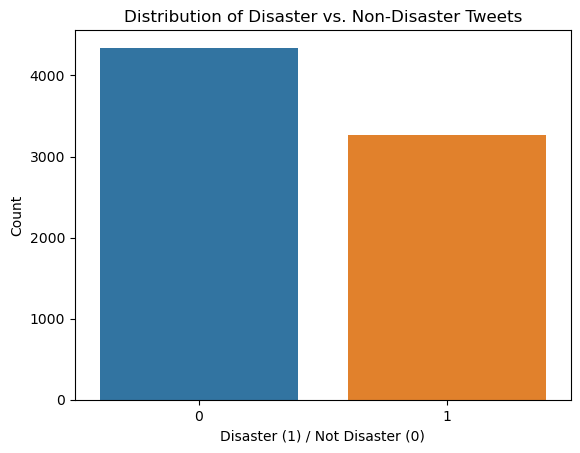

id          0
keyword     0
location    0
text        0
target      0
dtype: int64
id          0
keyword     0
location    0
text        0
dtype: int64


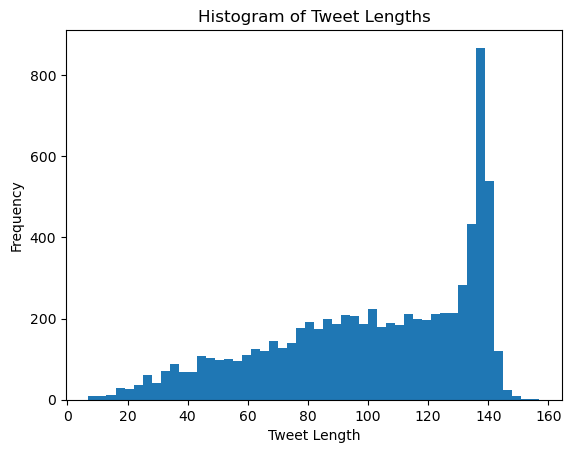

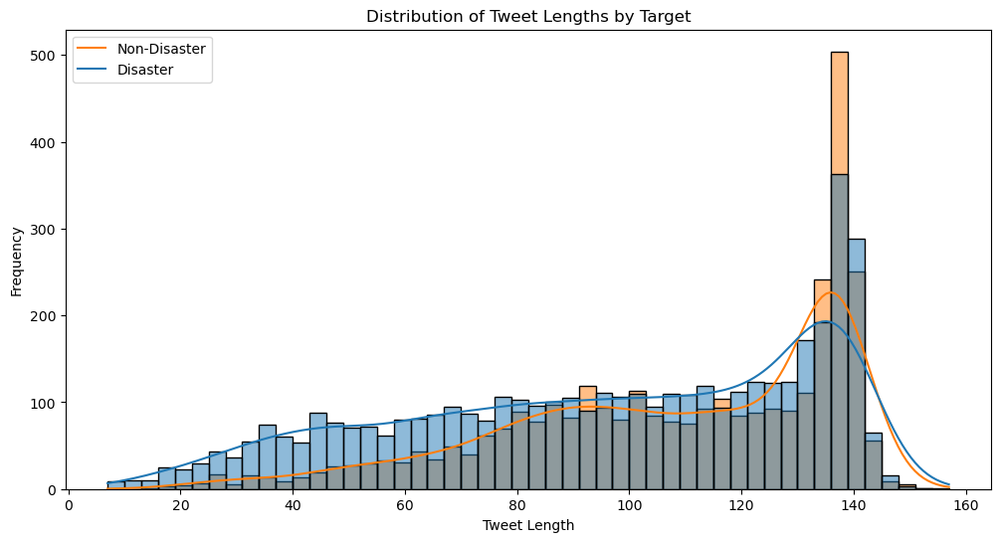

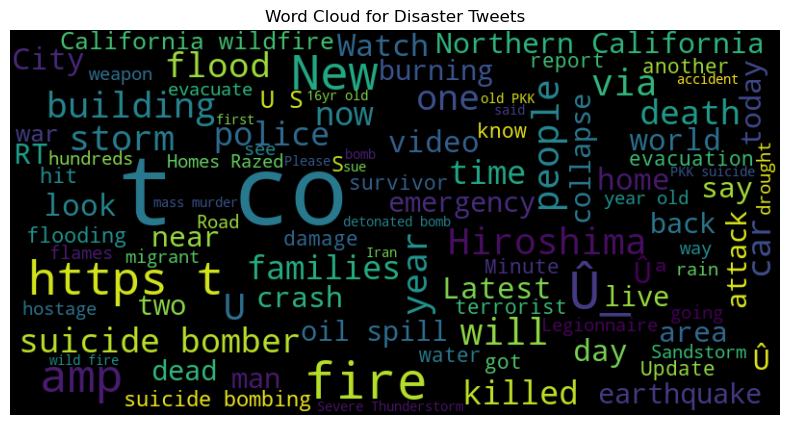

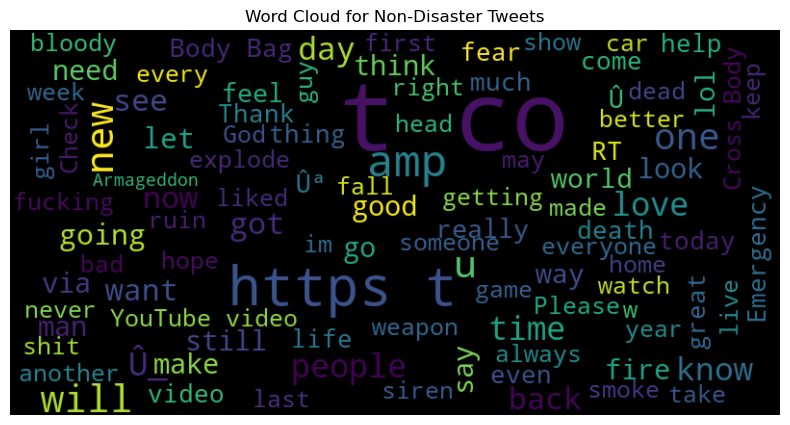

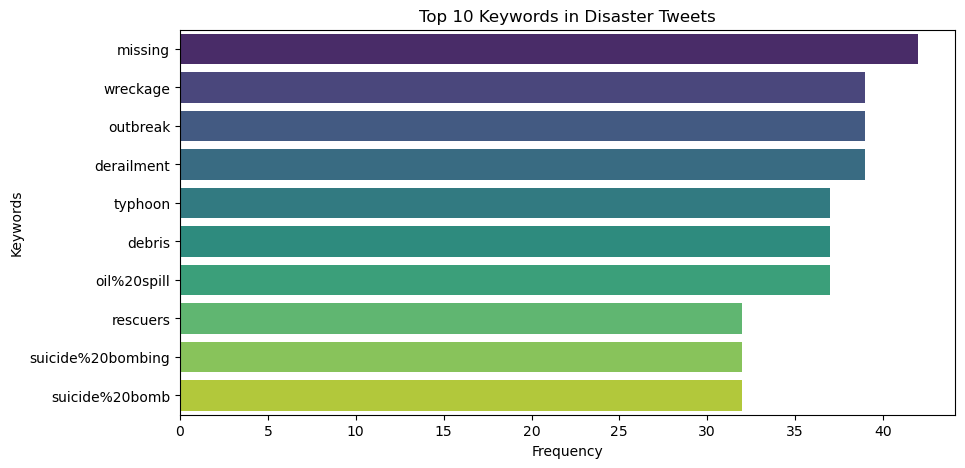

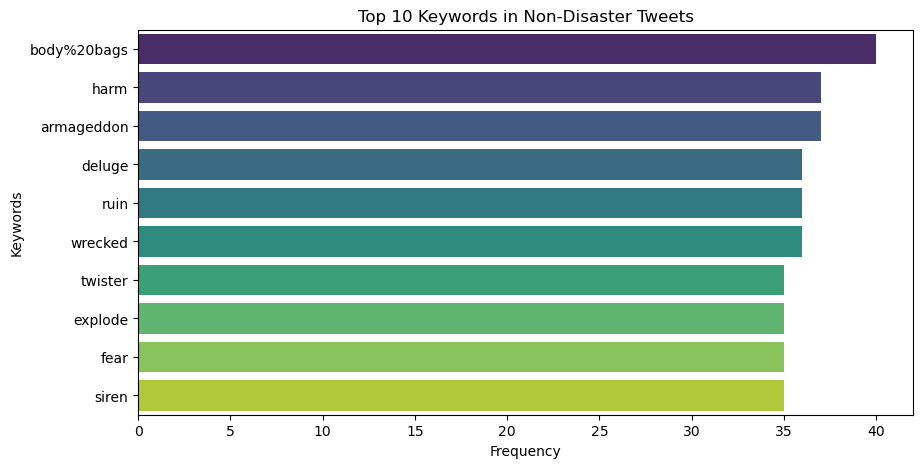

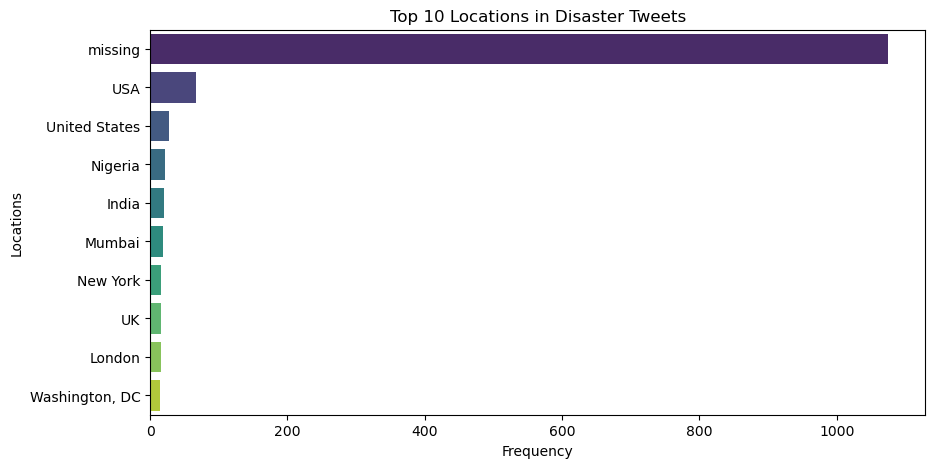

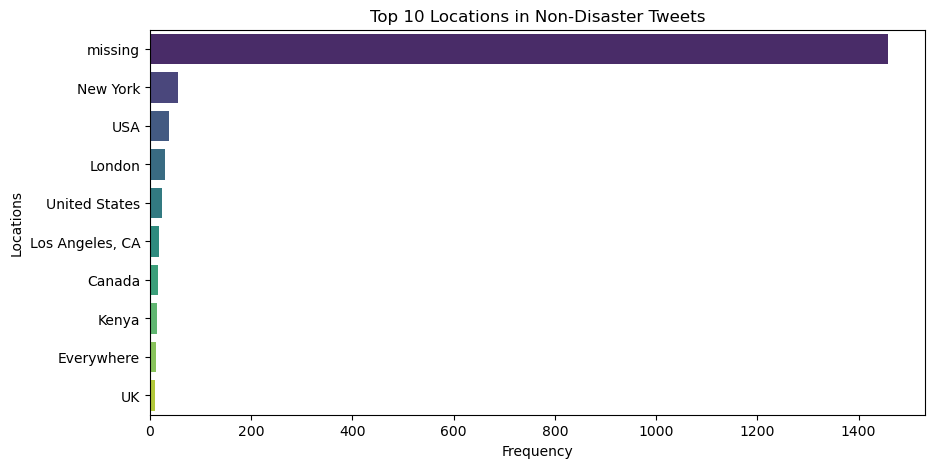

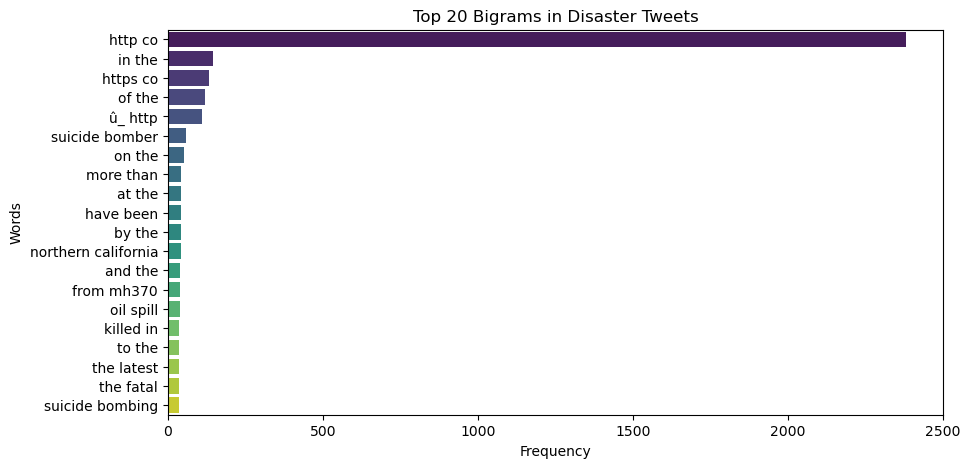

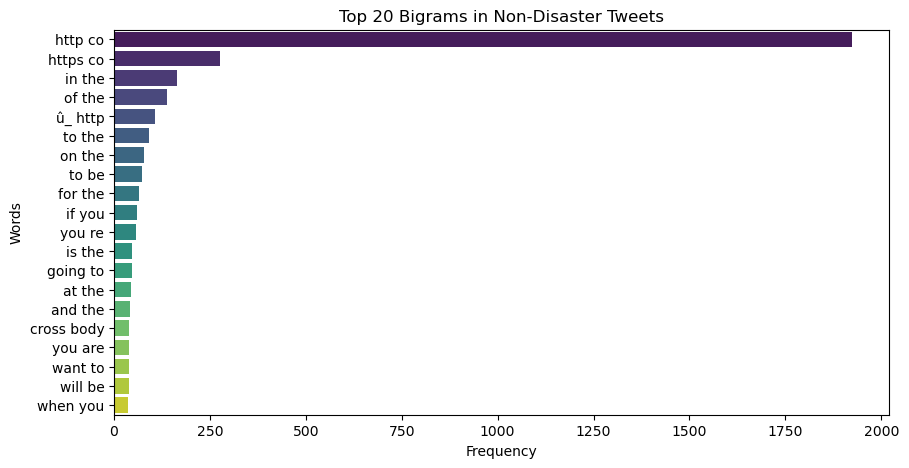

             text_length    target
text_length     1.000000  0.181817
target          0.181817  1.000000


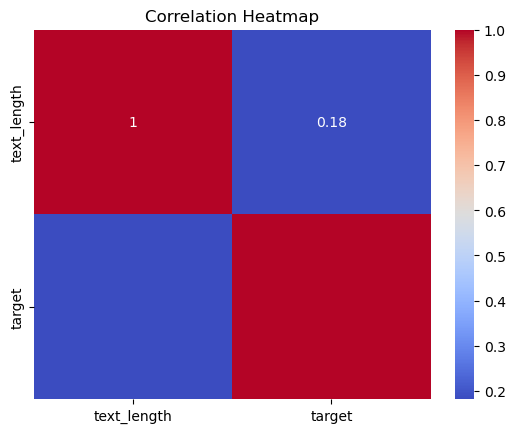

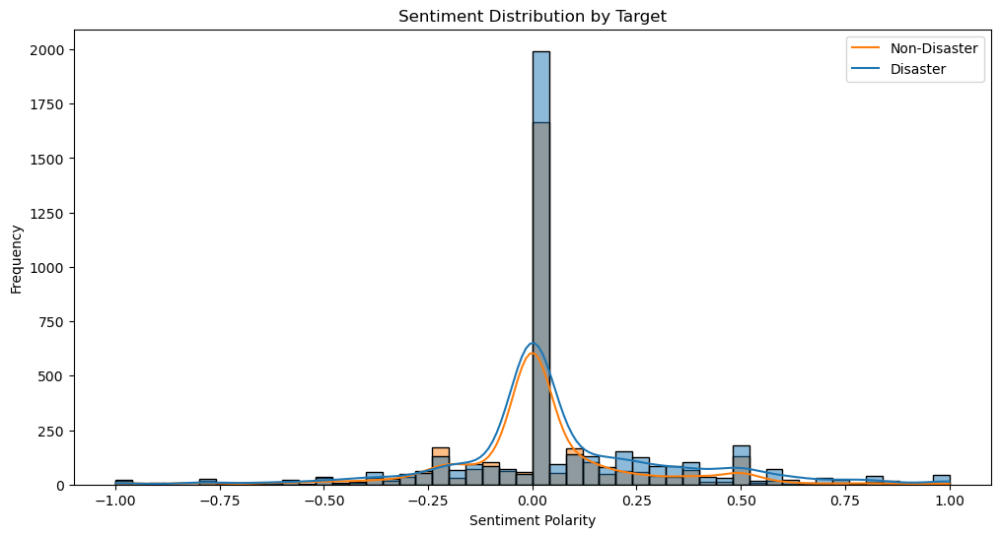

In [1]:
import warnings
import logging
warnings.filterwarnings("ignore")
warnings.filterwarnings("ignore", message=".*contains `beta`.*")
warnings.filterwarnings("ignore", message=".*contains `gamma`.*")
warnings.filterwarnings("ignore", category=UserWarning)
logging.getLogger("transformers").setLevel(logging.ERROR)

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from sklearn.feature_extraction.text import CountVectorizer
from textblob import TextBlob


###Load the training and test data
train_df = pd.read_csv('/home/bbehe/Desktop/Coursera/Intro_to_deep_learning/Week_4_Lab/nlp-getting-started/train.csv')
test_df = pd.read_csv('/home/bbehe/Desktop/Coursera/Intro_to_deep_learning/Week_4_Lab/nlp-getting-started/test.csv')

###Display the first few rows of the training data
print(train_df.head())

###Check for missing values in the training data
print(train_df.isnull().sum())

###Check for missing values in the test data
print(test_df.isnull().sum())

###Display basic statistics of the training data
print(train_df.describe())

###Visualize the distribution of the target variable
sns.countplot(x='target', data=train_df)
plt.title('Distribution of Disaster vs. Non-Disaster Tweets')
plt.xlabel('Disaster (1) / Not Disaster (0)')
plt.ylabel('Count')
plt.show()

###Fill missing values in 'keyword' and 'location' with a placeholder
train_df['keyword'].fillna('missing', inplace=True)
train_df['location'].fillna('missing', inplace=True)
test_df['keyword'].fillna('missing', inplace=True)
test_df['location'].fillna('missing', inplace=True)

###Verify there are no missing values
print(train_df.isnull().sum())
print(test_df.isnull().sum())

###Add a column for tweet length
train_df['text_length'] = train_df['text'].apply(len)

###Plot the distribution of tweet lengths
plt.hist(train_df['text_length'], bins=50)
plt.title('Histogram of Tweet Lengths')
plt.xlabel('Tweet Length')
plt.ylabel('Frequency')
plt.show()

###Distribution of Tweet Length by Target
plt.figure(figsize=(12, 6))
sns.histplot(data=train_df, x='text_length', hue='target', bins=50, kde=True)
plt.title('Distribution of Tweet Lengths by Target')
plt.xlabel('Tweet Length')
plt.ylabel('Frequency')
plt.legend(['Non-Disaster', 'Disaster'])
plt.show()

###Generate word cloud for disaster tweets
disaster_tweets = train_df[train_df['target'] == 1]['text'].str.cat(sep=' ')
wordcloud = WordCloud(width=800, height=400, max_font_size=100, max_words=100, background_color='black').generate(disaster_tweets)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud for Disaster Tweets')
plt.axis('off')
plt.show()

###Generate word cloud for non-disaster tweets
non_disaster_tweets = train_df[train_df['target'] == 0]['text'].str.cat(sep=' ')
wordcloud = WordCloud(width=800, height=400, max_font_size=100, max_words=100, background_color='black').generate(non_disaster_tweets)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud for Non-Disaster Tweets')
plt.axis('off')
plt.show()

###Visualize the most common keywords in disaster and non-disaster tweets
disaster_keywords = train_df[train_df['target'] == 1]['keyword'].value_counts().head(10)
non_disaster_keywords = train_df[train_df['target'] == 0]['keyword'].value_counts().head(10)

###Plot disaster keywords
plt.figure(figsize=(10, 5))
sns.barplot(x=disaster_keywords.values, y=disaster_keywords.index, palette='viridis')
plt.title('Top 10 Keywords in Disaster Tweets')
plt.xlabel('Frequency')
plt.ylabel('Keywords')
plt.show()

###Plot non-disaster keywords
plt.figure(figsize=(10, 5))
sns.barplot(x=non_disaster_keywords.values, y=non_disaster_keywords.index, palette='viridis')
plt.title('Top 10 Keywords in Non-Disaster Tweets')
plt.xlabel('Frequency')
plt.ylabel('Keywords')
plt.show()

###Visualize the most common locations in disaster and non-disaster tweets
disaster_locations = train_df[train_df['target'] == 1]['location'].value_counts().head(10)
non_disaster_locations = train_df[train_df['target'] == 0]['location'].value_counts().head(10)

###Plot disaster locations
plt.figure(figsize=(10, 5))
sns.barplot(x=disaster_locations.values, y=disaster_locations.index, palette='viridis')
plt.title('Top 10 Locations in Disaster Tweets')
plt.xlabel('Frequency')
plt.ylabel('Locations')
plt.show()

###Plot non-disaster locations
plt.figure(figsize=(10, 5))
sns.barplot(x=non_disaster_locations.values, y=non_disaster_locations.index, palette='viridis')
plt.title('Top 10 Locations in Non-Disaster Tweets')
plt.xlabel('Frequency')
plt.ylabel('Locations')
plt.show()

###Function to plot n-grams
def plot_ngrams(corpus, n=None, ngram_range=(1,1), title='N-grams'):
    vec = CountVectorizer(ngram_range=ngram_range).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
    words_freq = words_freq[:n]
    df = pd.DataFrame(words_freq, columns = ['word', 'freq'])
    
    plt.figure(figsize=(10, 5))
    sns.barplot(x='freq', y='word', data=df, palette='viridis')
    plt.title(title)
    plt.xlabel('Frequency')
    plt.ylabel('Words')
    plt.show()

###Bigrams in disaster tweets
disaster_corpus = train_df[train_df['target'] == 1]['text']
plot_ngrams(disaster_corpus, n=20, ngram_range=(2, 2), title='Top 20 Bigrams in Disaster Tweets')

###Bigrams in non-disaster tweets
non_disaster_corpus = train_df[train_df['target'] == 0]['text']
plot_ngrams(non_disaster_corpus, n=20, ngram_range=(2, 2), title='Top 20 Bigrams in Non-Disaster Tweets')

###Correlation between tweet length and target
correlation = train_df[['text_length', 'target']].corr()
print(correlation)
sns.heatmap(correlation, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

###Function to get sentiment
def get_sentiment(text):
    analysis = TextBlob(text)
    return analysis.sentiment.polarity

###Apply sentiment analysis
train_df['sentiment'] = train_df['text'].apply(get_sentiment)

###Plot sentiment distribution
plt.figure(figsize=(12, 6))
sns.histplot(data=train_df, x='sentiment', hue='target', kde=True, bins=50)
plt.title('Sentiment Distribution by Target')
plt.xlabel('Sentiment Polarity')
plt.ylabel('Frequency')
plt.legend(['Non-Disaster', 'Disaster'])
plt.show()


#### Class Imbalance

The bar chart displays the distribution of disaster (1) versus non-disaster (0) tweets in the dataset. The y-axis represents the count of tweets, while the x-axis indicates whether the tweet is classified as a disaster (1) or not (0). The count of non-disaster tweets is approximately 4,400, indicating that there are more tweets not related to disasters in the dataset. Conversely, the count of disaster tweets is around 3,100, showing that there are fewer disaster-related tweets compared to non-disaster tweets.

This distribution reveals a class imbalance, with a higher number of non-disaster tweets compared to disaster tweets. While the imbalance is not extreme, it is noticeable and could impact model performance. It is important to consider this imbalance when building and evaluating models. Techniques such as resampling (over-sampling the minority class or under-sampling the majority class), using class weights, or employing algorithms robust to class imbalance might be necessary to ensure the model performs well for both classes. Additionally, metrics such as precision, recall, and F1-score should be used in addition to accuracy to evaluate model performance, especially for the minority class (disaster tweets). Overall, addressing the class imbalance will be crucial in developing an effective classification model.

### Tweet Lengths Distribution

The histogram illustrates the distribution of tweet lengths within the dataset. The x-axis represents the length of the tweets, measured by the number of characters, while the y-axis indicates the frequency of tweets for each length. From the histogram, it is evident that tweet lengths vary significantly, ranging from very short tweets to those reaching the maximum allowed length on Twitter.

A noticeable peak occurs around the 140-character mark, which aligns with Twitter's historical character limit before it was increased to 280 characters. This peak suggests that many users tend to utilize the full character limit when composing their tweets. Additionally, there is a gradual increase in the frequency of tweets as the length increases up to this peak, indicating that longer tweets are more common than shorter ones.

The distribution of tweet lengths is positively skewed, with a majority of tweets falling within the 60 to 140-character range. The frequency of tweets decreases sharply beyond this range, highlighting that tweets longer than 140 characters are relatively rare. This analysis of tweet lengths provides valuable insights into user behavior on Twitter and suggests that many users prefer to maximize the information conveyed within the character constraints. Understanding this distribution is important for preprocessing and feature extraction in natural language processing tasks, as it can influence the choice of text representation techniques and model architecture.


### Distribution of Tweet Lengths by Target

The histogram illustrates the distribution of tweet lengths, categorized by disaster and non-disaster tweets. The x-axis represents tweet length in terms of character count, while the y-axis indicates the frequency of tweets for each length. The histogram includes overlaid density plots to provide a smoother representation of the distribution for both categories.

From the visualization, it is apparent that both disaster and non-disaster tweets follow a similar distribution pattern, with a significant peak around the 140-character mark. This peak aligns with Twitter's historical character limit, suggesting that many users tend to utilize the maximum allowable characters in their tweets. 

Comparing the distributions, disaster tweets (blue) and non-disaster tweets (orange) show a slightly different frequency pattern. Non-disaster tweets exhibit a higher frequency near the 140-character mark compared to disaster tweets. However, the overall shape of the distribution for both categories is quite similar, indicating that tweet length alone might not be a strong distinguishing feature between disaster and non-disaster tweets.

The histogram also reveals that shorter tweets are less frequent, with a gradual increase in tweet lengths leading up to the 140-character peak. The density plots suggest that while there are some variations in the distribution of tweet lengths between the two categories, these differences are relatively subtle. This analysis highlights the importance of considering additional features beyond tweet length for effectively distinguishing between disaster and non-disaster tweets in a classification model.


### Top 10 Keywords in Disaster Tweets

The bar chart displays the top 10 most frequent keywords found in disaster-related tweets. The y-axis lists the keywords, while the x-axis represents their frequency within the dataset.

The keyword "missing" appears most frequently, followed by "wreckage," "outbreak," "derailment," "typhoon," "debris," "oil spill," "rescuers," "suicide bombing," and "suicide bomb." These keywords are indicative of various types of disasters and emergency situations, suggesting that tweets containing these terms are more likely to be related to disasters.

The prominence of keywords like "missing," "wreckage," and "outbreak" indicates that tweets often report on missing persons, damage from disasters, and outbreaks of diseases or other emergencies. The presence of terms such as "typhoon," "derailment," and "oil spill" points to natural disasters and accidents. Additionally, the keywords "rescuers," "suicide bombing," and "suicide bomb" highlight the coverage of rescue operations and incidents of violence.

This analysis of keywords provides valuable insights into the content and themes of disaster-related tweets. Understanding the most common keywords can help in designing better features for text classification models and improving the accuracy of distinguishing between disaster and non-disaster tweets.

### Top 10 Keywords in Non-Disaster Tweets

The bar chart displays the top 10 most frequent keywords found in non-disaster-related tweets. The y-axis lists the keywords, while the x-axis represents their frequency within the dataset.

The keyword "body bags" appears most frequently, followed by "harm," "armageddon," "deluge," "ruin," "wrecked," "twister," "explode," "fear," and "siren." Despite these keywords often being associated with disasters or emergency situations, their presence in non-disaster tweets suggests that these terms are being used metaphorically or in a non-literal context.

The prominence of keywords like "body bags," "armageddon," and "deluge" in non-disaster tweets highlights the use of hyperbolic or exaggerated language on social media. For instance, "armageddon" might be used to describe a chaotic event that is not an actual disaster. Similarly, terms like "ruin," "wrecked," and "twister" can be used figuratively to describe personal situations or experiences rather than actual disasters.

The presence of keywords such as "explode," "fear," and "siren" also indicates that these terms are being employed in non-disaster contexts, potentially to express strong emotions or dramatic scenarios in everyday life.

This analysis of keywords in non-disaster tweets provides valuable insights into the language and expressions used on social media. Understanding the most common keywords can help in designing better features for text classification models and improving the accuracy of distinguishing between disaster and non-disaster tweets.

### Top 10 Locations in Disaster Tweets

The bar chart shows the top 10 most frequent locations mentioned in disaster-related tweets. The y-axis lists the locations, while the x-axis represents their frequency within the dataset. 

The keyword "missing" is the most frequently occurring location, which is likely a placeholder for tweets where the location information was not provided or was unavailable. This is followed by the "USA" and "United States," indicating a significant number of disaster-related tweets originating from or referring to the United States. Other locations frequently mentioned include Nigeria, India, Mumbai, New York, the UK, London, and Washington, DC. These locations reflect regions that are either more active on Twitter or are more frequently reporting disasters.

### Top 10 Locations in Non-Disaster Tweets

Similarly, the bar chart for non-disaster tweets also shows "missing" as the most frequent location. This again indicates that location information is often not available. Following "missing," the most common locations are New York, USA, London, United States, Los Angeles, CA, Canada, Kenya, Everywhere, and the UK. 

Comparing both charts, there are similarities in the top locations mentioned in disaster and non-disaster tweets, with places like the USA, New York, London, and the UK appearing in both lists. However, the frequency counts differ, with non-disaster tweets having higher counts for locations like New York and USA.

### Correlation Heatmap

The correlation heatmap reveals the relationship between tweet length (text_length) and disaster classification (target). The diagonal cells in the heatmap show the correlation of each variable with itself, which is always 1, indicating perfect correlation. The off-diagonal cells, specifically at the intersection of text_length and target, display a correlation coefficient of 0.18. This value suggests a weak positive correlation between tweet length and whether a tweet is about a disaster.

### Top 20 Bigrams in Disaster Tweets

The bar chart displays the top 20 most frequent bigrams (two-word combinations) found in disaster-related tweets. The y-axis lists the bigrams, while the x-axis represents their frequency within the dataset.

The most frequent bigram is "http co," followed by "in the," "https co," "of the," and "Û_ http." These bigrams suggest that many tweets contain URLs, which are typically shortened links shared on Twitter. This prevalence indicates that disaster-related tweets often include links to external resources, news articles, or official updates. Other notable bigrams such as "suicide bomber," "oil spill," and "suicide bombing" are directly related to specific disaster events or incidents, reflecting the nature of the content shared in these tweets.

### Top 20 Bigrams in Non-Disaster Tweets

Similarly, the bar chart for non-disaster tweets also shows "http co" as the most frequent bigram, followed by "https co," "in the," "of the," and "Û_ http." These results indicate that URLs are commonly included in non-disaster tweets as well, suggesting that users frequently share links regardless of the tweet's context. Other common bigrams like "to the," "on the," and "for the" are more generic and not specific to any particular event, highlighting the diverse range of topics discussed in non-disaster tweets.

### Sentiment Distribution by Target

The histogram illustrates the distribution of sentiment polarity for disaster and non-disaster tweets. The x-axis represents the sentiment polarity, which ranges from -1 (very negative) to 1 (very positive), while the y-axis indicates the frequency of tweets for each sentiment score. The overlaid density plots provide a smoother representation of the sentiment distribution for both categories.

From the histogram, it is evident that the majority of tweets, both disaster and non-disaster, have sentiment polarities centered around 0, indicating a neutral sentiment. This is reflected in the high peak at the 0 polarity mark. This suggests that a significant portion of tweets in the dataset do not exhibit strong positive or negative sentiments.

Comparing the distributions, disaster tweets (blue) and non-disaster tweets (orange) show similar patterns, with a slight difference in the spread and frequency. Disaster tweets tend to have a slightly higher frequency of negative sentiment values, as indicated by the blue density plot skewing marginally to the left of 0. This suggests that disaster-related tweets are more likely to contain negative sentiment, which is expected given the nature of the content.

Conversely, non-disaster tweets exhibit a more balanced distribution around the neutral mark, with a slightly higher frequency of positive sentiment values compared to disaster tweets. This is evident from the orange density plot extending slightly more towards the positive side of the sentiment scale.




In [2]:
import subprocess
import sys
import os
import pandas as pd
import numpy as np
import re
import string
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from nltk.corpus import stopwords
from gensim.models import Word2Vec
from transformers import BertTokenizer, BertModel
import torch
import nltk
import requests, zipfile, io
import warnings
import logging

###Download stopwords if not already downloaded
nltk.download('stopwords')

###Function to download and extract GloVe embeddings
def download_glove_embeddings():
    print("Downloading GloVe embeddings...")
    url = "http://nlp.stanford.edu/data/glove.6B.zip"
    response = requests.get(url)
    z = zipfile.ZipFile(io.BytesIO(response.content))
    z.extractall("glove.6B")
    print("GloVe embeddings downloaded and extracted.")

###Function to load GloVe model
def load_glove_model(file_path):
    print("Loading GloVe model...")
    glove_model = {}
    with open(file_path, "r", encoding="utf-8") as f:
        for line in f:
            values = line.split()
            word = values[0]
            vector = np.asarray(values[1:], dtype="float32")
            glove_model[word] = vector
    print("GloVe model loaded.")
    return glove_model

###Check if GloVe embeddings already exist
glove_file_path = "glove.6B/glove.6B.100d.txt"
if not os.path.exists(glove_file_path):
    download_glove_embeddings()
glove_model = load_glove_model(glove_file_path)

print("Handling missing values...")
###Fill missing values in 'keyword' and 'location' with a placeholder
train_df['keyword'].fillna('missing', inplace=True)
train_df['location'].fillna('missing', inplace=True)
test_df['keyword'].fillna('missing', inplace=True)
test_df['location'].fillna('missing', inplace=True)

def preprocess_text(text):
    ###Remove URLs
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    ###Remove punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))
    ###Convert to lowercase
    text = text.lower()
    ###Remove stop words
    stop_words = set(stopwords.words('english'))
    text = ' '.join([word for word in text.split() if word not in stop_words])
    return text

print("Preprocessing text data...")
###Apply the preprocessing function to the 'text' column
train_df['text'] = train_df['text'].apply(preprocess_text)
test_df['text'] = test_df['text'].apply(preprocess_text)

###Extract the target variable
y_train = train_df['target']

###Splitting for evaluation
print("Splitting data for training and validation...")
X_train_texts, X_val_texts, y_train, y_val = train_test_split(train_df['text'], y_train, test_size=0.2, random_state=42)

###TF-IDF Embedding
tfidf_file_train = "reshaped_tfidf_train.npy"
tfidf_file_val = "reshaped_tfidf_val.npy"
tfidf_file_test = "reshaped_tfidf_test.npy"

if os.path.exists(tfidf_file_train) and os.path.exists(tfidf_file_val) and os.path.exists(tfidf_file_test):
    print("Loading reshaped TF-IDF embeddings from disk...")
    X_train_tfidf = np.load(tfidf_file_train, allow_pickle=True)
    X_val_tfidf = np.load(tfidf_file_val, allow_pickle=True)
    X_test_tfidf = np.load(tfidf_file_test, allow_pickle=True)
else:
    print("Generating and reshaping TF-IDF embeddings...")
    tfidf = TfidfVectorizer(max_features=10000)
    X_train_tfidf = tfidf.fit_transform(X_train_texts).toarray().astype('float32')
    X_val_tfidf = tfidf.transform(X_val_texts).toarray().astype('float32')
    X_test_tfidf = tfidf.transform(test_df['text']).toarray().astype('float32')
    X_train_tfidf = X_train_tfidf.reshape(X_train_tfidf.shape[0], 1, X_train_tfidf.shape[1])
    X_val_tfidf = X_val_tfidf.reshape(X_val_tfidf.shape[0], 1, X_val_tfidf.shape[1])
    X_test_tfidf = X_test_tfidf.reshape(X_test_tfidf.shape[0], 1, X_test_tfidf.shape[1])
    np.save(tfidf_file_train, X_train_tfidf)
    np.save(tfidf_file_val, X_val_tfidf)
    np.save(tfidf_file_test, X_test_tfidf)

###Word2Vec Embedding
w2v_file_train = "reshaped_w2v_train.npy"
w2v_file_val = "reshaped_w2v_val.npy"
w2v_file_test = "reshaped_w2v_test.npy"

def get_word2vec_embeddings(texts, model, size):
    embeddings = []
    for text in texts:
        words = text.split()
        vector = np.zeros(size, dtype='float32')
        for word in words:
            if word in model.wv:
                vector += model.wv[word].astype('float32')
        embeddings.append(vector / len(words))
    return np.array(embeddings, dtype='float32')

if os.path.exists(w2v_file_train) and os.path.exists(w2v_file_val) and os.path.exists(w2v_file_test):
    print("Loading reshaped Word2Vec embeddings from disk...")
    X_train_w2v = np.load(w2v_file_train, allow_pickle=True)
    X_val_w2v = np.load(w2v_file_val, allow_pickle=True)
    X_test_w2v = np.load(w2v_file_test, allow_pickle=True)
else:
    print("Training Word2Vec model and generating embeddings...")
    word2vec_model = Word2Vec(sentences=[text.split() for text in train_df['text']], vector_size=100, window=5, min_count=1, workers=4)
    X_train_w2v = get_word2vec_embeddings(X_train_texts, word2vec_model, 100)
    X_val_w2v = get_word2vec_embeddings(X_val_texts, word2vec_model, 100)
    X_test_w2v = get_word2vec_embeddings(test_df['text'], word2vec_model, 100)
    X_train_w2v = X_train_w2v.reshape(X_train_w2v.shape[0], 1, X_train_w2v.shape[1])
    X_val_w2v = X_val_w2v.reshape(X_val_w2v.shape[0], 1, X_val_w2v.shape[1])
    X_test_w2v = X_test_w2v.reshape(X_test_w2v.shape[0], 1, X_test_w2v.shape[1])
    np.save(w2v_file_train, X_train_w2v)
    np.save(w2v_file_val, X_val_w2v)
    np.save(w2v_file_test, X_test_w2v)

###BERT Embedding
bert_file_train = "reshaped_bert_train.npy"
bert_file_val = "reshaped_bert_val.npy"
bert_file_test = "reshaped_bert_test.npy"

def get_bert_embeddings(texts):
    inputs = tokenizer(texts, return_tensors='pt', padding=True, truncation=True, max_length=128)
    with torch.no_grad():
        outputs = model(**inputs)
    return outputs.last_hidden_state.mean(dim=1).numpy().astype('float32')

if os.path.exists(bert_file_train) and os.path.exists(bert_file_val) and os.path.exists(bert_file_test):
    print("Loading reshaped BERT embeddings from disk...")
    X_train_bert = np.load(bert_file_train, allow_pickle=True)
    X_val_bert = np.load(bert_file_val, allow_pickle=True)
    X_test_bert = np.load(bert_file_test, allow_pickle=True)
else:
    print("Generating and reshaping BERT embeddings...")
    tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
    model = BertModel.from_pretrained('bert-base-uncased')
    X_train_bert = get_bert_embeddings(X_train_texts.tolist())
    X_val_bert = get_bert_embeddings(X_val_texts.tolist())
    X_test_bert = get_bert_embeddings(test_df['text'].tolist())
    X_train_bert = X_train_bert.reshape(X_train_bert.shape[0], 1, X_train_bert.shape[1])
    X_val_bert = X_val_bert.reshape(X_val_bert.shape[0], 1, X_val_bert.shape[1])
    X_test_bert = X_test_bert.reshape(X_test_bert.shape[0], 1, X_test_bert.shape[1])
    np.save(bert_file_train, X_train_bert)
    np.save(bert_file_val, X_val_bert)
    np.save(bert_file_test, X_test_bert)

###GloVe Embedding
glove_file_train = "reshaped_glove_train.npy"
glove_file_val = "reshaped_glove_val.npy"
glove_file_test = "reshaped_glove_test.npy"

def get_glove_embeddings(texts, glove_model, size):
    embeddings = []
    for text in texts:
        words = text.split()
        vector = np.zeros(size, dtype='float32')
        for word in words:
            if word in glove_model:
                vector += glove_model[word].astype('float32')
        embeddings.append(vector / len(words))
    return np.array(embeddings, dtype='float32')

if os.path.exists(glove_file_train) and os.path.exists(glove_file_val) and os.path.exists(glove_file_test):
    print("Loading reshaped GloVe embeddings from disk...")
    X_train_glove = np.load(glove_file_train, allow_pickle=True)
    X_val_glove = np.load(glove_file_val, allow_pickle=True)
    X_test_glove = np.load(glove_file_test, allow_pickle=True)
else:
    print("Generating and reshaping GloVe embeddings...")
    X_train_glove = get_glove_embeddings(X_train_texts, glove_model, 100)
    X_val_glove = get_glove_embeddings(X_val_texts, glove_model, 100)
    X_test_glove = get_glove_embeddings(test_df['text'], glove_model, 100)
    X_train_glove = X_train_glove.reshape(X_train_glove.shape[0], 1, X_train_glove.shape[1])
    X_val_glove = X_val_glove.reshape(X_val_glove.shape[0], 1, X_val_glove.shape[1])
    X_test_glove = X_test_glove.reshape(X_test_glove.shape[0], 1, X_test_glove.shape[1])
    np.save(glove_file_train, X_train_glove)
    np.save(glove_file_val, X_val_glove)
    np.save(glove_file_test, X_test_glove)

print("Embeddings generation and reshaping complete.")


[nltk_data] Downloading package stopwords to /home/bbehe/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Loading GloVe model...
GloVe model loaded.
Handling missing values...
Preprocessing text data...
Splitting data for training and validation...
Loading reshaped TF-IDF embeddings from disk...
Loading reshaped Word2Vec embeddings from disk...
Loading reshaped BERT embeddings from disk...
Loading reshaped GloVe embeddings from disk...
Embeddings generation and reshaping complete.


### Data Cleaning and Embedding Generation Process

#### Data Cleaning Process

The data cleaning process involves handling missing values and preprocessing the text data. The dataset contains missing values in the `keyword` and `location` columns, which are filled with the placeholder `'missing'` to ensure consistency and prevent issues during model training. 

Text preprocessing is performed on the `text` column to clean and standardize the content. The preprocessing steps include removing URLs using regular expressions, removing punctuation using string translation, converting text to lowercase, and removing stop words using the NLTK library. This ensures that the text data is in a suitable format for generating embeddings.

#### TF-IDF Embeddings

TF-IDF (Term Frequency-Inverse Document Frequency) is a numerical statistic that reflects the importance of a word in a document relative to a collection of documents (corpus). It is widely used in information retrieval and text mining. The `TfidfVectorizer` from `scikit-learn` is used to convert the cleaned text data into TF-IDF features. The generated embeddings are saved to disk to avoid regeneration in future runs.

Citation: [Ramos, J. (2003). Using TF-IDF to Determine Word Relevance in Document Queries. Proceedings of the First International Conference on Machine Learning.](http://www.cs.umb.edu/~smimarog/textmining/techniques/TFIDF.html)

#### Word2Vec Embeddings

Word2Vec is a group of related models used to produce word embeddings. These models are shallow, two-layer neural networks trained to reconstruct linguistic contexts of words. Word2Vec takes a large corpus of text as its input and produces a vector space, typically of several hundred dimensions, with each unique word in the corpus being assigned a corresponding vector in the space. The `Word2Vec` model from `gensim` is trained on the cleaned text data to generate word embeddings. The average of word vectors in a tweet is used as the tweet's vector representation. The generated embeddings are saved to disk to avoid regeneration in future runs.

Citation: [Mikolov, T., Chen, K., Corrado, G., & Dean, J. (2013). Efficient Estimation of Word Representations in Vector Space. arXiv preprint arXiv:1301.3781.](https://arxiv.org/abs/1301.3781)

#### BERT Embeddings

BERT (Bidirectional Encoder Representations from Transformers) is a transformer-based model designed to pre-train deep bidirectional representations by jointly conditioning on both left and right context in all layers. This allows the model to understand the context of a word in a sentence. The `BertTokenizer` and `BertModel` from the `transformers` library are used to tokenize the text and generate embeddings. The mean of the token embeddings from the last hidden state of the BERT model is used as the tweet's vector representation. The generated embeddings are saved to disk to avoid regeneration in future runs.

Citation: [Devlin, J., Chang, M. W., Lee, K., & Toutanova, K. (2019). BERT: Pre-training of Deep Bidirectional Transformers for Language Understanding. In Proceedings of NAACL-HLT.](https://arxiv.org/abs/1810.04805)

#### GloVe Embeddings

GloVe (Global Vectors for Word Representation) is an unsupervised learning algorithm for obtaining vector representations for words. Training is performed on aggregated global word-word co-occurrence statistics from a corpus, and the resulting representations showcase interesting linear substructures of the word vector space. The GloVe embeddings are downloaded and extracted. The average of word vectors in a tweet is used to create the tweet's vector representation. The generated embeddings are saved to disk to avoid regeneration in future runs.

Citation: [Pennington, J., Socher, R., & Manning, C. D. (2014). GloVe: Global Vectors for Word Representation. In Proceedings of the 2014 Conference on Empirical Methods in Natural Language Processing (EMNLP).](https://www.aclweb.org/anthology/D14-1162)



In [67]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import accuracy_score
from itertools import product
import warnings
warnings.filterwarnings("ignore")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

embeddings = {
    "tfidf": {
        "train": np.load("reshaped_tfidf_train.npy", allow_pickle=True),
        "val": np.load("reshaped_tfidf_val.npy", allow_pickle=True),
        "test": np.load("reshaped_tfidf_test.npy", allow_pickle=True)
    },
    "w2v": {
        "train": np.load("reshaped_w2v_train.npy", allow_pickle=True),
        "val": np.load("reshaped_w2v_val.npy", allow_pickle=True),
        "test": np.load("reshaped_w2v_test.npy", allow_pickle=True)
    },
    "bert": {
        "train": np.load("reshaped_bert_train.npy", allow_pickle=True),
        "val": np.load("reshaped_bert_val.npy", allow_pickle=True),
        "test": np.load("reshaped_bert_test.npy", allow_pickle=True)
    },
    "glove": {
        "train": np.load("reshaped_glove_train.npy", allow_pickle=True),
        "val": np.load("reshaped_glove_val.npy", allow_pickle=True),
        "test": np.load("reshaped_glove_test.npy", allow_pickle=True)
    }
}

class LSTMModel(nn.Module):
    def __init__(self, input_dim, hidden_dim=128, num_layers=2, dropout_rate=0.5, activation_function=nn.ReLU):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_dim, hidden_dim, num_layers=num_layers, batch_first=True, dropout=dropout_rate)
        self.fc = nn.Linear(hidden_dim, 1)
        self.activation = activation_function()

    def forward(self, x):
        x, _ = self.lstm(x)
        x = self.fc(x[:, -1, :])
        x = self.activation(x)
        return x

class GRUModel(nn.Module):
    def __init__(self, input_dim, hidden_dim=128, num_layers=2, dropout_rate=0.5, activation_function=nn.ReLU):
        super(GRUModel, self).__init__()
        self.gru = nn.GRU(input_dim, hidden_dim, num_layers=num_layers, batch_first=True, dropout=dropout_rate)
        self.fc = nn.Linear(hidden_dim, 1)
        self.activation = activation_function()

    def forward(self, x):
        x, _ = self.gru(x)
        x = self.fc(x[:, -1, :])
        x = self.activation(x)
        return x

class BidirectionalLSTMModel(nn.Module):
    def __init__(self, input_dim, hidden_dim=128, num_layers=2, dropout_rate=0.5, activation_function=nn.ReLU):
        super(BidirectionalLSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_dim, hidden_dim, num_layers=num_layers, batch_first=True, dropout=dropout_rate, bidirectional=True)
        self.fc = nn.Linear(hidden_dim * 2, 1)
        self.activation = activation_function()

    def forward(self, x):
        x, _ = self.lstm(x)
        x = self.fc(x[:, -1, :])
        x = self.activation(x)
        return x

###Training function with early stopping and learning rate scheduler
def train_model(model, criterion, optimizer, scheduler, train_loader, val_loader, num_epochs=10, patience=3, checkpoint_path=None, start_epoch=0, epsilon=1e-4):
    best_val_loss = float('inf')
    best_val_accuracy = 0.0  
    patience_counter = 0
    val_patience_counter = 0
    val_patience = patience + 5
    
    if checkpoint_path and os.path.exists(checkpoint_path):
        checkpoint = torch.load(checkpoint_path)
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
        best_val_loss = checkpoint['best_val_loss']
        best_val_accuracy = checkpoint.get('best_val_accuracy', 0.0) 
        start_epoch = checkpoint['epoch'] + 1
        print(f"Loaded checkpoint from {checkpoint_path}, resuming training from epoch {start_epoch}")

    for epoch in range(start_epoch, num_epochs):
        model.train()
        train_loss = 0.0
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels.unsqueeze(1).float())
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * inputs.size(0)

        val_loss = 0.0
        all_preds = []
        all_labels = []
        model.eval()
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels.unsqueeze(1).float())
                val_loss += loss.item() * inputs.size(0)

                preds = (torch.sigmoid(outputs) > 0.5).float()
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

        train_loss = train_loss / len(train_loader.dataset)
        val_loss = val_loss / len(val_loader.dataset)
        val_accuracy = accuracy_score(all_labels, all_preds)

        print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}")

        scheduler.step(val_loss)

        
        if (val_loss < best_val_loss):
            best_val_loss = val_loss
            #best_val_accuracy = val_accuracy
            patience_counter = 0

            if checkpoint_path:
                torch.save({
                    'epoch': epoch,
                    'model_state_dict': model.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict(),
                    'scheduler_state_dict': scheduler.state_dict(),
                    'best_val_loss': best_val_loss,
                    'best_val_accuracy': best_val_accuracy  
                }, checkpoint_path)
                
        else:
            patience_counter += 1

        ###Check for significant improvement in accuracy
        if (round(val_accuracy, 4) > round(best_val_accuracy, 4)):
            best_val_accuracy = val_accuracy
            val_patience_counter = 0

            if checkpoint_path:
                torch.save({
                    'epoch': epoch,
                    'model_state_dict': model.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict(),
                    'scheduler_state_dict': scheduler.state_dict(),
                    'best_val_loss': best_val_loss,
                    'best_val_accuracy': best_val_accuracy  
                }, checkpoint_path)
                
        else:
            val_patience_counter += 1
            
        if(epoch > 3 and best_val_accuracy < 0.7):
            print("Early stopping triggered: epoch")
            break

        if (patience_counter >= patience):
            print("Early stopping triggered: loss")
            break
            
        if (val_patience_counter >= val_patience):
            print("Early stopping tiggered: acc")
            break
        
        

    return best_val_loss, best_val_accuracy

###Hyperparameters
hidden_dims = [64, 128, 256]
num_layers_list = [1, 2, 3]
dropout_rates = [0.3, 0.5]
batch_sizes = [32, 64]
num_epochs = 50
learning_rates = [0.0001, 0.001, 0.01, 0.1]
activation_functions = [nn.Sigmoid, nn.ReLU, nn.LeakyReLU]
optimizers = ['Adam', 'SGD', 'RMSprop', 'AdamW']
patience = 3

###Convert y_train and y_val to numpy arrays
y_train = y_train.values  
y_val = y_val.values  


top_models = []

total_combinations = len(hidden_dims) * len(num_layers_list) * len(dropout_rates) * len(batch_sizes) * len(learning_rates) * len(activation_functions) * len(optimizers)
combination_counter = 0

for embedding_type, data in embeddings.items():
    X_train = data['train']
    X_val = data['val']
    
    input_dim = X_train.shape[2]

    print(f"\nTraining models for {embedding_type} embeddings...")

    ###Convert data to PyTorch tensors and create data loaders
    train_dataset = TensorDataset(torch.tensor(X_train, dtype=torch.float32), torch.tensor(y_train, dtype=torch.long))
    val_dataset = TensorDataset(torch.tensor(X_val, dtype=torch.float32), torch.tensor(y_val, dtype=torch.long))

    ###Grid search over hyperparameters
    for hidden_dim, num_layers, dropout_rate, batch_size, lr, activation_function, opt in product(
            hidden_dims, num_layers_list, dropout_rates, batch_sizes, learning_rates, activation_functions, optimizers):
        
        combination_counter += 1
        model_name_prefix = f"{embedding_type}_hiddim_{hidden_dim}_layers_{num_layers}_dropout_{dropout_rate}_batchsize_{batch_size}_lr_{lr}_opt_{opt}_act_{activation_function.__name__}"
        print(f"\nCombination {combination_counter}/{total_combinations}: {model_name_prefix}")
        
        checkpoint_path_lstm = f"checkpoints/{model_name_prefix}_LSTM.pth"
        checkpoint_path_gru = f"checkpoints/{model_name_prefix}_GRU.pth"
        checkpoint_path_bilstm = f"checkpoints/{model_name_prefix}_BidirectionalLSTM.pth"
        
        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
        val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

        ###Initialize models
        lstm_model = LSTMModel(input_dim=input_dim, hidden_dim=hidden_dim, num_layers=num_layers, dropout_rate=dropout_rate, activation_function=activation_function).to(device)
        gru_model = GRUModel(input_dim=input_dim, hidden_dim=hidden_dim, num_layers=num_layers, dropout_rate=dropout_rate, activation_function=activation_function).to(device)
        bidirectional_lstm_model = BidirectionalLSTMModel(input_dim=input_dim, hidden_dim=hidden_dim, num_layers=num_layers, dropout_rate=dropout_rate, activation_function=activation_function).to(device)

        ###Initialize criterion and optimizer
        criterion = nn.BCEWithLogitsLoss()
        if opt == 'Adam':
            lstm_optimizer = optim.Adam(lstm_model.parameters(), lr=lr)
            gru_optimizer = optim.Adam(gru_model.parameters(), lr=lr)
            bidirectional_lstm_optimizer = optim.Adam(bidirectional_lstm_model.parameters(), lr=lr)
        elif opt == 'SGD':
            lstm_optimizer = optim.SGD(lstm_model.parameters(), lr=lr)
            gru_optimizer = optim.SGD(gru_model.parameters(), lr=lr)
            bidirectional_lstm_optimizer = optim.SGD(bidirectional_lstm_model.parameters(), lr=lr)
        elif opt == 'RMSprop':
            lstm_optimizer = optim.RMSprop(lstm_model.parameters(), lr=lr)
            gru_optimizer = optim.RMSprop(gru_model.parameters(), lr=lr)
            bidirectional_lstm_optimizer = optim.RMSprop(bidirectional_lstm_model.parameters(), lr=lr)
        elif opt == 'AdamW':
            lstm_optimizer = optim.AdamW(lstm_model.parameters(), lr=lr)
            gru_optimizer = optim.AdamW(gru_model.parameters(), lr=lr)
            bidirectional_lstm_optimizer = optim.AdamW(bidirectional_lstm_model.parameters(), lr=lr)

        ###Initialize learning rate scheduler
        scheduler_lstm = optim.lr_scheduler.ReduceLROnPlateau(optimizer=lstm_optimizer, mode='min', factor=0.5, patience=2, verbose=True)
        scheduler_gru = optim.lr_scheduler.ReduceLROnPlateau(optimizer=gru_optimizer, mode='min', factor=0.5, patience=2, verbose=True)
        scheduler_bilstm = optim.lr_scheduler.ReduceLROnPlateau(optimizer=bidirectional_lstm_optimizer, mode='min', factor=0.5, patience=2, verbose=True)

        ###Check if checkpoint exists and load if it does
        if os.path.exists(checkpoint_path_lstm):
            print(f"\nTraining LSTM models for {embedding_type} embeddings...")

            lstm_val_loss, lstm_val_accuracy = train_model(lstm_model, criterion, lstm_optimizer, scheduler_lstm, train_loader, val_loader, num_epochs=num_epochs, patience=patience, checkpoint_path=checkpoint_path_lstm)
        else:
            print(f"\nTraining LSTM models for {embedding_type} embeddings...")
            lstm_val_loss, lstm_val_accuracy = train_model(lstm_model, criterion, lstm_optimizer, scheduler_lstm, train_loader, val_loader, num_epochs=num_epochs, patience=patience, checkpoint_path=checkpoint_path_lstm)

        if os.path.exists(checkpoint_path_gru):
            print(f"\nTraining GRU models for {embedding_type} embeddings...")
            gru_val_loss, gru_val_accuracy = train_model(gru_model, criterion, gru_optimizer, scheduler_gru, train_loader, val_loader, num_epochs=num_epochs, patience=patience, checkpoint_path=checkpoint_path_gru)
        else:
            print(f"\nTraining GRU models for {embedding_type} embeddings...")
            gru_val_loss, gru_val_accuracy = train_model(gru_model, criterion, gru_optimizer, scheduler_gru, train_loader, val_loader, num_epochs=num_epochs, patience=patience, checkpoint_path=checkpoint_path_gru)

        if os.path.exists(checkpoint_path_bilstm):
            print(f"\nTraining BILSTM models for {embedding_type} embeddings...")
            bidirectional_lstm_val_loss, bidirectional_lstm_val_accuracy = train_model(bidirectional_lstm_model, criterion, bidirectional_lstm_optimizer, scheduler_bilstm, train_loader, val_loader, num_epochs=num_epochs, patience=patience, checkpoint_path=checkpoint_path_bilstm)
        else:
            print(f"\nTraining BILSTM models for {embedding_type} embeddings...")
            bidirectional_lstm_val_loss, bidirectional_lstm_val_accuracy = train_model(bidirectional_lstm_model, criterion, bidirectional_lstm_optimizer, scheduler_bilstm, train_loader, val_loader, num_epochs=num_epochs, patience=patience, checkpoint_path=checkpoint_path_bilstm)

        ###Save the models if they are in the top 10
        for model_name, val_loss, val_accuracy, model, checkpoint_path in zip(
            ["LSTM", "GRU", "Bidirectional LSTM"],
            [lstm_val_loss, gru_val_loss, bidirectional_lstm_val_loss],
            [lstm_val_accuracy, gru_val_accuracy, bidirectional_lstm_val_accuracy],
            [lstm_model, gru_model, bidirectional_lstm_model],
            [checkpoint_path_lstm, checkpoint_path_gru, checkpoint_path_bilstm]
        ):
            top_models.append((val_loss, val_accuracy, checkpoint_path, model_name, model))
            top_models = sorted(top_models, key=lambda x: x[0])[:10]

###Save the top 10 models and print their details
for val_loss, val_accuracy, checkpoint_path, model_name, model in top_models:
    torch.save(model.state_dict(), checkpoint_path)
    print(f"Saved model: {model_name} at {checkpoint_path} with Validation Loss: {val_loss}, Validation Accuracy: {val_accuracy}")


Using device: cuda

Training models for tfidf embeddings...

Combination 1/1728: tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 16
Epoch 17/50, Train Loss: 0.6567, Val Loss: 0.6668, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid_GRU.pth, resuming training from epoch 16
Epoch 17/50, Train Loss: 0.6381, Val Loss: 0.6547, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 16
Epoch

Epoch 21/50, Train Loss: 0.5079, Val Loss: 0.6180, Val Accuracy: 0.6310
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 21
Epoch 22/50, Train Loss: 0.4931, Val Loss: 0.6228, Val Accuracy: 0.6527
Early stopping triggered: epoch

Combination 9/1728: tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_LeakyReLU_LSTM.pth, resuming training from epoch 24
Epoch 25/50, Train Loss: 0.4988, Val Loss: 0.6199, Val Accuracy: 0.6402
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_LeakyReL

Epoch 11/50, Train Loss: 0.5469, Val Loss: 0.6376, Val Accuracy: 0.4274
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 7
Epoch 8/50, Train Loss: 0.5506, Val Loss: 0.6380, Val Accuracy: 0.4274
Early stopping triggered: epoch

Combination 17/1728: tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_Adam_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_Adam_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf em

Epoch 25/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5660
Early stopping triggered: epoch

Combination 23/1728: tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU_LSTM.pth, resuming training from epoch 7
Epoch 8/50, Train Loss: 0.4548, Val Loss: 0.6193, Val Accuracy: 0.7971
Epoch 9/50, Train Loss: 0.4484, Val Loss: 0.6168, Val Accuracy: 0.7945
Epoch 10/50, Train Loss: 0.4422, Val Loss: 0.6181, Val Accuracy: 0.7925
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 19
Epoch 20/50, Train Loss: 0.4155, Val Loss: 0.7566, Val Accuracy: 0.7735
Epoch 21/50, Train Loss: 0.4152, Val Loss: 0.7571, Val Accu

Epoch 3/50, Train Loss: 0.5086, Val Loss: 0.6068, Val Accuracy: 0.7814
Epoch 4/50, Train Loss: 0.4975, Val Loss: 0.6438, Val Accuracy: 0.7728
Epoch 5/50, Train Loss: 0.4924, Val Loss: 0.7355, Val Accuracy: 0.7774
Early stopping triggered: loss

Combination 30/1728: tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 13
Epoch 14/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5745
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Lo

Epoch 2/50, Train Loss: 0.4980, Val Loss: 0.6630, Val Accuracy: 0.7682
Epoch 3/50, Train Loss: 0.4308, Val Loss: 0.7612, Val Accuracy: 0.7630
Epoch 4/50, Train Loss: 0.3673, Val Loss: 1.1216, Val Accuracy: 0.7617
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.4920, Val Loss: 0.7424, Val Accuracy: 0.7689
Epoch 3/50, Train Loss: 0.4293, Val Loss: 0.9116, Val Accuracy: 0.7544
Epoch 4/50, Train Loss: 0.3592, Val Loss: 0.7420, Val Accuracy: 0.7269
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.4906, Val Loss: 0.5998, Val Accuracy: 0.7525
Epoch 3/50, Train Lo

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 42/1728: tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5772
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5758
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5758
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.

Epoch 4/50, Train Loss: 0.1427, Val Loss: 1.2373, Val Accuracy: 0.7656
Epoch 5/50, Train Loss: 0.0903, Val Loss: 2.0396, Val Accuracy: 0.7715
Epoch 6/50, Train Loss: 0.0744, Val Loss: 1.4328, Val Accuracy: 0.7708
Early stopping triggered: loss

Combination 48/1728: tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_LeakyReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.3838, Val Loss: 0.7543, Val Accuracy: 0.7663
Epoch 3/50, Train Loss: 0.2419, Val Loss: 1.1526, Val Accuracy: 0.7571
Epoch 4/50, Train Loss: 0.1827, Val Loss: 0.8017, Val Accuracy: 0.7236
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 6
Epoch


Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from epoch 14
Epoch 15/50, Train Loss: 0.6382, Val Loss: 0.6548, Val Accuracy: 0.5653
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 32
Epoch 33/50, Train Loss: 0.5175, Val Loss: 0.6121, Val Accuracy: 0.6435
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 14
Epoch 15/50, Train Loss: 0.6796, Val Loss: 0.6832, Val Accuracy: 0.5588
Early stopping triggered: epoch

Combination 56/1728: tfidf_hiddim_64_layers_1_dropout_0.3_batc

Epoch 13/50, Train Loss: 0.7556, Val Loss: 0.7577, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 63/1728: tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid_LSTM.pth, resuming training from epoch 5
Epoch 6/50, Train Loss: 0.5830, Val Loss: 0.6276, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid_GRU.pth, resuming training from epoch 10
Epoch 11/50, Train Loss: 0.5529, Val Loss: 0.6338, Val Accuracy: 0.4281
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid_Bidirecti

Epoch 4/50, Train Loss: 0.5069, Val Loss: 0.6000, Val Accuracy: 0.7413
Epoch 5/50, Train Loss: 0.4800, Val Loss: 0.6204, Val Accuracy: 0.7262
Epoch 6/50, Train Loss: 0.4610, Val Loss: 0.6433, Val Accuracy: 0.7236
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 6
Epoch 7/50, Train Loss: 0.4381, Val Loss: 0.6780, Val Accuracy: 0.7315
Epoch 8/50, Train Loss: 0.4330, Val Loss: 0.6812, Val Accuracy: 0.7400
Epoch 9/50, Train Loss: 0.4291, Val Loss: 0.7173, Val Accuracy: 0.7249
Early stopping triggered: loss

Combination 70/1728: tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training 

Epoch 6/50, Train Loss: 0.5467, Val Loss: 0.6450, Val Accuracy: 0.4951
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.5507, Val Loss: 0.6410, Val Accuracy: 0.5371
Early stopping triggered: epoch

Combination 77/1728: tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embedd

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5745
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5745
Early stopping triggered: loss

Combination 83/1728: tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU_LSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.4431, Val Loss: 0.9958, Val Accuracy: 0.7715
Epoch 4/50, Train Loss: 0.3919, Val Loss: 0.8576, Val Accuracy: 0.7702
Epoch 5/50, Train Loss: 0.3466, Val Loss: 0.9999, Val Accuracy: 0.7695
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.4924, Val Loss: 0.6723, Val Accuracy: 0.7

Epoch 6/50, Train Loss: 0.5781, Val Loss: 0.6387, Val Accuracy: 0.7551
Epoch 7/50, Train Loss: 0.5763, Val Loss: 0.6346, Val Accuracy: 0.7682
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 5
Epoch 6/50, Train Loss: 0.5845, Val Loss: 0.6317, Val Accuracy: 0.7603
Epoch 7/50, Train Loss: 0.5843, Val Loss: 0.6374, Val Accuracy: 0.7689
Epoch 8/50, Train Loss: 0.5804, Val Loss: 0.6344, Val Accuracy: 0.7695
Early stopping triggered: loss

Combination 89/1728: tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_ReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.5218, Val Loss: 0.6249, Val Accuracy: 0.7781
E


Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 95/1728: tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_LeakyReLU_LSTM.pth, resuming training from epoch 5
Epoch 6/50, Train Loss: 0.1051, Val Loss: 1.9767, Val Accuracy: 0.7715
Epoch 7/50, Train Loss: 0.0854, Val Loss: 3.4448, Val Accuracy: 0.7695
Epoch 8/50, Train Loss: 0.0755, Val Loss: 3.0931, Val Accuracy: 0.7676
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.3_batchsiz

Epoch 18/50, Train Loss: 0.5180, Val Loss: 0.6157, Val Accuracy: 0.6389
Early stopping triggered: epoch

Combination 102/1728: tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_SGD_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.7021, Val Loss: 0.7023, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loa

Epoch 5/50, Train Loss: 0.5725, Val Loss: 0.6298, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 7
Epoch 8/50, Train Loss: 0.5502, Val Loss: 0.6374, Val Accuracy: 0.4281
Early stopping triggered: epoch

Combination 110/1728: tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.7495, Val Loss: 0.7512, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid_GRU.pth, r

Epoch 5/50, Train Loss: 0.4644, Val Loss: 0.6422, Val Accuracy: 0.7406
Epoch 6/50, Train Loss: 0.4512, Val Loss: 0.6919, Val Accuracy: 0.7262
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.5092, Val Loss: 0.6065, Val Accuracy: 0.7452
Epoch 4/50, Train Loss: 0.4751, Val Loss: 0.6368, Val Accuracy: 0.7406
Epoch 5/50, Train Loss: 0.45

Epoch 13/50, Train Loss: 0.7193, Val Loss: 0.7197, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 123/1728: tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_Sigmoid_LSTM.pth, resuming training from epoch 5
Epoch 6/50, Train Loss: 0.5518, Val Loss: 0.6472, Val Accuracy: 0.6080
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_Sigmoid_GRU.pth, resuming training from epoch 6
Epoch 7/50, Train Loss: 0.5497, Val Loss: 0.6464, Val Accuracy: 0.6303
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_Sigmoid_BidirectionalL

Epoch 2/50, Train Loss: 0.4896, Val Loss: 0.6041, Val Accuracy: 0.7571
Epoch 3/50, Train Loss: 0.4248, Val Loss: 0.6635, Val Accuracy: 0.7334
Epoch 4/50, Train Loss: 0.3478, Val Loss: 0.9931, Val Accuracy: 0.7479
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.2462, Val Loss: 1.8393, Val Accuracy: 0.7551
Epoch 5/50, Train Loss: 0.1638, Val Loss: 2.6792, Val Accuracy: 0.7610
Epoch 6/50, Train Loss: 0.1419, Val Loss: 2.9074, Val Accuracy: 0.7571
Early stopping triggered: loss

Combination 130/1728: tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training fr

Epoch 16/50, Train Loss: 0.5844, Val Loss: 0.6272, Val Accuracy: 0.7754
Epoch 17/50, Train Loss: 0.5840, Val Loss: 0.6251, Val Accuracy: 0.7846
Epoch 18/50, Train Loss: 0.5839, Val Loss: 0.6277, Val Accuracy: 0.7879
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_Sigmoid_GRU.pth, resuming training from epoch 5
Epoch 6/50, Train Loss: 0.5856, Val Loss: 0.6337, Val Accuracy: 0.7715
Epoch 7/50, Train Loss: 0.5837, Val Loss: 0.6308, Val Accuracy: 0.7761
Epoch 8/50, Train Loss: 0.5817, Val Loss: 0.6343, Val Accuracy: 0.7715
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 11
Epoch 12/50, Train Loss: 0.6027, Val Loss: 0.6324, Val Accuracy: 0.7663
Epoch 13/50, Trai

Epoch 5/50, Train Loss: 0.6898, Val Loss: 0.6904, Val Accuracy: 0.5778
Early stopping triggered: epoch

Combination 141/1728: tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_LeakyReLU_LSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.2223, Val Loss: 1.2979, Val Accuracy: 0.7643
Epoch 4/50, Train Loss: 0.1455, Val Loss: 0.9683, Val Accuracy: 0.7630
Epoch 5/50, Train Loss: 0.1060, Val Loss: 1.7961, Val Accuracy: 0.7663
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_LeakyReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.4110, Val Loss: 0.6783, Val Accuracy: 0.7498
Epoch 3/50, Train Loss: 0.2732, Val Loss: 1.1910, Val Accuracy: 0.7676
Epoch 

Epoch 13/50, Train Loss: 0.6909, Val Loss: 0.6949, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6877, Val Loss: 0.6914, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 148/1728: tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_AdamW_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_AdamW_act_Sigmoid_LSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6974, Val Loss: 0.7007, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_AdamW_act_Si

Epoch 13/50, Train Loss: 0.6917, Val Loss: 0.6918, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 39
Epoch 40/50, Train Loss: 0.4967, Val Loss: 0.6119, Val Accuracy: 0.6796
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 17
Epoch 18/50, Train Loss: 0.5871, Val Loss: 0.6266, Val Accuracy: 0.6120
Early stopping triggered: epoch

Combination 156/1728: tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_AdamW_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_AdamW

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 163/1728: tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from epoch 6
Epoch 7/50, Train Loss: 0.4611, Val Loss: 0.6531, Val Accuracy: 0.7131
Epoch 8/50, Train Loss: 0.4555, Val Loss: 0.6715, Val Accuracy: 0.7058
Epoch 9/50, Train Loss: 0.4508, Val Loss: 0.6824, Val Accuracy: 0.7072
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2

Epoch 9/50, Train Loss: 0.4280, Val Loss: 0.7058, Val Accuracy: 0.7321
Epoch 10/50, Train Loss: 0.4246, Val Loss: 0.7201, Val Accuracy: 0.7282
Early stopping triggered: loss

Combination 169/1728: tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 6
Epoch 7/50, Train Loss: 0.5467, Val Loss: 0.6469, Val Accuracy: 0.5062
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_Sigmoid_GRU.pth, resuming training from epoch 6
Epoch 7/50, Train Loss: 0.5464, Val Loss: 0.6458, Val Accuracy: 0.5121
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.

Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 176/1728: tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...


Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 7
Epoch 8/50, Train Loss: 0.5880, Val Loss: 0.6394, Val Accuracy: 0.7617
Epoch 9/50, Train Loss: 0.5852, Val Loss: 0.6350, Val Accuracy: 0.7610
Epoch 10/50, Train Loss: 0.5844, Val Loss: 0.6414, Val Accuracy: 0.7682
Early stopping triggered: loss

Combination 182/1728: tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6999, Val Loss: 0.7000, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_Sigmoid_GRU.pth, resuming training 

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 188/1728: tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_AdamW_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train L

Epoch 13/50, Train Loss: 0.7580, Val Loss: 0.7601, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.7558, Val Loss: 0.7579, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.7547, Val Loss: 0.7568, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 195/1728: tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_Sigmo

Epoch 14/50, Train Loss: 0.4709, Val Loss: 0.6368, Val Accuracy: 0.7354
Epoch 15/50, Train Loss: 0.4686, Val Loss: 0.6426, Val Accuracy: 0.7341
Epoch 16/50, Train Loss: 0.4664, Val Loss: 0.6417, Val Accuracy: 0.7374
Early stopping triggered: loss

Combination 201/1728: tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_LeakyReLU_LSTM.pth, resuming training from epoch 13
Epoch 14/50, Train Loss: 0.4965, Val Loss: 0.6027, Val Accuracy: 0.7439
Epoch 15/50, Train Loss: 0.4937, Val Loss: 0.6048, Val Accuracy: 0.7446
Epoch 16/50, Train Loss: 0.4881, Val Loss: 0.6094, Val Accuracy: 0.7426
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_LeakyReLU_GRU.pth, resuming training from

Epoch 9/50, Train Loss: 0.5509, Val Loss: 0.6360, Val Accuracy: 0.6277
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 7
Epoch 8/50, Train Loss: 0.5493, Val Loss: 0.6355, Val Accuracy: 0.6369
Early stopping triggered: epoch

Combination 208/1728: tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid_LSTM.pth, resuming training from epoch 8
Epoch 9/50, Train Loss: 0.5494, Val Loss: 0.6367, Val Accuracy: 0.4721
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid_GRU

Epoch 4/50, Train Loss: 0.4443, Val Loss: 0.5838, Val Accuracy: 0.7886
Epoch 5/50, Train Loss: 0.3954, Val Loss: 0.6079, Val Accuracy: 0.7840
Epoch 6/50, Train Loss: 0.3536, Val Loss: 0.7239, Val Accuracy: 0.7925
Early stopping triggered: loss

Combination 214/1728: tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 20
Epoch 21/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5745
Early stopping triggered: epoch

Training BILSTM models for tfidf embe

Epoch 2/50, Train Loss: 0.5889, Val Loss: 0.6275, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.5726, Val Loss: 0.6385, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.5670, Val Loss: 0.6447, Val Accuracy: 0.4261
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_Sigmoid_GRU.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.5606, Val Loss: 0.6285, Val Accuracy: 0.4471
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.5925, Val Loss: 0.6419, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.5733, Val Loss: 0.6380, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.5643, Val Loss: 0.6283, Val Accuracy: 0.4261
Early stopping triggere

Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 227/1728: tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_LeakyRe

Epoch 9/50, Train Loss: 0.5977, Val Loss: 0.6412, Val Accuracy: 0.7341
Epoch 10/50, Train Loss: 0.5918, Val Loss: 0.6344, Val Accuracy: 0.7321
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_Sigmoid_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.8524, Val Loss: 0.8871, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7297, Val Loss: 0.6921, Val Accuracy: 0.5765
Epoch 4/50, Train Loss: 0.6835, Val Loss: 0.6646, Val Accuracy: 0.6651
Epoch 5/50, Train Loss: 0.6562, Val Loss: 0.6445, Val Accuracy: 0.7249
Epoch 6/50, Train Loss: 0.6327, Val Loss: 0.6379, Val Accuracy: 0.7492
Epoch 7/50, Train Loss: 0.6231, Val Loss: 0.6664, Val Accuracy: 0.7183
Epoch 8/50, Train Loss: 0.6195, Val Loss: 0.6564, Val Accuracy: 0.7104
Epoch 9/50, Train Loss: 0.6126, Val Loss: 0.6385, Val Accuracy: 0.7511
Early stopping triggered: loss

Training BILSTM models for 

Epoch 4/50, Train Loss: 0.2876, Val Loss: 0.6087, Val Accuracy: 0.7748
Epoch 5/50, Train Loss: 0.2244, Val Loss: 1.0412, Val Accuracy: 0.7787
Epoch 6/50, Train Loss: 0.1859, Val Loss: 1.4282, Val Accuracy: 0.7708
Early stopping triggered: loss

Combination 238/1728: tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings..

Epoch 10/50, Train Loss: 0.6728, Val Loss: 0.6765, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 245/1728: tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_ReLU_LSTM.pth, resuming training from epoch 19
Epoch 20/50, Train Loss: 0.4963, Val Loss: 0.6070, Val Accuracy: 0.7315
Epoch 21/50, Train Loss: 0.4918, Val Loss: 0.6113, Val Accuracy: 0.7282
Epoch 22/50, Train Loss: 0.4894, Val Loss: 0.6119, Val Accuracy: 0.7295
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_ReLU_GRU.pth, resuming training from epoch 15
Epoch 16/50, Train Loss: 0.5066, Val Loss: 0.6094, Val Accuracy: 0.7150
Epoch 17/50, Train Loss: 0.5005, Val Loss: 0.6096, Val Accuracy: 0.7170
Epoc

Epoch 22/50, Train Loss: 0.5012, Val Loss: 0.5994, Val Accuracy: 0.7485
Epoch 23/50, Train Loss: 0.4994, Val Loss: 0.6028, Val Accuracy: 0.7479
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6853, Val Loss: 0.6851, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 252/1728: tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_AdamW_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_AdamW_act_LeakyReLU_LSTM.pth, resuming training from epoch 10
Epoch 11/50, Train Loss: 0.6337, Val Loss: 0.6430, Val Accuracy: 0.6179
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 

Epoch 3/50, Train Loss: 0.5661, Val Loss: 0.6396, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.5612, Val Loss: 0.6313, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.5595, Val Loss: 0.6338, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_Sigmoid_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.5817, Val Loss: 0.6415, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.5657, Val Loss: 0.6354, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.5609, Val Loss: 0.6422, Val Accuracy: 0.4261
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.5776, Val Loss: 0.6442, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.7020, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 272/1728: tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.57

Epoch 8/50, Train Loss: 0.6042, Val Loss: 0.6359, Val Accuracy: 0.7643
Epoch 9/50, Train Loss: 0.6010, Val Loss: 0.6442, Val Accuracy: 0.7564
Epoch 10/50, Train Loss: 0.5957, Val Loss: 0.6377, Val Accuracy: 0.7551
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.5768, Val Loss: 0.6358, Val Accuracy: 0.7741
Epoch 14/50, Train Loss: 0.5759, Val Loss: 0.6273, Val Accuracy: 0.7722
Epoch 15/50, Train Loss: 0.5742, Val Loss: 0.6311, Val Accuracy: 0.7820
Early stopping triggered: loss

Combination 278/1728: tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from e

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 283/1728: tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739


Epoch 4/50, Train Loss: 0.2555, Val Loss: 0.9559, Val Accuracy: 0.7794
Epoch 5/50, Train Loss: 0.2109, Val Loss: 1.0319, Val Accuracy: 0.7735
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.2181, Val Loss: 0.5985, Val Accuracy: 0.7702
Epoch 5/50, Train Loss: 0.1663, Val Loss: 1.1457, Val Accuracy: 0.7689
Epoch 6/50, Train Loss: 0.1351, Val Loss: 1.4500, Val Accuracy: 0.7676
Early stopping triggered: loss

Combination 289/1728: tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6809, Val Loss: 0.6821, Val Acc

Epoch 21/50, Train Loss: 0.5226, Val Loss: 0.5961, Val Accuracy: 0.7741
Epoch 22/50, Train Loss: 0.5186, Val Loss: 0.5981, Val Accuracy: 0.7774
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 15
Epoch 16/50, Train Loss: 0.5046, Val Loss: 0.6014, Val Accuracy: 0.7479
Epoch 17/50, Train Loss: 0.5016, Val Loss: 0.6032, Val Accuracy: 0.7544
Epoch 18/50, Train Loss: 0.4977, Val Loss: 0.6108, Val Accuracy: 0.7439
Early stopping triggered: loss

Combination 296/1728: tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Ac

Epoch 10/50, Train Loss: 0.7583, Val Loss: 0.7602, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7498, Val Loss: 0.7516, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7519, Val Loss: 0.7537, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 303/1728: tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_Sigmoid_LST

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 309/1728: tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_LeakyReLU_LSTM.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.4792, Val Loss: 0.5648, Val Accuracy: 0.7971
Epoch 5/50, Train Loss: 0.4526, Val Loss: 0.5752, Val Accuracy: 0.7899
Epoch 6/50, Train Loss: 0.4288, Val Loss: 0.5992, Val Accuracy: 0.7945
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_LeakyReLU_GRU.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.4613, Val Loss: 0.6569, Val Accuracy: 0.7873
Epoch 6/50, Train Loss: 0.4351, Val Loss: 0.7225, Val Accuracy: 0.7840
E

Epoch 5/50, Train Loss: 0.5606, Val Loss: 0.6373, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_Sigmoid_GRU.pth, resuming training from epoch 5
Epoch 6/50, Train Loss: 0.5625, Val Loss: 0.6275, Val Accuracy: 0.7735
Epoch 7/50, Train Loss: 0.5628, Val Loss: 0.6465, Val Accuracy: 0.7308
Epoch 8/50, Train Loss: 0.5612, Val Loss: 0.6319, Val Accuracy: 0.7551
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.5667, Val Loss: 0.6380, Val Accuracy: 0.7374
Epoch 6/50, Train Loss: 0.5641, Val Loss: 0.6313, Val Accuracy: 0.7433
Epoch 7/50, Train Loss: 0.5627, Val Loss: 0.6293, Val Accuracy: 0.7413
Early stopping trig

Epoch 4/50, Train Loss: 0.2317, Val Loss: 0.7427, Val Accuracy: 0.7682
Epoch 5/50, Train Loss: 0.1797, Val Loss: 0.8453, Val Accuracy: 0.7656
Epoch 6/50, Train Loss: 0.1454, Val Loss: 0.9033, Val Accuracy: 0.7636
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_LeakyReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.4957, Val Loss: 0.5423, Val Accuracy: 0.7787
Epoch 3/50, Train Loss: 0.3722, Val Loss: 0.5516, Val Accuracy: 0.7741
Epoch 4/50, Train Loss: 0.2726, Val Loss: 0.7908, Val Accuracy: 0.7761
Epoch 5/50, Train Loss: 0.2056, Val Loss: 0.7294, Val Accuracy: 0.7708
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 3
Epoch 4/50, Train Loss

Epoch 16/50, Train Loss: 0.5764, Val Loss: 0.6225, Val Accuracy: 0.7833
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_Sigmoid_GRU.pth, resuming training from epoch 11
Epoch 12/50, Train Loss: 0.5979, Val Loss: 0.6269, Val Accuracy: 0.7669
Epoch 13/50, Train Loss: 0.5935, Val Loss: 0.6259, Val Accuracy: 0.7833
Epoch 14/50, Train Loss: 0.5951, Val Loss: 0.6248, Val Accuracy: 0.7827
Epoch 15/50, Train Loss: 0.5902, Val Loss: 0.6273, Val Accuracy: 0.7814
Epoch 16/50, Train Loss: 0.5891, Val Loss: 0.6344, Val Accuracy: 0.7754
Epoch 17/50, Train Loss: 0.5890, Val Loss: 0.6309, Val Accuracy: 0.7794
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Tr

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 333/1728: tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_LeakyReLU_LSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.3123, Val Loss: 0.7043, Val Accuracy: 0.7735
Epoch 6/50, Train Loss: 0.2969, Val Loss: 0.8747, Val Accuracy: 0.7859
Epoch 7/50, Train Loss: 0.2638, Val Loss: 0.8109, Val Accuracy: 0.7774
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_LeakyReLU_GRU.pth, resuming training from epoch 2
Epoch 3

Epoch 10/50, Train Loss: 0.6862, Val Loss: 0.6875, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6798, Val Loss: 0.6826, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 340/1728: tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_AdamW_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_AdamW_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6890, Val Loss: 0.6907, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_AdamW_act_Sigm

Epoch 8/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6980, Val Loss: 0.6982, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6936, Val Loss: 0.6936, Val Accuracy: 0.4255
Early stopping triggered: epoch

Combination 347/1728: tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_Le

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 354/1728: tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6950, Val Loss: 0.6947, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5660
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded


Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_AdamW_act_LeakyReLU_LSTM.pth, resuming training from epoch 7
Epoch 8/50, Train Loss: 0.4566, Val Loss: 0.6481, Val Accuracy: 0.7912
Epoch 9/50, Train Loss: 0.4359, Val Loss: 0.6545, Val Accuracy: 0.7879
Epoch 10/50, Train Loss: 0.4267, Val Loss: 0.6696, Val Accuracy: 0.7879
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.4721, Val Loss: 0.5772, Val Accuracy: 0.8004
Epoch 6/50, Train Loss: 0.4490, Val Loss: 0.6021, Val Accuracy: 0.7919
Epoch 7/50, Train Loss: 0.4308, Val Loss: 0.6218, Val Accuracy: 0.7958
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_laye

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, V

Epoch 3/50, Train Loss: 0.4187, Val Loss: 0.5364, Val Accuracy: 0.7754
Epoch 4/50, Train Loss: 0.3332, Val Loss: 0.6573, Val Accuracy: 0.7715
Epoch 5/50, Train Loss: 0.2706, Val Loss: 1.1078, Val Accuracy: 0.7643
Epoch 6/50, Train Loss: 0.2351, Val Loss: 0.6818, Val Accuracy: 0.7689
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.4134, Val Loss: 0.7398, Val Accuracy: 0.7827
Epoch 4/50, Train Loss: 0.3227, Val Loss: 0.7396, Val Accuracy: 0.7722
Epoch 5/50, Train Loss: 0.2605, Val Loss: 0.6302, Val Accuracy: 0.7584
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Lo

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val 

Epoch 4/50, Train Loss: 0.3283, Val Loss: 0.5369, Val Accuracy: 0.7735
Epoch 5/50, Train Loss: 0.2808, Val Loss: 0.6958, Val Accuracy: 0.7754
Epoch 6/50, Train Loss: 0.2040, Val Loss: 0.8778, Val Accuracy: 0.7840
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.3339, Val Loss: 0.8420, Val Accuracy: 0.7761
Epoch 5/50, Train Loss: 0.2983, Val Loss: 1.1834, Val Accuracy: 0.7774
Epoch 6/50, Train Loss: 0.2975, Val Loss: 1.2638, Val Accuracy: 0.7669
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.2786, Val Loss: 0.8073, Val Accuracy: 0.7735
Epoch 4/50, Train Loss

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss

Epoch 5/50, Train Loss: 0.5562, Val Loss: 0.6520, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_Adam_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.5689, Val Loss: 0.6330, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.5598, Val Loss: 0.6389, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.5546, Val Loss: 0.6469, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 398/1728: tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7500, Val Loss: 0.7518, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfi

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 404/1728: tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, T

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: loss

Combination 410/1728: tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7289, Val Loss: 0.7292, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7223, Val Loss: 0.7225, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
L

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 416/1728: tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Trai

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 422/1728: tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6976, Val Loss: 0.6976, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6957, Val Loss: 0.6957, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Load

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 428/1728: tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train L

Epoch 10/50, Train Loss: 0.7563, Val Loss: 0.7584, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7564, Val Loss: 0.7586, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7600, Val Loss: 0.7622, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 435/1728: tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 441/1728: tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6863, Val Loss: 0.6859, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_LeakyReLU_Bidirectio

Epoch 6/50, Train Loss: 0.5544, Val Loss: 0.6370, Val Accuracy: 0.6612
Early stopping triggered: epoch

Combination 448/1728: tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_Sigmoid_LSTM.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.5743, Val Loss: 0.6266, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.5633, Val Loss: 0.6326, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_Sigmoid_GRU.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.5816, Val Loss: 0.6243, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.5659, Val Loss: 0.6282, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.5575, Val Loss: 0.6327, Val Accuracy: 0.4261
Ea

Epoch 4/50, Train Loss: 0.4493, Val Loss: 0.6392, Val Accuracy: 0.7879
Epoch 5/50, Train Loss: 0.4080, Val Loss: 0.6295, Val Accuracy: 0.7873
Epoch 6/50, Train Loss: 0.3692, Val Loss: 0.7209, Val Accuracy: 0.7827
Early stopping triggered: loss

Combination 454/1728: tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for tfidf embedd

Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_Sigmoid_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.5979, Val Loss: 0.6230, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.5792, Val Loss: 0.6280, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.5727, Val Loss: 0.6332, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.5682, Val Loss: 0.6326, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 5
Epoch 6/50, Train Loss: 0.5717, Val Loss: 0.6490, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 461/1728: tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_drop

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 10
Epoch 11/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 467/1728: tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReL

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_AdamW_act_Sigmoid_GRU.pth, resuming training from epoch 6
Epoch 7/50, Train Loss: 0.6420, Val Loss: 0.6413, Val Accuracy: 0.7262
Epoch 8/50, Train Loss: 0.6447, Val Loss: 0.6552, Val Accuracy: 0.6967
Epoch 9/50, Train Loss: 0.6408, Val Loss: 0.6595, Val Accuracy: 0.6927
Epoch 10/50, Train Loss: 0.6380, Val Loss: 0.6410, Val Accuracy: 0.7354
Epoch 11/50, Train Loss: 0.6334, Val Loss: 0.6389, Val Accuracy: 0.7360
Epoch 12/50, Train Loss: 0.6342, Val Loss: 0.6335, Val Accuracy: 0.7131
Epoch 13/50, Train Loss: 0.6325, Val Loss: 0.6354, Val Accuracy: 0.7420
Epoch 14/50, Train Loss: 0.6267, Val Loss: 0.6356, Val A

Epoch 6/50, Train Loss: 0.3483, Val Loss: 0.6091, Val Accuracy: 0.7459
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 6
Epoch 7/50, Train Loss: 0.6837, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 478/1728: tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_LeakyReLU_GRU.pth, res

Epoch 10/50, Train Loss: 0.6169, Val Loss: 0.6307, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.5890, Val Loss: 0.6272, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 485/1728: tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_Adam_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_Adam_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfi

Epoch 10/50, Train Loss: 0.6927, Val Loss: 0.6926, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6858, Val Loss: 0.6850, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6794, Val Loss: 0.6781, Val Accuracy: 0.5752
Early stopping triggered: epoch

Combination 492/1728: tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_a

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 498/1728: tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 8
Epoch 9/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train 

Epoch 5/50, Train Loss: 0.3853, Val Loss: 0.5751, Val Accuracy: 0.7833
Epoch 6/50, Train Loss: 0.3423, Val Loss: 0.5897, Val Accuracy: 0.7892
Epoch 7/50, Train Loss: 0.3070, Val Loss: 0.6353, Val Accuracy: 0.7853
Early stopping triggered: loss

Combination 504/1728: tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_LeakyReLU_LSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.4632, Val Loss: 0.6147, Val Accuracy: 0.7971
Epoch 6/50, Train Loss: 0.4330, Val Loss: 0.6324, Val Accuracy: 0.7971
Epoch 7/50, Train Loss: 0.4064, Val Loss: 0.6463, Val Accuracy: 0.7925
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 510/1728: tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss

Epoch 2/50, Train Loss: 0.3149, Val Loss: 0.4929, Val Accuracy: 0.7879
Epoch 3/50, Train Loss: 0.2236, Val Loss: 0.7381, Val Accuracy: 0.7702
Epoch 4/50, Train Loss: 0.1676, Val Loss: 0.8594, Val Accuracy: 0.7735
Early stopping triggered: loss

Combination 516/1728: tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU_LSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.3156, Val Loss: 0.5625, Val Accuracy: 0.7728
Epoch 4/50, Train Loss: 0.2432, Val Loss: 0.5942, Val Accuracy: 0.7768
Epoch 5/50, Train Loss: 0.1924, Val Loss: 0.5729, Val Accuracy: 0.7735
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 2
E

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 522/1728: tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_SGD_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0

Epoch 12/50, Train Loss: 0.5599, Val Loss: 0.5437, Val Accuracy: 0.6842
Epoch 13/50, Train Loss: 0.5326, Val Loss: 0.5767, Val Accuracy: 0.7630
Epoch 14/50, Train Loss: 0.5080, Val Loss: 0.5560, Val Accuracy: 0.6829
Epoch 15/50, Train Loss: 0.4937, Val Loss: 1.0313, Val Accuracy: 0.7800
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.3863, Val Loss: 0.7660, Val Accuracy: 0.7846
Epoch 5/50, Train Loss: 0.2911, Val Loss: 0.9182, Val Accuracy: 0.7741
Epoch 6/50, Train Loss: 0.2444, Val Loss: 0.6448, Val Accuracy: 0.5850
Epoch 7/50, Train Loss: 0.2225, Val Loss: 1.0364, Val Accuracy: 0.7577
Epoch 8/50, Train Loss: 0.2056, Val Loss: 1.0190, Val Accuracy: 0.7577
Epoch 9/50, Train Loss: 0.1998, Val Loss: 0.9742, Val Accuracy: 0.7433
Early stopping triggered: loss

Com

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931

Epoch 14/50, Train Loss: 0.4712, Val Loss: 0.5886, Val Accuracy: 0.7971
Epoch 15/50, Train Loss: 0.4702, Val Loss: 0.5840, Val Accuracy: 0.7984
Epoch 16/50, Train Loss: 0.4650, Val Loss: 0.5847, Val Accuracy: 0.8017
Early stopping triggered: loss

Combination 541/1728: tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.5860, Val Loss: 0.6209, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.5710, Val Loss: 0.6308, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_Sigmoid_GRU.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.5766, Val Loss: 0.6215, Val Accuracy: 0.4261
Epo

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 548/1728: tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_AdamW_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0

Epoch 4/50, Train Loss: 0.5892, Val Loss: 0.6238, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.5826, Val Loss: 0.6407, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 554/1728: tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_SGD_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7406, Val Loss: 0.7415, Val Accuracy:

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 560/1728: tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Trai

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 566/1728: tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7016, Val Loss: 0.7016, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embed

Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 572/1728: tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_AdamW_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loa

Epoch 10/50, Train Loss: 0.6582, Val Loss: 0.6656, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 578/1728: tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_SGD_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7539, Val Loss: 0.7560, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7545, Val Loss: 0.7565, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_SGD_act_Sigmoid_BidirectionalLST

Epoch 10/50, Train Loss: 0.5839, Val Loss: 0.6234, Val Accuracy: 0.6205
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_LeakyReLU_GRU.pth, resuming training from epoch 14
Epoch 15/50, Train Loss: 0.5060, Val Loss: 0.6159, Val Accuracy: 0.6448
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 11
Epoch 12/50, Train Loss: 0.5243, Val Loss: 0.6114, Val Accuracy: 0.6500
Early stopping triggered: epoch

Combination 586/1728: tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_SGD_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_SGD_act_L

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_Adam_act_ReLU_GRU.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.5056, Val Loss: 0.6111, Val Accuracy: 0.7577
Epoch 4/50, Train Loss: 0.4743, Val Loss: 0.6500, Val Accuracy: 0.7571
Epoch 5/50, Train Loss: 0.4580, Val Loss: 0.6705, Val Accuracy: 0.7623
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.4951, Val Loss: 0.6285, Val Accuracy: 0.7498
Epoch 4/50, Train Loss: 0.46

Epoch 7/50, Train Loss: 0.4296, Val Loss: 0.6987, Val Accuracy: 0.7689
Epoch 8/50, Train Loss: 0.4234, Val Loss: 0.7091, Val Accuracy: 0.7781
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.4916, Val Loss: 0.6056, Val Accuracy: 0.7741
Epoch 4/50, Train Loss: 0.4653, Val Loss: 0.6254, Val Accuracy: 0.7827
Epoch 5/50, Train Loss: 0.4468, Val Loss: 0.6785, Val Accuracy: 0.7728
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 5
Epoch 6/50, Train Loss: 0.4343, Val Loss: 0.6917, Val Accuracy: 0.7748
Epoch 7/50, Train Loss: 0.4272, Val Loss: 0.7286, Val Accuracy: 0.7774
Epoch 8/50, 

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5732
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5732
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5732
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931,

Epoch 2/50, Train Loss: 0.4875, Val Loss: 0.6986, Val Accuracy: 0.7689
Epoch 3/50, Train Loss: 0.3967, Val Loss: 1.0844, Val Accuracy: 0.7656
Epoch 4/50, Train Loss: 0.3136, Val Loss: 1.1695, Val Accuracy: 0.7485
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.4731, Val Loss: 0.7366, Val Accuracy: 0.7643
Epoch 3/50, Train Loss: 0.3614, Val Loss: 1.3335, Val Accuracy: 0.7584
Epoch 4/50, Train Loss: 0.3000, Val Loss: 1.0585, Val Accuracy: 0.7347
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.4740, Val Loss: 0.6623, Val Accuracy: 0.7433
Epoch 3/50, Train 

Epoch 6/50, Train Loss: 0.6920, Val Loss: 0.6918, Val Accuracy: 0.5758
Early stopping triggered: epoch

Combination 618/1728: tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 7
Epoch 8/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded check

Epoch 3/50, Train Loss: 0.2645, Val Loss: 0.9974, Val Accuracy: 0.7603
Epoch 4/50, Train Loss: 0.2034, Val Loss: 1.3697, Val Accuracy: 0.7610
Epoch 5/50, Train Loss: 0.1422, Val Loss: 2.2596, Val Accuracy: 0.7557
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.2824, Val Loss: 0.8660, Val Accuracy: 0.7702
Epoch 4/50, Train Loss: 0.2327, Val Loss: 1.4218, Val Accuracy: 0.7695
Epoch 5/50, Train Loss: 0.1425, Val Loss: 1.6094, Val Accuracy: 0.7682
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.1540, Val Loss: 0.9326, Val Accuracy: 0.7584
Epoch 6/50, Train Lo

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 632/1728: tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_AdamW_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accur

Epoch 9/50, Train Loss: 0.5536, Val Loss: 0.6332, Val Accuracy: 0.4288
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid_GRU.pth, resuming training from epoch 7
Epoch 8/50, Train Loss: 0.5548, Val Loss: 0.6353, Val Accuracy: 0.4281
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 7
Epoch 8/50, Train Loss: 0.5511, Val Loss: 0.6340, Val Accuracy: 0.4340
Early stopping triggered: epoch

Combination 640/1728: tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_Sigmoi

Epoch 6/50, Train Loss: 0.4374, Val Loss: 0.6810, Val Accuracy: 0.7354
Epoch 7/50, Train Loss: 0.4315, Val Loss: 0.6889, Val Accuracy: 0.7452
Epoch 8/50, Train Loss: 0.4267, Val Loss: 0.7244, Val Accuracy: 0.7341
Early stopping triggered: loss

Combination 646/1728: tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5673
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5575
Early stopping triggered: epoch

Training BILSTM models for tfidf e

Epoch 5/50, Train Loss: 0.5514, Val Loss: 0.6434, Val Accuracy: 0.6139
Early stopping triggered: epoch

Combination 653/1728: tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.5287, Val Loss: 0.6250, Val Accuracy: 0.7702
Epoch 3/50, Train Loss: 0.5023, Val Loss: 0.6710, Val Accuracy: 0.7663
Epoch 4/50, Tra

Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5706
Early stopping triggered: epoch

Combination 659/1728: tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.4874, Val Loss: 0.6896, Val Accuracy: 0.7774
Epoch 3/50, Train Loss: 0.4063, Val Loss: 0.7687, Val Accuracy: 0.7617
Epoch 4/50, Train Loss: 0.3249, Val Loss: 1.2895, Val Accuracy: 0.7728
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.4151, Val Loss: 1.0117, Val Accuracy: 0.7781
Epoch 4/50, Train Loss: 0.3396, Val Loss: 1.0918, Val Accurac

Epoch 5/50, Train Loss: 0.5868, Val Loss: 0.6388, Val Accuracy: 0.7610
Epoch 6/50, Train Loss: 0.5885, Val Loss: 0.6397, Val Accuracy: 0.7669
Epoch 7/50, Train Loss: 0.5897, Val Loss: 0.6401, Val Accuracy: 0.7623
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.6126, Val Loss: 0.6363, Val Accuracy: 0.7525
Epoch 5/50, Train Loss: 0.6245, Val Loss: 0.6441, Val Accuracy: 0.7315
Epoch 6/50, Train Loss: 0.6132, Val Loss: 0.6329, Val Accuracy: 0.7761
Early stopping triggered: loss

Combination 665/1728: tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_ReLU_LSTM.pth, resuming training from epoch 

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 671/1728: tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_LeakyReL

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 14
Epoch 15/50, Train Loss: 0.5002, Val Loss: 0.6188, Val Accuracy: 0.6533
Early stopping triggered: epoch

Combination 678/1728: tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_SGD_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6975, Val Loss: 0.6976, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf

Epoch 10/50, Train Loss: 0.6818, Val Loss: 0.6819, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 685/1728: tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 7
Epoch 8/50, Train Loss: 0.5484, Val Loss: 0.6370, Val Accuracy: 0.4301
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_Sigmoid_GRU.pth, resuming training from epoch 6
Epoch 7/50, Train Loss: 0.5505, Val Loss: 0.6365, Val Accuracy: 0.4274
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_Sigmoid_BidirectionalLSTM.

Epoch 3/50, Train Loss: 0.4973, Val Loss: 0.6154, Val Accuracy: 0.7590
Epoch 4/50, Train Loss: 0.4737, Val Loss: 0.6943, Val Accuracy: 0.7341
Epoch 5/50, Train Loss: 0.4605, Val Loss: 0.6871, Val Accuracy: 0.7446
Early stopping triggered: loss

Combination 692/1728: tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.4702, Val Loss: 0.6708, Val Accuracy: 0.7328
Epoch 5/50, Train Loss: 0.4542, Val Loss: 0.6980, Val Accuracy: 0.7374
Epoch 6/50, Train Loss: 0.4435, Val Loss: 0.7118, Val Accuracy: 0.7393
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50

Epoch 6/50, Train Loss: 0.5561, Val Loss: 0.6427, Val Accuracy: 0.6894
Epoch 7/50, Train Loss: 0.5552, Val Loss: 0.6408, Val Accuracy: 0.6934
Early stopping triggered: loss

Combination 698/1728: tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7266, Val Loss: 0.7269, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7244, Val Loss: 0.7245, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_

Epoch 6/50, Train Loss: 0.5047, Val Loss: 0.6292, Val Accuracy: 0.7603
Epoch 7/50, Train Loss: 0.5011, Val Loss: 0.6631, Val Accuracy: 0.7636
Epoch 8/50, Train Loss: 0.5002, Val Loss: 0.6601, Val Accuracy: 0.7610
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_AdamW_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.5038, Val Loss: 0.6967, Val Accuracy: 0.7820
Epoch 4/50, Train Loss: 0.4923, Val Loss: 0.6567, Val Accuracy: 0.7735
Epoch 5/50, Train Loss: 0.4884, Val Loss: 0.6754, Val Accuracy: 0.7708
Early stopping triggered: loss

Combination 705/1728: tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_LeakyReLU_LSTM.pth, resuming training f

Epoch 5/50, Train Loss: 0.6270, Val Loss: 0.6511, Val Accuracy: 0.7301
Early stopping triggered: loss

Combination 710/1728: tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_SGD_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6975, Val Loss: 0.6975, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6962, Val Loss: 0.6962, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resumin

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 716/1728: tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Trai

Epoch 10/50, Train Loss: 0.7621, Val Loss: 0.7644, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7585, Val Loss: 0.7607, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7611, Val Loss: 0.7633, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 723/1728: tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_Sig

Epoch 10/50, Train Loss: 0.6959, Val Loss: 0.6959, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6946, Val Loss: 0.6945, Val Accuracy: 0.4432
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 7
Epoch 8/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 731/1728: tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_a

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 738/1728: tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6932, Val Accuracy: 0.5726
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Tr


Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_AdamW_act_LeakyReLU_LSTM.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.4903, Val Loss: 0.6184, Val Accuracy: 0.7761
Epoch 5/50, Train Loss: 0.4641, Val Loss: 0.6268, Val Accuracy: 0.7951
Epoch 6/50, Train Loss: 0.4459, Val Loss: 0.6482, Val Accuracy: 0.7892
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.4588, Val Loss: 0.6527, Val Accuracy: 0.7275
Epoch 6/50, Train Loss: 0.4438, Val Loss: 0.6675, Val Accuracy: 0.7288
Epoch 7/50, Train Loss: 0.4372, Val Loss: 0.6937, Val Accuracy: 0.7249
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_la

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 751/1728: tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6929, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3

Epoch 2/50, Train Loss: 0.4927, Val Loss: 0.6965, Val Accuracy: 0.7748
Epoch 3/50, Train Loss: 0.3922, Val Loss: 1.0949, Val Accuracy: 0.7577
Epoch 4/50, Train Loss: 0.3112, Val Loss: 0.9318, Val Accuracy: 0.7374
Early stopping triggered: loss

Combination 757/1728: tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.5987, Val Loss: 0.6355, Val Accuracy: 0.7584
Epoch 5/50, Train Loss: 0.5955, Val Loss: 0.6443, Val Accuracy: 0.7590
Epoch 6/50, Train Loss: 0.5920, Val Loss: 0.6344, Val Accuracy: 0.7689
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_Sigmoid_GRU.pth, resuming training from epoch 4
Epoch 5/50

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Va

Epoch 2/50, Train Loss: 0.4414, Val Loss: 0.7661, Val Accuracy: 0.7393
Epoch 3/50, Train Loss: 0.2972, Val Loss: 1.1043, Val Accuracy: 0.7249
Epoch 4/50, Train Loss: 0.2586, Val Loss: 1.9273, Val Accuracy: 0.7426
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.1330, Val Loss: 1.5254, Val Accuracy: 0.7505
Epoch 6/50, Train Loss: 0.1108, Val Loss: 1.6108, Val Accuracy: 0.7472
Epoch 7/50, Train Loss: 0.0885, Val Loss: 1.9072, Val Accuracy: 0.7472
Early stopping triggered: loss

Combination 769/1728: tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid_LSTM.pth, resuming traini

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 776/1728: tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU_LSTM.pth, resuming training f

Epoch 5/50, Train Loss: 0.5523, Val Loss: 0.6369, Val Accuracy: 0.5279
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_Adam_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.5512, Val Loss: 0.6355, Val Accuracy: 0.5752
Early stopping triggered: epoch

Combination 782/1728: tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7561, Val Loss: 0.7580, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid_GRU.pth

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.

Epoch 10/50, Train Loss: 0.7225, Val Loss: 0.7227, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7265, Val Loss: 0.7267, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 795/1728: tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_Sigmoid_LSTM.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.5751, Val Loss: 0.6426, Val Accuracy: 0.7249
Epoch 5/50, Train Loss: 0.5715, Val Loss: 0.6330, Val Accuracy: 0.4261
Epoch 6/50, Train Loss: 0.5672, Val Loss: 0.6296, Val Accuracy: 0.6513
Early stopping triggered: loss

Training GRU models 

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 801/1728: tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_Adam_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_Adam_act_LeakyReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.3632, Val Loss: 0.5338, Val Accur

Epoch 10/50, Train Loss: 0.6958, Val Loss: 0.6958, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6972, Val Loss: 0.6972, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 807/1728: tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_Sigmoid_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 812/1728: tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.57

Epoch 10/50, Train Loss: 0.6150, Val Loss: 0.6350, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 818/1728: tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_SGD_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7590, Val Loss: 0.7613, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7620, Val Loss: 0.7643, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_SGD_act_Sigmoid_BidirectionalLST

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_AdamW_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 825/1728: tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_LeakyReLU_LSTM.pth, resuming training from epoch 16
Epoch 17/50, Train Loss: 0.4700, Val Loss: 0.6309, Val Accuracy: 0.7301
Epoch 18/50, Train Loss: 0.4656, Val Loss: 0.6350, 

Epoch 5/50, Train Loss: 0.5543, Val Loss: 0.6376, Val Accuracy: 0.5292
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.5524, Val Loss: 0.6378, Val Accuracy: 0.5949
Early stopping triggered: epoch

Combination 832/1728: tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_Sigmoid_LSTM.pth, resuming training from epoch 6
Epoch 7/50, Train Loss: 0.5494, Val Loss: 0.6390, Val Accuracy: 0.4924
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_Sigmoid

Epoch 4/50, Train Loss: 0.4142, Val Loss: 0.6030, Val Accuracy: 0.7965
Epoch 5/50, Train Loss: 0.3570, Val Loss: 0.7526, Val Accuracy: 0.7912
Epoch 6/50, Train Loss: 0.3144, Val Loss: 0.8041, Val Accuracy: 0.7846
Early stopping triggered: loss

Combination 838/1728: tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for tfidf em

Epoch 4/50, Train Loss: 0.5655, Val Loss: 0.6317, Val Accuracy: 0.4261
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_Sigmoid_GRU.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.5636, Val Loss: 0.6356, Val Accuracy: 0.7511
Epoch 6/50, Train Loss: 0.5617, Val Loss: 0.6459, Val Accuracy: 0.7420
Epoch 7/50, Train Loss: 0.5609, Val Loss: 0.6368, Val Accuracy: 0.7518
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.5884, Val Loss: 0.6371, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.5770, Val Loss: 0.6311, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.5716, Val Loss: 0.6367, Val Accuracy: 0.4366
Early stopping trigger

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 10
Epoch 11/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 851/1728: tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_Leak

Epoch 15/50, Train Loss: 0.5926, Val Loss: 0.6298, Val Accuracy: 0.7781
Epoch 16/50, Train Loss: 0.5903, Val Loss: 0.6393, Val Accuracy: 0.7676
Epoch 17/50, Train Loss: 0.5903, Val Loss: 0.6359, Val Accuracy: 0.7722
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6925, Val Loss: 0.6899, Val Accuracy: 0.5824
Epoch 5/50, Train Loss: 0.6898, Val Loss: 0.6929, Val Accuracy: 0.5745
Early stopping triggered: epoch

Combination 856/1728: tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_AdamW_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_

Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_AdamW_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: los

Epoch 10/50, Train Loss: 0.7564, Val Loss: 0.7585, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 867/1728: tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6547, Val Loss: 0.6589, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6087, Val Loss: 0.6299, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_Sigmoid_

Epoch 16/50, Train Loss: 0.4759, Val Loss: 0.5722, Val Accuracy: 0.8004
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_Adam_act_LeakyReLU_GRU.pth, resuming training from epoch 11
Epoch 12/50, Train Loss: 0.4843, Val Loss: 0.5810, Val Accuracy: 0.7971
Epoch 13/50, Train Loss: 0.4803, Val Loss: 0.5822, Val Accuracy: 0.7971
Epoch 14/50, Train Loss: 0.4760, Val Loss: 0.5844, Val Accuracy: 0.7971
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 10
Epoch 11/50, Train Loss: 0.4574, Val Loss: 0.5677, Val Accuracy: 0.8011
Epoch 12/50, Train Loss: 0.4459, Val Loss: 0.5709, Val Accuracy: 0.8004
Epoch 13/50, Train Loss: 0.4346, Val Loss: 0.5814, Val Accuracy: 0.7965
Early s

Epoch 6/50, Train Loss: 0.5530, Val Loss: 0.6406, Val Accuracy: 0.5200
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid_GRU.pth, resuming training from epoch 5
Epoch 6/50, Train Loss: 0.5512, Val Loss: 0.6381, Val Accuracy: 0.5299
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 5
Epoch 6/50, Train Loss: 0.5499, Val Loss: 0.6355, Val Accuracy: 0.6067
Early stopping triggered: epoch

Combination 881/1728: tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_ReLU_LSTM.pth, 

Epoch 12/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 11
Epoch 12/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 887/1728: tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act

Epoch 3/50, Train Loss: 0.5767, Val Loss: 0.6496, Val Accuracy: 0.6724
Epoch 4/50, Train Loss: 0.5730, Val Loss: 0.6336, Val Accuracy: 0.4360
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.5734, Val Loss: 0.6410, Val Accuracy: 0.7492
Epoch 6/50, Train Loss: 0.5712, Val Loss: 0.6427, Val Accuracy: 0.7577
Epoch 7/50, Train Loss: 0.5692, Val Loss: 0.6330, Val Accuracy: 0.7669
Epoch 8/50, Train Loss: 0.5682, Val Loss: 0.6412, Val Accuracy: 0.7689
Epoch 9/50, Train Loss: 0.5667, Val Loss: 0.6401, Val Accuracy: 0.7656
Epoch 10/50, Train Loss: 0.5663, Val Loss: 0.6371, Val Accuracy: 0.7702
Early stopping triggered: loss

Combination 893/1728: tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_ReLU

Training LSTM models for tfidf embeddings...
Loade

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 899/1728: tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_Leaky

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_Sigmoid_GRU.pth, resuming training from epoch 7
Epoch 8/50, Train Loss: 0.6164, Val Loss: 0.6435, Val Accuracy: 0.7433
Epoch 9/50, Train Loss: 0.6130, Val Loss: 0.6453, Val Accuracy: 0.7190
Epoch 10/50, Train Loss: 0.6003, Val Loss: 0.6276, Val Accuracy: 0.7636
Epoch 11/50, Train Loss: 0.5989, Val Loss: 0.6389, Val Accuracy: 0.7439
Epoch 12/50, Train Loss: 0.5930, Val Loss: 0.6404, Val Accuracy: 0.7538
Epoch 13/50, Train Loss: 0.5899, Val Loss: 0.6407, Val Accuracy: 0.7511
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_Sigmoid_Bi

Epoch 7/50, Train Loss: 0.2784, Val Loss: 1.1808, Val Accuracy: 0.7768
Epoch 8/50, Train Loss: 0.2183, Val Loss: 1.1494, Val Accuracy: 0.7873
Early stopping triggered: loss

Combination 910/1728: tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_SGD_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropo

Epoch 10/50, Train Loss: 0.6320, Val Loss: 0.6445, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 917/1728: tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_Adam_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_Adam_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_Adam_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/

Epoch 21/50, Train Loss: 0.5040, Val Loss: 0.5966, Val Accuracy: 0.7479
Epoch 22/50, Train Loss: 0.4997, Val Loss: 0.5993, Val Accuracy: 0.7485
Epoch 23/50, Train Loss: 0.4966, Val Loss: 0.5997, Val Accuracy: 0.7479
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6850, Val Loss: 0.6847, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6858, Val Loss: 0.6850, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 924/1728: tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_AdamW_act_LeakyReLU

Train

Epoch 12/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 931/1728: tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_ReLU

Training LSTM models for tfidf e

Epoch 6/50, Train Loss: 0.4358, Val Loss: 0.5951, Val Accuracy: 0.7912
Epoch 7/50, Train Loss: 0.4090, Val Loss: 0.6113, Val Accuracy: 0.7912
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.4636, Val Loss: 0.5842, Val Accuracy: 0.7866
Epoch 5/50, Train Loss: 0.4221, Val Loss: 0.5630, Val Accuracy: 0.7702
Epoch 6/50, Train Loss: 0.3896, Val Loss: 0.6083, Val Accuracy: 0.7754
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.3533, Val Loss: 0.6335, Val Accuracy: 0.7833
Epoch 6/50, Train Loss: 0.3052, Val Loss: 0.7132, Val Accuracy: 0.7807
Epoch 7/50, Trai

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss



Epoch 5/50, Train Loss: 0.1715, Val Loss: 0.7710, Val Accuracy: 0.7820
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.4227, Val Loss: 0.5337, Val Accuracy: 0.7905
Epoch 3/50, Train Loss: 0.2915, Val Loss: 0.6652, Val Accuracy: 0.7702
Epoch 4/50, Train Loss: 0.2017, Val Loss: 0.8407, Val Accuracy: 0.7689
Epoch 5/50, Train Loss: 0.1682, Val Loss: 0.7059, Val Accuracy: 0.7636
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.2474, Val Loss: 0.6375, Val Accuracy: 0.7748
Epoch 4/50, Train Loss: 0.1637, Val Loss: 0.7767, Val Accuracy: 0.7689
Epoch 5/50, Train 

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Co

Epoch 3/50, Train Loss: 0.3370, Val Loss: 0.5142, Val Accuracy: 0.7597
Epoch 4/50, Train Loss: 0.2805, Val Loss: 0.6502, Val Accuracy: 0.7715
Epoch 5/50, Train Loss: 0.2319, Val Loss: 1.2285, Val Accuracy: 0.7708
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.2775, Val Loss: 0.8930, Val Accuracy: 0.7774
Epoch 4/50, Train Loss: 0.2901, Val Loss: 0.6889, Val Accuracy: 0.7676
Epoch 5/50, Train Loss: 0.2285, Val Loss: 0.8384, Val Accuracy: 0.7669
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.3271, Val Loss: 1.0235, Val Accuracy: 0.7676
Epoch 3/50, Train Lo

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Lo

Epoch 5/50, Train Loss: 0.5534, Val Loss: 0.6364, Val Accuracy: 0.4721
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_Adam_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.5546, Val Loss: 0.6448, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 974/1728: tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7583, Val Loss: 0.7602, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid_GRU.pth

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 980/1728: tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 986/1728: tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7279, Val Loss: 0.7282, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7254, Val Loss: 0.7255, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.69

Epoch 10/50, Train Loss: 0.6975, Val Loss: 0.6975, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6959, Val Loss: 0.6959, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6971, Val Loss: 0.6971, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 999/1728: tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_Sigmoid_LSTM.pt

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931

Epoch 10/50, Train Loss: 0.7574, Val Loss: 0.7596, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 1011/1728: tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6484, Val Loss: 0.6556, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.5899, Val Loss: 0.6230, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_LeakyReLU_GRU.pth, resuming training from epoch 8
Epoch 9/50, Train Loss: 0.4861, Val Loss: 0.5744, Val Accuracy: 0.8043
Epoch 10/50, Train Loss: 0.4738, Val Loss: 0.5851, Val Accuracy: 0.8050
Epoch 11/50, Train Loss: 0.4651, Val Loss: 0.5848, Val Accuracy: 0.8043
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 10
Epoch 11/50, Train Loss: 0.4333, Val Loss: 0.5899, Val Accuracy: 0.7984
Epoch 12/50, Train Loss: 0.4282, Val Loss: 0.5920, Val Accuracy: 0.7978
Epoch 13/50, Train Loss: 0.4228, Val Loss: 0.5929, Val Accuracy: 0.7958
Early st

Epoch 3/50, Train Loss: 0.5797, Val Loss: 0.6258, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.5624, Val Loss: 0.6385, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.5558, Val Loss: 0.6312, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_Sigmoid_GRU.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.5722, Val Loss: 0.6303, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.5601, Val Loss: 0.6349, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.5553, Val Loss: 0.6358, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.5709, Val Loss: 0.6412, Val Accuracy: 0.4261
Epoch 4/50, Train 

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 10
Epoch 11/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 1031/1728: tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act

Epoch 2/50, Train Loss: 0.6035, Val Loss: 0.6337, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.5830, Val Loss: 0.6551, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.5747, Val Loss: 0.6499, Val Accuracy: 0.4261
Early stopping triggered: loss

Combination 1037/1728: tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Tra

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 1043/1728: tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.4394, Val Loss: 0.5605, Val Accuracy: 0.7859
Epoch 3/50, Train Loss: 0.3413, Val Loss: 0.7819, Val Accuracy: 0.7866
Epoch 4/50, Train Loss: 0.2681, Val Loss: 0.7399, Val Accuracy: 0.7669
Epoch 5/50, Train Loss: 0.2189, Val Loss: 0.9759, Val Accuracy: 0.7722
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.3513, Val Loss: 0.5609, Val Accura

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1049/1728: tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train 

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 1055/1728: tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_LeakyReLU_LSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.6836, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 6
Epoch 7/50, Train Loss: 0.3201, Val Loss: 0.7414, Val Accuracy: 0.7735
Epoch 8/50, Train Loss: 0.2787, Val Loss: 0.5781, Val Accuracy: 0.7787
Epoch 9/50, Train Loss: 0.2589, Val Loss: 0.6916, Val Accuracy: 0.7761
Early stopping triggered: loss

Training BILSTM models for tfi

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1062/1728: tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_SGD_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 12
Epoch 13/50

Epoch 17/50, Train Loss: 0.6873, Val Loss: 0.6874, Val Accuracy: 0.5594
Epoch 18/50, Train Loss: 0.6840, Val Loss: 0.6843, Val Accuracy: 0.5476
Epoch 19/50, Train Loss: 0.6787, Val Loss: 0.6791, Val Accuracy: 0.5975
Epoch 20/50, Train Loss: 0.6704, Val Loss: 0.6716, Val Accuracy: 0.6146
Epoch 21/50, Train Loss: 0.6582, Val Loss: 0.6610, Val Accuracy: 0.6211
Epoch 22/50, Train Loss: 0.6422, Val Loss: 0.6478, Val Accuracy: 0.6422
Epoch 23/50, Train Loss: 0.6223, Val Loss: 0.6336, Val Accuracy: 0.6599
Epoch 24/50, Train Loss: 0.6033, Val Loss: 0.6209, Val Accuracy: 0.6743
Early stopping tiggered: acc

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfi

Epoch 6/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1075/1728: tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accura

Epoch 4/50, Train Loss: 0.3978, Val Loss: 0.5307, Val Accuracy: 0.7991
Epoch 5/50, Train Loss: 0.3389, Val Loss: 0.5906, Val Accuracy: 0.7919
Epoch 6/50, Train Loss: 0.2924, Val Loss: 0.5803, Val Accuracy: 0.7866
Epoch 7/50, Train Loss: 0.2586, Val Loss: 0.6945, Val Accuracy: 0.7827
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.2475, Val Loss: 0.6463, Val Accuracy: 0.7807
Epoch 6/50, Train Loss: 0.2020, Val Loss: 0.6705, Val Accuracy: 0.7728
Epoch 7/50, Train Loss: 0.1695, Val Loss: 0.7678, Val Accuracy: 0.7643
Early stopping triggered: loss

Combination 1081/1728: tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1087/1728: tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from e

Epoch 3/50, Train Loss: 0.2721, Val Loss: 0.6179, Val Accuracy: 0.7728
Epoch 4/50, Train Loss: 0.2040, Val Loss: 0.6141, Val Accuracy: 0.7768
Epoch 5/50, Train Loss: 0.1729, Val Loss: 0.6946, Val Accuracy: 0.7590
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.2228, Val Loss: 0.8167, Val Accuracy: 0.7649
Epoch 4/50, Train Loss: 0.1794, Val Loss: 0.7730, Val Accuracy: 0.7682
Epoch 5/50, Train Loss: 0.1334, Val Loss: 0.9670, Val Accuracy: 0.7643
Early stopping triggered: loss

Combination 1093/1728: tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_Sigmoid_LSTM.pth, resuming training f

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1099/1728: tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/5

Epoch 10/50, Train Loss: 0.6670, Val Loss: 0.6686, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.0001_opt_Adam_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6007, Val Loss: 0.6262, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.0001_opt_Adam_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.5863, Val Loss: 0.6273, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 1106/1728: tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_Sigmoid_

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.0001_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.0001_opt_AdamW_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 

Epoch 10/50, Train Loss: 0.7538, Val Loss: 0.7558, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7549, Val Loss: 0.7568, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 1119/1728: tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid_LSTM.pth, resuming training from epoch 5
Epoch 6/50, Train Loss: 0.5598, Val Loss: 0.6312, Val Accuracy: 0.5982
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_Si

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1125/1728: tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_LeakyReLU_LSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.4325, Val Loss: 0.5819, Val Accuracy: 0.7997
Epoch 6/50, Train Loss: 0.3953, Val Loss: 0.5638, Val Accuracy: 0.7925
Epoch 7/50, Train Loss: 0.3663, Val Loss: 0.6016, Val Accuracy: 0.7932
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_LeakyReLU_GRU.pth, resuming training from epoch

Epoch 6/50, Train Loss: 0.5775, Val Loss: 0.6236, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_Sigmoid_GRU.pth, resuming training from epoch 6
Epoch 7/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 19
Epoch 20/50, Train Loss: 0.5961, Val Loss: 0.6220, Val Accuracy: 0.7846
Epoch 21/50, Train Loss: 0.5945, Val Loss: 0.6218, Val Accuracy: 0.7879
Epoch 22/50, Train Loss: 0.5957, Val Loss: 0.6219, Val Accuracy: 0.7932
Epoch 23/50, Train Loss: 0.5925, Val Loss: 0.6221, Val Accuracy: 0.7945
Epoch 24/50, Train Loss: 0.5961, Val Loss: 0.6217, Val Accuracy: 0.7873
Epoch 25/5

Epoch 3/50, Train Loss: 0.2835, Val Loss: 0.5739, Val Accuracy: 0.7781
Epoch 4/50, Train Loss: 0.2175, Val Loss: 0.7184, Val Accuracy: 0.7741
Epoch 5/50, Train Loss: 0.1725, Val Loss: 0.7793, Val Accuracy: 0.7669
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_LeakyReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.3876, Val Loss: 0.5012, Val Accuracy: 0.7886
Epoch 3/50, Train Loss: 0.2681, Val Loss: 0.7327, Val Accuracy: 0.7590
Epoch 4/50, Train Loss: 0.1967, Val Loss: 0.6876, Val Accuracy: 0.7525
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.3601, Val Loss: 0.5361, Val Accuracy: 0.7689
Epoch 3/50, Train Lo

Epoch 10/50, Train Loss: 0.7014, Val Loss: 0.7014, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 1143/1728: tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_RMSprop_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_RMSprop_act_Sigmoid_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_RMSprop_act_Sigmoid_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6930, Val Loss: 0.6901, Val Accuracy: 0.582

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_AdamW_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1149/1728: tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_LeakyReLU_LSTM.pth, resuming training from epoch 7
Epoch 8/50, Train Loss: 0.2986, Val Loss: 0.5408, Val Accuracy: 0.7748
Epoch 9/50, Train Loss: 0.2636, Val Loss: 0.5470, Val Accurac

Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6356, Val Loss: 0.6496, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6329, Val Loss: 0.6479, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 1156/1728: tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6535, Val Loss: 0.6624, Val Accuracy: 0.4261
Early stopping triggered: 

Epoch 10/50, Train Loss: 0.6958, Val Loss: 0.6959, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 1163/1728: tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6860, Val Loss: 0.6860, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 13
Epoch 14/50, Train Loss: 0.5025, Val Loss: 0.6070, Val Accuracy: 0.6868
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_

Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5732
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5693
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 10
Epoch 11/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5752
Early stopping triggered: epoch

Combination 1171/1728: tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_ReLU

Training LSTM m

Epoch 5/50, Train Loss: 0.4288, Val Loss: 0.6159, Val Accuracy: 0.7754
Epoch 6/50, Train Loss: 0.3998, Val Loss: 0.6098, Val Accuracy: 0.7649
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.4561, Val Loss: 0.6132, Val Accuracy: 0.7886
Epoch 5/50, Train Loss: 0.4246, Val Loss: 0.6211, Val Accuracy: 0.7754
Epoch 6/50, Train Loss: 0.3974, Val Loss: 0.6464, Val Accuracy: 0.7768
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.4733, Val Loss: 0.6218, Val Accuracy: 0.7735
Epoch 4/50, Train Loss: 0.4441, Val Loss: 0.6824, Val Accuracy: 0.7695
Epoch 5/50, Trai

Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5837
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5752
Early stopping triggered: epoch

Combination 1183/1728: tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf

Epoch 4/50, Train Loss: 0.2670, Val Loss: 1.5911, Val Accuracy: 0.7551
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.3059, Val Loss: 0.9885, Val Accuracy: 0.7360
Epoch 4/50, Train Loss: 0.2349, Val Loss: 1.4764, Val Accuracy: 0.7374
Epoch 5/50, Train Loss: 0.1497, Val Loss: 2.5087, Val Accuracy: 0.7492
Early stopping triggered: loss

Combination 1189/1728: tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_Adam_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 13
Epoch 14/50, Train Loss: 0.6208, Val Loss: 0.6419, Val Accuracy: 0.7242
Epoch 15/50, Train Loss: 0.6275, Val Loss: 0.6378, Val Ac

Epoch 11/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5732
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1195/1728: tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0

Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.2397, Val Loss: 1.5756, Val Accuracy: 0.7656
Epoch 5/50, Train Loss: 0.1142, Val Loss: 1.5800, Val Accuracy: 0.7669
Epoch 6/50, Train Loss: 0.0890, Val Loss: 2.1769, Val Accuracy: 0.7682
Early stopping triggered: loss

Combination 1201/1728: tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6822, Val Loss: 0.6868, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_Sigmoid_GRU.pth, 

Early stopping triggered: epoch

Combination 1208/1728: tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_AdamW_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 10
Epoch 11/50, Train Loss: 0.5865, Val Loss: 0.6268, Val Accuracy: 0.6008
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 16
Epoch 17/50, Train Loss: 0.5036, Val Loss: 0.6197, Val Accuracy: 0.6422
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_AdamW_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 14
Epoch 15/50, Train Loss: 0.5096, V

Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 6
Epoch 7/50, Train Loss: 0.5501, Val Loss: 0.6362, Val Accuracy: 0.4399
Early stopping triggered: epoch

Combination 1216/1728: tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_Sigmoid_LSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.5715, Val Loss: 0.6317, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_Sigmoid_GRU.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.5668, Val Loss: 0.6285, Val Accuracy: 0.4261
Early stopping triggered: epoch

Train

Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5555
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5634
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 1223/1728: tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_LeakyRe

Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_ReLU_GRU.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.4877, Val Loss: 0.6731, Val Accuracy: 0.7695
Epoch 6/50, Train Loss: 0.4857, Val Loss: 0.6876, Val Accuracy: 0.7741
Epoch 7/50, Train Loss: 0.4846, Val Loss: 0.7193, Val Accuracy: 0.7682
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_ReLU_Bi

Epoch 2/50, Train Loss: 0.4845, Val Loss: 0.6083, Val Accuracy: 0.7610
Epoch 3/50, Train Loss: 0.3951, Val Loss: 0.7941, Val Accuracy: 0.7571
Epoch 4/50, Train Loss: 0.3072, Val Loss: 0.9727, Val Accuracy: 0.7505
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.4888, Val Loss: 0.6791, Val Accuracy: 0.7636
Epoch 3/50, Train Loss: 0.3802, Val Loss: 0.9035, Val Accuracy: 0.7584
Epoch 4/50, Train Loss: 0.2990, Val Loss: 1.4387, Val Accuracy: 0.7584
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.4723, Val Loss: 0.6144, Val Accuracy: 0.7577
Epoch 3/50, Tr

Epoch 10/50, Train Loss: 0.6051, Val Loss: 0.6428, Val Accuracy: 0.7571
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 8
Epoch 9/50, Train Loss: 0.6239, Val Loss: 0.6422, Val Accuracy: 0.7374
Epoch 10/50, Train Loss: 0.6208, Val Loss: 0.6420, Val Accuracy: 0.7485
Epoch 11/50, Train Loss: 0.6176, Val Loss: 0.6427, Val Accuracy: 0.7466
Early stopping triggered: loss

Combination 1241/1728: tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0

Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 1247/1728: tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_LeakyReLU_LSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.0926, Val Loss: 1.1544, Val Accuracy: 0.7630
Epoch 6/50, Train Loss: 0.0692, Val Loss: 1.2262, Val Accuracy: 0.7610
Epoch 7/50, Train Loss: 0.0635, Val Loss: 1.7461, Val Accuracy: 0.7630
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hid

Epoch 14/50, Train Loss: 0.4842, Val Loss: 0.6299, Val Accuracy: 0.6487
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 10
Epoch 11/50, Train Loss: 0.5019, Val Loss: 0.6162, Val Accuracy: 0.6691
Early stopping triggered: epoch

Combination 1254/1728: tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_SGD_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfid

Epoch 13/50, Train Loss: 0.4834, Val Loss: 0.6228, Val Accuracy: 0.6678
Early stopping triggered: epoch

Combination 1261/1728: tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 6
Epoch 7/50, Train Loss: 0.5477, Val Loss: 0.6391, Val Accuracy: 0.4314
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_Sigmoid_GRU.pth, resuming training from epoch 5
Epoch 6/50, Train Loss: 0.5496, Val Loss: 0.6388, Val Accuracy: 0.4294
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_Sigmoid_BidirectionalLSTM

Epoch 7/50, Train Loss: 0.4543, Val Loss: 0.7551, Val Accuracy: 0.7564
Early stopping triggered: loss

Combination 1268/1728: tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.4898, Val Loss: 0.6205, Val Accuracy: 0.7669
Epoch 4/50, Train Loss: 0.4641, Val Loss: 0.6880, Val Accuracy: 0.7400
Epoch 5/50, Train Loss: 0.4515, Val Loss: 0.7169, Val Accuracy: 0.7518
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.4865, Val Loss: 0.6353, Val Accuracy: 0.7531
Epoch 4/50, Train Loss: 0.4628, Val Loss: 0.6671, Val Accuracy: 0.7551
Epoch 5/5

Epoch 6/50, Train Loss: 0.5573, Val Loss: 0.6410, Val Accuracy: 0.7012
Epoch 7/50, Train Loss: 0.5566, Val Loss: 0.6358, Val Accuracy: 0.7288
Early stopping triggered: loss

Combination 1274/1728: tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7279, Val Loss: 0.7282, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7249, Val Loss: 0.7251, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout

Epoch 5/50, Train Loss: 0.5076, Val Loss: 0.6392, Val Accuracy: 0.7754
Epoch 6/50, Train Loss: 0.5012, Val Loss: 0.6490, Val Accuracy: 0.7774
Epoch 7/50, Train Loss: 0.4987, Val Loss: 0.6805, Val Accuracy: 0.7827
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_AdamW_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1281/1728: tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_LeakyReLU_LSTM.pth, resuming training 

Epoch 10/50, Train Loss: 0.6975, Val Loss: 0.6975, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6960, Val Loss: 0.6960, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6972, Val Loss: 0.6972, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 1287/1728: tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_Sigmoid_LSTM.p

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1292/1728: tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Tra

Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7562, Val Loss: 0.7583, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7602, Val Loss: 0.7624, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7579, Val Loss: 0.7601, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 1299/1728: tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid

Tr

Epoch 12/50, Train Loss: 0.5168, Val Loss: 0.6019, Val Accuracy: 0.7124
Epoch 13/50, Train Loss: 0.5077, Val Loss: 0.6006, Val Accuracy: 0.7209
Epoch 14/50, Train Loss: 0.4997, Val Loss: 0.6040, Val Accuracy: 0.7229
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6858, Val Loss: 0.6857, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 1306/1728: tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training from epoch 7
Epoch 8/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.4562, Val Loss: 0.6933, Val Accuracy: 0.7413
Epoch 6/50, Train Loss: 0.44

Epoch 5/50, Train Loss: 0.4402, Val Loss: 0.6829, Val Accuracy: 0.7538
Epoch 6/50, Train Loss: 0.4333, Val Loss: 0.6807, Val Accuracy: 0.7610
Epoch 7/50, Train Loss: 0.4271, Val Loss: 0.7278, Val Accuracy: 0.7525
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.4811, Val Loss: 0.6112, Val Accuracy: 0.7741
Epoch 4/50, Train Loss: 0.4565, Val Loss: 0.6670, Val Accuracy: 0.7623
Epoch 5/50, Train Loss: 0.4391, Val Loss: 0.6610, Val Accuracy: 0.7728
Early stopping triggered: loss

Combination 1320/1728: tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_AdamW_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_AdamW_act_LeakyReLU_LSTM.pth, resumi

Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5745
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5745
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5745
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5745
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5745
Early stopping triggered: loss

Combination 1327/1728: tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout

Epoch 2/50, Train Loss: 0.4803, Val Loss: 0.6357, Val Accuracy: 0.7498
Epoch 3/50, Train Loss: 0.3934, Val Loss: 1.1053, Val Accuracy: 0.7485
Epoch 4/50, Train Loss: 0.2939, Val Loss: 1.1914, Val Accuracy: 0.7452
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.3551, Val Loss: 1.1043, Val Accuracy: 0.7577
Epoch 4/50, Train Loss: 0.2874, Val Loss: 1.0572, Val Accuracy: 0.7485
Epoch 5/50, Train Loss: 0.2269, Val Loss: 1.5960, Val Accuracy: 0.7584
Early stopping triggered: loss

Combination 1333/1728: tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_Sigmoid_LSTM.pth, resuming training f

Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5732
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5732
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1339/1728: tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_

Epoch 7/50, Train Loss: 0.0845, Val Loss: 1.5741, Val Accuracy: 0.7610
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.2048, Val Loss: 1.1974, Val Accuracy: 0.7433
Epoch 5/50, Train Loss: 0.1137, Val Loss: 2.7116, Val Accuracy: 0.7557
Epoch 6/50, Train Loss: 0.0808, Val Loss: 2.9729, Val Accuracy: 0.7590
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.3250, Val Loss: 1.4629, Val Accuracy: 0.7807
Epoch 3/50, Train Loss: 0.2408, Val Loss: 1.1048, Val Accuracy: 0.7643
Epoch 4/50, Train Loss: 0.1938, Val Loss: 1.0464, Val Accuracy: 0.7544
Early stopping trigg

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Lo

Epoch 5/50, Train Loss: 0.5527, Val Loss: 0.6360, Val Accuracy: 0.6087
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_Adam_act_Sigmoid_GRU.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.5515, Val Loss: 0.6424, Val Accuracy: 0.5699
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_Adam_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.5530, Val Loss: 0.6330, Val Accuracy: 0.6494
Early stopping triggered: epoch

Combination 1358/1728: tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid_LSTM.pt

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1364/1728: tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/5

Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_Adam_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 6
Epoch 7/50, Train Loss: 0.6145, Val Loss: 0.6302, Val Accuracy: 0.7531
Epoch 8/50, Train Loss: 0.6113, Val Loss: 0.6284, Val Accuracy: 0.7682
Epoch 9/50, Train Loss: 0.6122, Val Loss: 0.6317, Val Accuracy: 0.7656
Epoch 10/50, Train Loss: 0.6129, Val Loss: 0.6359, Val Accuracy: 0.7735
Epoch 11/50, Train Loss: 0.6185, Val Loss: 0.6322, Val Accuracy: 0.7807
Early stopping triggered: loss

Combination 1370/1728: tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7269, Val Loss: 0.7272, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embe

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 

Epoch 6/50, Train Loss: 0.6050, Val Loss: 0.6381, Val Accuracy: 0.7787
Epoch 7/50, Train Loss: 0.6019, Val Loss: 0.6524, Val Accuracy: 0.7269
Epoch 8/50, Train Loss: 0.5920, Val Loss: 0.6375, Val Accuracy: 0.7426
Epoch 9/50, Train Loss: 0.5865, Val Loss: 0.6310, Val Accuracy: 0.7676
Epoch 10/50, Train Loss: 0.5826, Val Loss: 0.6343, Val Accuracy: 0.7636
Epoch 11/50, Train Loss: 0.5798, Val Loss: 0.6373, Val Accuracy: 0.7623
Epoch 12/50, Train Loss: 0.5797, Val Loss: 0.6355, Val Accuracy: 0.7669
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_Adam_act_Sigmoid_GRU.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.6902, Val Loss: 0.6894, Val Accuracy: 0.5837
Epoch 4/50, Train Loss: 0.6886, Val Loss: 0.6894, Val Accuracy: 0.5837
Epoch 5/50, Train Loss: 0.7512, Val Loss: 0.8871, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models f

Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_R


Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6195, Val Loss: 0.6384, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.5817, Val Loss: 0.6274, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 8
Epoch 9/50, Train Loss: 0.5806, Val Loss: 0.6270, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 1394/1728: tfidf_hiddim_256_layers_2_dropout_0.3_ba

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1400/1728: tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_AdamW_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 

Epoch 10/50, Train Loss: 0.7568, Val Loss: 0.7588, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7567, Val Loss: 0.7587, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 1407/1728: tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid_LSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.5534, Val Loss: 0.6370, Val Accuracy: 0.6028
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Si


Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_Adam_act_LeakyReLU_LSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.3701, Val Loss: 0.6035, Val Accuracy: 0.7846
Epoch 6/50, Train Loss: 0.3203, Val Loss: 0.6627, Val Accuracy: 0.7879
Epoch 7/50, Train Loss: 0.2782, Val Loss: 0.8128, Val Accuracy: 0.7879
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_Adam_act_LeakyReLU_GRU.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.3948, Val Loss: 0.6192, Val Accuracy: 0.7853
Epoch 5/50, Train Loss: 0.3366, Val Loss: 0.6506, Val Accuracy: 0.7735
Epoch 6/50, Train Loss: 0.2880, Val Loss: 0.7625, Val Accuracy: 0.7814
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_laye

Epoch 6/50, Train Loss: 0.5631, Val Loss: 0.6303, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_Sigmoid_GRU.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.5930, Val Loss: 0.6359, Val Accuracy: 0.7649
Epoch 6/50, Train Loss: 0.5895, Val Loss: 0.6328, Val Accuracy: 0.7741
Epoch 7/50, Train Loss: 0.5875, Val Loss: 0.6401, Val Accuracy: 0.7255
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 20
Epoch 21/50, Train Loss: 0.6050, Val Loss: 0.6347, Val Accuracy: 0.7754
Epoch 22/50, Train Loss: 0.6041, Val Loss: 0.6278, Val Accuracy: 0.7761
Epoch 23/50, Train Loss: 0.6054, Val Loss: 0.6284, Val Accuracy: 0.7794
Early stoppin


Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_LeakyReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.3284, Val Loss: 0.4906, Val Accuracy: 0.7768
Epoch 3/50, Train Loss: 0.1947, Val Loss: 0.6502, Val Accuracy: 0.7630
Epoch 4/50, Train Loss: 0.1292, Val Loss: 0.7127, Val Accuracy: 0.7676
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_LeakyReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.3425, Val Loss: 0.5380, Val Accuracy: 0.7754
Epoch 3/50, Train Loss: 0.2108, Val Loss: 0.6714, Val Accuracy: 0.7636
Epoch 4/50, Train Loss: 0.1416, Val Loss: 0.9159, Val Accuracy: 0.7610
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6930, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_Sigmoid_GRU.pth, resuming training from epoch 15
Epoch 16/50, Train Loss: 0.6009, Val Loss: 0.6292, Val Accuracy: 0.7669
Epoch 17/50, Train Loss: 0.6004, Val Loss: 0.6288, Val Accuracy: 0.7761
Epoch 18/50, Train Loss: 0.6006, Val Loss: 0.6385, Val Accuracy: 0.7728
Epoch 19/50, Train Loss: 0.6027, Val Loss: 0.6308, Val Accuracy: 0.7754
Epoch 20/50, Train Loss: 0.5985, Val Loss: 0.6378, Val Accuracy: 0.7774
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_Sigmo

Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_AdamW_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1437/1728: tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_LeakyReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.2932, Val Loss: 0.7328, Val Accuracy: 0.7827
Epoch 3/50, Train Loss: 0.1984, Val Loss: 0.6704, Val Accuracy: 0.7682
Epoch 4/50, Train Loss: 0.1722, Val Loss: 1.6934, Val Accuracy: 0.7649
Early stopping triggered: loss

Training GRU models for tfidf embeddi

Epoch 10/50, Train Loss: 0.6011, Val Loss: 0.6259, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_Sigmoid_GRU.pth, resuming training from epoch 11
Epoch 12/50, Train Loss: 0.5743, Val Loss: 0.6249, Val Accuracy: 0.4353
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 10
Epoch 11/50, Train Loss: 0.5660, Val Loss: 0.6285, Val Accuracy: 0.4675
Early stopping triggered: epoch

Combination 1444/1728: tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_

Epoch 10/50, Train Loss: 0.6905, Val Loss: 0.6891, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 1450/1728: tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_SGD_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6960, Val Loss: 0.6961, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_SGD_act_LeakyReLU_Bidirec

Epoch 5/50, Train Loss: 0.5526, Val Loss: 0.6408, Val Accuracy: 0.6257
Early stopping triggered: epoch

Combination 1457/1728: tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50,

Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU_LSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.4845, Val Loss: 0.6145, Val Accuracy: 0.7859
Epoch 4/50, Train Loss: 0.4463, Val Loss: 0.7227, Val Accuracy: 0.7794
Epoch 5/50, Train Loss: 0.4029, Val Loss: 0.7342, Val Accuracy: 0.7748
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.4669, Val Loss: 0.6466, Val Accuracy: 0.7814
Epoch 4/50, Train Loss: 0.4123, Val Loss: 0.6211, Val Accuracy: 0.7590
Epoch 5/50, Train Loss: 0.3615, Val Loss: 0.6835, Val Accuracy: 0.7577
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.001_o

Epoch 10/50, Train Loss: 0.6097, Val Loss: 0.6369, Val Accuracy: 0.7577
Epoch 11/50, Train Loss: 0.6061, Val Loss: 0.6348, Val Accuracy: 0.7544
Early stopping triggered: loss

Combination 1469/1728: tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, T

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 1475/1728: tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_LeakyReLU_LSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.3140, Val Loss: 0.6017, Val Accuracy: 0.7807
Epoch 4/50, Train Loss: 0.2177, Val Loss: 0.6036, Val Accuracy: 0.7807
Epoch 5/50, Train Loss: 0.1623, Val Loss: 0.7503, Val Accuracy: 0.7768
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.2429, Val Loss: 0.6518, Val Accuracy: 0.7800
Epoch 4/50, Train Loss: 0.1812, Val Loss: 0.6701, Val Accura

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1481/1728: tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train 

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 1487/1728: tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_LeakyReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6851, Val Loss: 0.6826, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6842, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6847, Val Loss: 0.6835, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6850, Val Loss: 0.6831, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 5
Epoch 6/50, Train Loss: 0.2268, Val Loss: 1.1762, Val Accuracy

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1494/1728: tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0

Epoch 14/50, Train Loss: 0.4838, Val Loss: 0.5627, Val Accuracy: 0.8030
Epoch 15/50, Train Loss: 0.4729, Val Loss: 0.5573, Val Accuracy: 0.7971
Epoch 16/50, Train Loss: 0.4635, Val Loss: 0.5594, Val Accuracy: 0.7965
Early stopping triggered: loss

Combination 1500/1728: tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_AdamW_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_AdamW_act_LeakyReLU_LSTM.pth, resuming training from epoch 14
Epoch 15/50, Train Loss: 0.4703, Val Loss: 0.5633, Val Accuracy: 0.7971
Epoch 16/50, Train Loss: 0.4668, Val Loss: 0.5625, Val Accuracy: 0.7991
Epoch 17/50, Train Loss: 0.4634, Val Loss: 0.5643, Val Accuracy: 0.7991
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_AdamW_act_LeakyReLU_GRU.pth, resuming traini

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1507/1728: tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epo

Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.3440, Val Loss: 0.5977, Val Accuracy: 0.7715
Epoch 5/50, Train Loss: 0.2739, Val Loss: 0.6173, Val Accuracy: 0.7807
Epoch 6/50, Train Loss: 0.2260, Val Loss: 0.8138, Val Accuracy: 0.7886
Early stopping triggered: loss

Combination 1513/1728: tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.5781, Val Loss: 0.6472, Val Accuracy: 0.5384
Epoch 6/50, Train Loss: 0.5729, Val Loss: 0.6322, Val Accuracy: 0.4734
Epoch 7/50, Train Loss: 0.5671, Val Loss: 0.6327, Val Accuracy: 0.4583
Early stopping triggered: loss

Training GRU models for tfidf em

Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1519/1728: tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from e

Epoch 3/50, Train Loss: 0.2266, Val Loss: 0.7929, Val Accuracy: 0.7676
Epoch 4/50, Train Loss: 0.1527, Val Loss: 0.8261, Val Accuracy: 0.7669
Epoch 5/50, Train Loss: 0.1337, Val Loss: 0.6733, Val Accuracy: 0.7498
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.3054, Val Loss: 0.5651, Val Accuracy: 0.7715
Epoch 3/50, Train Loss: 0.1821, Val Loss: 0.5924, Val Accuracy: 0.7689
Epoch 4/50, Train Loss: 0.1330, Val Loss: 0.9027, Val Accuracy: 0.7584
Early stopping triggered: loss

Combination 1525/1728: tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_Sigmoid_LSTM.pth, resuming training f

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1531/1728: tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_RMSprop_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5

Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.2985, Val Loss: 0.7500, Val Accuracy: 0.7754
Epoch 4/50, Train Loss: 0.2170, Val Loss: 0.7608, Val Accuracy: 0.7610
Epoch 5/50, Train Loss: 0.2152, Val Loss: 1.2693, Val Accuracy: 0.7643
Early stopping triggered: loss

Combination 1537/1728: tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.5561, Val Loss: 0.6336, Val Accuracy: 0.4609
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid_GRU.pth, 

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1544/1728: tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accu

Epoch 4/50, Train Loss: 0.5592, Val Loss: 0.6391, Val Accuracy: 0.6395
Epoch 5/50, Train Loss: 0.5558, Val Loss: 0.6385, Val Accuracy: 0.6619
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_Adam_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 7
Epoch 8/50, Train Loss: 0.5551, Val Loss: 0.6308, Val Accuracy: 0.7275
Epoch 9/50, Train Loss: 0.5543, Val Loss: 0.6347, Val Accuracy: 0.7039
Epoch 10/50, Train Loss: 0.5540, Val Loss: 0.6343, Val Accuracy: 0.7170
Early stopping triggered: loss

Combination 1550/1728: tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7545, Val Loss: 0.7564, Val Ac

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1556/1728: tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/5

Epoch 5/50, Train Loss: 0.6373, Val Loss: 0.6464, Val Accuracy: 0.7466
Epoch 6/50, Train Loss: 0.6171, Val Loss: 0.6458, Val Accuracy: 0.7098
Epoch 7/50, Train Loss: 0.6338, Val Loss: 0.6509, Val Accuracy: 0.6927
Early stopping triggered: loss

Combination 1562/1728: tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7263, Val Loss: 0.7266, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7246, Val Loss: 0.7247, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings.

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1568/1728: tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, 

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1574/1728: tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6974, Val Loss: 0.6975, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6957, Val Loss: 0.6956, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...


Epoch 2/50, Train Loss: 0.6930, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6930, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1580/1728: tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Tra

Epoch 10/50, Train Loss: 0.7571, Val Loss: 0.7592, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7595, Val Loss: 0.7617, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 1587/1728: tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.5875, Val Loss: 0.6267, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_a

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6915, Val Loss: 0.6904, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 6
Epoch 7/50, Train Loss: 0.4425, Val Loss: 0.5354, Val Accuracy: 0.7984
Epoch 8/50, Train Loss: 0.4227, Val Loss: 0.5648, Val Accuracy: 0.8004
Epoch 9/50, Train Loss: 0.4067, Val Loss: 0.5603, Val Accuracy: 0.7958
Epoch 10/50, Train Loss: 0.3871, Val Loss: 0.5834, Val Accuracy: 0.7951
Early stopping triggered: loss

Combination 1594/1728: tfidf_hiddim_256_layers_3_d


Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_Sigmoid_LSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.5747, Val Loss: 0.6307, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.5597, Val Loss: 0.6276, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.5537, Val Loss: 0.6373, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_Sigmoid_GRU.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.5542, Val Loss: 0.6405, Val Accuracy: 0.5581
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.5

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 1607/1728: tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_ac

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_Sigmoid_GRU.pth, resuming training from epoch 8
Epoch 9/50, Train Loss: 0.6233, Val Loss: 0.6338, Val Accuracy: 0.7551
Epoch 10/50, Train Loss: 0.6166, Val Loss: 0.6475, Val Accuracy: 0.7505
Epoch 11/50, Train Loss: 0.7099, Val Loss: 0.6574, Val Accuracy: 0.7347
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping trigg

Epoch 5/50, Train Loss: 0.1561, Val Loss: 0.8698, Val Accuracy: 0.7557
Early stopping triggered: loss

Combination 1618/1728: tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_SGD_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_SGD_act_LeakyReLU_BidirectionalLSTM

Epoch 9/50, Train Loss: 0.6010, Val Loss: 0.6450, Val Accuracy: 0.6619
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_AdamW_act_Sigmoid_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6953, Val Loss: 0.6919, Val Accuracy: 0.5772
Epoch 5/50, Train Loss: 0.6918, Val Loss: 0.6919, Val Accuracy: 0.5772
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss:


Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 1631/1728: tfidf_hiddim_256_layers_3_dropout_0.3_batchsi

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_Adam_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.

Epoch 21/50, Train Loss: 0.4030, Val Loss: 0.5480, Val Accuracy: 0.7965
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 13
Epoch 14/50, Train Loss: 0.4358, Val Loss: 0.5650, Val Accuracy: 0.7945
Epoch 15/50, Train Loss: 0.4281, Val Loss: 0.5698, Val Accuracy: 0.7945
Epoch 16/50, Train Loss: 0.4210, Val Loss: 0.5649, Val Accuracy: 0.7892
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 8
Epoch 9/50, Train Loss: 0.4198, Val Loss: 0.5442, Val Accuracy: 0.7938
Epoch 10/50, Train Loss: 0.4031, Val Loss: 0.5289, Val Accuracy: 0.7965
Epoch 11/50, Train Loss: 0.3872, Val Loss: 0.5355, Val Accuracy: 0.7951
Ear

Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1650/1728: tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...


Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.2925, Val Loss: 0.4776, Val Accuracy: 0.7728
Epoch 4/50, Train Loss: 0.2168, Val Loss: 0.6729, Val Accuracy: 0.7768
Epoch 5/50, Train Loss: 0.1663, Val Loss: 0.7521, Val Accuracy: 0.7748
Epoch 6/50, Train Loss: 0.1377, Val Loss: 1.1259, Val Accuracy: 0.7610
Early stopping triggered: loss

Combination 1656/1728: tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_LeakyReLU_LSTM.pth, resuming training from epoch 5
Epoch 6/50, Train Loss: 0.2023, Val Loss: 0.7097, Val Accuracy: 0.7787
Epoch 7/50, Train Loss: 0.1653, Val Loss: 0.8146, Val Accuracy: 0.7807
Epoch 8/50, Train Loss: 0.1566, Val Loss: 0.7490, Val 

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1662/1728: tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739


Epoch 3/50, Train Loss: 0.4779, Val Loss: 0.9875, Val Accuracy: 0.7636
Epoch 4/50, Train Loss: 0.4184, Val Loss: 0.7932, Val Accuracy: 0.7663
Epoch 5/50, Train Loss: 0.3473, Val Loss: 0.6748, Val Accuracy: 0.7827
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.2402, Val Loss: 0.7455, Val Accuracy: 0.7262
Epoch 5/50, Train Loss: 0.2007, Val Loss: 0.7986, Val Accuracy: 0.7617
Epoch 6/50, Train Loss: 0.1713, Val Loss: 0.7801, Val Accuracy: 0.7708
Early stopping triggered: loss

Combination 1668/1728: tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU_LSTM.pth, resuming 

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1674/1728: tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_SGD_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 1
Epo

Epoch 5/50, Train Loss: 0.6835, Val Loss: 0.6836, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 5
Epoch 6/50, Train Loss: 0.6845, Val Loss: 0.6869, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 6
Epoch 7/50, Train Loss: 0.6839, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 1680/1728: tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_LeakyReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_LeakyRe

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6958, Val Loss: 0.6959, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 1687/1728: tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_ReLU

Training LSTM models for tfidf

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6930, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.0001_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.4520, Val Loss: 0.5739, Val Accuracy: 0.8004
Epoch 11/50, Train Loss: 0.4326, Val Loss: 0.5993, Val Accuracy: 0.8030
Epoch 12/50, Train Loss: 0.4166, Val Loss: 0.5943, Val Accuracy: 0.7978
Early stopping triggered: loss

Combination 1693/1728: tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 5
Epoch 6/50, Train Loss: 0.5526, Val Loss: 0.6351, Val Accuracy: 0.4616
Early stopping triggered: epoch

Training GRU mo

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss


Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_Sigmoid_GRU.pth, resuming training from epoch 10
Epoch 11/50, Train Loss: 0.5902, Val Loss: 0.6324, Val Accuracy: 0.5870
Epoch 12/50, Train Loss: 0.5898, Val Loss: 0.6299, Val Accuracy: 0.6389
Epoch 13/50, Train Loss: 0.5846, Val Loss: 0.6319, Val Accuracy: 0.6527
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers


Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_d

Epoch 3/50, Train Loss: 0.2198, Val Loss: 0.7059, Val Accuracy: 0.7702
Epoch 4/50, Train Loss: 0.1716, Val Loss: 0.7637, Val Accuracy: 0.7544
Epoch 5/50, Train Loss: 0.1375, Val Loss: 0.7841, Val Accuracy: 0.7643
Early stopping triggered: loss

Combination 1717/1728: tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_Sigmoid

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.7309, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_Sigmoid_GRU.pth, resuming training from epoch 1
Epoch 2/5

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1723/1728: tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_RMSprop_act_ReLU

Training LSTM models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for tfidf embeddings...
Loaded checkpoint from checkpoints/tfidf_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/5

Epoch 5/50, Train Loss: 0.2787, Val Loss: 0.7683, Val Accuracy: 0.7603
Epoch 6/50, Train Loss: 0.2481, Val Loss: 0.6127, Val Accuracy: 0.6973
Epoch 7/50, Train Loss: 0.2747, Val Loss: 2.3164, Val Accuracy: 0.7452
Early stopping triggered: loss

Training models for w2v embeddings...

Combination 1729/1728: w2v_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7019, Val Loss: 0.7014, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6991, Val Loss: 0.6989, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training 

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 11
Epoch 12/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1737/1728: w2v_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_LeakyReLU

Training LSTM models for w2v embed

Epoch 10/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4268
Early stopping triggered: epoch

Combination 1745/1728: w2v_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_Adam_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_Adam_act_ReLU_LSTM.pth, resuming trai

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 1751/1728: w2v_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6839, Val Loss: 0.6829, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6836, Val Loss: 0.6824, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU_Bidirectional

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1759/1728: w2v_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_Adam_act_Sigmoid_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_Adam_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val 

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Comb

Epoch 10/50, Train Loss: 0.7563, Val Loss: 0.7584, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 1779/1728: w2v_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7223, Val Loss: 0.7217, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7145, Val Loss: 0.7138, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid_BidirectionalLSTM

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 1786/1728: w2v_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_SGD_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training from epoch 5
Epoch 6/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_SGD_act_LeakyReLU_GRU.pth, re

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1794/1728: w2v_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50

Epoch 10/50, Train Loss: 0.6915, Val Loss: 0.6910, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6908, Val Loss: 0.6901, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6837, Val Loss: 0.6826, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 1801/1728: w2v_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_Sigmoid_LSTM.pth, resumi

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1808/1728: w2v_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 

Epoch 10/50, Train Loss: 0.6998, Val Loss: 0.6998, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7014, Val Loss: 0.7014, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 1815/1728: w2v_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_Sigmoid_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddi

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_AdamW_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1821/1728: w2v_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_LeakyReLU_LSTM.pth, resuming training from epoch 4
Epo

Epoch 10/50, Train Loss: 0.7023, Val Loss: 0.7019, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7001, Val Loss: 0.6998, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6974, Val Loss: 0.6972, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 1829/1728: w2v_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_Adam_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_Adam_act_ReLU_LSTM.pth, resuming t

Epoch 10/50, Train Loss: 0.6923, Val Loss: 0.6921, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6929, Val Loss: 0.6929, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6916, Val Loss: 0.6914, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 1836/1728: w2v_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_LeakyReLU_

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1843/1728: w2v_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Trai

Epoch 10/50, Train Loss: 0.7254, Val Loss: 0.7258, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7256, Val Loss: 0.7258, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7277, Val Loss: 0.7280, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 1851/1728: w2v_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_Sigmoid_LSTM.pth, resuming t

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1857/1728: w2v_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6705, Val Loss: 0.6692, Val Accuracy: 0.5936
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_LeakyReLU_GRU.pth, resuming training from epoch 10
Epoch 11/50, Train Loss: 0.6607, Val Loss: 0.6655, Val Accuracy: 0.5988
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Lo

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4353
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4268
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_Sigmoid_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4458
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4268
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Va

Epoch 10/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 1871/1728: w2v_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_LeakyReLU_LSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6548, Val Loss: 0.6652, Val Accuracy: 0.5877
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_LeakyReLU_GRU.pth, r

Epoch 10/50, Train Loss: 0.6933, Val Loss: 0.6932, Val Accuracy: 0.4274
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6941, Val Loss: 0.6941, Val Accuracy: 0.4334
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6947, Val Loss: 0.6947, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 1879/1728: w2v_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_ReLU_LSTM.pth, resuming trai

Epoch 10/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 1886/1728: w2v_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7617, Val Loss: 0.7639, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7586, Val Loss: 0.7607, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming train

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_AdamW_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1893/1728: w2v_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6897, Val Loss: 0.6889, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embedd

Epoch 13/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4274
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4294
Early stopping triggered: epoch

Combination 1901/1728: w2v_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...

Epoch 10/50, Train Loss: 0.6796, Val Loss: 0.6776, Val Accuracy: 0.5758
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 11
Epoch 12/50, Train Loss: 0.6582, Val Loss: 0.6640, Val Accuracy: 0.5903
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6612, Val Loss: 0.6723, Val Accuracy: 0.5988
Early stopping triggered: epoch

Combination 1908/1728: w2v_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU_LSTM.p

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1914/1728: w2v_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Va

Epoch 3/50, Train Loss: 0.6936, Val Loss: 0.6821, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6808, Val Loss: 0.6772, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6795, Val Loss: 0.6757, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6717, Val Loss: 0.6747, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 1921/1728: w2v_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6940, Val Loss: 0.6939, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v e

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1928/1728: w2v_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1


Epoch 10/50, Train Loss: 0.7566, Val Loss: 0.7585, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 1935/1728: w2v_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_Sigmoid_BidirectionalLSTM.pth

Epoch 10/50, Train Loss: 0.6835, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6835, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 1942/1728: w2v_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU_GRU.pth, resum

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_Adam_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss

Epoch 12/50, Train Loss: 0.6376, Val Loss: 0.6239, Val Accuracy: 0.6146
Early stopping triggered: epoch

Combination 1956/1728: w2v_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU_LSTM.pth, resuming training from epoch 8
Epoch 9/50, Train Loss: 0.6836, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 10
Epoch 11/50, Train Loss: 0.6346, Val Loss: 0.6363, Val Accuracy: 0.6034
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, re

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.

Epoch 5/50, Train Loss: 0.6848, Val Loss: 0.6828, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.6849, Val Loss: 0.6829, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6844, Val Loss: 0.6839, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6865, Val Loss: 0.6831, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 1969/1728: w2v_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6976, Val Loss: 0.6972, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v emb

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1976/1728: w2v_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_AdamW_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train L

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 1984/1728: w2v_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_Sigmoid_GRU.pth, resu

Epoch 10/50, Train Loss: 0.6942, Val Loss: 0.6939, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 1991/1728: w2v_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_LeakyReLU_LSTM.pt

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 1998/1728: w2v_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_SGD_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931,

Epoch 3/50, Train Loss: 0.6836, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6836, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6838, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2005/1728: w2v_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_Sigmoid_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Los

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2011/1728: w2v_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss

Epoch 10/50, Train Loss: 0.6937, Val Loss: 0.6936, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6934, Val Loss: 0.6934, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 2018/1728: w2v_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_SGD_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7585, Val Loss: 0.7607, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_SGD_act_Sigmoid_GRU.pth, resuming 

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2025/1728: w2v_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_Adam_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_Adam_act_LeakyReLU_LSTM.pth, resuming training from ep

Epoch 10/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 2033/1728: w2v_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_ReLU_LSTM.pth, resuming train

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2039/1728: w2v_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6835, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6835, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU_Bidirectional

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 

Epoch 5/50, Train Loss: 0.6837, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2053/1728: w2v_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_Sigmoid_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Los

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val 

Epoch 10/50, Train Loss: 0.7551, Val Loss: 0.7573, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7556, Val Loss: 0.7577, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7536, Val Loss: 0.7557, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 2067/1728: w2v_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid_LSTM.pth, re

Epoch 10/50, Train Loss: 0.6903, Val Loss: 0.6898, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2074/1728: w2v_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7002, Val Loss: 0.7005, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_LeakyReLU_GRU.pth, r

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2082/1728: w2v_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/5

Epoch 10/50, Train Loss: 0.6835, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2089/1728: w2v_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_Sigmoid_GRU.pth, resuming training from epoch 8
Epoch 9/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_Sigmoid_BidirectionalLSTM.pth, resuming traini

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2096/1728: w2v_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_RMSprop_act_Sigmoid_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_RMSprop_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931

Epoch 6/50, Train Loss: 0.6844, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.6839, Val Loss: 0.6836, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6839, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2110/1728: w2v_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_2_dropout

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2118/1728: w2v_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_SGD_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2

Epoch 10/50, Train Loss: 0.6878, Val Loss: 0.6872, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6926, Val Loss: 0.6924, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6930, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2125/1728: w2v_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_Adam_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_Adam_act_Sigmoid_LSTM.pth, re

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2132/1728: w2v_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epo

Epoch 10/50, Train Loss: 0.7270, Val Loss: 0.7272, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 2139/1728: w2v_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_Sigmoid_LSTM.pth, resuming training from epoch 8
Epoch 9/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_Sigmoid_GRU.pth, resuming training from epoch 8
Epoch 9/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_Sigmoid_BidirectionalLSTM.pth, resu

Epoch 6/50, Train Loss: 0.6836, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_Adam_act_LeakyReLU_GRU.pth, resuming training from epoch 6
Epoch 7/50, Train Loss: 0.6836, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6836, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6836, Val Loss: 0.6825, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6837, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6836, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2146/1728: w2v_hiddim_64_layers_3_dropout_0.3_batchsiz

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_Sigmoid_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Va

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2159/1728: w2v_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_LeakyReLU_LSTM.pth, resumi

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2166/1728: w2v_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_SGD_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 


Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_Adam_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_Adam_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 2174/1728: w2v_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.001_

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val 

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_Sigmoid_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: epoch


Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2195/1728: w2v_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU_LSTM.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.6836, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6835, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layer

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 

Epoch 6/50, Train Loss: 0.6843, Val Loss: 0.6825, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.6835, Val Loss: 0.6855, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6840, Val Loss: 0.6827, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2208/1728: w2v_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_AdamW_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_AdamW_act_LeakyReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6837, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6837, Val Loss: 0.6825, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6837, Val Loss: 0.6823, Val Accuracy:

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2215/1728: w2v_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, T

Epoch 10/50, Train Loss: 0.7588, Val Loss: 0.7608, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7553, Val Loss: 0.7572, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7521, Val Loss: 0.7539, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 2223/1728: w2v_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_Sigmoid_LSTM.pth, resumi

Epoch 10/50, Train Loss: 0.6836, Val Loss: 0.6825, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6835, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 7
Epoch 8/50, Train Loss: 0.6835, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2230/1728: w2v_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU_LSTM.pth, resum

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: loss

Combination 2237/1728: w2v_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.69

Epoch 4/50, Train Loss: 0.6835, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6837, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6783, Val Loss: 0.6715, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.6836, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6835, Val Loss: 0.6826, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2244/1728: w2v_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU

Training LSTM models for w

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2250/1728: w2v_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_SGD_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Trai

Epoch 5/50, Train Loss: 0.6845, Val Loss: 0.6827, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2256/1728: w2v_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_LeakyReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6839, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6844, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6841, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.6836, Val Loss: 0.6836, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loade

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931

Epoch 10/50, Train Loss: 0.7598, Val Loss: 0.7618, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7588, Val Loss: 0.7609, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 2271/1728: w2v_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid_GRU.pth, re

Epoch 10/50, Train Loss: 0.6841, Val Loss: 0.6831, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6835, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6835, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2278/1728: w2v_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_LSTM.pth, resu

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: loss

Combination 2285/1728: w2v_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.69

Epoch 10/50, Train Loss: 0.6787, Val Loss: 0.6750, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2292/1728: w2v_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU_LSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.6836, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6836, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6836, Val Loss: 0.6824, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.6836, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6836, Val Loss: 0.6823, Val Accuracy: 0.5739
Early s

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.

Epoch 4/50, Train Loss: 0.6842, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6839, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.6840, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6845, Val Loss: 0.6838, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2305/1728: w2v_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6976, Val Loss: 0.6974, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v e

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2312/1728: w2v_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 5
Epoch 6/50, Trai

Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4885
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4924
Early stopping triggered: epoch

Combination 2320/1728: w2v_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid_LSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4274
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid_GRU.pth

Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5712
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 10
Epoch 11/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5745
Early stopping triggered: epoch

Combination 2327/1728: w2v_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU_LSTM

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2334/1728: w2v_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.69

Epoch 12/50, Train Loss: 0.6553, Val Loss: 0.6934, Val Accuracy: 0.6290
Early stopping triggered: epoch

Combination 2341/1728: w2v_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_Adam_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_Adam_act_Sigmoid_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Va

Epoch 10/50, Train Loss: 0.7606, Val Loss: 0.7628, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 2355/1728: w2v_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7094, Val Loss: 0.7087, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7037, Val Loss: 0.7032, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid_Bidirectional

Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5496
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 8
Epoch 9/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2363/1728: w2v_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_LeakyReLU_L

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2370/1728: w2v_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5699
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5653
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_64_

Epoch 10/50, Train Loss: 0.6834, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2377/1728: w2v_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4320
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_Sigmoid_GRU.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4360
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_Sigmoid_BidirectionalLSTM.pth, resuming

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2384/1728: w2v_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_Sigmoid_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.69

Epoch 4/50, Train Loss: 0.6899, Val Loss: 0.6794, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6796, Val Loss: 0.6754, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6459, Val Loss: 0.6510, Val Accuracy: 0.5975
Early stopping triggered: epoch

Combination 2398/1728: w2v_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_d

Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_Adam_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

C

Epoch 10/50, Train Loss: 0.6917, Val Loss: 0.6914, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2412/1728: w2v_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6906, Val Loss: 0.6902, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_LeakyReLU_Bidirectional

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931

Epoch 10/50, Train Loss: 0.7234, Val Loss: 0.7236, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7265, Val Loss: 0.7268, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 2427/1728: w2v_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_Sigmoid_LSTM.pth, resuming training from epoch 11
Epoch 12/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5726
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_Sigmoid_GRU.pth, r

Epoch 12/50, Train Loss: 0.6618, Val Loss: 0.6582, Val Accuracy: 0.5962
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_LeakyReLU_GRU.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6523, Val Loss: 0.6568, Val Accuracy: 0.5962
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 11
Epoch 12/50, Train Loss: 0.6598, Val Loss: 0.6618, Val Accuracy: 0.6008
Early stopping triggered: epoch

Combination 2434/1728: w2v_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_LeakyReLU_LSTM.pth, re

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5312
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4465
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5706
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4465
Early stopping triggered: loss

Combination 2441/1728: w2v_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2447/1728: w2v_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_LeakyReLU_LSTM.pth, resuming training from epoch 11
Epoch 12/50, Train Loss: 0.6318, Val Loss: 0.6750, Val Accuracy: 0.6454
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6819, Val Loss: 0.6791, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_LeakyReLU_BidirectionalLST

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2455/1728: w2v_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50

Epoch 10/50, Train Loss: 0.7553, Val Loss: 0.7574, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7556, Val Loss: 0.7576, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7574, Val Loss: 0.7595, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 2463/1728: w2v_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid_LSTM.pth, re

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2469/1728: w2v_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6836, Val Loss: 0.6825, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6860, Val Loss: 0.6848, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings.

Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4347
Early stopping triggered: epoch

Combination 2477/1728: w2v_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss:

Epoch 13/50, Train Loss: 0.6633, Val Loss: 0.6616, Val Accuracy: 0.5883
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6600, Val Loss: 0.7343, Val Accuracy: 0.6395
Early stopping triggered: epoch

Combination 2484/1728: w2v_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6747, Val Loss: 0.6725, Val Accuracy: 0.5772
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU_GRU.

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 

Epoch 10/50, Train Loss: 0.6934, Val Loss: 0.6934, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6933, Val Loss: 0.6933, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 2498/1728: w2v_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_SGD_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_SGD_act_Sigmoid_LSTM.pth, resu

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, 

Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5699
Early stopping triggered: epoch

Combination 2512/1728: w2v_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, re

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 11
Epoch 12/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2519/1728: w2v_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6835, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReL

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2526/1728: w2v_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50

Epoch 5/50, Train Loss: 0.6806, Val Loss: 0.6748, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2532/1728: w2v_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6574, Val Loss: 0.6482, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 7
Epoch 8/50, Train Loss: 0.6625, Val Loss: 0.6510, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, 

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 

Epoch 3/50, Train Loss: 0.6852, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6845, Val Loss: 0.6827, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.6838, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6836, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6837, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2545/1728: w2v_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6943, Val Loss: 0.6942, Val Accuracy

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2552/1728: w2v_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_AdamW_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch

Epoch 10/50, Train Loss: 0.7563, Val Loss: 0.7583, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 2559/1728: w2v_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid_BidirectionalLSTM

Epoch 10/50, Train Loss: 0.6833, Val Loss: 0.6819, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2566/1728: w2v_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, r

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Lo

Epoch 10/50, Train Loss: 0.6791, Val Loss: 0.6867, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2580/1728: w2v_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU_LSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.6838, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 21
Epoch 22/50, Train Loss: 0.6171, Val Loss: 0.6162, Val Accuracy: 0.6467
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combinatio

Epoch 4/50, Train Loss: 0.6835, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6836, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2593/1728: w2v_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6934, Val Loss: 0.6934, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6933, Val Loss: 0.6933, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, 

Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5726
Early stopping triggered: epoch

Combination 2608/1728: w2v_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, re

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2615/1728: w2v_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6828, Val Loss: 0.6812, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2622/1728: w2v_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50

Epoch 12/50, Train Loss: 0.6738, Val Loss: 0.6569, Val Accuracy: 0.5896
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 18
Epoch 19/50, Train Loss: 0.6231, Val Loss: 0.6295, Val Accuracy: 0.6133
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 11
Epoch 12/50, Train Loss: 0.6502, Val Loss: 0.6387, Val Accuracy: 0.6014
Early stopping triggered: epoch

Combination 2629/1728: w2v_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_Sigmoid_LSTM.pth, resu

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2635/1728: w2v_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 

Epoch 3/50, Train Loss: 0.6834, Val Loss: 0.6834, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6838, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6837, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2641/1728: w2v_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_Adam_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6943, Val Loss: 0.6942, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_Adam_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6939, Val Loss: 0.6938, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2648/1728: w2v_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_AdamW_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Trai

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4314
Early stopping triggered: epoch

Combination 2656/1728: w2v_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_AdamW_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_AdamW_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_AdamW_act_Sigmoid_GRU.pth,


Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 11
Epoch 12/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2663/1728: w2v_hiddim_128_layers_2_dropout_0.5_batchsize_64_

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Lo

Epoch 3/50, Train Loss: 0.6837, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6837, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6837, Val Loss: 0.6820, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2676/1728: w2v_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU_LSTM.pth, resuming training from epoch 11
Epoch 12/50, Train Loss: 0.6542, Val Loss: 0.6410, Val Accuracy: 0.6218
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6323, Val Loss: 0.6253, Val Accuracy: 0.6139
Early stopping triggered: epoch

Training BILSTM models for w2v embeddin

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 

Epoch 5/50, Train Loss: 0.6840, Val Loss: 0.6826, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.6846, Val Loss: 0.6847, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6856, Val Loss: 0.6866, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2689/1728: w2v_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2696/1728: w2v_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Trai

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4274
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 11
Epoch 12/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2704/1728: w2v_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid_LSTM.pt

Epoch 5/50, Train Loss: 0.6836, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2710/1728: w2v_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 10
Epoch 11/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, re

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_Adam_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Lo

Epoch 2/50, Train Loss: 0.6837, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6836, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6837, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.6836, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6837, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6837, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 8
Epoch 9/50, Train Loss: 0.6836, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping trigge

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2730/1728: w2v_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, T

Epoch 4/50, Train Loss: 0.6842, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6840, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.6857, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2736/1728: w2v_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_LeakyReLU_LSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.6851, Val Loss: 0.6826, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6842, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6839, Val Loss: 0.6825, Val Accura

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.69

Epoch 10/50, Train Loss: 0.7581, Val Loss: 0.7601, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7571, Val Loss: 0.7591, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 2751/1728: w2v_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid_GRU.pth

Epoch 9/50, Train Loss: 0.6835, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 7
Epoch 8/50, Train Loss: 0.6835, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2758/1728: w2v_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_GRU.pth, res

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2765/1728: w2v_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0

Epoch 6/50, Train Loss: 0.6836, Val Loss: 0.6824, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 8
Epoch 9/50, Train Loss: 0.6836, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 5
Epoch 6/50, Train Loss: 0.6836, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2772/1728: w2v_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU_LSTM.pt

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2778/1728: w2v_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931,

Epoch 3/50, Train Loss: 0.6838, Val Loss: 0.6825, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6840, Val Loss: 0.6830, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6844, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6842, Val Loss: 0.6826, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6842, Val Loss: 0.6833, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6840, Val Loss: 0.6825, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6842, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.68

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: lo

Epoch 10/50, Train Loss: 0.7496, Val Loss: 0.7514, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7536, Val Loss: 0.7554, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 2799/1728: w2v_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_Sigmoid_GRU.pth

Epoch 9/50, Train Loss: 0.6835, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6835, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.6835, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2806/1728: w2v_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU_LSTM.pth, re

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2813/1728: w2v_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoc

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2819/1728: w2v_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_LeakyReLU_LSTM.pth, resuming training from epoch 3
Epoch 4/50, Train Loss: 0.6838, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6836, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_l

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss

Epoch 2/50, Train Loss: 0.6836, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6838, Val Loss: 0.6836, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6844, Val Loss: 0.6830, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.6844, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6848, Val Loss: 0.6828, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6849, Val Loss: 0.6831, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2832/1728: w2v_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_LeakyReLU_LSTM.pth, resuming training fro

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2839/1728: w2v_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50

Early stopping triggered: epoch

Combination 2846/1728: w2v_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7606, Val Loss: 0.7627, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7546, Val Loss: 0.7566, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7564, Val Loss: 0.7584, 

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2853/1728: w2v_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6835, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6835, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings.

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_Sigmoid_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2867/1728: w2v_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU_LSTM.pth, resuming training from epoch 6
Epoch 7/50, Train Loss: 0.6836, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU_GRU.

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss

Epoch 3/50, Train Loss: 0.6836, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6836, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6836, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2880/1728: w2v_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_AdamW_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_AdamW_act_LeakyReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6846, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6841, Val Loss: 0.6831, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6865, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6855, Val Loss: 0.6832, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.1_o

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2887/1728: w2v_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 2
Epoch 3/5

Epoch 13/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4307
Early stopping triggered: epoch

Combination 2894/1728: w2v_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7519, Val Loss: 0.7537, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7532, Val Loss: 0.7550, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming t

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2901/1728: w2v_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_Adam_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_Adam_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6832, Val Loss: 0.6820, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v emb

Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4504
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4445
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4478
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4485
Early stopping triggered: epoch

Combination 2909/1728: w2v_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_Adam_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_Adam_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
E

Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2915/1728: w2v_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_LeakyReLU_LSTM.pth, resuming training from epoch 11
Epoch 12/50, Train Loss: 0.6540, Val Loss: 0.6541, Val Accuracy: 0.5936
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6553, Val Loss: 0.6582, Val Accuracy: 0.5896
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_LeakyReLU_Bidirection

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2922/1728: w2v_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, T

Epoch 3/50, Train Loss: 0.6892, Val Loss: 0.6783, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.7165, Val Loss: 0.6773, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6765, Val Loss: 0.6723, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 2
Epoch 3/50, Train Loss: 0.6905, Val Loss: 0.6814, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6813, Val Loss: 0.6755, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6875, Val Loss: 0.6815, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 6
Epoch 7/50, Train Loss: 0.7234, Val Loss: 0.6807, Val Accuracy: 0.5739
Early stopping triggered: 

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2936/1728: w2v_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_AdamW_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch

Epoch 10/50, Train Loss: 0.7545, Val Loss: 0.7564, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 2943/1728: w2v_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid_LSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4458
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid_GRU.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4471
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid_BidirectionalLS

Epoch 10/50, Train Loss: 0.6831, Val Loss: 0.6818, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6836, Val Loss: 0.6824, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 2950/1728: w2v_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training from epoch 11
Epoch 12/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU_GRU.pth, 

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2958/1728: w2v_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_SGD_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50

Epoch 10/50, Train Loss: 0.6853, Val Loss: 0.6854, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6646, Val Loss: 0.6619, Val Accuracy: 0.5883
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 11
Epoch 12/50, Train Loss: 0.6616, Val Loss: 0.6600, Val Accuracy: 0.5896
Early stopping triggered: epoch

Combination 2965/1728: w2v_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_Sigmoid_LSTM.pth, resum

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2971/1728: w2v_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 

Epoch 10/50, Train Loss: 0.6946, Val Loss: 0.6945, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_Adam_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6941, Val Loss: 0.6941, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 2978/1728: w2v_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_SGD_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7569, Val Loss: 0.7590, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_SGD_act_Sigmoid_GRU.pth, resum

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 2985/1728: w2v_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_Adam_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_Adam_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accurac

Epoch 13/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4288
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4307
Early stopping triggered: epoch

Combination 2993/1728: w2v_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddi

Epoch 10/50, Train Loss: 0.6829, Val Loss: 0.6816, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6824, Val Loss: 0.6810, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6825, Val Loss: 0.6810, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 3000/1728: w2v_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_LeakyReLU_

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5732
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5732
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3007/1728: w2v_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epo

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3014/1728: w2v_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_SGD_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoc

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3020/1728: w2v_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 

Epoch 10/50, Train Loss: 0.7601, Val Loss: 0.7623, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3027/1728: w2v_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7000, Val Loss: 0.6995, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6972, Val Loss: 0.6969, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid_Bidirectional

Epoch 10/50, Train Loss: 0.6947, Val Loss: 0.6948, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6948, Val Loss: 0.6949, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6949, Val Loss: 0.6950, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3035/1728: w2v_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_LeakyReLU_

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3042/1728: w2v_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_ReLU_LSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5712
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping trigger

Epoch 10/50, Train Loss: 0.6830, Val Loss: 0.6817, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 3049/1728: w2v_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_Sigmoid_LSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4465
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_Sigmoid_GRU.pth, resuming training from epoch 10
Epoch 11/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4471
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_Sigmoid_BidirectionalLSTM.pth, resuming

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3056/1728: w2v_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_RMSprop_act_Sigmoid_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_RMSprop_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.69

Epoch 3/50, Train Loss: 0.6769, Val Loss: 0.6631, Val Accuracy: 0.5877
Epoch 4/50, Train Loss: 0.6854, Val Loss: 0.6657, Val Accuracy: 0.5791
Epoch 5/50, Train Loss: 0.6592, Val Loss: 0.6523, Val Accuracy: 0.5903
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_LeakyReLU_GRU.pth, resuming training from epoch 11
Epoch 12/50, Train Loss: 0.6799, Val Loss: 0.6731, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 12
Epoch 13/50, Train Loss: 0.6524, Val Loss: 0.6476, Val Accuracy: 0.5968
Early stopping triggered: epoch

Combination 3070/1728: w2v_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_LeakyReLU

Training LSTM models for w2v em

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Va

Epoch 10/50, Train Loss: 0.6836, Val Loss: 0.6825, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 3084/1728: w2v_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6850, Val Loss: 0.6840, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6837, Val Loss: 0.6827, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_LeakyReLU_Bidirectional

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931

Epoch 10/50, Train Loss: 0.7270, Val Loss: 0.7273, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7239, Val Loss: 0.7240, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7268, Val Loss: 0.7270, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3099/1728: w2v_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_Sigmoid_LSTM.pth, resumi

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3105/1728: w2v_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_Adam_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_Adam_act_LeakyReLU_LSTM.pth, resuming training from epoch

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3112/1728: w2v_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_Sigmoid_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.57

Epoch 6/50, Train Loss: 0.6837, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6840, Val Loss: 0.6829, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6868, Val Loss: 0.6844, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6853, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3118/1728: w2v_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embedd

Epoch 10/50, Train Loss: 0.6934, Val Loss: 0.6933, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_AdamW_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6933, Val Loss: 0.6933, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3125/1728: w2v_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_ReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embed

Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_LeakyReLU_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6847, Val Loss: 0.6837, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6840, Val Loss: 0.6829, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 3132/1728: w2v_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_AdamW_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_AdamW_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoc

Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_ReLU_LSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_ReLU_

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3146/1728: w2v_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_SGD_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_SGD_act_Sigmoid_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7415, Val Loss: 0.7424, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_SGD_act_Sigmoid_GRU.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.7381, Val Loss: 0.7388, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_SGD_act_Sigmoid_BidirectionalLSTM.pth, resuming trainin

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_ReLU_GRU.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_ReLU_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val 

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_Sigmoid_BidirectionalLSTM.pth, resuming training from epoch 1
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3160/1728: w2v_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_AdamW_act_Sigmoid

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_AdamW_act_Sigmoid_LSTM.pth, resuming training from epoch

Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_LeakyReLU_GRU.pth, resuming training from epoch 6
Epoch 7/50, Train Loss: 0.6835, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth, resuming training from epoch 4
Epoch 5/50, Train Loss: 0.6836, Val Loss: 0.6833, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 3166/1728: w2v_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_LeakyReLU

Training LSTM models for w2v embeddings...
Loaded checkpoint from checkpoints/w2v_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_LeakyReLU_LSTM.pth, resuming training from epoch 9
Epoch 10/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models f

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3174/1728: w2v_hiddim_25

Epoch 4/50, Train Loss: 0.6923, Val Loss: 0.6916, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6908, Val Loss: 0.6897, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6929, Val Loss: 0.6926, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6919, Val Loss: 0.6908, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6898, Val Loss: 0.6881, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 3180/1728: w2v_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_LeakyReLU

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6930, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6928, Val Loss: 0.6924, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6918, Val Loss: 0.6908, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.689

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3186/1728: w2v_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_ReLU

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Trainin

Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6930, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6916, Val Loss: 0.6859, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6843, Val Loss: 0.6825, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6837, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6836, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6917, Val Loss: 0.6859, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6842, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6835, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6832, Val Loss: 0.6820, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6832, Val Loss: 0.6807, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6870, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6837, Val Loss: 0.6822, Val Accuracy: 0.

Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3199/1728: w2v_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_ReLU

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6938, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Los

Epoch 1/50, Train Loss: 0.6936, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6945, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6936, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.57

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3212/1728: w2v_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_ReLU

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6931, Val 

Epoch 2/50, Train Loss: 0.7555, Val Loss: 0.7576, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7555, Val Loss: 0.7576, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7555, Val Loss: 0.7576, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7554, Val Loss: 0.7576, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.7574, Val Loss: 0.7595, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7574, Val Loss: 0.7595, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7573, Val Loss: 0.7595, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7573, Val Loss: 0.7595, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7573, Val Loss: 0.7594, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.7598, Val Loss: 0.7620, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7598, Val Loss: 0.7620, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7597, Val Loss: 0.7619, Val Accuracy: 0.

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3225/1728: w2v_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_Adam_act_LeakyReLU

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6930, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6930, Val Loss: 0.6929, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6928, Val Loss: 0.6925, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6922, Val Loss: 0.6917, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6913, Val Loss: 0.6904, Val Accuracy: 0.5739
Early stopping triggered: epoch


Epoch 5/50, Train Loss: 0.7610, Val Loss: 0.7631, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.7577, Val Loss: 0.7598, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7575, Val Loss: 0.7595, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7572, Val Loss: 0.7593, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7570, Val Loss: 0.7590, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7568, Val Loss: 0.7588, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3231/1728: w2v_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6977, Val Loss: 0.6932, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4268
Epoch 5/50, Train Loss: 0.6932

Epoch 2/50, Train Loss: 0.6844, Val Loss: 0.6827, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6836, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6835, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6835, Val Loss: 0.6821, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6893, Val Loss: 0.6835, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6837, Val Loss: 0.6825, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6836, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6835, Val Loss: 0.6821, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6833, Val Loss: 0.6817, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6928, Val Loss: 0.6914, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6865, Val Loss: 0.6826, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6837, Val Loss: 0.6824, Val Accuracy: 0.

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4885
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4898
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6945, Val Loss: 0.6931, Val Accuracy: 0.5693
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5732
Epoch 3/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5732
Epoch 4/50, Train Loss: 0.6939, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6936, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3244/1728: w2v_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_Sigmoid

Trai

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6934, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6936, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3257/1728: w2v_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_ReLU

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss

Epoch 2/50, Train Loss: 0.6837, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6835, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6837, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.7466, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6836, Val Loss: 0.6826, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6839, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6839, Val Loss: 0.6826, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6837, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 1.8936, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6845, Val Loss: 0.6853, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6838, Val Loss: 0.6837, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6844, Val Loss: 0.6826, Val Accuracy: 0.5

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3270/1728: w2v_hiddim_25

Epoch 5/50, Train Loss: 0.6849, Val Loss: 0.6838, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6919, Val Loss: 0.6886, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6865, Val Loss: 0.6842, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6844, Val Loss: 0.6832, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6839, Val Loss: 0.6827, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6837, Val Loss: 0.6826, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 3276/1728: w2v_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_LeakyReLU

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6940, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.693

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3282/1728: w2v_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_ReLU

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6961, Val 

Epoch 5/50, Train Loss: 0.6768, Val Loss: 0.6746, Val Accuracy: 0.5929
Early stopping triggered: epoch

Combination 3288/1728: w2v_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_LeakyReLU

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6878, Val Loss: 0.6828, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6837, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6835, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6835, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6835, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6869, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6836, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6836, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6835, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6835, V

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3295/1728: w2v_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_ReLU

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Trai

Epoch 1/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6936, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.57

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3308/1728: w2v_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_ReLU

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6932, Val 

Epoch 1/50, Train Loss: 0.7570, Val Loss: 0.7591, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7570, Val Loss: 0.7591, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7569, Val Loss: 0.7591, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7569, Val Loss: 0.7591, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7569, Val Loss: 0.7591, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.7590, Val Loss: 0.7612, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7590, Val Loss: 0.7612, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7590, Val Loss: 0.7612, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7589, Val Loss: 0.7611, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7589, Val Loss: 0.7611, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.7596, Val Loss: 0.7618, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7595, Val Loss: 0.7617, Val Accuracy: 0.

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6934, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3321/1728: w2v_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_LeakyReLU

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6940, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, 

Epoch 3/50, Train Loss: 0.7570, Val Loss: 0.7591, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7568, Val Loss: 0.7588, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7565, Val Loss: 0.7585, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.7586, Val Loss: 0.7607, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7583, Val Loss: 0.7604, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7581, Val Loss: 0.7602, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7578, Val Loss: 0.7599, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7576, Val Loss: 0.7596, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3327/1728: w2v_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6945, Val Loss: 0.6932, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6931

Epoch 2/50, Train Loss: 0.6868, Val Loss: 0.6835, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6839, Val Loss: 0.6825, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6835, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6835, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6912, Val Loss: 0.6845, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6839, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6835, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6835, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6835, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6875, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6835, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6836, Val Loss: 0.6823, Val Accuracy: 0.

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6937, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3340/1728: w2v_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_Sigmoid

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6945, 

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6936, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3353/1728: w2v_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_ReLU

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0

Epoch 2/50, Train Loss: 0.6839, Val Loss: 0.6830, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6839, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6842, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6840, Val Loss: 0.6860, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 1.2401, Val Loss: 0.7209, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6982, Val Loss: 0.6832, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6840, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6837, Val Loss: 0.6826, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6838, Val Loss: 0.6825, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 3360/1728: w2v_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_AdamW_act_LeakyReLU

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6857, Val Loss: 0.6841, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6838, 

Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3366/1728: w2v_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_SGD_act_ReLU

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6960, Val Loss: 0.6961, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6959, Val Loss: 0.6960, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6958, Val Lo

Epoch 2/50, Train Loss: 0.6901, Val Loss: 0.6868, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6859, Val Loss: 0.6841, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6845, Val Loss: 0.6833, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6840, Val Loss: 0.6828, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 3372/1728: w2v_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_LeakyReLU

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6937, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6929, Val Loss: 0.6924, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6903, 

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3378/1728: w2v_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_ReLU

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6939, Val Loss: 0.6933, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6932, Val Loss: 

Epoch 1/50, Train Loss: 0.6875, Val Loss: 0.6826, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6836, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6835, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6836, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6835, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6869, Val Loss: 0.6826, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6837, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6835, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6835, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6835, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6868, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6836, Val Loss: 0.6822, Val Accuracy: 0.

Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3391/1728: w2v_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_ReLU

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Los

Epoch 1/50, Train Loss: 0.6937, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6936, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.57

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3404/1728: w2v_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_ReLU

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6931, Val 

Epoch 1/50, Train Loss: 0.7584, Val Loss: 0.7606, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7583, Val Loss: 0.7605, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7583, Val Loss: 0.7605, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7583, Val Loss: 0.7605, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7583, Val Loss: 0.7605, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.7596, Val Loss: 0.7618, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7596, Val Loss: 0.7618, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7595, Val Loss: 0.7617, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7595, Val Loss: 0.7617, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7595, Val Loss: 0.7617, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.7567, Val Loss: 0.7589, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7567, Val Loss: 0.7589, Val Accuracy: 0.

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3417/1728: w2v_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.0001_opt_Adam_act_LeakyReLU

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6930, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6930, Val Loss: 0.6928, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6925, Val Loss: 0.6917, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6906, 

Epoch 2/50, Train Loss: 0.7557, Val Loss: 0.7577, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7555, Val Loss: 0.7575, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7552, Val Loss: 0.7572, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7550, Val Loss: 0.7569, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.7579, Val Loss: 0.7600, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7577, Val Loss: 0.7597, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7574, Val Loss: 0.7595, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7572, Val Loss: 0.7592, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7569, Val Loss: 0.7590, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3423/1728: w2v_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6950, Val Loss: 0.6932, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6932

Epoch 2/50, Train Loss: 0.6840, Val Loss: 0.6825, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6836, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6835, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6835, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6877, Val Loss: 0.6825, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6835, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6835, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6835, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6835, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6868, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6837, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6836, Val Loss: 0.6822, Val Accuracy: 0.

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6934, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6946, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3436/1728: w2v_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_Sigmoid

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6947, 

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.6940, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3449/1728: w2v_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_ReLU

Training LSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.7001, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss

Epoch 2/50, Train Loss: 0.6990, Val Loss: 0.6889, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6872, Val Loss: 0.6828, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6836, Val Loss: 0.6825, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6835, Val Loss: 0.6826, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for w2v embeddings...
Epoch 1/50, Train Loss: 0.7065, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6838, Val Loss: 0.6826, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6841, Val Loss: 0.6829, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6838, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6841, Val Loss: 0.6825, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for w2v embeddings...
Epoch 1/50, Train Loss: 0.8574, Val Loss: 0.7365, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.7057, Val Loss: 0.6845, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6845, Val Loss: 0.6822, Val Accuracy: 0.

Epoch 1/50, Train Loss: 0.6713, Val Loss: 0.6437, Val Accuracy: 0.6691
Epoch 2/50, Train Loss: 0.6215, Val Loss: 0.6121, Val Accuracy: 0.7649
Epoch 3/50, Train Loss: 0.5987, Val Loss: 0.5995, Val Accuracy: 0.7781
Epoch 4/50, Train Loss: 0.5884, Val Loss: 0.5927, Val Accuracy: 0.7892
Epoch 5/50, Train Loss: 0.5823, Val Loss: 0.5894, Val Accuracy: 0.7991
Epoch 6/50, Train Loss: 0.5783, Val Loss: 0.5871, Val Accuracy: 0.7971
Epoch 7/50, Train Loss: 0.5752, Val Loss: 0.5864, Val Accuracy: 0.8024
Epoch 8/50, Train Loss: 0.5727, Val Loss: 0.5831, Val Accuracy: 0.8004
Epoch 9/50, Train Loss: 0.5701, Val Loss: 0.5822, Val Accuracy: 0.7971
Epoch 10/50, Train Loss: 0.5681, Val Loss: 0.5802, Val Accuracy: 0.7991
Epoch 11/50, Train Loss: 0.5658, Val Loss: 0.5789, Val Accuracy: 0.8037
Epoch 12/50, Train Loss: 0.5645, Val Loss: 0.5779, Val Accuracy: 0.8063
Epoch 13/50, Train Loss: 0.5627, Val Loss: 0.5781, Val Accuracy: 0.8017
Epoch 14/50, Train Loss: 0.5614, Val Loss: 0.5766, Val Accuracy: 0.8096
E

Epoch 12/50, Train Loss: 0.5647, Val Loss: 0.5784, Val Accuracy: 0.8050
Epoch 13/50, Train Loss: 0.5631, Val Loss: 0.5789, Val Accuracy: 0.7991
Epoch 14/50, Train Loss: 0.5621, Val Loss: 0.5770, Val Accuracy: 0.8096
Epoch 15/50, Train Loss: 0.5605, Val Loss: 0.5779, Val Accuracy: 0.7997
Epoch 16/50, Train Loss: 0.5593, Val Loss: 0.5758, Val Accuracy: 0.8102
Epoch 17/50, Train Loss: 0.5584, Val Loss: 0.5751, Val Accuracy: 0.8102
Epoch 18/50, Train Loss: 0.5572, Val Loss: 0.5753, Val Accuracy: 0.8083
Epoch 19/50, Train Loss: 0.5561, Val Loss: 0.5765, Val Accuracy: 0.8076
Epoch 20/50, Train Loss: 0.5551, Val Loss: 0.5764, Val Accuracy: 0.8063
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6346, Val Loss: 0.6161, Val Accuracy: 0.7426
Epoch 2/50, Train Loss: 0.6025, Val Loss: 0.6007, Val Accuracy: 0.7663
Epoch 3/50, Train Loss: 0.5911, Val Loss: 0.5931, Val Accuracy: 0.7853
Epoch 4/50, Train Loss: 0.5845, Val Loss: 0.5896, Val Accuracy: 

Epoch 5/50, Train Loss: 0.5781, Val Loss: 0.5853, Val Accuracy: 0.8011
Epoch 6/50, Train Loss: 0.5742, Val Loss: 0.5828, Val Accuracy: 0.7984
Epoch 7/50, Train Loss: 0.5712, Val Loss: 0.5808, Val Accuracy: 0.8050
Epoch 8/50, Train Loss: 0.5683, Val Loss: 0.5803, Val Accuracy: 0.7965
Epoch 9/50, Train Loss: 0.5662, Val Loss: 0.5780, Val Accuracy: 0.8030
Epoch 10/50, Train Loss: 0.5643, Val Loss: 0.5772, Val Accuracy: 0.8030
Epoch 11/50, Train Loss: 0.5624, Val Loss: 0.5763, Val Accuracy: 0.8037
Epoch 12/50, Train Loss: 0.5606, Val Loss: 0.5760, Val Accuracy: 0.8070
Epoch 13/50, Train Loss: 0.5588, Val Loss: 0.5763, Val Accuracy: 0.8043
Epoch 14/50, Train Loss: 0.5576, Val Loss: 0.5753, Val Accuracy: 0.8096
Epoch 15/50, Train Loss: 0.5559, Val Loss: 0.5743, Val Accuracy: 0.8076
Epoch 16/50, Train Loss: 0.5547, Val Loss: 0.5757, Val Accuracy: 0.8043
Epoch 17/50, Train Loss: 0.5536, Val Loss: 0.5735, Val Accuracy: 0.8089
Epoch 18/50, Train Loss: 0.5520, Val Loss: 0.5736, Val Accuracy: 0.80

Epoch 1/50, Train Loss: 0.6452, Val Loss: 0.6226, Val Accuracy: 0.7525
Epoch 2/50, Train Loss: 0.6070, Val Loss: 0.6024, Val Accuracy: 0.7649
Epoch 3/50, Train Loss: 0.5922, Val Loss: 0.5931, Val Accuracy: 0.7951
Epoch 4/50, Train Loss: 0.5843, Val Loss: 0.5877, Val Accuracy: 0.7984
Epoch 5/50, Train Loss: 0.5791, Val Loss: 0.5848, Val Accuracy: 0.8037
Epoch 6/50, Train Loss: 0.5751, Val Loss: 0.5818, Val Accuracy: 0.8004
Epoch 7/50, Train Loss: 0.5721, Val Loss: 0.5801, Val Accuracy: 0.7997
Epoch 8/50, Train Loss: 0.5695, Val Loss: 0.5781, Val Accuracy: 0.8056
Epoch 9/50, Train Loss: 0.5670, Val Loss: 0.5769, Val Accuracy: 0.8102
Epoch 10/50, Train Loss: 0.5651, Val Loss: 0.5760, Val Accuracy: 0.8076
Epoch 11/50, Train Loss: 0.5631, Val Loss: 0.5750, Val Accuracy: 0.8096
Epoch 12/50, Train Loss: 0.5616, Val Loss: 0.5745, Val Accuracy: 0.8076
Epoch 13/50, Train Loss: 0.5599, Val Loss: 0.5751, Val Accuracy: 0.8076
Epoch 14/50, Train Loss: 0.5586, Val Loss: 0.5725, Val Accuracy: 0.8083
E

Epoch 23/50, Train Loss: 0.5480, Val Loss: 0.5685, Val Accuracy: 0.8135
Epoch 24/50, Train Loss: 0.5470, Val Loss: 0.5706, Val Accuracy: 0.8096
Epoch 25/50, Train Loss: 0.5460, Val Loss: 0.5686, Val Accuracy: 0.8142
Epoch 26/50, Train Loss: 0.5448, Val Loss: 0.5693, Val Accuracy: 0.8135
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6614, Val Loss: 0.6347, Val Accuracy: 0.6980
Epoch 2/50, Train Loss: 0.6123, Val Loss: 0.6048, Val Accuracy: 0.7728
Epoch 3/50, Train Loss: 0.5914, Val Loss: 0.5932, Val Accuracy: 0.7965
Epoch 4/50, Train Loss: 0.5816, Val Loss: 0.5873, Val Accuracy: 0.8030
Epoch 5/50, Train Loss: 0.5755, Val Loss: 0.5857, Val Accuracy: 0.7971
Epoch 6/50, Train Loss: 0.5712, Val Loss: 0.5811, Val Accuracy: 0.8024
Epoch 7/50, Train Loss: 0.5669, Val Loss: 0.5815, Val Accuracy: 0.7991
Epoch 8/50, Train Loss: 0.5646, Val Loss: 0.5765, Val Accuracy: 0.8070
Epoch 9/50, Train Loss: 0.5617, Val Loss: 0.5747, Val Accuracy: 0.

Epoch 3/50, Train Loss: 0.5652, Val Loss: 0.5885, Val Accuracy: 0.7945
Epoch 4/50, Train Loss: 0.5592, Val Loss: 0.5719, Val Accuracy: 0.8102
Epoch 5/50, Train Loss: 0.5512, Val Loss: 0.5757, Val Accuracy: 0.8024
Epoch 6/50, Train Loss: 0.5469, Val Loss: 0.5751, Val Accuracy: 0.8116
Epoch 7/50, Train Loss: 0.5396, Val Loss: 0.5735, Val Accuracy: 0.8096
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6025, Val Loss: 0.5840, Val Accuracy: 0.7965
Epoch 2/50, Train Loss: 0.5758, Val Loss: 0.5872, Val Accuracy: 0.8017
Epoch 3/50, Train Loss: 0.5665, Val Loss: 0.5748, Val Accuracy: 0.8056
Epoch 4/50, Train Loss: 0.5585, Val Loss: 0.5778, Val Accuracy: 0.7984
Epoch 5/50, Train Loss: 0.5534, Val Loss: 0.5780, Val Accuracy: 0.8070
Epoch 6/50, Train Loss: 0.5475, Val Loss: 0.5710, Val Accuracy: 0.8050
Epoch 7/50, Train Loss: 0.5410, Val Loss: 0.5744, Val Accuracy: 0.8096
Epoch 8/50, Train Loss: 0.5368, Val Loss: 0.5724, Val Accuracy: 0.8122
Ep

Epoch 7/50, Train Loss: 0.5259, Val Loss: 0.5603, Val Accuracy: 0.7997
Epoch 8/50, Train Loss: 0.5121, Val Loss: 0.5559, Val Accuracy: 0.8030
Epoch 9/50, Train Loss: 0.5039, Val Loss: 0.5758, Val Accuracy: 0.8037
Epoch 10/50, Train Loss: 0.4932, Val Loss: 0.5677, Val Accuracy: 0.8089
Epoch 11/50, Train Loss: 0.4881, Val Loss: 0.5765, Val Accuracy: 0.8017
Early stopping triggered: loss

Combination 3478/1728: bert_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6943, Val Loss: 0.6939, Val Accuracy: 0.5095
Epoch 2/50, Train Loss: 0.6936, Val Loss: 0.6935, Val Accuracy: 0.5312
Epoch 3/50, Train Loss: 0.6934, Val Loss: 0.6933, Val Accuracy: 0.5430
Epoch 4/50, Train Loss: 0.6933, Val Loss: 0.6933, Val Accuracy: 0.5529
Epoch 5/50, Train Loss: 0.6933, Val Loss: 0.6932, Val Accuracy: 0.5601
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6919, 

Epoch 3/50, Train Loss: 0.6139, Val Loss: 0.6159, Val Accuracy: 0.4268
Epoch 4/50, Train Loss: 0.6105, Val Loss: 0.6211, Val Accuracy: 0.5857
Epoch 5/50, Train Loss: 0.6073, Val Loss: 0.6213, Val Accuracy: 0.5358
Early stopping triggered: epoch

Combination 3482/1728: bert_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7504, Val Loss: 0.7476, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7416, Val Loss: 0.7393, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7341, Val Loss: 0.7322, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7277, Val Loss: 0.7261, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7223, Val Loss: 0.7211, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7490, Val Loss: 0.7368, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7253, Val Loss: 0.7190, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7125, Val 

Epoch 27/50, Train Loss: 0.5787, Val Loss: 0.5880, Val Accuracy: 0.7951
Epoch 28/50, Train Loss: 0.5782, Val Loss: 0.5874, Val Accuracy: 0.7951
Epoch 29/50, Train Loss: 0.5778, Val Loss: 0.5872, Val Accuracy: 0.7971
Epoch 30/50, Train Loss: 0.5769, Val Loss: 0.5877, Val Accuracy: 0.7958
Epoch 31/50, Train Loss: 0.5763, Val Loss: 0.5869, Val Accuracy: 0.7971
Epoch 32/50, Train Loss: 0.5756, Val Loss: 0.5862, Val Accuracy: 0.7971
Epoch 33/50, Train Loss: 0.5752, Val Loss: 0.5857, Val Accuracy: 0.7984
Epoch 34/50, Train Loss: 0.5748, Val Loss: 0.5855, Val Accuracy: 0.7965
Epoch 35/50, Train Loss: 0.5743, Val Loss: 0.5851, Val Accuracy: 0.7984
Epoch 36/50, Train Loss: 0.5737, Val Loss: 0.5848, Val Accuracy: 0.7971
Epoch 37/50, Train Loss: 0.5732, Val Loss: 0.5860, Val Accuracy: 0.7984
Epoch 38/50, Train Loss: 0.5726, Val Loss: 0.5845, Val Accuracy: 0.7984
Epoch 39/50, Train Loss: 0.5720, Val Loss: 0.5840, Val Accuracy: 0.7984
Epoch 40/50, Train Loss: 0.5720, Val Loss: 0.5842, Val Accuracy:

Epoch 1/50, Train Loss: 0.6930, Val Loss: 0.6931, Val Accuracy: 0.5706
Epoch 2/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.5726
Epoch 3/50, Train Loss: 0.6929, Val Loss: 0.6930, Val Accuracy: 0.5732
Epoch 4/50, Train Loss: 0.6928, Val Loss: 0.6929, Val Accuracy: 0.5758
Epoch 5/50, Train Loss: 0.6926, Val Loss: 0.6924, Val Accuracy: 0.5903
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6920, Val Loss: 0.6907, Val Accuracy: 0.5785
Epoch 2/50, Train Loss: 0.6883, Val Loss: 0.6870, Val Accuracy: 0.6139
Epoch 3/50, Train Loss: 0.6843, Val Loss: 0.6833, Val Accuracy: 0.6356
Epoch 4/50, Train Loss: 0.6803, Val Loss: 0.6794, Val Accuracy: 0.6159
Epoch 5/50, Train Loss: 0.6762, Val Loss: 0.6753, Val Accuracy: 0.6336
Early stopping triggered: epoch

Combination 3491/1728: bert_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6

Epoch 1/50, Train Loss: 0.7085, Val Loss: 0.6966, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6942, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6902, Val Loss: 0.6869, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6737, Val Loss: 0.6620, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6493, Val Loss: 0.6453, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7222, Val Loss: 0.7033, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6985, Val Loss: 0.6964, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6949, Val Loss: 0.6944, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6934, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6918, Val Loss: 0.6909, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3495/1728: bert_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6934

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3501/1728: bert_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_Adam_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6031, Val Loss: 0.6309, Val Accuracy: 0.5857
Epoch 2/50, Train Loss: 0.5708, Val Loss: 0.6036, Val Accuracy: 0.5877
Epoch 3/50, Train Loss: 0.5405, Val Loss: 0.5492, Val Accuracy: 0.7617
Epoch 4/50, Train Loss: 0.5559, Val Loss: 0.5419, Val Accuracy: 0.6927
Epoch 5/50, Train Loss: 0.5170, Val Loss: 0.5070, Val Accuracy: 0.7032
Epoch 6/50, Train Loss: 0.5101, V

Epoch 4/50, Train Loss: 0.5871, Val Loss: 0.5919, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3505/1728: bert_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7329, Val Loss: 0.7135, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6983, Val Loss: 0.6889, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6755, Val Loss: 0.6667, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6550, Val Loss: 0.6507, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6422, Val Loss: 0.6416, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7255, Val Loss: 0.7046, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6919, Val Loss: 0.6836, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6703, Val Loss: 0.6624, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6514, Val Loss: 0.6483, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6404, Va

Epoch 5/50, Train Loss: 0.5871, Val Loss: 0.5920, Val Accuracy: 0.7912
Epoch 6/50, Train Loss: 0.5824, Val Loss: 0.5887, Val Accuracy: 0.7991
Epoch 7/50, Train Loss: 0.5783, Val Loss: 0.5865, Val Accuracy: 0.8011
Epoch 8/50, Train Loss: 0.5753, Val Loss: 0.5845, Val Accuracy: 0.7991
Epoch 9/50, Train Loss: 0.5727, Val Loss: 0.5832, Val Accuracy: 0.8004
Epoch 10/50, Train Loss: 0.5703, Val Loss: 0.5820, Val Accuracy: 0.7991
Epoch 11/50, Train Loss: 0.5684, Val Loss: 0.5798, Val Accuracy: 0.8011
Epoch 12/50, Train Loss: 0.5663, Val Loss: 0.5808, Val Accuracy: 0.7978
Epoch 13/50, Train Loss: 0.5647, Val Loss: 0.5782, Val Accuracy: 0.8030
Epoch 14/50, Train Loss: 0.5634, Val Loss: 0.5787, Val Accuracy: 0.8011
Epoch 15/50, Train Loss: 0.5620, Val Loss: 0.5777, Val Accuracy: 0.8011
Epoch 16/50, Train Loss: 0.5607, Val Loss: 0.5761, Val Accuracy: 0.8011
Epoch 17/50, Train Loss: 0.5591, Val Loss: 0.5759, Val Accuracy: 0.8017
Epoch 18/50, Train Loss: 0.5581, Val Loss: 0.5751, Val Accuracy: 0.80

Epoch 7/50, Train Loss: 0.5839, Val Loss: 0.5917, Val Accuracy: 0.7925
Epoch 8/50, Train Loss: 0.5804, Val Loss: 0.5898, Val Accuracy: 0.7938
Epoch 9/50, Train Loss: 0.5778, Val Loss: 0.5881, Val Accuracy: 0.7945
Epoch 10/50, Train Loss: 0.5758, Val Loss: 0.5864, Val Accuracy: 0.7965
Epoch 11/50, Train Loss: 0.5735, Val Loss: 0.5851, Val Accuracy: 0.7991
Epoch 12/50, Train Loss: 0.5718, Val Loss: 0.5838, Val Accuracy: 0.7984
Epoch 13/50, Train Loss: 0.5698, Val Loss: 0.5831, Val Accuracy: 0.7978
Epoch 14/50, Train Loss: 0.5681, Val Loss: 0.5819, Val Accuracy: 0.7971
Epoch 15/50, Train Loss: 0.5668, Val Loss: 0.5812, Val Accuracy: 0.7978
Epoch 16/50, Train Loss: 0.5654, Val Loss: 0.5808, Val Accuracy: 0.7978
Epoch 17/50, Train Loss: 0.5642, Val Loss: 0.5799, Val Accuracy: 0.8004
Epoch 18/50, Train Loss: 0.5629, Val Loss: 0.5789, Val Accuracy: 0.7997
Epoch 19/50, Train Loss: 0.5618, Val Loss: 0.5784, Val Accuracy: 0.8004
Epoch 20/50, Train Loss: 0.5608, Val Loss: 0.5774, Val Accuracy: 0.

Epoch 22/50, Train Loss: 0.5553, Val Loss: 0.5738, Val Accuracy: 0.8050
Epoch 23/50, Train Loss: 0.5542, Val Loss: 0.5727, Val Accuracy: 0.8056
Epoch 24/50, Train Loss: 0.5532, Val Loss: 0.5740, Val Accuracy: 0.8030
Epoch 25/50, Train Loss: 0.5527, Val Loss: 0.5730, Val Accuracy: 0.8050
Epoch 26/50, Train Loss: 0.5517, Val Loss: 0.5720, Val Accuracy: 0.8076
Epoch 27/50, Train Loss: 0.5515, Val Loss: 0.5713, Val Accuracy: 0.8089
Epoch 28/50, Train Loss: 0.5498, Val Loss: 0.5733, Val Accuracy: 0.8070
Epoch 29/50, Train Loss: 0.5492, Val Loss: 0.5718, Val Accuracy: 0.8070
Epoch 30/50, Train Loss: 0.5485, Val Loss: 0.5714, Val Accuracy: 0.8070
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6707, Val Loss: 0.6513, Val Accuracy: 0.6664
Epoch 2/50, Train Loss: 0.6343, Val Loss: 0.6251, Val Accuracy: 0.7131
Epoch 3/50, Train Loss: 0.6127, Val Loss: 0.6098, Val Accuracy: 0.7689
Epoch 4/50, Train Loss: 0.5995, Val Loss: 0.6005, Val Accuracy: 

Epoch 2/50, Train Loss: 0.6131, Val Loss: 0.6105, Val Accuracy: 0.7413
Epoch 3/50, Train Loss: 0.5992, Val Loss: 0.6031, Val Accuracy: 0.7492
Epoch 4/50, Train Loss: 0.5911, Val Loss: 0.5950, Val Accuracy: 0.7879
Epoch 5/50, Train Loss: 0.5854, Val Loss: 0.5910, Val Accuracy: 0.7905
Epoch 6/50, Train Loss: 0.5811, Val Loss: 0.5881, Val Accuracy: 0.7951
Epoch 7/50, Train Loss: 0.5777, Val Loss: 0.5860, Val Accuracy: 0.7938
Epoch 8/50, Train Loss: 0.5747, Val Loss: 0.5844, Val Accuracy: 0.7965
Epoch 9/50, Train Loss: 0.5724, Val Loss: 0.5816, Val Accuracy: 0.7965
Epoch 10/50, Train Loss: 0.5700, Val Loss: 0.5801, Val Accuracy: 0.7958
Epoch 11/50, Train Loss: 0.5681, Val Loss: 0.5789, Val Accuracy: 0.8011
Epoch 12/50, Train Loss: 0.5663, Val Loss: 0.5784, Val Accuracy: 0.7997
Epoch 13/50, Train Loss: 0.5649, Val Loss: 0.5765, Val Accuracy: 0.8024
Epoch 14/50, Train Loss: 0.5635, Val Loss: 0.5757, Val Accuracy: 0.8030
Epoch 15/50, Train Loss: 0.5621, Val Loss: 0.5748, Val Accuracy: 0.8030


Epoch 1/50, Train Loss: 0.6697, Val Loss: 0.6503, Val Accuracy: 0.6842
Epoch 2/50, Train Loss: 0.6315, Val Loss: 0.6207, Val Accuracy: 0.7452
Epoch 3/50, Train Loss: 0.6073, Val Loss: 0.6040, Val Accuracy: 0.7663
Epoch 4/50, Train Loss: 0.5940, Val Loss: 0.5945, Val Accuracy: 0.7886
Epoch 5/50, Train Loss: 0.5857, Val Loss: 0.5886, Val Accuracy: 0.7951
Epoch 6/50, Train Loss: 0.5801, Val Loss: 0.5854, Val Accuracy: 0.8011
Epoch 7/50, Train Loss: 0.5761, Val Loss: 0.5828, Val Accuracy: 0.8017
Epoch 8/50, Train Loss: 0.5728, Val Loss: 0.5807, Val Accuracy: 0.8024
Epoch 9/50, Train Loss: 0.5698, Val Loss: 0.5787, Val Accuracy: 0.8024
Epoch 10/50, Train Loss: 0.5672, Val Loss: 0.5772, Val Accuracy: 0.8050
Epoch 11/50, Train Loss: 0.5650, Val Loss: 0.5756, Val Accuracy: 0.8070
Epoch 12/50, Train Loss: 0.5632, Val Loss: 0.5745, Val Accuracy: 0.8063
Epoch 13/50, Train Loss: 0.5612, Val Loss: 0.5738, Val Accuracy: 0.8050
Epoch 14/50, Train Loss: 0.5595, Val Loss: 0.5730, Val Accuracy: 0.8063
E

Epoch 6/50, Train Loss: 0.5504, Val Loss: 0.5739, Val Accuracy: 0.8096
Epoch 7/50, Train Loss: 0.5458, Val Loss: 0.5777, Val Accuracy: 0.8135
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6238, Val Loss: 0.5953, Val Accuracy: 0.7820
Epoch 2/50, Train Loss: 0.5800, Val Loss: 0.5838, Val Accuracy: 0.8004
Epoch 3/50, Train Loss: 0.5706, Val Loss: 0.5803, Val Accuracy: 0.8056
Epoch 4/50, Train Loss: 0.5650, Val Loss: 0.5805, Val Accuracy: 0.8017
Epoch 5/50, Train Loss: 0.5595, Val Loss: 0.5759, Val Accuracy: 0.8083
Epoch 6/50, Train Loss: 0.5549, Val Loss: 0.5796, Val Accuracy: 0.8063
Epoch 7/50, Train Loss: 0.5502, Val Loss: 0.5749, Val Accuracy: 0.8076
Epoch 8/50, Train Loss: 0.5475, Val Loss: 0.5769, Val Accuracy: 0.8056
Epoch 9/50, Train Loss: 0.5436, Val Loss: 0.5732, Val Accuracy: 0.8070
Epoch 10/50, Train Loss: 0.5378, Val Loss: 0.5764, Val Accuracy: 0.8109
Epoch 11/50, Train Loss: 0.5340, Val Loss: 0.5974, Val Accuracy: 0.7991


Epoch 1/50, Train Loss: 0.6097, Val Loss: 0.5817, Val Accuracy: 0.7984
Epoch 2/50, Train Loss: 0.5687, Val Loss: 0.5736, Val Accuracy: 0.8043
Epoch 3/50, Train Loss: 0.5594, Val Loss: 0.5710, Val Accuracy: 0.8004
Epoch 4/50, Train Loss: 0.5528, Val Loss: 0.5674, Val Accuracy: 0.8024
Epoch 5/50, Train Loss: 0.5473, Val Loss: 0.5661, Val Accuracy: 0.8024
Epoch 6/50, Train Loss: 0.5413, Val Loss: 0.5672, Val Accuracy: 0.8017
Epoch 7/50, Train Loss: 0.5346, Val Loss: 0.5644, Val Accuracy: 0.7958
Epoch 8/50, Train Loss: 0.5282, Val Loss: 0.5730, Val Accuracy: 0.8030
Epoch 9/50, Train Loss: 0.5195, Val Loss: 0.5633, Val Accuracy: 0.7951
Epoch 10/50, Train Loss: 0.5113, Val Loss: 0.5658, Val Accuracy: 0.8004
Early stopping tiggered: acc

Combination 3526/1728: bert_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6930, Val Loss

Epoch 4/50, Train Loss: 0.6071, Val Loss: 0.6177, Val Accuracy: 0.4393
Epoch 5/50, Train Loss: 0.6093, Val Loss: 0.6138, Val Accuracy: 0.4859
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6300, Val Loss: 0.6186, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6155, Val Loss: 0.6202, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6112, Val Loss: 0.6178, Val Accuracy: 0.4288
Epoch 4/50, Train Loss: 0.6092, Val Loss: 0.6160, Val Accuracy: 0.4485
Epoch 5/50, Train Loss: 0.6070, Val Loss: 0.6153, Val Accuracy: 0.4649
Early stopping triggered: epoch

Combination 3530/1728: bert_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_SGD_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7626, Val Loss: 0.7617, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7561, Val Loss: 0.7554, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7502, Val Loss: 0.7496, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7448, V

Epoch 6/50, Train Loss: 0.5451, Val Loss: 0.5787, Val Accuracy: 0.8122
Epoch 7/50, Train Loss: 0.5361, Val Loss: 0.5793, Val Accuracy: 0.7925
Epoch 8/50, Train Loss: 0.5320, Val Loss: 0.5827, Val Accuracy: 0.7859
Epoch 9/50, Train Loss: 0.5250, Val Loss: 0.5831, Val Accuracy: 0.8076
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3536/1728: bert_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6002, Val Loss: 0.5892, Val Accuracy: 0.7958
Epoch 2/50, Train Loss: 0.5763, Val Loss: 0.5840, Val Accuracy: 0.7997
Epoch 3/50, Train Loss: 0.5710, Val 

Epoch 1/50, Train Loss: 0.6053, Val Loss: 0.5818, Val Accuracy: 0.7689
Epoch 2/50, Train Loss: 0.5566, Val Loss: 0.5654, Val Accuracy: 0.7636
Epoch 3/50, Train Loss: 0.5401, Val Loss: 0.5940, Val Accuracy: 0.8004
Epoch 4/50, Train Loss: 0.5241, Val Loss: 0.5609, Val Accuracy: 0.7511
Epoch 5/50, Train Loss: 0.5126, Val Loss: 0.5535, Val Accuracy: 0.7984
Epoch 6/50, Train Loss: 0.4976, Val Loss: 0.5483, Val Accuracy: 0.7958
Epoch 7/50, Train Loss: 0.4815, Val Loss: 0.5352, Val Accuracy: 0.7413
Epoch 8/50, Train Loss: 0.4711, Val Loss: 0.5075, Val Accuracy: 0.7728
Epoch 9/50, Train Loss: 0.4563, Val Loss: 0.5086, Val Accuracy: 0.7656
Epoch 10/50, Train Loss: 0.4398, Val Loss: 0.5136, Val Accuracy: 0.7630
Epoch 11/50, Train Loss: 0.4313, Val Loss: 0.4895, Val Accuracy: 0.7669
Early stopping tiggered: acc

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6029, Val Loss: 0.5851, Val Accuracy: 0.7787
Epoch 2/50, Train Loss: 0.5494, Val Loss: 0.5535, Val Accuracy: 0.7663

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.7052
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.6986
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6922, Val Accuracy: 0.4261
Epoch 6/50, Train Loss: 0.6340, Val Loss: 0.6281, Val Accuracy: 0.4261
Epoch 7/50, Train Loss: 0.6226, Val Loss: 0.6252, Val Accuracy: 0.4261
Epoch 8/50, Train Loss: 0.6197, Val Loss: 0.6263, Val Accuracy: 0.4261
Epoch 9/50, Train Loss: 0.6185, Val Loss: 0.6268, Val Accuracy: 0.4261
Epoch 10/50, Train Loss: 0.6173, Val Loss: 0.6281, Val Accuracy: 0.4261
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6937, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.576

Epoch 2/50, Train Loss: 0.6368, Val Loss: 0.6189, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.5963, Val Loss: 0.5613, Val Accuracy: 0.6999
Epoch 4/50, Train Loss: 0.5255, Val Loss: 0.5253, Val Accuracy: 0.7347
Epoch 5/50, Train Loss: 0.4972, Val Loss: 0.4863, Val Accuracy: 0.7938
Epoch 6/50, Train Loss: 0.5210, Val Loss: 0.5936, Val Accuracy: 0.5798
Epoch 7/50, Train Loss: 0.4973, Val Loss: 0.5050, Val Accuracy: 0.7643
Epoch 8/50, Train Loss: 0.5006, Val Loss: 0.4804, Val Accuracy: 0.7833
Epoch 9/50, Train Loss: 0.4832, Val Loss: 0.4874, Val Accuracy: 0.7800
Epoch 10/50, Train Loss: 0.4873, Val Loss: 0.4986, Val Accuracy: 0.7439
Epoch 11/50, Train Loss: 0.4778, Val Loss: 0.4623, Val Accuracy: 0.7820
Epoch 12/50, Train Loss: 0.4690, Val Loss: 0.4886, Val Accuracy: 0.7584
Epoch 13/50, Train Loss: 0.4581, Val Loss: 0.4786, Val Accuracy: 0.7748
Early stopping tiggered: acc

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6188, Val Loss: 0.5835, Val Accuracy: 0.6822


Epoch 2/50, Train Loss: 0.6017, Val Loss: 0.5808, Val Accuracy: 0.7275
Epoch 3/50, Train Loss: 0.5818, Val Loss: 0.6352, Val Accuracy: 0.6323
Epoch 4/50, Train Loss: 0.5944, Val Loss: 0.6369, Val Accuracy: 0.5772
Epoch 5/50, Train Loss: 0.5761, Val Loss: 0.5908, Val Accuracy: 0.7052
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6340, Val Loss: 0.6414, Val Accuracy: 0.5831
Epoch 2/50, Train Loss: 0.5843, Val Loss: 0.5661, Val Accuracy: 0.6934
Epoch 3/50, Train Loss: 0.5473, Val Loss: 0.5358, Val Accuracy: 0.7321
Epoch 4/50, Train Loss: 0.5716, Val Loss: 0.5988, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.5807, Val Loss: 0.5105, Val Accuracy: 0.7479
Epoch 6/50, Train Loss: 0.5747, Val Loss: 0.5779, Val Accuracy: 0.5739
Epoch 7/50, Train Loss: 0.5243, Val Loss: 0.5681, Val Accuracy: 0.6120
Epoch 8/50, Train Loss: 0.5207, Val Loss: 0.5610, Val Accuracy: 0.6389
Early stopping triggered: loss

Training BILSTM models for bert embedding

Epoch 16/50, Train Loss: 0.5589, Val Loss: 0.5763, Val Accuracy: 0.8063
Epoch 17/50, Train Loss: 0.5579, Val Loss: 0.5758, Val Accuracy: 0.8063
Epoch 18/50, Train Loss: 0.5568, Val Loss: 0.5763, Val Accuracy: 0.8070
Epoch 19/50, Train Loss: 0.5555, Val Loss: 0.5754, Val Accuracy: 0.8076
Epoch 20/50, Train Loss: 0.5545, Val Loss: 0.5755, Val Accuracy: 0.8096
Epoch 21/50, Train Loss: 0.5538, Val Loss: 0.5750, Val Accuracy: 0.8076
Epoch 22/50, Train Loss: 0.5525, Val Loss: 0.5751, Val Accuracy: 0.8063
Epoch 23/50, Train Loss: 0.5518, Val Loss: 0.5743, Val Accuracy: 0.8122
Epoch 24/50, Train Loss: 0.5508, Val Loss: 0.5741, Val Accuracy: 0.8096
Epoch 25/50, Train Loss: 0.5495, Val Loss: 0.5772, Val Accuracy: 0.8102
Epoch 26/50, Train Loss: 0.5492, Val Loss: 0.5774, Val Accuracy: 0.8089
Epoch 27/50, Train Loss: 0.5484, Val Loss: 0.5748, Val Accuracy: 0.8050
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6934, Val Loss: 0.6932, Val Accurac

Epoch 22/50, Train Loss: 0.5476, Val Loss: 0.5733, Val Accuracy: 0.8076
Epoch 23/50, Train Loss: 0.5462, Val Loss: 0.5714, Val Accuracy: 0.8122
Epoch 24/50, Train Loss: 0.5452, Val Loss: 0.5730, Val Accuracy: 0.8083
Epoch 25/50, Train Loss: 0.5440, Val Loss: 0.5715, Val Accuracy: 0.8083
Epoch 26/50, Train Loss: 0.5427, Val Loss: 0.5730, Val Accuracy: 0.8056
Early stopping triggered: loss

Combination 3560/1728: bert_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6771, Val Loss: 0.6523, Val Accuracy: 0.6402
Epoch 2/50, Train Loss: 0.6281, Val Loss: 0.6153, Val Accuracy: 0.7571
Epoch 3/50, Train Loss: 0.6020, Val Loss: 0.6006, Val Accuracy: 0.7728
Epoch 4/50, Train Loss: 0.5906, Val Loss: 0.5930, Val Accuracy: 0.7827
Epoch 5/50, Train Loss: 0.5843, Val Loss: 0.5891, Val Accuracy: 0.7997
Epoch 6/50, Train Loss: 0.5800, Val Loss: 0.5864, Val Accuracy: 0.7991
Epoch 7/50, Train Loss: 0.5765, Val 

Epoch 16/50, Train Loss: 0.5550, Val Loss: 0.5707, Val Accuracy: 0.8070
Epoch 17/50, Train Loss: 0.5538, Val Loss: 0.5711, Val Accuracy: 0.8063
Epoch 18/50, Train Loss: 0.5524, Val Loss: 0.5724, Val Accuracy: 0.8063
Epoch 19/50, Train Loss: 0.5519, Val Loss: 0.5692, Val Accuracy: 0.8142
Epoch 20/50, Train Loss: 0.5507, Val Loss: 0.5696, Val Accuracy: 0.8116
Epoch 21/50, Train Loss: 0.5493, Val Loss: 0.5707, Val Accuracy: 0.8089
Epoch 22/50, Train Loss: 0.5486, Val Loss: 0.5681, Val Accuracy: 0.8122
Epoch 23/50, Train Loss: 0.5474, Val Loss: 0.5693, Val Accuracy: 0.8129
Epoch 24/50, Train Loss: 0.5467, Val Loss: 0.5686, Val Accuracy: 0.8116
Epoch 25/50, Train Loss: 0.5456, Val Loss: 0.5674, Val Accuracy: 0.8129
Epoch 26/50, Train Loss: 0.5446, Val Loss: 0.5680, Val Accuracy: 0.8116
Epoch 27/50, Train Loss: 0.5436, Val Loss: 0.5679, Val Accuracy: 0.8102
Early stopping tiggered: acc

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6568, Val Loss: 0.6286, Val Accura

Epoch 6/50, Train Loss: 0.5690, Val Loss: 0.5793, Val Accuracy: 0.8070
Epoch 7/50, Train Loss: 0.5662, Val Loss: 0.5768, Val Accuracy: 0.8102
Epoch 8/50, Train Loss: 0.5636, Val Loss: 0.5754, Val Accuracy: 0.8109
Epoch 9/50, Train Loss: 0.5610, Val Loss: 0.5739, Val Accuracy: 0.8122
Epoch 10/50, Train Loss: 0.5590, Val Loss: 0.5732, Val Accuracy: 0.8096
Epoch 11/50, Train Loss: 0.5573, Val Loss: 0.5723, Val Accuracy: 0.8102
Epoch 12/50, Train Loss: 0.5555, Val Loss: 0.5719, Val Accuracy: 0.8070
Epoch 13/50, Train Loss: 0.5537, Val Loss: 0.5705, Val Accuracy: 0.8096
Epoch 14/50, Train Loss: 0.5522, Val Loss: 0.5708, Val Accuracy: 0.8089
Epoch 15/50, Train Loss: 0.5505, Val Loss: 0.5708, Val Accuracy: 0.8102
Epoch 16/50, Train Loss: 0.5496, Val Loss: 0.5701, Val Accuracy: 0.8096
Epoch 17/50, Train Loss: 0.5481, Val Loss: 0.5698, Val Accuracy: 0.8102
Early stopping tiggered: acc

Combination 3564/1728: bert_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_LeakyReLU

Tra

Epoch 3/50, Train Loss: 0.7561, Val Loss: 0.7578, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7550, Val Loss: 0.7567, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7539, Val Loss: 0.7556, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7491, Val Loss: 0.7500, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7464, Val Loss: 0.7473, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7438, Val Loss: 0.7447, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7414, Val Loss: 0.7423, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7390, Val Loss: 0.7400, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7523, Val Loss: 0.7538, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7509, Val Loss: 0.7524, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7495, Val Loss: 0.7510, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7482, Val Loss: 0.7497, Val Accuracy: 

Epoch 5/50, Train Loss: 0.5511, Val Loss: 0.5707, Val Accuracy: 0.8116
Epoch 6/50, Train Loss: 0.5467, Val Loss: 0.5804, Val Accuracy: 0.7958
Epoch 7/50, Train Loss: 0.5402, Val Loss: 0.5742, Val Accuracy: 0.8083
Epoch 8/50, Train Loss: 0.5342, Val Loss: 0.5713, Val Accuracy: 0.8122
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3572/1728: bert_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6668, Val Loss: 0.5946, Val Accuracy: 0.7840
Epoch 3/50, Train Loss: 0.5827, Val

Epoch 1/50, Train Loss: 0.5946, Val Loss: 0.5779, Val Accuracy: 0.8043
Epoch 2/50, Train Loss: 0.5674, Val Loss: 0.5829, Val Accuracy: 0.7853
Epoch 3/50, Train Loss: 0.5575, Val Loss: 0.5736, Val Accuracy: 0.7912
Epoch 4/50, Train Loss: 0.5505, Val Loss: 0.6003, Val Accuracy: 0.8017
Epoch 5/50, Train Loss: 0.5437, Val Loss: 0.5667, Val Accuracy: 0.8004
Epoch 6/50, Train Loss: 0.5376, Val Loss: 0.5654, Val Accuracy: 0.8011
Epoch 7/50, Train Loss: 0.5291, Val Loss: 0.5703, Val Accuracy: 0.7820
Epoch 8/50, Train Loss: 0.5224, Val Loss: 0.5721, Val Accuracy: 0.8162
Epoch 9/50, Train Loss: 0.5155, Val Loss: 0.5632, Val Accuracy: 0.7794
Epoch 10/50, Train Loss: 0.5088, Val Loss: 0.5990, Val Accuracy: 0.8017
Epoch 11/50, Train Loss: 0.5018, Val Loss: 0.5899, Val Accuracy: 0.8076
Epoch 12/50, Train Loss: 0.4939, Val Loss: 0.5767, Val Accuracy: 0.7984
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6019, Val Loss: 0.5762, Val Accuracy: 0.7

Epoch 5/50, Train Loss: 0.6050, Val Loss: 0.6156, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3580/1728: bert_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_AdamW_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6267, Val Loss: 0.6176, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6153, Val Loss: 0.6233, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6138, Val Loss: 0.6134, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6109, Val Loss: 0.6129, Val Accuracy: 0.4327
Epoch 5/50, Train Loss: 0.6083, Val Loss: 0.6148, Val Accuracy: 0.4360
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6305, Val Loss: 0.6268, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6182, Val Loss: 0.6190, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6123, Val Loss: 0.6214, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6101, Val Loss: 0.6213, Val Accuracy: 0.5259
Epoch 5/50, Train Loss: 0.6068, Va

Epoch 2/50, Train Loss: 0.5605, Val Loss: 0.5716, Val Accuracy: 0.7879
Epoch 3/50, Train Loss: 0.5484, Val Loss: 0.5597, Val Accuracy: 0.7735
Epoch 4/50, Train Loss: 0.5359, Val Loss: 0.5515, Val Accuracy: 0.7866
Epoch 5/50, Train Loss: 0.5208, Val Loss: 0.5466, Val Accuracy: 0.7787
Epoch 6/50, Train Loss: 0.5060, Val Loss: 0.5384, Val Accuracy: 0.7866
Epoch 7/50, Train Loss: 0.4956, Val Loss: 0.5342, Val Accuracy: 0.7873
Epoch 8/50, Train Loss: 0.4754, Val Loss: 0.5407, Val Accuracy: 0.7919
Epoch 9/50, Train Loss: 0.4680, Val Loss: 0.5281, Val Accuracy: 0.7965
Early stopping tiggered: acc

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.5893, Val Loss: 0.5486, Val Accuracy: 0.7827
Epoch 2/50, Train Loss: 0.5248, Val Loss: 0.5293, Val Accuracy: 0.7905
Epoch 3/50, Train Loss: 0.4903, Val Loss: 0.4970, Val Accuracy: 0.7919
Epoch 4/50, Train Loss: 0.4568, Val Loss: 0.4883, Val Accuracy: 0.7827
Epoch 5/50, Train Loss: 0.4520, Val Loss: 0.4994, Val Accuracy: 0.7912
Epoc

Epoch 5/50, Train Loss: 0.4474, Val Loss: 0.4720, Val Accuracy: 0.7833
Epoch 6/50, Train Loss: 0.4331, Val Loss: 0.4784, Val Accuracy: 0.7886
Epoch 7/50, Train Loss: 0.4167, Val Loss: 0.4641, Val Accuracy: 0.7971
Epoch 8/50, Train Loss: 0.4059, Val Loss: 0.4935, Val Accuracy: 0.7932
Epoch 9/50, Train Loss: 0.4025, Val Loss: 0.4955, Val Accuracy: 0.8004
Epoch 10/50, Train Loss: 0.3914, Val Loss: 0.4427, Val Accuracy: 0.7814
Epoch 11/50, Train Loss: 0.3850, Val Loss: 0.4691, Val Accuracy: 0.7951
Early stopping tiggered: acc

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5921, Val Loss: 0.5730, Val Accuracy: 0.7866
Epoch 2/50, Train Loss: 0.5319, Val Loss: 0.5525, Val Accuracy: 0.7374
Epoch 3/50, Train Loss: 0.5011, Val Loss: 0.5160, Val Accuracy: 0.7597
Epoch 4/50, Train Loss: 0.4741, Val Loss: 0.4888, Val Accuracy: 0.7820
Epoch 5/50, Train Loss: 0.4483, Val Loss: 0.4845, Val Accuracy: 0.7846
Epoch 6/50, Train Loss: 0.4354, Val Loss: 0.5310, Val Accuracy: 0.8089

Epoch 1/50, Train Loss: 0.6935, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3592/1728: bert_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6317, Val Loss: 0.6350, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6300, Val Loss: 0.6270, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6252, Val Loss: 0.6252, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6239, Val Loss: 0.6327, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6274, Val Loss: 0.6273, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6934, Val Loss: 0.6931, Val Accuracy: 0.5745
Epoch 2/50, Train Loss: 0.6929, Val 

Epoch 1/50, Train Loss: 0.6328, Val Loss: 0.5804, Val Accuracy: 0.6376
Epoch 2/50, Train Loss: 0.5609, Val Loss: 0.5116, Val Accuracy: 0.7781
Epoch 3/50, Train Loss: 0.5033, Val Loss: 0.5030, Val Accuracy: 0.7406
Epoch 4/50, Train Loss: 0.5185, Val Loss: 0.5641, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.5173, Val Loss: 0.5591, Val Accuracy: 0.6684
Epoch 6/50, Train Loss: 0.5066, Val Loss: 0.4904, Val Accuracy: 0.7341
Epoch 7/50, Train Loss: 0.5089, Val Loss: 0.5434, Val Accuracy: 0.6842
Epoch 8/50, Train Loss: 0.5010, Val Loss: 0.5586, Val Accuracy: 0.5817
Epoch 9/50, Train Loss: 0.5047, Val Loss: 0.5206, Val Accuracy: 0.7472
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6256, Val Loss: 0.6056, Val Accuracy: 0.5804
Epoch 2/50, Train Loss: 0.5767, Val Loss: 0.4982, Val Accuracy: 0.7617
Epoch 3/50, Train Loss: 0.5588, Val Loss: 0.5766, Val Accuracy: 0.5798
Epoch 4/50, Train Loss: 0.5730, Val Loss: 0.5753, Val Accuracy: 0.5752
Ep

Epoch 2/50, Train Loss: 0.6902, Val Loss: 0.6788, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6624, Val Loss: 0.6535, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6426, Val Loss: 0.6409, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6334, Val Loss: 0.6346, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3602/1728: bert_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_SGD_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7579, Val Loss: 0.7600, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7578, Val Loss: 0.7599, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7577, Val Loss: 0.7598, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7577, Val Loss: 0.7598, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7576, Val Loss: 0.7597, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7769, Val Loss: 0.7796, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7767, Va

Epoch 24/50, Train Loss: 0.5591, Val Loss: 0.5776, Val Accuracy: 0.8043
Epoch 25/50, Train Loss: 0.5583, Val Loss: 0.5795, Val Accuracy: 0.7971
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6733, Val Loss: 0.6506, Val Accuracy: 0.6658
Epoch 2/50, Train Loss: 0.6297, Val Loss: 0.6196, Val Accuracy: 0.7301
Epoch 3/50, Train Loss: 0.6053, Val Loss: 0.6036, Val Accuracy: 0.7649
Epoch 4/50, Train Loss: 0.5927, Val Loss: 0.5963, Val Accuracy: 0.7669
Epoch 5/50, Train Loss: 0.5858, Val Loss: 0.5905, Val Accuracy: 0.7899
Epoch 6/50, Train Loss: 0.5806, Val Loss: 0.5880, Val Accuracy: 0.7965
Epoch 7/50, Train Loss: 0.5771, Val Loss: 0.5855, Val Accuracy: 0.7984
Epoch 8/50, Train Loss: 0.5741, Val Loss: 0.5835, Val Accuracy: 0.8011
Epoch 9/50, Train Loss: 0.5723, Val Loss: 0.5827, Val Accuracy: 0.8017
Epoch 10/50, Train Loss: 0.5694, Val Loss: 0.5818, Val Accuracy: 0.8030
Epoch 11/50, Train Loss: 0.5679, Val Loss: 0.5803, Val Accuracy: 0.

Epoch 11/50, Train Loss: 0.5752, Val Loss: 0.5848, Val Accuracy: 0.7978
Epoch 12/50, Train Loss: 0.5731, Val Loss: 0.5836, Val Accuracy: 0.7997
Epoch 13/50, Train Loss: 0.5715, Val Loss: 0.5823, Val Accuracy: 0.8043
Epoch 14/50, Train Loss: 0.5703, Val Loss: 0.5814, Val Accuracy: 0.8030
Epoch 15/50, Train Loss: 0.5689, Val Loss: 0.5805, Val Accuracy: 0.8070
Epoch 16/50, Train Loss: 0.5675, Val Loss: 0.5805, Val Accuracy: 0.8024
Epoch 17/50, Train Loss: 0.5665, Val Loss: 0.5795, Val Accuracy: 0.8056
Epoch 18/50, Train Loss: 0.5651, Val Loss: 0.5785, Val Accuracy: 0.8056
Epoch 19/50, Train Loss: 0.5643, Val Loss: 0.5779, Val Accuracy: 0.8076
Epoch 20/50, Train Loss: 0.5630, Val Loss: 0.5773, Val Accuracy: 0.8083
Epoch 21/50, Train Loss: 0.5622, Val Loss: 0.5769, Val Accuracy: 0.8089
Epoch 22/50, Train Loss: 0.5611, Val Loss: 0.5766, Val Accuracy: 0.8089
Epoch 23/50, Train Loss: 0.5603, Val Loss: 0.5764, Val Accuracy: 0.8089
Epoch 24/50, Train Loss: 0.5595, Val Loss: 0.5757, Val Accuracy:

Epoch 36/50, Train Loss: 0.5461, Val Loss: 0.5681, Val Accuracy: 0.8109
Epoch 37/50, Train Loss: 0.5455, Val Loss: 0.5682, Val Accuracy: 0.8116
Epoch 38/50, Train Loss: 0.5449, Val Loss: 0.5686, Val Accuracy: 0.8129
Epoch 39/50, Train Loss: 0.5440, Val Loss: 0.5692, Val Accuracy: 0.8109
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6930, Val Loss: 0.6929, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6711, Val Loss: 0.6393, Val Accuracy: 0.6921
Epoch 3/50, Train Loss: 0.6174, Val Loss: 0.6081, Val Accuracy: 0.7551
Epoch 4/50, Train Loss: 0.5964, Val Loss: 0.5962, Val Accuracy: 0.7859
Epoch 5/50, Train Loss: 0.5864, Val Loss: 0.5901, Val Accuracy: 0.7879
Epoch 6/50, Train Loss: 0.5803, Val Loss: 0.5866, Val Accuracy: 0.7971
Epoch 7/50, Train Loss: 0.5761, Val Loss: 0.5841, Val Accuracy: 0.7984
Epoch 8/50, Train Loss: 0.5727, Val Loss: 0.5818, Val Accuracy: 0.7938
Epoch 9/50, Train Loss: 0.5698, Val Loss: 0.5804, Val Accuracy: 0.

Epoch 12/50, Train Loss: 0.5625, Val Loss: 0.5753, Val Accuracy: 0.8089
Epoch 13/50, Train Loss: 0.5611, Val Loss: 0.5745, Val Accuracy: 0.8083
Epoch 14/50, Train Loss: 0.5597, Val Loss: 0.5739, Val Accuracy: 0.8076
Epoch 15/50, Train Loss: 0.5582, Val Loss: 0.5737, Val Accuracy: 0.8056
Epoch 16/50, Train Loss: 0.5568, Val Loss: 0.5743, Val Accuracy: 0.8030
Epoch 17/50, Train Loss: 0.5556, Val Loss: 0.5737, Val Accuracy: 0.8030
Epoch 18/50, Train Loss: 0.5542, Val Loss: 0.5758, Val Accuracy: 0.8050
Epoch 19/50, Train Loss: 0.5530, Val Loss: 0.5711, Val Accuracy: 0.8083
Epoch 20/50, Train Loss: 0.5521, Val Loss: 0.5702, Val Accuracy: 0.8102
Epoch 21/50, Train Loss: 0.5515, Val Loss: 0.5710, Val Accuracy: 0.8070
Epoch 22/50, Train Loss: 0.5510, Val Loss: 0.5705, Val Accuracy: 0.8083
Epoch 23/50, Train Loss: 0.5505, Val Loss: 0.5704, Val Accuracy: 0.8089
Early stopping triggered: loss

Combination 3612/1728: bert_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_AdamW_act_LeakyReL

Epoch 2/50, Train Loss: 0.6190, Val Loss: 0.6180, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6130, Val Loss: 0.6166, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6097, Val Loss: 0.6135, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6083, Val Loss: 0.6152, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3614/1728: bert_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7557, Val Loss: 0.7577, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7553, Val Loss: 0.7572, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7548, Val Loss: 0.7567, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7543, Val Loss: 0.7562, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7539, Val Loss: 0.7558, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7571, Val Loss: 0.7585, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7557, Val

Epoch 8/50, Train Loss: 0.5416, Val Loss: 0.5796, Val Accuracy: 0.7965
Epoch 9/50, Train Loss: 0.5399, Val Loss: 0.5771, Val Accuracy: 0.8063
Epoch 10/50, Train Loss: 0.5349, Val Loss: 0.5891, Val Accuracy: 0.8129
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3620/1728: bert_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_AdamW_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6175, Val Loss: 0.5947, Val Accuracy: 0.7814
Epoch 2/50, Train Loss: 0.5760, Val Loss: 0.5928, Val Accuracy: 0.7879
Epoch 3/50, Train Loss: 0.5686, Val Loss: 0.5870, Val Accuracy: 0.8024
Epoch 4/50, Train Loss: 0.5621, Va

Epoch 5/50, Train Loss: 0.5496, Val Loss: 0.5795, Val Accuracy: 0.7978
Epoch 6/50, Train Loss: 0.5432, Val Loss: 0.5725, Val Accuracy: 0.7820
Epoch 7/50, Train Loss: 0.5398, Val Loss: 0.5679, Val Accuracy: 0.7958
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5955, Val Loss: 0.5834, Val Accuracy: 0.7958
Epoch 2/50, Train Loss: 0.5670, Val Loss: 0.5784, Val Accuracy: 0.7997
Epoch 3/50, Train Loss: 0.5561, Val Loss: 0.5821, Val Accuracy: 0.7991
Epoch 4/50, Train Loss: 0.5487, Val Loss: 0.5766, Val Accuracy: 0.7859
Epoch 5/50, Train Loss: 0.5407, Val Loss: 0.5698, Val Accuracy: 0.7938
Epoch 6/50, Train Loss: 0.5347, Val Loss: 0.5656, Val Accuracy: 0.8096
Epoch 7/50, Train Loss: 0.5266, Val Loss: 0.5640, Val Accuracy: 0.8109
Epoch 8/50, Train Loss: 0.5201, Val Loss: 0.5671, Val Accuracy: 0.8096
Epoch 9/50, Train Loss: 0.5122, Val Loss: 0.5737, Val Accuracy: 0.8135
Epoch 10/50, Train Loss: 0.5058, Val Loss: 0.5682, Val Accuracy: 0.805

Epoch 4/50, Train Loss: 0.6090, Val Loss: 0.6222, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6099, Val Loss: 0.6141, Val Accuracy: 0.4406
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6403, Val Loss: 0.6204, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6159, Val Loss: 0.6154, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6122, Val Loss: 0.6178, Val Accuracy: 0.4320
Epoch 4/50, Train Loss: 0.6093, Val Loss: 0.6272, Val Accuracy: 0.4458
Epoch 5/50, Train Loss: 0.6073, Val Loss: 0.6176, Val Accuracy: 0.6435
Early stopping triggered: epoch

Combination 3629/1728: bert_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val

Epoch 7/50, Train Loss: 0.4456, Val Loss: 0.4903, Val Accuracy: 0.7853
Epoch 8/50, Train Loss: 0.4310, Val Loss: 0.4756, Val Accuracy: 0.7794
Epoch 9/50, Train Loss: 0.4260, Val Loss: 0.4755, Val Accuracy: 0.7774
Epoch 10/50, Train Loss: 0.4107, Val Loss: 0.4767, Val Accuracy: 0.7905
Early stopping tiggered: acc

Combination 3634/1728: bert_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_SGD_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6919, Val Loss: 0.6912, Val Accuracy: 0.6067
Epoch 2/50, Train Loss: 0.6897, Val Loss: 0.6897, Val Accuracy: 0.5909
Epoch 3/50, Train Loss: 0.6878, Val Loss: 0.6880, Val Accuracy: 0.5752
Epoch 4/50, Train Loss: 0.6858, Val Loss: 0.6862, Val Accuracy: 0.5660
Epoch 5/50, Train Loss: 0.6837, Val Loss: 0.6842, Val Accuracy: 0.5811
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6934, Val Loss: 0.6932, Val Accuracy: 0.5666
Epoch 2/50, Train Loss: 0.6932, Val 

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3638/1728: bert_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7359, Val Loss: 0.7208, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7111, Val Loss: 0.7057, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7018, Val Loss: 0.7000, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6980, Val Loss: 0.6973, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6960, Val Loss: 0.6958, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7177, Val Loss: 0.7018, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6977, Val Loss: 0.6961, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6946, Val Loss: 0.6942, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6929, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6915, Val Lo

Epoch 11/50, Train Loss: 0.5758, Val Loss: 0.5894, Val Accuracy: 0.8083
Epoch 12/50, Train Loss: 0.5737, Val Loss: 0.5855, Val Accuracy: 0.8063
Epoch 13/50, Train Loss: 0.5711, Val Loss: 0.5945, Val Accuracy: 0.7807
Epoch 14/50, Train Loss: 0.5704, Val Loss: 0.5958, Val Accuracy: 0.7787
Epoch 15/50, Train Loss: 0.5688, Val Loss: 0.5827, Val Accuracy: 0.7932
Epoch 16/50, Train Loss: 0.5678, Val Loss: 0.5860, Val Accuracy: 0.7991
Epoch 17/50, Train Loss: 0.5661, Val Loss: 0.5887, Val Accuracy: 0.7886
Epoch 18/50, Train Loss: 0.5664, Val Loss: 0.5781, Val Accuracy: 0.7978
Epoch 19/50, Train Loss: 0.5632, Val Loss: 0.5796, Val Accuracy: 0.7951
Early stopping tiggered: acc

Combination 3643/1728: bert_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_RMSprop_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6952, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val

Epoch 2/50, Train Loss: 0.6841, Val Loss: 0.6844, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6844, Val Loss: 0.6848, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6843, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6841, Val Loss: 0.6830, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.8001, Val Loss: 0.6049, Val Accuracy: 0.5896
Epoch 2/50, Train Loss: 0.5833, Val Loss: 0.5977, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.5735, Val Loss: 0.5803, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.5440, Val Loss: 0.6046, Val Accuracy: 0.7590
Epoch 5/50, Train Loss: 0.5375, Val Loss: 0.5133, Val Accuracy: 0.6796
Epoch 6/50, Train Loss: 0.5275, Val Loss: 0.5125, Val Accuracy: 0.6724
Epoch 7/50, Train Loss: 0.5223, Val Loss: 0.4815, Val Accuracy: 0.7590
Epoch 8/50, Train Loss: 0.5136, Val Loss: 0.5347, Val Accuracy: 0.6369
Epoch 9/50, Train Loss: 0.4924, Val Loss: 0.6055, Val Accuracy: 0.791

Epoch 3/50, Train Loss: 0.6285, Val Loss: 0.6265, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6200, Val Loss: 0.6228, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6173, Val Loss: 0.6214, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3653/1728: bert_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6869, Val Loss: 0.6725, Val Accuracy: 0.6592
Epoch 2/50, Train Loss: 0.6382, Val Loss: 0.6106, Val Accuracy: 0.7623
Epoch 3/50, Train Loss: 0.5969, Val Loss: 0.5941, Val Accuracy: 0.7938
Epoch 4/50, Train Loss: 0.5868, Val Loss: 0.5889, Val Accuracy: 0.8070
Epoch 5/50, Train Loss: 0.5808, Val Loss: 0.5863, Val Accuracy: 0.7958
Epoch 6/50, Train Loss: 0.5778, Val Loss: 0.5837, Val Accuracy: 0.7978
Epoch 7/50, Train Loss: 0.5733, Val Loss: 0.5814, Val Accuracy: 0.7997
Epoch 8/50, Train Loss: 0.5717, Val Loss: 0.5802, Val Accuracy: 0.8083
Epoch 9/50, Train Loss: 0.5692, Val Loss:

Epoch 1/50, Train Loss: 0.6479, Val Loss: 0.6101, Val Accuracy: 0.7656
Epoch 2/50, Train Loss: 0.5944, Val Loss: 0.5939, Val Accuracy: 0.7840
Epoch 3/50, Train Loss: 0.5827, Val Loss: 0.5880, Val Accuracy: 0.7965
Epoch 4/50, Train Loss: 0.5768, Val Loss: 0.5858, Val Accuracy: 0.7991
Epoch 5/50, Train Loss: 0.5727, Val Loss: 0.5819, Val Accuracy: 0.8070
Epoch 6/50, Train Loss: 0.5699, Val Loss: 0.5800, Val Accuracy: 0.8011
Epoch 7/50, Train Loss: 0.5671, Val Loss: 0.5789, Val Accuracy: 0.7984
Epoch 8/50, Train Loss: 0.5646, Val Loss: 0.5771, Val Accuracy: 0.8017
Epoch 9/50, Train Loss: 0.5612, Val Loss: 0.5765, Val Accuracy: 0.8030
Epoch 10/50, Train Loss: 0.5602, Val Loss: 0.5749, Val Accuracy: 0.8083
Epoch 11/50, Train Loss: 0.5585, Val Loss: 0.5755, Val Accuracy: 0.8050
Epoch 12/50, Train Loss: 0.5566, Val Loss: 0.5740, Val Accuracy: 0.8083
Epoch 13/50, Train Loss: 0.5555, Val Loss: 0.5731, Val Accuracy: 0.8162
Epoch 14/50, Train Loss: 0.5524, Val Loss: 0.5726, Val Accuracy: 0.8162
E

Epoch 2/50, Train Loss: 0.7036, Val Loss: 0.7042, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7029, Val Loss: 0.7038, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7032, Val Loss: 0.7034, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7025, Val Loss: 0.7030, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 3659/1728: bert_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6685, Val Loss: 0.6255, Val Accuracy: 0.7663
Epoch 2/50, Train Loss: 0

Epoch 21/50, Train Loss: 0.5470, Val Loss: 0.5679, Val Accuracy: 0.8070
Epoch 22/50, Train Loss: 0.5452, Val Loss: 0.5674, Val Accuracy: 0.8070
Epoch 23/50, Train Loss: 0.5448, Val Loss: 0.5673, Val Accuracy: 0.8089
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6816, Val Loss: 0.6514, Val Accuracy: 0.6848
Epoch 2/50, Train Loss: 0.6120, Val Loss: 0.5976, Val Accuracy: 0.7886
Epoch 3/50, Train Loss: 0.5840, Val Loss: 0.5868, Val Accuracy: 0.8004
Epoch 4/50, Train Loss: 0.5761, Val Loss: 0.5821, Val Accuracy: 0.8017
Epoch 5/50, Train Loss: 0.5696, Val Loss: 0.5788, Val Accuracy: 0.8030
Epoch 6/50, Train Loss: 0.5661, Val Loss: 0.5760, Val Accuracy: 0.8070
Epoch 7/50, Train Loss: 0.5622, Val Loss: 0.5742, Val Accuracy: 0.8076
Epoch 8/50, Train Loss: 0.5602, Val Loss: 0.5732, Val Accuracy: 0.8076
Epoch 9/50, Train Loss: 0.5561, Val Loss: 0.5728, Val Accuracy: 0.8056
Epoch 10/50, Train Loss: 0.5547, Val Loss: 0.5702, Val Accuracy: 0.

Epoch 9/50, Train Loss: 0.5324, Val Loss: 0.5752, Val Accuracy: 0.8056
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3666/1728: bert_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6947, Val Loss: 0.6943, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6937, Val Loss: 0.6934, Val Accuracy: 0.4793
Epoch 3/50, Train Loss: 0.6933, Val Loss: 0.6932, Val Accuracy: 0.5325
Epoch 4/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5647
Epoch 5/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5699
Early stopping triggered: epoch

Trai

Epoch 5/50, Train Loss: 0.6934, Val Loss: 0.6931, Val Accuracy: 0.5660
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 3671/1728: bert_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5930, Val Loss: 0.5851, Val Accuracy: 0.7807
Epoch 2/50, Train Loss: 0.5684, Val Loss: 0.5786, Val Accuracy: 0.7945
Epoch 3/50, Train Loss: 0.5596, Val Loss: 0.5715, Val Accuracy: 0.7965
Epoch 4/50, Train Loss: 0.5513, Val Loss: 0.5676, Val Accuracy: 0.7899
Epoch 5/50, Train Loss: 0.

Epoch 1/50, Train Loss: 0.7605, Val Loss: 0.7600, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7553, Val Loss: 0.7549, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7504, Val Loss: 0.7501, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7459, Val Loss: 0.7456, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7418, Val Loss: 0.7416, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3675/1728: bert_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6373, Val Loss: 0.6343, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6230, Val Loss: 0.6332, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6196, Val Loss: 0.6236, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6177, Val Loss: 0.6174, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6148, Val Loss: 0.6281, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6352, 

Epoch 1/50, Train Loss: 0.6057, Val Loss: 0.5884, Val Accuracy: 0.7623
Epoch 2/50, Train Loss: 0.5809, Val Loss: 0.5996, Val Accuracy: 0.7984
Epoch 3/50, Train Loss: 0.5615, Val Loss: 0.5728, Val Accuracy: 0.7242
Epoch 4/50, Train Loss: 0.5422, Val Loss: 0.5417, Val Accuracy: 0.7406
Epoch 5/50, Train Loss: 0.5146, Val Loss: 0.5176, Val Accuracy: 0.7564
Epoch 6/50, Train Loss: 0.4893, Val Loss: 0.4978, Val Accuracy: 0.7991
Epoch 7/50, Train Loss: 0.4756, Val Loss: 0.4832, Val Accuracy: 0.7814
Epoch 8/50, Train Loss: 0.4672, Val Loss: 0.4667, Val Accuracy: 0.7997
Epoch 9/50, Train Loss: 0.4523, Val Loss: 0.4581, Val Accuracy: 0.7951
Epoch 10/50, Train Loss: 0.4416, Val Loss: 0.4590, Val Accuracy: 0.7991
Epoch 11/50, Train Loss: 0.4441, Val Loss: 0.4610, Val Accuracy: 0.7649
Epoch 12/50, Train Loss: 0.4341, Val Loss: 0.4461, Val Accuracy: 0.7984
Epoch 13/50, Train Loss: 0.4298, Val Loss: 0.4654, Val Accuracy: 0.8070
Epoch 14/50, Train Loss: 0.4333, Val Loss: 0.4674, Val Accuracy: 0.7617
E

Epoch 1/50, Train Loss: 0.6149, Val Loss: 0.5958, Val Accuracy: 0.7367
Epoch 2/50, Train Loss: 0.5615, Val Loss: 0.5419, Val Accuracy: 0.7912
Epoch 3/50, Train Loss: 0.5223, Val Loss: 0.5036, Val Accuracy: 0.7886
Epoch 4/50, Train Loss: 0.4966, Val Loss: 0.4998, Val Accuracy: 0.7754
Epoch 5/50, Train Loss: 0.4759, Val Loss: 0.4597, Val Accuracy: 0.8004
Epoch 6/50, Train Loss: 0.4528, Val Loss: 0.4683, Val Accuracy: 0.7820
Epoch 7/50, Train Loss: 0.4522, Val Loss: 0.4520, Val Accuracy: 0.7859
Epoch 8/50, Train Loss: 0.4444, Val Loss: 0.4424, Val Accuracy: 0.8109
Epoch 9/50, Train Loss: 0.4359, Val Loss: 0.4471, Val Accuracy: 0.7774
Epoch 10/50, Train Loss: 0.4325, Val Loss: 0.4589, Val Accuracy: 0.7623
Epoch 11/50, Train Loss: 0.4307, Val Loss: 0.4303, Val Accuracy: 0.8116
Epoch 12/50, Train Loss: 0.4241, Val Loss: 0.4377, Val Accuracy: 0.7932
Epoch 13/50, Train Loss: 0.4242, Val Loss: 0.4365, Val Accuracy: 0.8083
Epoch 14/50, Train Loss: 0.4208, Val Loss: 0.4357, Val Accuracy: 0.7997
E

Epoch 1/50, Train Loss: 0.7013, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3690/1728: bert_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5817
Epoch 3/50, Train Loss: 0.6887, Val Loss: 

Epoch 8/50, Train Loss: 0.5409, Val Loss: 0.5382, Val Accuracy: 0.7177
Epoch 9/50, Train Loss: 0.5396, Val Loss: 0.5719, Val Accuracy: 0.5739
Epoch 10/50, Train Loss: 0.5380, Val Loss: 0.4970, Val Accuracy: 0.7669
Epoch 11/50, Train Loss: 0.5145, Val Loss: 0.4917, Val Accuracy: 0.7794
Epoch 12/50, Train Loss: 0.5224, Val Loss: 0.5149, Val Accuracy: 0.7925
Epoch 13/50, Train Loss: 0.5367, Val Loss: 0.5056, Val Accuracy: 0.7800
Epoch 14/50, Train Loss: 0.5271, Val Loss: 0.4819, Val Accuracy: 0.7774
Epoch 15/50, Train Loss: 0.5640, Val Loss: 0.5604, Val Accuracy: 0.5739
Epoch 16/50, Train Loss: 0.5652, Val Loss: 0.5602, Val Accuracy: 0.5739
Epoch 17/50, Train Loss: 0.5563, Val Loss: 0.4931, Val Accuracy: 0.7663
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6774, Val Loss: 0.6121, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6145, Val Loss: 0.6021, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6033, Val Loss: 0.5930, Val Accuracy: 0

Epoch 5/50, Train Loss: 0.6349, Val Loss: 0.6345, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7431, Val Loss: 0.7202, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6939, Val Loss: 0.6729, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6562, Val Loss: 0.6464, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6359, Val Loss: 0.6321, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6252, Val Loss: 0.6263, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3701/1728: bert_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6914, Val Loss: 0.6859, Val Accuracy: 0.5995
Epoch 2/50, Train Loss: 0.6735, Val Loss: 0.6570, Val Accuracy: 0.7118
Epoch 3/50, Train Loss: 0.6342, Val Loss: 0.6193, Val Accuracy: 0.7393
Epoch 4/50, Train Loss: 0.6062, Val Loss: 0.6024, Val Accuracy: 0.7630
Epoch 5/50, Train Loss: 0.5935, V

Epoch 18/50, Train Loss: 0.5631, Val Loss: 0.5786, Val Accuracy: 0.8043
Epoch 19/50, Train Loss: 0.5614, Val Loss: 0.5783, Val Accuracy: 0.8063
Early stopping tiggered: acc

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6597, Val Loss: 0.6329, Val Accuracy: 0.7091
Epoch 2/50, Train Loss: 0.6165, Val Loss: 0.6074, Val Accuracy: 0.7695
Epoch 3/50, Train Loss: 0.5989, Val Loss: 0.5976, Val Accuracy: 0.7735
Epoch 4/50, Train Loss: 0.5907, Val Loss: 0.5920, Val Accuracy: 0.7919
Epoch 5/50, Train Loss: 0.5844, Val Loss: 0.5889, Val Accuracy: 0.7951
Epoch 6/50, Train Loss: 0.5817, Val Loss: 0.5871, Val Accuracy: 0.7958
Epoch 7/50, Train Loss: 0.5789, Val Loss: 0.5854, Val Accuracy: 0.7971
Epoch 8/50, Train Loss: 0.5769, Val Loss: 0.5858, Val Accuracy: 0.7932
Epoch 9/50, Train Loss: 0.5742, Val Loss: 0.5833, Val Accuracy: 0.7984
Epoch 10/50, Train Loss: 0.5733, Val Loss: 0.5826, Val Accuracy: 0.8063
Epoch 11/50, Train Loss: 0.5720, Val Loss: 0.5815, Val Accuracy: 0.8030


Epoch 31/50, Train Loss: 0.5490, Val Loss: 0.5729, Val Accuracy: 0.8089
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6856, Val Loss: 0.6686, Val Accuracy: 0.6343
Epoch 2/50, Train Loss: 0.6433, Val Loss: 0.6255, Val Accuracy: 0.7242
Epoch 3/50, Train Loss: 0.6084, Val Loss: 0.6037, Val Accuracy: 0.7761
Epoch 4/50, Train Loss: 0.5927, Val Loss: 0.5942, Val Accuracy: 0.7820
Epoch 5/50, Train Loss: 0.5862, Val Loss: 0.5889, Val Accuracy: 0.7984
Epoch 6/50, Train Loss: 0.5790, Val Loss: 0.5860, Val Accuracy: 0.7978
Epoch 7/50, Train Loss: 0.5763, Val Loss: 0.5838, Val Accuracy: 0.7984
Epoch 8/50, Train Loss: 0.5723, Val Loss: 0.5818, Val Accuracy: 0.7991
Epoch 9/50, Train Loss: 0.5699, Val Loss: 0.5808, Val Accuracy: 0.8011
Epoch 10/50, Train Loss: 0.5675, Val Loss: 0.5788, Val Accuracy: 0.8050
Epoch 11/50, Train Loss: 0.5645, Val Loss: 0.5777, Val Accuracy: 0.8070
Epoch 12/50, Train Loss: 0.5648, Val Loss: 0.5776, Val Accuracy: 0.810

Epoch 6/50, Train Loss: 0.5791, Val Loss: 0.5834, Val Accuracy: 0.7925
Epoch 7/50, Train Loss: 0.5761, Val Loss: 0.5814, Val Accuracy: 0.7945
Epoch 8/50, Train Loss: 0.5734, Val Loss: 0.5800, Val Accuracy: 0.8024
Epoch 9/50, Train Loss: 0.5716, Val Loss: 0.5782, Val Accuracy: 0.8011
Epoch 10/50, Train Loss: 0.5693, Val Loss: 0.5772, Val Accuracy: 0.8017
Epoch 11/50, Train Loss: 0.5681, Val Loss: 0.5774, Val Accuracy: 0.7965
Epoch 12/50, Train Loss: 0.5667, Val Loss: 0.5761, Val Accuracy: 0.8011
Epoch 13/50, Train Loss: 0.5641, Val Loss: 0.5790, Val Accuracy: 0.7978
Epoch 14/50, Train Loss: 0.5634, Val Loss: 0.5750, Val Accuracy: 0.8037
Epoch 15/50, Train Loss: 0.5618, Val Loss: 0.5741, Val Accuracy: 0.8043
Epoch 16/50, Train Loss: 0.5611, Val Loss: 0.5742, Val Accuracy: 0.8030
Epoch 17/50, Train Loss: 0.5593, Val Loss: 0.5716, Val Accuracy: 0.8063
Epoch 18/50, Train Loss: 0.5579, Val Loss: 0.5711, Val Accuracy: 0.8043
Epoch 19/50, Train Loss: 0.5564, Val Loss: 0.5703, Val Accuracy: 0.8

Epoch 31/50, Train Loss: 0.5466, Val Loss: 0.5678, Val Accuracy: 0.8135
Epoch 32/50, Train Loss: 0.5437, Val Loss: 0.5711, Val Accuracy: 0.8116
Epoch 33/50, Train Loss: 0.5441, Val Loss: 0.5702, Val Accuracy: 0.8142
Epoch 34/50, Train Loss: 0.5433, Val Loss: 0.5680, Val Accuracy: 0.8116
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6929, Val Loss: 0.6924, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6584, Val Loss: 0.6144, Val Accuracy: 0.7702
Epoch 3/50, Train Loss: 0.5982, Val Loss: 0.5955, Val Accuracy: 0.7879
Epoch 4/50, Train Loss: 0.5843, Val Loss: 0.5871, Val Accuracy: 0.7938
Epoch 5/50, Train Loss: 0.5767, Val Loss: 0.5836, Val Accuracy: 0.7978
Epoch 6/50, Train Loss: 0.5718, Val Loss: 0.5806, Val Accuracy: 0.7997
Epoch 7/50, Train Loss: 0.5683, Val Loss: 0.5798, Val Accuracy: 0.8011
Epoch 8/50, Train Loss: 0.5649, Val Loss: 0.5764, Val Accuracy: 0.8083
Epoch 9/50, Train Loss: 0.5623, Val Loss: 0.5747, Val Accuracy: 0.

Epoch 2/50, Train Loss: 0.5749, Val Loss: 0.5806, Val Accuracy: 0.8056
Epoch 3/50, Train Loss: 0.5671, Val Loss: 0.5788, Val Accuracy: 0.8089
Epoch 4/50, Train Loss: 0.5592, Val Loss: 0.5759, Val Accuracy: 0.8083
Epoch 5/50, Train Loss: 0.5507, Val Loss: 0.5771, Val Accuracy: 0.8109
Epoch 6/50, Train Loss: 0.5451, Val Loss: 0.5797, Val Accuracy: 0.8070
Epoch 7/50, Train Loss: 0.5377, Val Loss: 0.5788, Val Accuracy: 0.8063
Early stopping triggered: loss

Combination 3714/1728: bert_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6957, Val Loss

Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6991, Val Loss: 0.6988, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6981, Val Loss: 0.6979, Val Accuracy: 

Epoch 2/50, Train Loss: 0.6210, Val Loss: 0.6268, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6183, Val Loss: 0.6239, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6151, Val Loss: 0.6160, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6154, Val Loss: 0.6167, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6451, Val Loss: 0.6308, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6217, Val Loss: 0.6208, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6181, Val Loss: 0.6437, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6195, Val Loss: 0.6184, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6150, Val Loss: 0.6222, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6393, Val Loss: 0.6259, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6199, Val Loss: 0.6200, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6171, Val Loss: 0.6255, Val Accuracy: 

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3729/1728: bert_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6051, Val Loss: 0.6173, Val Accuracy: 0.7708
Epoch 2/50, Train Loss: 0.5777, Val Loss: 0.5626, Val Accuracy: 0.7840
Epoch 3/50, Train Loss: 0.5486, Val Loss: 0.5415, Val Accuracy: 0.7859
Epoch 4/50, Train Loss: 0.5325, Val Loss: 0.5310, Val Accuracy: 0.7899
Epoch 5/50, Train Loss: 0.5115, Val Loss: 0.5265, Val Accuracy: 0.7892
Epoch 6/50, Train Loss: 0.4984, Val Loss: 0.5120, Val Accuracy: 0.7695
Epoch 7/50, Train Loss: 0.4930, Val Loss: 0.5111, Val Accuracy: 0.7498
Epoch 8/50, Train Loss: 0.4768, Val Loss: 0.4883, Val Accuracy: 0.7899
Epoch 9/50, Train Loss: 0.4647, Val Loss: 0.5019, Val Accuracy: 0.8030
Epoch 10/50, Train Loss: 0.4660, Val Loss: 0.4699, Val Accuracy: 0.7886
Epoch 11/50, Train Loss: 0.4534, Val L

Epoch 7/50, Train Loss: 0.4275, Val Loss: 0.4552, Val Accuracy: 0.7919
Epoch 8/50, Train Loss: 0.4213, Val Loss: 0.4424, Val Accuracy: 0.7932
Epoch 9/50, Train Loss: 0.4078, Val Loss: 0.4605, Val Accuracy: 0.8096
Epoch 10/50, Train Loss: 0.3984, Val Loss: 0.4576, Val Accuracy: 0.8076
Epoch 11/50, Train Loss: 0.3967, Val Loss: 0.4338, Val Accuracy: 0.8089
Epoch 12/50, Train Loss: 0.3851, Val Loss: 0.4294, Val Accuracy: 0.8148
Epoch 13/50, Train Loss: 0.3761, Val Loss: 0.4352, Val Accuracy: 0.7984
Epoch 14/50, Train Loss: 0.3708, Val Loss: 0.4611, Val Accuracy: 0.8148
Epoch 15/50, Train Loss: 0.3680, Val Loss: 0.4703, Val Accuracy: 0.8135
Early stopping triggered: loss

Combination 3732/1728: bert_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6051, Val Loss: 0.5813, Val Accuracy: 0.8011
Epoch 2/50, Train Loss: 0.5742, Val Loss: 0.5644, Val Accuracy: 0.7991
Epoch 3/50, Train Loss: 0.5630, 

Epoch 2/50, Train Loss: 0.6377, Val Loss: 0.6288, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6411, Val Loss: 0.6270, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6395, Val Loss: 0.6520, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6431, Val Loss: 0.6456, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6939, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6430, Val Loss: 0.6402, Val Accuracy: 0.4288
Epoch 2/50, Train Loss: 0.6356, Val Loss: 0.6726, Val Accuracy: 0.4320
Epoch 3/50, Train Loss: 0.6335, Val Loss: 0.6275, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6290, Val Loss: 0.6197, Val Accuracy: 0

Epoch 4/50, Train Loss: 0.6922, Val Loss: 0.6920, Val Accuracy: 0.4452
Epoch 5/50, Train Loss: 0.6914, Val Loss: 0.6907, Val Accuracy: 0.5581
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6919, Val Loss: 0.6870, Val Accuracy: 0.6100
Epoch 2/50, Train Loss: 0.6800, Val Loss: 0.6708, Val Accuracy: 0.5883
Epoch 3/50, Train Loss: 0.6561, Val Loss: 0.6420, Val Accuracy: 0.7420
Epoch 4/50, Train Loss: 0.6277, Val Loss: 0.6162, Val Accuracy: 0.7708
Epoch 5/50, Train Loss: 0.6075, Val Loss: 0.6036, Val Accuracy: 0.7617
Epoch 6/50, Train Loss: 0.5959, Val Loss: 0.5939, Val Accuracy: 0.7912
Epoch 7/50, Train Loss: 0.5899, Val Loss: 0.5926, Val Accuracy: 0.7932
Epoch 8/50, Train Loss: 0.5854, Val Loss: 0.5870, Val Accuracy: 0.7978
Epoch 9/50, Train Loss: 0.5802, Val Loss: 0.5833, Val Accuracy: 0.8050
Epoch 10/50, Train Loss: 0.5756, Val Loss: 0.5844, Val Accuracy: 0.8037
Epoch 11/50, Train Loss: 0.5755, Val Loss: 0.5881, Val Accuracy: 0.7840

Epoch 1/50, Train Loss: 0.7553, Val Loss: 0.7574, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7553, Val Loss: 0.7573, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7552, Val Loss: 0.7573, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7552, Val Loss: 0.7572, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7551, Val Loss: 0.7572, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3747/1728: bert_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7137, Val Loss: 0.6813, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6647, Val Loss: 0.6542, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6455, Val Loss: 0.6415, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6338, Val Loss: 0.6320, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6255, Val Loss: 0.6270, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7049

Epoch 1/50, Train Loss: 0.6719, Val Loss: 0.6458, Val Accuracy: 0.7104
Epoch 2/50, Train Loss: 0.6257, Val Loss: 0.6109, Val Accuracy: 0.7630
Epoch 3/50, Train Loss: 0.6006, Val Loss: 0.5979, Val Accuracy: 0.7846
Epoch 4/50, Train Loss: 0.5937, Val Loss: 0.5917, Val Accuracy: 0.7925
Epoch 5/50, Train Loss: 0.5853, Val Loss: 0.5879, Val Accuracy: 0.7971
Epoch 6/50, Train Loss: 0.5824, Val Loss: 0.5853, Val Accuracy: 0.8030
Epoch 7/50, Train Loss: 0.5809, Val Loss: 0.5837, Val Accuracy: 0.8017
Epoch 8/50, Train Loss: 0.5768, Val Loss: 0.5822, Val Accuracy: 0.8043
Epoch 9/50, Train Loss: 0.5764, Val Loss: 0.5803, Val Accuracy: 0.8024
Epoch 10/50, Train Loss: 0.5732, Val Loss: 0.5798, Val Accuracy: 0.8096
Epoch 11/50, Train Loss: 0.5716, Val Loss: 0.5781, Val Accuracy: 0.8070
Epoch 12/50, Train Loss: 0.5694, Val Loss: 0.5770, Val Accuracy: 0.8096
Epoch 13/50, Train Loss: 0.5696, Val Loss: 0.5768, Val Accuracy: 0.8030
Epoch 14/50, Train Loss: 0.5675, Val Loss: 0.5759, Val Accuracy: 0.8116
E

Epoch 5/50, Train Loss: 0.5753, Val Loss: 0.5822, Val Accuracy: 0.8004
Epoch 6/50, Train Loss: 0.5715, Val Loss: 0.5799, Val Accuracy: 0.8050
Epoch 7/50, Train Loss: 0.5679, Val Loss: 0.5787, Val Accuracy: 0.8050
Epoch 8/50, Train Loss: 0.5647, Val Loss: 0.5800, Val Accuracy: 0.8030
Epoch 9/50, Train Loss: 0.5635, Val Loss: 0.5768, Val Accuracy: 0.8070
Epoch 10/50, Train Loss: 0.5623, Val Loss: 0.5781, Val Accuracy: 0.8063
Epoch 11/50, Train Loss: 0.5591, Val Loss: 0.5768, Val Accuracy: 0.8056
Epoch 12/50, Train Loss: 0.5571, Val Loss: 0.5760, Val Accuracy: 0.8056
Epoch 13/50, Train Loss: 0.5559, Val Loss: 0.5756, Val Accuracy: 0.8096
Epoch 14/50, Train Loss: 0.5544, Val Loss: 0.5743, Val Accuracy: 0.8109
Epoch 15/50, Train Loss: 0.5536, Val Loss: 0.5737, Val Accuracy: 0.8129
Epoch 16/50, Train Loss: 0.5521, Val Loss: 0.5741, Val Accuracy: 0.8102
Epoch 17/50, Train Loss: 0.5510, Val Loss: 0.5769, Val Accuracy: 0.8076
Epoch 18/50, Train Loss: 0.5493, Val Loss: 0.5751, Val Accuracy: 0.81

Epoch 8/50, Train Loss: 0.5739, Val Loss: 0.5811, Val Accuracy: 0.7978
Epoch 9/50, Train Loss: 0.5724, Val Loss: 0.5798, Val Accuracy: 0.8004
Epoch 10/50, Train Loss: 0.5734, Val Loss: 0.5789, Val Accuracy: 0.8030
Epoch 11/50, Train Loss: 0.5686, Val Loss: 0.5777, Val Accuracy: 0.8063
Epoch 12/50, Train Loss: 0.5683, Val Loss: 0.5765, Val Accuracy: 0.8037
Epoch 13/50, Train Loss: 0.5659, Val Loss: 0.5758, Val Accuracy: 0.8043
Epoch 14/50, Train Loss: 0.5660, Val Loss: 0.5752, Val Accuracy: 0.8076
Epoch 15/50, Train Loss: 0.5634, Val Loss: 0.5746, Val Accuracy: 0.8063
Epoch 16/50, Train Loss: 0.5627, Val Loss: 0.5735, Val Accuracy: 0.8083
Epoch 17/50, Train Loss: 0.5600, Val Loss: 0.5728, Val Accuracy: 0.8102
Epoch 18/50, Train Loss: 0.5602, Val Loss: 0.5723, Val Accuracy: 0.8096
Epoch 19/50, Train Loss: 0.5587, Val Loss: 0.5724, Val Accuracy: 0.8096
Epoch 20/50, Train Loss: 0.5584, Val Loss: 0.5720, Val Accuracy: 0.8089
Epoch 21/50, Train Loss: 0.5583, Val Loss: 0.5719, Val Accuracy: 0

Epoch 17/50, Train Loss: 0.5553, Val Loss: 0.5714, Val Accuracy: 0.8089
Early stopping tiggered: acc

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6794, Val Loss: 0.6503, Val Accuracy: 0.6953
Epoch 2/50, Train Loss: 0.6136, Val Loss: 0.5964, Val Accuracy: 0.7774
Epoch 3/50, Train Loss: 0.5860, Val Loss: 0.5883, Val Accuracy: 0.8043
Epoch 4/50, Train Loss: 0.5774, Val Loss: 0.5828, Val Accuracy: 0.8043
Epoch 5/50, Train Loss: 0.5732, Val Loss: 0.5800, Val Accuracy: 0.8063
Epoch 6/50, Train Loss: 0.5694, Val Loss: 0.5789, Val Accuracy: 0.8056
Epoch 7/50, Train Loss: 0.5648, Val Loss: 0.5770, Val Accuracy: 0.8116
Epoch 8/50, Train Loss: 0.5628, Val Loss: 0.5806, Val Accuracy: 0.7991
Epoch 9/50, Train Loss: 0.5605, Val Loss: 0.5742, Val Accuracy: 0.8116
Epoch 10/50, Train Loss: 0.5588, Val Loss: 0.5722, Val Accuracy: 0.8096
Epoch 11/50, Train Loss: 0.5560, Val Loss: 0.5760, Val Accuracy: 0.8056
Epoch 12/50, Train Loss: 0.5550, Val Loss: 0.5700, Val Accuracy: 0.80

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3762/1728: bert_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6954, Val Loss: 0.6942, Val Accuracy: 0.4813
Epoch 2/50, Train Loss: 0.6948, Val Loss: 0.6936, Val Accuracy: 0.5325
Epoch 3/50, Train Loss: 0.6941, Val Loss: 0.6934, Val Accuracy: 0.5437
Epoch 4/50, Train Loss: 0.6936, Val Loss: 0.6933, Val Accuracy: 0.5502
Epoch 5/50, Train Loss: 0.6936, Val Loss: 0.6932, Val Accuracy: 0.5594
Early stopping triggered: epoch

Trainin

Epoch 2/50, Train Loss: 0.5725, Val Loss: 0.5773, Val Accuracy: 0.8011
Epoch 3/50, Train Loss: 0.5613, Val Loss: 0.5712, Val Accuracy: 0.8030
Epoch 4/50, Train Loss: 0.5512, Val Loss: 0.5634, Val Accuracy: 0.8037
Epoch 5/50, Train Loss: 0.5414, Val Loss: 0.5580, Val Accuracy: 0.7991
Epoch 6/50, Train Loss: 0.5336, Val Loss: 0.5628, Val Accuracy: 0.7768
Epoch 7/50, Train Loss: 0.5266, Val Loss: 0.5501, Val Accuracy: 0.7978
Epoch 8/50, Train Loss: 0.5146, Val Loss: 0.5515, Val Accuracy: 0.7649
Epoch 9/50, Train Loss: 0.5056, Val Loss: 0.5585, Val Accuracy: 0.7873
Epoch 10/50, Train Loss: 0.4922, Val Loss: 0.5665, Val Accuracy: 0.8030
Early stopping triggered: loss

Combination 3766/1728: bert_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Lo

Epoch 2/50, Train Loss: 0.6285, Val Loss: 0.6251, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6246, Val Loss: 0.6181, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6252, Val Loss: 0.6217, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6210, Val Loss: 0.6194, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6360, Val Loss: 0.6249, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6237, Val Loss: 0.6237, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6203, Val Loss: 0.6228, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6199, Val Loss: 0.6284, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6197, Val Loss: 0.6182, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3770/1728: bert_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7560, Val Loss: 0.7557, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7513, V

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7012, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3776/1728: bert_hiddim

Epoch 3/50, Train Loss: 0.6929, Val Loss: 0.6929, Val Accuracy: 0.6408
Epoch 4/50, Train Loss: 0.6929, Val Loss: 0.6927, Val Accuracy: 0.6165
Epoch 5/50, Train Loss: 0.6928, Val Loss: 0.6924, Val Accuracy: 0.5903
Early stopping triggered: epoch

Combination 3779/1728: bert_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6055, Val Loss: 0.5628, Val Accuracy: 0.7682
Epoch 2/50, Train Loss: 0.5487, Val Loss: 0.5253, Val Accuracy: 0.7787
Epoch 3/50, Train Loss: 0.5148, Val Loss: 0.4982, Val Accuracy: 0.7774
Epoch 4/50, Train Loss: 0.4817, Val Loss: 0.4779, Val Accuracy: 0.8050
Epoch 5/50, Train Loss: 0.4659, Val Loss: 0.4585, Val Accuracy: 0.7965
Epoch 6/50, Train Loss: 0.4498, Val Loss: 0.4490, Val Accuracy: 0.8063
Epoch 7/50, Train Loss: 0.4516, Val Loss: 0.4535, Val Accuracy: 0.7827
Epoch 8/50, Train Loss: 0.4384, Val Loss: 0.4601, Val Accuracy: 0.7728
Epoch 9/50, Train Loss: 0.4298, Val

Epoch 2/50, Train Loss: 0.7138, Val Loss: 0.7089, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7050, Val Loss: 0.7030, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7010, Val Loss: 0.6999, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6986, Val Loss: 0.6981, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3783/1728: bert_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6935, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6936, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Va

Epoch 5/50, Train Loss: 0.6232, Val Loss: 0.6252, Val Accuracy: 0.5739
Epoch 6/50, Train Loss: 0.6336, Val Loss: 0.5888, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6792, Val Loss: 0.6607, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6436, Val Loss: 0.5589, Val Accuracy: 0.7420
Epoch 3/50, Train Loss: 0.6269, Val Loss: 0.6184, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6176, Val Loss: 0.5892, Val Accuracy: 0.5745
Epoch 5/50, Train Loss: 0.6068, Val Loss: 0.5139, Val Accuracy: 0.7131
Epoch 6/50, Train Loss: 0.5997, Val Loss: 0.5768, Val Accuracy: 0.5739
Epoch 7/50, Train Loss: 0.6013, Val Loss: 0.5765, Val Accuracy: 0.5739
Epoch 8/50, Train Loss: 0.6080, Val Loss: 0.5959, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6503, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6464, Val Loss: 0.6272, Val Accuracy: 0.

Epoch 1/50, Train Loss: 0.7603, Val Loss: 0.7625, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7602, Val Loss: 0.7625, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7601, Val Loss: 0.7624, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7601, Val Loss: 0.7624, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7600, Val Loss: 0.7623, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7606, Val Loss: 0.7628, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7605, Val Loss: 0.7628, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7606, Val Loss: 0.7627, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7605, Val Loss: 0.7627, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7605, Val Loss: 0.7627, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3795/1728: bert_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7

Epoch 4/50, Train Loss: 0.5958, Val Loss: 0.5965, Val Accuracy: 0.7754
Epoch 5/50, Train Loss: 0.5896, Val Loss: 0.5917, Val Accuracy: 0.7951
Epoch 6/50, Train Loss: 0.5856, Val Loss: 0.5892, Val Accuracy: 0.7965
Epoch 7/50, Train Loss: 0.5819, Val Loss: 0.5868, Val Accuracy: 0.8004
Epoch 8/50, Train Loss: 0.5809, Val Loss: 0.5852, Val Accuracy: 0.8017
Epoch 9/50, Train Loss: 0.5782, Val Loss: 0.5836, Val Accuracy: 0.7997
Epoch 10/50, Train Loss: 0.5765, Val Loss: 0.5830, Val Accuracy: 0.7978
Epoch 11/50, Train Loss: 0.5766, Val Loss: 0.5809, Val Accuracy: 0.8043
Epoch 12/50, Train Loss: 0.5737, Val Loss: 0.5803, Val Accuracy: 0.8056
Epoch 13/50, Train Loss: 0.5722, Val Loss: 0.5797, Val Accuracy: 0.8043
Epoch 14/50, Train Loss: 0.5719, Val Loss: 0.5807, Val Accuracy: 0.8083
Epoch 15/50, Train Loss: 0.5700, Val Loss: 0.5782, Val Accuracy: 0.8089
Epoch 16/50, Train Loss: 0.5700, Val Loss: 0.5778, Val Accuracy: 0.8063
Epoch 17/50, Train Loss: 0.5676, Val Loss: 0.5779, Val Accuracy: 0.807

Epoch 1/50, Train Loss: 0.6885, Val Loss: 0.6770, Val Accuracy: 0.6553
Epoch 2/50, Train Loss: 0.6612, Val Loss: 0.6413, Val Accuracy: 0.7118
Epoch 3/50, Train Loss: 0.6255, Val Loss: 0.6137, Val Accuracy: 0.7649
Epoch 4/50, Train Loss: 0.6045, Val Loss: 0.6001, Val Accuracy: 0.7768
Epoch 5/50, Train Loss: 0.5945, Val Loss: 0.5934, Val Accuracy: 0.7938
Epoch 6/50, Train Loss: 0.5859, Val Loss: 0.5895, Val Accuracy: 0.7971
Epoch 7/50, Train Loss: 0.5822, Val Loss: 0.5866, Val Accuracy: 0.7951
Epoch 8/50, Train Loss: 0.5804, Val Loss: 0.5847, Val Accuracy: 0.8004
Epoch 9/50, Train Loss: 0.5758, Val Loss: 0.5831, Val Accuracy: 0.7997
Epoch 10/50, Train Loss: 0.5760, Val Loss: 0.5817, Val Accuracy: 0.7984
Epoch 11/50, Train Loss: 0.5710, Val Loss: 0.5806, Val Accuracy: 0.8024
Epoch 12/50, Train Loss: 0.5707, Val Loss: 0.5794, Val Accuracy: 0.8070
Epoch 13/50, Train Loss: 0.5692, Val Loss: 0.5788, Val Accuracy: 0.8037
Epoch 14/50, Train Loss: 0.5667, Val Loss: 0.5777, Val Accuracy: 0.8076
E

Epoch 2/50, Train Loss: 0.6180, Val Loss: 0.6090, Val Accuracy: 0.7656
Epoch 3/50, Train Loss: 0.6011, Val Loss: 0.5983, Val Accuracy: 0.7774
Epoch 4/50, Train Loss: 0.5911, Val Loss: 0.5923, Val Accuracy: 0.7853
Epoch 5/50, Train Loss: 0.5853, Val Loss: 0.5882, Val Accuracy: 0.7932
Epoch 6/50, Train Loss: 0.5820, Val Loss: 0.5862, Val Accuracy: 0.7997
Epoch 7/50, Train Loss: 0.5778, Val Loss: 0.5842, Val Accuracy: 0.7991
Epoch 8/50, Train Loss: 0.5760, Val Loss: 0.5829, Val Accuracy: 0.8004
Epoch 9/50, Train Loss: 0.5753, Val Loss: 0.5823, Val Accuracy: 0.7991
Epoch 10/50, Train Loss: 0.5739, Val Loss: 0.5807, Val Accuracy: 0.8024
Epoch 11/50, Train Loss: 0.5726, Val Loss: 0.5796, Val Accuracy: 0.8037
Epoch 12/50, Train Loss: 0.5698, Val Loss: 0.5794, Val Accuracy: 0.8017
Epoch 13/50, Train Loss: 0.5694, Val Loss: 0.5781, Val Accuracy: 0.8083
Epoch 14/50, Train Loss: 0.5699, Val Loss: 0.5783, Val Accuracy: 0.8017
Epoch 15/50, Train Loss: 0.5649, Val Loss: 0.5762, Val Accuracy: 0.8063


Epoch 33/50, Train Loss: 0.5495, Val Loss: 0.5689, Val Accuracy: 0.8129
Epoch 34/50, Train Loss: 0.5495, Val Loss: 0.5684, Val Accuracy: 0.8135
Epoch 35/50, Train Loss: 0.5509, Val Loss: 0.5687, Val Accuracy: 0.8168
Epoch 36/50, Train Loss: 0.5474, Val Loss: 0.5679, Val Accuracy: 0.8129
Epoch 37/50, Train Loss: 0.5491, Val Loss: 0.5677, Val Accuracy: 0.8109
Epoch 38/50, Train Loss: 0.5487, Val Loss: 0.5677, Val Accuracy: 0.8129
Epoch 39/50, Train Loss: 0.5451, Val Loss: 0.5677, Val Accuracy: 0.8109
Epoch 40/50, Train Loss: 0.5447, Val Loss: 0.5670, Val Accuracy: 0.8096
Epoch 41/50, Train Loss: 0.5433, Val Loss: 0.5672, Val Accuracy: 0.8083
Epoch 42/50, Train Loss: 0.5428, Val Loss: 0.5676, Val Accuracy: 0.8129
Epoch 43/50, Train Loss: 0.5418, Val Loss: 0.5665, Val Accuracy: 0.8076
Early stopping tiggered: acc

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6874, Val Loss: 0.6768, Val Accuracy: 0.6448
Epoch 2/50, Train Loss: 0.6520, Val Loss: 0.6243, Val Accurac

Epoch 4/50, Train Loss: 0.6105, Val Loss: 0.6166, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6072, Val Loss: 0.6157, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3809/1728: bert_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6293, Val Loss: 0.5901, Val Accuracy: 0.7965
Epoch 2/50, Train Loss: 0.5796, Val Loss: 0.5808, Val Accuracy: 0.8011
Epoch 3/50, Train Loss: 0.5724, Val Loss: 0.5849, Val Accuracy: 0.8043
Epoch 4/50, Train Loss: 0.5682, Val Loss: 0.5747, Val Accuracy: 0.8083
Epoch 5/50, Train Loss: 0.5631, Val Loss: 0.5731, Val Accuracy: 0.8135
Epoch 6/50, Train Loss: 0.5577, Val Loss: 0.5780, Val Accuracy: 0.8043
Epoch 7/50, Train Loss: 0.5530, Val Loss: 0.5770, Val Accuracy: 0.8122
Epoch 8/50, Train Loss: 0.5502, Val Loss: 0.5739, Val Accuracy: 0.8109
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Lo

Epoch 1/50, Train Loss: 0.6294, Val Loss: 0.5897, Val Accuracy: 0.7938
Epoch 2/50, Train Loss: 0.5805, Val Loss: 0.5856, Val Accuracy: 0.7971
Epoch 3/50, Train Loss: 0.5699, Val Loss: 0.5749, Val Accuracy: 0.8056
Epoch 4/50, Train Loss: 0.5656, Val Loss: 0.5739, Val Accuracy: 0.8043
Epoch 5/50, Train Loss: 0.5575, Val Loss: 0.5738, Val Accuracy: 0.8037
Epoch 6/50, Train Loss: 0.5540, Val Loss: 0.5708, Val Accuracy: 0.8011
Epoch 7/50, Train Loss: 0.5495, Val Loss: 0.5762, Val Accuracy: 0.7905
Epoch 8/50, Train Loss: 0.5483, Val Loss: 0.5814, Val Accuracy: 0.8070
Epoch 9/50, Train Loss: 0.5395, Val Loss: 0.5712, Val Accuracy: 0.7912
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6203, Val Loss: 0.5944, Val Accuracy: 0.7958
Epoch 2/50, Train Loss: 0.5821, Val Loss: 0.5782, Val Accuracy: 0.8037
Epoch 3/50, Train Loss: 0.5711, Val Loss: 0.5747, Val Accuracy: 0.8070
Epoch 4/50, Train Loss: 0.5657, Val Loss: 0.5715, Val Accuracy: 0.8037
Ep

Epoch 1/50, Train Loss: 0.6157, Val Loss: 0.5848, Val Accuracy: 0.8004
Epoch 2/50, Train Loss: 0.5734, Val Loss: 0.5804, Val Accuracy: 0.7991
Epoch 3/50, Train Loss: 0.5675, Val Loss: 0.5714, Val Accuracy: 0.8063
Epoch 4/50, Train Loss: 0.5552, Val Loss: 0.5724, Val Accuracy: 0.7873
Epoch 5/50, Train Loss: 0.5494, Val Loss: 0.5702, Val Accuracy: 0.7978
Epoch 6/50, Train Loss: 0.5455, Val Loss: 0.5663, Val Accuracy: 0.7905
Epoch 7/50, Train Loss: 0.5344, Val Loss: 0.5861, Val Accuracy: 0.8109
Epoch 8/50, Train Loss: 0.5308, Val Loss: 0.5628, Val Accuracy: 0.7905
Epoch 9/50, Train Loss: 0.5259, Val Loss: 0.5659, Val Accuracy: 0.7859
Epoch 10/50, Train Loss: 0.5074, Val Loss: 0.5643, Val Accuracy: 0.7912
Epoch 11/50, Train Loss: 0.5047, Val Loss: 0.5613, Val Accuracy: 0.7965
Epoch 12/50, Train Loss: 0.4987, Val Loss: 0.5536, Val Accuracy: 0.7800
Epoch 13/50, Train Loss: 0.4934, Val Loss: 0.5543, Val Accuracy: 0.7840
Epoch 14/50, Train Loss: 0.4858, Val Loss: 0.5456, Val Accuracy: 0.7754
E

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3822/1728: bert_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_SGD_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6968, Val Loss: 0.6937, Val Accuracy: 0.5240
Epoch 2/50, Train Loss: 0.6940, Val Loss: 0.6932, Val Accuracy: 0.5752
Epoch 3/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5791
Epoch 4/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5712
Epoch 5/50, Train Loss: 0.6930, Val Loss:

Epoch 20/50, Train Loss: 0.4285, Val Loss: 0.4403, Val Accuracy: 0.7912
Epoch 21/50, Train Loss: 0.4256, Val Loss: 0.4402, Val Accuracy: 0.8109
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6063, Val Loss: 0.6290, Val Accuracy: 0.7242
Epoch 2/50, Train Loss: 0.5860, Val Loss: 0.5700, Val Accuracy: 0.7617
Epoch 3/50, Train Loss: 0.5501, Val Loss: 0.5306, Val Accuracy: 0.7866
Epoch 4/50, Train Loss: 0.5275, Val Loss: 0.5376, Val Accuracy: 0.7387
Epoch 5/50, Train Loss: 0.5127, Val Loss: 0.5017, Val Accuracy: 0.7748
Epoch 6/50, Train Loss: 0.4868, Val Loss: 0.4924, Val Accuracy: 0.7978
Epoch 7/50, Train Loss: 0.4690, Val Loss: 0.4707, Val Accuracy: 0.8017
Epoch 8/50, Train Loss: 0.4522, Val Loss: 0.4519, Val Accuracy: 0.8056
Epoch 9/50, Train Loss: 0.4473, Val Loss: 0.5256, Val Accuracy: 0.8070
Epoch 10/50, Train Loss: 0.4429, Val Loss: 0.4591, Val Accuracy: 0.8056
Epoch 11/50, Train Loss: 0.4332, Val Loss: 0.4454, Val Accuracy: 0.

Epoch 14/50, Train Loss: 0.4605, Val Loss: 0.4622, Val Accuracy: 0.8050
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6095, Val Loss: 0.5949, Val Accuracy: 0.7978
Epoch 2/50, Train Loss: 0.5679, Val Loss: 0.5897, Val Accuracy: 0.7945
Epoch 3/50, Train Loss: 0.5431, Val Loss: 0.5281, Val Accuracy: 0.7814
Epoch 4/50, Train Loss: 0.5102, Val Loss: 0.4966, Val Accuracy: 0.8142
Epoch 5/50, Train Loss: 0.4861, Val Loss: 0.5049, Val Accuracy: 0.8043
Epoch 6/50, Train Loss: 0.4814, Val Loss: 0.4704, Val Accuracy: 0.7945
Epoch 7/50, Train Loss: 0.4609, Val Loss: 0.4664, Val Accuracy: 0.7728
Epoch 8/50, Train Loss: 0.4635, Val Loss: 0.4503, Val Accuracy: 0.8083
Epoch 9/50, Train Loss: 0.4502, Val Loss: 0.4525, Val Accuracy: 0.7905
Epoch 10/50, Train Loss: 0.4408, Val Loss: 0.4973, Val Accuracy: 0.8056
Epoch 11/50, Train Loss: 0.4496, Val Loss: 0.4442, Val Accuracy: 0.7991
Epoch 12/50, Train Loss: 0.4344, Val Loss: 0.4356, Val Accuracy: 0.

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6937, Val Loss: 0.6919, Val Accuracy: 0.5785
Epoch 2/50, Train Loss: 0.6902, Val Loss: 0.6862, Val Accuracy: 0.4754
Epoch 3/50, Train Loss: 0.6800, Val Loss: 0.6695, Val Accuracy: 0.6008
Epoch 4/50, Train Loss: 0.6575, Val Loss: 0.6418, Val Accuracy: 0.7255
Epoch 5/50, Train Loss: 0.6308, Val Loss: 0.6303, Val Accuracy: 0.7728
Epoch 6/50, Train Loss: 0.6131, Val Loss: 0.6126, Val Accuracy: 0.7814
Epoch 7/50, Train Loss: 0.6029, Val Loss: 0.5990, Val Accuracy: 0.7886
Epoch 8/50, Train Loss: 0.5964, Val Loss: 0.6166, Val Accuracy: 0.7426
Epoch 9/50, Train Loss: 0.5905, Val Loss: 0.5997, Val Accuracy: 0.7859
Epoch 10/50, Train Loss: 0.5883, Val Loss: 0.5933, Val Accuracy: 0.7879
Epoch 11/50, Train Loss: 0.5845, Val Loss: 0.5884, Val Accuracy: 0.8011
Epoch 12/50, Train Loss: 0.5847, Val Loss: 0.5903, Val Accuracy: 0.7984

Epoch 20/50, Train Loss: 0.5719, Val Loss: 0.5826, Val Accuracy: 0.7846
Epoch 21/50, Train Loss: 0.5682, Val Loss: 0.5980, Val Accuracy: 0.7610
Epoch 22/50, Train Loss: 0.5714, Val Loss: 0.5793, Val Accuracy: 0.8011
Epoch 23/50, Train Loss: 0.5673, Val Loss: 0.5782, Val Accuracy: 0.7984
Early stopping tiggered: acc

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.6001
Epoch 2/50, Train Loss: 0.6923, Val Loss: 0.6913, Val Accuracy: 0.6619
Epoch 3/50, Train Loss: 0.6906, Val Loss: 0.6906, Val Accuracy: 0.4347
Epoch 4/50, Train Loss: 0.6880, Val Loss: 0.6861, Val Accuracy: 0.6343
Epoch 5/50, Train Loss: 0.6839, Val Loss: 0.6814, Val Accuracy: 0.5483
Early stopping triggered: epoch

Combination 3839/1728: bert_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_RMSprop_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6463, Val Loss: 0.5967, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.5

Epoch 4/50, Train Loss: 0.6411, Val Loss: 0.6402, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6338, Val Loss: 0.6339, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7325, Val Loss: 0.6900, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6579, Val Loss: 0.6414, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6326, Val Loss: 0.6305, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6242, Val Loss: 0.6254, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6197, Val Loss: 0.6238, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7318, Val Loss: 0.6771, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6524, Val Loss: 0.6431, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6331, Val Loss: 0.6307, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6215, Val Loss: 0.6233, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6153, Val Loss: 0.6194, Val Accuracy: 

Epoch 5/50, Train Loss: 0.5812, Val Loss: 0.5902, Val Accuracy: 0.7886
Epoch 6/50, Train Loss: 0.5795, Val Loss: 0.5880, Val Accuracy: 0.7984
Epoch 7/50, Train Loss: 0.5768, Val Loss: 0.5868, Val Accuracy: 0.7932
Epoch 8/50, Train Loss: 0.5746, Val Loss: 0.5848, Val Accuracy: 0.7978
Epoch 9/50, Train Loss: 0.5709, Val Loss: 0.5832, Val Accuracy: 0.8070
Epoch 10/50, Train Loss: 0.5683, Val Loss: 0.5812, Val Accuracy: 0.7991
Epoch 11/50, Train Loss: 0.5670, Val Loss: 0.5802, Val Accuracy: 0.8024
Epoch 12/50, Train Loss: 0.5671, Val Loss: 0.5790, Val Accuracy: 0.8017
Epoch 13/50, Train Loss: 0.5634, Val Loss: 0.5778, Val Accuracy: 0.8011
Epoch 14/50, Train Loss: 0.5618, Val Loss: 0.5773, Val Accuracy: 0.7991
Epoch 15/50, Train Loss: 0.5593, Val Loss: 0.5759, Val Accuracy: 0.8024
Epoch 16/50, Train Loss: 0.5570, Val Loss: 0.5753, Val Accuracy: 0.8004
Epoch 17/50, Train Loss: 0.5561, Val Loss: 0.5759, Val Accuracy: 0.8017
Early stopping tiggered: acc

Training GRU models for bert embeddings

Epoch 4/50, Train Loss: 0.5738, Val Loss: 0.5797, Val Accuracy: 0.8011
Epoch 5/50, Train Loss: 0.5695, Val Loss: 0.5766, Val Accuracy: 0.8056
Epoch 6/50, Train Loss: 0.5649, Val Loss: 0.5758, Val Accuracy: 0.8070
Epoch 7/50, Train Loss: 0.5628, Val Loss: 0.5751, Val Accuracy: 0.8076
Epoch 8/50, Train Loss: 0.5603, Val Loss: 0.5779, Val Accuracy: 0.8076
Epoch 9/50, Train Loss: 0.5594, Val Loss: 0.5716, Val Accuracy: 0.8063
Epoch 10/50, Train Loss: 0.5563, Val Loss: 0.5712, Val Accuracy: 0.8089
Epoch 11/50, Train Loss: 0.5552, Val Loss: 0.5711, Val Accuracy: 0.8043
Epoch 12/50, Train Loss: 0.5523, Val Loss: 0.5707, Val Accuracy: 0.8129
Epoch 13/50, Train Loss: 0.5492, Val Loss: 0.5785, Val Accuracy: 0.8030
Epoch 14/50, Train Loss: 0.5499, Val Loss: 0.5714, Val Accuracy: 0.8083
Epoch 15/50, Train Loss: 0.5473, Val Loss: 0.5696, Val Accuracy: 0.8070
Epoch 16/50, Train Loss: 0.5447, Val Loss: 0.5692, Val Accuracy: 0.8083
Epoch 17/50, Train Loss: 0.5408, Val Loss: 0.5690, Val Accuracy: 0.804

Epoch 3/50, Train Loss: 0.7549, Val Loss: 0.7568, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7544, Val Loss: 0.7563, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7540, Val Loss: 0.7558, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3855/1728: bert_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6336, Val Loss: 0.6216, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6170, Val Loss: 0.6260, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6148, Val Loss: 0.6183, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6131, Val Loss: 0.6229, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6106, Val Loss: 0.6174, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6279, Val Loss: 0.6303, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6169, Val Loss: 0.6150, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6143,

Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3861/1728: bert_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_Adam_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6247, Val Loss: 0.5882, Val Accuracy: 0.7958
Epoch 2/50, Train Loss: 0.5825, Val Loss: 0.5809, Val Accuracy: 0.7919
Epoch 3/50, Train Loss: 0.5686,

Epoch 8/50, Train Loss: 0.4509, Val Loss: 0.4929, Val Accuracy: 0.8070
Epoch 9/50, Train Loss: 0.4327, Val Loss: 0.4934, Val Accuracy: 0.7912
Epoch 10/50, Train Loss: 0.4177, Val Loss: 0.5229, Val Accuracy: 0.8063
Epoch 11/50, Train Loss: 0.4046, Val Loss: 0.5691, Val Accuracy: 0.8083
Early stopping triggered: loss

Combination 3864/1728: bert_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_AdamW_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6243, Val Loss: 0.5925, Val Accuracy: 0.7879
Epoch 2/50, Train Loss: 0.5840, Val Loss: 0.5774, Val Accuracy: 0.8056
Epoch 3/50, Train Loss: 0.5698, Val Loss: 0.5824, Val Accuracy: 0.7965
Epoch 4/50, Train Loss: 0.5582, Val Loss: 0.5605, Val Accuracy: 0.8109
Epoch 5/50, Train Loss: 0.5469, Val Loss: 0.5556, Val Accuracy: 0.8096
Epoch 6/50, Train Loss: 0.5369, Val Loss: 0.5612, Val Accuracy: 0.8070
Epoch 7/50, Train Loss: 0.5279, Val Loss: 0.5491, Val Accuracy: 0.7965
Epoch 8/50, Train Loss: 0.5245, Val

Epoch 2/50, Train Loss: 0.6300, Val Loss: 0.6363, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6285, Val Loss: 0.6377, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6334, Val Loss: 0.6317, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6313, Val Loss: 0.6282, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6486, Val Loss: 0.6284, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6346, Val Loss: 0.6302, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6260, Val Loss: 0.6241, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6307, Val Loss: 0.6221, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6228, Val Loss: 0.6241, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3869/1728: bert_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_Adam_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val

Epoch 2/50, Train Loss: 0.5044, Val Loss: 0.4700, Val Accuracy: 0.7938
Epoch 3/50, Train Loss: 0.4616, Val Loss: 0.4517, Val Accuracy: 0.8083
Epoch 4/50, Train Loss: 0.4536, Val Loss: 0.4388, Val Accuracy: 0.8030
Epoch 5/50, Train Loss: 0.4415, Val Loss: 0.4397, Val Accuracy: 0.8050
Epoch 6/50, Train Loss: 0.4414, Val Loss: 0.4642, Val Accuracy: 0.8096
Epoch 7/50, Train Loss: 0.4393, Val Loss: 0.4361, Val Accuracy: 0.8148
Epoch 8/50, Train Loss: 0.4325, Val Loss: 0.4426, Val Accuracy: 0.8109
Epoch 9/50, Train Loss: 0.4240, Val Loss: 0.4377, Val Accuracy: 0.8037
Epoch 10/50, Train Loss: 0.4181, Val Loss: 0.4615, Val Accuracy: 0.8096
Early stopping triggered: loss

Combination 3874/1728: bert_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6952, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Los

Epoch 15/50, Train Loss: 0.4107, Val Loss: 0.4341, Val Accuracy: 0.7892
Early stopping triggered: loss

Combination 3877/1728: bert_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_Adam_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6915, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7611, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Trai

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6965, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3884/1728: bert_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val L

Epoch 2/50, Train Loss: 0.6262, Val Loss: 0.6195, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6226, Val Loss: 0.5822, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6181, Val Loss: 0.5376, Val Accuracy: 0.7807
Epoch 5/50, Train Loss: 0.6114, Val Loss: 0.5958, Val Accuracy: 0.5739
Epoch 6/50, Train Loss: 0.6354, Val Loss: 0.5960, Val Accuracy: 0.5739
Epoch 7/50, Train Loss: 0.6188, Val Loss: 0.5887, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3889/1728: bert_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7521, Val Loss: 0.7493, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7313, Val Loss: 0.7065, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6834, Val Loss: 0.6670, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6590, Val Loss: 0.6556, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6502, Val Loss: 0.6491, Val Accuracy: 0.4261
Early stopping triggered: epoch

Traini

Epoch 12/50, Train Loss: 0.5684, Val Loss: 0.5798, Val Accuracy: 0.8050
Epoch 13/50, Train Loss: 0.5660, Val Loss: 0.5780, Val Accuracy: 0.8056
Epoch 14/50, Train Loss: 0.5650, Val Loss: 0.5769, Val Accuracy: 0.8070
Epoch 15/50, Train Loss: 0.5634, Val Loss: 0.5761, Val Accuracy: 0.8070
Epoch 16/50, Train Loss: 0.5626, Val Loss: 0.5766, Val Accuracy: 0.8030
Epoch 17/50, Train Loss: 0.5621, Val Loss: 0.5754, Val Accuracy: 0.8070
Epoch 18/50, Train Loss: 0.5589, Val Loss: 0.5755, Val Accuracy: 0.8056
Epoch 19/50, Train Loss: 0.5599, Val Loss: 0.5749, Val Accuracy: 0.8070
Early stopping tiggered: acc

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3894/1728: bert_hidd

Epoch 5/50, Train Loss: 0.5868, Val Loss: 0.5892, Val Accuracy: 0.7905
Epoch 6/50, Train Loss: 0.5819, Val Loss: 0.5858, Val Accuracy: 0.7958
Epoch 7/50, Train Loss: 0.5793, Val Loss: 0.5838, Val Accuracy: 0.7991
Epoch 8/50, Train Loss: 0.5765, Val Loss: 0.5827, Val Accuracy: 0.7984
Epoch 9/50, Train Loss: 0.5731, Val Loss: 0.5817, Val Accuracy: 0.8030
Epoch 10/50, Train Loss: 0.5706, Val Loss: 0.5807, Val Accuracy: 0.8017
Epoch 11/50, Train Loss: 0.5694, Val Loss: 0.5810, Val Accuracy: 0.8024
Epoch 12/50, Train Loss: 0.5682, Val Loss: 0.5783, Val Accuracy: 0.8089
Epoch 13/50, Train Loss: 0.5647, Val Loss: 0.5780, Val Accuracy: 0.8076
Epoch 14/50, Train Loss: 0.5647, Val Loss: 0.5768, Val Accuracy: 0.8063
Epoch 15/50, Train Loss: 0.5635, Val Loss: 0.5769, Val Accuracy: 0.8070
Epoch 16/50, Train Loss: 0.5635, Val Loss: 0.5758, Val Accuracy: 0.8083
Epoch 17/50, Train Loss: 0.5621, Val Loss: 0.5755, Val Accuracy: 0.8063
Epoch 18/50, Train Loss: 0.5604, Val Loss: 0.5752, Val Accuracy: 0.80

Epoch 2/50, Train Loss: 0.6457, Val Loss: 0.6211, Val Accuracy: 0.7761
Epoch 3/50, Train Loss: 0.6077, Val Loss: 0.6016, Val Accuracy: 0.7866
Epoch 4/50, Train Loss: 0.5940, Val Loss: 0.5956, Val Accuracy: 0.7912
Epoch 5/50, Train Loss: 0.5884, Val Loss: 0.5925, Val Accuracy: 0.7991
Epoch 6/50, Train Loss: 0.5839, Val Loss: 0.5904, Val Accuracy: 0.7991
Epoch 7/50, Train Loss: 0.5811, Val Loss: 0.5881, Val Accuracy: 0.7984
Epoch 8/50, Train Loss: 0.5784, Val Loss: 0.5878, Val Accuracy: 0.8037
Epoch 9/50, Train Loss: 0.5792, Val Loss: 0.5859, Val Accuracy: 0.8030
Epoch 10/50, Train Loss: 0.5747, Val Loss: 0.5842, Val Accuracy: 0.8050
Epoch 11/50, Train Loss: 0.5746, Val Loss: 0.5828, Val Accuracy: 0.8070
Epoch 12/50, Train Loss: 0.5732, Val Loss: 0.5817, Val Accuracy: 0.8050
Epoch 13/50, Train Loss: 0.5699, Val Loss: 0.5805, Val Accuracy: 0.8070
Epoch 14/50, Train Loss: 0.5687, Val Loss: 0.5798, Val Accuracy: 0.8063
Epoch 15/50, Train Loss: 0.5674, Val Loss: 0.5792, Val Accuracy: 0.8063


Epoch 14/50, Train Loss: 0.5602, Val Loss: 0.5715, Val Accuracy: 0.8043
Epoch 15/50, Train Loss: 0.5579, Val Loss: 0.5713, Val Accuracy: 0.8030
Epoch 16/50, Train Loss: 0.5579, Val Loss: 0.5718, Val Accuracy: 0.8017
Epoch 17/50, Train Loss: 0.5574, Val Loss: 0.5709, Val Accuracy: 0.8024
Early stopping tiggered: acc

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6930, Val Loss: 0.6928, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6759, Val Loss: 0.6294, Val Accuracy: 0.7663
Epoch 3/50, Train Loss: 0.6039, Val Loss: 0.5937, Val Accuracy: 0.7820
Epoch 4/50, Train Loss: 0.5852, Val Loss: 0.5877, Val Accuracy: 0.7905
Epoch 5/50, Train Loss: 0.5792, Val Loss: 0.5850, Val Accuracy: 0.7912
Epoch 6/50, Train Loss: 0.5749, Val Loss: 0.5824, Val Accuracy: 0.8004
Epoch 7/50, Train Loss: 0.5709, Val Loss: 0.5795, Val Accuracy: 0.8024
Epoch 8/50, Train Loss: 0.5691, Val Loss: 0.5782, Val Accuracy: 0.8030
Epoch 9/50, Train Loss: 0.5663, Val Loss: 0.5775, Val Accuracy: 0.80

Epoch 7/50, Train Loss: 0.5500, Val Loss: 0.5750, Val Accuracy: 0.8017
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3906/1728: bert_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6938, V

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 3911/1728: bert_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6059, Val Loss: 0.5913, Val Accuracy: 0.8011
Epoch 2/50, Train Loss: 0.5767, Val Loss: 0.5890, Val Accuracy: 0.8056
Epoch 3/50, Train Loss: 0.5636, Val Loss: 0.5752, Val Accuracy: 0.7768
Epoch 4/50, Train Loss: 0.5531, Val Loss: 0.5775, Val Accuracy: 0.7636
Epoch 5/50, Train Loss: 0.5481, Val Loss: 0.5587, Val Accuracy: 0.8037
Epoch 6/50, Train Loss: 0.5399, Val Loss: 0.5535, Val Accuracy: 0.8017
Epoch 7/50, Train Loss: 0.5290, Val Loss: 0.5514, Val Accuracy: 0.8043
Epoch 8/50, Train Loss: 0.5276, Va

Epoch 1/50, Train Loss: 0.7616, Val Loss: 0.7623, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7587, Val Loss: 0.7594, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7559, Val Loss: 0.7566, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7531, Val Loss: 0.7539, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7506, Val Loss: 0.7512, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7568, Val Loss: 0.7577, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7544, Val Loss: 0.7553, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7521, Val Loss: 0.7529, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7498, Val Loss: 0.7507, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7477, Val Loss: 0.7485, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3915/1728: bert_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.693

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3920/1728: bert_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6223, 

Epoch 2/50, Train Loss: 0.6888, Val Loss: 0.6572, Val Accuracy: 0.7479
Epoch 3/50, Train Loss: 0.6118, Val Loss: 0.6524, Val Accuracy: 0.7886
Epoch 4/50, Train Loss: 0.5811, Val Loss: 0.5785, Val Accuracy: 0.7656
Epoch 5/50, Train Loss: 0.5677, Val Loss: 0.5547, Val Accuracy: 0.7965
Epoch 6/50, Train Loss: 0.5528, Val Loss: 0.5509, Val Accuracy: 0.7630
Epoch 7/50, Train Loss: 0.5339, Val Loss: 0.5188, Val Accuracy: 0.7925
Epoch 8/50, Train Loss: 0.5045, Val Loss: 0.4976, Val Accuracy: 0.7997
Epoch 9/50, Train Loss: 0.4777, Val Loss: 0.5241, Val Accuracy: 0.7965
Epoch 10/50, Train Loss: 0.4594, Val Loss: 0.9519, Val Accuracy: 0.6211
Epoch 11/50, Train Loss: 0.4573, Val Loss: 0.5222, Val Accuracy: 0.7997
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6157, Val Loss: 0.5464, Val Accuracy: 0.7853
Epoch 2/50, Train Loss: 0.5150, Val Loss: 0.4928, Val Accuracy: 0.7833
Epoch 3/50, Train Loss: 0.4790, Val Loss: 0.4656, Val Accuracy: 0.80

Epoch 1/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6936, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6946, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.

Epoch 4/50, Train Loss: 0.6112, Val Loss: 0.5922, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6126, Val Loss: 0.5749, Val Accuracy: 0.5739
Epoch 6/50, Train Loss: 0.6095, Val Loss: 0.5798, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 3934/1728: bert_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val 

Epoch 5/50, Train Loss: 0.6219, Val Loss: 0.6246, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6970, Val Loss: 0.6575, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6462, Val Loss: 0.6399, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6312, Val Loss: 0.6286, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6215, Val Loss: 0.6231, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6175, Val Loss: 0.6226, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3940/1728: bert_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7546, Val Loss: 0.7316, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6902, Val Loss: 0.6611, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6529, Val Loss: 0.6475, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6422, Val Loss: 0.6406, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.635

Epoch 1/50, Train Loss: 0.6609, Val Loss: 0.6112, Val Accuracy: 0.7531
Epoch 2/50, Train Loss: 0.5957, Val Loss: 0.5933, Val Accuracy: 0.7925
Epoch 3/50, Train Loss: 0.5865, Val Loss: 0.5892, Val Accuracy: 0.8037
Epoch 4/50, Train Loss: 0.5806, Val Loss: 0.5864, Val Accuracy: 0.7945
Epoch 5/50, Train Loss: 0.5758, Val Loss: 0.5851, Val Accuracy: 0.7971
Epoch 6/50, Train Loss: 0.5733, Val Loss: 0.5820, Val Accuracy: 0.8037
Epoch 7/50, Train Loss: 0.5706, Val Loss: 0.5805, Val Accuracy: 0.8017
Epoch 8/50, Train Loss: 0.5672, Val Loss: 0.5806, Val Accuracy: 0.8011
Epoch 9/50, Train Loss: 0.5647, Val Loss: 0.5785, Val Accuracy: 0.8129
Epoch 10/50, Train Loss: 0.5640, Val Loss: 0.5782, Val Accuracy: 0.8063
Epoch 11/50, Train Loss: 0.5632, Val Loss: 0.5774, Val Accuracy: 0.8122
Epoch 12/50, Train Loss: 0.5618, Val Loss: 0.5767, Val Accuracy: 0.8063
Epoch 13/50, Train Loss: 0.5585, Val Loss: 0.5778, Val Accuracy: 0.8050
Epoch 14/50, Train Loss: 0.5562, Val Loss: 0.5781, Val Accuracy: 0.8083
E

Epoch 14/50, Train Loss: 0.5498, Val Loss: 0.5752, Val Accuracy: 0.8056
Epoch 15/50, Train Loss: 0.5498, Val Loss: 0.5733, Val Accuracy: 0.8004
Epoch 16/50, Train Loss: 0.5470, Val Loss: 0.5762, Val Accuracy: 0.8050
Epoch 17/50, Train Loss: 0.5475, Val Loss: 0.5718, Val Accuracy: 0.7997
Epoch 18/50, Train Loss: 0.5451, Val Loss: 0.5722, Val Accuracy: 0.8011
Epoch 19/50, Train Loss: 0.5409, Val Loss: 0.5713, Val Accuracy: 0.8030
Epoch 20/50, Train Loss: 0.5400, Val Loss: 0.5746, Val Accuracy: 0.8024
Early stopping tiggered: acc

Combination 3946/1728: bert_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_SGD_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6941, Val Loss: 0.6941, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6940, Val Loss: 0.6940, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6939, Val Loss: 0.6939, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6938, Val Loss: 0.6937, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6937, V

Epoch 11/50, Train Loss: 0.5713, Val Loss: 0.5786, Val Accuracy: 0.8083
Epoch 12/50, Train Loss: 0.5687, Val Loss: 0.5782, Val Accuracy: 0.8070
Epoch 13/50, Train Loss: 0.5665, Val Loss: 0.5773, Val Accuracy: 0.8076
Epoch 14/50, Train Loss: 0.5642, Val Loss: 0.5766, Val Accuracy: 0.8089
Epoch 15/50, Train Loss: 0.5652, Val Loss: 0.5767, Val Accuracy: 0.8056
Epoch 16/50, Train Loss: 0.5614, Val Loss: 0.5768, Val Accuracy: 0.8043
Epoch 17/50, Train Loss: 0.5616, Val Loss: 0.5750, Val Accuracy: 0.8109
Epoch 18/50, Train Loss: 0.5618, Val Loss: 0.5751, Val Accuracy: 0.8096
Epoch 19/50, Train Loss: 0.5606, Val Loss: 0.5745, Val Accuracy: 0.8109
Epoch 20/50, Train Loss: 0.5577, Val Loss: 0.5753, Val Accuracy: 0.8056
Epoch 21/50, Train Loss: 0.5576, Val Loss: 0.5736, Val Accuracy: 0.8076
Epoch 22/50, Train Loss: 0.5576, Val Loss: 0.5727, Val Accuracy: 0.8070
Epoch 23/50, Train Loss: 0.5579, Val Loss: 0.5736, Val Accuracy: 0.8083
Epoch 24/50, Train Loss: 0.5540, Val Loss: 0.5727, Val Accuracy:

Epoch 1/50, Train Loss: 0.6335, Val Loss: 0.6198, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6174, Val Loss: 0.6178, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6148, Val Loss: 0.6180, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6141, Val Loss: 0.6165, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6111, Val Loss: 0.6163, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6287, Val Loss: 0.6194, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6152, Val Loss: 0.6212, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6136, Val Loss: 0.6167, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6110, Val Loss: 0.6271, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6103, Val Loss: 0.6149, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3952/1728: bert_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6604

Epoch 1/50, Train Loss: 0.6262, Val Loss: 0.5918, Val Accuracy: 0.7866
Epoch 2/50, Train Loss: 0.5827, Val Loss: 0.5883, Val Accuracy: 0.7925
Epoch 3/50, Train Loss: 0.5733, Val Loss: 0.5827, Val Accuracy: 0.7997
Epoch 4/50, Train Loss: 0.5667, Val Loss: 0.5752, Val Accuracy: 0.7978
Epoch 5/50, Train Loss: 0.5628, Val Loss: 0.5785, Val Accuracy: 0.8030
Epoch 6/50, Train Loss: 0.5579, Val Loss: 0.5686, Val Accuracy: 0.8043
Epoch 7/50, Train Loss: 0.5482, Val Loss: 0.5655, Val Accuracy: 0.8102
Epoch 8/50, Train Loss: 0.5426, Val Loss: 0.5606, Val Accuracy: 0.8043
Epoch 9/50, Train Loss: 0.5428, Val Loss: 0.5626, Val Accuracy: 0.8056
Epoch 10/50, Train Loss: 0.5299, Val Loss: 0.5650, Val Accuracy: 0.8043
Epoch 11/50, Train Loss: 0.5270, Val Loss: 0.5561, Val Accuracy: 0.8030
Epoch 12/50, Train Loss: 0.5127, Val Loss: 0.5484, Val Accuracy: 0.7905
Epoch 13/50, Train Loss: 0.5096, Val Loss: 0.5470, Val Accuracy: 0.7965
Epoch 14/50, Train Loss: 0.5107, Val Loss: 0.5407, Val Accuracy: 0.8063
E

Epoch 4/50, Train Loss: 0.5332, Val Loss: 0.5409, Val Accuracy: 0.8011
Epoch 5/50, Train Loss: 0.5157, Val Loss: 0.5278, Val Accuracy: 0.7905
Epoch 6/50, Train Loss: 0.4964, Val Loss: 0.5158, Val Accuracy: 0.7833
Epoch 7/50, Train Loss: 0.4764, Val Loss: 0.5315, Val Accuracy: 0.8063
Epoch 8/50, Train Loss: 0.4563, Val Loss: 0.5196, Val Accuracy: 0.8017
Epoch 9/50, Train Loss: 0.4394, Val Loss: 0.4851, Val Accuracy: 0.8011
Epoch 10/50, Train Loss: 0.4305, Val Loss: 0.4817, Val Accuracy: 0.8024
Epoch 11/50, Train Loss: 0.4176, Val Loss: 0.4981, Val Accuracy: 0.7978
Epoch 12/50, Train Loss: 0.4061, Val Loss: 0.4868, Val Accuracy: 0.8050
Epoch 13/50, Train Loss: 0.3927, Val Loss: 0.5010, Val Accuracy: 0.8030
Early stopping triggered: loss

Combination 3960/1728: bert_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6244, Val Loss: 0.5881, Val Accuracy: 0.8004
Epoch 2/50, Train Loss: 0.5823, V

Epoch 2/50, Train Loss: 0.6297, Val Loss: 0.6251, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6334, Val Loss: 0.6241, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6296, Val Loss: 0.6339, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6317, Val Loss: 0.6268, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6639, Val Loss: 0.6346, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6429, Val Loss: 0.6245, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6337, Val Loss: 0.6336, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6392, Val Loss: 0.6290, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6331, Val Loss: 0.6282, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6391, Val Loss: 0.6282, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6324, Val Loss: 0.6270, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6278, Val Loss: 0.6269, Val Accuracy: 

Epoch 1/50, Train Loss: 0.6233, Val Loss: 0.5925, Val Accuracy: 0.7807
Epoch 2/50, Train Loss: 0.5838, Val Loss: 0.5556, Val Accuracy: 0.7925
Epoch 3/50, Train Loss: 0.5636, Val Loss: 0.5341, Val Accuracy: 0.7774
Epoch 4/50, Train Loss: 0.5243, Val Loss: 0.5136, Val Accuracy: 0.7748
Epoch 5/50, Train Loss: 0.5197, Val Loss: 0.4879, Val Accuracy: 0.7932
Epoch 6/50, Train Loss: 0.5042, Val Loss: 0.4782, Val Accuracy: 0.8004
Epoch 7/50, Train Loss: 0.4949, Val Loss: 0.4677, Val Accuracy: 0.8030
Epoch 8/50, Train Loss: 0.4773, Val Loss: 0.4565, Val Accuracy: 0.8089
Epoch 9/50, Train Loss: 0.4613, Val Loss: 0.4530, Val Accuracy: 0.8102
Epoch 10/50, Train Loss: 0.4572, Val Loss: 0.4507, Val Accuracy: 0.8017
Epoch 11/50, Train Loss: 0.4542, Val Loss: 0.4509, Val Accuracy: 0.8056
Epoch 12/50, Train Loss: 0.4619, Val Loss: 0.4461, Val Accuracy: 0.8037
Epoch 13/50, Train Loss: 0.4558, Val Loss: 0.4448, Val Accuracy: 0.8063
Epoch 14/50, Train Loss: 0.4473, Val Loss: 0.4501, Val Accuracy: 0.8122
E

Epoch 17/50, Train Loss: 0.4116, Val Loss: 0.4334, Val Accuracy: 0.8188
Early stopping triggered: loss

Combination 3972/1728: bert_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6176, Val Loss: 0.6069, Val Accuracy: 0.7584
Epoch 2/50, Train Loss: 0.6033, Val Loss: 0.5721, Val Accuracy: 0.7873
Epoch 3/50, Train Loss: 0.5734, Val Loss: 0.5691, Val Accuracy: 0.7380
Epoch 4/50, Train Loss: 0.5498, Val Loss: 0.5279, Val Accuracy: 0.7945
Epoch 5/50, Train Loss: 0.5308, Val Loss: 0.5042, Val Accuracy: 0.8030
Epoch 6/50, Train Loss: 0.5121, Val Loss: 0.4988, Val Accuracy: 0.7722
Epoch 7/50, Train Loss: 0.4928, Val Loss: 0.4765, Val Accuracy: 0.8011
Epoch 8/50, Train Loss: 0.4796, Val Loss: 0.4633, Val Accuracy: 0.8076
Epoch 9/50, Train Loss: 0.4691, Val Loss: 0.4800, Val Accuracy: 0.7971
Epoch 10/50, Train Loss: 0.4637, Val Loss: 0.4548, Val Accuracy: 0.8017
Epoch 11/50, Train Loss: 0.4532, Val

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5903
Early stopping triggered: loss

Combination 3977/1728: bert_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training 

Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 3983/1728: bert_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7013, Val Loss: 0.6807, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6875, Val Loss: 0.6625, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6698, Val Loss: 0.6360, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6483, Val Loss: 0.6043, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6416, Val Loss: 0.6057, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7428, Val Loss: 0.6739, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6802, Val Loss: 0.6683, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6695, Val Loss: 0.6413, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6602, Val Loss: 0.6208, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6542,

Epoch 3/50, Train Loss: 0.6584, Val Loss: 0.6501, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6437, Val Loss: 0.6414, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6344, Val Loss: 0.6332, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3989/1728: bert_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.0001_opt_Adam_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val L

Epoch 3/50, Train Loss: 0.6750, Val Loss: 0.6605, Val Accuracy: 0.7295
Epoch 4/50, Train Loss: 0.6372, Val Loss: 0.6137, Val Accuracy: 0.7636
Epoch 5/50, Train Loss: 0.6011, Val Loss: 0.5950, Val Accuracy: 0.7938
Epoch 6/50, Train Loss: 0.5897, Val Loss: 0.5893, Val Accuracy: 0.7958
Epoch 7/50, Train Loss: 0.5838, Val Loss: 0.5871, Val Accuracy: 0.7991
Epoch 8/50, Train Loss: 0.5822, Val Loss: 0.5852, Val Accuracy: 0.8017
Epoch 9/50, Train Loss: 0.5789, Val Loss: 0.5830, Val Accuracy: 0.8017
Epoch 10/50, Train Loss: 0.5794, Val Loss: 0.5816, Val Accuracy: 0.8043
Epoch 11/50, Train Loss: 0.5760, Val Loss: 0.5805, Val Accuracy: 0.8050
Epoch 12/50, Train Loss: 0.5731, Val Loss: 0.5794, Val Accuracy: 0.8070
Epoch 13/50, Train Loss: 0.5729, Val Loss: 0.5802, Val Accuracy: 0.8056
Epoch 14/50, Train Loss: 0.5702, Val Loss: 0.5780, Val Accuracy: 0.8076
Epoch 15/50, Train Loss: 0.5702, Val Loss: 0.5776, Val Accuracy: 0.8070
Epoch 16/50, Train Loss: 0.5681, Val Loss: 0.5775, Val Accuracy: 0.8083

Epoch 36/50, Train Loss: 0.5556, Val Loss: 0.5746, Val Accuracy: 0.8122
Epoch 37/50, Train Loss: 0.5501, Val Loss: 0.5741, Val Accuracy: 0.8096
Early stopping tiggered: acc

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5745
Epoch 2/50, Train Loss: 0.6866, Val Loss: 0.6711, Val Accuracy: 0.6467
Epoch 3/50, Train Loss: 0.6466, Val Loss: 0.6180, Val Accuracy: 0.7498
Epoch 4/50, Train Loss: 0.6083, Val Loss: 0.5968, Val Accuracy: 0.7807
Epoch 5/50, Train Loss: 0.5945, Val Loss: 0.5894, Val Accuracy: 0.7938
Epoch 6/50, Train Loss: 0.5889, Val Loss: 0.5860, Val Accuracy: 0.7971
Epoch 7/50, Train Loss: 0.5822, Val Loss: 0.5834, Val Accuracy: 0.8037
Epoch 8/50, Train Loss: 0.5791, Val Loss: 0.5823, Val Accuracy: 0.7991
Epoch 9/50, Train Loss: 0.5763, Val Loss: 0.5819, Val Accuracy: 0.8050
Epoch 10/50, Train Loss: 0.5749, Val Loss: 0.5799, Val Accuracy: 0.8083
Epoch 11/50, Train Loss: 0.5714, Val Loss: 0.5785, Val Accuracy: 0.8076


Epoch 11/50, Train Loss: 0.5736, Val Loss: 0.5780, Val Accuracy: 0.8037
Epoch 12/50, Train Loss: 0.5722, Val Loss: 0.5773, Val Accuracy: 0.8037
Epoch 13/50, Train Loss: 0.5726, Val Loss: 0.5757, Val Accuracy: 0.8063
Epoch 14/50, Train Loss: 0.5683, Val Loss: 0.5753, Val Accuracy: 0.8056
Epoch 15/50, Train Loss: 0.5687, Val Loss: 0.5748, Val Accuracy: 0.8070
Epoch 16/50, Train Loss: 0.5658, Val Loss: 0.5745, Val Accuracy: 0.8083
Epoch 17/50, Train Loss: 0.5645, Val Loss: 0.5741, Val Accuracy: 0.8056
Epoch 18/50, Train Loss: 0.5665, Val Loss: 0.5733, Val Accuracy: 0.8056
Epoch 19/50, Train Loss: 0.5640, Val Loss: 0.5754, Val Accuracy: 0.8070
Epoch 20/50, Train Loss: 0.5659, Val Loss: 0.5731, Val Accuracy: 0.8070
Epoch 21/50, Train Loss: 0.5597, Val Loss: 0.5722, Val Accuracy: 0.8063
Epoch 22/50, Train Loss: 0.5618, Val Loss: 0.5718, Val Accuracy: 0.8063
Epoch 23/50, Train Loss: 0.5622, Val Loss: 0.5713, Val Accuracy: 0.8070
Epoch 24/50, Train Loss: 0.5575, Val Loss: 0.5715, Val Accuracy:

Epoch 1/50, Train Loss: 0.6685, Val Loss: 0.6274, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6184, Val Loss: 0.6179, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6163, Val Loss: 0.6169, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6139, Val Loss: 0.6159, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6123, Val Loss: 0.6178, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6660, Val Loss: 0.6227, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6178, Val Loss: 0.6319, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6157, Val Loss: 0.6233, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6119, Val Loss: 0.6155, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6113, Val Loss: 0.6169, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 3998/1728: bert_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7616, 

Epoch 4/50, Train Loss: 0.6978, Val Loss: 0.6976, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6969, Val Loss: 0.6968, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 4003/1728: bert_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Tra

Epoch 4/50, Train Loss: 0.5688, Val Loss: 0.5737, Val Accuracy: 0.7925
Epoch 5/50, Train Loss: 0.5617, Val Loss: 0.5685, Val Accuracy: 0.7991
Epoch 6/50, Train Loss: 0.5593, Val Loss: 0.5772, Val Accuracy: 0.8017
Epoch 7/50, Train Loss: 0.5527, Val Loss: 0.5696, Val Accuracy: 0.7978
Epoch 8/50, Train Loss: 0.5436, Val Loss: 0.5641, Val Accuracy: 0.7807
Epoch 9/50, Train Loss: 0.5398, Val Loss: 0.5646, Val Accuracy: 0.8011
Epoch 10/50, Train Loss: 0.5366, Val Loss: 0.5606, Val Accuracy: 0.7978
Epoch 11/50, Train Loss: 0.5276, Val Loss: 0.5648, Val Accuracy: 0.8024
Epoch 12/50, Train Loss: 0.5234, Val Loss: 0.5524, Val Accuracy: 0.7984
Epoch 13/50, Train Loss: 0.5169, Val Loss: 0.5459, Val Accuracy: 0.7833
Epoch 14/50, Train Loss: 0.5129, Val Loss: 0.5371, Val Accuracy: 0.7846
Epoch 15/50, Train Loss: 0.5062, Val Loss: 0.5390, Val Accuracy: 0.7925
Epoch 16/50, Train Loss: 0.4980, Val Loss: 0.5306, Val Accuracy: 0.7873
Epoch 17/50, Train Loss: 0.4954, Val Loss: 0.5474, Val Accuracy: 0.796

Epoch 1/50, Train Loss: 0.6531, Val Loss: 0.6294, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6307, Val Loss: 0.6326, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6308, Val Loss: 0.6248, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6258, Val Loss: 0.6241, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6257, Val Loss: 0.6203, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6553, Val Loss: 0.6269, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6299, Val Loss: 0.6255, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6265, Val Loss: 0.6239, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6250, Val Loss: 0.6218, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6220, Val Loss: 0.6248, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6943, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 

Epoch 6/50, Train Loss: 0.5143, Val Loss: 0.5096, Val Accuracy: 0.8004
Epoch 7/50, Train Loss: 0.4985, Val Loss: 0.4914, Val Accuracy: 0.8017
Epoch 8/50, Train Loss: 0.4875, Val Loss: 0.4761, Val Accuracy: 0.8109
Epoch 9/50, Train Loss: 0.4874, Val Loss: 0.4688, Val Accuracy: 0.8155
Epoch 10/50, Train Loss: 0.4732, Val Loss: 0.4665, Val Accuracy: 0.8109
Epoch 11/50, Train Loss: 0.4697, Val Loss: 0.4554, Val Accuracy: 0.8148
Epoch 12/50, Train Loss: 0.4578, Val Loss: 0.4642, Val Accuracy: 0.7932
Epoch 13/50, Train Loss: 0.4689, Val Loss: 0.4586, Val Accuracy: 0.7859
Epoch 14/50, Train Loss: 0.4594, Val Loss: 0.4568, Val Accuracy: 0.8050
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6075, Val Loss: 0.5697, Val Accuracy: 0.7833
Epoch 2/50, Train Loss: 0.5846, Val Loss: 0.5566, Val Accuracy: 0.7794
Epoch 3/50, Train Loss: 0.5743, Val Loss: 0.5448, Val Accuracy: 0.7965
Epoch 4/50, Train Loss: 0.5555, Val Loss: 0.5317, Val Accuracy: 0.76

Epoch 2/50, Train Loss: 0.5753, Val Loss: 0.5583, Val Accuracy: 0.7853
Epoch 3/50, Train Loss: 0.5590, Val Loss: 0.5364, Val Accuracy: 0.7735
Epoch 4/50, Train Loss: 0.5231, Val Loss: 0.5024, Val Accuracy: 0.7971
Epoch 5/50, Train Loss: 0.4950, Val Loss: 0.4923, Val Accuracy: 0.7899
Epoch 6/50, Train Loss: 0.4858, Val Loss: 0.4733, Val Accuracy: 0.8024
Epoch 7/50, Train Loss: 0.4773, Val Loss: 0.4771, Val Accuracy: 0.7997
Epoch 8/50, Train Loss: 0.4697, Val Loss: 0.4719, Val Accuracy: 0.7951
Epoch 9/50, Train Loss: 0.4599, Val Loss: 0.4555, Val Accuracy: 0.8096
Epoch 10/50, Train Loss: 0.4571, Val Loss: 0.4561, Val Accuracy: 0.8030
Epoch 11/50, Train Loss: 0.4551, Val Loss: 0.4523, Val Accuracy: 0.8050
Epoch 12/50, Train Loss: 0.4407, Val Loss: 0.4562, Val Accuracy: 0.7965
Epoch 13/50, Train Loss: 0.4340, Val Loss: 0.4453, Val Accuracy: 0.8063
Epoch 14/50, Train Loss: 0.4343, Val Loss: 0.4564, Val Accuracy: 0.7938
Epoch 15/50, Train Loss: 0.4362, Val Loss: 0.4397, Val Accuracy: 0.8089


Epoch 2/50, Train Loss: 0.6739, Val Loss: 0.6922, Val Accuracy: 0.5870
Epoch 3/50, Train Loss: 0.6837, Val Loss: 0.6931, Val Accuracy: 0.7269
Epoch 4/50, Train Loss: 0.6907, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6941, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4025/1728: bert_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Lo

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 4031/1728: bert_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_RMSprop_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6900, Val Loss: 0.6808, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6770, Val Loss: 0.6513, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6614, Val Loss: 0.6403, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6604, Val Loss: 0.6162, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6370, Val Loss: 0.6005, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7358, Val Loss: 0.6449, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6628, Val Loss: 0.6089, Val Accuracy: 0.6632
Epoch 3/50, Train Loss: 0.6490, Val Loss: 0.6223, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6474,

Epoch 1/50, Train Loss: 0.7024, Val Loss: 0.6702, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6451, Val Loss: 0.6361, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6278, Val Loss: 0.6284, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6220, Val Loss: 0.6246, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6189, Val Loss: 0.6223, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 4037/1728: bert_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6494, Val Loss: 0.6238, Val Accuracy: 0.7328
Epoch 2/50, Train Loss: 0.6067, Val 

Epoch 5/50, Train Loss: 0.5766, Val Loss: 0.5853, Val Accuracy: 0.7938
Epoch 6/50, Train Loss: 0.5728, Val Loss: 0.5819, Val Accuracy: 0.7991
Epoch 7/50, Train Loss: 0.5698, Val Loss: 0.5798, Val Accuracy: 0.8070
Epoch 8/50, Train Loss: 0.5672, Val Loss: 0.5786, Val Accuracy: 0.8004
Epoch 9/50, Train Loss: 0.5653, Val Loss: 0.5774, Val Accuracy: 0.8017
Epoch 10/50, Train Loss: 0.5634, Val Loss: 0.5780, Val Accuracy: 0.8037
Epoch 11/50, Train Loss: 0.5614, Val Loss: 0.5766, Val Accuracy: 0.8148
Epoch 12/50, Train Loss: 0.5601, Val Loss: 0.5760, Val Accuracy: 0.8037
Epoch 13/50, Train Loss: 0.5584, Val Loss: 0.5748, Val Accuracy: 0.8116
Epoch 14/50, Train Loss: 0.5574, Val Loss: 0.5753, Val Accuracy: 0.8142
Epoch 15/50, Train Loss: 0.5555, Val Loss: 0.5776, Val Accuracy: 0.7978
Epoch 16/50, Train Loss: 0.5549, Val Loss: 0.5739, Val Accuracy: 0.8096
Epoch 17/50, Train Loss: 0.5537, Val Loss: 0.5733, Val Accuracy: 0.8122
Epoch 18/50, Train Loss: 0.5522, Val Loss: 0.5752, Val Accuracy: 0.80

Epoch 3/50, Train Loss: 0.6934, Val Loss: 0.6929, Val Accuracy: 0.5640
Epoch 4/50, Train Loss: 0.6933, Val Loss: 0.6928, Val Accuracy: 0.5752
Epoch 5/50, Train Loss: 0.6932, Val Loss: 0.6928, Val Accuracy: 0.5824
Early stopping triggered: epoch

Combination 4043/1728: bert_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6343, Val Loss: 0.6110, Val Accuracy: 0.7466
Epoch 2/50, Train Loss: 0.5951, Val Loss: 0.5956, Val Accuracy: 0.7728
Epoch 3/50, Train Loss: 0.5836, Val Loss: 0.5901, Val Accuracy: 0.7833
Epoch 4/50, Train Loss: 0.5775, Val Loss: 0.5852, Val Accuracy: 0.8004
Epoch 5/50, Train Loss: 0.5732, Val Loss: 0.5836, Val Accuracy: 0.7978
Epoch 6/50, Train Loss: 0.5698, Val Loss: 0.5786, Val Accuracy: 0.8037
Epoch 7/50, Train Loss: 0.5668, Val Loss: 0.5765, Val Accuracy: 0.8076
Epoch 8/50, Train Loss: 0.5642, Val Loss: 0.5756, Val Accuracy: 0.8037
Epoch 9/50, Train Loss: 0.5617, 

Epoch 10/50, Train Loss: 0.5548, Val Loss: 0.5686, Val Accuracy: 0.8122
Epoch 11/50, Train Loss: 0.5525, Val Loss: 0.5711, Val Accuracy: 0.8050
Epoch 12/50, Train Loss: 0.5512, Val Loss: 0.5673, Val Accuracy: 0.8116
Epoch 13/50, Train Loss: 0.5499, Val Loss: 0.5677, Val Accuracy: 0.8109
Epoch 14/50, Train Loss: 0.5484, Val Loss: 0.5673, Val Accuracy: 0.8116
Epoch 15/50, Train Loss: 0.5461, Val Loss: 0.5709, Val Accuracy: 0.8129
Early stopping triggered: loss

Combination 4045/1728: bert_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_Adam_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6423, Val Loss: 0.6210, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6151, Val Loss: 0.6181, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6107, Val Loss: 0.6174, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6090, Val Loss: 0.6204, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6070, Val Loss: 0.6165, Val Accuracy: 0.4261
Early stopping triggered: epoch



Epoch 3/50, Train Loss: 0.6899, Val Loss: 0.6900, Val Accuracy: 0.5772
Epoch 4/50, Train Loss: 0.6885, Val Loss: 0.6887, Val Accuracy: 0.5877
Epoch 5/50, Train Loss: 0.6870, Val Loss: 0.6874, Val Accuracy: 0.5949
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5752
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5745
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5745
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5745
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5752
Early stopping triggered: epoch

Combination 4051/1728: bert_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5693
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5693
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5693
Early stopping triggered: epoch

Combination 4055/1728: bert_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5914, Val Loss: 0.5759, Val Accuracy: 0.8063
Epoch 2/50, Train Loss: 0.5647, Val Loss: 0.5780, Val Accuracy: 0.7827
Epoch 3/50, Train Loss: 0.5560, Val Loss: 0.5733, Val Accuracy: 0.8070
Epoch 4/50, Train Loss: 0.5481, Val Loss: 0.5741, Val Accuracy: 0.8050
Epoch 5/50, Train Loss: 0.5371, Val Loss: 0.5754, Val Accuracy: 0.7702
Epoch 6/50, Train Loss: 0.5277, Val Loss: 0.5742, Val Accuracy: 0.8070
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6047, Val Loss: 0.5791, Val Accuracy: 0.8063
Epoch 2/50, Train Loss: 0.569

Epoch 3/50, Train Loss: 0.6130, Val Loss: 0.6175, Val Accuracy: 0.5318
Epoch 4/50, Train Loss: 0.6113, Val Loss: 0.6147, Val Accuracy: 0.5863
Epoch 5/50, Train Loss: 0.6086, Val Loss: 0.6150, Val Accuracy: 0.6658
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6478, Val Loss: 0.6215, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6182, Val Loss: 0.6159, Val Accuracy: 0.4353
Epoch 3/50, Train Loss: 0.6125, Val Loss: 0.6241, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6092, Val Loss: 0.6139, Val Accuracy: 0.4984
Epoch 5/50, Train Loss: 0.6062, Val Loss: 0.6179, Val Accuracy: 0.5404
Early stopping triggered: epoch

Combination 4060/1728: bert_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6312, Val Loss: 0.6201, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6175, Val Loss: 0.6271, Val Accuracy: 0.4320
Epoch 3/50, Train Loss: 0.6122

Epoch 9/50, Train Loss: 0.4645, Val Loss: 0.5122, Val Accuracy: 0.7800
Early stopping tiggered: acc

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.5923, Val Loss: 0.5645, Val Accuracy: 0.7341
Epoch 2/50, Train Loss: 0.5179, Val Loss: 0.5035, Val Accuracy: 0.7663
Epoch 3/50, Train Loss: 0.4880, Val Loss: 0.5011, Val Accuracy: 0.7433
Epoch 4/50, Train Loss: 0.4633, Val Loss: 0.4787, Val Accuracy: 0.7800
Epoch 5/50, Train Loss: 0.4465, Val Loss: 0.5227, Val Accuracy: 0.8056
Epoch 6/50, Train Loss: 0.4354, Val Loss: 0.4629, Val Accuracy: 0.7814
Epoch 7/50, Train Loss: 0.4199, Val Loss: 0.4839, Val Accuracy: 0.7859
Epoch 8/50, Train Loss: 0.4072, Val Loss: 0.4671, Val Accuracy: 0.7807
Epoch 9/50, Train Loss: 0.4077, Val Loss: 0.4669, Val Accuracy: 0.7741
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5549, Val Loss: 0.4904, Val Accuracy: 0.7840
Epoch 2/50, Train Loss: 0.4688, Val Loss: 0.4670, Val Accuracy: 0.77

Epoch 10/50, Train Loss: 0.4089, Val Loss: 0.4661, Val Accuracy: 0.7498
Early stopping triggered: loss

Combination 4069/1728: bert_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_Adam_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6936, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6937, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.693

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5798
Epoch 3/50, Train Loss: 0.6819, Val Loss: 0.6612, Val Accuracy: 0.7072
Epoch 4/50, Train Loss: 0.6346, Val Loss: 0.6165, Val Accuracy: 0.7380
Epoch 5/50, Train Loss: 0.6032, Val Loss: 0.5991, Val Accuracy: 0.7617
Epoch 6/50, Train Loss: 0.5898, Val Loss: 0.5991, Val Accuracy: 0.7577
Epoch 7/50, Train Loss: 0.5828, Val Loss: 0.5966, Val Accuracy: 0.7708
Epoch 8/50, Train Loss: 0.5788, Val Loss: 0.5828, Val Accuracy: 0.7991
Epoch 9/50, Train Loss: 0.5749, Val Loss: 0.5942, Val Accuracy: 0.7820
Epoch 10/50, Train Loss: 0.5724, Val Loss: 0.5839, Val Accuracy: 0.8030
Epoch 11/50, Train Loss: 0.5696, Val Loss: 0.6177, Val Accuracy: 0.7571
Early stopping triggered: loss

Combination 4075/1728: bert_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6937, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Los

Epoch 3/50, Train Loss: 0.5775, Val Loss: 0.5853, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.5967, Val Loss: 0.5941, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.5824, Val Loss: 0.5801, Val Accuracy: 0.5798
Early stopping triggered: epoch

Combination 4080/1728: bert_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5782, Val Loss: 0.5636, Val Accuracy: 0.6303
Epoch 2/50, Train Loss: 0.5634, Val Loss: 0.5621, Val Accuracy: 0.6093
Epoch 3/50, Train Loss: 0.5679, Val Loss: 0.6355, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.5819, Val Loss: 0.5002, Val Accuracy: 0.7183
Epoch 5/50, Train Loss: 0.5840, Val Loss: 0.5759, Val Accuracy: 0.6678
Epoch 6/50, Train Loss: 0.5814, Val Loss: 0.5913, Val Accuracy: 0.5739
Epoch 7/50, Train Loss: 0.5593, Val Loss: 0.5835, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6150, V

Epoch 4/50, Train Loss: 0.5942, Val Loss: 0.5948, Val Accuracy: 0.7840
Epoch 5/50, Train Loss: 0.5856, Val Loss: 0.5899, Val Accuracy: 0.7978
Epoch 6/50, Train Loss: 0.5806, Val Loss: 0.5873, Val Accuracy: 0.7997
Epoch 7/50, Train Loss: 0.5774, Val Loss: 0.5851, Val Accuracy: 0.8024
Epoch 8/50, Train Loss: 0.5740, Val Loss: 0.5835, Val Accuracy: 0.8030
Epoch 9/50, Train Loss: 0.5717, Val Loss: 0.5819, Val Accuracy: 0.8043
Epoch 10/50, Train Loss: 0.5700, Val Loss: 0.5811, Val Accuracy: 0.8004
Epoch 11/50, Train Loss: 0.5679, Val Loss: 0.5798, Val Accuracy: 0.8050
Epoch 12/50, Train Loss: 0.5662, Val Loss: 0.5793, Val Accuracy: 0.8030
Epoch 13/50, Train Loss: 0.5647, Val Loss: 0.5781, Val Accuracy: 0.8017
Epoch 14/50, Train Loss: 0.5630, Val Loss: 0.5772, Val Accuracy: 0.8096
Epoch 15/50, Train Loss: 0.5617, Val Loss: 0.5771, Val Accuracy: 0.8056
Epoch 16/50, Train Loss: 0.5614, Val Loss: 0.5756, Val Accuracy: 0.8050
Epoch 17/50, Train Loss: 0.5595, Val Loss: 0.5750, Val Accuracy: 0.808

Epoch 16/50, Train Loss: 0.5611, Val Loss: 0.5762, Val Accuracy: 0.8142
Epoch 17/50, Train Loss: 0.5602, Val Loss: 0.5769, Val Accuracy: 0.8056
Epoch 18/50, Train Loss: 0.5592, Val Loss: 0.5753, Val Accuracy: 0.8102
Epoch 19/50, Train Loss: 0.5581, Val Loss: 0.5752, Val Accuracy: 0.8063
Epoch 20/50, Train Loss: 0.5572, Val Loss: 0.5750, Val Accuracy: 0.8116
Epoch 21/50, Train Loss: 0.5565, Val Loss: 0.5758, Val Accuracy: 0.8083
Epoch 22/50, Train Loss: 0.5557, Val Loss: 0.5743, Val Accuracy: 0.8102
Epoch 23/50, Train Loss: 0.5549, Val Loss: 0.5753, Val Accuracy: 0.8076
Epoch 24/50, Train Loss: 0.5536, Val Loss: 0.5817, Val Accuracy: 0.7945
Early stopping tiggered: acc

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6315, Val Loss: 0.6137, Val Accuracy: 0.7406
Epoch 2/50, Train Loss: 0.6009, Val Loss: 0.6019, Val Accuracy: 0.7866
Epoch 3/50, Train Loss: 0.5904, Val Loss: 0.5950, Val Accuracy: 0.7787
Epoch 4/50, Train Loss: 0.5848, Val Loss: 0.5903, Val Accuracy: 0.

Epoch 11/50, Train Loss: 0.5626, Val Loss: 0.5742, Val Accuracy: 0.8050
Epoch 12/50, Train Loss: 0.5609, Val Loss: 0.5739, Val Accuracy: 0.8076
Epoch 13/50, Train Loss: 0.5593, Val Loss: 0.5725, Val Accuracy: 0.8056
Epoch 14/50, Train Loss: 0.5581, Val Loss: 0.5714, Val Accuracy: 0.8096
Epoch 15/50, Train Loss: 0.5569, Val Loss: 0.5706, Val Accuracy: 0.8122
Epoch 16/50, Train Loss: 0.5555, Val Loss: 0.5700, Val Accuracy: 0.8102
Epoch 17/50, Train Loss: 0.5539, Val Loss: 0.5699, Val Accuracy: 0.8096
Epoch 18/50, Train Loss: 0.5533, Val Loss: 0.5691, Val Accuracy: 0.8102
Epoch 19/50, Train Loss: 0.5523, Val Loss: 0.5689, Val Accuracy: 0.8109
Epoch 20/50, Train Loss: 0.5511, Val Loss: 0.5690, Val Accuracy: 0.8096
Epoch 21/50, Train Loss: 0.5503, Val Loss: 0.5689, Val Accuracy: 0.8083
Epoch 22/50, Train Loss: 0.5493, Val Loss: 0.5686, Val Accuracy: 0.8096
Epoch 23/50, Train Loss: 0.5482, Val Loss: 0.5678, Val Accuracy: 0.8122
Early stopping tiggered: acc

Training GRU models for bert embed

Epoch 5/50, Train Loss: 0.5780, Val Loss: 0.5845, Val Accuracy: 0.7958
Epoch 6/50, Train Loss: 0.5745, Val Loss: 0.5820, Val Accuracy: 0.8024
Epoch 7/50, Train Loss: 0.5716, Val Loss: 0.5801, Val Accuracy: 0.8017
Epoch 8/50, Train Loss: 0.5694, Val Loss: 0.5784, Val Accuracy: 0.8043
Epoch 9/50, Train Loss: 0.5670, Val Loss: 0.5783, Val Accuracy: 0.8116
Epoch 10/50, Train Loss: 0.5652, Val Loss: 0.5754, Val Accuracy: 0.8063
Epoch 11/50, Train Loss: 0.5634, Val Loss: 0.5747, Val Accuracy: 0.8043
Epoch 12/50, Train Loss: 0.5621, Val Loss: 0.5742, Val Accuracy: 0.8076
Epoch 13/50, Train Loss: 0.5603, Val Loss: 0.5748, Val Accuracy: 0.8050
Epoch 14/50, Train Loss: 0.5593, Val Loss: 0.5736, Val Accuracy: 0.8076
Epoch 15/50, Train Loss: 0.5580, Val Loss: 0.5719, Val Accuracy: 0.8083
Epoch 16/50, Train Loss: 0.5566, Val Loss: 0.5727, Val Accuracy: 0.8070
Epoch 17/50, Train Loss: 0.5553, Val Loss: 0.5706, Val Accuracy: 0.8102
Early stopping tiggered: acc

Training BILSTM models for bert embeddi

Epoch 4/50, Train Loss: 0.7612, Val Loss: 0.7632, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7606, Val Loss: 0.7626, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7628, Val Loss: 0.7645, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7610, Val Loss: 0.7628, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7593, Val Loss: 0.7610, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7576, Val Loss: 0.7593, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7560, Val Loss: 0.7576, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7593, Val Loss: 0.7610, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7586, Val Loss: 0.7603, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7578, Val Loss: 0.7596, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7571, Val Loss: 0.7588, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7564, Val Loss: 0.7581, Val Accuracy: 

Epoch 1/50, Train Loss: 0.6100, Val Loss: 0.5883, Val Accuracy: 0.7997
Epoch 2/50, Train Loss: 0.5727, Val Loss: 0.6055, Val Accuracy: 0.7866
Epoch 3/50, Train Loss: 0.5634, Val Loss: 0.5769, Val Accuracy: 0.8070
Epoch 4/50, Train Loss: 0.5573, Val Loss: 0.6038, Val Accuracy: 0.7879
Epoch 5/50, Train Loss: 0.5517, Val Loss: 0.5770, Val Accuracy: 0.8129
Epoch 6/50, Train Loss: 0.5439, Val Loss: 0.6652, Val Accuracy: 0.7571
Early stopping triggered: loss

Combination 4100/1728: bert_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6048, Val Loss: 0.5839, Val Accuracy: 0.7991
Epoch 2/50, Train Loss: 0.5747, Val Loss: 0.5765, Val Accuracy: 0.8102
Epoch 3/50, Train Loss: 0.5694, Val Loss: 0.5789, Val Accuracy: 0.8030
Epoch 4/50, Train Loss: 0.5613, Val Loss: 0.5757, Val Accuracy: 0.8089
Epoch 5/50, Train Loss: 0.5561, Val Loss: 0.5735, Val Accuracy: 0.8063
Epoch 6/50, Train Loss: 0.5515, Val Loss:

Epoch 9/50, Train Loss: 0.5190, Val Loss: 0.5842, Val Accuracy: 0.8056
Epoch 10/50, Train Loss: 0.5093, Val Loss: 0.5680, Val Accuracy: 0.7938
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5973, Val Loss: 0.6317, Val Accuracy: 0.7065
Epoch 2/50, Train Loss: 0.5687, Val Loss: 0.5904, Val Accuracy: 0.7807
Epoch 3/50, Train Loss: 0.5570, Val Loss: 0.5769, Val Accuracy: 0.7991
Epoch 4/50, Train Loss: 0.5491, Val Loss: 0.5727, Val Accuracy: 0.8017
Epoch 5/50, Train Loss: 0.5406, Val Loss: 0.5622, Val Accuracy: 0.7873
Epoch 6/50, Train Loss: 0.5309, Val Loss: 0.5613, Val Accuracy: 0.7886
Epoch 7/50, Train Loss: 0.5201, Val Loss: 0.6035, Val Accuracy: 0.7019
Epoch 8/50, Train Loss: 0.5132, Val Loss: 0.5507, Val Accuracy: 0.7899
Epoch 9/50, Train Loss: 0.5000, Val Loss: 0.5487, Val Accuracy: 0.7728
Epoch 10/50, Train Loss: 0.4914, Val Loss: 0.5518, Val Accuracy: 0.7899
Epoch 11/50, Train Loss: 0.4805, Val Loss: 0.5559, Val Accuracy: 0.7

Epoch 2/50, Train Loss: 0.6139, Val Loss: 0.6178, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6102, Val Loss: 0.6147, Val Accuracy: 0.4307
Epoch 4/50, Train Loss: 0.6088, Val Loss: 0.6211, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6055, Val Loss: 0.6145, Val Accuracy: 0.5575
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6303, Val Loss: 0.6170, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6170, Val Loss: 0.6202, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6154, Val Loss: 0.6216, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6105, Val Loss: 0.6141, Val Accuracy: 0.4439
Epoch 5/50, Train Loss: 0.6099, Val Loss: 0.6176, Val Accuracy: 0.5896
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6327, Val Loss: 0.6213, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6161, Val Loss: 0.6165, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6112, Val Loss: 0.6142, Val Accuracy: 

Epoch 9/50, Train Loss: 0.4148, Val Loss: 0.4656, Val Accuracy: 0.7866
Epoch 10/50, Train Loss: 0.4059, Val Loss: 0.4559, Val Accuracy: 0.7827
Epoch 11/50, Train Loss: 0.3948, Val Loss: 0.4670, Val Accuracy: 0.7951
Epoch 12/50, Train Loss: 0.3951, Val Loss: 0.5135, Val Accuracy: 0.8089
Epoch 13/50, Train Loss: 0.3845, Val Loss: 0.4672, Val Accuracy: 0.7965
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.5912, Val Loss: 0.5742, Val Accuracy: 0.7761
Epoch 2/50, Train Loss: 0.5655, Val Loss: 0.5953, Val Accuracy: 0.8004
Epoch 3/50, Train Loss: 0.5469, Val Loss: 0.5590, Val Accuracy: 0.7958
Epoch 4/50, Train Loss: 0.5176, Val Loss: 0.5339, Val Accuracy: 0.7859
Epoch 5/50, Train Loss: 0.4993, Val Loss: 0.5361, Val Accuracy: 0.7656
Epoch 6/50, Train Loss: 0.4785, Val Loss: 0.5585, Val Accuracy: 0.8004
Epoch 7/50, Train Loss: 0.4774, Val Loss: 0.4867, Val Accuracy: 0.7768
Epoch 8/50, Train Loss: 0.4489, Val Loss: 0.4975, Val Accuracy: 0.785

Epoch 9/50, Train Loss: 0.4231, Val Loss: 0.4770, Val Accuracy: 0.7702
Early stopping tiggered: acc

Combination 4117/1728: bert_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6354, Val Loss: 0.6291, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6223, Val Loss: 0.6282, Val Accuracy: 0.4281
Epoch 3/50, Train Loss: 0.6224, Val Loss: 0.6277, Val Accuracy: 0.5082
Epoch 4/50, Train Loss: 0.6212, Val Loss: 0.6430, Val Accuracy: 0.5529
Epoch 5/50, Train Loss: 0.6229, Val Loss: 0.6314, Val Accuracy: 0.4373
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6941, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Traini

Epoch 13/50, Train Loss: 0.5671, Val Loss: 0.5932, Val Accuracy: 0.7866
Epoch 14/50, Train Loss: 0.5669, Val Loss: 0.6116, Val Accuracy: 0.7630
Epoch 15/50, Train Loss: 0.5658, Val Loss: 0.5869, Val Accuracy: 0.7912
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6797, Val Loss: 0.6695, Val Accuracy: 0.5272
Epoch 2/50, Train Loss: 0.6519, Val Loss: 0.6426, Val Accuracy: 0.7341
Epoch 3/50, Train Loss: 0.6272, Val Loss: 0.6213, Val Accuracy: 0.7498
Epoch 4/50, Train Loss: 0.6098, Val Loss: 0.6130, Val Accuracy: 0.7938
Epoch 5/50, Train Loss: 0.5986, Val Loss: 0.6003, Val Accuracy: 0.7577
Epoch 6/50, Train Loss: 0.5916, Val Loss: 0.5952, Val Accuracy: 0.7663
Epoch 7/50, Train Loss: 0.5859, Val Loss: 0.5917, Val Accuracy: 0.7761
Epoch 8/50, Train Loss: 0.5837, Val Loss: 0.5982, Val Accuracy: 0.7603
Epoch 9/50, Train Loss: 0.5805, Val Loss: 0.5869, Val Accuracy: 0.8056
Epoch 10/50, Train Loss: 0.5781, Val Loss: 0.5834, Val Accuracy: 0.

Epoch 5/50, Train Loss: 0.5982, Val Loss: 0.5953, Val Accuracy: 0.7807
Epoch 6/50, Train Loss: 0.5894, Val Loss: 0.5894, Val Accuracy: 0.7892
Epoch 7/50, Train Loss: 0.5846, Val Loss: 0.5891, Val Accuracy: 0.8050
Epoch 8/50, Train Loss: 0.5805, Val Loss: 0.5830, Val Accuracy: 0.7984
Epoch 9/50, Train Loss: 0.5781, Val Loss: 0.5820, Val Accuracy: 0.7991
Epoch 10/50, Train Loss: 0.5747, Val Loss: 0.6053, Val Accuracy: 0.7472
Epoch 11/50, Train Loss: 0.5731, Val Loss: 0.5984, Val Accuracy: 0.7814
Epoch 12/50, Train Loss: 0.5710, Val Loss: 0.5834, Val Accuracy: 0.8050
Early stopping triggered: loss

Combination 4127/1728: bert_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.8571, Val Loss: 0.5607, Val Accuracy: 0.6592
Epoch 2/50, Train Loss: 0.5322, Val Loss: 0.5157, Val Accuracy: 0.7485
Epoch 3/50, Train Loss: 0.5360, Val Loss: 0.5384, Val Accuracy: 0.7479
Epoch 4/50, Train Loss: 0.5438, V

Epoch 1/50, Train Loss: 0.7028, Val Loss: 0.6762, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6527, Val Loss: 0.6420, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6329, Val Loss: 0.6324, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6259, Val Loss: 0.6279, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6223, Val Loss: 0.6251, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7045, Val Loss: 0.6724, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6465, Val Loss: 0.6364, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6279, Val Loss: 0.6284, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6221, Val Loss: 0.6248, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6189, Val Loss: 0.6223, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 4133/1728: bert_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_Adam_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6563, 

Epoch 5/50, Train Loss: 0.5752, Val Loss: 0.5852, Val Accuracy: 0.7965
Epoch 6/50, Train Loss: 0.5723, Val Loss: 0.5823, Val Accuracy: 0.7951
Epoch 7/50, Train Loss: 0.5696, Val Loss: 0.5819, Val Accuracy: 0.7912
Epoch 8/50, Train Loss: 0.5675, Val Loss: 0.5810, Val Accuracy: 0.7919
Epoch 9/50, Train Loss: 0.5656, Val Loss: 0.5807, Val Accuracy: 0.7925
Epoch 10/50, Train Loss: 0.5638, Val Loss: 0.5774, Val Accuracy: 0.8043
Epoch 11/50, Train Loss: 0.5625, Val Loss: 0.5765, Val Accuracy: 0.8050
Epoch 12/50, Train Loss: 0.5605, Val Loss: 0.5763, Val Accuracy: 0.8096
Epoch 13/50, Train Loss: 0.5594, Val Loss: 0.5758, Val Accuracy: 0.8089
Epoch 14/50, Train Loss: 0.5584, Val Loss: 0.5755, Val Accuracy: 0.8083
Epoch 15/50, Train Loss: 0.5572, Val Loss: 0.5743, Val Accuracy: 0.8070
Epoch 16/50, Train Loss: 0.5560, Val Loss: 0.5749, Val Accuracy: 0.8037
Epoch 17/50, Train Loss: 0.5549, Val Loss: 0.5741, Val Accuracy: 0.8102
Epoch 18/50, Train Loss: 0.5540, Val Loss: 0.5736, Val Accuracy: 0.80

Epoch 16/50, Train Loss: 0.5506, Val Loss: 0.5686, Val Accuracy: 0.8089
Epoch 17/50, Train Loss: 0.5494, Val Loss: 0.5688, Val Accuracy: 0.8135
Epoch 18/50, Train Loss: 0.5482, Val Loss: 0.5703, Val Accuracy: 0.8102
Epoch 19/50, Train Loss: 0.5472, Val Loss: 0.5688, Val Accuracy: 0.8102
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6670, Val Loss: 0.6196, Val Accuracy: 0.7498
Epoch 2/50, Train Loss: 0.5977, Val Loss: 0.5916, Val Accuracy: 0.7886
Epoch 3/50, Train Loss: 0.5813, Val Loss: 0.5847, Val Accuracy: 0.8056
Epoch 4/50, Train Loss: 0.5737, Val Loss: 0.5813, Val Accuracy: 0.8017
Epoch 5/50, Train Loss: 0.5692, Val Loss: 0.5779, Val Accuracy: 0.8043
Epoch 6/50, Train Loss: 0.5651, Val Loss: 0.5758, Val Accuracy: 0.8050
Epoch 7/50, Train Loss: 0.5617, Val Loss: 0.5737, Val Accuracy: 0.8109
Epoch 8/50, Train Loss: 0.5587, Val Loss: 0.5729, Val Accuracy: 0.8142
Epoch 9/50, Train Loss: 0.5566, Val Loss: 0.5774, Val Accuracy: 0.

Epoch 1/50, Train Loss: 0.6880, Val Loss: 0.6497, Val Accuracy: 0.7157
Epoch 2/50, Train Loss: 0.6117, Val Loss: 0.5996, Val Accuracy: 0.7905
Epoch 3/50, Train Loss: 0.5865, Val Loss: 0.5904, Val Accuracy: 0.7984
Epoch 4/50, Train Loss: 0.5784, Val Loss: 0.5843, Val Accuracy: 0.8004
Epoch 5/50, Train Loss: 0.5728, Val Loss: 0.5827, Val Accuracy: 0.7984
Epoch 6/50, Train Loss: 0.5691, Val Loss: 0.5780, Val Accuracy: 0.8102
Epoch 7/50, Train Loss: 0.5656, Val Loss: 0.5769, Val Accuracy: 0.8116
Epoch 8/50, Train Loss: 0.5628, Val Loss: 0.5766, Val Accuracy: 0.8011
Epoch 9/50, Train Loss: 0.5606, Val Loss: 0.5740, Val Accuracy: 0.8070
Epoch 10/50, Train Loss: 0.5588, Val Loss: 0.5726, Val Accuracy: 0.8089
Epoch 11/50, Train Loss: 0.5570, Val Loss: 0.5715, Val Accuracy: 0.8122
Epoch 12/50, Train Loss: 0.5552, Val Loss: 0.5714, Val Accuracy: 0.8096
Epoch 13/50, Train Loss: 0.5531, Val Loss: 0.5707, Val Accuracy: 0.8102
Epoch 14/50, Train Loss: 0.5519, Val Loss: 0.5693, Val Accuracy: 0.8109
E

Epoch 1/50, Train Loss: 0.6420, Val Loss: 0.6219, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6146, Val Loss: 0.6171, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6111, Val Loss: 0.6155, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6095, Val Loss: 0.6138, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6075, Val Loss: 0.6137, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6360, Val Loss: 0.6210, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6147, Val Loss: 0.6148, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6104, Val Loss: 0.6141, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6080, Val Loss: 0.6167, Val Accuracy: 0.4636
Epoch 5/50, Train Loss: 0.6062, Val Loss: 0.6166, Val Accuracy: 0.4649
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6364, Val Loss: 0.6184, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6136, Val Loss: 0.6148, Val Accuracy: 

Epoch 6/50, Train Loss: 0.5355, Val Loss: 0.5679, Val Accuracy: 0.8102
Epoch 7/50, Train Loss: 0.5231, Val Loss: 0.5598, Val Accuracy: 0.7938
Epoch 8/50, Train Loss: 0.5135, Val Loss: 0.5583, Val Accuracy: 0.8063
Epoch 9/50, Train Loss: 0.5010, Val Loss: 0.5686, Val Accuracy: 0.7997
Epoch 10/50, Train Loss: 0.4949, Val Loss: 0.5697, Val Accuracy: 0.8011
Epoch 11/50, Train Loss: 0.4874, Val Loss: 0.5778, Val Accuracy: 0.8043
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6191, Val Loss: 0.5837, Val Accuracy: 0.7958
Epoch 2/50, Train Loss: 0.5702, Val Loss: 0.5764, Val Accuracy: 0.7912
Epoch 3/50, Train Loss: 0.5611, Val Loss: 0.5746, Val Accuracy: 0.7925
Epoch 4/50, Train Loss: 0.5522, Val Loss: 0.5699, Val Accuracy: 0.7853
Epoch 5/50, Train Loss: 0.5415, Val Loss: 0.5640, Val Accuracy: 0.7873
Epoch 6/50, Train Loss: 0.5353, Val Loss: 0.5622, Val Accuracy: 0.7754
Epoch 7/50, Train Loss: 0.5225, Val Loss: 0.5569, Val Accuracy: 0.7774


Epoch 1/50, Train Loss: 0.6290, Val Loss: 0.6232, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6160, Val Loss: 0.6189, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6133, Val Loss: 0.6223, Val Accuracy: 0.4314
Epoch 4/50, Train Loss: 0.6112, Val Loss: 0.6161, Val Accuracy: 0.4767
Epoch 5/50, Train Loss: 0.6092, Val Loss: 0.6168, Val Accuracy: 0.5154
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6272, Val Loss: 0.6265, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6176, Val Loss: 0.6204, Val Accuracy: 0.4714
Epoch 3/50, Train Loss: 0.6143, Val Loss: 0.6192, Val Accuracy: 0.5463
Epoch 4/50, Train Loss: 0.6117, Val Loss: 0.6182, Val Accuracy: 0.5450
Epoch 5/50, Train Loss: 0.6063, Val Loss: 0.6152, Val Accuracy: 0.6054
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6282, Val Loss: 0.6167, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6162, Val Loss: 0.6226, Val Accuracy: 

Epoch 3/50, Train Loss: 0.6813, Val Loss: 0.6800, Val Accuracy: 0.5909
Epoch 4/50, Train Loss: 0.6762, Val Loss: 0.6753, Val Accuracy: 0.6067
Epoch 5/50, Train Loss: 0.6711, Val Loss: 0.6706, Val Accuracy: 0.5949
Early stopping triggered: epoch

Combination 4159/1728: bert_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6989, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val

Epoch 4/50, Train Loss: 0.4717, Val Loss: 0.4900, Val Accuracy: 0.7498
Epoch 5/50, Train Loss: 0.4541, Val Loss: 0.4838, Val Accuracy: 0.7859
Epoch 6/50, Train Loss: 0.4439, Val Loss: 0.4695, Val Accuracy: 0.7761
Epoch 7/50, Train Loss: 0.4349, Val Loss: 0.4687, Val Accuracy: 0.7577
Epoch 8/50, Train Loss: 0.4277, Val Loss: 0.4754, Val Accuracy: 0.7728
Epoch 9/50, Train Loss: 0.4107, Val Loss: 0.4660, Val Accuracy: 0.7807
Epoch 10/50, Train Loss: 0.4074, Val Loss: 0.5303, Val Accuracy: 0.7945
Epoch 11/50, Train Loss: 0.4099, Val Loss: 0.4963, Val Accuracy: 0.7905
Epoch 12/50, Train Loss: 0.3913, Val Loss: 0.4741, Val Accuracy: 0.7846
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5784, Val Loss: 0.5158, Val Accuracy: 0.7643
Epoch 2/50, Train Loss: 0.4955, Val Loss: 0.5178, Val Accuracy: 0.7853
Epoch 3/50, Train Loss: 0.4723, Val Loss: 0.4703, Val Accuracy: 0.7748
Epoch 4/50, Train Loss: 0.4477, Val Loss: 0.5050, Val Accuracy: 0.7

Epoch 2/50, Train Loss: 0.6302, Val Loss: 0.6356, Val Accuracy: 0.4465
Epoch 3/50, Train Loss: 0.6234, Val Loss: 0.6356, Val Accuracy: 0.4274
Epoch 4/50, Train Loss: 0.6272, Val Loss: 0.6304, Val Accuracy: 0.4261
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6935, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5752
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.6185
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6934, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4169/1728: bert_hiddim

Epoch 1/50, Train Loss: 0.6201, Val Loss: 0.6053, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.5764, Val Loss: 0.6090, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.5592, Val Loss: 0.5694, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.5703, Val Loss: 0.5939, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.5767, Val Loss: 0.6031, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 4174/1728: bert_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_SGD_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6929, Val Loss: 0.6929, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6445, Va

Epoch 5/50, Train Loss: 0.7576, Val Loss: 0.7596, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 4179/1728: bert_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6936, Val Loss: 0.6697, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6524, Val Loss: 0.6446, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6362, Val Loss: 0.6355, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6291, Val Loss: 0.6305, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6251, Val Loss: 0.6276, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6859, Val Loss: 0.6633, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6479, Val Loss: 0.6431, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6348, Val Loss: 0.6349, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6285, Val Loss: 0.6303, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.624

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6501, Val Loss: 0.6232, Val Accuracy: 0.6645
Epoch 2/50, Train Loss: 0.6012, Val Loss: 0.6000, Val Accuracy: 0.7630
Epoch 3/50, Train Loss: 0.5883, Val Loss: 0.5921, Val Accuracy: 0.7905
Epoch 4/50, Train Loss: 0.5821, Val Loss: 0.5888, Val Accuracy: 0.7965
Epoch 5/50, Train Loss: 0.5777, Val Loss: 0.5858, Val Accuracy: 0.7958
Epoch 6/50, Train Loss: 0.5745, Val Loss: 0.5835, Val Accuracy: 0.8030
Epoch 7/50, Train Loss: 0.5718, Val Loss: 0.5818, Val Accuracy: 0.8004
Epoch 8/50, Train Loss: 0.5694, Val Loss: 0.5805, Val Accuracy: 0.8056
Epoch 9/50, Train Loss: 0.5668, Val Loss: 0.5818, Val Accuracy: 0.7958
Epoch 10/50, Train Loss: 0.5652, Val Loss: 0.5812, Val Accuracy: 0.8096
Epoch 11/50, Train Loss: 0.5639, Val Loss: 0.5792, Val Accuracy: 0.80

Epoch 12/50, Train Loss: 0.5629, Val Loss: 0.5743, Val Accuracy: 0.8089
Epoch 13/50, Train Loss: 0.5610, Val Loss: 0.5734, Val Accuracy: 0.8076
Epoch 14/50, Train Loss: 0.5598, Val Loss: 0.5733, Val Accuracy: 0.8076
Epoch 15/50, Train Loss: 0.5582, Val Loss: 0.5723, Val Accuracy: 0.8070
Epoch 16/50, Train Loss: 0.5569, Val Loss: 0.5714, Val Accuracy: 0.8109
Epoch 17/50, Train Loss: 0.5559, Val Loss: 0.5710, Val Accuracy: 0.8089
Epoch 18/50, Train Loss: 0.5545, Val Loss: 0.5707, Val Accuracy: 0.8089
Epoch 19/50, Train Loss: 0.5532, Val Loss: 0.5703, Val Accuracy: 0.8102
Epoch 20/50, Train Loss: 0.5530, Val Loss: 0.5701, Val Accuracy: 0.8076
Epoch 21/50, Train Loss: 0.5511, Val Loss: 0.5692, Val Accuracy: 0.8076
Epoch 22/50, Train Loss: 0.5501, Val Loss: 0.5694, Val Accuracy: 0.8083
Epoch 23/50, Train Loss: 0.5494, Val Loss: 0.5681, Val Accuracy: 0.8109
Epoch 24/50, Train Loss: 0.5488, Val Loss: 0.5674, Val Accuracy: 0.8109
Early stopping tiggered: acc

Training GRU models for bert embed

Epoch 6/50, Train Loss: 0.5748, Val Loss: 0.5829, Val Accuracy: 0.7997
Epoch 7/50, Train Loss: 0.5717, Val Loss: 0.5808, Val Accuracy: 0.8017
Epoch 8/50, Train Loss: 0.5693, Val Loss: 0.5795, Val Accuracy: 0.7978
Epoch 9/50, Train Loss: 0.5671, Val Loss: 0.5775, Val Accuracy: 0.8024
Epoch 10/50, Train Loss: 0.5653, Val Loss: 0.5763, Val Accuracy: 0.8043
Epoch 11/50, Train Loss: 0.5633, Val Loss: 0.5752, Val Accuracy: 0.8056
Epoch 12/50, Train Loss: 0.5617, Val Loss: 0.5764, Val Accuracy: 0.7984
Epoch 13/50, Train Loss: 0.5598, Val Loss: 0.5735, Val Accuracy: 0.8050
Epoch 14/50, Train Loss: 0.5586, Val Loss: 0.5728, Val Accuracy: 0.8063
Epoch 15/50, Train Loss: 0.5576, Val Loss: 0.5725, Val Accuracy: 0.8050
Epoch 16/50, Train Loss: 0.5561, Val Loss: 0.5724, Val Accuracy: 0.8070
Epoch 17/50, Train Loss: 0.5552, Val Loss: 0.5720, Val Accuracy: 0.8063
Epoch 18/50, Train Loss: 0.5542, Val Loss: 0.5701, Val Accuracy: 0.8089
Epoch 19/50, Train Loss: 0.5531, Val Loss: 0.5717, Val Accuracy: 0.8

Epoch 6/50, Train Loss: 0.5737, Val Loss: 0.5811, Val Accuracy: 0.7978
Epoch 7/50, Train Loss: 0.5705, Val Loss: 0.5785, Val Accuracy: 0.8037
Epoch 8/50, Train Loss: 0.5672, Val Loss: 0.5769, Val Accuracy: 0.8017
Epoch 9/50, Train Loss: 0.5649, Val Loss: 0.5767, Val Accuracy: 0.7991
Epoch 10/50, Train Loss: 0.5624, Val Loss: 0.5752, Val Accuracy: 0.8024
Epoch 11/50, Train Loss: 0.5603, Val Loss: 0.5723, Val Accuracy: 0.8056
Epoch 12/50, Train Loss: 0.5588, Val Loss: 0.5726, Val Accuracy: 0.8070
Epoch 13/50, Train Loss: 0.5571, Val Loss: 0.5707, Val Accuracy: 0.8102
Epoch 14/50, Train Loss: 0.5555, Val Loss: 0.5705, Val Accuracy: 0.8076
Epoch 15/50, Train Loss: 0.5540, Val Loss: 0.5700, Val Accuracy: 0.8089
Epoch 16/50, Train Loss: 0.5522, Val Loss: 0.5695, Val Accuracy: 0.8109
Epoch 17/50, Train Loss: 0.5510, Val Loss: 0.5685, Val Accuracy: 0.8129
Epoch 18/50, Train Loss: 0.5497, Val Loss: 0.5686, Val Accuracy: 0.8109
Epoch 19/50, Train Loss: 0.5486, Val Loss: 0.5707, Val Accuracy: 0.8

Epoch 7/50, Train Loss: 0.5467, Val Loss: 0.5816, Val Accuracy: 0.8030
Epoch 8/50, Train Loss: 0.5422, Val Loss: 0.5731, Val Accuracy: 0.8168
Epoch 9/50, Train Loss: 0.5393, Val Loss: 0.5727, Val Accuracy: 0.8148
Epoch 10/50, Train Loss: 0.5344, Val Loss: 0.5835, Val Accuracy: 0.8037
Epoch 11/50, Train Loss: 0.5286, Val Loss: 0.5759, Val Accuracy: 0.8043
Epoch 12/50, Train Loss: 0.5239, Val Loss: 0.6048, Val Accuracy: 0.7978
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6005, Val Loss: 0.5852, Val Accuracy: 0.8011
Epoch 2/50, Train Loss: 0.5745, Val Loss: 0.5806, Val Accuracy: 0.8050
Epoch 3/50, Train Loss: 0.5656, Val Loss: 0.5738, Val Accuracy: 0.8083
Epoch 4/50, Train Loss: 0.5610, Val Loss: 0.5786, Val Accuracy: 0.8083
Epoch 5/50, Train Loss: 0.5517, Val Loss: 0.5749, Val Accuracy: 0.8063
Epoch 6/50, Train Loss: 0.5472, Val Loss: 0.5697, Val Accuracy: 0.8129
Epoch 7/50, Train Loss: 0.5406, Val Loss: 0.5790, Val Accuracy: 0.8

Epoch 7/50, Train Loss: 0.5373, Val Loss: 0.5734, Val Accuracy: 0.7951
Epoch 8/50, Train Loss: 0.5329, Val Loss: 0.5640, Val Accuracy: 0.7807
Epoch 9/50, Train Loss: 0.5277, Val Loss: 0.5709, Val Accuracy: 0.7965
Early stopping tiggered: acc

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6021, Val Loss: 0.5821, Val Accuracy: 0.8011
Epoch 2/50, Train Loss: 0.5704, Val Loss: 0.5738, Val Accuracy: 0.8043
Epoch 3/50, Train Loss: 0.5615, Val Loss: 0.5701, Val Accuracy: 0.8102
Epoch 4/50, Train Loss: 0.5518, Val Loss: 0.5690, Val Accuracy: 0.7938
Epoch 5/50, Train Loss: 0.5455, Val Loss: 0.5632, Val Accuracy: 0.8050
Epoch 6/50, Train Loss: 0.5367, Val Loss: 0.5811, Val Accuracy: 0.8030
Epoch 7/50, Train Loss: 0.5294, Val Loss: 0.5688, Val Accuracy: 0.7715
Epoch 8/50, Train Loss: 0.5191, Val Loss: 0.6052, Val Accuracy: 0.8070
Early stopping triggered: loss

Combination 4198/1728: bert_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU

Traini

Epoch 5/50, Train Loss: 0.6090, Val Loss: 0.6157, Val Accuracy: 0.6054
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6323, Val Loss: 0.6269, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6164, Val Loss: 0.6214, Val Accuracy: 0.4274
Epoch 3/50, Train Loss: 0.6109, Val Loss: 0.6194, Val Accuracy: 0.4800
Epoch 4/50, Train Loss: 0.6108, Val Loss: 0.6286, Val Accuracy: 0.4951
Epoch 5/50, Train Loss: 0.6078, Val Loss: 0.6139, Val Accuracy: 0.5870
Early stopping triggered: epoch

Combination 4202/1728: bert_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_SGD_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7554, Val Loss: 0.7545, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7496, Val Loss: 0.7487, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7441, Val Loss: 0.7435, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7392, Val Loss: 0.7387, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7348, 

Epoch 4/50, Train Loss: 0.6891, Val Loss: 0.6871, Val Accuracy: 0.5607
Epoch 5/50, Train Loss: 0.6857, Val Loss: 0.6839, Val Accuracy: 0.5693
Early stopping triggered: epoch

Combination 4207/1728: bert_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6947, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Tra

Epoch 9/50, Train Loss: 0.3889, Val Loss: 0.4821, Val Accuracy: 0.8024
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6254, Val Loss: 0.5480, Val Accuracy: 0.7630
Epoch 2/50, Train Loss: 0.5194, Val Loss: 0.5028, Val Accuracy: 0.7623
Epoch 3/50, Train Loss: 0.4813, Val Loss: 0.4763, Val Accuracy: 0.7682
Epoch 4/50, Train Loss: 0.4621, Val Loss: 0.4969, Val Accuracy: 0.7938
Epoch 5/50, Train Loss: 0.4407, Val Loss: 0.4638, Val Accuracy: 0.7866
Epoch 6/50, Train Loss: 0.4217, Val Loss: 0.4655, Val Accuracy: 0.7610
Epoch 7/50, Train Loss: 0.4103, Val Loss: 0.4629, Val Accuracy: 0.7932
Epoch 8/50, Train Loss: 0.4070, Val Loss: 0.4689, Val Accuracy: 0.7925
Epoch 9/50, Train Loss: 0.3960, Val Loss: 0.5566, Val Accuracy: 0.8050
Epoch 10/50, Train Loss: 0.3863, Val Loss: 0.4482, Val Accuracy: 0.7768
Epoch 11/50, Train Loss: 0.3833, Val Loss: 0.4560, Val Accuracy: 0.7800
Epoch 12/50, Train Loss: 0.3797, Val Loss: 0.4745, Val Accuracy: 0.7

Epoch 1/50, Train Loss: 0.6948, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6935, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4217/1728: bert_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val L

Epoch 3/50, Train Loss: 0.5224, Val Loss: 0.5275, Val Accuracy: 0.7341
Epoch 4/50, Train Loss: 0.5134, Val Loss: 0.4831, Val Accuracy: 0.7196
Epoch 5/50, Train Loss: 0.5073, Val Loss: 0.5352, Val Accuracy: 0.7045
Epoch 6/50, Train Loss: 0.5539, Val Loss: 0.5079, Val Accuracy: 0.7426
Epoch 7/50, Train Loss: 0.5682, Val Loss: 0.5571, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5918, Val Loss: 0.5556, Val Accuracy: 0.6756
Epoch 2/50, Train Loss: 0.5568, Val Loss: 0.6011, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.5749, Val Loss: 0.5097, Val Accuracy: 0.7538
Epoch 4/50, Train Loss: 0.5411, Val Loss: 0.5749, Val Accuracy: 0.5758
Epoch 5/50, Train Loss: 0.5340, Val Loss: 0.5806, Val Accuracy: 0.5739
Epoch 6/50, Train Loss: 0.5857, Val Loss: 0.5295, Val Accuracy: 0.6454
Early stopping triggered: loss

Combination 4222/1728: bert_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_LeakyReLU

Traini

Epoch 4/50, Train Loss: 0.7541, Val Loss: 0.7562, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7541, Val Loss: 0.7561, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7599, Val Loss: 0.7621, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7599, Val Loss: 0.7621, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7598, Val Loss: 0.7620, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7598, Val Loss: 0.7620, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7597, Val Loss: 0.7619, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 4227/1728: bert_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6819, Val Loss: 0.6514, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6363, Val Loss: 0.6298, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6226, Val Loss: 0.6239, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.

Epoch 2/50, Train Loss: 0.6939, Val Loss: 0.6938, Val Accuracy: 0.3828
Epoch 3/50, Train Loss: 0.6938, Val Loss: 0.6936, Val Accuracy: 0.3979
Epoch 4/50, Train Loss: 0.6937, Val Loss: 0.6935, Val Accuracy: 0.4176
Epoch 5/50, Train Loss: 0.6936, Val Loss: 0.6934, Val Accuracy: 0.4393
Early stopping triggered: epoch

Combination 4231/1728: bert_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6275, Val Loss: 0.5998, Val Accuracy: 0.7853
Epoch 2/50, Train Loss: 0.5890, Val Loss: 0.5900, Val Accuracy: 0.7991
Epoch 3/50, Train Loss: 0.5807, V

Epoch 13/50, Train Loss: 0.5515, Val Loss: 0.5678, Val Accuracy: 0.8102
Epoch 14/50, Train Loss: 0.5483, Val Loss: 0.5699, Val Accuracy: 0.8030
Epoch 15/50, Train Loss: 0.5476, Val Loss: 0.5688, Val Accuracy: 0.8050
Epoch 16/50, Train Loss: 0.5459, Val Loss: 0.5681, Val Accuracy: 0.8083
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6572, Val Loss: 0.6048, Val Accuracy: 0.7656
Epoch 2/50, Train Loss: 0.5871, Val Loss: 0.5844, Val Accuracy: 0.8004
Epoch 3/50, Train Loss: 0.5746, Val Loss: 0.5794, Val Accuracy: 0.7971
Epoch 4/50, Train Loss: 0.5674, Val Loss: 0.5769, Val Accuracy: 0.8070
Epoch 5/50, Train Loss: 0.5640, Val Loss: 0.5733, Val Accuracy: 0.8083
Epoch 6/50, Train Loss: 0.5596, Val Loss: 0.5714, Val Accuracy: 0.8050
Epoch 7/50, Train Loss: 0.5549, Val Loss: 0.5699, Val Accuracy: 0.8076
Epoch 8/50, Train Loss: 0.5521, Val Loss: 0.5698, Val Accuracy: 0.8089
Epoch 9/50, Train Loss: 0.5490, Val Loss: 0.5698, Val Accuracy: 0.

Epoch 19/50, Train Loss: 0.5368, Val Loss: 0.5648, Val Accuracy: 0.8004
Epoch 20/50, Train Loss: 0.5356, Val Loss: 0.5638, Val Accuracy: 0.8037
Epoch 21/50, Train Loss: 0.5315, Val Loss: 0.5650, Val Accuracy: 0.8011
Epoch 22/50, Train Loss: 0.5328, Val Loss: 0.5691, Val Accuracy: 0.8063
Epoch 23/50, Train Loss: 0.5284, Val Loss: 0.5687, Val Accuracy: 0.8024
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6573, Val Loss: 0.6147, Val Accuracy: 0.7295
Epoch 2/50, Train Loss: 0.5956, Val Loss: 0.5908, Val Accuracy: 0.7879
Epoch 3/50, Train Loss: 0.5802, Val Loss: 0.5839, Val Accuracy: 0.7965
Epoch 4/50, Train Loss: 0.5734, Val Loss: 0.5822, Val Accuracy: 0.8043
Epoch 5/50, Train Loss: 0.5691, Val Loss: 0.5791, Val Accuracy: 0.8024
Epoch 6/50, Train Loss: 0.5658, Val Loss: 0.5756, Val Accuracy: 0.8063
Epoch 7/50, Train Loss: 0.5635, Val Loss: 0.5739, Val Accuracy: 0.8070
Epoch 8/50, Train Loss: 0.5609, Val Loss: 0.5725, Val Accuracy: 0.80

Epoch 1/50, Train Loss: 0.6453, Val Loss: 0.5842, Val Accuracy: 0.8083
Epoch 2/50, Train Loss: 0.5771, Val Loss: 0.5977, Val Accuracy: 0.8011
Epoch 3/50, Train Loss: 0.5663, Val Loss: 0.5774, Val Accuracy: 0.8043
Epoch 4/50, Train Loss: 0.5628, Val Loss: 0.5773, Val Accuracy: 0.8109
Epoch 5/50, Train Loss: 0.5540, Val Loss: 0.5755, Val Accuracy: 0.8096
Epoch 6/50, Train Loss: 0.5539, Val Loss: 0.5777, Val Accuracy: 0.8129
Epoch 7/50, Train Loss: 0.5452, Val Loss: 0.5787, Val Accuracy: 0.8096
Epoch 8/50, Train Loss: 0.5386, Val Loss: 0.5800, Val Accuracy: 0.8037
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6027, Val Loss: 0.5861, Val Accuracy: 0.7965
Epoch 2/50, Train Loss: 0.5797, Val Loss: 0.5821, Val Accuracy: 0.8050
Epoch 3/50, Train Loss: 0.5689, Val Loss: 0.5751, Val Accuracy: 0.8050
Epoch 4/50, Train Loss: 0.5635, Val Loss: 0.5810, Val Accuracy: 0.8096
Epoch 5/50, Train Loss: 0.5570, Val Loss: 0.5728, Val Accuracy: 0.8102
Ep

Epoch 5/50, Train Loss: 0.5022, Val Loss: 0.5180, Val Accuracy: 0.7919
Epoch 6/50, Train Loss: 0.4817, Val Loss: 0.5164, Val Accuracy: 0.7807
Epoch 7/50, Train Loss: 0.4674, Val Loss: 0.4951, Val Accuracy: 0.7833
Epoch 8/50, Train Loss: 0.4533, Val Loss: 0.4922, Val Accuracy: 0.7958
Epoch 9/50, Train Loss: 0.4392, Val Loss: 0.4756, Val Accuracy: 0.7846
Epoch 10/50, Train Loss: 0.4199, Val Loss: 0.4760, Val Accuracy: 0.7774
Epoch 11/50, Train Loss: 0.4086, Val Loss: 0.5463, Val Accuracy: 0.8050
Epoch 12/50, Train Loss: 0.4066, Val Loss: 0.4672, Val Accuracy: 0.8004
Epoch 13/50, Train Loss: 0.3906, Val Loss: 0.4869, Val Accuracy: 0.8030
Epoch 14/50, Train Loss: 0.3999, Val Loss: 0.4714, Val Accuracy: 0.7951
Epoch 15/50, Train Loss: 0.3824, Val Loss: 0.4660, Val Accuracy: 0.7630
Epoch 16/50, Train Loss: 0.3769, Val Loss: 0.5187, Val Accuracy: 0.8096
Epoch 17/50, Train Loss: 0.3706, Val Loss: 0.4849, Val Accuracy: 0.8037
Epoch 18/50, Train Loss: 0.3619, Val Loss: 0.5522, Val Accuracy: 0.81

Epoch 3/50, Train Loss: 0.6264, Val Loss: 0.6355, Val Accuracy: 0.7919
Epoch 4/50, Train Loss: 0.6276, Val Loss: 0.6365, Val Accuracy: 0.6441
Epoch 5/50, Train Loss: 0.6227, Val Loss: 0.6219, Val Accuracy: 0.4261
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6401, Val Loss: 0.6342, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6300, Val Loss: 0.6284, Val Accuracy: 0.7905
Epoch 3/50, Train Loss: 0.6314, Val Loss: 0.6262, Val Accuracy: 0.7820
Epoch 4/50, Train Loss: 0.6267, Val Loss: 0.6252, Val Accuracy: 0.7879
Epoch 5/50, Train Loss: 0.6236, Val Loss: 0.6196, Val Accuracy: 0.7209
Epoch 6/50, Train Loss: 0.6202, Val Loss: 0.6224, Val Accuracy: 0.7617
Epoch 7/50, Train Loss: 0.6206, Val Loss: 0.6214, Val Accuracy: 0.7216
Epoch 8/50, Train Loss: 0.6219, Val Loss: 0.6257, Val Accuracy: 0.7919
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6940, Val Loss: 0.6931, Val Accuracy: 0.

Epoch 5/50, Train Loss: 0.5751, Val Loss: 0.5959, Val Accuracy: 0.7965
Epoch 6/50, Train Loss: 0.5732, Val Loss: 0.5902, Val Accuracy: 0.8070
Early stopping triggered: loss

Combination 4254/1728: bert_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5732
Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6932, Val Los

Epoch 5/50, Train Loss: 0.4570, Val Loss: 0.4694, Val Accuracy: 0.7846
Epoch 6/50, Train Loss: 0.4406, Val Loss: 0.4471, Val Accuracy: 0.7794
Epoch 7/50, Train Loss: 0.4315, Val Loss: 0.4427, Val Accuracy: 0.7886
Epoch 8/50, Train Loss: 0.4279, Val Loss: 0.4556, Val Accuracy: 0.8037
Epoch 9/50, Train Loss: 0.4249, Val Loss: 0.4369, Val Accuracy: 0.7932
Epoch 10/50, Train Loss: 0.4242, Val Loss: 0.4461, Val Accuracy: 0.7912
Epoch 11/50, Train Loss: 0.4081, Val Loss: 0.4312, Val Accuracy: 0.8083
Epoch 12/50, Train Loss: 0.4058, Val Loss: 0.4471, Val Accuracy: 0.7603
Epoch 13/50, Train Loss: 0.4065, Val Loss: 0.4385, Val Accuracy: 0.7978
Epoch 14/50, Train Loss: 0.3969, Val Loss: 0.4676, Val Accuracy: 0.8096
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.5724, Val Loss: 0.5465, Val Accuracy: 0.7978
Epoch 2/50, Train Loss: 0.4731, Val Loss: 0.4853, Val Accuracy: 0.7505
Epoch 3/50, Train Loss: 0.4579, Val Loss: 0.4570, Val Accuracy: 0.80

Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6938, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6865, Val Loss: 0.6931, Val Accuracy: 0.

Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4269/1728: bert_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_Adam_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6259, Val Loss: 0.5726, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.5742, Val Loss: 0.5670, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.5565, 

Epoch 2/50, Train Loss: 0.6664, Val Loss: 0.6485, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6347, Val Loss: 0.6291, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6220, Val Loss: 0.6236, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6179, Val Loss: 0.6211, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 4274/1728: bert_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_SGD_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7560, Val Loss: 0.7582, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7560, Val Loss: 0.7581, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7560, Val Loss: 0.7581, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7559, Val Loss: 0.7581, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7559, Val Loss: 0.7581, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7528, Val Loss: 0.7548, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7527, V

Epoch 1/50, Train Loss: 0.6965, Val Loss: 0.6967, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6964, Val Loss: 0.6966, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6963, Val Loss: 0.6966, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6963, Val Loss: 0.6965, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6961, Val Loss: 0.6964, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6944, Val Loss: 0.6940, Val Accuracy: 0.4787
Epoch 2/50, Train Loss: 0.6941, Val Loss: 0.6940, Val Accuracy: 0.4819
Epoch 3/50, Train Loss: 0.6942, Val Loss: 0.6939, Val Accuracy: 0.4865
Epoch 4/50, Train Loss: 0.6941, Val Loss: 0.6939, Val Accuracy: 0.4879
Epoch 5/50, Train Loss: 0.6942, Val Loss: 0.6938, Val Accuracy: 0.4885
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6939, Val Loss: 0.6937, Val Accuracy: 0.3999
Epoch 2/50, Train Loss: 0.6937, Val Loss: 0.6937, Val Accuracy: 

Epoch 8/50, Train Loss: 0.5681, Val Loss: 0.5758, Val Accuracy: 0.8070
Epoch 9/50, Train Loss: 0.5652, Val Loss: 0.5743, Val Accuracy: 0.8083
Epoch 10/50, Train Loss: 0.5638, Val Loss: 0.5733, Val Accuracy: 0.8076
Epoch 11/50, Train Loss: 0.5604, Val Loss: 0.5728, Val Accuracy: 0.7997
Epoch 12/50, Train Loss: 0.5600, Val Loss: 0.5715, Val Accuracy: 0.8089
Epoch 13/50, Train Loss: 0.5554, Val Loss: 0.5718, Val Accuracy: 0.7945
Epoch 14/50, Train Loss: 0.5566, Val Loss: 0.5701, Val Accuracy: 0.8011
Epoch 15/50, Train Loss: 0.5554, Val Loss: 0.5713, Val Accuracy: 0.8076
Epoch 16/50, Train Loss: 0.5515, Val Loss: 0.5713, Val Accuracy: 0.8089
Epoch 17/50, Train Loss: 0.5525, Val Loss: 0.5698, Val Accuracy: 0.8070
Epoch 18/50, Train Loss: 0.5491, Val Loss: 0.5687, Val Accuracy: 0.7971
Epoch 19/50, Train Loss: 0.5485, Val Loss: 0.5687, Val Accuracy: 0.7951
Epoch 20/50, Train Loss: 0.5466, Val Loss: 0.5693, Val Accuracy: 0.8011
Early stopping tiggered: acc

Training GRU models for bert embeddi

Epoch 11/50, Train Loss: 0.5596, Val Loss: 0.5723, Val Accuracy: 0.8083
Epoch 12/50, Train Loss: 0.5577, Val Loss: 0.5719, Val Accuracy: 0.8070
Epoch 13/50, Train Loss: 0.5568, Val Loss: 0.5716, Val Accuracy: 0.8076
Epoch 14/50, Train Loss: 0.5559, Val Loss: 0.5703, Val Accuracy: 0.8089
Epoch 15/50, Train Loss: 0.5545, Val Loss: 0.5698, Val Accuracy: 0.8076
Epoch 16/50, Train Loss: 0.5515, Val Loss: 0.5698, Val Accuracy: 0.8083
Epoch 17/50, Train Loss: 0.5511, Val Loss: 0.5684, Val Accuracy: 0.8083
Epoch 18/50, Train Loss: 0.5487, Val Loss: 0.5695, Val Accuracy: 0.8096
Early stopping tiggered: acc

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6296, Val Loss: 0.5977, Val Accuracy: 0.7846
Epoch 2/50, Train Loss: 0.5851, Val Loss: 0.5869, Val Accuracy: 0.7925
Epoch 3/50, Train Loss: 0.5772, Val Loss: 0.5819, Val Accuracy: 0.7984
Epoch 4/50, Train Loss: 0.5713, Val Loss: 0.5792, Val Accuracy: 0.8024
Epoch 5/50, Train Loss: 0.5670, Val Loss: 0.5768, Val Accuracy: 

Epoch 1/50, Train Loss: 0.7586, Val Loss: 0.7604, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7580, Val Loss: 0.7599, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7576, Val Loss: 0.7594, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7570, Val Loss: 0.7589, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7565, Val Loss: 0.7584, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7600, Val Loss: 0.7621, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7597, Val Loss: 0.7618, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7594, Val Loss: 0.7615, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7592, Val Loss: 0.7613, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7589, Val Loss: 0.7610, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 4287/1728: bert_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6

Epoch 9/50, Train Loss: 0.5370, Val Loss: 0.5779, Val Accuracy: 0.7997
Epoch 10/50, Train Loss: 0.5308, Val Loss: 0.5724, Val Accuracy: 0.8109
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6079, Val Loss: 0.5859, Val Accuracy: 0.7912
Epoch 2/50, Train Loss: 0.5786, Val Loss: 0.5774, Val Accuracy: 0.8050
Epoch 3/50, Train Loss: 0.5710, Val Loss: 0.5807, Val Accuracy: 0.8030
Epoch 4/50, Train Loss: 0.5668, Val Loss: 0.5736, Val Accuracy: 0.8030
Epoch 5/50, Train Loss: 0.5617, Val Loss: 0.5759, Val Accuracy: 0.7971
Epoch 6/50, Train Loss: 0.5560, Val Loss: 0.5731, Val Accuracy: 0.8096
Epoch 7/50, Train Loss: 0.5568, Val Loss: 0.5867, Val Accuracy: 0.8030
Epoch 8/50, Train Loss: 0.5480, Val Loss: 0.5747, Val Accuracy: 0.8109
Epoch 9/50, Train Loss: 0.5425, Val Loss: 0.5745, Val Accuracy: 0.8122
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0

Epoch 2/50, Train Loss: 0.5736, Val Loss: 0.5814, Val Accuracy: 0.7932
Epoch 3/50, Train Loss: 0.5654, Val Loss: 0.5721, Val Accuracy: 0.8070
Epoch 4/50, Train Loss: 0.5546, Val Loss: 0.5744, Val Accuracy: 0.8083
Epoch 5/50, Train Loss: 0.5490, Val Loss: 0.5661, Val Accuracy: 0.8030
Epoch 6/50, Train Loss: 0.5394, Val Loss: 0.5602, Val Accuracy: 0.7971
Epoch 7/50, Train Loss: 0.5316, Val Loss: 0.5626, Val Accuracy: 0.7997
Epoch 8/50, Train Loss: 0.5238, Val Loss: 0.5781, Val Accuracy: 0.7945
Epoch 9/50, Train Loss: 0.5164, Val Loss: 0.5530, Val Accuracy: 0.7827
Epoch 10/50, Train Loss: 0.5052, Val Loss: 0.5553, Val Accuracy: 0.7945
Epoch 11/50, Train Loss: 0.4941, Val Loss: 0.5376, Val Accuracy: 0.7807
Epoch 12/50, Train Loss: 0.4896, Val Loss: 0.5662, Val Accuracy: 0.7991
Early stopping tiggered: acc

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6052, Val Loss: 0.5797, Val Accuracy: 0.7958
Epoch 2/50, Train Loss: 0.5731, Val Loss: 0.5768, Val Accuracy: 0.7978
E

Epoch 1/50, Train Loss: 0.6368, Val Loss: 0.6416, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6244, Val Loss: 0.6201, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6194, Val Loss: 0.6234, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6213, Val Loss: 0.6194, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6180, Val Loss: 0.6138, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6437, Val Loss: 0.6521, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6308, Val Loss: 0.6375, Val Accuracy: 0.7518
Epoch 3/50, Train Loss: 0.6219, Val Loss: 0.6192, Val Accuracy: 0.7249
Epoch 4/50, Train Loss: 0.6179, Val Loss: 0.6327, Val Accuracy: 0.7603
Epoch 5/50, Train Loss: 0.6170, Val Loss: 0.6215, Val Accuracy: 0.7951
Epoch 6/50, Train Loss: 0.6146, Val Loss: 0.6163, Val Accuracy: 0.6730
Epoch 7/50, Train Loss: 0.6136, Val Loss: 0.6172, Val Accuracy: 0.7360
Epoch 8/50, Train Loss: 0.6126, Val Loss: 0.6176, Val Accuracy: 0.735

Epoch 8/50, Train Loss: 0.4627, Val Loss: 0.4657, Val Accuracy: 0.7577
Epoch 9/50, Train Loss: 0.4317, Val Loss: 0.4463, Val Accuracy: 0.7761
Epoch 10/50, Train Loss: 0.4244, Val Loss: 0.4613, Val Accuracy: 0.8122
Epoch 11/50, Train Loss: 0.4231, Val Loss: 0.4419, Val Accuracy: 0.7886
Epoch 12/50, Train Loss: 0.4199, Val Loss: 0.4497, Val Accuracy: 0.8070
Epoch 13/50, Train Loss: 0.4119, Val Loss: 0.4422, Val Accuracy: 0.7781
Epoch 14/50, Train Loss: 0.4115, Val Loss: 0.5049, Val Accuracy: 0.8168
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5875, Val Loss: 0.5391, Val Accuracy: 0.7702
Epoch 2/50, Train Loss: 0.5238, Val Loss: 0.4826, Val Accuracy: 0.7899
Epoch 3/50, Train Loss: 0.4668, Val Loss: 0.4630, Val Accuracy: 0.8017
Epoch 4/50, Train Loss: 0.4470, Val Loss: 0.4409, Val Accuracy: 0.8070
Epoch 5/50, Train Loss: 0.4435, Val Loss: 0.4461, Val Accuracy: 0.8050
Epoch 6/50, Train Loss: 0.4253, Val Loss: 0.4444, Val Accuracy: 0

Epoch 1/50, Train Loss: 0.5949, Val Loss: 0.5506, Val Accuracy: 0.7479
Epoch 2/50, Train Loss: 0.5174, Val Loss: 0.4960, Val Accuracy: 0.7630
Epoch 3/50, Train Loss: 0.4776, Val Loss: 0.5016, Val Accuracy: 0.7859
Epoch 4/50, Train Loss: 0.4671, Val Loss: 0.4729, Val Accuracy: 0.7728
Epoch 5/50, Train Loss: 0.4432, Val Loss: 0.4522, Val Accuracy: 0.7905
Epoch 6/50, Train Loss: 0.4286, Val Loss: 0.4327, Val Accuracy: 0.7997
Epoch 7/50, Train Loss: 0.4280, Val Loss: 0.4411, Val Accuracy: 0.8083
Epoch 8/50, Train Loss: 0.4199, Val Loss: 0.4376, Val Accuracy: 0.8037
Epoch 9/50, Train Loss: 0.4181, Val Loss: 0.4475, Val Accuracy: 0.7597
Early stopping triggered: loss

Combination 4309/1728: bert_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6940, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss:

Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4315/1728: bert_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val L

Epoch 1/50, Train Loss: 0.7239, Val Loss: 0.6820, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6576, Val Loss: 0.6448, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6329, Val Loss: 0.6285, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6219, Val Loss: 0.6238, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6180, Val Loss: 0.6213, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7113, Val Loss: 0.6710, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6456, Val Loss: 0.6343, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6264, Val Loss: 0.6262, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6203, Val Loss: 0.6236, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6177, Val Loss: 0.6208, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7042, Val Loss: 0.6583, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6367, Val Loss: 0.6282, Val Accuracy: 

Epoch 15/50, Train Loss: 0.5585, Val Loss: 0.5737, Val Accuracy: 0.8063
Epoch 16/50, Train Loss: 0.5577, Val Loss: 0.5724, Val Accuracy: 0.8129
Epoch 17/50, Train Loss: 0.5554, Val Loss: 0.5725, Val Accuracy: 0.8129
Epoch 18/50, Train Loss: 0.5555, Val Loss: 0.5722, Val Accuracy: 0.8122
Epoch 19/50, Train Loss: 0.5545, Val Loss: 0.5724, Val Accuracy: 0.8148
Epoch 20/50, Train Loss: 0.5540, Val Loss: 0.5724, Val Accuracy: 0.8083
Epoch 21/50, Train Loss: 0.5533, Val Loss: 0.5732, Val Accuracy: 0.8102
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4326/1728: bert_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_SGD_act_ReLU

T

Epoch 10/50, Train Loss: 0.5576, Val Loss: 0.5740, Val Accuracy: 0.8089
Epoch 11/50, Train Loss: 0.5560, Val Loss: 0.5737, Val Accuracy: 0.8102
Epoch 12/50, Train Loss: 0.5527, Val Loss: 0.5743, Val Accuracy: 0.8102
Epoch 13/50, Train Loss: 0.5517, Val Loss: 0.5738, Val Accuracy: 0.8056
Epoch 14/50, Train Loss: 0.5525, Val Loss: 0.5744, Val Accuracy: 0.8063
Early stopping triggered: loss

Combination 4329/1728: bert_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_Adam_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6805, Val Loss: 0.6458, Val Accuracy: 0.6861
Epoch 2/50, Train Loss: 0.6086, Val Loss: 0.5943, Val Accuracy: 0.7873
Epoch 3/50, Train Loss: 0.5848, Val Loss: 0.5877, Val Accuracy: 0.7978
Epoch 4/50, Train Loss: 0.5779, Val Loss: 0.5833, Val Accuracy: 0.8017
Epoch 5/50, Train Loss: 0.5737, Val Loss: 0.5811, Val Accuracy: 0.8056
Epoch 6/50, Train Loss: 0.5702, Val Loss: 0.5798, Val Accuracy: 0.8037
Epoch 7/50, Train Loss: 0.5681,

Epoch 24/50, Train Loss: 0.5426, Val Loss: 0.5677, Val Accuracy: 0.8030
Early stopping tiggered: acc

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6309, Val Loss: 0.6032, Val Accuracy: 0.7603
Epoch 2/50, Train Loss: 0.5914, Val Loss: 0.5929, Val Accuracy: 0.7827
Epoch 3/50, Train Loss: 0.5817, Val Loss: 0.5863, Val Accuracy: 0.7945
Epoch 4/50, Train Loss: 0.5763, Val Loss: 0.5815, Val Accuracy: 0.7997
Epoch 5/50, Train Loss: 0.5722, Val Loss: 0.5841, Val Accuracy: 0.7991
Epoch 6/50, Train Loss: 0.5694, Val Loss: 0.5788, Val Accuracy: 0.8011
Epoch 7/50, Train Loss: 0.5670, Val Loss: 0.5764, Val Accuracy: 0.8043
Epoch 8/50, Train Loss: 0.5645, Val Loss: 0.5748, Val Accuracy: 0.8030
Epoch 9/50, Train Loss: 0.5612, Val Loss: 0.5732, Val Accuracy: 0.8109
Epoch 10/50, Train Loss: 0.5624, Val Loss: 0.5723, Val Accuracy: 0.8083
Epoch 11/50, Train Loss: 0.5590, Val Loss: 0.5726, Val Accuracy: 0.8083
Epoch 12/50, Train Loss: 0.5578, Val Loss: 0.5754, Val Accuracy: 0.8063


Epoch 5/50, Train Loss: 0.7539, Val Loss: 0.7557, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7591, Val Loss: 0.7609, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7582, Val Loss: 0.7600, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7573, Val Loss: 0.7591, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7564, Val Loss: 0.7582, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7556, Val Loss: 0.7573, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7578, Val Loss: 0.7597, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7573, Val Loss: 0.7592, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7567, Val Loss: 0.7586, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7562, Val Loss: 0.7581, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7556, Val Loss: 0.7575, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 4335/1728: bert_hid

Epoch 12/50, Train Loss: 0.5373, Val Loss: 0.5841, Val Accuracy: 0.8030
Epoch 13/50, Train Loss: 0.5332, Val Loss: 0.5955, Val Accuracy: 0.8096
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4340/1728: bert_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss



Epoch 9/50, Train Loss: 0.4240, Val Loss: 0.4698, Val Accuracy: 0.7958
Epoch 10/50, Train Loss: 0.4161, Val Loss: 0.4571, Val Accuracy: 0.7932
Epoch 11/50, Train Loss: 0.4057, Val Loss: 0.4503, Val Accuracy: 0.8030
Epoch 12/50, Train Loss: 0.3972, Val Loss: 0.5692, Val Accuracy: 0.8056
Epoch 13/50, Train Loss: 0.3952, Val Loss: 0.4689, Val Accuracy: 0.8050
Epoch 14/50, Train Loss: 0.3830, Val Loss: 0.4657, Val Accuracy: 0.7945
Early stopping triggered: loss

Combination 4344/1728: bert_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6051, Val Loss: 0.5857, Val Accuracy: 0.7951
Epoch 2/50, Train Loss: 0.5770, Val Loss: 0.5784, Val Accuracy: 0.7971
Epoch 3/50, Train Loss: 0.5679, Val Loss: 0.5762, Val Accuracy: 0.7873
Epoch 4/50, Train Loss: 0.5597, Val Loss: 0.5909, Val Accuracy: 0.7472
Epoch 5/50, Train Loss: 0.5508, Val Loss: 0.5714, Val Accuracy: 0.8017
Epoch 6/50, Train Loss: 0.5425,

Epoch 1/50, Train Loss: 0.6430, Val Loss: 0.6367, Val Accuracy: 0.6014
Epoch 2/50, Train Loss: 0.6273, Val Loss: 0.6272, Val Accuracy: 0.7603
Epoch 3/50, Train Loss: 0.6211, Val Loss: 0.6261, Val Accuracy: 0.7735
Epoch 4/50, Train Loss: 0.6206, Val Loss: 0.6189, Val Accuracy: 0.6586
Epoch 5/50, Train Loss: 0.6205, Val Loss: 0.6216, Val Accuracy: 0.7794
Epoch 6/50, Train Loss: 0.6179, Val Loss: 0.6200, Val Accuracy: 0.7682
Epoch 7/50, Train Loss: 0.6180, Val Loss: 0.6194, Val Accuracy: 0.7899
Early stopping triggered: loss

Combination 4348/1728: bert_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_AdamW_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6945, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6647, Val Loss: 0.6267, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6309, Val Loss: 0.6272, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6261, Val Loss: 0.6227, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6261, Val Los

Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4353/1728: bert_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6086, Val Loss: 0.5782, Val Accuracy: 0.8004
Epoch 2/50, Train Loss: 0.5818, Val Loss: 0.5562, Val Accuracy: 0.7873
Epoch 3/50, Train Loss: 0.5497, Val Loss: 0.5233, Val Accuracy: 0.7833
Epoch 4/50, Train Loss: 0.5363, Val Loss: 0.5281, Val Accuracy: 0.7367
Epoch 5/50, Train Loss: 0.5012, Val Loss: 0.4855, Val Accuracy: 0.7912
Epoch 6/50, Train Loss: 0.4834, Val Loss: 0.4653, Val Accuracy: 0.7899
Epoch 7/50, Train Loss: 0.4711, Val Loss: 0.4582, Val Accuracy: 0.7899
Epoch 8/50, Train Loss: 0.4638, Val Lo

Epoch 1/50, Train Loss: 0.6159, Val Loss: 0.5802, Val Accuracy: 0.7643
Epoch 2/50, Train Loss: 0.5736, Val Loss: 0.5396, Val Accuracy: 0.7722
Epoch 3/50, Train Loss: 0.5273, Val Loss: 0.5128, Val Accuracy: 0.7846
Epoch 4/50, Train Loss: 0.5139, Val Loss: 0.4821, Val Accuracy: 0.7735
Epoch 5/50, Train Loss: 0.4871, Val Loss: 0.4898, Val Accuracy: 0.7393
Epoch 6/50, Train Loss: 0.4885, Val Loss: 0.4679, Val Accuracy: 0.7925
Epoch 7/50, Train Loss: 0.4946, Val Loss: 0.4776, Val Accuracy: 0.7617
Epoch 8/50, Train Loss: 0.4814, Val Loss: 0.4641, Val Accuracy: 0.7564
Epoch 9/50, Train Loss: 0.4907, Val Loss: 0.4874, Val Accuracy: 0.8050
Epoch 10/50, Train Loss: 0.4867, Val Loss: 0.4573, Val Accuracy: 0.7853
Epoch 11/50, Train Loss: 0.4657, Val Loss: 0.4492, Val Accuracy: 0.7932
Epoch 12/50, Train Loss: 0.4621, Val Loss: 0.4559, Val Accuracy: 0.7610
Epoch 13/50, Train Loss: 0.4675, Val Loss: 0.4474, Val Accuracy: 0.7984
Epoch 14/50, Train Loss: 0.4571, Val Loss: 0.4584, Val Accuracy: 0.7866
E

Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.

Epoch 3/50, Train Loss: 0.6342, Val Loss: 0.6237, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6273, Val Loss: 0.6129, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6216, Val Loss: 0.6740, Val Accuracy: 0.7656
Epoch 6/50, Train Loss: 0.6243, Val Loss: 0.5530, Val Accuracy: 0.7360
Epoch 7/50, Train Loss: 0.6276, Val Loss: 0.6340, Val Accuracy: 0.5739
Epoch 8/50, Train Loss: 0.6407, Val Loss: 0.6078, Val Accuracy: 0.5739
Epoch 9/50, Train Loss: 0.6218, Val Loss: 0.5954, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6549, Val Loss: 0.6103, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.5952, Val Loss: 0.5174, Val Accuracy: 0.6881
Epoch 3/50, Train Loss: 0.5925, Val Loss: 0.5820, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.5926, Val Loss: 0.5818, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.5799, Val Loss: 0.5726, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 4369/1728: bert_hiddim_12

Epoch 22/50, Train Loss: 0.5570, Val Loss: 0.5749, Val Accuracy: 0.8116
Epoch 23/50, Train Loss: 0.5564, Val Loss: 0.5770, Val Accuracy: 0.8070
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6819, Val Loss: 0.6582, Val Accuracy: 0.6638
Epoch 2/50, Train Loss: 0.6297, Val Loss: 0.6116, Val Accuracy: 0.7498
Epoch 3/50, Train Loss: 0.6001, Val Loss: 0.5972, Val Accuracy: 0.7899
Epoch 4/50, Train Loss: 0.5891, Val Loss: 0.5910, Val Accuracy: 0.7958
Epoch 5/50, Train Loss: 0.5825, Val Loss: 0.5865, Val Accuracy: 0.8004
Epoch 6/50, Train Loss: 0.5794, Val Loss: 0.5844, Val Accuracy: 0.8043
Epoch 7/50, Train Loss: 0.5752, Val Loss: 0.5827, Val Accuracy: 0.7978
Epoch 8/50, Train Loss: 0.5744, Val Loss: 0.5812, Val Accuracy: 0.8011
Epoch 9/50, Train Loss: 0.5720, Val Loss: 0.5793, Val Accuracy: 0.8050
Epoch 10/50, Train Loss: 0.5696, Val Loss: 0.5790, Val Accuracy: 0.8076
Epoch 11/50, Train Loss: 0.5684, Val Loss: 0.5782, Val Accuracy: 0.803

Epoch 3/50, Train Loss: 0.5902, Val Loss: 0.5904, Val Accuracy: 0.7932
Epoch 4/50, Train Loss: 0.5813, Val Loss: 0.5876, Val Accuracy: 0.8037
Epoch 5/50, Train Loss: 0.5765, Val Loss: 0.5862, Val Accuracy: 0.7971
Epoch 6/50, Train Loss: 0.5733, Val Loss: 0.5821, Val Accuracy: 0.8043
Epoch 7/50, Train Loss: 0.5702, Val Loss: 0.5806, Val Accuracy: 0.8050
Epoch 8/50, Train Loss: 0.5670, Val Loss: 0.5802, Val Accuracy: 0.8070
Epoch 9/50, Train Loss: 0.5647, Val Loss: 0.5798, Val Accuracy: 0.8056
Epoch 10/50, Train Loss: 0.5643, Val Loss: 0.5773, Val Accuracy: 0.8116
Epoch 11/50, Train Loss: 0.5630, Val Loss: 0.5757, Val Accuracy: 0.8102
Epoch 12/50, Train Loss: 0.5613, Val Loss: 0.5753, Val Accuracy: 0.8116
Epoch 13/50, Train Loss: 0.5579, Val Loss: 0.5774, Val Accuracy: 0.8109
Epoch 14/50, Train Loss: 0.5579, Val Loss: 0.5757, Val Accuracy: 0.8083
Epoch 15/50, Train Loss: 0.5559, Val Loss: 0.5749, Val Accuracy: 0.8089
Epoch 16/50, Train Loss: 0.5556, Val Loss: 0.5733, Val Accuracy: 0.8089

Epoch 6/50, Train Loss: 0.5749, Val Loss: 0.5818, Val Accuracy: 0.7984
Epoch 7/50, Train Loss: 0.5740, Val Loss: 0.5796, Val Accuracy: 0.8017
Epoch 8/50, Train Loss: 0.5707, Val Loss: 0.5778, Val Accuracy: 0.8050
Epoch 9/50, Train Loss: 0.5681, Val Loss: 0.5774, Val Accuracy: 0.8004
Epoch 10/50, Train Loss: 0.5651, Val Loss: 0.5757, Val Accuracy: 0.8070
Epoch 11/50, Train Loss: 0.5632, Val Loss: 0.5746, Val Accuracy: 0.8070
Epoch 12/50, Train Loss: 0.5610, Val Loss: 0.5736, Val Accuracy: 0.8102
Epoch 13/50, Train Loss: 0.5603, Val Loss: 0.5732, Val Accuracy: 0.8076
Epoch 14/50, Train Loss: 0.5593, Val Loss: 0.5732, Val Accuracy: 0.8076
Epoch 15/50, Train Loss: 0.5582, Val Loss: 0.5710, Val Accuracy: 0.8063
Epoch 16/50, Train Loss: 0.5553, Val Loss: 0.5722, Val Accuracy: 0.8096
Epoch 17/50, Train Loss: 0.5564, Val Loss: 0.5697, Val Accuracy: 0.8070
Epoch 18/50, Train Loss: 0.5534, Val Loss: 0.5696, Val Accuracy: 0.8063
Epoch 19/50, Train Loss: 0.5517, Val Loss: 0.5695, Val Accuracy: 0.8

Epoch 13/50, Train Loss: 0.5537, Val Loss: 0.5718, Val Accuracy: 0.8102
Epoch 14/50, Train Loss: 0.5524, Val Loss: 0.5747, Val Accuracy: 0.7991
Epoch 15/50, Train Loss: 0.5506, Val Loss: 0.5728, Val Accuracy: 0.8116
Epoch 16/50, Train Loss: 0.5479, Val Loss: 0.5715, Val Accuracy: 0.8017
Epoch 17/50, Train Loss: 0.5481, Val Loss: 0.5726, Val Accuracy: 0.8102
Epoch 18/50, Train Loss: 0.5462, Val Loss: 0.5732, Val Accuracy: 0.8083
Early stopping tiggered: acc

Combination 4380/1728: bert_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_AdamW_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6929, Val Loss: 0.6924, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6644, Val Loss: 0.6227, Val Accuracy: 0.7544
Epoch 3/50, Train Loss: 0.6016, Val Loss: 0.5967, Val Accuracy: 0.7774
Epoch 4/50, Train Loss: 0.5875, Val Loss: 0.5898, Val Accuracy: 0.7892
Epoch 5/50, Train Loss: 0.5825, Val Loss: 0.5861, Val Accuracy: 0.7905
Epoch 6/50, Train Loss: 0.5770,

Epoch 2/50, Train Loss: 0.7592, Val Loss: 0.7613, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7589, Val Loss: 0.7610, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7587, Val Loss: 0.7607, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7584, Val Loss: 0.7604, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 4383/1728: bert_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6310, Val Loss: 0.6214, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6161, Val Loss: 0.6184, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6141, Val Loss: 0.6155, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6110, Val Loss: 0.6147, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6098, Val Loss: 0.6136, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6269, Val Loss: 0.6207, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6147

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4389/1728: bert_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6237, Val Loss: 0.5864, Val Accuracy: 0.7997
Epoch 2/50, Train Loss: 0.5783, Val Loss: 0.5814, Val Accuracy: 0.7853
Epoch 3/50, Train Loss: 0.5693, Val Loss: 0.5691, Val Accuracy: 0.7951
Epoch 4/50, Train Loss: 0.5604

Epoch 3/50, Train Loss: 0.5639, Val Loss: 0.5707, Val Accuracy: 0.8004
Epoch 4/50, Train Loss: 0.5538, Val Loss: 0.5646, Val Accuracy: 0.7945
Epoch 5/50, Train Loss: 0.5480, Val Loss: 0.5643, Val Accuracy: 0.7932
Epoch 6/50, Train Loss: 0.5428, Val Loss: 0.5572, Val Accuracy: 0.7735
Epoch 7/50, Train Loss: 0.5316, Val Loss: 0.5621, Val Accuracy: 0.7951
Epoch 8/50, Train Loss: 0.5234, Val Loss: 0.5488, Val Accuracy: 0.7695
Epoch 9/50, Train Loss: 0.5179, Val Loss: 0.5397, Val Accuracy: 0.7741
Epoch 10/50, Train Loss: 0.5077, Val Loss: 0.5545, Val Accuracy: 0.7905
Early stopping tiggered: acc

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6057, Val Loss: 0.5837, Val Accuracy: 0.8011
Epoch 2/50, Train Loss: 0.5725, Val Loss: 0.5738, Val Accuracy: 0.7997
Epoch 3/50, Train Loss: 0.5650, Val Loss: 0.5670, Val Accuracy: 0.7997
Epoch 4/50, Train Loss: 0.5488, Val Loss: 0.5689, Val Accuracy: 0.7991
Epoch 5/50, Train Loss: 0.5399, Val Loss: 0.5624, Val Accuracy: 0.7965


Epoch 6/50, Train Loss: 0.5793, Val Loss: 0.5805, Val Accuracy: 0.8043
Epoch 7/50, Train Loss: 0.5719, Val Loss: 0.5822, Val Accuracy: 0.7971
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6116, Val Loss: 0.5911, Val Accuracy: 0.7899
Epoch 2/50, Train Loss: 0.5898, Val Loss: 0.5871, Val Accuracy: 0.8011
Epoch 3/50, Train Loss: 0.5833, Val Loss: 0.5854, Val Accuracy: 0.7997
Epoch 4/50, Train Loss: 0.5811, Val Loss: 0.5839, Val Accuracy: 0.8017
Epoch 5/50, Train Loss: 0.5767, Val Loss: 0.5900, Val Accuracy: 0.7951
Epoch 6/50, Train Loss: 0.5738, Val Loss: 0.5823, Val Accuracy: 0.7978
Epoch 7/50, Train Loss: 0.5756, Val Loss: 0.5895, Val Accuracy: 0.8076
Epoch 8/50, Train Loss: 0.5674, Val Loss: 0.5792, Val Accuracy: 0.8017
Epoch 9/50, Train Loss: 0.5682, Val Loss: 0.5840, Val Accuracy: 0.7978
Epoch 10/50, Train Loss: 0.5699, Val Loss: 0.5792, Val Accuracy: 0.7997
Epoch 11/50, Train Loss: 0.5645, Val Loss: 0.5794, Val Accuracy: 0.8037


Epoch 1/50, Train Loss: 0.5945, Val Loss: 0.5355, Val Accuracy: 0.7656
Epoch 2/50, Train Loss: 0.5150, Val Loss: 0.4988, Val Accuracy: 0.7472
Epoch 3/50, Train Loss: 0.4797, Val Loss: 0.4687, Val Accuracy: 0.7951
Epoch 4/50, Train Loss: 0.4666, Val Loss: 0.4788, Val Accuracy: 0.7617
Epoch 5/50, Train Loss: 0.4606, Val Loss: 0.4448, Val Accuracy: 0.8070
Epoch 6/50, Train Loss: 0.4587, Val Loss: 0.4491, Val Accuracy: 0.7919
Epoch 7/50, Train Loss: 0.4445, Val Loss: 0.4471, Val Accuracy: 0.7991
Epoch 8/50, Train Loss: 0.4457, Val Loss: 0.4509, Val Accuracy: 0.7853
Early stopping triggered: loss

Combination 4402/1728: bert_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_SGD_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Los

Epoch 10/50, Train Loss: 0.4283, Val Loss: 0.4423, Val Accuracy: 0.8102
Epoch 11/50, Train Loss: 0.4281, Val Loss: 0.4513, Val Accuracy: 0.8116
Epoch 12/50, Train Loss: 0.4271, Val Loss: 0.4407, Val Accuracy: 0.8102
Epoch 13/50, Train Loss: 0.4185, Val Loss: 0.4357, Val Accuracy: 0.8043
Epoch 14/50, Train Loss: 0.4230, Val Loss: 0.4404, Val Accuracy: 0.8030
Epoch 15/50, Train Loss: 0.4168, Val Loss: 0.4416, Val Accuracy: 0.7807
Epoch 16/50, Train Loss: 0.4195, Val Loss: 0.4456, Val Accuracy: 0.7754
Early stopping triggered: loss

Combination 4405/1728: bert_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6645, Val Loss: 0.6725, Val Accuracy: 0.7288
Epoch 2/50, Train Loss: 0.6483, Val Loss: 0.6296, Val Accuracy: 0.4281
Epoch 3/50, Train Loss: 0.6419, Val Loss: 0.6341, Val Accuracy: 0.6940
Epoch 4/50, Train Loss: 0.6493, Val Loss: 0.6389, Val Accuracy: 0.7196
Epoch 5/50, Train Loss: 0.6522, Va

Epoch 10/50, Train Loss: 0.5835, Val Loss: 0.5844, Val Accuracy: 0.8011
Epoch 11/50, Train Loss: 0.5800, Val Loss: 0.5833, Val Accuracy: 0.8037
Epoch 12/50, Train Loss: 0.5774, Val Loss: 0.5820, Val Accuracy: 0.8024
Epoch 13/50, Train Loss: 0.5758, Val Loss: 0.5822, Val Accuracy: 0.8056
Epoch 14/50, Train Loss: 0.5742, Val Loss: 0.5838, Val Accuracy: 0.8030
Epoch 15/50, Train Loss: 0.5748, Val Loss: 0.5984, Val Accuracy: 0.7879
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5896
Epoch 2/50, Train Loss: 0.6923, Val Loss: 0.6926, Val Accuracy: 0.6986
Epoch 3/50, Train Loss: 0.6908, Val Loss: 0.6905, Val Accuracy: 0.4439
Epoch 4/50, Train Loss: 0.6885, Val Loss: 0.6875, Val Accuracy: 0.6921
Epoch 5/50, Train Loss: 0.6853, Val Loss: 0.6835, Val Accuracy: 0.6290
Early stopping triggered: epoch

Combination 4411/1728: bert_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_RMSprop_act_ReLU



Epoch 7/50, Train Loss: 0.5824, Val Loss: 0.5645, Val Accuracy: 0.5739
Epoch 8/50, Train Loss: 0.5878, Val Loss: 0.5718, Val Accuracy: 0.5739
Epoch 9/50, Train Loss: 0.5852, Val Loss: 0.5645, Val Accuracy: 0.5739
Early stopping tiggered: acc

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6705, Val Loss: 0.5112, Val Accuracy: 0.7367
Epoch 2/50, Train Loss: 0.5874, Val Loss: 0.5707, Val Accuracy: 0.5942
Epoch 3/50, Train Loss: 0.5885, Val Loss: 0.5814, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.5801, Val Loss: 0.7599, Val Accuracy: 0.7754
Early stopping triggered: loss

Combination 4416/1728: bert_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_AdamW_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5972, Val Loss: 0.5370, Val Accuracy: 0.6724
Epoch 2/50, Train Loss: 0.5722, Val Loss: 0.5745, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.5851, Val Loss: 0.5916, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.5794, V

Epoch 3/50, Train Loss: 0.5799, Val Loss: 0.5862, Val Accuracy: 0.8004
Epoch 4/50, Train Loss: 0.5746, Val Loss: 0.5835, Val Accuracy: 0.7984
Epoch 5/50, Train Loss: 0.5708, Val Loss: 0.5795, Val Accuracy: 0.8063
Epoch 6/50, Train Loss: 0.5694, Val Loss: 0.5781, Val Accuracy: 0.8083
Epoch 7/50, Train Loss: 0.5650, Val Loss: 0.5774, Val Accuracy: 0.8089
Epoch 8/50, Train Loss: 0.5633, Val Loss: 0.5761, Val Accuracy: 0.8083
Epoch 9/50, Train Loss: 0.5622, Val Loss: 0.5751, Val Accuracy: 0.8109
Epoch 10/50, Train Loss: 0.5596, Val Loss: 0.5743, Val Accuracy: 0.8109
Epoch 11/50, Train Loss: 0.5575, Val Loss: 0.5751, Val Accuracy: 0.8116
Epoch 12/50, Train Loss: 0.5552, Val Loss: 0.5749, Val Accuracy: 0.8116
Epoch 13/50, Train Loss: 0.5542, Val Loss: 0.5795, Val Accuracy: 0.8056
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.

Epoch 1/50, Train Loss: 0.6639, Val Loss: 0.6092, Val Accuracy: 0.7439
Epoch 2/50, Train Loss: 0.5915, Val Loss: 0.5853, Val Accuracy: 0.7925
Epoch 3/50, Train Loss: 0.5782, Val Loss: 0.5799, Val Accuracy: 0.8083
Epoch 4/50, Train Loss: 0.5726, Val Loss: 0.5757, Val Accuracy: 0.8083
Epoch 5/50, Train Loss: 0.5673, Val Loss: 0.5761, Val Accuracy: 0.8037
Epoch 6/50, Train Loss: 0.5652, Val Loss: 0.5771, Val Accuracy: 0.8076
Epoch 7/50, Train Loss: 0.5621, Val Loss: 0.5706, Val Accuracy: 0.8116
Epoch 8/50, Train Loss: 0.5582, Val Loss: 0.5696, Val Accuracy: 0.8109
Epoch 9/50, Train Loss: 0.5566, Val Loss: 0.5728, Val Accuracy: 0.8122
Epoch 10/50, Train Loss: 0.5546, Val Loss: 0.5679, Val Accuracy: 0.8135
Epoch 11/50, Train Loss: 0.5520, Val Loss: 0.5665, Val Accuracy: 0.8109
Epoch 12/50, Train Loss: 0.5480, Val Loss: 0.5684, Val Accuracy: 0.8089
Epoch 13/50, Train Loss: 0.5461, Val Loss: 0.5649, Val Accuracy: 0.8089
Epoch 14/50, Train Loss: 0.5432, Val Loss: 0.5640, Val Accuracy: 0.8083
E

Epoch 6/50, Train Loss: 0.5677, Val Loss: 0.5788, Val Accuracy: 0.8037
Epoch 7/50, Train Loss: 0.5649, Val Loss: 0.5771, Val Accuracy: 0.8070
Epoch 8/50, Train Loss: 0.5618, Val Loss: 0.5763, Val Accuracy: 0.8083
Epoch 9/50, Train Loss: 0.5611, Val Loss: 0.5756, Val Accuracy: 0.8063
Epoch 10/50, Train Loss: 0.5578, Val Loss: 0.5737, Val Accuracy: 0.8096
Epoch 11/50, Train Loss: 0.5584, Val Loss: 0.5730, Val Accuracy: 0.8083
Epoch 12/50, Train Loss: 0.5531, Val Loss: 0.5742, Val Accuracy: 0.8083
Epoch 13/50, Train Loss: 0.5554, Val Loss: 0.5756, Val Accuracy: 0.8070
Epoch 14/50, Train Loss: 0.5500, Val Loss: 0.5737, Val Accuracy: 0.8109
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6763, Val Loss: 0.6113, Val Accuracy: 0.7663
Epoch 2/50, Train Loss: 0.5947, Val Loss: 0.5891, Val Accuracy: 0.7912
Epoch 3/50, Train Loss: 0.5794, Val Loss: 0.5843, Val Accuracy: 0.7984
Epoch 4/50, Train Loss: 0.5732, Val Loss: 0.5807, Val Accuracy: 0.80

Epoch 1/50, Train Loss: 0.6123, Val Loss: 0.5916, Val Accuracy: 0.7938
Epoch 2/50, Train Loss: 0.5769, Val Loss: 0.5775, Val Accuracy: 0.8037
Epoch 3/50, Train Loss: 0.5710, Val Loss: 0.5757, Val Accuracy: 0.8129
Epoch 4/50, Train Loss: 0.5614, Val Loss: 0.5847, Val Accuracy: 0.7925
Epoch 5/50, Train Loss: 0.5566, Val Loss: 0.5770, Val Accuracy: 0.7978
Epoch 6/50, Train Loss: 0.5522, Val Loss: 0.5702, Val Accuracy: 0.8043
Epoch 7/50, Train Loss: 0.5442, Val Loss: 0.5828, Val Accuracy: 0.7919
Epoch 8/50, Train Loss: 0.5410, Val Loss: 0.5933, Val Accuracy: 0.8004
Epoch 9/50, Train Loss: 0.5326, Val Loss: 0.5953, Val Accuracy: 0.7991
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6152, Val Loss: 0.5937, Val Accuracy: 0.7814
Epoch 2/50, Train Loss: 0.5817, Val Loss: 0.6073, Val Accuracy: 0.7564
Epoch 3/50, Train Loss: 0.5704, Val Loss: 0.5816, Val Accuracy: 0.7965
Epoch 4/50, Train Loss: 0.5654, Val Loss: 0.5779, Val Accuracy: 0.8109
Ep

Epoch 12/50, Train Loss: 0.3836, Val Loss: 0.4737, Val Accuracy: 0.8162
Early stopping triggered: loss

Combination 4438/1728: bert_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6948, Val Loss: 0.6943, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6937, Val Loss: 0.6932, Val Accuracy: 0.4064
Epoch 3/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, 

Epoch 7/50, Train Loss: 0.6251, Val Loss: 0.6309, Val Accuracy: 0.7859
Epoch 8/50, Train Loss: 0.6256, Val Loss: 0.6275, Val Accuracy: 0.7814
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6466, Val Loss: 0.6482, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6350, Val Loss: 0.6324, Val Accuracy: 0.4156
Epoch 3/50, Train Loss: 0.6391, Val Loss: 0.6506, Val Accuracy: 0.7564
Epoch 4/50, Train Loss: 0.6345, Val Loss: 0.6322, Val Accuracy: 0.7925
Epoch 5/50, Train Loss: 0.6283, Val Loss: 0.6258, Val Accuracy: 0.7886
Epoch 6/50, Train Loss: 0.6252, Val Loss: 0.6297, Val Accuracy: 0.7866
Epoch 7/50, Train Loss: 0.6297, Val Loss: 0.6250, Val Accuracy: 0.7899
Epoch 8/50, Train Loss: 0.6227, Val Loss: 0.6215, Val Accuracy: 0.7905
Epoch 9/50, Train Loss: 0.6265, Val Loss: 0.6318, Val Accuracy: 0.7899
Epoch 10/50, Train Loss: 0.6243, Val Loss: 0.6268, Val Accuracy: 0.7932
Epoch 11/50, Train Loss: 0.6251, Val Loss: 0.6268, Val Accuracy: 0.7643


Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4448/1728: bert_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_ReLU

Trai

Epoch 5/50, Train Loss: 0.4646, Val Loss: 0.4421, Val Accuracy: 0.8024
Epoch 6/50, Train Loss: 0.4485, Val Loss: 0.4732, Val Accuracy: 0.7295
Epoch 7/50, Train Loss: 0.4452, Val Loss: 0.4454, Val Accuracy: 0.7873
Epoch 8/50, Train Loss: 0.4346, Val Loss: 0.4597, Val Accuracy: 0.7965
Early stopping triggered: loss

Combination 4452/1728: bert_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5855, Val Loss: 0.5362, Val Accuracy: 0.7919
Epoch 2/50, Train Loss: 0.5237, Val Loss: 0.4997, Val Accuracy: 0.7984
Epoch 3/50, Train Loss: 0.5004, Val Loss: 0.4735, Val Accuracy: 0.7932
Epoch 4/50, Train Loss: 0.4672, Val Loss: 0.5093, Val Accuracy: 0.7643
Epoch 5/50, Train Loss: 0.4571, Val Loss: 0.4498, Val Accuracy: 0.7965
Epoch 6/50, Train Loss: 0.4726, Val Loss: 0.4606, Val Accuracy: 0.7879
Epoch 7/50, Train Loss: 0.4537, Val Loss: 0.4550, Val Accuracy: 0.7984
Epoch 8/50, Train Loss: 0.4501, Val L

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6996, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4458/1728: bert_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Va

Epoch 2/50, Train Loss: 0.6838, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6840, Val Loss: 0.6825, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6843, Val Loss: 0.6852, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6855, Val Loss: 0.6834, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 4464/1728: bert_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6650, Val Loss: 0.6466, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6368, Val Loss: 0.6095, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6333, Val Loss: 0.6406, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6408, Val Loss: 0.6124, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6468, Val Loss: 0.6725, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7011, Val Loss: 0.6825, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6837, 

Epoch 14/50, Train Loss: 0.5588, Val Loss: 0.5767, Val Accuracy: 0.8050
Epoch 15/50, Train Loss: 0.5570, Val Loss: 0.5770, Val Accuracy: 0.8096
Epoch 16/50, Train Loss: 0.5571, Val Loss: 0.5749, Val Accuracy: 0.8102
Epoch 17/50, Train Loss: 0.5555, Val Loss: 0.5760, Val Accuracy: 0.8063
Epoch 18/50, Train Loss: 0.5543, Val Loss: 0.5779, Val Accuracy: 0.8083
Epoch 19/50, Train Loss: 0.5543, Val Loss: 0.5781, Val Accuracy: 0.8102
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6826, Val Loss: 0.6582, Val Accuracy: 0.6724
Epoch 2/50, Train Loss: 0.6211, Val Loss: 0.6000, Val Accuracy: 0.7820
Epoch 3/50, Train Loss: 0.5906, Val Loss: 0.5912, Val Accuracy: 0.7919
Epoch 4/50, Train Loss: 0.5818, Val Loss: 0.5883, Val Accuracy: 0.7951
Epoch 5/50, Train Loss: 0.5774, Val Loss: 0.5829, Val Accuracy: 0.7997
Epoch 6/50, Train Loss: 0.5728, Val Loss: 0.5803, Val Accuracy: 0.8024
Epoch 7/50, Train Loss: 0.5700, Val Loss: 0.5790, Val Accuracy: 0.8

Epoch 7/50, Train Loss: 0.5640, Val Loss: 0.5778, Val Accuracy: 0.8096
Epoch 8/50, Train Loss: 0.5617, Val Loss: 0.5773, Val Accuracy: 0.8037
Epoch 9/50, Train Loss: 0.5591, Val Loss: 0.5771, Val Accuracy: 0.8070
Epoch 10/50, Train Loss: 0.5571, Val Loss: 0.5751, Val Accuracy: 0.8102
Epoch 11/50, Train Loss: 0.5570, Val Loss: 0.5745, Val Accuracy: 0.8102
Epoch 12/50, Train Loss: 0.5531, Val Loss: 0.5740, Val Accuracy: 0.8096
Epoch 13/50, Train Loss: 0.5509, Val Loss: 0.5820, Val Accuracy: 0.8043
Epoch 14/50, Train Loss: 0.5508, Val Loss: 0.5737, Val Accuracy: 0.8076
Epoch 15/50, Train Loss: 0.5482, Val Loss: 0.5759, Val Accuracy: 0.8050
Epoch 16/50, Train Loss: 0.5461, Val Loss: 0.5775, Val Accuracy: 0.8043
Epoch 17/50, Train Loss: 0.5439, Val Loss: 0.5809, Val Accuracy: 0.8109
Early stopping triggered: loss

Combination 4473/1728: bert_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.69

Epoch 12/50, Train Loss: 0.5639, Val Loss: 0.5784, Val Accuracy: 0.8037
Epoch 13/50, Train Loss: 0.5626, Val Loss: 0.5766, Val Accuracy: 0.8030
Epoch 14/50, Train Loss: 0.5605, Val Loss: 0.5752, Val Accuracy: 0.8037
Epoch 15/50, Train Loss: 0.5585, Val Loss: 0.5738, Val Accuracy: 0.8070
Epoch 16/50, Train Loss: 0.5575, Val Loss: 0.5741, Val Accuracy: 0.8017
Epoch 17/50, Train Loss: 0.5556, Val Loss: 0.5734, Val Accuracy: 0.8017
Early stopping tiggered: acc

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6427, Val Loss: 0.6001, Val Accuracy: 0.7741
Epoch 2/50, Train Loss: 0.5886, Val Loss: 0.5893, Val Accuracy: 0.7971
Epoch 3/50, Train Loss: 0.5813, Val Loss: 0.5889, Val Accuracy: 0.7991
Epoch 4/50, Train Loss: 0.5763, Val Loss: 0.5838, Val Accuracy: 0.8011
Epoch 5/50, Train Loss: 0.5700, Val Loss: 0.5816, Val Accuracy: 0.8050
Epoch 6/50, Train Loss: 0.5675, Val Loss: 0.5781, Val Accuracy: 0.8063
Epoch 7/50, Train Loss: 0.5680, Val Loss: 0.5786, Val Accuracy: 0.807

Epoch 4/50, Train Loss: 0.6131, Val Loss: 0.6168, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6099, Val Loss: 0.6156, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6559, Val Loss: 0.6227, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6163, Val Loss: 0.6153, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6143, Val Loss: 0.6157, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6132, Val Loss: 0.6176, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6105, Val Loss: 0.6144, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6577, Val Loss: 0.6269, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6200, Val Loss: 0.6208, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6156, Val Loss: 0.6198, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6105, Val Loss: 0.6141, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6088, Val Loss: 0.6125, Val Accuracy: 

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6939, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4484/1728: bert_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_ReLU

Tra

Epoch 12/50, Train Loss: 0.4422, Val Loss: 0.5325, Val Accuracy: 0.8011
Epoch 13/50, Train Loss: 0.4297, Val Loss: 0.5110, Val Accuracy: 0.7820
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.5938, Val Loss: 0.5835, Val Accuracy: 0.7925
Epoch 2/50, Train Loss: 0.5589, Val Loss: 0.5576, Val Accuracy: 0.7919
Epoch 3/50, Train Loss: 0.5421, Val Loss: 0.5453, Val Accuracy: 0.7991
Epoch 4/50, Train Loss: 0.5279, Val Loss: 0.5809, Val Accuracy: 0.7163
Epoch 5/50, Train Loss: 0.5162, Val Loss: 0.5257, Val Accuracy: 0.8037
Epoch 6/50, Train Loss: 0.5016, Val Loss: 0.5169, Val Accuracy: 0.8004
Epoch 7/50, Train Loss: 0.4897, Val Loss: 0.5445, Val Accuracy: 0.7269
Epoch 8/50, Train Loss: 0.4774, Val Loss: 0.4866, Val Accuracy: 0.8076
Epoch 9/50, Train Loss: 0.4638, Val Loss: 0.4975, Val Accuracy: 0.7794
Epoch 10/50, Train Loss: 0.4511, Val Loss: 0.4852, Val Accuracy: 0.8109
Epoch 11/50, Train Loss: 0.4339, Val Loss: 0.4725, Val Accuracy: 0.795

Epoch 1/50, Train Loss: 0.6491, Val Loss: 0.6450, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6323, Val Loss: 0.6397, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6307, Val Loss: 0.6444, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6288, Val Loss: 0.6442, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6283, Val Loss: 0.6273, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6948, Val Loss: 0.6932, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6865, Val Loss: 0.8255, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6375, Val Loss: 0.6308, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6253, Val Loss: 0.6251, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6242, Val Loss: 0.6222, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6939, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 

Epoch 12/50, Train Loss: 0.4159, Val Loss: 0.4529, Val Accuracy: 0.8188
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.5924, Val Loss: 0.5619, Val Accuracy: 0.7557
Epoch 2/50, Train Loss: 0.5275, Val Loss: 0.4971, Val Accuracy: 0.8037
Epoch 3/50, Train Loss: 0.4782, Val Loss: 0.4854, Val Accuracy: 0.7873
Epoch 4/50, Train Loss: 0.4643, Val Loss: 0.4614, Val Accuracy: 0.7912
Epoch 5/50, Train Loss: 0.4477, Val Loss: 0.4504, Val Accuracy: 0.7978
Epoch 6/50, Train Loss: 0.4409, Val Loss: 0.4483, Val Accuracy: 0.7991
Epoch 7/50, Train Loss: 0.4297, Val Loss: 0.4512, Val Accuracy: 0.7991
Epoch 8/50, Train Loss: 0.4255, Val Loss: 0.4384, Val Accuracy: 0.8135
Epoch 9/50, Train Loss: 0.4196, Val Loss: 0.4353, Val Accuracy: 0.8096
Epoch 10/50, Train Loss: 0.4155, Val Loss: 0.4403, Val Accuracy: 0.8168
Epoch 11/50, Train Loss: 0.4040, Val Loss: 0.4324, Val Accuracy: 0.8155
Epoch 12/50, Train Loss: 0.4203, Val Loss: 0.4391, Val Accuracy: 0.807

Epoch 2/50, Train Loss: 0.5144, Val Loss: 0.5073, Val Accuracy: 0.7597
Epoch 3/50, Train Loss: 0.4768, Val Loss: 0.5103, Val Accuracy: 0.7800
Epoch 4/50, Train Loss: 0.4586, Val Loss: 0.4620, Val Accuracy: 0.7820
Epoch 5/50, Train Loss: 0.4455, Val Loss: 0.4475, Val Accuracy: 0.8056
Epoch 6/50, Train Loss: 0.4386, Val Loss: 0.4449, Val Accuracy: 0.7984
Epoch 7/50, Train Loss: 0.4295, Val Loss: 0.4385, Val Accuracy: 0.7984
Epoch 8/50, Train Loss: 0.4246, Val Loss: 0.5331, Val Accuracy: 0.8043
Epoch 9/50, Train Loss: 0.4237, Val Loss: 0.4322, Val Accuracy: 0.8142
Epoch 10/50, Train Loss: 0.4200, Val Loss: 0.4356, Val Accuracy: 0.8037
Epoch 11/50, Train Loss: 0.4149, Val Loss: 0.4484, Val Accuracy: 0.7630
Epoch 12/50, Train Loss: 0.4111, Val Loss: 0.4611, Val Accuracy: 0.8116
Early stopping triggered: loss

Combination 4501/1728: bert_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6944, Val Lo

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.9217, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4508/1728: bert_hiddim

Epoch 4/50, Train Loss: 0.6268, Val Loss: 0.6265, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6196, Val Loss: 0.6239, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7155, Val Loss: 0.6637, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6400, Val Loss: 0.6313, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6242, Val Loss: 0.6243, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6196, Val Loss: 0.6223, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6174, Val Loss: 0.6207, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7100, Val Loss: 0.6572, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6399, Val Loss: 0.6309, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6208, Val Loss: 0.6228, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6152, Val Loss: 0.6196, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6123, Val Loss: 0.6174, Val Accuracy: 

Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5634
Epoch 3/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5804
Epoch 4/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5817
Epoch 5/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5837
Early stopping triggered: epoch

Combination 4519/1728: bert_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6470, Val Loss: 0.6052, Val Accuracy: 0.7656
Epoch 2/50, Train Loss: 0.5952, Val Loss: 0.5919, Val Accuracy: 0.7945
Epoch 3/50, Train Loss: 0.5851, V

Epoch 19/50, Train Loss: 0.5447, Val Loss: 0.5639, Val Accuracy: 0.8116
Epoch 20/50, Train Loss: 0.5419, Val Loss: 0.5669, Val Accuracy: 0.8129
Epoch 21/50, Train Loss: 0.5392, Val Loss: 0.5629, Val Accuracy: 0.8109
Epoch 22/50, Train Loss: 0.5387, Val Loss: 0.5621, Val Accuracy: 0.8037
Epoch 23/50, Train Loss: 0.5364, Val Loss: 0.5616, Val Accuracy: 0.7945
Epoch 24/50, Train Loss: 0.5339, Val Loss: 0.5625, Val Accuracy: 0.8076
Epoch 25/50, Train Loss: 0.5330, Val Loss: 0.5616, Val Accuracy: 0.7984
Epoch 26/50, Train Loss: 0.5297, Val Loss: 0.5598, Val Accuracy: 0.7978
Epoch 27/50, Train Loss: 0.5273, Val Loss: 0.5631, Val Accuracy: 0.8063
Epoch 28/50, Train Loss: 0.5280, Val Loss: 0.5579, Val Accuracy: 0.7971
Early stopping tiggered: acc

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6730, Val Loss: 0.6097, Val Accuracy: 0.7702
Epoch 2/50, Train Loss: 0.5917, Val Loss: 0.5878, Val Accuracy: 0.7951
Epoch 3/50, Train Loss: 0.5789, Val Loss: 0.5817, Val Accuracy

Epoch 4/50, Train Loss: 0.5830, Val Loss: 0.5848, Val Accuracy: 0.7938
Epoch 5/50, Train Loss: 0.5785, Val Loss: 0.5823, Val Accuracy: 0.7905
Epoch 6/50, Train Loss: 0.5735, Val Loss: 0.5798, Val Accuracy: 0.7932
Epoch 7/50, Train Loss: 0.5703, Val Loss: 0.5779, Val Accuracy: 0.7932
Epoch 8/50, Train Loss: 0.5687, Val Loss: 0.5755, Val Accuracy: 0.7951
Epoch 9/50, Train Loss: 0.5664, Val Loss: 0.5731, Val Accuracy: 0.8011
Epoch 10/50, Train Loss: 0.5604, Val Loss: 0.5722, Val Accuracy: 0.7965
Epoch 11/50, Train Loss: 0.5620, Val Loss: 0.5705, Val Accuracy: 0.7978
Epoch 12/50, Train Loss: 0.5590, Val Loss: 0.5690, Val Accuracy: 0.8017
Epoch 13/50, Train Loss: 0.5560, Val Loss: 0.5691, Val Accuracy: 0.8017
Epoch 14/50, Train Loss: 0.5526, Val Loss: 0.5674, Val Accuracy: 0.8030
Epoch 15/50, Train Loss: 0.5530, Val Loss: 0.5652, Val Accuracy: 0.8011
Epoch 16/50, Train Loss: 0.5497, Val Loss: 0.5646, Val Accuracy: 0.7997
Epoch 17/50, Train Loss: 0.5470, Val Loss: 0.5648, Val Accuracy: 0.800

Epoch 1/50, Train Loss: 0.6303, Val Loss: 0.6215, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6158, Val Loss: 0.6231, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6133, Val Loss: 0.6241, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6125, Val Loss: 0.6155, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6102, Val Loss: 0.6185, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 4528/1728: bert_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6534, Val Loss: 0.6243, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6187, Val Loss: 0.6194, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6150, Val Loss: 0.6174, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6133, Val Loss: 0.6204, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6140, Val Loss: 0.6250, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6396, 

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4533/1728: bert_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6308, Val Loss: 0.5849, Val Accuracy: 0.8037
Epoch 2/50, Train Loss: 0.5784, Val Loss: 0.5773, Val Accuracy: 0.8050
Epoch 3/50, Train Loss: 0.5697, Val Loss: 0.5776, Val Accuracy: 0.7879
Epoch 4/50, Train Loss: 0.5608, Val Loss: 0.5696, Val Accuracy: 0.7853
Epoch 5/50, Train Loss: 0.5469, Val Loss: 0.5570, Val Accuracy: 0.7840
Epoch 6/50, Train Loss: 0.5376, Val Loss: 0.5434, Val Accuracy: 0.7978
Epoch 7/50, Train Loss: 0.5252, Val Loss: 0.5352, Val Accuracy: 0.7912
Epoch 8/50, Train Loss: 0.5176, Val Loss: 0.5349, Val Accuracy: 0.8076
Epoch 9/50, Train Loss: 0.5104, Val L

Epoch 21/50, Train Loss: 0.3738, Val Loss: 0.5177, Val Accuracy: 0.8175
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5909, Val Loss: 0.5661, Val Accuracy: 0.7925
Epoch 2/50, Train Loss: 0.5470, Val Loss: 0.5717, Val Accuracy: 0.7912
Epoch 3/50, Train Loss: 0.5230, Val Loss: 0.5144, Val Accuracy: 0.8024
Epoch 4/50, Train Loss: 0.4947, Val Loss: 0.5028, Val Accuracy: 0.7899
Epoch 5/50, Train Loss: 0.4685, Val Loss: 0.4775, Val Accuracy: 0.8076
Epoch 6/50, Train Loss: 0.4473, Val Loss: 0.4656, Val Accuracy: 0.8063
Epoch 7/50, Train Loss: 0.4310, Val Loss: 0.4510, Val Accuracy: 0.8116
Epoch 8/50, Train Loss: 0.4126, Val Loss: 0.4540, Val Accuracy: 0.8122
Epoch 9/50, Train Loss: 0.4013, Val Loss: 0.4438, Val Accuracy: 0.8056
Epoch 10/50, Train Loss: 0.3962, Val Loss: 0.4391, Val Accuracy: 0.8024
Epoch 11/50, Train Loss: 0.3835, Val Loss: 0.6033, Val Accuracy: 0.8102
Epoch 12/50, Train Loss: 0.3735, Val Loss: 0.4370, Val Accuracy: 0.

Epoch 2/50, Train Loss: 0.7537, Val Loss: 0.7534, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7493, Val Loss: 0.7490, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7451, Val Loss: 0.7450, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7413, Val Loss: 0.7413, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 4539/1728: bert_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6937, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6936, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6939, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6845,

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4545/1728: bert_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6094, Val Loss: 0.5540, Val Accuracy: 0.7597
Epoch 2/50, Train Loss: 0.5491, Val Loss: 0.5127, Val Accuracy: 0.7978
Epoch 3/50, Train Loss: 0.5052, Val Loss: 0.5196, Val Accuracy: 0.7229
Epoch 4/50, Train Loss: 0.5018, Val Loss: 0.4615, Val Accuracy: 0.7997
Epoch 5/50, Train Loss: 0.4792, Val Loss: 0.4690, Val Accuracy: 0.7958
Epoch 6/50, Train Loss: 0.4788, Val Loss: 0.4776, Val Accuracy: 0.7781
Epoch 7/50, Train Loss: 0.4716, Val Loss: 0.4557, Val Accuracy: 0.8037
Epoch 8/50, Train Loss: 0.4556, Val Loss: 0.4463, Val Accuracy: 0.8050
Epoch 9/50, Train Loss: 0.4639, Val Lo

Epoch 9/50, Train Loss: 0.4678, Val Loss: 0.4583, Val Accuracy: 0.8024
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6176, Val Loss: 0.5773, Val Accuracy: 0.7439
Epoch 2/50, Train Loss: 0.5478, Val Loss: 0.5157, Val Accuracy: 0.7682
Epoch 3/50, Train Loss: 0.5069, Val Loss: 0.5011, Val Accuracy: 0.7584
Epoch 4/50, Train Loss: 0.4798, Val Loss: 0.4731, Val Accuracy: 0.7715
Epoch 5/50, Train Loss: 0.4768, Val Loss: 0.4563, Val Accuracy: 0.8063
Epoch 6/50, Train Loss: 0.4770, Val Loss: 0.4638, Val Accuracy: 0.7663
Epoch 7/50, Train Loss: 0.4839, Val Loss: 0.4517, Val Accuracy: 0.7905
Epoch 8/50, Train Loss: 0.4801, Val Loss: 0.4652, Val Accuracy: 0.7525
Epoch 9/50, Train Loss: 0.4697, Val Loss: 0.4528, Val Accuracy: 0.7958
Epoch 10/50, Train Loss: 0.4703, Val Loss: 0.4625, Val Accuracy: 0.7551
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5911, Val Loss: 0.5241, Val Accuracy: 0

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4555/1728: bert_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7091, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Va

Epoch 3/50, Train Loss: 0.6465, Val Loss: 0.6164, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6431, Val Loss: 0.6470, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6357, Val Loss: 0.6274, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6848, Val Loss: 0.6826, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6842, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6860, Val Loss: 0.6838, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6865, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6844, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 4561/1728: bert_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.0001_opt_Adam_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7512, Val Loss: 0.7357, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6978, Val Loss: 0.6697, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6569

Epoch 7/50, Train Loss: 0.5770, Val Loss: 0.5819, Val Accuracy: 0.8063
Epoch 8/50, Train Loss: 0.5739, Val Loss: 0.5803, Val Accuracy: 0.8050
Epoch 9/50, Train Loss: 0.5729, Val Loss: 0.5790, Val Accuracy: 0.8083
Epoch 10/50, Train Loss: 0.5693, Val Loss: 0.5786, Val Accuracy: 0.8043
Epoch 11/50, Train Loss: 0.5687, Val Loss: 0.5772, Val Accuracy: 0.8096
Epoch 12/50, Train Loss: 0.5645, Val Loss: 0.5764, Val Accuracy: 0.8063
Epoch 13/50, Train Loss: 0.5649, Val Loss: 0.5761, Val Accuracy: 0.8142
Epoch 14/50, Train Loss: 0.5643, Val Loss: 0.5770, Val Accuracy: 0.8070
Epoch 15/50, Train Loss: 0.5633, Val Loss: 0.5750, Val Accuracy: 0.8102
Epoch 16/50, Train Loss: 0.5634, Val Loss: 0.5746, Val Accuracy: 0.8116
Epoch 17/50, Train Loss: 0.5609, Val Loss: 0.5761, Val Accuracy: 0.8148
Epoch 18/50, Train Loss: 0.5580, Val Loss: 0.5747, Val Accuracy: 0.8109
Epoch 19/50, Train Loss: 0.5604, Val Loss: 0.5773, Val Accuracy: 0.8063
Early stopping triggered: loss

Training BILSTM models for bert emb

Epoch 3/50, Train Loss: 0.5976, Val Loss: 0.5928, Val Accuracy: 0.7938
Epoch 4/50, Train Loss: 0.5881, Val Loss: 0.5877, Val Accuracy: 0.7991
Epoch 5/50, Train Loss: 0.5829, Val Loss: 0.5848, Val Accuracy: 0.8004
Epoch 6/50, Train Loss: 0.5787, Val Loss: 0.5822, Val Accuracy: 0.8024
Epoch 7/50, Train Loss: 0.5744, Val Loss: 0.5804, Val Accuracy: 0.8056
Epoch 8/50, Train Loss: 0.5747, Val Loss: 0.5795, Val Accuracy: 0.8083
Epoch 9/50, Train Loss: 0.5714, Val Loss: 0.5781, Val Accuracy: 0.8083
Epoch 10/50, Train Loss: 0.5713, Val Loss: 0.5772, Val Accuracy: 0.8116
Epoch 11/50, Train Loss: 0.5703, Val Loss: 0.5769, Val Accuracy: 0.8102
Epoch 12/50, Train Loss: 0.5663, Val Loss: 0.5757, Val Accuracy: 0.8122
Epoch 13/50, Train Loss: 0.5643, Val Loss: 0.5764, Val Accuracy: 0.8102
Epoch 14/50, Train Loss: 0.5647, Val Loss: 0.5750, Val Accuracy: 0.8109
Epoch 15/50, Train Loss: 0.5683, Val Loss: 0.5744, Val Accuracy: 0.8129
Epoch 16/50, Train Loss: 0.5621, Val Loss: 0.5740, Val Accuracy: 0.8135

Epoch 8/50, Train Loss: 0.5729, Val Loss: 0.5806, Val Accuracy: 0.7997
Epoch 9/50, Train Loss: 0.5714, Val Loss: 0.5796, Val Accuracy: 0.8070
Epoch 10/50, Train Loss: 0.5704, Val Loss: 0.5781, Val Accuracy: 0.8017
Epoch 11/50, Train Loss: 0.5679, Val Loss: 0.5775, Val Accuracy: 0.8037
Epoch 12/50, Train Loss: 0.5672, Val Loss: 0.5768, Val Accuracy: 0.8043
Epoch 13/50, Train Loss: 0.5668, Val Loss: 0.5762, Val Accuracy: 0.8037
Epoch 14/50, Train Loss: 0.5662, Val Loss: 0.5747, Val Accuracy: 0.8096
Epoch 15/50, Train Loss: 0.5649, Val Loss: 0.5743, Val Accuracy: 0.8083
Epoch 16/50, Train Loss: 0.5632, Val Loss: 0.5743, Val Accuracy: 0.8056
Epoch 17/50, Train Loss: 0.5619, Val Loss: 0.5744, Val Accuracy: 0.8096
Epoch 18/50, Train Loss: 0.5595, Val Loss: 0.5757, Val Accuracy: 0.8083
Epoch 19/50, Train Loss: 0.5600, Val Loss: 0.5744, Val Accuracy: 0.8102
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6546, Val Loss: 0.6123, Val Accuracy:

Early stopping tiggered: acc

Combination 4573/1728: bert_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6697, Val Loss: 0.6276, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6204, Val Loss: 0.6210, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6165, Val Loss: 0.6191, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6147, Val Loss: 0.6159, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6125, Val Loss: 0.6150, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6563, Val Loss: 0.6217, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6161, Val Loss: 0.6244, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6142, Val Loss: 0.6191, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6129, Val Loss: 0.6156, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6102, Val Loss: 0.6164, Val Accuracy: 0.4261
Early stopping triggered: epoch

Tra

Epoch 5/50, Train Loss: 0.6943, Val Loss: 0.6938, Val Accuracy: 0.4465
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4579/1728: bert_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6


Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6034, Val Loss: 0.5681, Val Accuracy: 0.7840
Epoch 2/50, Train Loss: 0.5619, Val Loss: 0.5605, Val Accuracy: 0.7827
Epoch 3/50, Train Loss: 0.5471, Val Loss: 0.5703, Val Accuracy: 0.7735
Epoch 4/50, Train Loss: 0.5370, Val Loss: 0.5448, Val Accuracy: 0.7840
Epoch 5/50, Train Loss: 0.5269, Val Loss: 0.5296, Val Accuracy: 0.8024
Epoch 6/50, Train Loss: 0.5150, Val Loss: 0.5457, Val Accuracy: 0.7702
Epoch 7/50, Train Loss: 0.5033, Val Loss: 0.5208, Val Accuracy: 0.8024
Epoch 8/50, Train Loss: 0.4928, Val Loss: 0.5065, Val Accuracy: 0.8089
Epoch 9/50, Train Loss: 0.4804, Val Loss: 0.4966, Val Accuracy: 0.7965
Epoch 10/50, Train Loss: 0.4696, Val Loss: 0.4938, Val Accuracy: 0.8017
Epoch 11/50, Train Loss: 0.4602, Val Loss: 0.4965, Val Accuracy: 0.7663
Epoch 12/50, Train Loss: 0.4480, Val Loss: 0.4880, Val Accuracy: 0.8011
Epoch 13/50, Train Loss: 0.4385, Val Loss: 0.5002, Val Accuracy: 0.8135
Epoch 14/50, Train Loss: 0.4

Epoch 2/50, Train Loss: 0.6289, Val Loss: 0.6278, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6279, Val Loss: 0.6512, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6277, Val Loss: 0.6276, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6254, Val Loss: 0.6252, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6953, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4586/1728: bert_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_SGD_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7538, Val Loss: 0.7547, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7516, Val Loss: 0.7525, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7495, V

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4592/1728: bert_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_ReLU

Trai

Epoch 6/50, Train Loss: 0.4531, Val Loss: 0.4514, Val Accuracy: 0.8017
Epoch 7/50, Train Loss: 0.4479, Val Loss: 0.4475, Val Accuracy: 0.8102
Epoch 8/50, Train Loss: 0.4411, Val Loss: 0.4577, Val Accuracy: 0.8083
Epoch 9/50, Train Loss: 0.4357, Val Loss: 0.4552, Val Accuracy: 0.8063
Epoch 10/50, Train Loss: 0.4275, Val Loss: 0.4345, Val Accuracy: 0.8043
Epoch 11/50, Train Loss: 0.4293, Val Loss: 0.4443, Val Accuracy: 0.8043
Epoch 12/50, Train Loss: 0.4204, Val Loss: 0.4506, Val Accuracy: 0.8024
Epoch 13/50, Train Loss: 0.4192, Val Loss: 0.4601, Val Accuracy: 0.8129
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7110, Val Loss: 0.6860, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6763, Val Loss: 0.6568, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6394, Val Loss: 0.6180, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.5406, Val Loss: 0.5113, Val Accuracy: 0.7702
Epoch 5/50, Train Loss: 0.5006, Val Loss: 0.4827, Val Accuracy: 0.780

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6982, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6936, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4600/1728: bert_hiddim

Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 

Epoch 1/50, Train Loss: 0.7009, Val Loss: 0.6675, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6426, Val Loss: 0.6342, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6262, Val Loss: 0.6271, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6212, Val Loss: 0.6243, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6181, Val Loss: 0.6217, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6867, Val Loss: 0.6540, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6376, Val Loss: 0.6331, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6257, Val Loss: 0.6264, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6209, Val Loss: 0.6229, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6181, Val Loss: 0.6208, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6903, Val Loss: 0.6515, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6340, Val Loss: 0.6301, Val Accuracy: 

Epoch 2/50, Train Loss: 0.5967, Val Loss: 0.5930, Val Accuracy: 0.7879
Epoch 3/50, Train Loss: 0.5828, Val Loss: 0.5881, Val Accuracy: 0.7919
Epoch 4/50, Train Loss: 0.5769, Val Loss: 0.5843, Val Accuracy: 0.8004
Epoch 5/50, Train Loss: 0.5724, Val Loss: 0.5822, Val Accuracy: 0.7978
Epoch 6/50, Train Loss: 0.5692, Val Loss: 0.5798, Val Accuracy: 0.8043
Epoch 7/50, Train Loss: 0.5661, Val Loss: 0.5785, Val Accuracy: 0.8050
Epoch 8/50, Train Loss: 0.5638, Val Loss: 0.5765, Val Accuracy: 0.8083
Epoch 9/50, Train Loss: 0.5618, Val Loss: 0.5764, Val Accuracy: 0.8024
Epoch 10/50, Train Loss: 0.5598, Val Loss: 0.5747, Val Accuracy: 0.8070
Epoch 11/50, Train Loss: 0.5583, Val Loss: 0.5739, Val Accuracy: 0.8083
Epoch 12/50, Train Loss: 0.5568, Val Loss: 0.5747, Val Accuracy: 0.8056
Epoch 13/50, Train Loss: 0.5549, Val Loss: 0.5773, Val Accuracy: 0.8024
Epoch 14/50, Train Loss: 0.5539, Val Loss: 0.5730, Val Accuracy: 0.8116
Epoch 15/50, Train Loss: 0.5526, Val Loss: 0.5754, Val Accuracy: 0.8043


Epoch 2/50, Train Loss: 0.6971, Val Loss: 0.6969, Val Accuracy: 0.4071
Epoch 3/50, Train Loss: 0.6964, Val Loss: 0.6963, Val Accuracy: 0.4163
Epoch 4/50, Train Loss: 0.6958, Val Loss: 0.6957, Val Accuracy: 0.4038
Epoch 5/50, Train Loss: 0.6952, Val Loss: 0.6951, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 4619/1728: bert_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6322, Val Loss: 0.5995, Val Accuracy: 0.7577
Epoch 2/50, Train Loss: 0.5856, Val Loss: 0.5859, Val Accuracy: 0.7965
Epoch 3/50, Train Loss: 0.5764, Val Loss: 0.5822, Val Accuracy: 0.7978
Epoch 4/50, Train Loss: 0.5708, Val Loss: 0.5782, Val Accuracy: 0.7965
Epoch 5/50, Train Loss: 0.5668, Val Loss: 0.5757, Val Accuracy: 0.8096
Epoch 6/50, Train Loss: 0.5633, Val Loss: 0.5741, Val Accuracy: 0.8083
Epoch 7/50, Train Loss: 0.5608, Val Loss: 0.5730, Val Accuracy: 0.8116
Epoch 8/50, Train Loss: 0.5582, 

Epoch 4/50, Train Loss: 0.6078, Val Loss: 0.6127, Val Accuracy: 0.5594
Epoch 5/50, Train Loss: 0.6061, Val Loss: 0.6135, Val Accuracy: 0.6573
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6364, Val Loss: 0.6214, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6134, Val Loss: 0.6157, Val Accuracy: 0.4360
Epoch 3/50, Train Loss: 0.6100, Val Loss: 0.6138, Val Accuracy: 0.5286
Epoch 4/50, Train Loss: 0.6079, Val Loss: 0.6161, Val Accuracy: 0.5890
Epoch 5/50, Train Loss: 0.6066, Val Loss: 0.6156, Val Accuracy: 0.6277
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6332, Val Loss: 0.6181, Val Accuracy: 0.4268
Epoch 2/50, Train Loss: 0.6133, Val Loss: 0.6150, Val Accuracy: 0.4465
Epoch 3/50, Train Loss: 0.6087, Val Loss: 0.6185, Val Accuracy: 0.4931
Epoch 4/50, Train Loss: 0.6087, Val Loss: 0.6147, Val Accuracy: 0.6435
Epoch 5/50, Train Loss: 0.6054, Val Loss: 0.6160, Val Accuracy: 

Epoch 2/50, Train Loss: 0.6935, Val Loss: 0.6931, Val Accuracy: 0.5548
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6929, Val Accuracy: 0.5837
Epoch 4/50, Train Loss: 0.6929, Val Loss: 0.6928, Val Accuracy: 0.5890
Epoch 5/50, Train Loss: 0.6927, Val Loss: 0.6926, Val Accuracy: 0.5942
Early stopping triggered: epoch

Combination 4627/1728: bert_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6040, Val Loss: 0.5822, Val Accuracy: 0.8037
Epoch 2/50, Train Loss: 0.5713, Val Loss: 0.5790, Val Accuracy: 0.8083
Epoch 3/50, Train Loss: 0.5633, Val Loss: 0.5767, Val Accuracy: 0.8063
Epoch 4/50, Train Loss: 0.5550, Val Loss: 0.5817, Val Accuracy: 0.8096
Epoch 5/50, Train Loss: 0.5490, Val Loss: 0.5743, Val Accuracy: 0.8089
Epoch 6/50, Train Loss: 0.5408, Val Loss: 0.5777, Val Accuracy: 0.7971
Epoch 7/50, Train Loss: 0.5327, Val Loss: 0.5920, Val Accuracy: 0.8017
Epoch 8/50, Train Loss: 0.5264, Val Lo

Epoch 10/50, Train Loss: 0.4501, Val Loss: 0.5800, Val Accuracy: 0.7807
Epoch 11/50, Train Loss: 0.4398, Val Loss: 0.5127, Val Accuracy: 0.7459
Epoch 12/50, Train Loss: 0.4305, Val Loss: 0.5513, Val Accuracy: 0.7689
Early stopping tiggered: acc

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.5937, Val Loss: 0.5836, Val Accuracy: 0.7932
Epoch 2/50, Train Loss: 0.5666, Val Loss: 0.5844, Val Accuracy: 0.8017
Epoch 3/50, Train Loss: 0.5571, Val Loss: 0.5915, Val Accuracy: 0.7452
Epoch 4/50, Train Loss: 0.5486, Val Loss: 0.5600, Val Accuracy: 0.7879
Epoch 5/50, Train Loss: 0.5316, Val Loss: 0.5550, Val Accuracy: 0.7695
Epoch 6/50, Train Loss: 0.5162, Val Loss: 0.5557, Val Accuracy: 0.7919
Epoch 7/50, Train Loss: 0.4997, Val Loss: 0.5339, Val Accuracy: 0.7669
Epoch 8/50, Train Loss: 0.4791, Val Loss: 0.5196, Val Accuracy: 0.7715
Epoch 9/50, Train Loss: 0.4619, Val Loss: 0.5811, Val Accuracy: 0.8011
Epoch 10/50, Train Loss: 0.4527, Val Loss: 0.5128, Val Accuracy: 0.7774


Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6252, Val Loss: 0.6220, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6145, Val Loss: 0.6152, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6090, Val Loss: 0.6131, Val Accuracy: 0.4714
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6318, Val Loss: 0.6318, Val Accuracy: 0.5936
Epoch 2/50, Train Loss: 0.6201, Val Loss: 0.6195, Val Accuracy: 0.5916
Epoch 3/50, Train Loss: 0.6163, Val Loss: 0.6176, Val Accuracy: 0.6389
Epoch 4/50, Train Loss: 0.6125, Val Loss: 0.6211, Val Accuracy: 0.5936
Epoch 5/50, Train Loss: 0.6084, Val Loss: 0.6160, Val Accuracy: 0.6829
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6935, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6283, Val Loss: 0.5896, Val Accuracy: 0.7919
Epoch 2/50, Train Loss: 0.5797, Val Loss: 0.5995, Val Accuracy: 0.7603
Epoch 3/50, Train Loss: 0.5724, Val Loss: 0.5805, Val Accuracy: 0.7951
Epoch 4/50, Train Loss: 0.5618, Val Loss: 0.5775, Val Accuracy: 0.8109
Epoch 5/50, Train Loss: 0.5566, Val Loss: 0.5906, Val Accuracy: 0.8096
Epoch 6/50, Train Loss: 0.5554, Val Loss: 0.5766, Val Accuracy: 0.7991
Epoch 7/50, Train Loss: 0.5440, Val Loss: 0.5739, Val Accuracy: 0.8109
Epoch 8/50, Train Loss: 0.5368, Val Loss: 0.5792, Val Accuracy: 0.8096
Epoch 9/50, Train Loss: 0.5313, Val Loss: 0.5906, Val Accuracy: 0.8096
Epoch 10/50, Train Loss: 0.5289, Val Loss: 0.5849, Val Accuracy: 0.8063
Early stopping triggered: loss

Combination 4641/1728: bert_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_Adam_act_LeakyReLU

Tra

Epoch 4/50, Train Loss: 0.4614, Val Loss: 0.4697, Val Accuracy: 0.7787
Epoch 5/50, Train Loss: 0.4470, Val Loss: 0.5036, Val Accuracy: 0.7873
Epoch 6/50, Train Loss: 0.4317, Val Loss: 0.5107, Val Accuracy: 0.7840
Epoch 7/50, Train Loss: 0.4219, Val Loss: 0.4848, Val Accuracy: 0.7965
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5554, Val Loss: 0.4899, Val Accuracy: 0.7623
Epoch 2/50, Train Loss: 0.4678, Val Loss: 0.4608, Val Accuracy: 0.7814
Epoch 3/50, Train Loss: 0.4449, Val Loss: 0.4597, Val Accuracy: 0.7597
Epoch 4/50, Train Loss: 0.4376, Val Loss: 0.4628, Val Accuracy: 0.7827
Epoch 5/50, Train Loss: 0.4239, Val Loss: 0.4664, Val Accuracy: 0.7768
Epoch 6/50, Train Loss: 0.4182, Val Loss: 0.4613, Val Accuracy: 0.7597
Early stopping triggered: loss

Combination 4645/1728: bert_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_Adam_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6937, Va

Epoch 3/50, Train Loss: 0.6007, Val Loss: 0.5968, Val Accuracy: 0.7892
Epoch 4/50, Train Loss: 0.5904, Val Loss: 0.5980, Val Accuracy: 0.8037
Epoch 5/50, Train Loss: 0.5842, Val Loss: 0.5865, Val Accuracy: 0.8011
Epoch 6/50, Train Loss: 0.5795, Val Loss: 0.5840, Val Accuracy: 0.7997
Epoch 7/50, Train Loss: 0.5772, Val Loss: 0.5853, Val Accuracy: 0.8070
Epoch 8/50, Train Loss: 0.5750, Val Loss: 0.5908, Val Accuracy: 0.8037
Epoch 9/50, Train Loss: 0.5722, Val Loss: 0.5876, Val Accuracy: 0.7945
Early stopping triggered: loss

Combination 4651/1728: bert_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6956, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training 

Epoch 5/50, Train Loss: 0.5978, Val Loss: 0.5722, Val Accuracy: 0.5863
Early stopping triggered: epoch

Combination 4656/1728: bert_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5796, Val Loss: 0.5838, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.5561, Val Loss: 0.6029, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.5635, Val Loss: 0.5902, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.5720, Val Loss: 0.5450, Val Accuracy: 0.6185
Epoch 5/50, Train Loss: 0.5578, Val Loss: 0.5728, Val Accuracy: 0.5870
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6197, Val Loss: 0.5880, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.5907, Val Loss: 0.5885, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.5843, Val Loss: 0.5173, Val Accuracy: 0.6861
Epoch 4/50, Train Loss: 0.5982, Val Loss: 0.5820, Val Accuracy: 0.5758
Epoch 5/50, Train Loss: 0.6199, 

Epoch 16/50, Train Loss: 0.5568, Val Loss: 0.5725, Val Accuracy: 0.8129
Epoch 17/50, Train Loss: 0.5557, Val Loss: 0.5724, Val Accuracy: 0.8129
Epoch 18/50, Train Loss: 0.5544, Val Loss: 0.5739, Val Accuracy: 0.8089
Epoch 19/50, Train Loss: 0.5535, Val Loss: 0.5721, Val Accuracy: 0.8070
Epoch 20/50, Train Loss: 0.5527, Val Loss: 0.5717, Val Accuracy: 0.8109
Epoch 21/50, Train Loss: 0.5517, Val Loss: 0.5730, Val Accuracy: 0.8096
Early stopping tiggered: acc

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6498, Val Loss: 0.6239, Val Accuracy: 0.7098
Epoch 2/50, Train Loss: 0.6063, Val Loss: 0.6025, Val Accuracy: 0.7682
Epoch 3/50, Train Loss: 0.5914, Val Loss: 0.5931, Val Accuracy: 0.7800
Epoch 4/50, Train Loss: 0.5836, Val Loss: 0.5890, Val Accuracy: 0.7991
Epoch 5/50, Train Loss: 0.5782, Val Loss: 0.5858, Val Accuracy: 0.7958
Epoch 6/50, Train Loss: 0.5750, Val Loss: 0.5844, Val Accuracy: 0.8050
Epoch 7/50, Train Loss: 0.5719, Val Loss: 0.5821, Val Accuracy: 0.798

Epoch 2/50, Train Loss: 0.5886, Val Loss: 0.5901, Val Accuracy: 0.7984
Epoch 3/50, Train Loss: 0.5802, Val Loss: 0.5872, Val Accuracy: 0.7971
Epoch 4/50, Train Loss: 0.5755, Val Loss: 0.5836, Val Accuracy: 0.7971
Epoch 5/50, Train Loss: 0.5717, Val Loss: 0.5807, Val Accuracy: 0.8004
Epoch 6/50, Train Loss: 0.5689, Val Loss: 0.5807, Val Accuracy: 0.8096
Epoch 7/50, Train Loss: 0.5664, Val Loss: 0.5819, Val Accuracy: 0.8089
Epoch 8/50, Train Loss: 0.5645, Val Loss: 0.5767, Val Accuracy: 0.8129
Epoch 9/50, Train Loss: 0.5629, Val Loss: 0.5782, Val Accuracy: 0.8024
Epoch 10/50, Train Loss: 0.5609, Val Loss: 0.5760, Val Accuracy: 0.8037
Epoch 11/50, Train Loss: 0.5595, Val Loss: 0.5838, Val Accuracy: 0.7892
Epoch 12/50, Train Loss: 0.5583, Val Loss: 0.5745, Val Accuracy: 0.8116
Epoch 13/50, Train Loss: 0.5567, Val Loss: 0.5740, Val Accuracy: 0.8135
Epoch 14/50, Train Loss: 0.5555, Val Loss: 0.5743, Val Accuracy: 0.8129
Epoch 15/50, Train Loss: 0.5541, Val Loss: 0.5735, Val Accuracy: 0.8129


Epoch 24/50, Train Loss: 0.5417, Val Loss: 0.5683, Val Accuracy: 0.8116
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6562, Val Loss: 0.6184, Val Accuracy: 0.7380
Epoch 2/50, Train Loss: 0.6009, Val Loss: 0.6003, Val Accuracy: 0.7577
Epoch 3/50, Train Loss: 0.5867, Val Loss: 0.5892, Val Accuracy: 0.7886
Epoch 4/50, Train Loss: 0.5790, Val Loss: 0.5842, Val Accuracy: 0.7997
Epoch 5/50, Train Loss: 0.5742, Val Loss: 0.5813, Val Accuracy: 0.8004
Epoch 6/50, Train Loss: 0.5705, Val Loss: 0.5794, Val Accuracy: 0.7991
Epoch 7/50, Train Loss: 0.5672, Val Loss: 0.5761, Val Accuracy: 0.8056
Epoch 8/50, Train Loss: 0.5645, Val Loss: 0.5743, Val Accuracy: 0.8050
Epoch 9/50, Train Loss: 0.5628, Val Loss: 0.5731, Val Accuracy: 0.8109
Epoch 10/50, Train Loss: 0.5600, Val Loss: 0.5719, Val Accuracy: 0.8076
Epoch 11/50, Train Loss: 0.5581, Val Loss: 0.5713, Val Accuracy: 0.8122
Epoch 12/50, Train Loss: 0.5575, Val Loss: 0.5708, Val Accuracy: 0.810

Epoch 3/50, Train Loss: 0.5769, Val Loss: 0.5834, Val Accuracy: 0.8024
Epoch 4/50, Train Loss: 0.5712, Val Loss: 0.5791, Val Accuracy: 0.8024
Epoch 5/50, Train Loss: 0.5677, Val Loss: 0.5815, Val Accuracy: 0.7958
Epoch 6/50, Train Loss: 0.5643, Val Loss: 0.5760, Val Accuracy: 0.8024
Epoch 7/50, Train Loss: 0.5618, Val Loss: 0.5760, Val Accuracy: 0.8070
Epoch 8/50, Train Loss: 0.5598, Val Loss: 0.5719, Val Accuracy: 0.8096
Epoch 9/50, Train Loss: 0.5579, Val Loss: 0.5772, Val Accuracy: 0.8096
Epoch 10/50, Train Loss: 0.5563, Val Loss: 0.5705, Val Accuracy: 0.8102
Epoch 11/50, Train Loss: 0.5547, Val Loss: 0.5708, Val Accuracy: 0.8102
Epoch 12/50, Train Loss: 0.5531, Val Loss: 0.5687, Val Accuracy: 0.8083
Epoch 13/50, Train Loss: 0.5518, Val Loss: 0.5684, Val Accuracy: 0.8083
Epoch 14/50, Train Loss: 0.5496, Val Loss: 0.5691, Val Accuracy: 0.8135
Epoch 15/50, Train Loss: 0.5483, Val Loss: 0.5746, Val Accuracy: 0.8043
Epoch 16/50, Train Loss: 0.5471, Val Loss: 0.5668, Val Accuracy: 0.8122

Epoch 2/50, Train Loss: 0.7602, Val Loss: 0.7618, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7595, Val Loss: 0.7611, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7588, Val Loss: 0.7605, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7582, Val Loss: 0.7598, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7596, Val Loss: 0.7608, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7576, Val Loss: 0.7588, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7557, Val Loss: 0.7569, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7538, Val Loss: 0.7550, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7520, Val Loss: 0.7531, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7576, Val Loss: 0.7594, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7567, Val Loss: 0.7585, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7559, Val Loss: 0.7577, Val Accuracy: 

Epoch 7/50, Train Loss: 0.5407, Val Loss: 0.5999, Val Accuracy: 0.7958
Epoch 8/50, Train Loss: 0.5339, Val Loss: 0.5845, Val Accuracy: 0.8063
Early stopping triggered: loss

Combination 4676/1728: bert_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6025, Val Loss: 0.5840, Val Accuracy: 0.8004
Epoch 2/50, Train Loss: 0.5742, Val Loss: 0.5818, Val Accuracy: 0.7984
Epoch 3/50, Train Loss: 0.5658, Val Loss: 0.5766, Val Accuracy: 0.8043
Epoch 4/50, Train Loss: 0.5610, Val Loss: 0.5722, Val Accuracy: 0.8109
Epoch 5/50, Train Loss: 0.5532, Val Loss: 0.5747, Val Accuracy: 0.8122
Epoch 6/50, Train Loss: 0.5504, Val Loss: 0.5727, Val Accuracy: 0.8076
Epoch 7/50, Train Loss: 0.5415, Val Loss: 0.5830, Val Accuracy: 0.7991
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6005, Val Loss: 0.5851, Val Accuracy: 0.8011
Epoch 2/50, Train Loss: 0.5753, Val L

Epoch 13/50, Train Loss: 0.4423, Val Loss: 0.5239, Val Accuracy: 0.7623
Early stopping tiggered: acc

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6044, Val Loss: 0.5887, Val Accuracy: 0.7472
Epoch 2/50, Train Loss: 0.5575, Val Loss: 0.5633, Val Accuracy: 0.7840
Epoch 3/50, Train Loss: 0.5391, Val Loss: 0.5450, Val Accuracy: 0.7820
Epoch 4/50, Train Loss: 0.5195, Val Loss: 0.5410, Val Accuracy: 0.7446
Epoch 5/50, Train Loss: 0.5003, Val Loss: 0.5199, Val Accuracy: 0.7728
Epoch 6/50, Train Loss: 0.4847, Val Loss: 0.5072, Val Accuracy: 0.7597
Epoch 7/50, Train Loss: 0.4684, Val Loss: 0.5127, Val Accuracy: 0.7708
Epoch 8/50, Train Loss: 0.4543, Val Loss: 0.4953, Val Accuracy: 0.7617
Epoch 9/50, Train Loss: 0.4432, Val Loss: 0.5310, Val Accuracy: 0.7932
Epoch 10/50, Train Loss: 0.4322, Val Loss: 0.4852, Val Accuracy: 0.7702
Epoch 11/50, Train Loss: 0.4272, Val Loss: 0.5077, Val Accuracy: 0.7564
Epoch 12/50, Train Loss: 0.4214, Val Loss: 0.5198, Val Accuracy: 0.77

Epoch 4/50, Train Loss: 0.6102, Val Loss: 0.6165, Val Accuracy: 0.6192
Epoch 5/50, Train Loss: 0.6071, Val Loss: 0.6153, Val Accuracy: 0.5483
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6266, Val Loss: 0.6237, Val Accuracy: 0.7748
Epoch 2/50, Train Loss: 0.6181, Val Loss: 0.6156, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6151, Val Loss: 0.6158, Val Accuracy: 0.7735
Epoch 4/50, Train Loss: 0.6139, Val Loss: 0.6199, Val Accuracy: 0.7623
Epoch 5/50, Train Loss: 0.6126, Val Loss: 0.6178, Val Accuracy: 0.7466
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6389, Val Loss: 0.6204, Val Accuracy: 0.6999
Epoch 2/50, Train Loss: 0.6181, Val Loss: 0.6268, Val Accuracy: 0.6349
Epoch 3/50, Train Loss: 0.6137, Val Loss: 0.6154, Val Accuracy: 0.6520
Epoch 4/50, Train Loss: 0.6100, Val Loss: 0.6210, Val Accuracy: 0.6553
Epoch 5/50, Train Loss: 0.6091, Val Loss: 0.6151, Val Accuracy: 0

Epoch 4/50, Train Loss: 0.5202, Val Loss: 0.4620, Val Accuracy: 0.7827
Epoch 5/50, Train Loss: 0.4389, Val Loss: 0.4663, Val Accuracy: 0.7505
Epoch 6/50, Train Loss: 0.4367, Val Loss: 0.4567, Val Accuracy: 0.7853
Epoch 7/50, Train Loss: 0.4242, Val Loss: 0.4777, Val Accuracy: 0.7833
Epoch 8/50, Train Loss: 0.4146, Val Loss: 0.4677, Val Accuracy: 0.7853
Epoch 9/50, Train Loss: 0.4140, Val Loss: 0.5001, Val Accuracy: 0.7925
Early stopping triggered: loss

Combination 4690/1728: bert_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_SGD_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6936, Val Loss: 0.6924, Val Accuracy: 0.5949
Epoch 2/50, Train Loss: 0.6914, Val Loss: 0.6903, Val Accuracy: 0.5483
Epoch 3/50, Train Loss: 0.6891, Val Loss: 0.6881, Val Accuracy: 0.5712
Epoch 4/50, Train Loss: 0.6868, Val Loss: 0.6860, Val Accuracy: 0.5804
Epoch 5/50, Train Loss: 0.6847, Val Loss: 0.6842, Val Accuracy: 0.5437
Early stopping triggered: epoch

Traini

Epoch 2/50, Train Loss: 0.7077, Val Loss: 0.7031, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6999, Val Loss: 0.6983, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6968, Val Loss: 0.6963, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6954, Val Loss: 0.6952, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7133, Val Loss: 0.6992, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6961, Val Loss: 0.6951, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6939, Val Loss: 0.6938, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6929, Val Loss: 0.6930, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6920, Val Loss: 0.6921, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7286, Val Loss: 0.7111, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7035, Val Loss: 0.6999, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6973, Val Loss: 0.6964, Val Accuracy: 

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7358, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4701/1728: bert_hiddim

Epoch 5/50, Train Loss: 0.6179, Val Loss: 0.6212, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6915, Val Loss: 0.6585, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6394, Val Loss: 0.6340, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6262, Val Loss: 0.6275, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6212, Val Loss: 0.6247, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6183, Val Loss: 0.6214, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6929, Val Loss: 0.6536, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6350, Val Loss: 0.6303, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6232, Val Loss: 0.6248, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6186, Val Loss: 0.6217, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6156, Val Loss: 0.6198, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 4706/1728: bert_hid

Epoch 3/50, Train Loss: 0.5802, Val Loss: 0.5862, Val Accuracy: 0.8011
Epoch 4/50, Train Loss: 0.5741, Val Loss: 0.5820, Val Accuracy: 0.8070
Epoch 5/50, Train Loss: 0.5691, Val Loss: 0.5793, Val Accuracy: 0.8043
Epoch 6/50, Train Loss: 0.5654, Val Loss: 0.5771, Val Accuracy: 0.8102
Epoch 7/50, Train Loss: 0.5638, Val Loss: 0.5757, Val Accuracy: 0.8122
Epoch 8/50, Train Loss: 0.5607, Val Loss: 0.5772, Val Accuracy: 0.8070
Epoch 9/50, Train Loss: 0.5588, Val Loss: 0.5773, Val Accuracy: 0.8043
Epoch 10/50, Train Loss: 0.5565, Val Loss: 0.5732, Val Accuracy: 0.8116
Epoch 11/50, Train Loss: 0.5556, Val Loss: 0.5734, Val Accuracy: 0.8109
Epoch 12/50, Train Loss: 0.5533, Val Loss: 0.5737, Val Accuracy: 0.8102
Epoch 13/50, Train Loss: 0.5513, Val Loss: 0.5736, Val Accuracy: 0.8116
Early stopping triggered: loss

Combination 4710/1728: bert_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_SGD_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6960, Val Lo

Epoch 1/50, Train Loss: 0.6466, Val Loss: 0.6144, Val Accuracy: 0.7387
Epoch 2/50, Train Loss: 0.5955, Val Loss: 0.5918, Val Accuracy: 0.7892
Epoch 3/50, Train Loss: 0.5806, Val Loss: 0.5846, Val Accuracy: 0.8004
Epoch 4/50, Train Loss: 0.5735, Val Loss: 0.5811, Val Accuracy: 0.8024
Epoch 5/50, Train Loss: 0.5699, Val Loss: 0.5773, Val Accuracy: 0.8004
Epoch 6/50, Train Loss: 0.5655, Val Loss: 0.5755, Val Accuracy: 0.8076
Epoch 7/50, Train Loss: 0.5622, Val Loss: 0.5733, Val Accuracy: 0.8089
Epoch 8/50, Train Loss: 0.5605, Val Loss: 0.5715, Val Accuracy: 0.8096
Epoch 9/50, Train Loss: 0.5571, Val Loss: 0.5718, Val Accuracy: 0.8063
Epoch 10/50, Train Loss: 0.5553, Val Loss: 0.5702, Val Accuracy: 0.8083
Epoch 11/50, Train Loss: 0.5530, Val Loss: 0.5685, Val Accuracy: 0.8076
Epoch 12/50, Train Loss: 0.5509, Val Loss: 0.5686, Val Accuracy: 0.8109
Epoch 13/50, Train Loss: 0.5495, Val Loss: 0.5722, Val Accuracy: 0.8089
Epoch 14/50, Train Loss: 0.5482, Val Loss: 0.5682, Val Accuracy: 0.8056
E

Epoch 9/50, Train Loss: 0.5530, Val Loss: 0.5700, Val Accuracy: 0.8129
Epoch 10/50, Train Loss: 0.5509, Val Loss: 0.5693, Val Accuracy: 0.8089
Epoch 11/50, Train Loss: 0.5491, Val Loss: 0.5708, Val Accuracy: 0.8122
Epoch 12/50, Train Loss: 0.5474, Val Loss: 0.5679, Val Accuracy: 0.8096
Epoch 13/50, Train Loss: 0.5453, Val Loss: 0.5670, Val Accuracy: 0.8109
Epoch 14/50, Train Loss: 0.5427, Val Loss: 0.5678, Val Accuracy: 0.8096
Early stopping tiggered: acc

Combination 4716/1728: bert_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6636, Val Loss: 0.6190, Val Accuracy: 0.7511
Epoch 2/50, Train Loss: 0.5958, Val Loss: 0.5919, Val Accuracy: 0.7965
Epoch 3/50, Train Loss: 0.5803, Val Loss: 0.5841, Val Accuracy: 0.8004
Epoch 4/50, Train Loss: 0.5732, Val Loss: 0.5808, Val Accuracy: 0.7978
Epoch 5/50, Train Loss: 0.5682, Val Loss: 0.5768, Val Accuracy: 0.8004
Epoch 6/50, Train Loss: 0.5642, 

Epoch 4/50, Train Loss: 0.6079, Val Loss: 0.6199, Val Accuracy: 0.6277
Epoch 5/50, Train Loss: 0.6054, Val Loss: 0.6145, Val Accuracy: 0.6428
Early stopping triggered: epoch

Combination 4720/1728: bert_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6345, Val Loss: 0.6217, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6150, Val Loss: 0.6157, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6101, Val Loss: 0.6162, Val Accuracy: 0.4478
Epoch 4/50, Train Loss: 0.6083, Val Loss: 0.6188, Val Accuracy: 0.4813
Epoch 5/50, Train Loss: 0.6062, Val Loss: 0.6165, Val Accuracy: 0.5561
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6329, Val Loss: 0.6211, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6149, Val Loss: 0.6154, Val Accuracy: 0.4380
Epoch 3/50, Train Loss: 0.6114, Val Loss: 0.6168, Val Accuracy: 0.5371
Epoch 4/50, Train Loss: 0.6091, 

Epoch 5/50, Train Loss: 0.5345, Val Loss: 0.5617, Val Accuracy: 0.7938
Epoch 6/50, Train Loss: 0.5208, Val Loss: 0.5792, Val Accuracy: 0.7951
Epoch 7/50, Train Loss: 0.5032, Val Loss: 0.5436, Val Accuracy: 0.7814
Epoch 8/50, Train Loss: 0.4881, Val Loss: 0.5294, Val Accuracy: 0.7715
Epoch 9/50, Train Loss: 0.4760, Val Loss: 0.5481, Val Accuracy: 0.7748
Epoch 10/50, Train Loss: 0.4615, Val Loss: 0.5609, Val Accuracy: 0.7879
Epoch 11/50, Train Loss: 0.4474, Val Loss: 0.5035, Val Accuracy: 0.7531
Epoch 12/50, Train Loss: 0.4441, Val Loss: 0.5179, Val Accuracy: 0.7695
Early stopping tiggered: acc

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5981, Val Loss: 0.5821, Val Accuracy: 0.7951
Epoch 2/50, Train Loss: 0.5595, Val Loss: 0.5929, Val Accuracy: 0.7991
Epoch 3/50, Train Loss: 0.5424, Val Loss: 0.5409, Val Accuracy: 0.7748
Epoch 4/50, Train Loss: 0.5115, Val Loss: 0.5667, Val Accuracy: 0.7958
Epoch 5/50, Train Loss: 0.4896, Val Loss: 0.5202, Val Accuracy: 0.771

Epoch 1/50, Train Loss: 0.6310, Val Loss: 0.6203, Val Accuracy: 0.4373
Epoch 2/50, Train Loss: 0.6180, Val Loss: 0.6240, Val Accuracy: 0.4609
Epoch 3/50, Train Loss: 0.6147, Val Loss: 0.6183, Val Accuracy: 0.5712
Epoch 4/50, Train Loss: 0.6118, Val Loss: 0.6140, Val Accuracy: 0.5903
Epoch 5/50, Train Loss: 0.6079, Val Loss: 0.6167, Val Accuracy: 0.5870
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6245, Val Loss: 0.6219, Val Accuracy: 0.6743
Epoch 2/50, Train Loss: 0.6182, Val Loss: 0.6146, Val Accuracy: 0.7242
Epoch 3/50, Train Loss: 0.6173, Val Loss: 0.6166, Val Accuracy: 0.7984
Epoch 4/50, Train Loss: 0.6164, Val Loss: 0.6239, Val Accuracy: 0.7984
Epoch 5/50, Train Loss: 0.6148, Val Loss: 0.6209, Val Accuracy: 0.7814
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6279, Val Loss: 0.6351, Val Accuracy: 0.7958
Epoch 2/50, Train Loss: 0.6188, Val Loss: 0.6185, Val Accuracy: 0

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6928, Val Loss: 0.6911, Val Accuracy: 0.5857
Epoch 2/50, Train Loss: 0.6830, Val Loss: 0.6769, Val Accuracy: 0.6185
Epoch 3/50, Train Loss: 0.6689, Val Loss: 0.6661, Val Accuracy: 0.7039
Epoch 4/50, Train Loss: 0.6572, Val Loss: 0.6559, Val Accuracy: 0.6172
Epoch 5/50, Train Loss: 0.6466, Val Loss: 0.6467, Val Accuracy: 0.6553
Epoch 6/50, Train Loss: 0.6375, Val Loss: 0.6383, Val Accuracy: 0.7039
Epoch 7/50, Train Loss: 0.6295, Val Loss: 0.6320, Val Accuracy: 0.7032
Epoch 8/50, Train Loss: 0.6229, Val Loss: 0.6276, Val Accuracy: 0.6940
Epoch 9/50, Train Loss: 0.6172, Val Loss: 0.6208, Val Accuracy: 0.7380
Epoch 10/50, Train Loss: 0.6121, Val Loss: 0.6167, Val Accuracy: 0.7525
Epoch 11/50, Train Loss: 0.6081, Val Loss: 0.6133, Val Accuracy: 0.7459

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6930, Val Accuracy: 0.5752
Epoch 3/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.5758
Epoch 4/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.5758
Epoch 5/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.5758
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5758
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5732
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5732
Early stopping triggered: epoch

Combination 4739/1728: bert_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5545, Val Loss: 0.4976, Val Accuracy: 0.7360
Epoch 2/50, Train Loss: 0.

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4744/1728: bert_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6460, Val Loss: 0.6921, Val Accuracy: 0.6605
Epoch 2/50, Train Loss: 0.6422, Val Loss: 0.6671, Val Accuracy: 0.5463
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6934, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7601, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4749/1728: bert_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5885, Val Loss: 0.5788, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.5547, Val Loss: 0.5688, Val Accuracy: 0.5804
Epoch 3/50, Train Loss: 0.5639, Val Loss: 0.5839, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.5616, Val Loss: 0.5261, Val Accuracy: 0.6592
Epoch 5/50, Train Loss: 0.5318, Val Loss: 0.5889, Val Accuracy: 0.5739
Early stopping triggered: epoch


Epoch 6/50, Train Loss: 0.5685, Val Loss: 0.6301, Val Accuracy: 0.7794
Epoch 7/50, Train Loss: 0.5656, Val Loss: 0.5900, Val Accuracy: 0.5739
Epoch 8/50, Train Loss: 0.5668, Val Loss: 0.5425, Val Accuracy: 0.6159
Early stopping triggered: loss

Combination 4753/1728: bert_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_Adam_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7189, Val Loss: 0.6924, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6734, Val Loss: 0.6573, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6429, Val Loss: 0.6385, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6308, Val Loss: 0.6316, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6252, Val Loss: 0.6276, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7092, Val Loss: 0.6857, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6656, Val Loss: 0.6518, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6398, V

Epoch 6/50, Train Loss: 0.5751, Val Loss: 0.5845, Val Accuracy: 0.7951
Epoch 7/50, Train Loss: 0.5720, Val Loss: 0.5828, Val Accuracy: 0.7984
Epoch 8/50, Train Loss: 0.5698, Val Loss: 0.5797, Val Accuracy: 0.8037
Epoch 9/50, Train Loss: 0.5676, Val Loss: 0.5784, Val Accuracy: 0.8056
Epoch 10/50, Train Loss: 0.5653, Val Loss: 0.5779, Val Accuracy: 0.8102
Epoch 11/50, Train Loss: 0.5643, Val Loss: 0.5765, Val Accuracy: 0.8083
Epoch 12/50, Train Loss: 0.5623, Val Loss: 0.5779, Val Accuracy: 0.8096
Epoch 13/50, Train Loss: 0.5614, Val Loss: 0.5755, Val Accuracy: 0.8083
Epoch 14/50, Train Loss: 0.5599, Val Loss: 0.5750, Val Accuracy: 0.8083
Epoch 15/50, Train Loss: 0.5591, Val Loss: 0.5749, Val Accuracy: 0.8102
Epoch 16/50, Train Loss: 0.5577, Val Loss: 0.5742, Val Accuracy: 0.8109
Epoch 17/50, Train Loss: 0.5570, Val Loss: 0.5744, Val Accuracy: 0.8102
Epoch 18/50, Train Loss: 0.5554, Val Loss: 0.5744, Val Accuracy: 0.8109
Epoch 19/50, Train Loss: 0.5548, Val Loss: 0.5739, Val Accuracy: 0.8

Epoch 14/50, Train Loss: 0.5602, Val Loss: 0.5748, Val Accuracy: 0.8056
Epoch 15/50, Train Loss: 0.5587, Val Loss: 0.5748, Val Accuracy: 0.8056
Epoch 16/50, Train Loss: 0.5576, Val Loss: 0.5743, Val Accuracy: 0.8050
Epoch 17/50, Train Loss: 0.5563, Val Loss: 0.5739, Val Accuracy: 0.8050
Epoch 18/50, Train Loss: 0.5557, Val Loss: 0.5735, Val Accuracy: 0.8109
Epoch 19/50, Train Loss: 0.5542, Val Loss: 0.5732, Val Accuracy: 0.8096
Epoch 20/50, Train Loss: 0.5534, Val Loss: 0.5734, Val Accuracy: 0.8096
Epoch 21/50, Train Loss: 0.5527, Val Loss: 0.5730, Val Accuracy: 0.8109
Early stopping tiggered: acc

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6896, Val Loss: 0.6603, Val Accuracy: 0.6047
Epoch 2/50, Train Loss: 0.6196, Val Loss: 0.6038, Val Accuracy: 0.7827
Epoch 3/50, Train Loss: 0.5907, Val Loss: 0.5916, Val Accuracy: 0.7879
Epoch 4/50, Train Loss: 0.5810, Val Loss: 0.5864, Val Accuracy: 0.8004
Epoch 5/50, Train Loss: 0.5754, Val Loss: 0.5834, Val Accuracy: 

Epoch 2/50, Train Loss: 0.6937, Val Loss: 0.6935, Val Accuracy: 0.5325
Epoch 3/50, Train Loss: 0.6936, Val Loss: 0.6934, Val Accuracy: 0.5384
Epoch 4/50, Train Loss: 0.6936, Val Loss: 0.6934, Val Accuracy: 0.5430
Epoch 5/50, Train Loss: 0.6935, Val Loss: 0.6933, Val Accuracy: 0.5476
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6949, Val Loss: 0.6947, Val Accuracy: 0.4248
Epoch 2/50, Train Loss: 0.6947, Val Loss: 0.6945, Val Accuracy: 0.4301
Epoch 3/50, Train Loss: 0.6945, Val Loss: 0.6943, Val Accuracy: 0.4432
Epoch 4/50, Train Loss: 0.6943, Val Loss: 0.6942, Val Accuracy: 0.4570
Epoch 5/50, Train Loss: 0.6942, Val Loss: 0.6940, Val Accuracy: 0.4668
Early stopping triggered: epoch

Combination 4763/1728: bert_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_RMSprop_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6423, Val Loss: 0.6113, Val Accuracy: 0.7695
Epoch 2/50, Train Loss: 

Epoch 6/50, Train Loss: 0.5676, Val Loss: 0.5767, Val Accuracy: 0.8030
Epoch 7/50, Train Loss: 0.5644, Val Loss: 0.5761, Val Accuracy: 0.8102
Epoch 8/50, Train Loss: 0.5624, Val Loss: 0.5735, Val Accuracy: 0.8070
Epoch 9/50, Train Loss: 0.5592, Val Loss: 0.5715, Val Accuracy: 0.8122
Epoch 10/50, Train Loss: 0.5573, Val Loss: 0.5722, Val Accuracy: 0.8096
Epoch 11/50, Train Loss: 0.5550, Val Loss: 0.5702, Val Accuracy: 0.8109
Epoch 12/50, Train Loss: 0.5537, Val Loss: 0.5692, Val Accuracy: 0.8089
Epoch 13/50, Train Loss: 0.5517, Val Loss: 0.5685, Val Accuracy: 0.8083
Epoch 14/50, Train Loss: 0.5502, Val Loss: 0.5694, Val Accuracy: 0.8096
Epoch 15/50, Train Loss: 0.5485, Val Loss: 0.5702, Val Accuracy: 0.8109
Epoch 16/50, Train Loss: 0.5475, Val Loss: 0.5683, Val Accuracy: 0.8102
Epoch 17/50, Train Loss: 0.5456, Val Loss: 0.5671, Val Accuracy: 0.8122
Early stopping tiggered: acc

Combination 4765/1728: bert_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_Sigmoid

Traini

Epoch 7/50, Train Loss: 0.5389, Val Loss: 0.5724, Val Accuracy: 0.8056
Epoch 8/50, Train Loss: 0.5334, Val Loss: 0.5744, Val Accuracy: 0.8076
Epoch 9/50, Train Loss: 0.5246, Val Loss: 0.5798, Val Accuracy: 0.8017
Epoch 10/50, Train Loss: 0.5218, Val Loss: 0.6233, Val Accuracy: 0.7984
Early stopping triggered: loss

Combination 4770/1728: bert_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6997, Val Loss: 0.6985, Val Accuracy: 0.4255
Epoch 2/50, Train Loss: 0.6972, Val Loss: 0.6962, Val Accuracy: 0.4288
Epoch 3/50, Train Loss: 0.6953, Val Loss: 0.6945, Val Accuracy: 0.4655
Epoch 4/50, Train Loss: 0.6942, Val Loss: 0.6938, Val Accuracy: 0.5023
Epoch 5/50, Train Loss: 0.6938, Val Loss: 0.6935, Val Accuracy: 0.5424
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6970, Val Loss: 0.6947, Val Accuracy: 0.4747
Epoch 2/50, Train Loss: 0.6936, Val L

Epoch 1/50, Train Loss: 0.5985, Val Loss: 0.6137, Val Accuracy: 0.7663
Epoch 2/50, Train Loss: 0.5698, Val Loss: 0.5813, Val Accuracy: 0.7919
Epoch 3/50, Train Loss: 0.5611, Val Loss: 0.5689, Val Accuracy: 0.8089
Epoch 4/50, Train Loss: 0.5501, Val Loss: 0.6066, Val Accuracy: 0.7282
Epoch 5/50, Train Loss: 0.5433, Val Loss: 0.5840, Val Accuracy: 0.7571
Epoch 6/50, Train Loss: 0.5338, Val Loss: 0.5703, Val Accuracy: 0.7728
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.5931, Val Loss: 0.6052, Val Accuracy: 0.7413
Epoch 2/50, Train Loss: 0.5681, Val Loss: 0.5735, Val Accuracy: 0.7886
Epoch 3/50, Train Loss: 0.5567, Val Loss: 0.5820, Val Accuracy: 0.7571
Epoch 4/50, Train Loss: 0.5478, Val Loss: 0.5626, Val Accuracy: 0.7807
Epoch 5/50, Train Loss: 0.5366, Val Loss: 0.5574, Val Accuracy: 0.7886
Epoch 6/50, Train Loss: 0.5224, Val Loss: 0.5739, Val Accuracy: 0.7912
Epoch 7/50, Train Loss: 0.5101, Val Loss: 0.5366, Val Accuracy: 0.7761
Ep

Epoch 4/50, Train Loss: 0.6139, Val Loss: 0.6180, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6090, Val Loss: 0.6258, Val Accuracy: 0.4281
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6945, Val Loss: 0.6931, Val Accuracy: 0.5719
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5732
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5726
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5726
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6936, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4780/1728: bert_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_Sigmoid



Epoch 10/50, Train Loss: 0.5255, Val Loss: 0.6476, Val Accuracy: 0.7840
Epoch 11/50, Train Loss: 0.5247, Val Loss: 0.5745, Val Accuracy: 0.7984
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6265, Val Loss: 0.5876, Val Accuracy: 0.7932
Epoch 2/50, Train Loss: 0.5840, Val Loss: 0.5833, Val Accuracy: 0.7886
Epoch 3/50, Train Loss: 0.5760, Val Loss: 0.5749, Val Accuracy: 0.8004
Epoch 4/50, Train Loss: 0.5620, Val Loss: 0.5835, Val Accuracy: 0.7925
Epoch 5/50, Train Loss: 0.5653, Val Loss: 0.5999, Val Accuracy: 0.7978
Epoch 6/50, Train Loss: 0.5541, Val Loss: 0.5831, Val Accuracy: 

Epoch 5/50, Train Loss: 0.4381, Val Loss: 0.4678, Val Accuracy: 0.7603
Epoch 6/50, Train Loss: 0.4335, Val Loss: 0.4713, Val Accuracy: 0.7328
Epoch 7/50, Train Loss: 0.4245, Val Loss: 0.5026, Val Accuracy: 0.7807
Epoch 8/50, Train Loss: 0.4076, Val Loss: 0.4698, Val Accuracy: 0.7820
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5915, Val Loss: 0.5789, Val Accuracy: 0.7341
Epoch 2/50, Train Loss: 0.5542, Val Loss: 0.5695, Val Accuracy: 0.7807
Epoch 3/50, Train Loss: 0.5139, Val Loss: 0.5207, Val Accuracy: 0.7597
Epoch 4/50, Train Loss: 0.4876, Val Loss: 0.4965, Val Accuracy: 0.7557
Epoch 5/50, Train Loss: 0.4662, Val Loss: 0.5666, Val Accuracy: 0.7984
Epoch 6/50, Train Loss: 0.4553, Val Loss: 0.4813, Val Accuracy: 0.7846
Epoch 7/50, Train Loss: 0.4397, Val Loss: 0.4663, Val Accuracy: 0.7781
Epoch 8/50, Train Loss: 0.4362, Val Loss: 0.4947, Val Accuracy: 0.7971
Epoch 9/50, Train Loss: 0.4198, Val Loss: 0.4854, Val Accuracy: 0.7833

Epoch 7/50, Train Loss: 0.5807, Val Loss: 0.6090, Val Accuracy: 0.7360
Epoch 8/50, Train Loss: 0.5791, Val Loss: 0.5843, Val Accuracy: 0.7978
Epoch 9/50, Train Loss: 0.5764, Val Loss: 0.6258, Val Accuracy: 0.7196
Epoch 10/50, Train Loss: 0.5747, Val Loss: 0.5813, Val Accuracy: 0.8056
Epoch 11/50, Train Loss: 0.5720, Val Loss: 0.5805, Val Accuracy: 0.8109
Epoch 12/50, Train Loss: 0.5703, Val Loss: 0.5829, Val Accuracy: 0.8109
Epoch 13/50, Train Loss: 0.5695, Val Loss: 0.5787, Val Accuracy: 0.8109
Epoch 14/50, Train Loss: 0.5679, Val Loss: 0.5850, Val Accuracy: 0.7892
Epoch 15/50, Train Loss: 0.5669, Val Loss: 0.6000, Val Accuracy: 0.7859
Epoch 16/50, Train Loss: 0.5671, Val Loss: 0.5809, Val Accuracy: 0.7997
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6806, Val Loss: 0.6687, Val Accuracy: 0.5699
Epoch 2/50, Train Loss: 0.6541, Val Loss: 0.6459, Val Accuracy: 0.7393
Epoch 3/50, Train Loss: 0.6307, Val Loss: 0.6261, Val Accuracy:

Epoch 9/50, Train Loss: 0.5797, Val Loss: 0.5878, Val Accuracy: 0.7873
Epoch 10/50, Train Loss: 0.5760, Val Loss: 0.5935, Val Accuracy: 0.7800
Epoch 11/50, Train Loss: 0.5744, Val Loss: 0.5838, Val Accuracy: 0.7938
Epoch 12/50, Train Loss: 0.5717, Val Loss: 0.5805, Val Accuracy: 0.8004
Epoch 13/50, Train Loss: 0.5703, Val Loss: 0.5786, Val Accuracy: 0.8011
Epoch 14/50, Train Loss: 0.5681, Val Loss: 0.5832, Val Accuracy: 0.7965
Epoch 15/50, Train Loss: 0.5666, Val Loss: 0.5851, Val Accuracy: 0.7971
Epoch 16/50, Train Loss: 0.5655, Val Loss: 0.5772, Val Accuracy: 0.7971
Epoch 17/50, Train Loss: 0.5642, Val Loss: 0.5738, Val Accuracy: 0.8089
Epoch 18/50, Train Loss: 0.5623, Val Loss: 0.5791, Val Accuracy: 0.8037
Epoch 19/50, Train Loss: 0.5623, Val Loss: 0.5722, Val Accuracy: 0.8083
Epoch 20/50, Train Loss: 0.5603, Val Loss: 0.6086, Val Accuracy: 0.7505
Epoch 21/50, Train Loss: 0.5603, Val Loss: 0.5826, Val Accuracy: 0.7984
Epoch 22/50, Train Loss: 0.5582, Val Loss: 0.5724, Val Accuracy: 

Epoch 1/50, Train Loss: 0.7015, Val Loss: 0.6551, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6344, Val Loss: 0.6270, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6202, Val Loss: 0.6218, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6165, Val Loss: 0.6194, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6138, Val Loss: 0.6173, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6868, Val Loss: 0.6413, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6271, Val Loss: 0.6252, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6183, Val Loss: 0.6211, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6150, Val Loss: 0.6187, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6122, Val Loss: 0.6164, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6837, Val Loss: 0.6373, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6230, Val Loss: 0.6230, Val Accuracy: 

Epoch 8/50, Train Loss: 0.5611, Val Loss: 0.5779, Val Accuracy: 0.8070
Epoch 9/50, Train Loss: 0.5601, Val Loss: 0.5747, Val Accuracy: 0.8116
Epoch 10/50, Train Loss: 0.5580, Val Loss: 0.5747, Val Accuracy: 0.8109
Epoch 11/50, Train Loss: 0.5559, Val Loss: 0.5745, Val Accuracy: 0.8135
Epoch 12/50, Train Loss: 0.5529, Val Loss: 0.5753, Val Accuracy: 0.8083
Epoch 13/50, Train Loss: 0.5515, Val Loss: 0.5766, Val Accuracy: 0.8070
Epoch 14/50, Train Loss: 0.5499, Val Loss: 0.5806, Val Accuracy: 0.8070
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6398, Val Loss: 0.6006, Val Accuracy: 0.7859
Epoch 2/50, Train Loss: 0.5857, Val Loss: 0.5868, Val Accuracy: 0.8037
Epoch 3/50, Train Loss: 0.5772, Val Loss: 0.5823, Val Accuracy: 0.8024
Epoch 4/50, Train Loss: 0.5722, Val Loss: 0.5797, Val Accuracy: 0.8070
Epoch 5/50, Train Loss: 0.5684, Val Loss: 0.5784, Val Accuracy: 0.8083
Epoch 6/50, Train Loss: 0.5651, Val Loss: 0.5767, Val Accuracy: 0.80

Epoch 1/50, Train Loss: 0.6116, Val Loss: 0.5867, Val Accuracy: 0.7754
Epoch 2/50, Train Loss: 0.5749, Val Loss: 0.5788, Val Accuracy: 0.7768
Epoch 3/50, Train Loss: 0.5683, Val Loss: 0.5739, Val Accuracy: 0.7807
Epoch 4/50, Train Loss: 0.5613, Val Loss: 0.5723, Val Accuracy: 0.7899
Epoch 5/50, Train Loss: 0.5549, Val Loss: 0.5693, Val Accuracy: 0.7853
Epoch 6/50, Train Loss: 0.5492, Val Loss: 0.5669, Val Accuracy: 0.7827
Epoch 7/50, Train Loss: 0.5456, Val Loss: 0.5626, Val Accuracy: 0.7873
Epoch 8/50, Train Loss: 0.5417, Val Loss: 0.5605, Val Accuracy: 0.7814
Epoch 9/50, Train Loss: 0.5384, Val Loss: 0.5611, Val Accuracy: 0.7840
Epoch 10/50, Train Loss: 0.5345, Val Loss: 0.5574, Val Accuracy: 0.7827
Epoch 11/50, Train Loss: 0.5299, Val Loss: 0.5560, Val Accuracy: 0.7807
Epoch 12/50, Train Loss: 0.5247, Val Loss: 0.5551, Val Accuracy: 0.7833
Early stopping tiggered: acc

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6015, Val Loss: 0.5898, Val Accuracy: 0.792

Epoch 4/50, Train Loss: 0.6102, Val Loss: 0.6259, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6096, Val Loss: 0.6170, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6264, Val Loss: 0.6358, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6160, Val Loss: 0.6201, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6135, Val Loss: 0.6155, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6110, Val Loss: 0.6235, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6086, Val Loss: 0.6168, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6282, Val Loss: 0.6227, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6175, Val Loss: 0.6208, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6159, Val Loss: 0.6253, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6117, Val Loss: 0.6161, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6110, Val Loss: 0.6139, Val Accuracy: 

Epoch 3/50, Train Loss: 0.5413, Val Loss: 0.5466, Val Accuracy: 0.7610
Epoch 4/50, Train Loss: 0.5213, Val Loss: 0.5262, Val Accuracy: 0.7610
Epoch 5/50, Train Loss: 0.5006, Val Loss: 0.5194, Val Accuracy: 0.7892
Epoch 6/50, Train Loss: 0.4795, Val Loss: 0.4927, Val Accuracy: 0.7787
Epoch 7/50, Train Loss: 0.4620, Val Loss: 0.4774, Val Accuracy: 0.7912
Epoch 8/50, Train Loss: 0.4434, Val Loss: 0.4828, Val Accuracy: 0.7932
Epoch 9/50, Train Loss: 0.4400, Val Loss: 0.4771, Val Accuracy: 0.7564
Epoch 10/50, Train Loss: 0.4257, Val Loss: 0.4587, Val Accuracy: 0.7925
Early stopping tiggered: acc

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6050, Val Loss: 0.5708, Val Accuracy: 0.7728
Epoch 2/50, Train Loss: 0.5565, Val Loss: 0.5450, Val Accuracy: 0.7840
Epoch 3/50, Train Loss: 0.5314, Val Loss: 0.5326, Val Accuracy: 0.7833
Epoch 4/50, Train Loss: 0.5082, Val Loss: 0.5010, Val Accuracy: 0.7905
Epoch 5/50, Train Loss: 0.4821, Val Loss: 0.4823, Val Accuracy: 0.7892
Epo

Epoch 11/50, Train Loss: 0.4105, Val Loss: 0.4501, Val Accuracy: 0.8004
Epoch 12/50, Train Loss: 0.4103, Val Loss: 0.4462, Val Accuracy: 0.8030
Epoch 13/50, Train Loss: 0.3976, Val Loss: 0.4452, Val Accuracy: 0.8024
Epoch 14/50, Train Loss: 0.3900, Val Loss: 0.4499, Val Accuracy: 0.8175
Epoch 15/50, Train Loss: 0.3805, Val Loss: 0.4401, Val Accuracy: 0.7971
Epoch 16/50, Train Loss: 0.3747, Val Loss: 0.4487, Val Accuracy: 0.7932
Epoch 17/50, Train Loss: 0.3703, Val Loss: 0.5330, Val Accuracy: 0.8109
Epoch 18/50, Train Loss: 0.3766, Val Loss: 0.5085, Val Accuracy: 0.8102
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5949, Val Loss: 0.5718, Val Accuracy: 0.7761
Epoch 2/50, Train Loss: 0.5514, Val Loss: 0.5402, Val Accuracy: 0.7859
Epoch 3/50, Train Loss: 0.5154, Val Loss: 0.5229, Val Accuracy: 0.7715
Epoch 4/50, Train Loss: 0.4831, Val Loss: 0.4948, Val Accuracy: 0.7748
Epoch 5/50, Train Loss: 0.4593, Val Loss: 0.4662, Val Accuracy

Epoch 3/50, Train Loss: 0.5813, Val Loss: 0.5890, Val Accuracy: 0.7932
Epoch 4/50, Train Loss: 0.5789, Val Loss: 0.5834, Val Accuracy: 0.7827
Epoch 5/50, Train Loss: 0.5761, Val Loss: 0.5804, Val Accuracy: 0.8056
Epoch 6/50, Train Loss: 0.5704, Val Loss: 0.6067, Val Accuracy: 0.7374
Epoch 7/50, Train Loss: 0.5682, Val Loss: 0.5806, Val Accuracy: 0.8070
Epoch 8/50, Train Loss: 0.5754, Val Loss: 0.5822, Val Accuracy: 0.7879
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4830/1728: bert_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val L

Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 4835/1728: bert_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6186, Val Loss: 0.5365, Val Accuracy: 0.7663
Epoch 2/50, Train Loss: 0.5236, Val Loss: 0.4853, Val Accuracy: 0.7879
Epoch 3/50, Train Loss: 0.4791, Val Loss: 0.4690, Val Accuracy: 0.7971
Epoch 4/50, Train Loss: 0.4637, Val Loss: 0.4970, Val Accuracy: 0.8102
Epoch 5/50, Train Loss: 0.4449, Val Loss: 0.5364, Val Accuracy: 0.6264
Epoch 6/50, Train Loss: 0.4512, Val Loss: 0.4580, Val Accuracy: 0.8129
Epoch 7/50, Train Loss: 0.4538, Va

Epoch 5/50, Train Loss: 0.6475, Val Loss: 0.6740, Val Accuracy: 0.7315
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6938, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4840/1728: bert_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6929, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.693

Epoch 3/50, Train Loss: 0.6835, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6836, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6836, Val Loss: 0.6822, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 4846/1728: bert_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6824, Val Loss: 0.6674, Val Accuracy: 0.7505
Epoch 2/50, Train Loss: 0.6345, Val Loss: 0.6154, Val Accuracy: 0.7787
Epoch 3/50, Train Loss: 0.5988, Va

Epoch 3/50, Train Loss: 0.7579, Val Loss: 0.7600, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7578, Val Loss: 0.7600, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7578, Val Loss: 0.7600, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7587, Val Loss: 0.7610, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7587, Val Loss: 0.7609, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7586, Val Loss: 0.7609, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7586, Val Loss: 0.7608, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7586, Val Loss: 0.7608, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7576, Val Loss: 0.7597, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7575, Val Loss: 0.7597, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7575, Val Loss: 0.7597, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7575, Val Loss: 0.7597, Val Accuracy: 

Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6598, Val Loss: 0.6039, Val Accuracy: 0.7820
Epoch 2/50, Train Loss: 0.5888, Val Loss: 0.5917, Val Accuracy: 0.7866
Epoch 3/50, Train Loss: 0.5783, Val Loss: 0.5936, Val Accuracy: 0.7899
Epoch 4/50, Train Loss: 0.5744, Val Loss: 0.5878, Val Accuracy: 0.7958
Epoch 5/50, Train Loss: 0.5702, Val Loss: 0.5798, Val Accuracy: 0.8063
Epoch 6/50, Train Loss: 0.5676, Val Loss: 0.5818, Val Accuracy: 0.7978
Epoch 7/50, Train Loss: 0.5652, Val Loss: 0.5771, Val Accuracy: 0.8030
Epoch 8/50, Train Loss: 0.5627, Val Loss: 0.5756, Val Accuracy: 0.8030
Epoch 9/50, Train Loss: 0.5607, Val Loss: 0.5858, Val Accuracy: 0.7978
Ep

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5712
Epoch 2/50, Train Loss: 0.6934, Val Loss: 0.6931, Val Accuracy: 0.5726
Epoch 3/50, Train Loss: 0.6934, Val Loss: 0.6931, Val Accuracy: 0.5693
Epoch 4/50, Train Loss: 0.6934, Val Loss: 0.6931, Val Accuracy: 0.5726
Epoch 5/50, Train Loss: 0.6934, Val Loss: 0.6931, Val Accuracy: 0.5726
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6952, Val Loss: 0.6952, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6950, Val Loss: 0.6951, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6949, Val Loss: 0.6950, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6949, Val Loss: 0.6949, Val Accuracy: 

Epoch 8/50, Train Loss: 0.5528, Val Loss: 0.5714, Val Accuracy: 0.7991
Epoch 9/50, Train Loss: 0.5527, Val Loss: 0.5699, Val Accuracy: 0.7958
Epoch 10/50, Train Loss: 0.5492, Val Loss: 0.5687, Val Accuracy: 0.7932
Epoch 11/50, Train Loss: 0.5440, Val Loss: 0.5682, Val Accuracy: 0.8056
Epoch 12/50, Train Loss: 0.5423, Val Loss: 0.5655, Val Accuracy: 0.7997
Epoch 13/50, Train Loss: 0.5385, Val Loss: 0.5658, Val Accuracy: 0.8011
Epoch 14/50, Train Loss: 0.5357, Val Loss: 0.5707, Val Accuracy: 0.8011
Epoch 15/50, Train Loss: 0.5343, Val Loss: 0.5646, Val Accuracy: 0.7886
Early stopping tiggered: acc

Combination 4861/1728: bert_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_Adam_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6485, Val Loss: 0.6226, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6182, Val Loss: 0.6203, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6145, Val Loss: 0.6198, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6108, Val

Epoch 5/50, Train Loss: 0.6934, Val Loss: 0.6932, Val Accuracy: 0.5568
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6933, Val Loss: 0.6932, Val Accuracy: 0.5443
Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5653
Epoch 3/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5680
Epoch 4/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5660
Epoch 5/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5647
Early stopping triggered: epoch

Combination 4867/1728: bert_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Epoch 5/50, Train Loss: 0.5278, Val Loss: 0.5563, Val Accuracy: 0.7380
Epoch 6/50, Train Loss: 0.5114, Val Loss: 0.5338, Val Accuracy: 0.7479
Epoch 7/50, Train Loss: 0.4921, Val Loss: 0.5060, Val Accuracy: 0.7912
Epoch 8/50, Train Loss: 0.4725, Val Loss: 0.4893, Val Accuracy: 0.7919
Epoch 9/50, Train Loss: 0.4579, Val Loss: 0.4852, Val Accuracy: 0.7597
Epoch 10/50, Train Loss: 0.4453, Val Loss: 0.4791, Val Accuracy: 0.7820
Epoch 11/50, Train Loss: 0.4276, Val Loss: 0.4707, Val Accuracy: 0.7859
Epoch 12/50, Train Loss: 0.4206, Val Loss: 0.4796, Val Accuracy: 0.7938
Epoch 13/50, Train Loss: 0.4124, Val Loss: 0.4874, Val Accuracy: 0.8076
Epoch 14/50, Train Loss: 0.4123, Val Loss: 0.4658, Val Accuracy: 0.7892
Epoch 15/50, Train Loss: 0.4014, Val Loss: 0.4493, Val Accuracy: 0.8004
Epoch 16/50, Train Loss: 0.3873, Val Loss: 0.5868, Val Accuracy: 0.8089
Epoch 17/50, Train Loss: 0.3920, Val Loss: 0.4606, Val Accuracy: 0.7912
Epoch 18/50, Train Loss: 0.3808, Val Loss: 0.5009, Val Accuracy: 0.80

Epoch 10/50, Train Loss: 0.6144, Val Loss: 0.6210, Val Accuracy: 0.7341
Epoch 11/50, Train Loss: 0.6130, Val Loss: 0.6210, Val Accuracy: 0.7932
Epoch 12/50, Train Loss: 0.6126, Val Loss: 0.6214, Val Accuracy: 0.7886
Epoch 13/50, Train Loss: 0.6120, Val Loss: 0.6207, Val Accuracy: 0.7800
Early stopping tiggered: acc

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6940, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6939, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy:

Epoch 4/50, Train Loss: 0.5732, Val Loss: 0.5793, Val Accuracy: 0.8017
Epoch 5/50, Train Loss: 0.5670, Val Loss: 0.5921, Val Accuracy: 0.7945
Epoch 6/50, Train Loss: 0.5652, Val Loss: 0.6097, Val Accuracy: 0.7623
Epoch 7/50, Train Loss: 0.5623, Val Loss: 0.5873, Val Accuracy: 0.7886
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.

Epoch 11/50, Train Loss: 0.4340, Val Loss: 0.5188, Val Accuracy: 0.6362
Early stopping triggered: loss

Combination 4884/1728: bert_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5770, Val Loss: 0.5576, Val Accuracy: 0.7879
Epoch 2/50, Train Loss: 0.4981, Val Loss: 0.4754, Val Accuracy: 0.7761
Epoch 3/50, Train Loss: 0.4643, Val Loss: 0.4556, Val Accuracy: 0.7938
Epoch 4/50, Train Loss: 0.4456, Val Loss: 0.4396, Val Accuracy: 0.8116
Epoch 5/50, Train Loss: 0.4409, Val Loss: 0.4429, Val Accuracy: 0.8043
Epoch 6/50, Train Loss: 0.4335, Val Loss: 0.4495, Val Accuracy: 0.8102
Epoch 7/50, Train Loss: 0.4308, Val Loss: 0.4470, Val Accuracy: 0.7689
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6097, Val Loss: 0.5230, Val Accuracy: 0.7459
Epoch 2/50, Train Loss: 0.4928, Val Loss: 0.4763, Val Accuracy: 0.7636
Epoch 3/50, Train Loss: 0.4552, 

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4890/1728: bert_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6933, Va

Epoch 7/50, Train Loss: 0.5835, Val Loss: 0.5876, Val Accuracy: 0.7938
Epoch 8/50, Train Loss: 0.5783, Val Loss: 0.5838, Val Accuracy: 0.7958
Epoch 9/50, Train Loss: 0.5754, Val Loss: 0.5834, Val Accuracy: 0.8017
Epoch 10/50, Train Loss: 0.5740, Val Loss: 0.5806, Val Accuracy: 0.7984
Epoch 11/50, Train Loss: 0.5713, Val Loss: 0.5974, Val Accuracy: 0.7886
Epoch 12/50, Train Loss: 0.5688, Val Loss: 0.5932, Val Accuracy: 0.7814
Epoch 13/50, Train Loss: 0.5653, Val Loss: 0.5760, Val Accuracy: 0.8024
Epoch 14/50, Train Loss: 0.5658, Val Loss: 0.6107, Val Accuracy: 0.7439
Epoch 15/50, Train Loss: 0.5654, Val Loss: 0.5795, Val Accuracy: 0.7971
Epoch 16/50, Train Loss: 0.5645, Val Loss: 0.5722, Val Accuracy: 0.8076
Epoch 17/50, Train Loss: 0.5620, Val Loss: 0.5709, Val Accuracy: 0.8056
Epoch 18/50, Train Loss: 0.5602, Val Loss: 0.5840, Val Accuracy: 0.7951
Epoch 19/50, Train Loss: 0.5571, Val Loss: 0.5701, Val Accuracy: 0.8096
Epoch 20/50, Train Loss: 0.5578, Val Loss: 0.5717, Val Accuracy: 0.

Epoch 1/50, Train Loss: 0.6527, Val Loss: 0.6292, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6224, Val Loss: 0.6230, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6176, Val Loss: 0.6203, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6147, Val Loss: 0.6194, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6127, Val Loss: 0.6177, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6482, Val Loss: 0.6255, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6190, Val Loss: 0.6205, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6143, Val Loss: 0.6190, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6118, Val Loss: 0.6159, Val Accuracy: 0.4281
Epoch 5/50, Train Loss: 0.6100, Val Loss: 0.6142, Val Accuracy: 0.4517
Early stopping triggered: epoch

Combination 4900/1728: bert_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.70

Epoch 9/50, Train Loss: 0.5583, Val Loss: 0.5753, Val Accuracy: 0.8116
Epoch 10/50, Train Loss: 0.5548, Val Loss: 0.5734, Val Accuracy: 0.8162
Epoch 11/50, Train Loss: 0.5521, Val Loss: 0.5738, Val Accuracy: 0.8221
Epoch 12/50, Train Loss: 0.5507, Val Loss: 0.5767, Val Accuracy: 0.8135
Epoch 13/50, Train Loss: 0.5483, Val Loss: 0.5734, Val Accuracy: 0.8102
Early stopping triggered: loss

Combination 4904/1728: bert_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6628, Val Loss: 0.6075, Val Accuracy: 0.7630
Epoch 2/50, Train Loss: 0.5909, Val Loss: 0.5884, Val Accuracy: 0.7945
Epoch 3/50, Train Loss: 0.5800, Val Loss: 0.5839, Val Accuracy: 0.8011
Epoch 4/50, Train Loss: 0.5762, Val Loss: 0.5809, Val Accuracy: 0.8017
Epoch 5/50, Train Loss: 0.5713, Val Loss: 0.5788, Val Accuracy: 0.8083
Epoch 6/50, Train Loss: 0.5686, Val Loss: 0.5793, Val Accuracy: 0.8070
Epoch 7/50, Train Loss: 0.5664, Val 

Epoch 1/50, Train Loss: 0.6936, Val Loss: 0.6934, Val Accuracy: 0.5213
Epoch 2/50, Train Loss: 0.6937, Val Loss: 0.6934, Val Accuracy: 0.5220
Epoch 3/50, Train Loss: 0.6938, Val Loss: 0.6933, Val Accuracy: 0.5286
Epoch 4/50, Train Loss: 0.6936, Val Loss: 0.6933, Val Accuracy: 0.5312
Epoch 5/50, Train Loss: 0.6936, Val Loss: 0.6933, Val Accuracy: 0.5404
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6949, Val Loss: 0.6950, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6948, Val Loss: 0.6949, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6947, Val Loss: 0.6947, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6944, Val Loss: 0.6946, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6943, Val Loss: 0.6944, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 4907/1728: bert_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 

Epoch 1/50, Train Loss: 0.6394, Val Loss: 0.6206, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6173, Val Loss: 0.6260, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6169, Val Loss: 0.6184, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6126, Val Loss: 0.6234, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6127, Val Loss: 0.6158, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6347, Val Loss: 0.6218, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6170, Val Loss: 0.6201, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6129, Val Loss: 0.6323, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6119, Val Loss: 0.6167, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6124, Val Loss: 0.6184, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6364, Val Loss: 0.6228, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6190, Val Loss: 0.6214, Val Accuracy: 

Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6947, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.

Epoch 9/50, Train Loss: 0.4233, Val Loss: 0.4737, Val Accuracy: 0.7971
Epoch 10/50, Train Loss: 0.4127, Val Loss: 0.4603, Val Accuracy: 0.8076
Epoch 11/50, Train Loss: 0.4046, Val Loss: 0.4901, Val Accuracy: 0.8076
Epoch 12/50, Train Loss: 0.4024, Val Loss: 0.4934, Val Accuracy: 0.8083
Epoch 13/50, Train Loss: 0.3904, Val Loss: 0.4572, Val Accuracy: 0.8037
Epoch 14/50, Train Loss: 0.3881, Val Loss: 0.4830, Val Accuracy: 0.8011
Epoch 15/50, Train Loss: 0.3826, Val Loss: 0.4576, Val Accuracy: 0.8043
Epoch 16/50, Train Loss: 0.3771, Val Loss: 0.4806, Val Accuracy: 0.8102
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.5978, Val Loss: 0.5668, Val Accuracy: 0.7741
Epoch 2/50, Train Loss: 0.5521, Val Loss: 0.5403, Val Accuracy: 0.7643
Epoch 3/50, Train Loss: 0.5194, Val Loss: 0.5373, Val Accuracy: 0.7315
Epoch 4/50, Train Loss: 0.4935, Val Loss: 0.4888, Val Accuracy: 0.7853
Epoch 5/50, Train Loss: 0.4688, Val Loss: 0.4731, Val Accuracy: 0.

Epoch 3/50, Train Loss: 0.7452, Val Loss: 0.7447, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7408, Val Loss: 0.7404, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7368, Val Loss: 0.7365, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 4923/1728: bert_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6530, Val Loss: 0.6243, Val Accuracy: 0.7656
Epoch 2/50, Train Loss: 0.6294, Val Loss: 0.6244, Val Accuracy: 0.6881
Epoch 3/50, Train Loss: 0.6259, Val Loss: 0.6269, Val Accuracy: 0.7656
Epoch 4/50, Train Loss: 0.6233, Val Loss: 0.6192, Val Accuracy: 0.7039
Epoch 5/50, Train Loss: 0.6216, Val Loss: 0.6260, Val Accuracy: 0.6192
Epoch 6/50, Train Loss: 0.6221, Val Loss: 0.6209, Val Accuracy: 0.7446
Epoch 7/50, Train Loss: 0.6183, Val Loss: 0.6266, Val Accuracy: 0.7971
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6938, 

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4929/1728: bert_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5880, Val Loss: 0.5436, Val Accuracy: 0.7288
Epoch 2/50, Train Loss: 0.5073, Val Loss: 0.4803, Val Accuracy: 0.7610
Epoch 3/50, Train Loss: 0.4903, Val Loss: 0.4811, Val Accuracy: 0.7544
Epoch 4/50, Train Loss: 0.4657,

Epoch 6/50, Train Loss: 0.4773, Val Loss: 0.5281, Val Accuracy: 0.6330
Epoch 7/50, Train Loss: 0.4757, Val Loss: 0.4687, Val Accuracy: 0.7360
Epoch 8/50, Train Loss: 0.4717, Val Loss: 0.4489, Val Accuracy: 0.7794
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5723, Val Loss: 0.4775, Val Accuracy: 0.7879
Epoch 2/50, Train Loss: 0.5196, Val Loss: 0.5643, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.5113, Val Loss: 0.5289, Val Accuracy: 0.7991
Epoch 4/50, Train Loss: 0.5084, Val Loss: 0.4644, Val Accuracy: 0.8024
Epoch 5/50, Train Loss: 0.4760, Val Loss: 0.4965, Val Accuracy: 0.8056
Epoch 6/50, Train Loss: 0.4652, Val Loss: 0.4549, Val Accuracy: 0.8024
Epoch 7/50, Train Loss: 0.4822, Val Loss: 0.4733, Val Accuracy: 0.7538
Epoch 8/50, Train Loss: 0.4742, Val Loss: 0.5389, Val Accuracy: 0.7997
Epoch 9/50, Train Loss: 0.4654, Val Loss: 0.5611, Val Accuracy: 0.7978
Early stopping triggered: loss

Combination 4933/1728: bert_hiddim_256

Epoch 5/50, Train Loss: 0.6358, Val Loss: 0.6252, Val Accuracy: 0.7190
Epoch 6/50, Train Loss: 0.6113, Val Loss: 0.6064, Val Accuracy: 0.7715
Epoch 7/50, Train Loss: 0.5978, Val Loss: 0.6038, Val Accuracy: 0.7557
Epoch 8/50, Train Loss: 0.5896, Val Loss: 0.5927, Val Accuracy: 0.7938
Epoch 9/50, Train Loss: 0.5844, Val Loss: 0.5882, Val Accuracy: 0.7978
Epoch 10/50, Train Loss: 0.5827, Val Loss: 0.5892, Val Accuracy: 0.7945
Epoch 11/50, Train Loss: 0.5785, Val Loss: 0.5833, Val Accuracy: 0.8011
Epoch 12/50, Train Loss: 0.5762, Val Loss: 0.5818, Val Accuracy: 0.7984
Epoch 13/50, Train Loss: 0.5742, Val Loss: 0.5806, Val Accuracy: 0.7997
Epoch 14/50, Train Loss: 0.5725, Val Loss: 0.5934, Val Accuracy: 0.7958
Epoch 15/50, Train Loss: 0.5703, Val Loss: 0.5791, Val Accuracy: 0.8043
Epoch 16/50, Train Loss: 0.5688, Val Loss: 0.5777, Val Accuracy: 0.8102
Epoch 17/50, Train Loss: 0.5665, Val Loss: 0.5802, Val Accuracy: 0.8017
Epoch 18/50, Train Loss: 0.5662, Val Loss: 0.5808, Val Accuracy: 0.80

Epoch 4/50, Train Loss: 0.6528, Val Loss: 0.6270, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.7400, Val Loss: 0.6796, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 4944/1728: bert_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6754, Val Loss: 0.6605, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6474, Val Loss: 0.6438, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6471, Val Loss: 0.6081, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6367, Val Loss: 0.6151, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6405, Val Loss: 0.5981, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7422, Val Loss: 0.6730, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6687, Val Loss: 0.6541, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6479, Val Loss: 0.6261, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6399, 

Epoch 15/50, Train Loss: 0.5591, Val Loss: 0.5739, Val Accuracy: 0.8076
Epoch 16/50, Train Loss: 0.5559, Val Loss: 0.5737, Val Accuracy: 0.8109
Epoch 17/50, Train Loss: 0.5541, Val Loss: 0.5731, Val Accuracy: 0.8109
Epoch 18/50, Train Loss: 0.5543, Val Loss: 0.5728, Val Accuracy: 0.8102
Epoch 19/50, Train Loss: 0.5535, Val Loss: 0.5727, Val Accuracy: 0.8096
Epoch 20/50, Train Loss: 0.5515, Val Loss: 0.5732, Val Accuracy: 0.8122
Epoch 21/50, Train Loss: 0.5526, Val Loss: 0.5732, Val Accuracy: 0.8155
Epoch 22/50, Train Loss: 0.5506, Val Loss: 0.5729, Val Accuracy: 0.8129
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6669, Val Loss: 0.6283, Val Accuracy: 0.7229
Epoch 2/50, Train Loss: 0.6050, Val Loss: 0.5962, Val Accuracy: 0.7768
Epoch 3/50, Train Loss: 0.5856, Val Loss: 0.5881, Val Accuracy: 0.7965
Epoch 4/50, Train Loss: 0.5796, Val Loss: 0.5840, Val Accuracy: 0.8011
Epoch 5/50, Train Loss: 0.5757, Val Loss: 0.5831, Val Accuracy: 0

Epoch 2/50, Train Loss: 0.6038, Val Loss: 0.5975, Val Accuracy: 0.7748
Epoch 3/50, Train Loss: 0.5862, Val Loss: 0.5884, Val Accuracy: 0.7945
Epoch 4/50, Train Loss: 0.5799, Val Loss: 0.5848, Val Accuracy: 0.7997
Epoch 5/50, Train Loss: 0.5753, Val Loss: 0.5838, Val Accuracy: 0.7978
Epoch 6/50, Train Loss: 0.5719, Val Loss: 0.5802, Val Accuracy: 0.8037
Epoch 7/50, Train Loss: 0.5706, Val Loss: 0.5808, Val Accuracy: 0.8089
Epoch 8/50, Train Loss: 0.5670, Val Loss: 0.5777, Val Accuracy: 0.8089
Epoch 9/50, Train Loss: 0.5662, Val Loss: 0.5765, Val Accuracy: 0.8096
Epoch 10/50, Train Loss: 0.5627, Val Loss: 0.5755, Val Accuracy: 0.8063
Epoch 11/50, Train Loss: 0.5611, Val Loss: 0.5758, Val Accuracy: 0.8089
Epoch 12/50, Train Loss: 0.5609, Val Loss: 0.5743, Val Accuracy: 0.8083
Epoch 13/50, Train Loss: 0.5596, Val Loss: 0.5743, Val Accuracy: 0.8155
Epoch 14/50, Train Loss: 0.5587, Val Loss: 0.5736, Val Accuracy: 0.8096
Epoch 15/50, Train Loss: 0.5573, Val Loss: 0.5744, Val Accuracy: 0.8162


Epoch 5/50, Train Loss: 0.5700, Val Loss: 0.5764, Val Accuracy: 0.8089
Epoch 6/50, Train Loss: 0.5679, Val Loss: 0.5745, Val Accuracy: 0.8089
Epoch 7/50, Train Loss: 0.5658, Val Loss: 0.5727, Val Accuracy: 0.8096
Epoch 8/50, Train Loss: 0.5626, Val Loss: 0.5744, Val Accuracy: 0.8129
Epoch 9/50, Train Loss: 0.5612, Val Loss: 0.5712, Val Accuracy: 0.8096
Epoch 10/50, Train Loss: 0.5593, Val Loss: 0.5708, Val Accuracy: 0.8102
Epoch 11/50, Train Loss: 0.5572, Val Loss: 0.5693, Val Accuracy: 0.8102
Epoch 12/50, Train Loss: 0.5560, Val Loss: 0.5689, Val Accuracy: 0.8089
Epoch 13/50, Train Loss: 0.5527, Val Loss: 0.5690, Val Accuracy: 0.8129
Epoch 14/50, Train Loss: 0.5509, Val Loss: 0.5684, Val Accuracy: 0.8116
Epoch 15/50, Train Loss: 0.5514, Val Loss: 0.5689, Val Accuracy: 0.8116
Epoch 16/50, Train Loss: 0.5511, Val Loss: 0.5662, Val Accuracy: 0.8043
Early stopping tiggered: acc

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6581, Val Loss: 0.5990, Val Accuracy: 0

Epoch 1/50, Train Loss: 0.7611, Val Loss: 0.7632, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7608, Val Loss: 0.7627, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7602, Val Loss: 0.7621, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7597, Val Loss: 0.7616, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7592, Val Loss: 0.7611, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7576, Val Loss: 0.7596, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7573, Val Loss: 0.7593, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7570, Val Loss: 0.7590, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7567, Val Loss: 0.7587, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7564, Val Loss: 0.7585, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 4959/1728: bert_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6

Epoch 1/50, Train Loss: 0.6093, Val Loss: 0.5858, Val Accuracy: 0.7945
Epoch 2/50, Train Loss: 0.5768, Val Loss: 0.5820, Val Accuracy: 0.7991
Epoch 3/50, Train Loss: 0.5717, Val Loss: 0.5797, Val Accuracy: 0.8056
Epoch 4/50, Train Loss: 0.5676, Val Loss: 0.5850, Val Accuracy: 0.7984
Epoch 5/50, Train Loss: 0.5649, Val Loss: 0.5846, Val Accuracy: 0.7945
Epoch 6/50, Train Loss: 0.5604, Val Loss: 0.5972, Val Accuracy: 0.7951
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6015, Val Loss: 0.5809, Val Accuracy: 0.8056
Epoch 2/50, Train Loss: 0.5797, Val Loss: 0.5864, Val Accuracy: 0.7938
Epoch 3/50, Train Loss: 0.5749, Val Loss: 0.5755, Val Accuracy: 0.8070
Epoch 4/50, Train Loss: 0.5655, Val Loss: 0.5752, Val Accuracy: 0.8122
Epoch 5/50, Train Loss: 0.5626, Val Loss: 0.5769, Val Accuracy: 0.7997
Epoch 6/50, Train Loss: 0.5610, Val Loss: 0.5723, Val Accuracy: 0.8129
Epoch 7/50, Train Loss: 0.5574, Val Loss: 0.5764, Val Accuracy: 0.8056
Ep

Epoch 13/50, Train Loss: 0.4269, Val Loss: 0.4620, Val Accuracy: 0.7741
Epoch 14/50, Train Loss: 0.4152, Val Loss: 0.5144, Val Accuracy: 0.7951
Epoch 15/50, Train Loss: 0.4087, Val Loss: 0.4765, Val Accuracy: 0.7938
Epoch 16/50, Train Loss: 0.4069, Val Loss: 0.4632, Val Accuracy: 0.7978
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6018, Val Loss: 0.6092, Val Accuracy: 0.7511
Epoch 2/50, Train Loss: 0.5593, Val Loss: 0.5525, Val Accuracy: 0.7748
Epoch 3/50, Train Loss: 0.5415, Val Loss: 0.5393, Val Accuracy: 0.7807
Epoch 4/50, Train Loss: 0.5177, Val Loss: 0.5236, Val Accuracy: 0.7761
Epoch 5/50, Train Loss: 0.4998, Val Loss: 0.5129, Val Accuracy: 0.7886
Epoch 6/50, Train Loss: 0.4855, Val Loss: 0.5017, Val Accuracy: 0.7695
Epoch 7/50, Train Loss: 0.4694, Val Loss: 0.4898, Val Accuracy: 0.7761
Epoch 8/50, Train Loss: 0.4579, Val Loss: 0.4728, Val Accuracy: 0.7899
Epoch 9/50, Train Loss: 0.4400, Val Loss: 0.4752, Val Accuracy: 0.799

Epoch 5/50, Train Loss: 0.7465, Val Loss: 0.7473, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7603, Val Loss: 0.7601, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7557, Val Loss: 0.7555, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7513, Val Loss: 0.7511, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7471, Val Loss: 0.7469, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7431, Val Loss: 0.7428, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7575, Val Loss: 0.7582, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7548, Val Loss: 0.7554, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7521, Val Loss: 0.7528, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7496, Val Loss: 0.7502, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7471, Val Loss: 0.7478, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 4971/1728: bert_hid

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4976/1728: bert_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932,

Epoch 5/50, Train Loss: 0.4729, Val Loss: 0.4725, Val Accuracy: 0.7295
Epoch 6/50, Train Loss: 0.4533, Val Loss: 0.4859, Val Accuracy: 0.7098
Epoch 7/50, Train Loss: 0.4543, Val Loss: 0.4581, Val Accuracy: 0.7689
Epoch 8/50, Train Loss: 0.4408, Val Loss: 0.5854, Val Accuracy: 0.8017
Epoch 9/50, Train Loss: 0.4403, Val Loss: 0.4848, Val Accuracy: 0.6960
Epoch 10/50, Train Loss: 0.4335, Val Loss: 0.5664, Val Accuracy: 0.8070
Early stopping triggered: loss

Combination 4980/1728: bert_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6170, Val Loss: 0.5737, Val Accuracy: 0.7833
Epoch 2/50, Train Loss: 0.5562, Val Loss: 0.5212, Val Accuracy: 0.7754
Epoch 3/50, Train Loss: 0.5157, Val Loss: 0.4877, Val Accuracy: 0.7768
Epoch 4/50, Train Loss: 0.4904, Val Loss: 0.4718, Val Accuracy: 0.7800
Epoch 5/50, Train Loss: 0.4765, Val Loss: 0.4664, Val Accuracy: 0.7886
Epoch 6/50, Train Loss: 0.4715, Val 

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7992, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 4986/1728: bert_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Lo

Epoch 17/50, Train Loss: 0.5688, Val Loss: 0.5866, Val Accuracy: 0.7991
Epoch 18/50, Train Loss: 0.5661, Val Loss: 0.5902, Val Accuracy: 0.7787
Epoch 19/50, Train Loss: 0.5680, Val Loss: 0.5760, Val Accuracy: 0.8004
Epoch 20/50, Train Loss: 0.5651, Val Loss: 0.5750, Val Accuracy: 0.8030
Epoch 21/50, Train Loss: 0.5618, Val Loss: 0.5757, Val Accuracy: 0.7951
Epoch 22/50, Train Loss: 0.5623, Val Loss: 0.6128, Val Accuracy: 0.7242
Epoch 23/50, Train Loss: 0.5640, Val Loss: 0.5758, Val Accuracy: 0.7905
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6922, Val Loss: 0.6916, Val Accuracy: 0.4491
Epoch 2/50, Train Loss: 0.6903, Val Loss: 0.6893, Val Accuracy: 0.5213
Epoch 3/50, Train Loss: 0.6878, Val Loss: 0.6868, Val Accuracy: 0.6520
Epoch 4/50, Train Loss: 0.6846, Val Loss: 0.6845, Val Accuracy: 0.4576
Epoch 5/50, Train Loss: 0.6795, Val Loss: 0.6772, Val Accuracy: 0.6014
Early stopping triggered: epoch

Combination 4991/1728: bert_hi

Epoch 1/50, Train Loss: 0.6421, Val Loss: 0.6234, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6172, Val Loss: 0.6197, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6137, Val Loss: 0.6171, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6117, Val Loss: 0.6158, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6091, Val Loss: 0.6252, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 4996/1728: bert_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7027, Val Loss: 0.6532, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6376, Val Loss: 0.6298, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6214, Val Loss: 0.6223, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6159, Val Loss: 0.6185, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6128, Val Loss: 0.6177, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6830,

Epoch 7/50, Train Loss: 0.5614, Val Loss: 0.5763, Val Accuracy: 0.8142
Epoch 8/50, Train Loss: 0.5586, Val Loss: 0.5752, Val Accuracy: 0.8162
Epoch 9/50, Train Loss: 0.5578, Val Loss: 0.5741, Val Accuracy: 0.8155
Epoch 10/50, Train Loss: 0.5542, Val Loss: 0.5752, Val Accuracy: 0.8070
Epoch 11/50, Train Loss: 0.5527, Val Loss: 0.5774, Val Accuracy: 0.7984
Epoch 12/50, Train Loss: 0.5508, Val Loss: 0.5759, Val Accuracy: 0.8102
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5001/1728: bert_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.

Epoch 10/50, Train Loss: 0.5441, Val Loss: 0.5672, Val Accuracy: 0.8043
Epoch 11/50, Train Loss: 0.5411, Val Loss: 0.5618, Val Accuracy: 0.7984
Epoch 12/50, Train Loss: 0.5371, Val Loss: 0.5577, Val Accuracy: 0.7971
Epoch 13/50, Train Loss: 0.5324, Val Loss: 0.5574, Val Accuracy: 0.7965
Early stopping tiggered: acc

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6008, Val Loss: 0.5783, Val Accuracy: 0.7846
Epoch 2/50, Train Loss: 0.5625, Val Loss: 0.5639, Val Accuracy: 0.7695
Epoch 3/50, Train Loss: 0.5510, Val Loss: 0.5604, Val Accuracy: 0.7649
Epoch 4/50, Train Loss: 0.5398, Val Loss: 0.5506, Val Accuracy: 0.7873
Epoch 5/50, Train Loss: 0.5286, Val Loss: 0.5422, Val Accuracy: 0.7787
Epoch 6/50, Train Loss: 0.5200, Val Loss: 0.5388, Val Accuracy: 0.7886
Epoch 7/50, Train Loss: 0.5103, Val Loss: 0.5358, Val Accuracy: 0.7925
Epoch 8/50, Train Loss: 0.5025, Val Loss: 0.5191, Val Accuracy: 0.7938
Epoch 9/50, Train Loss: 0.4932, Val Loss: 0.5199, Val Accuracy: 0.77

Epoch 4/50, Train Loss: 0.7597, Val Loss: 0.7617, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7592, Val Loss: 0.7611, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 5007/1728: bert_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6282, Val Loss: 0.6235, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6160, Val Loss: 0.6191, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6139, Val Loss: 0.6174, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6111, Val Loss: 0.6164, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6094, Val Loss: 0.6153, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6289, Val Loss: 0.6222, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6187, Val Loss: 0.6185, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6163, Val Loss: 0.6316, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6136

Epoch 1/50, Train Loss: 0.6117, Val Loss: 0.5633, Val Accuracy: 0.7945
Epoch 2/50, Train Loss: 0.5478, Val Loss: 0.5347, Val Accuracy: 0.7978
Epoch 3/50, Train Loss: 0.5265, Val Loss: 0.5209, Val Accuracy: 0.8043
Epoch 4/50, Train Loss: 0.5015, Val Loss: 0.4993, Val Accuracy: 0.8024
Epoch 5/50, Train Loss: 0.4780, Val Loss: 0.4815, Val Accuracy: 0.8135
Epoch 6/50, Train Loss: 0.4608, Val Loss: 0.4753, Val Accuracy: 0.7984
Epoch 7/50, Train Loss: 0.4398, Val Loss: 0.4610, Val Accuracy: 0.8116
Epoch 8/50, Train Loss: 0.4301, Val Loss: 0.4668, Val Accuracy: 0.8142
Epoch 9/50, Train Loss: 0.4161, Val Loss: 0.4750, Val Accuracy: 0.8102
Epoch 10/50, Train Loss: 0.4014, Val Loss: 0.4521, Val Accuracy: 0.8083
Epoch 11/50, Train Loss: 0.3902, Val Loss: 0.4978, Val Accuracy: 0.8122
Epoch 12/50, Train Loss: 0.3835, Val Loss: 0.4469, Val Accuracy: 0.8017
Epoch 13/50, Train Loss: 0.3693, Val Loss: 0.4892, Val Accuracy: 0.8096
Epoch 14/50, Train Loss: 0.3756, Val Loss: 0.4604, Val Accuracy: 0.7958
E

Epoch 3/50, Train Loss: 0.5313, Val Loss: 0.5253, Val Accuracy: 0.7820
Epoch 4/50, Train Loss: 0.5052, Val Loss: 0.5072, Val Accuracy: 0.8043
Epoch 5/50, Train Loss: 0.4761, Val Loss: 0.4755, Val Accuracy: 0.8017
Epoch 6/50, Train Loss: 0.4622, Val Loss: 0.4621, Val Accuracy: 0.8089
Epoch 7/50, Train Loss: 0.4434, Val Loss: 0.4983, Val Accuracy: 0.8083
Epoch 8/50, Train Loss: 0.4432, Val Loss: 0.4565, Val Accuracy: 0.8122
Epoch 9/50, Train Loss: 0.4257, Val Loss: 0.4551, Val Accuracy: 0.8070
Epoch 10/50, Train Loss: 0.4150, Val Loss: 0.4559, Val Accuracy: 0.8070
Epoch 11/50, Train Loss: 0.4164, Val Loss: 0.4635, Val Accuracy: 0.7873
Epoch 12/50, Train Loss: 0.3981, Val Loss: 0.4612, Val Accuracy: 0.8030
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5780, Val Loss: 0.5279, Val Accuracy: 0.7951
Epoch 2/50, Train Loss: 0.5054, Val Loss: 0.4852, Val Accuracy: 0.8096
Epoch 3/50, Train Loss: 0.4714, Val Loss: 0.4843, Val Accuracy: 0.8

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5022/1728: bert_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val L

Epoch 1/50, Train Loss: 0.5762, Val Loss: 0.4948, Val Accuracy: 0.7984
Epoch 2/50, Train Loss: 0.4903, Val Loss: 0.4867, Val Accuracy: 0.7978
Epoch 3/50, Train Loss: 0.4763, Val Loss: 0.5615, Val Accuracy: 0.5811
Epoch 4/50, Train Loss: 0.4728, Val Loss: 0.4470, Val Accuracy: 0.7965
Epoch 5/50, Train Loss: 0.4493, Val Loss: 0.4478, Val Accuracy: 0.8037
Epoch 6/50, Train Loss: 0.4583, Val Loss: 0.5762, Val Accuracy: 0.7951
Epoch 7/50, Train Loss: 0.4611, Val Loss: 0.4740, Val Accuracy: 0.7886
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6609, Val Loss: 0.5621, Val Accuracy: 0.7623
Epoch 2/50, Train Loss: 0.5351, Val Loss: 0.5362, Val Accuracy: 0.7905
Epoch 3/50, Train Loss: 0.5220, Val Loss: 0.4920, Val Accuracy: 0.7262
Epoch 4/50, Train Loss: 0.4779, Val Loss: 0.5266, Val Accuracy: 0.8037
Epoch 5/50, Train Loss: 0.4762, Val Loss: 0.4658, Val Accuracy: 0.7505
Epoch 6/50, Train Loss: 0.4730, Val Loss: 0.5369, Val Accuracy: 0.6225
Ep

Epoch 1/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6938, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.

Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 5039/1728: bert_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.9294, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6838, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6840, Val Loss: 0.6828, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6843, Val Loss: 0.6824, Val Accuracy: 0.5739
Early stopping triggered: l

Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7147, Val Loss: 0.6687, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6434, Val Loss: 0.6308, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6215, Val Loss: 0.6217, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6158, Val Loss: 0.6184, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6128, Val Loss: 0.6262, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 5045/1728: bert_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6867, Val Loss: 0.6605, Val Accuracy: 0.5778
Epoch 2/50, Train Loss: 0.6053, Val Loss: 0.5930, Val Accuracy: 0.7899
Epoch 3/50, Train Loss: 0.5821, Val Loss: 0.5855, Val Accuracy: 0.8024
Epoch 4/50, Train Loss: 0.5763, Val Loss: 0.5853, Val Accuracy: 0.7997
Epoch 5/50, Train Loss: 0.5728, Val Loss: 0.5812, Val Accuracy: 0.7984
Epoch 6/50, Train Loss: 0.5704, 

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5049/1728: bert_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6929, Val Loss: 0.6914, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6381, Val Loss: 0.6015, Val Accuracy: 0.7689
Epoch 3/50, Train Loss: 0.5883, Val Loss: 0.5910, Val Accuracy: 0.7748
Epoch 4/50, Train Loss: 0.5805, Val Loss: 0.5848, Val Accuracy: 0.7879
Epoch 5/50, Train Loss: 0.5722, Val Loss: 0.5803, Val Accuracy: 0.7892
Epoch 6/50, Train Loss: 0.567

Epoch 8/50, Train Loss: 0.5293, Val Loss: 0.5496, Val Accuracy: 0.7787
Epoch 9/50, Train Loss: 0.5249, Val Loss: 0.5436, Val Accuracy: 0.7853
Epoch 10/50, Train Loss: 0.5194, Val Loss: 0.5460, Val Accuracy: 0.7859
Epoch 11/50, Train Loss: 0.5132, Val Loss: 0.5382, Val Accuracy: 0.7833
Epoch 12/50, Train Loss: 0.5080, Val Loss: 0.5405, Val Accuracy: 0.7873
Early stopping tiggered: acc

Combination 5052/1728: bert_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_AdamW_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6928, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6554, Val Loss: 0.6050, Val Accuracy: 0.7689
Epoch 3/50, Train Loss: 0.5890, Val Loss: 0.5897, Val Accuracy: 0.7827
Epoch 4/50, Train Loss: 0.5778, Val Loss: 0.5855, Val Accuracy: 0.7919
Epoch 5/50, Train Loss: 0.5726, Val Loss: 0.5811, Val Accuracy: 0.7886
Epoch 6/50, Train Loss: 0.5685, Val Loss: 0.5779, Val Accuracy: 0.7951
Epoch 7/50, Train Loss: 0.5611, Va

Epoch 1/50, Train Loss: 0.6517, Val Loss: 0.6221, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6189, Val Loss: 0.6287, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6144, Val Loss: 0.6183, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6119, Val Loss: 0.6155, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6097, Val Loss: 0.6166, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6462, Val Loss: 0.6241, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6178, Val Loss: 0.6235, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6141, Val Loss: 0.6146, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6127, Val Loss: 0.6248, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6082, Val Loss: 0.6152, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6490, Val Loss: 0.6183, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6182, Val Loss: 0.6283, Val Accuracy: 

Epoch 12/50, Train Loss: 0.4141, Val Loss: 0.4678, Val Accuracy: 0.8135
Epoch 13/50, Train Loss: 0.4159, Val Loss: 0.4583, Val Accuracy: 0.8056
Epoch 14/50, Train Loss: 0.3977, Val Loss: 0.4739, Val Accuracy: 0.8135
Epoch 15/50, Train Loss: 0.3915, Val Loss: 0.4710, Val Accuracy: 0.8116
Epoch 16/50, Train Loss: 0.3883, Val Loss: 0.4647, Val Accuracy: 0.8135
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6021, Val Loss: 0.5743, Val Accuracy: 0.7846
Epoch 2/50, Train Loss: 0.5495, Val Loss: 0.5422, Val Accuracy: 0.8017
Epoch 3/50, Train Loss: 0.5164, Val Loss: 0.5191, Val Accuracy: 0.8017
Epoch 4/50, Train Loss: 0.4924, Val Loss: 0.5154, Val Accuracy: 0.8089
Epoch 5/50, Train Loss: 0.4664, Val Loss: 0.4922, Val Accuracy: 0.8142
Epoch 6/50, Train Loss: 0.4471, Val Loss: 0.4753, Val Accuracy: 0.7984
Epoch 7/50, Train Loss: 0.4386, Val Loss: 0.4616, Val Accuracy: 0.8181
Epoch 8/50, Train Loss: 0.4141, Val Loss: 0.4959, Val Accuracy: 0

Epoch 15/50, Train Loss: 0.3969, Val Loss: 0.4631, Val Accuracy: 0.8116
Epoch 16/50, Train Loss: 0.3947, Val Loss: 0.4617, Val Accuracy: 0.8155
Epoch 17/50, Train Loss: 0.3882, Val Loss: 0.4606, Val Accuracy: 0.8162
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6005, Val Loss: 0.5528, Val Accuracy: 0.8017
Epoch 2/50, Train Loss: 0.5304, Val Loss: 0.5176, Val Accuracy: 0.8083
Epoch 3/50, Train Loss: 0.5041, Val Loss: 0.5199, Val Accuracy: 0.7754
Epoch 4/50, Train Loss: 0.4877, Val Loss: 0.5109, Val Accuracy: 0.7557
Epoch 5/50, Train Loss: 0.4566, Val Loss: 0.4686, Val Accuracy: 0.7978
Epoch 6/50, Train Loss: 0.4345, Val Loss: 0.4483, Val Accuracy: 0.8096
Epoch 7/50, Train Loss: 0.4251, Val Loss: 0.4780, Val Accuracy: 0.8083
Epoch 8/50, Train Loss: 0.4117, Val Loss: 0.4500, Val Accuracy: 0.8089
Epoch 9/50, Train Loss: 0.3985, Val Loss: 0.4535, Val Accuracy: 0.8037
Early stopping triggered: loss

Combination 5065/1728: bert_hiddim_

Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5071/1728: bert_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val 

Epoch 9/50, Train Loss: 0.4663, Val Loss: 0.5578, Val Accuracy: 0.5745
Epoch 10/50, Train Loss: 0.4487, Val Loss: 0.4588, Val Accuracy: 0.7945
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6264, Val Loss: 0.5857, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.5317, Val Loss: 0.5798, Val Accuracy: 0.6080
Epoch 3/50, Train Loss: 0.4693, Val Loss: 0.4692, Val Accuracy: 0.8004
Epoch 4/50, Train Loss: 0.4618, Val Loss: 0.5259, Val Accuracy: 0.7879
Epoch 5/50, Train Loss: 0.4554, Val Loss: 0.4806, Val Accuracy: 0.8089
Epoch 6/50, Train Loss: 0.4515, Val Loss: 0.4453, Val Accuracy: 0.8102
Epoch 7/50, Train Loss: 0.4299, Val Loss: 0.4862, Val Accuracy: 0.7715
Epoch 8/50, Train Loss: 0.4299, Val Loss: 0.5155, Val Accuracy: 0.8122
Epoch 9/50, Train Loss: 0.4415, Val Loss: 0.4520, Val Accuracy: 0.7905
Early stopping triggered: loss

Combination 5076/1728: bert_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU

Tr

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5081/1728: bert_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss

Epoch 4/50, Train Loss: 0.6836, Val Loss: 0.6825, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6837, Val Loss: 0.6828, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7758, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6838, Val Loss: 0.6822, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6836, Val Loss: 0.6826, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6839, Val Loss: 0.6826, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6837, Val Loss: 0.6827, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 1.2585, Val Loss: 0.6646, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.7156, Val Loss: 0.6951, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6669, Val Loss: 0.6429, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.8177, Val Loss: 0.7068, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6835, Val Loss: 0.6721, Val Accuracy: 

Epoch 2/50, Train Loss: 0.5894, Val Loss: 0.5894, Val Accuracy: 0.7951
Epoch 3/50, Train Loss: 0.5791, Val Loss: 0.5838, Val Accuracy: 0.7984
Epoch 4/50, Train Loss: 0.5729, Val Loss: 0.5822, Val Accuracy: 0.8011
Epoch 5/50, Train Loss: 0.5704, Val Loss: 0.5802, Val Accuracy: 0.8017
Epoch 6/50, Train Loss: 0.5668, Val Loss: 0.5784, Val Accuracy: 0.8083
Epoch 7/50, Train Loss: 0.5657, Val Loss: 0.5771, Val Accuracy: 0.8083
Epoch 8/50, Train Loss: 0.5642, Val Loss: 0.5765, Val Accuracy: 0.8109
Epoch 9/50, Train Loss: 0.5604, Val Loss: 0.5765, Val Accuracy: 0.8076
Epoch 10/50, Train Loss: 0.5614, Val Loss: 0.5750, Val Accuracy: 0.8096
Epoch 11/50, Train Loss: 0.5590, Val Loss: 0.5768, Val Accuracy: 0.8083
Epoch 12/50, Train Loss: 0.5588, Val Loss: 0.5750, Val Accuracy: 0.8102
Epoch 13/50, Train Loss: 0.5540, Val Loss: 0.5767, Val Accuracy: 0.8076
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.573

Epoch 21/50, Train Loss: 0.4882, Val Loss: 0.5274, Val Accuracy: 0.7951
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6526, Val Loss: 0.5995, Val Accuracy: 0.7715
Epoch 2/50, Train Loss: 0.5862, Val Loss: 0.5849, Val Accuracy: 0.8011
Epoch 3/50, Train Loss: 0.5772, Val Loss: 0.5804, Val Accuracy: 0.8056
Epoch 4/50, Train Loss: 0.5688, Val Loss: 0.5786, Val Accuracy: 0.8050
Epoch 5/50, Train Loss: 0.5683, Val Loss: 0.5748, Val Accuracy: 0.8063
Epoch 6/50, Train Loss: 0.5622, Val Loss: 0.5727, Val Accuracy: 0.8043
Epoch 7/50, Train Loss: 0.5601, Val Loss: 0.5713, Val Accuracy: 0.8017
Epoch 8/50, Train Loss: 0.5566, Val Loss: 0.5697, Val Accuracy: 0.8070
Epoch 9/50, Train Loss: 0.5536, Val Loss: 0.5673, Val Accuracy: 0.8063
Epoch 10/50, Train Loss: 0.5501, Val Loss: 0.5669, Val Accuracy: 0.8063
Epoch 11/50, Train Loss: 0.5461, Val Loss: 0.5683, Val Accuracy: 0.7873
Epoch 12/50, Train Loss: 0.5456, Val Loss: 0.5642, Val Accuracy: 0.796

Epoch 6/50, Train Loss: 0.5318, Val Loss: 0.5508, Val Accuracy: 0.7919
Epoch 7/50, Train Loss: 0.5228, Val Loss: 0.5362, Val Accuracy: 0.7919
Epoch 8/50, Train Loss: 0.5175, Val Loss: 0.5404, Val Accuracy: 0.7886
Epoch 9/50, Train Loss: 0.5092, Val Loss: 0.5304, Val Accuracy: 0.7814
Early stopping tiggered: acc

Combination 5100/1728: bert_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6767, Val Loss: 0.6061, Val Accuracy: 0.7702
Epoch 2/50, Train Loss: 0.5906, Val Loss: 0.5869, Val Accuracy: 0.7840
Epoch 3/50, Train Loss: 0.5777, Val Loss: 0.5812, Val Accuracy: 0.7892
Epoch 4/50, Train Loss: 0.5709, Val Loss: 0.5756, Val Accuracy: 0.7912
Epoch 5/50, Train Loss: 0.5642, Val Loss: 0.5715, Val Accuracy: 0.7905
Epoch 6/50, Train Loss: 0.5598, Val Loss: 0.5655, Val Accuracy: 0.7912
Epoch 7/50, Train Loss: 0.5520, Val Loss: 0.5615, Val Accuracy: 0.7958
Epoch 8/50, Train Loss: 0.5471, Val L

Epoch 1/50, Train Loss: 0.6431, Val Loss: 0.6227, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6188, Val Loss: 0.6252, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6164, Val Loss: 0.6171, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6155, Val Loss: 0.6219, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6141, Val Loss: 0.6175, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6355, Val Loss: 0.6300, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6192, Val Loss: 0.6235, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6158, Val Loss: 0.6163, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6149, Val Loss: 0.6173, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6161, Val Loss: 0.6174, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6411, Val Loss: 0.6255, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6190, Val Loss: 0.6225, Val Accuracy: 

Epoch 6/50, Train Loss: 0.4773, Val Loss: 0.4729, Val Accuracy: 0.8109
Epoch 7/50, Train Loss: 0.4611, Val Loss: 0.4580, Val Accuracy: 0.8116
Epoch 8/50, Train Loss: 0.4464, Val Loss: 0.4669, Val Accuracy: 0.7820
Epoch 9/50, Train Loss: 0.4401, Val Loss: 0.4474, Val Accuracy: 0.8083
Epoch 10/50, Train Loss: 0.4327, Val Loss: 0.4441, Val Accuracy: 0.8089
Epoch 11/50, Train Loss: 0.4181, Val Loss: 0.4509, Val Accuracy: 0.8070
Epoch 12/50, Train Loss: 0.4066, Val Loss: 0.4408, Val Accuracy: 0.8070
Epoch 13/50, Train Loss: 0.4057, Val Loss: 0.4689, Val Accuracy: 0.8096
Epoch 14/50, Train Loss: 0.4048, Val Loss: 0.4495, Val Accuracy: 0.8214
Epoch 15/50, Train Loss: 0.3980, Val Loss: 0.4331, Val Accuracy: 0.8181
Epoch 16/50, Train Loss: 0.3873, Val Loss: 0.4298, Val Accuracy: 0.8162
Epoch 17/50, Train Loss: 0.3842, Val Loss: 0.4328, Val Accuracy: 0.8201
Epoch 18/50, Train Loss: 0.3721, Val Loss: 0.5037, Val Accuracy: 0.8207
Epoch 19/50, Train Loss: 0.3725, Val Loss: 0.4318, Val Accuracy: 0.8

Epoch 12/50, Train Loss: 0.4082, Val Loss: 0.4354, Val Accuracy: 0.8089
Epoch 13/50, Train Loss: 0.4005, Val Loss: 0.4401, Val Accuracy: 0.8056
Epoch 14/50, Train Loss: 0.3994, Val Loss: 0.4643, Val Accuracy: 0.8089
Epoch 15/50, Train Loss: 0.3889, Val Loss: 0.4959, Val Accuracy: 0.8076
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5820, Val Loss: 0.5350, Val Accuracy: 0.7702
Epoch 2/50, Train Loss: 0.5139, Val Loss: 0.4857, Val Accuracy: 0.8102
Epoch 3/50, Train Loss: 0.4809, Val Loss: 0.4680, Val Accuracy: 0.8070
Epoch 4/50, Train Loss: 0.4546, Val Loss: 0.4678, Val Accuracy: 0.7905
Epoch 5/50, Train Loss: 0.4377, Val Loss: 0.4477, Val Accuracy: 0.8063
Epoch 6/50, Train Loss: 0.4237, Val Loss: 0.4386, Val Accuracy: 0.8089
Epoch 7/50, Train Loss: 0.4130, Val Loss: 0.4319, Val Accuracy: 0.8116
Epoch 8/50, Train Loss: 0.3998, Val Loss: 0.4319, Val Accuracy: 0.8102
Epoch 9/50, Train Loss: 0.3900, Val Loss: 0.4500, Val Accuracy: 0.

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6295, Val Loss: 0.5997, Val Accuracy: 0.7853
Epoch 2/50, Train Loss: 0.6006, Val Loss: 0.5922, Val Accuracy: 0.7919
Epoch 3/50, Train Loss: 0.6019, Val Loss: 0.5899, Val Accuracy: 0.7905
Epoch 4/50, Train Loss: 0.5917, Val Loss: 0.6069, Val Accuracy: 0.7643
Epoch 5/50, Train Loss: 0.5954, Val Loss: 0.6025, Val Accuracy: 0.7735
Epoch 6/50, Train Loss: 0.5963, Val Loss: 0.6026, Val Accuracy: 0.7525
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5118/1728: bert_hiddim

Epoch 1/50, Train Loss: 0.6523, Val Loss: 0.5701, Val Accuracy: 0.7183
Epoch 2/50, Train Loss: 0.5496, Val Loss: 0.5200, Val Accuracy: 0.7505
Epoch 3/50, Train Loss: 0.5050, Val Loss: 0.4836, Val Accuracy: 0.7794
Epoch 4/50, Train Loss: 0.4860, Val Loss: 0.4718, Val Accuracy: 0.7971
Epoch 5/50, Train Loss: 0.4694, Val Loss: 0.5074, Val Accuracy: 0.8076
Epoch 6/50, Train Loss: 0.4738, Val Loss: 0.4535, Val Accuracy: 0.7984
Epoch 7/50, Train Loss: 0.4669, Val Loss: 0.4493, Val Accuracy: 0.7997
Epoch 8/50, Train Loss: 0.4617, Val Loss: 0.4456, Val Accuracy: 0.7761
Epoch 9/50, Train Loss: 0.4595, Val Loss: 0.4600, Val Accuracy: 0.7656
Epoch 10/50, Train Loss: 0.4689, Val Loss: 0.4433, Val Accuracy: 0.7905
Epoch 11/50, Train Loss: 0.4516, Val Loss: 0.4746, Val Accuracy: 0.7603
Epoch 12/50, Train Loss: 0.4505, Val Loss: 0.4403, Val Accuracy: 0.8063
Epoch 13/50, Train Loss: 0.4438, Val Loss: 0.4559, Val Accuracy: 0.7997
Early stopping tiggered: acc

Training GRU models for bert embeddings...


Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5128/1728: bert_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6938, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Trai

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 5135/1728: bert_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.9299, Val Loss: 0.6829, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6

Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7154, Val Loss: 0.6756, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6452, Val Loss: 0.6317, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6244, Val Loss: 0.6245, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6191, Val Loss: 0.6218, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6158, Val Loss: 0.6200, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7177, Val Loss: 0.6706, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6464, Val Loss: 0.6348, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6237, Val Loss: 0.6224, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6163, Val Loss: 0.6192, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6127, Val Loss: 0.6183, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 5141/1728: bert_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.0001_opt_Adam_act_ReLU



Epoch 18/50, Train Loss: 0.5548, Val Loss: 0.5746, Val Accuracy: 0.8135
Epoch 19/50, Train Loss: 0.5542, Val Loss: 0.5740, Val Accuracy: 0.8181
Epoch 20/50, Train Loss: 0.5550, Val Loss: 0.5731, Val Accuracy: 0.8162
Epoch 21/50, Train Loss: 0.5525, Val Loss: 0.5741, Val Accuracy: 0.8194
Epoch 22/50, Train Loss: 0.5520, Val Loss: 0.5759, Val Accuracy: 0.8142
Epoch 23/50, Train Loss: 0.5480, Val Loss: 0.5742, Val Accuracy: 0.8168
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6765, Val Loss: 0.6177, Val Accuracy: 0.7223
Epoch 3/50, Train Loss: 0.5947, Val Loss: 0.5909, Val Accuracy: 0.7971
Epoch 4/50, Train Loss: 0.5810, Val Loss: 0.5853, Val Accuracy: 0.7971
Epoch 5/50, Train Loss: 0.5769, Val Loss: 0.5825, Val Accuracy: 0.8076
Epoch 6/50, Train Loss: 0.5745, Val Loss: 0.5807, Val Accuracy: 0.8024
Epoch 7/50, Train Loss: 0.5710, Val Loss: 0.5809, Val Accuracy: 0.8

Epoch 5/50, Train Loss: 0.5720, Val Loss: 0.5805, Val Accuracy: 0.8017
Epoch 6/50, Train Loss: 0.5693, Val Loss: 0.5789, Val Accuracy: 0.8037
Epoch 7/50, Train Loss: 0.5685, Val Loss: 0.5798, Val Accuracy: 0.7971
Epoch 8/50, Train Loss: 0.5661, Val Loss: 0.5767, Val Accuracy: 0.8070
Epoch 9/50, Train Loss: 0.5624, Val Loss: 0.5752, Val Accuracy: 0.8089
Epoch 10/50, Train Loss: 0.5610, Val Loss: 0.5753, Val Accuracy: 0.8083
Epoch 11/50, Train Loss: 0.5601, Val Loss: 0.5737, Val Accuracy: 0.8102
Epoch 12/50, Train Loss: 0.5589, Val Loss: 0.5764, Val Accuracy: 0.8050
Epoch 13/50, Train Loss: 0.5573, Val Loss: 0.5765, Val Accuracy: 0.8083
Epoch 14/50, Train Loss: 0.5574, Val Loss: 0.5756, Val Accuracy: 0.8076
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6256, Val Loss: 0.5946, Val Accuracy: 0.7833
Epoch 2/50, Train Loss: 0.5844, Val Loss: 0.5851, Val Accuracy: 0.7991
Epoch 3/50, Train Loss: 0.5769, Val Loss: 0.5811, Val Accuracy: 0.80

Epoch 1/50, Train Loss: 0.6430, Val Loss: 0.6208, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6168, Val Loss: 0.6221, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6146, Val Loss: 0.6465, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6144, Val Loss: 0.6202, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6133, Val Loss: 0.6486, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 5150/1728: bert_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.7594, Val Loss: 0.7615, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7591, Val Loss: 0.7612, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7589, Val Loss: 0.7610, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7586, Val Loss: 0.7607, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7584, Val Loss: 0.7605, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.7588, Va

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5156/1728: bert_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_AdamW_act_ReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931

Epoch 3/50, Train Loss: 0.5351, Val Loss: 0.5252, Val Accuracy: 0.8037
Epoch 4/50, Train Loss: 0.5132, Val Loss: 0.5192, Val Accuracy: 0.7997
Epoch 5/50, Train Loss: 0.4962, Val Loss: 0.5223, Val Accuracy: 0.8037
Epoch 6/50, Train Loss: 0.4761, Val Loss: 0.4896, Val Accuracy: 0.7991
Epoch 7/50, Train Loss: 0.4585, Val Loss: 0.5149, Val Accuracy: 0.7984
Epoch 8/50, Train Loss: 0.4448, Val Loss: 0.5307, Val Accuracy: 0.8089
Epoch 9/50, Train Loss: 0.4336, Val Loss: 0.4715, Val Accuracy: 0.8083
Epoch 10/50, Train Loss: 0.4271, Val Loss: 0.5017, Val Accuracy: 0.8056
Epoch 11/50, Train Loss: 0.4177, Val Loss: 0.4580, Val Accuracy: 0.7748
Epoch 12/50, Train Loss: 0.4095, Val Loss: 0.4660, Val Accuracy: 0.8122
Epoch 13/50, Train Loss: 0.4110, Val Loss: 0.4442, Val Accuracy: 0.8043
Epoch 14/50, Train Loss: 0.4028, Val Loss: 0.4899, Val Accuracy: 0.8122
Epoch 15/50, Train Loss: 0.3949, Val Loss: 0.4701, Val Accuracy: 0.8116
Epoch 16/50, Train Loss: 0.3953, Val Loss: 0.4658, Val Accuracy: 0.8181

Epoch 2/50, Train Loss: 0.7561, Val Loss: 0.7570, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7537, Val Loss: 0.7546, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7515, Val Loss: 0.7523, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7492, Val Loss: 0.7501, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 5163/1728: bert_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_Sigmoid

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6952, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6939, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6931,

Epoch 9/50, Train Loss: 0.5801, Val Loss: 0.6051, Val Accuracy: 0.7630
Epoch 10/50, Train Loss: 0.5754, Val Loss: 0.5953, Val Accuracy: 0.7873
Epoch 11/50, Train Loss: 0.5761, Val Loss: 0.5867, Val Accuracy: 0.7912
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5169/1728: bert_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6245, Val Loss: 0.5912, Val Accuracy: 0.7531
Epoch 2/50, Train Loss: 0.5806, Val Loss: 0.5910, Val Accuracy: 0.7255
Epoch 3/50, Train Loss: 0.5315, Val Loss: 0.5037, Val Accuracy: 0.7958
Epoch 4/50, Train Loss: 0.500

Epoch 16/50, Train Loss: 0.4321, Val Loss: 0.4606, Val Accuracy: 0.8004
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6161, Val Loss: 0.5291, Val Accuracy: 0.7866
Epoch 2/50, Train Loss: 0.5197, Val Loss: 0.4774, Val Accuracy: 0.7886
Epoch 3/50, Train Loss: 0.4825, Val Loss: 0.4938, Val Accuracy: 0.7236
Epoch 4/50, Train Loss: 0.4661, Val Loss: 0.4427, Val Accuracy: 0.8089
Epoch 5/50, Train Loss: 0.4696, Val Loss: 0.4513, Val Accuracy: 0.7781
Epoch 6/50, Train Loss: 0.4681, Val Loss: 0.4488, Val Accuracy: 0.8050
Epoch 7/50, Train Loss: 0.4694, Val Loss: 0.4512, Val Accuracy: 0.7708
Early stopping triggered: loss

Training BILSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.5775, Val Loss: 0.4973, Val Accuracy: 0.7617
Epoch 2/50, Train Loss: 0.4786, Val Loss: 0.4562, Val Accuracy: 0.8004
Epoch 3/50, Train Loss: 0.4800, Val Loss: 0.4544, Val Accuracy: 0.7945
Epoch 4/50, Train Loss: 0.4576, Val Loss: 0.5078, Val Accuracy: 0

Epoch 8/50, Train Loss: 0.6581, Val Loss: 0.6479, Val Accuracy: 0.6034
Epoch 9/50, Train Loss: 0.6291, Val Loss: 0.6182, Val Accuracy: 0.7525
Epoch 10/50, Train Loss: 0.6089, Val Loss: 0.6070, Val Accuracy: 0.7525
Epoch 11/50, Train Loss: 0.5977, Val Loss: 0.6001, Val Accuracy: 0.7899
Epoch 12/50, Train Loss: 0.5908, Val Loss: 0.5930, Val Accuracy: 0.7827
Epoch 13/50, Train Loss: 0.5864, Val Loss: 0.5899, Val Accuracy: 0.7958
Epoch 14/50, Train Loss: 0.5847, Val Loss: 0.5995, Val Accuracy: 0.7814
Epoch 15/50, Train Loss: 0.5813, Val Loss: 0.5915, Val Accuracy: 0.7971
Epoch 16/50, Train Loss: 0.5788, Val Loss: 0.5889, Val Accuracy: 0.7984
Epoch 17/50, Train Loss: 0.5777, Val Loss: 0.5831, Val Accuracy: 0.8056
Epoch 18/50, Train Loss: 0.5750, Val Loss: 0.6000, Val Accuracy: 0.7741
Epoch 19/50, Train Loss: 0.5745, Val Loss: 0.5796, Val Accuracy: 0.8089
Epoch 20/50, Train Loss: 0.5741, Val Loss: 0.5795, Val Accuracy: 0.8063
Epoch 21/50, Train Loss: 0.5718, Val Loss: 0.5809, Val Accuracy: 0

Epoch 5/50, Train Loss: 0.6846, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 5184/1728: bert_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_AdamW_act_LeakyReLU

Training LSTM models for bert embeddings...
Epoch 1/50, Train Loss: 0.6427, Val Loss: 0.5820, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.5911, Val Loss: 0.5756, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.5962, Val Loss: 0.5187, Val Accuracy: 0.7715
Epoch 4/50, Train Loss: 0.5818, Val Loss: 0.4950, Val Accuracy: 0.7387
Epoch 5/50, Train Loss: 0.5906, Val Loss: 0.5746, Val Accuracy: 0.5739
Epoch 6/50, Train Loss: 0.6171, Val Loss: 0.5672, Val Accuracy: 0.5739
Epoch 7/50, Train Loss: 0.6029, Val Loss: 0.5822, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for bert embeddings...
Epoch 1/50, Train Loss: 0.6841, Val Loss: 0.6323, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6358, Val Loss: 0.6132, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6412, V

Epoch 12/50, Train Loss: 0.6013, Val Loss: 0.6059, Val Accuracy: 0.7859
Epoch 13/50, Train Loss: 0.6002, Val Loss: 0.6051, Val Accuracy: 0.7833
Epoch 14/50, Train Loss: 0.5989, Val Loss: 0.6045, Val Accuracy: 0.7938
Epoch 15/50, Train Loss: 0.5979, Val Loss: 0.6039, Val Accuracy: 0.7945
Epoch 16/50, Train Loss: 0.5969, Val Loss: 0.6036, Val Accuracy: 0.7912
Epoch 17/50, Train Loss: 0.5959, Val Loss: 0.6031, Val Accuracy: 0.7919
Epoch 18/50, Train Loss: 0.5950, Val Loss: 0.6026, Val Accuracy: 0.7925
Epoch 19/50, Train Loss: 0.5942, Val Loss: 0.6023, Val Accuracy: 0.7886
Epoch 20/50, Train Loss: 0.5935, Val Loss: 0.6019, Val Accuracy: 0.7886
Epoch 21/50, Train Loss: 0.5928, Val Loss: 0.6016, Val Accuracy: 0.7866
Epoch 22/50, Train Loss: 0.5920, Val Loss: 0.6011, Val Accuracy: 0.7853
Epoch 23/50, Train Loss: 0.5914, Val Loss: 0.6007, Val Accuracy: 0.7840
Early stopping tiggered: acc

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy

Epoch 11/50, Train Loss: 0.6003, Val Loss: 0.6053, Val Accuracy: 0.7846
Epoch 12/50, Train Loss: 0.5991, Val Loss: 0.6047, Val Accuracy: 0.7899
Epoch 13/50, Train Loss: 0.5979, Val Loss: 0.6041, Val Accuracy: 0.7905
Epoch 14/50, Train Loss: 0.5969, Val Loss: 0.6037, Val Accuracy: 0.7886
Epoch 15/50, Train Loss: 0.5959, Val Loss: 0.6032, Val Accuracy: 0.7899
Epoch 16/50, Train Loss: 0.5949, Val Loss: 0.6027, Val Accuracy: 0.7892
Epoch 17/50, Train Loss: 0.5941, Val Loss: 0.6025, Val Accuracy: 0.7886
Epoch 18/50, Train Loss: 0.5932, Val Loss: 0.6019, Val Accuracy: 0.7846
Epoch 19/50, Train Loss: 0.5925, Val Loss: 0.6020, Val Accuracy: 0.7866
Epoch 20/50, Train Loss: 0.5918, Val Loss: 0.6014, Val Accuracy: 0.7833
Epoch 21/50, Train Loss: 0.5910, Val Loss: 0.6011, Val Accuracy: 0.7814
Early stopping tiggered: acc

Combination 5192/1728: glove_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6933

Epoch 7/50, Train Loss: 0.6115, Val Loss: 0.6126, Val Accuracy: 0.7597
Epoch 8/50, Train Loss: 0.6080, Val Loss: 0.6096, Val Accuracy: 0.7695
Epoch 9/50, Train Loss: 0.6052, Val Loss: 0.6074, Val Accuracy: 0.7754
Epoch 10/50, Train Loss: 0.6031, Val Loss: 0.6059, Val Accuracy: 0.7814
Epoch 11/50, Train Loss: 0.6012, Val Loss: 0.6047, Val Accuracy: 0.7840
Epoch 12/50, Train Loss: 0.5996, Val Loss: 0.6038, Val Accuracy: 0.7905
Epoch 13/50, Train Loss: 0.5983, Val Loss: 0.6029, Val Accuracy: 0.7919
Epoch 14/50, Train Loss: 0.5970, Val Loss: 0.6024, Val Accuracy: 0.7899
Epoch 15/50, Train Loss: 0.5959, Val Loss: 0.6017, Val Accuracy: 0.7912
Epoch 16/50, Train Loss: 0.5949, Val Loss: 0.6012, Val Accuracy: 0.7892
Epoch 17/50, Train Loss: 0.5939, Val Loss: 0.6007, Val Accuracy: 0.7899
Epoch 18/50, Train Loss: 0.5930, Val Loss: 0.6004, Val Accuracy: 0.7886
Epoch 19/50, Train Loss: 0.5922, Val Loss: 0.5999, Val Accuracy: 0.7899
Epoch 20/50, Train Loss: 0.5914, Val Loss: 0.5997, Val Accuracy: 0.

Epoch 7/50, Train Loss: 0.6086, Val Loss: 0.6100, Val Accuracy: 0.7754
Epoch 8/50, Train Loss: 0.6055, Val Loss: 0.6076, Val Accuracy: 0.7859
Epoch 9/50, Train Loss: 0.6031, Val Loss: 0.6056, Val Accuracy: 0.7859
Epoch 10/50, Train Loss: 0.6009, Val Loss: 0.6045, Val Accuracy: 0.7912
Epoch 11/50, Train Loss: 0.5992, Val Loss: 0.6032, Val Accuracy: 0.7879
Epoch 12/50, Train Loss: 0.5977, Val Loss: 0.6024, Val Accuracy: 0.7919
Epoch 13/50, Train Loss: 0.5963, Val Loss: 0.6015, Val Accuracy: 0.7899
Epoch 14/50, Train Loss: 0.5949, Val Loss: 0.6009, Val Accuracy: 0.7919
Epoch 15/50, Train Loss: 0.5940, Val Loss: 0.6001, Val Accuracy: 0.7905
Epoch 16/50, Train Loss: 0.5928, Val Loss: 0.5994, Val Accuracy: 0.7892
Epoch 17/50, Train Loss: 0.5917, Val Loss: 0.5987, Val Accuracy: 0.7912
Epoch 18/50, Train Loss: 0.5909, Val Loss: 0.5982, Val Accuracy: 0.7873
Epoch 19/50, Train Loss: 0.5899, Val Loss: 0.5975, Val Accuracy: 0.7899
Epoch 20/50, Train Loss: 0.5890, Val Loss: 0.5971, Val Accuracy: 0.

Epoch 1/50, Train Loss: 0.7612, Val Loss: 0.7631, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7605, Val Loss: 0.7624, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7599, Val Loss: 0.7618, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7593, Val Loss: 0.7612, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7587, Val Loss: 0.7605, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 5199/1728: glove_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6524, Val Loss: 0.6307, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6284, Val Loss: 0.6265, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6248, Val Loss: 0.6253, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6227, Val Loss: 0.6243, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6211, Val Loss: 0.6237, Val Accuracy: 0.4288
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.64

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6190, Val Loss: 0.6048, Val Accuracy: 0.7820
Epoch 2/50, Train Loss: 0.5957, Val Loss: 0.6031, Val Accuracy: 0.7814
Epoch 3/50, Train Loss: 0.5892, Val Loss: 0.5979, Val Accuracy: 0.7892
Epoch 4/50, Train Loss: 0.5857, Val Loss: 0.5981, Val Accuracy: 0.7873
Epoch 5/50, Train Loss: 0.5803, Val Loss: 0.5990, Val Accuracy: 0.7879
Epoch 6/50, Train Loss: 0.5785, Val Loss: 0.5955, Val Accuracy: 0.7919
Epoch 7/50, Train Loss: 0.5757, Val Loss: 0.5946, Val Accuracy: 0.7919
Epoch 8/50, Train Loss: 0.5723, Val Loss: 0.5889, Val Accuracy: 0.8004
Epoch 9/50, Train Loss: 0.5707, Val Loss: 0.5887, Val Accuracy: 0.7978
Epoch 10/50, Train Loss: 0.5681, Val Loss: 0.5894, Val Accuracy: 0.7991
Epoch 11/50, Train Loss: 0.5656, Val Loss: 0.5965, Val Accuracy: 0.7938
Epoch 12/50, Train Loss: 0.5639, Val Loss: 0.5957, Val Accuracy: 0.

Epoch 2/50, Train Loss: 0.6937, Val Loss: 0.6936, Val Accuracy: 0.4970
Epoch 3/50, Train Loss: 0.6934, Val Loss: 0.6934, Val Accuracy: 0.5207
Epoch 4/50, Train Loss: 0.6933, Val Loss: 0.6933, Val Accuracy: 0.5358
Epoch 5/50, Train Loss: 0.6933, Val Loss: 0.6932, Val Accuracy: 0.5476
Early stopping triggered: epoch

Combination 5207/1728: glove_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6136, Val Loss: 0.6013, Val Accuracy: 0.7905
Epoch 2/50, Train Loss: 0.5944, Val Loss: 0.5971, Val Accuracy: 0.7892
Epoch 3/50, Train Loss: 0.5883, Val Loss: 0.5983, Val Accuracy: 0.7846
Epoch 4/50, Train Loss: 0.5838, Val Loss: 0.5914, Val Accuracy: 0.7912
Epoch 5/50, Train Loss: 0.5799, Val Loss: 0.5918, Val Accuracy: 0.7879
Epoch 6/50, Train Loss: 0.5750, Val Loss: 0.5927, Val Accuracy: 0.7892
Epoch 7/50, Train Loss: 0.5733, Val Loss: 0.5891, Val Accuracy: 0.7938
Epoch 8/50, Train Loss: 0.5708, 

Epoch 1/50, Train Loss: 0.6381, Val Loss: 0.6250, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6221, Val Loss: 0.6247, Val Accuracy: 0.4734
Epoch 3/50, Train Loss: 0.6185, Val Loss: 0.6264, Val Accuracy: 0.4872
Epoch 4/50, Train Loss: 0.6139, Val Loss: 0.6212, Val Accuracy: 0.5890
Epoch 5/50, Train Loss: 0.6113, Val Loss: 0.6185, Val Accuracy: 0.5870
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6361, Val Loss: 0.6272, Val Accuracy: 0.4675
Epoch 2/50, Train Loss: 0.6247, Val Loss: 0.6238, Val Accuracy: 0.4399
Epoch 3/50, Train Loss: 0.6202, Val Loss: 0.6237, Val Accuracy: 0.5522
Epoch 4/50, Train Loss: 0.6162, Val Loss: 0.6175, Val Accuracy: 0.6001
Epoch 5/50, Train Loss: 0.6140, Val Loss: 0.6251, Val Accuracy: 0.6586
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6376, Val Loss: 0.6253, Val Accuracy: 0.5456
Epoch 2/50, Train Loss: 0.6236, Val Loss: 0.6240, Val Accuracy

Epoch 1/50, Train Loss: 0.6929, Val Loss: 0.6922, Val Accuracy: 0.5896
Epoch 2/50, Train Loss: 0.6914, Val Loss: 0.6903, Val Accuracy: 0.6028
Epoch 3/50, Train Loss: 0.6884, Val Loss: 0.6867, Val Accuracy: 0.6087
Epoch 4/50, Train Loss: 0.6845, Val Loss: 0.6831, Val Accuracy: 0.5949
Epoch 5/50, Train Loss: 0.6809, Val Loss: 0.6796, Val Accuracy: 0.6041
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5215/1728: glove_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931

Epoch 9/50, Train Loss: 0.4294, Val Loss: 0.4964, Val Accuracy: 0.7656
Epoch 10/50, Train Loss: 0.4186, Val Loss: 0.5273, Val Accuracy: 0.7800
Epoch 11/50, Train Loss: 0.4132, Val Loss: 0.5137, Val Accuracy: 0.7820
Epoch 12/50, Train Loss: 0.4050, Val Loss: 0.5036, Val Accuracy: 0.7748
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6115, Val Loss: 0.5859, Val Accuracy: 0.7708
Epoch 2/50, Train Loss: 0.5690, Val Loss: 0.6166, Val Accuracy: 0.7873
Epoch 3/50, Train Loss: 0.5420, Val Loss: 0.5718, Val Accuracy: 0.7630
Epoch 4/50, Train Loss: 0.5199, Val Loss: 0.5487, Val Accuracy: 0.7663
Epoch 5/50, Train Loss: 0.4928, Val Loss: 0.5517, Val Accuracy: 0.7170
Epoch 6/50, Train Loss: 0.4728, Val Loss: 0.5346, Val Accuracy: 0.7479
Epoch 7/50, Train Loss: 0.4541, Val Loss: 0.5157, Val Accuracy: 0.7571
Epoch 8/50, Train Loss: 0.4408, Val Loss: 0.5490, Val Accuracy: 0.7715
Epoch 9/50, Train Loss: 0.4339, Val Loss: 0.5275, Val Accuracy: 0.762

Epoch 1/50, Train Loss: 0.6943, Val Loss: 0.6933, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5732
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5732
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5732
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5732
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6936, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5752
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5752
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5752
Early stopping triggered: loss

Combination 5224/1728: glove_hiddim_64_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6403, Val Loss: 0.6295, Val Accuracy: 0.4728
Epoch 2/50, Train Loss: 0.6253

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6278, Val Loss: 0.6252, Val Accuracy: 0.7144
Epoch 2/50, Train Loss: 0.6163, Val Loss: 0.6059, Val Accuracy: 0.7643
Epoch 3/50, Train Loss: 0.6085, Val Loss: 0.6194, Val Accuracy: 0.7255
Epoch 4/50, Train Loss: 0.6222, Val Loss: 0.6159, Val Accuracy: 0.7584
Epoch 5/50, Train Loss: 0.6625, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6954, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5229/1728: glove_hid

Epoch 1/50, Train Loss: 0.6927, Val Loss: 0.5882, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.5294, Val Loss: 0.5691, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.5117, Val Loss: 0.4829, Val Accuracy: 0.7400
Epoch 4/50, Train Loss: 0.4702, Val Loss: 0.4783, Val Accuracy: 0.7452
Epoch 5/50, Train Loss: 0.4557, Val Loss: 0.4998, Val Accuracy: 0.7774
Epoch 6/50, Train Loss: 0.4599, Val Loss: 0.5009, Val Accuracy: 0.7945
Epoch 7/50, Train Loss: 0.4553, Val Loss: 0.5281, Val Accuracy: 0.7676
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6443, Val Loss: 0.5915, Val Accuracy: 0.7538
Epoch 2/50, Train Loss: 0.5657, Val Loss: 0.5762, Val Accuracy: 0.5837
Epoch 3/50, Train Loss: 0.5355, Val Loss: 0.5533, Val Accuracy: 0.7590
Epoch 4/50, Train Loss: 0.5260, Val Loss: 0.5856, Val Accuracy: 0.5758
Epoch 5/50, Train Loss: 0.5262, Val Loss: 0.5566, Val Accuracy: 0.7479
Epoch 6/50, Train Loss: 0.5205, Val Loss: 0.5385, Val Accuracy: 0.6356
E

Epoch 1/50, Train Loss: 0.7605, Val Loss: 0.7580, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7499, Val Loss: 0.7456, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7356, Val Loss: 0.7299, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7202, Val Loss: 0.7157, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7078, Val Loss: 0.7049, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7519, Val Loss: 0.7468, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7367, Val Loss: 0.7310, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7211, Val Loss: 0.7160, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7078, Val Loss: 0.7045, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6983, Val Loss: 0.6961, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7498, Val Loss: 0.7456, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7354, Val Loss: 0.7293, Val Accuracy

Epoch 22/50, Train Loss: 0.5959, Val Loss: 0.6045, Val Accuracy: 0.7879
Epoch 23/50, Train Loss: 0.5952, Val Loss: 0.6043, Val Accuracy: 0.7873
Epoch 24/50, Train Loss: 0.5946, Val Loss: 0.6040, Val Accuracy: 0.7886
Epoch 25/50, Train Loss: 0.5940, Val Loss: 0.6037, Val Accuracy: 0.7879
Epoch 26/50, Train Loss: 0.5934, Val Loss: 0.6035, Val Accuracy: 0.7873
Epoch 27/50, Train Loss: 0.5928, Val Loss: 0.6031, Val Accuracy: 0.7859
Epoch 28/50, Train Loss: 0.5923, Val Loss: 0.6030, Val Accuracy: 0.7846
Epoch 29/50, Train Loss: 0.5917, Val Loss: 0.6029, Val Accuracy: 0.7833
Epoch 30/50, Train Loss: 0.5911, Val Loss: 0.6030, Val Accuracy: 0.7833
Epoch 31/50, Train Loss: 0.5907, Val Loss: 0.6029, Val Accuracy: 0.7846
Epoch 32/50, Train Loss: 0.5902, Val Loss: 0.6018, Val Accuracy: 0.7840
Early stopping tiggered: acc

Combination 5240/1728: glove_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_AdamW_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931

Epoch 4/50, Train Loss: 0.6409, Val Loss: 0.6389, Val Accuracy: 0.6842
Epoch 5/50, Train Loss: 0.6317, Val Loss: 0.6309, Val Accuracy: 0.7131
Epoch 6/50, Train Loss: 0.6244, Val Loss: 0.6247, Val Accuracy: 0.7308
Epoch 7/50, Train Loss: 0.6188, Val Loss: 0.6201, Val Accuracy: 0.7466
Epoch 8/50, Train Loss: 0.6147, Val Loss: 0.6165, Val Accuracy: 0.7498
Epoch 9/50, Train Loss: 0.6113, Val Loss: 0.6136, Val Accuracy: 0.7630
Epoch 10/50, Train Loss: 0.6085, Val Loss: 0.6113, Val Accuracy: 0.7722
Epoch 11/50, Train Loss: 0.6062, Val Loss: 0.6095, Val Accuracy: 0.7781
Epoch 12/50, Train Loss: 0.6044, Val Loss: 0.6080, Val Accuracy: 0.7774
Epoch 13/50, Train Loss: 0.6027, Val Loss: 0.6068, Val Accuracy: 0.7794
Epoch 14/50, Train Loss: 0.6013, Val Loss: 0.6057, Val Accuracy: 0.7814
Epoch 15/50, Train Loss: 0.6001, Val Loss: 0.6050, Val Accuracy: 0.7840
Epoch 16/50, Train Loss: 0.5988, Val Loss: 0.6042, Val Accuracy: 0.7899
Epoch 17/50, Train Loss: 0.5979, Val Loss: 0.6035, Val Accuracy: 0.791

Epoch 1/50, Train Loss: 0.7024, Val Loss: 0.6569, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6392, Val Loss: 0.6311, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6287, Val Loss: 0.6276, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6252, Val Loss: 0.6260, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6233, Val Loss: 0.6250, Val Accuracy: 0.4268
Early stopping triggered: epoch

Combination 5249/1728: glove_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_Adam_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6519, Val Loss: 0.6183, Val Accuracy: 0.7663
Epoch 2/50, Train Loss: 0.6066, Val Loss: 0.6054, Val Accuracy: 0.7905
Epoch 3/50, Train Loss: 0.5982, Val Loss: 0.6038, Val Accuracy: 0.7899
Epoch 4/50, Train Loss: 0.5931, Val Loss: 0.6013, Val Accuracy: 0.7899
Epoch 5/50, Train Loss: 0.5894, Val Loss: 0.5984, Val Accuracy: 0.7820
Epoch 6/50, Train Loss: 0.5858, Val Loss: 0.5978, Val Accuracy: 0.7919
Epoch 7/50, Train Loss: 0.5842, Val Loss

Epoch 4/50, Train Loss: 0.5885, Val Loss: 0.6000, Val Accuracy: 0.7859
Epoch 5/50, Train Loss: 0.5847, Val Loss: 0.5997, Val Accuracy: 0.7866
Epoch 6/50, Train Loss: 0.5823, Val Loss: 0.5989, Val Accuracy: 0.7892
Epoch 7/50, Train Loss: 0.5802, Val Loss: 0.5973, Val Accuracy: 0.7912
Epoch 8/50, Train Loss: 0.5775, Val Loss: 0.5931, Val Accuracy: 0.7938
Epoch 9/50, Train Loss: 0.5757, Val Loss: 0.5940, Val Accuracy: 0.7919
Epoch 10/50, Train Loss: 0.5738, Val Loss: 0.5904, Val Accuracy: 0.7978
Epoch 11/50, Train Loss: 0.5720, Val Loss: 0.5952, Val Accuracy: 0.7879
Epoch 12/50, Train Loss: 0.5698, Val Loss: 0.5881, Val Accuracy: 0.8017
Epoch 13/50, Train Loss: 0.5684, Val Loss: 0.5877, Val Accuracy: 0.8024
Epoch 14/50, Train Loss: 0.5675, Val Loss: 0.5875, Val Accuracy: 0.8050
Epoch 15/50, Train Loss: 0.5661, Val Loss: 0.5870, Val Accuracy: 0.7991
Epoch 16/50, Train Loss: 0.5653, Val Loss: 0.5882, Val Accuracy: 0.8017
Epoch 17/50, Train Loss: 0.5630, Val Loss: 0.5922, Val Accuracy: 0.794

Epoch 13/50, Train Loss: 0.5686, Val Loss: 0.5859, Val Accuracy: 0.7912
Epoch 14/50, Train Loss: 0.5664, Val Loss: 0.5854, Val Accuracy: 0.7925
Epoch 15/50, Train Loss: 0.5645, Val Loss: 0.5836, Val Accuracy: 0.7925
Epoch 16/50, Train Loss: 0.5630, Val Loss: 0.5829, Val Accuracy: 0.7932
Epoch 17/50, Train Loss: 0.5610, Val Loss: 0.5821, Val Accuracy: 0.7971
Epoch 18/50, Train Loss: 0.5599, Val Loss: 0.5830, Val Accuracy: 0.7978
Epoch 19/50, Train Loss: 0.5576, Val Loss: 0.5859, Val Accuracy: 0.8030
Epoch 20/50, Train Loss: 0.5567, Val Loss: 0.5851, Val Accuracy: 0.8004
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6462, Val Loss: 0.6108, Val Accuracy: 0.7741
Epoch 2/50, Train Loss: 0.6027, Val Loss: 0.6016, Val Accuracy: 0.7932
Epoch 3/50, Train Loss: 0.5928, Val Loss: 0.5966, Val Accuracy: 0.7866
Epoch 4/50, Train Loss: 0.5866, Val Loss: 0.5944, Val Accuracy: 0.7951
Epoch 5/50, Train Loss: 0.5825, Val Loss: 0.5910, Val Accurac

Epoch 7/50, Train Loss: 0.5810, Val Loss: 0.5925, Val Accuracy: 0.7820
Epoch 8/50, Train Loss: 0.5796, Val Loss: 0.5964, Val Accuracy: 0.7853
Epoch 9/50, Train Loss: 0.5765, Val Loss: 0.5892, Val Accuracy: 0.7892
Epoch 10/50, Train Loss: 0.5746, Val Loss: 0.5899, Val Accuracy: 0.7873
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6459, Val Loss: 0.6105, Val Accuracy: 0.7669
Epoch 2/50, Train Loss: 0.6024, Val Loss: 0.6019, Val Accuracy: 0.7820
Epoch 3/50, Train Loss: 0.5929, Val Loss: 0.5965, Val Accuracy: 0.7899
Epoch 4/50, Train Loss: 0.5872, Val Loss: 0.5933, Val Accuracy: 0.7859
Epoch 5/50, Train Loss: 0.5822, Val Loss: 0.5907, Val Accuracy: 0.7866
Epoch 6/50, Train Loss: 0.5777, Val Loss: 0.5921, Val Accuracy: 0.7919
Epoch 7/50, Train Loss: 0.5750, Val Loss: 0.5898, Val Accuracy: 0.7951
Epoch 8/50, Train Loss: 0.5718, Val Loss: 0.5894, Val Accuracy: 0.7932
Epoch 9/50, Train Loss: 0.5695, Val Loss: 0.5838, Val Accuracy: 0.7919

Epoch 9/50, Train Loss: 0.5377, Val Loss: 0.6095, Val Accuracy: 0.7951
Epoch 10/50, Train Loss: 0.5295, Val Loss: 0.5918, Val Accuracy: 0.7879
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6379, Val Loss: 0.6053, Val Accuracy: 0.7800
Epoch 2/50, Train Loss: 0.5890, Val Loss: 0.5960, Val Accuracy: 0.7925
Epoch 3/50, Train Loss: 0.5812, Val Loss: 0.5935, Val Accuracy: 0.7820
Epoch 4/50, Train Loss: 0.5716, Val Loss: 0.6117, Val Accuracy: 0.7879
Epoch 5/50, Train Loss: 0.5641, Val Loss: 0.5920, Val Accuracy: 0.7978
Epoch 6/50, Train Loss: 0.5568, Val Loss: 0.5921, Val Accuracy: 0.7965
Epoch 7/50, Train Loss: 0.5511, Val Loss: 0.5971, Val Accuracy: 0.8043
Epoch 8/50, Train Loss: 0.5433, Val Loss: 0.6010, Val Accuracy: 0.7886
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy:

Epoch 6/50, Train Loss: 0.4681, Val Loss: 0.5297, Val Accuracy: 0.7676
Epoch 7/50, Train Loss: 0.4576, Val Loss: 0.4939, Val Accuracy: 0.7544
Epoch 8/50, Train Loss: 0.4462, Val Loss: 0.5322, Val Accuracy: 0.7735
Epoch 9/50, Train Loss: 0.4359, Val Loss: 0.4967, Val Accuracy: 0.7584
Epoch 10/50, Train Loss: 0.4241, Val Loss: 0.5045, Val Accuracy: 0.7715
Early stopping triggered: loss

Combination 5266/1728: glove_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_SGD_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6930,

Epoch 1/50, Train Loss: 0.7491, Val Loss: 0.7398, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7306, Val Loss: 0.7254, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7195, Val Loss: 0.7167, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7128, Val Loss: 0.7113, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7085, Val Loss: 0.7076, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7361, Val Loss: 0.7245, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7153, Val Loss: 0.7104, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7056, Val Loss: 0.7036, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7008, Val Loss: 0.7000, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6981, Val Loss: 0.6978, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7503, Val Loss: 0.7403, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7301, Val Loss: 0.7243, Val Accuracy

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.9617, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5276/1728: glove_hiddim_64_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_AdamW_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6137, Val Loss: 0.6026, Val Accuracy: 0.7774
Epoch 2/50, Train Loss: 0.5995, Val Loss: 0.5975, Val Accuracy: 0.7853
Epoch 3/50, Train Loss: 0.5894, Val Loss: 0.6069, Val Accuracy: 0.7774
Epoch 4/50, Train Loss: 0.5866, Val Loss: 0.6021, Val Accuracy: 0.7617
Epoch 5/50, Train Loss: 0.5835, Val Loss: 0.5953, Val Accuracy: 0.7820
Epoch 6/50, Train Loss: 0.5770, Va

Epoch 7/50, Train Loss: 0.5062, Val Loss: 0.6028, Val Accuracy: 0.7787
Epoch 8/50, Train Loss: 0.5249, Val Loss: 0.5254, Val Accuracy: 0.7577
Epoch 9/50, Train Loss: 0.4866, Val Loss: 0.4880, Val Accuracy: 0.7498
Early stopping tiggered: acc

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.5868, Val Loss: 0.5387, Val Accuracy: 0.7551
Epoch 2/50, Train Loss: 0.5166, Val Loss: 0.5238, Val Accuracy: 0.7564
Epoch 3/50, Train Loss: 0.5049, Val Loss: 0.4873, Val Accuracy: 0.7406
Epoch 4/50, Train Loss: 0.5000, Val Loss: 0.5331, Val Accuracy: 0.6763
Epoch 5/50, Train Loss: 0.5233, Val Loss: 0.4896, Val Accuracy: 0.7183
Epoch 6/50, Train Loss: 0.5093, Val Loss: 0.5863, Val Accuracy: 0.5877
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6041, Val Loss: 0.6148, Val Accuracy: 0.6481
Epoch 2/50, Train Loss: 0.5631, Val Loss: 0.5401, Val Accuracy: 0.7163
Epoch 3/50, Train Loss: 0.5359, Val Loss: 0.5330, Val Accuracy: 0.

Epoch 15/50, Train Loss: 0.5983, Val Loss: 0.6049, Val Accuracy: 0.7886
Epoch 16/50, Train Loss: 0.5973, Val Loss: 0.6046, Val Accuracy: 0.7879
Epoch 17/50, Train Loss: 0.5964, Val Loss: 0.6043, Val Accuracy: 0.7886
Epoch 18/50, Train Loss: 0.5957, Val Loss: 0.6039, Val Accuracy: 0.7899
Epoch 19/50, Train Loss: 0.5948, Val Loss: 0.6035, Val Accuracy: 0.7879
Epoch 20/50, Train Loss: 0.5941, Val Loss: 0.6032, Val Accuracy: 0.7879
Epoch 21/50, Train Loss: 0.5934, Val Loss: 0.6029, Val Accuracy: 0.7873
Epoch 22/50, Train Loss: 0.5927, Val Loss: 0.6024, Val Accuracy: 0.7853
Epoch 23/50, Train Loss: 0.5922, Val Loss: 0.6020, Val Accuracy: 0.7846
Epoch 24/50, Train Loss: 0.5915, Val Loss: 0.6021, Val Accuracy: 0.7853
Epoch 25/50, Train Loss: 0.5910, Val Loss: 0.6017, Val Accuracy: 0.7833
Epoch 26/50, Train Loss: 0.5902, Val Loss: 0.6012, Val Accuracy: 0.7866
Early stopping tiggered: acc

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy

Epoch 24/50, Train Loss: 0.5938, Val Loss: 0.6029, Val Accuracy: 0.7846
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6776, Val Loss: 0.6674, Val Accuracy: 0.6185
Epoch 2/50, Train Loss: 0.6551, Val Loss: 0.6490, Val Accuracy: 0.6408
Epoch 3/50, Train Loss: 0.6375, Val Loss: 0.6340, Val Accuracy: 0.6967
Epoch 4/50, Train Loss: 0.6251, Val Loss: 0.6243, Val Accuracy: 0.7485
Epoch 5/50, Train Loss: 0.6172, Val Loss: 0.6184, Val Accuracy: 0.7610
Epoch 6/50, Train Loss: 0.6121, Val Loss: 0.6143, Val Accuracy: 0.7663
Epoch 7/50, Train Loss: 0.6085, Val Loss: 0.6118, Val Accuracy: 0.7676
Epoch 8/50, Train Loss: 0.6059, Val Loss: 0.6099, Val Accuracy: 0.7761
Epoch 9/50, Train Loss: 0.6037, Val Loss: 0.6085, Val Accuracy: 0.7800
Epoch 10/50, Train Loss: 0.6021, Val Loss: 0.6074, Val Accuracy: 0.7827
Epoch 11/50, Train Loss: 0.6008, Val Loss: 0.6066, Val Accuracy: 0.7840
Epoch 12/50, Train Loss: 0.5995, Val Loss: 0.6059, Val Accuracy: 0.7

Epoch 10/50, Train Loss: 0.6028, Val Loss: 0.6069, Val Accuracy: 0.7833
Epoch 11/50, Train Loss: 0.6013, Val Loss: 0.6057, Val Accuracy: 0.7833
Epoch 12/50, Train Loss: 0.5997, Val Loss: 0.6049, Val Accuracy: 0.7853
Epoch 13/50, Train Loss: 0.5985, Val Loss: 0.6040, Val Accuracy: 0.7840
Epoch 14/50, Train Loss: 0.5974, Val Loss: 0.6033, Val Accuracy: 0.7866
Epoch 15/50, Train Loss: 0.5964, Val Loss: 0.6026, Val Accuracy: 0.7886
Epoch 16/50, Train Loss: 0.5954, Val Loss: 0.6021, Val Accuracy: 0.7879
Epoch 17/50, Train Loss: 0.5944, Val Loss: 0.6017, Val Accuracy: 0.7873
Epoch 18/50, Train Loss: 0.5935, Val Loss: 0.6012, Val Accuracy: 0.7905
Epoch 19/50, Train Loss: 0.5927, Val Loss: 0.6008, Val Accuracy: 0.7879
Epoch 20/50, Train Loss: 0.5920, Val Loss: 0.6004, Val Accuracy: 0.7879
Epoch 21/50, Train Loss: 0.5911, Val Loss: 0.6000, Val Accuracy: 0.7873
Epoch 22/50, Train Loss: 0.5905, Val Loss: 0.5996, Val Accuracy: 0.7859
Epoch 23/50, Train Loss: 0.5898, Val Loss: 0.5992, Val Accuracy:

Epoch 8/50, Train Loss: 0.6045, Val Loss: 0.6070, Val Accuracy: 0.7833
Epoch 9/50, Train Loss: 0.6022, Val Loss: 0.6054, Val Accuracy: 0.7814
Epoch 10/50, Train Loss: 0.6005, Val Loss: 0.6041, Val Accuracy: 0.7873
Epoch 11/50, Train Loss: 0.5989, Val Loss: 0.6032, Val Accuracy: 0.7932
Epoch 12/50, Train Loss: 0.5975, Val Loss: 0.6025, Val Accuracy: 0.7925
Epoch 13/50, Train Loss: 0.5962, Val Loss: 0.6019, Val Accuracy: 0.7925
Epoch 14/50, Train Loss: 0.5951, Val Loss: 0.6013, Val Accuracy: 0.7912
Epoch 15/50, Train Loss: 0.5939, Val Loss: 0.6007, Val Accuracy: 0.7919
Epoch 16/50, Train Loss: 0.5930, Val Loss: 0.6000, Val Accuracy: 0.7912
Epoch 17/50, Train Loss: 0.5920, Val Loss: 0.5996, Val Accuracy: 0.7905
Epoch 18/50, Train Loss: 0.5910, Val Loss: 0.5990, Val Accuracy: 0.7905
Epoch 19/50, Train Loss: 0.5900, Val Loss: 0.5984, Val Accuracy: 0.7886
Early stopping tiggered: acc

Combination 5292/1728: glove_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_AdamW_act_LeakyReLU



Epoch 2/50, Train Loss: 0.7595, Val Loss: 0.7614, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7589, Val Loss: 0.7607, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7583, Val Loss: 0.7601, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7577, Val Loss: 0.7595, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 5295/1728: glove_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6502, Val Loss: 0.6311, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6280, Val Loss: 0.6265, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6246, Val Loss: 0.6253, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6220, Val Loss: 0.6250, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6207, Val Loss: 0.6239, Val Accuracy: 0.4301
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6489, Val Loss: 0.6299, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.62

Epoch 3/50, Train Loss: 0.6941, Val Loss: 0.6940, Val Accuracy: 0.4583
Epoch 4/50, Train Loss: 0.6932, Val Loss: 0.6933, Val Accuracy: 0.5056
Epoch 5/50, Train Loss: 0.6927, Val Loss: 0.6930, Val Accuracy: 0.5378
Early stopping triggered: epoch

Combination 5299/1728: glove_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, 

Epoch 9/50, Train Loss: 0.5630, Val Loss: 0.5900, Val Accuracy: 0.7958
Epoch 10/50, Train Loss: 0.5601, Val Loss: 0.5819, Val Accuracy: 0.7965
Epoch 11/50, Train Loss: 0.5576, Val Loss: 0.5798, Val Accuracy: 0.7984
Epoch 12/50, Train Loss: 0.5545, Val Loss: 0.5814, Val Accuracy: 0.7971
Epoch 13/50, Train Loss: 0.5524, Val Loss: 0.5797, Val Accuracy: 0.7833
Epoch 14/50, Train Loss: 0.5482, Val Loss: 0.5817, Val Accuracy: 0.7971
Early stopping tiggered: acc

Combination 5302/1728: glove_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6953, Val Loss: 0.6947, Val Accuracy: 0.4340
Epoch 2/50, Train Loss: 0.6940, Val Loss: 0.6936, Val Accuracy: 0.4760
Epoch 3/50, Train Loss: 0.6933, Val Loss: 0.6932, Val Accuracy: 0.5253
Epoch 4/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.5364
Epoch 5/50, Train Loss: 0.6929, Val Loss: 0.6929, Val Accuracy: 0.5627
Early stopping triggered: epoch

T

Epoch 13/50, Train Loss: 0.5528, Val Loss: 0.5811, Val Accuracy: 0.7965
Epoch 14/50, Train Loss: 0.5501, Val Loss: 0.5784, Val Accuracy: 0.7846
Epoch 15/50, Train Loss: 0.5458, Val Loss: 0.5945, Val Accuracy: 0.8004
Epoch 16/50, Train Loss: 0.5457, Val Loss: 0.5822, Val Accuracy: 0.7958
Epoch 17/50, Train Loss: 0.5396, Val Loss: 0.5787, Val Accuracy: 0.7925
Early stopping triggered: loss

Combination 5305/1728: glove_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6392, Val Loss: 0.6401, Val Accuracy: 0.4274
Epoch 2/50, Train Loss: 0.6247, Val Loss: 0.6252, Val Accuracy: 0.4360
Epoch 3/50, Train Loss: 0.6208, Val Loss: 0.6215, Val Accuracy: 0.4609
Epoch 4/50, Train Loss: 0.6167, Val Loss: 0.6199, Val Accuracy: 0.5200
Epoch 5/50, Train Loss: 0.6127, Val Loss: 0.6191, Val Accuracy: 0.5194
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.64

Epoch 1/50, Train Loss: 0.6929, Val Loss: 0.6928, Val Accuracy: 0.5883
Epoch 2/50, Train Loss: 0.6922, Val Loss: 0.6919, Val Accuracy: 0.5804
Epoch 3/50, Train Loss: 0.6912, Val Loss: 0.6908, Val Accuracy: 0.6067
Epoch 4/50, Train Loss: 0.6901, Val Loss: 0.6899, Val Accuracy: 0.5666
Epoch 5/50, Train Loss: 0.6891, Val Loss: 0.6889, Val Accuracy: 0.5883
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5732
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5732
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5732
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6916, Val Loss: 0.6909, Val Accuracy: 0.6100
Epoch 2/50, Train Loss: 0.6900, Val Loss: 0.6894, Val Accuracy

Epoch 4/50, Train Loss: 0.5250, Val Loss: 0.5428, Val Accuracy: 0.7623
Epoch 5/50, Train Loss: 0.5001, Val Loss: 0.5364, Val Accuracy: 0.7433
Epoch 6/50, Train Loss: 0.4781, Val Loss: 0.5610, Val Accuracy: 0.7702
Epoch 7/50, Train Loss: 0.4643, Val Loss: 0.5269, Val Accuracy: 0.7682
Epoch 8/50, Train Loss: 0.4474, Val Loss: 0.5376, Val Accuracy: 0.7800
Epoch 9/50, Train Loss: 0.4336, Val Loss: 0.5196, Val Accuracy: 0.7511
Epoch 10/50, Train Loss: 0.4263, Val Loss: 0.4989, Val Accuracy: 0.7531
Early stopping tiggered: acc

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6109, Val Loss: 0.6021, Val Accuracy: 0.7807
Epoch 2/50, Train Loss: 0.5770, Val Loss: 0.5766, Val Accuracy: 0.7873
Epoch 3/50, Train Loss: 0.5569, Val Loss: 0.5704, Val Accuracy: 0.7531
Epoch 4/50, Train Loss: 0.5322, Val Loss: 0.5504, Val Accuracy: 0.7630
Epoch 5/50, Train Loss: 0.5072, Val Loss: 0.5829, Val Accuracy: 0.7695
Epoch 6/50, Train Loss: 0.4823, Val Loss: 0.5243, Val Accuracy: 0.7472
Ep

Epoch 4/50, Train Loss: 0.6314, Val Loss: 0.6296, Val Accuracy: 0.7735
Epoch 5/50, Train Loss: 0.6258, Val Loss: 0.6271, Val Accuracy: 0.7321
Epoch 6/50, Train Loss: 0.6277, Val Loss: 0.6313, Val Accuracy: 0.7610
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6937, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6932, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6934, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5320/1728: glove_hiddim_64_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6402, Val Loss: 0.6228, Val Accuracy: 0.6238
Epoch 2/50, Train Loss: 0.6314, Val Loss: 0.6267, Val Accuracy: 0.6165
Epoch 3/50, Train Loss: 0.6287, Val Loss: 0.6266, Val Accuracy: 0.6776
Epoch 4/50, Train Loss: 0.6236,

Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6929, Val Accuracy: 0.5745
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6929, Val Accuracy: 0.5745
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6930, Val Accuracy: 0.5745
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6930, Val Accuracy: 0.5745
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6948, Val Accuracy: 0.5732
Epoch 2/50, Train Loss: 0.6934, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6956, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6971, Val Loss: 0.6932, Val Accuracy: 0.5732
Epoch 2/50, Train Loss: 0.6938, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6930, Val Loss: 0.6931, Val Accuracy:

Epoch 1/50, Train Loss: 0.6183, Val Loss: 0.5542, Val Accuracy: 0.7689
Epoch 2/50, Train Loss: 0.5503, Val Loss: 0.5564, Val Accuracy: 0.6789
Epoch 3/50, Train Loss: 0.5169, Val Loss: 0.5131, Val Accuracy: 0.7288
Epoch 4/50, Train Loss: 0.5008, Val Loss: 0.5076, Val Accuracy: 0.7203
Epoch 5/50, Train Loss: 0.5400, Val Loss: 0.5535, Val Accuracy: 0.6330
Epoch 6/50, Train Loss: 0.5433, Val Loss: 0.5051, Val Accuracy: 0.7374
Epoch 7/50, Train Loss: 0.5380, Val Loss: 0.5112, Val Accuracy: 0.6848
Epoch 8/50, Train Loss: 0.5236, Val Loss: 0.5511, Val Accuracy: 0.6205
Epoch 9/50, Train Loss: 0.5740, Val Loss: 0.5300, Val Accuracy: 0.6967
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.5775, Val Loss: 0.5294, Val Accuracy: 0.7643
Epoch 2/50, Train Loss: 0.5379, Val Loss: 0.6043, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.5631, Val Loss: 0.5025, Val Accuracy: 0.7341
Epoch 4/50, Train Loss: 0.5632, Val Loss: 0.5124, Val Accuracy: 0.713

Epoch 5/50, Train Loss: 0.6422, Val Loss: 0.6388, Val Accuracy: 0.7012
Epoch 6/50, Train Loss: 0.6317, Val Loss: 0.6296, Val Accuracy: 0.7236
Epoch 7/50, Train Loss: 0.6237, Val Loss: 0.6232, Val Accuracy: 0.7446
Epoch 8/50, Train Loss: 0.6179, Val Loss: 0.6187, Val Accuracy: 0.7538
Epoch 9/50, Train Loss: 0.6136, Val Loss: 0.6153, Val Accuracy: 0.7577
Epoch 10/50, Train Loss: 0.6104, Val Loss: 0.6126, Val Accuracy: 0.7643
Epoch 11/50, Train Loss: 0.6078, Val Loss: 0.6106, Val Accuracy: 0.7748
Epoch 12/50, Train Loss: 0.6057, Val Loss: 0.6093, Val Accuracy: 0.7761
Epoch 13/50, Train Loss: 0.6038, Val Loss: 0.6081, Val Accuracy: 0.7807
Epoch 14/50, Train Loss: 0.6024, Val Loss: 0.6070, Val Accuracy: 0.7866
Epoch 15/50, Train Loss: 0.6011, Val Loss: 0.6062, Val Accuracy: 0.7886
Epoch 16/50, Train Loss: 0.6000, Val Loss: 0.6055, Val Accuracy: 0.7879
Epoch 17/50, Train Loss: 0.5989, Val Loss: 0.6051, Val Accuracy: 0.7899
Epoch 18/50, Train Loss: 0.5981, Val Loss: 0.6045, Val Accuracy: 0.78

Epoch 20/50, Train Loss: 0.5965, Val Loss: 0.6038, Val Accuracy: 0.7899
Epoch 21/50, Train Loss: 0.5959, Val Loss: 0.6035, Val Accuracy: 0.7912
Epoch 22/50, Train Loss: 0.5952, Val Loss: 0.6030, Val Accuracy: 0.7879
Epoch 23/50, Train Loss: 0.5943, Val Loss: 0.6030, Val Accuracy: 0.7899
Epoch 24/50, Train Loss: 0.5937, Val Loss: 0.6026, Val Accuracy: 0.7892
Epoch 25/50, Train Loss: 0.5931, Val Loss: 0.6024, Val Accuracy: 0.7879
Epoch 26/50, Train Loss: 0.5925, Val Loss: 0.6023, Val Accuracy: 0.7892
Epoch 27/50, Train Loss: 0.5918, Val Loss: 0.6016, Val Accuracy: 0.7820
Epoch 28/50, Train Loss: 0.5913, Val Loss: 0.6014, Val Accuracy: 0.7833
Epoch 29/50, Train Loss: 0.5908, Val Loss: 0.6013, Val Accuracy: 0.7846
Early stopping tiggered: acc

Combination 5337/1728: glove_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_Adam_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6879, Val Loss: 0.6844, Val Accuracy: 0.5863
Epoch 2/50, Train Loss: 0.6

Epoch 9/50, Train Loss: 0.6103, Val Loss: 0.6127, Val Accuracy: 0.7689
Epoch 10/50, Train Loss: 0.6079, Val Loss: 0.6107, Val Accuracy: 0.7800
Epoch 11/50, Train Loss: 0.6057, Val Loss: 0.6090, Val Accuracy: 0.7768
Epoch 12/50, Train Loss: 0.6040, Val Loss: 0.6076, Val Accuracy: 0.7820
Epoch 13/50, Train Loss: 0.6024, Val Loss: 0.6065, Val Accuracy: 0.7833
Epoch 14/50, Train Loss: 0.6011, Val Loss: 0.6054, Val Accuracy: 0.7886
Epoch 15/50, Train Loss: 0.5999, Val Loss: 0.6045, Val Accuracy: 0.7873
Epoch 16/50, Train Loss: 0.5988, Val Loss: 0.6038, Val Accuracy: 0.7859
Epoch 17/50, Train Loss: 0.5978, Val Loss: 0.6030, Val Accuracy: 0.7932
Epoch 18/50, Train Loss: 0.5967, Val Loss: 0.6025, Val Accuracy: 0.7925
Epoch 19/50, Train Loss: 0.5958, Val Loss: 0.6021, Val Accuracy: 0.7932
Epoch 20/50, Train Loss: 0.5950, Val Loss: 0.6015, Val Accuracy: 0.7932
Epoch 21/50, Train Loss: 0.5942, Val Loss: 0.6010, Val Accuracy: 0.7919
Epoch 22/50, Train Loss: 0.5935, Val Loss: 0.6005, Val Accuracy: 

Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6934, Val Loss: 0.6931, Val Accuracy: 0.5772
Epoch 2/50, Train Loss: 0.6930, Val Loss: 0.6805, Val Accuracy: 0.7150
Epoch 3/50, Train Loss: 0.6240, Val Loss: 0.6059, Val Accuracy: 0.7912
Epoch 4/50, Train Loss: 0.5994, Val Loss: 0.6037, Val Accuracy: 0.7873
Epoch 5/50, Train Loss: 0.5933, Val Loss: 0.6006, Val Accuracy: 0.7886
Epoch 6/50, Train Loss: 0.5897, Val Loss: 0.5982, Val Accuracy: 0.7820
Epoch 7/50, Train Loss: 0.5864, Val Loss: 0.5993, Val Accuracy: 0.7879
Epoch 8/50, Train Loss: 0.5844, Val Loss: 0.5957, Val Accuracy: 0.7846
Epoch 9/50, Train Loss: 0.5811, Val Loss: 0.5940, Val Accuracy: 0.7899
E

Epoch 9/50, Train Loss: 0.5748, Val Loss: 0.5871, Val Accuracy: 0.7912
Epoch 10/50, Train Loss: 0.5717, Val Loss: 0.5893, Val Accuracy: 0.7925
Epoch 11/50, Train Loss: 0.5701, Val Loss: 0.5848, Val Accuracy: 0.7965
Epoch 12/50, Train Loss: 0.5679, Val Loss: 0.5850, Val Accuracy: 0.7971
Epoch 13/50, Train Loss: 0.5663, Val Loss: 0.5841, Val Accuracy: 0.7938
Epoch 14/50, Train Loss: 0.5645, Val Loss: 0.5840, Val Accuracy: 0.7919
Epoch 15/50, Train Loss: 0.5620, Val Loss: 0.5827, Val Accuracy: 0.7919
Epoch 16/50, Train Loss: 0.5617, Val Loss: 0.5834, Val Accuracy: 0.8004
Epoch 17/50, Train Loss: 0.5594, Val Loss: 0.5821, Val Accuracy: 0.7978
Epoch 18/50, Train Loss: 0.5575, Val Loss: 0.5817, Val Accuracy: 0.7991
Epoch 19/50, Train Loss: 0.5553, Val Loss: 0.5830, Val Accuracy: 0.7984
Epoch 20/50, Train Loss: 0.5544, Val Loss: 0.5823, Val Accuracy: 0.7965
Epoch 21/50, Train Loss: 0.5521, Val Loss: 0.5862, Val Accuracy: 0.8011
Early stopping triggered: loss

Training GRU models for glove emb

Epoch 9/50, Train Loss: 0.5757, Val Loss: 0.5893, Val Accuracy: 0.7873
Epoch 10/50, Train Loss: 0.5730, Val Loss: 0.5889, Val Accuracy: 0.7886
Epoch 11/50, Train Loss: 0.5714, Val Loss: 0.5855, Val Accuracy: 0.7971
Epoch 12/50, Train Loss: 0.5693, Val Loss: 0.5883, Val Accuracy: 0.7925
Epoch 13/50, Train Loss: 0.5680, Val Loss: 0.5918, Val Accuracy: 0.7958
Epoch 14/50, Train Loss: 0.5663, Val Loss: 0.5877, Val Accuracy: 0.7965
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6192, Val Loss: 0.6090, Val Accuracy: 0.7951
Epoch 2/50, Train Loss: 0.5961, Val Loss: 0.6035, Val Accuracy: 0.7879
Epoch 3/50, Train Loss: 0.5894, Val Loss: 0.5976, Val Accuracy: 0.7879
Epoch 4/50, Train Loss: 0.5843, Val Loss: 0.6033, Val Accuracy: 0.7827
Epoch 5/50, Train Loss: 0.5808, Val Loss: 0.5950, Val Accuracy: 0.7873
Epoch 6/50, Train Loss: 0.5783, Val Loss: 0.5900, Val Accuracy: 0.7958
Epoch 7/50, Train Loss: 0.5752, Val Loss: 0.5895, Val Accuracy: 

Epoch 2/50, Train Loss: 0.6208, Val Loss: 0.6347, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6175, Val Loss: 0.6307, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6132, Val Loss: 0.6245, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6112, Val Loss: 0.6194, Val Accuracy: 0.4307
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6366, Val Loss: 0.6326, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6213, Val Loss: 0.6278, Val Accuracy: 0.4268
Epoch 3/50, Train Loss: 0.6163, Val Loss: 0.6207, Val Accuracy: 0.4924
Epoch 4/50, Train Loss: 0.6145, Val Loss: 0.6199, Val Accuracy: 0.5450
Epoch 5/50, Train Loss: 0.6119, Val Loss: 0.6236, Val Accuracy: 0.5378
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6361, Val Loss: 0.6272, Val Accuracy: 0.4380
Epoch 2/50, Train Loss: 0.6214, Val Loss: 0.6278, Val Accuracy: 0.4412
Epoch 3/50, Train Loss: 0.6173, Val Loss: 0.6225, Val Accuracy

Epoch 3/50, Train Loss: 0.5765, Val Loss: 0.5985, Val Accuracy: 0.7800
Epoch 4/50, Train Loss: 0.5701, Val Loss: 0.5973, Val Accuracy: 0.7748
Epoch 5/50, Train Loss: 0.5610, Val Loss: 0.6056, Val Accuracy: 0.7912
Early stopping triggered: loss

Combination 5361/1728: glove_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6120, Val Loss: 0.5964, Val Accuracy: 0.7846
Epoch 2/50, Train Loss: 0.5816, Val Loss: 0.5904, Val Accuracy: 0.7866
Epoch 3/50, Train Loss: 0.5677, Val Loss: 0.5820, Val Accuracy: 0.7728
Epoch 4/50, Train Loss: 0.5581, Val Loss: 0.5908, Val Accuracy: 0.7886
Epoch 5/50, Train Loss: 0.5509, Val Loss: 0.5654, Val Accuracy: 0.7892
Epoch 6/50, Train Loss: 0.5313, Val Loss: 0.5672, Val Accuracy: 0.7781
Epoch 7/50, Train Loss: 0.5155, Val Loss: 0.5569, Val Accuracy: 0.7748
Epoch 8/50, Train Loss: 0.4958, Val Loss: 0.5581, Val Accuracy: 0.7873
Epoch 9/50, Train Loss: 0.4886, Val L

Epoch 4/50, Train Loss: 0.5536, Val Loss: 0.5773, Val Accuracy: 0.7846
Epoch 5/50, Train Loss: 0.5367, Val Loss: 0.5724, Val Accuracy: 0.7840
Epoch 6/50, Train Loss: 0.5169, Val Loss: 0.5636, Val Accuracy: 0.7584
Epoch 7/50, Train Loss: 0.4989, Val Loss: 0.5731, Val Accuracy: 0.7820
Epoch 8/50, Train Loss: 0.4832, Val Loss: 0.5320, Val Accuracy: 0.7485
Epoch 9/50, Train Loss: 0.4681, Val Loss: 0.5343, Val Accuracy: 0.7689
Epoch 10/50, Train Loss: 0.4543, Val Loss: 0.5261, Val Accuracy: 0.7636
Epoch 11/50, Train Loss: 0.4470, Val Loss: 0.5200, Val Accuracy: 0.7695
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6124, Val Loss: 0.5990, Val Accuracy: 0.7794
Epoch 2/50, Train Loss: 0.5806, Val Loss: 0.5976, Val Accuracy: 0.7866
Epoch 3/50, Train Loss: 0.5684, Val Loss: 0.5981, Val Accuracy: 0.7866
Epoch 4/50, Train Loss: 0.5557, Val Loss: 0.5640, Val Accuracy: 0.7800
Epoch 5/50, Train Loss: 0.5339, Val Loss: 0.5704, Val Accuracy: 0.787

Epoch 3/50, Train Loss: 0.6218, Val Loss: 0.6215, Val Accuracy: 0.7052
Epoch 4/50, Train Loss: 0.6224, Val Loss: 0.6258, Val Accuracy: 0.7814
Epoch 5/50, Train Loss: 0.6206, Val Loss: 0.6295, Val Accuracy: 0.6481
Epoch 6/50, Train Loss: 0.6206, Val Loss: 0.6182, Val Accuracy: 0.7774
Epoch 7/50, Train Loss: 0.6162, Val Loss: 0.6174, Val Accuracy: 0.7663
Epoch 8/50, Train Loss: 0.6148, Val Loss: 0.6190, Val Accuracy: 0.7787
Epoch 9/50, Train Loss: 0.6148, Val Loss: 0.6250, Val Accuracy: 0.7269
Epoch 10/50, Train Loss: 0.6220, Val Loss: 0.6228, Val Accuracy: 0.7282
Early stopping triggered: loss

Combination 5369/1728: glove_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6261, Val Loss: 0.6136, Val Accuracy: 0.7557
Epoch 2/50, Train Loss: 0.6048, Val Loss: 0.6059, Val Accuracy: 0.7794
Epoch 3/50, Train Loss: 0.5917, Val Loss: 0.6184, Val Accuracy: 0.7840
Epoch 4/50, Train Loss: 0.5861, Val Loss: 

Epoch 6/50, Train Loss: 0.4963, Val Loss: 0.5083, Val Accuracy: 0.7630
Early stopping triggered: loss

Combination 5374/1728: glove_hiddim_64_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5732
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5732
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6936, Val Loss: 0.6932, Val Accuracy: 0.5693
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5712
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5732
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6930, Val Accuracy: 0.5732
Epoch 5/50, Train Loss: 0.6930, V

Epoch 1/50, Train Loss: 0.7280, Val Loss: 0.7038, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6923, Val Loss: 0.6841, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6724, Val Loss: 0.6617, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6526, Val Loss: 0.6453, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6417, Val Loss: 0.6370, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7214, Val Loss: 0.6973, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6863, Val Loss: 0.6772, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6647, Val Loss: 0.6542, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6463, Val Loss: 0.6396, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6355, Val Loss: 0.6324, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 5380/1728: glove_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.

Epoch 4/50, Train Loss: 0.6179, Val Loss: 0.6159, Val Accuracy: 0.7525
Epoch 5/50, Train Loss: 0.6124, Val Loss: 0.6117, Val Accuracy: 0.7768
Epoch 6/50, Train Loss: 0.6084, Val Loss: 0.6092, Val Accuracy: 0.7781
Epoch 7/50, Train Loss: 0.6064, Val Loss: 0.6081, Val Accuracy: 0.7899
Epoch 8/50, Train Loss: 0.6032, Val Loss: 0.6069, Val Accuracy: 0.7873
Epoch 9/50, Train Loss: 0.6028, Val Loss: 0.6065, Val Accuracy: 0.7945
Epoch 10/50, Train Loss: 0.6019, Val Loss: 0.6061, Val Accuracy: 0.7905
Epoch 11/50, Train Loss: 0.5997, Val Loss: 0.6058, Val Accuracy: 0.7919
Epoch 12/50, Train Loss: 0.5987, Val Loss: 0.6055, Val Accuracy: 0.7919
Epoch 13/50, Train Loss: 0.5984, Val Loss: 0.6054, Val Accuracy: 0.7912
Epoch 14/50, Train Loss: 0.5982, Val Loss: 0.6052, Val Accuracy: 0.7886
Epoch 15/50, Train Loss: 0.5958, Val Loss: 0.6050, Val Accuracy: 0.7859
Epoch 16/50, Train Loss: 0.5958, Val Loss: 0.6045, Val Accuracy: 0.7853
Epoch 17/50, Train Loss: 0.5948, Val Loss: 0.6044, Val Accuracy: 0.784

Epoch 14/50, Train Loss: 0.5827, Val Loss: 0.5935, Val Accuracy: 0.7912
Early stopping tiggered: acc

Combination 5386/1728: glove_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_SGD_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6943, Val Loss: 0.6940, Val Accuracy: 0.4189
Epoch 2/50, Train Loss: 0.6941, Val Loss: 0.6939, Val Accuracy: 0.4294
Epoch 3/50, Train Loss: 0.6938, Val Loss: 0.6938, Val Accuracy: 0.4373
Epoch 4/50, Train Loss: 0.6940, Val Loss: 0.6937, Val Accuracy: 0.4393
Epoch 5/50, Train Loss: 0.6938,

Epoch 10/50, Train Loss: 0.5964, Val Loss: 0.6022, Val Accuracy: 0.7892
Epoch 11/50, Train Loss: 0.5960, Val Loss: 0.6019, Val Accuracy: 0.7892
Epoch 12/50, Train Loss: 0.5953, Val Loss: 0.6010, Val Accuracy: 0.7873
Epoch 13/50, Train Loss: 0.5934, Val Loss: 0.6002, Val Accuracy: 0.7853
Epoch 14/50, Train Loss: 0.5917, Val Loss: 0.5999, Val Accuracy: 0.7833
Epoch 15/50, Train Loss: 0.5902, Val Loss: 0.6002, Val Accuracy: 0.7846
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6905, Val Loss: 0.6834, Val Accuracy: 0.5791
Epoch 2/50, Train Loss: 0.6605, Val Loss: 0.6361, Val Accuracy: 0.6809
Epoch 3/50, Train Loss: 0.6192, Val Loss: 0.6132, Val Accuracy: 0.7708
Epoch 4/50, Train Loss: 0.6072, Val Loss: 0.6080, Val Accuracy: 0.7879
Epoch 5/50, Train Loss: 0.6021, Val Loss: 0.6054, Val Accuracy: 0.7859
Epoch 6/50, Train Loss: 0.5996, Val Loss: 0.6043, Val Accuracy: 0.7932
Epoch 7/50, Train Loss: 0.5973, Val Loss: 0.6024, Val Accuracy: 0

Epoch 7/50, Train Loss: 0.5826, Val Loss: 0.5940, Val Accuracy: 0.7899
Epoch 8/50, Train Loss: 0.5791, Val Loss: 0.5930, Val Accuracy: 0.7951
Epoch 9/50, Train Loss: 0.5766, Val Loss: 0.5913, Val Accuracy: 0.7912
Epoch 10/50, Train Loss: 0.5749, Val Loss: 0.5932, Val Accuracy: 0.7978
Epoch 11/50, Train Loss: 0.5723, Val Loss: 0.5917, Val Accuracy: 0.7866
Epoch 12/50, Train Loss: 0.5708, Val Loss: 0.5941, Val Accuracy: 0.7958
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6321, Val Loss: 0.6082, Val Accuracy: 0.7925
Epoch 2/50, Train Loss: 0.5976, Val Loss: 0.5997, Val Accuracy: 0.7912
Epoch 3/50, Train Loss: 0.5912, Val Loss: 0.6009, Val Accuracy: 0.7814
Epoch 4/50, Train Loss: 0.5851, Val Loss: 0.5965, Val Accuracy: 0.7853
Epoch 5/50, Train Loss: 0.5803, Val Loss: 0.5975, Val Accuracy: 0.7807
Epoch 6/50, Train Loss: 0.5767, Val Loss: 0.5938, Val Accuracy: 0.7925
Epoch 7/50, Train Loss: 0.5715, Val Loss: 0.5928, Val Accuracy: 0.

Epoch 1/50, Train Loss: 0.6360, Val Loss: 0.5968, Val Accuracy: 0.7833
Epoch 2/50, Train Loss: 0.5867, Val Loss: 0.5870, Val Accuracy: 0.7649
Epoch 3/50, Train Loss: 0.5751, Val Loss: 0.5788, Val Accuracy: 0.7669
Epoch 4/50, Train Loss: 0.5676, Val Loss: 0.5705, Val Accuracy: 0.7787
Epoch 5/50, Train Loss: 0.5567, Val Loss: 0.5659, Val Accuracy: 0.7781
Epoch 6/50, Train Loss: 0.5442, Val Loss: 0.5584, Val Accuracy: 0.7630
Epoch 7/50, Train Loss: 0.5315, Val Loss: 0.5514, Val Accuracy: 0.7610
Epoch 8/50, Train Loss: 0.5202, Val Loss: 0.5431, Val Accuracy: 0.7564
Epoch 9/50, Train Loss: 0.5085, Val Loss: 0.5378, Val Accuracy: 0.7689
Early stopping tiggered: acc

Combination 5398/1728: glove_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6989, Val Loss: 0.6984, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6974, Val Loss: 0.6968, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6960, Val Los

Epoch 1/50, Train Loss: 0.6441, Val Loss: 0.6489, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6298, Val Loss: 0.6272, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6295, Val Loss: 0.6323, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6272, Val Loss: 0.6336, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6222, Val Loss: 0.6219, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6402, Val Loss: 0.6218, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6271, Val Loss: 0.6291, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6246, Val Loss: 0.6451, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6271, Val Loss: 0.6354, Val Accuracy: 0.4261
Early stopping triggered: loss

Combination 5402/1728: glove_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7575, Val Loss: 0.7573, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7530,

Epoch 1/50, Train Loss: 0.6974, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5408/1728: glove_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6219, Val Loss: 0.6087, Val Accuracy: 0.7774
Epoch 2/50, Train Loss: 0.5953, Val Loss: 0.5952, Val Accuracy: 0.8004
Epoch 3/50, Train Loss: 0.5845, Val Loss: 0.6013, Val Accuracy: 0.7827
Epoch 4/50, Train Loss: 0.5802, Val Loss: 0.6088, Val Accuracy: 0.7919
Epoch 5/50, Train Loss: 0.5705, Val Loss: 0.5945, Val Accuracy: 0.7899
Epoch 6/50, Train Loss: 0.5680, Val Loss: 0.5968, Val Accuracy: 0.7905
Epoch 7/50, Train Loss: 0.5667, Val Loss: 0.5951, Val Accuracy: 0.7892
Epoch 8/50, Train Loss: 0.5634, Val Loss:

Epoch 2/50, Train Loss: 0.5358, Val Loss: 0.5293, Val Accuracy: 0.7807
Epoch 3/50, Train Loss: 0.4908, Val Loss: 0.4785, Val Accuracy: 0.7794
Epoch 4/50, Train Loss: 0.4596, Val Loss: 0.4652, Val Accuracy: 0.7919
Epoch 5/50, Train Loss: 0.4406, Val Loss: 0.4784, Val Accuracy: 0.7814
Epoch 6/50, Train Loss: 0.4283, Val Loss: 0.4780, Val Accuracy: 0.7846
Epoch 7/50, Train Loss: 0.4169, Val Loss: 0.4707, Val Accuracy: 0.7833
Early stopping triggered: loss

Combination 5412/1728: glove_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6113, Val Loss: 0.5927, Val Accuracy: 0.7925
Epoch 2/50, Train Loss: 0.5839, Val Loss: 0.5949, Val Accuracy: 0.7301
Epoch 3/50, Train Loss: 0.5561, Val Loss: 0.5511, Val Accuracy: 0.7741
Epoch 4/50, Train Loss: 0.5284, Val Loss: 0.5296, Val Accuracy: 0.7912
Epoch 5/50, Train Loss: 0.4982, Val Loss: 0.5159, Val Accuracy: 0.7525
Epoch 6/50, Train Loss: 0.4796, Val 

Epoch 1/50, Train Loss: 0.6934, Val Loss: 0.6931, Val Accuracy: 0.5804
Epoch 2/50, Train Loss: 0.6855, Val Loss: 0.6931, Val Accuracy: 0.5831
Epoch 3/50, Train Loss: 0.6665, Val Loss: 0.6602, Val Accuracy: 0.5397
Epoch 4/50, Train Loss: 0.6555, Val Loss: 0.6585, Val Accuracy: 0.6815
Epoch 5/50, Train Loss: 0.6446, Val Loss: 0.6391, Val Accuracy: 0.4307
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6936, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6907, Val Loss: 0.6584, Val Accuracy: 0.6986
Epoch 3/50, Train Loss: 0.6674, Val Loss: 0.6376, Val Accuracy: 0.7446
Epoch 4/50, Train Loss: 0.6631, Val Loss: 0.6931, Val Accuracy: 0.5837
Epoch 5/50, Train Loss: 0.6590, Val Loss: 0.6377, Val Accuracy: 0.4471
Epoch 6/50, Train Loss: 0.6533, Val Loss: 0.6397, Val Accuracy: 0.7630
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6939, Val Loss: 0.6931, Val Accuracy:

Epoch 5/50, Train Loss: 0.5759, Val Loss: 0.5677, Val Accuracy: 0.6376
Epoch 6/50, Train Loss: 0.5986, Val Loss: 0.5678, Val Accuracy: 0.5739
Epoch 7/50, Train Loss: 0.5876, Val Loss: 0.5707, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7040, Val Loss: 0.6878, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6612, Val Loss: 0.6262, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6046, Val Loss: 0.5991, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.5838, Val Loss: 0.5649, Val Accuracy: 0.6185
Epoch 5/50, Train Loss: 0.5740, Val Loss: 0.5746, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 5422/1728: glove_hiddim_64_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6934, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931

Epoch 1/50, Train Loss: 0.7599, Val Loss: 0.7621, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7599, Val Loss: 0.7621, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7598, Val Loss: 0.7621, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7598, Val Loss: 0.7620, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7598, Val Loss: 0.7620, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7651, Val Loss: 0.7674, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7651, Val Loss: 0.7673, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7650, Val Loss: 0.7673, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7650, Val Loss: 0.7673, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7650, Val Loss: 0.7672, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7554, Val Loss: 0.7575, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7553, Val Loss: 0.7575, Val Accuracy

Epoch 2/50, Train Loss: 0.6997, Val Loss: 0.7001, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6996, Val Loss: 0.7000, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6997, Val Loss: 0.6998, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6995, Val Loss: 0.6997, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7016, Val Loss: 0.7019, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7015, Val Loss: 0.7018, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7014, Val Loss: 0.7017, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7013, Val Loss: 0.7016, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7012, Val Loss: 0.7015, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 5431/1728: glove_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6921, Val Loss: 0.6880, Val Accuracy: 0.5456
Epoch 2/50, Train Loss: 0.6

Epoch 25/50, Train Loss: 0.5866, Val Loss: 0.5991, Val Accuracy: 0.7853
Epoch 26/50, Train Loss: 0.5864, Val Loss: 0.5985, Val Accuracy: 0.7859
Early stopping tiggered: acc

Combination 5433/1728: glove_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6929, Val Loss: 0.6928, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6926, Val Loss: 0.6922, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6916, Val Loss: 0.6908, Val Accuracy: 0.5752
Epoch 5/50, Train Loss: 0.6748, Val Loss: 0.6353, Val Accuracy: 0.7774
Epoch 6/50, Train Loss: 0.6200, Val Loss: 0.6109, Val Accuracy: 0.7820
Epoch 7/50, Train Loss: 0.6076, Val Loss: 0.6049, Val Accuracy: 0.7853
Epoch 8/50, Train Loss: 0.6040, Val Loss: 0.6026, Val Accuracy: 0.7905
Epoch 9/50, Train Loss: 0.6007, Val Loss: 0.6011, Val Accuracy: 0.7905
Epoch 10/50, Train Loss: 0.5991, Va

Epoch 21/50, Train Loss: 0.5924, Val Loss: 0.5997, Val Accuracy: 0.7846
Epoch 22/50, Train Loss: 0.5930, Val Loss: 0.5992, Val Accuracy: 0.7859
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6928, Val Loss: 0.6924, Val Accuracy: 0.5745
Epoch 2/50, Train Loss: 0.6711, Val Loss: 0.6376, Val Accuracy: 0.7229
Epoch 3/50, Train Loss: 0.6258, Val Loss: 0.6204, Val Accuracy: 0.7538
Epoch 4/50, Train Loss: 0.6147, Val Loss: 0.6132, Val Accuracy: 0.7741
Epoch 5/50, Train Loss: 0.6085, Val Loss: 0.6092, Val Accuracy: 0.7814
Epoch 6/50, Train Loss: 0.6055, Val Loss: 0.6068, Val Accuracy: 0.7814
Epoch 7/50, Train Loss: 0.6017, Val Loss: 0.6050, Val Accuracy: 0.7879
Epoch 8/50, Train Loss: 0.6007, Val Loss: 0.6045, Val Accuracy: 0.7879
Epoch 9/50, Train Loss: 0.5997, Val Loss: 0.6031, Val Accuracy: 0.7899
Epoch 10/50, Train Loss: 0.5976, Val Loss: 0.6022, Val Accuracy: 0.7892
Epoch 11/50, Train Loss: 0.5967, Val Loss: 0.6015, Val Accuracy: 0.7

Epoch 1/50, Train Loss: 0.7624, Val Loss: 0.7645, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7621, Val Loss: 0.7643, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7618, Val Loss: 0.7640, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7616, Val Loss: 0.7637, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7613, Val Loss: 0.7635, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 5439/1728: glove_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6541, Val Loss: 0.6300, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6255, Val Loss: 0.6249, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6234, Val Loss: 0.6240, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6223, Val Loss: 0.6234, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6210, Val Loss: 0.6234, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.64

Epoch 14/50, Train Loss: 0.5713, Val Loss: 0.5899, Val Accuracy: 0.7997
Epoch 15/50, Train Loss: 0.5700, Val Loss: 0.5909, Val Accuracy: 0.7971
Epoch 16/50, Train Loss: 0.5674, Val Loss: 0.5918, Val Accuracy: 0.7958
Epoch 17/50, Train Loss: 0.5677, Val Loss: 0.5901, Val Accuracy: 0.8011
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6187, Val Loss: 0.6057, Val Accuracy: 0.7859
Epoch 2/50, Train Loss: 0.5990, Val Loss: 0.6149, Val Accuracy: 0.7866
Epoch 3/50, Train Loss: 0.5933, Val Loss: 0.5996, Val Accuracy: 0.7892
Epoch 4/50, Train Loss: 0.5916, Val Loss: 0.6121, Val Accuracy: 0.7932
Epoch 5/50, Train Loss: 0.5883, Val Loss: 0.6006, Val Accuracy: 0.7899
Epoch 6/50, Train Loss: 0.5860, Val Loss: 0.5975, Val Accuracy: 0.7846
Epoch 7/50, Train Loss: 0.5830, Val Loss: 0.5964, Val Accuracy: 0.7912
Epoch 8/50, Train Loss: 0.5819, Val Loss: 0.5957, Val Accuracy: 0.7899
Epoch 9/50, Train Loss: 0.5800, Val Loss: 0.5956, Val Accuracy: 0.78

Epoch 1/50, Train Loss: 0.6312, Val Loss: 0.6075, Val Accuracy: 0.7892
Epoch 2/50, Train Loss: 0.5974, Val Loss: 0.6011, Val Accuracy: 0.7932
Epoch 3/50, Train Loss: 0.5920, Val Loss: 0.5983, Val Accuracy: 0.7905
Epoch 4/50, Train Loss: 0.5861, Val Loss: 0.5931, Val Accuracy: 0.7912
Epoch 5/50, Train Loss: 0.5837, Val Loss: 0.5952, Val Accuracy: 0.7853
Epoch 6/50, Train Loss: 0.5804, Val Loss: 0.5894, Val Accuracy: 0.7945
Epoch 7/50, Train Loss: 0.5754, Val Loss: 0.5879, Val Accuracy: 0.7932
Epoch 8/50, Train Loss: 0.5742, Val Loss: 0.5857, Val Accuracy: 0.7886
Epoch 9/50, Train Loss: 0.5720, Val Loss: 0.5841, Val Accuracy: 0.7892
Epoch 10/50, Train Loss: 0.5692, Val Loss: 0.5823, Val Accuracy: 0.7879
Epoch 11/50, Train Loss: 0.5653, Val Loss: 0.6087, Val Accuracy: 0.7978
Epoch 12/50, Train Loss: 0.5619, Val Loss: 0.5784, Val Accuracy: 0.7899
Epoch 13/50, Train Loss: 0.5596, Val Loss: 0.5787, Val Accuracy: 0.7840
Epoch 14/50, Train Loss: 0.5572, Val Loss: 0.5805, Val Accuracy: 0.7886
E

Epoch 1/50, Train Loss: 0.7609, Val Loss: 0.7618, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7583, Val Loss: 0.7592, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7558, Val Loss: 0.7567, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7534, Val Loss: 0.7543, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7511, Val Loss: 0.7520, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 5451/1728: glove_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6385, Val Loss: 0.6307, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6267, Val Loss: 0.6238, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6226, Val Loss: 0.6232, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6184, Val Loss: 0.6203, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6177, Val Loss: 0.6202, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.642

Epoch 3/50, Train Loss: 0.5853, Val Loss: 0.5988, Val Accuracy: 0.7945
Epoch 4/50, Train Loss: 0.5814, Val Loss: 0.5907, Val Accuracy: 0.7866
Epoch 5/50, Train Loss: 0.5755, Val Loss: 0.5997, Val Accuracy: 0.7951
Epoch 6/50, Train Loss: 0.5707, Val Loss: 0.5944, Val Accuracy: 0.7899
Epoch 7/50, Train Loss: 0.5668, Val Loss: 0.5943, Val Accuracy: 0.7853
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6181, Val Loss: 0.6138, Val Accuracy: 0.7800
Epoch 2/50, Train Loss: 0.5904, Val Loss: 0.5919, Val Accuracy: 0.7919
Epoch 3/50, Train Loss: 0.5800, Val Loss: 0.5949, Val Accuracy: 0.7892
Epoch 4/50, Train Loss: 0.5762, Val Loss: 0.5892, Val Accuracy: 0.7991
Epoch 5/50, Train Loss: 0.5661, Val Loss: 0.5907, Val Accuracy: 0.7886
Epoch 6/50, Train Loss: 0.5608, Val Loss: 0.5909, Val Accuracy: 0.7905
Epoch 7/50, Train Loss: 0.5535, Val Loss: 0.5973, Val Accuracy: 0.7846
Early stopping triggered: loss

Combination 5457/1728: glove_hiddim_6

Epoch 4/50, Train Loss: 0.4656, Val Loss: 0.5185, Val Accuracy: 0.7932
Epoch 5/50, Train Loss: 0.4489, Val Loss: 0.4793, Val Accuracy: 0.7951
Epoch 6/50, Train Loss: 0.4310, Val Loss: 0.4692, Val Accuracy: 0.7859
Epoch 7/50, Train Loss: 0.4137, Val Loss: 0.4971, Val Accuracy: 0.8030
Epoch 8/50, Train Loss: 0.4046, Val Loss: 0.4876, Val Accuracy: 0.7827
Epoch 9/50, Train Loss: 0.3944, Val Loss: 0.5113, Val Accuracy: 0.8017
Early stopping triggered: loss

Combination 5460/1728: glove_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6242, Val Loss: 0.6020, Val Accuracy: 0.7656
Epoch 2/50, Train Loss: 0.5928, Val Loss: 0.5804, Val Accuracy: 0.7827
Epoch 3/50, Train Loss: 0.5653, Val Loss: 0.5622, Val Accuracy: 0.7912
Epoch 4/50, Train Loss: 0.5376, Val Loss: 0.5429, Val Accuracy: 0.7846
Epoch 5/50, Train Loss: 0.5196, Val Loss: 0.5261, Val Accuracy: 0.7873
Epoch 6/50, Train Loss: 0.4988, Val 

Epoch 7/50, Train Loss: 0.6394, Val Loss: 0.6518, Val Accuracy: 0.7485
Epoch 8/50, Train Loss: 0.6407, Val Loss: 0.6255, Val Accuracy: 0.7833
Epoch 9/50, Train Loss: 0.6399, Val Loss: 0.6325, Val Accuracy: 0.7735
Epoch 10/50, Train Loss: 0.6323, Val Loss: 0.6375, Val Accuracy: 0.7452
Epoch 11/50, Train Loss: 0.6337, Val Loss: 0.6379, Val Accuracy: 0.7695
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6998, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5745
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5745
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5745
Early stopping triggered: loss

Combination 5464/1728: glove_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_AdamW_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6520, Val Loss: 0.6613, Val Accuracy: 0.7676
Epoch 2/50, Train Loss: 0.638

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5469/1728: glove_hiddim_64_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6229, Val Loss: 0.5791, Val Accuracy: 0.7623
Epoch 2/50, Train Loss: 0.5748, Val Loss: 0.5487, Val Accuracy: 0.6848
Epoch 3/50, Train Loss: 0.5378, Val Loss: 0.5245, Val Accuracy: 0.7058
Epoch 4/50, Train Loss: 0.515

Epoch 3/50, Train Loss: 0.6961, Val Loss: 0.6891, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6815, Val Loss: 0.6738, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6666, Val Loss: 0.6589, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7527, Val Loss: 0.7372, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7106, Val Loss: 0.6929, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6822, Val Loss: 0.6716, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6616, Val Loss: 0.6517, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6472, Val Loss: 0.6405, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7489, Val Loss: 0.7281, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7011, Val Loss: 0.6873, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6761, Val Loss: 0.6647, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6558, Val Loss: 0.6468, Val Accuracy

Epoch 1/50, Train Loss: 0.6970, Val Loss: 0.6972, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6969, Val Loss: 0.6971, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6967, Val Loss: 0.6969, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6966, Val Loss: 0.6968, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6964, Val Loss: 0.6966, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6942, Val Loss: 0.6937, Val Accuracy: 0.4320
Epoch 2/50, Train Loss: 0.6941, Val Loss: 0.6936, Val Accuracy: 0.4544
Epoch 3/50, Train Loss: 0.6939, Val Loss: 0.6936, Val Accuracy: 0.4629
Epoch 4/50, Train Loss: 0.6940, Val Loss: 0.6935, Val Accuracy: 0.4747
Epoch 5/50, Train Loss: 0.6938, Val Loss: 0.6934, Val Accuracy: 0.4813
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6958, Val Loss: 0.6959, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6957, Val Loss: 0.6957, Val Accuracy

Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6930, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6927, Val Loss: 0.6921, Val Accuracy: 0.5798
Epoch 3/50, Train Loss: 0.6519, Val Loss: 0.6251, Val Accuracy: 0.7551
Epoch 4/50, Train Loss: 0.6178, Val Loss: 0.6122, Val Accuracy: 0.7768
Epoch 5/50, Train Loss: 0.6090, Val Loss: 0.6071, Val Accuracy: 0.7866
Epoch 6/50, Train Loss: 0.6053, Val Loss: 0.6050, Val Accuracy: 0.7932
Epoch 7/50, Train Loss: 0.6039, Val Loss: 0.6034, Val Accuracy: 0.7919
Epoch 8/50, Train Loss: 0.6026, Val Loss: 0.6026, Val Accuracy: 0.7951
Epoch 9/50, Train Loss: 0.5981, Val Loss: 0.6017, Val Accuracy: 0.7958
Epoch 10/50, Train Loss: 0.5994, Val Loss: 0.6015, Val Accuracy: 0.7938
Epoch 11/50, Train Loss: 0.5985, Val Loss: 0.6009, Val Accuracy: 0.7932
Epoch 12/50, Train Loss: 0.5948, Val Loss: 0.6006, Val Accuracy: 0.7886
Epoch 13/50, Train Loss: 0.5958, Val Loss: 0.5998, Val Accuracy: 0.7932
Epoch 14/50, Train Loss: 0.5932, Val Loss: 0.5994, Val Accuracy: 0.7932
E

Epoch 1/50, Train Loss: 0.6849, Val Loss: 0.6729, Val Accuracy: 0.6264
Epoch 2/50, Train Loss: 0.6532, Val Loss: 0.6366, Val Accuracy: 0.7045
Epoch 3/50, Train Loss: 0.6243, Val Loss: 0.6179, Val Accuracy: 0.7393
Epoch 4/50, Train Loss: 0.6124, Val Loss: 0.6109, Val Accuracy: 0.7649
Epoch 5/50, Train Loss: 0.6078, Val Loss: 0.6075, Val Accuracy: 0.7807
Epoch 6/50, Train Loss: 0.6035, Val Loss: 0.6057, Val Accuracy: 0.7892
Epoch 7/50, Train Loss: 0.6020, Val Loss: 0.6046, Val Accuracy: 0.7965
Epoch 8/50, Train Loss: 0.5998, Val Loss: 0.6037, Val Accuracy: 0.7932
Epoch 9/50, Train Loss: 0.5990, Val Loss: 0.6032, Val Accuracy: 0.7919
Epoch 10/50, Train Loss: 0.5977, Val Loss: 0.6024, Val Accuracy: 0.7919
Epoch 11/50, Train Loss: 0.5966, Val Loss: 0.6016, Val Accuracy: 0.7925
Epoch 12/50, Train Loss: 0.5948, Val Loss: 0.6009, Val Accuracy: 0.7912
Epoch 13/50, Train Loss: 0.5931, Val Loss: 0.6000, Val Accuracy: 0.7886
Epoch 14/50, Train Loss: 0.5935, Val Loss: 0.5999, Val Accuracy: 0.7886
E

Epoch 1/50, Train Loss: 0.7593, Val Loss: 0.7613, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7588, Val Loss: 0.7608, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7583, Val Loss: 0.7603, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7578, Val Loss: 0.7598, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7573, Val Loss: 0.7593, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 5487/1728: glove_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6493, Val Loss: 0.6291, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6265, Val Loss: 0.6275, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6251, Val Loss: 0.6243, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6222, Val Loss: 0.6234, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6228, Val Loss: 0.6233, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.64

Epoch 10/50, Train Loss: 0.5693, Val Loss: 0.5896, Val Accuracy: 0.7925
Epoch 11/50, Train Loss: 0.5662, Val Loss: 0.5960, Val Accuracy: 0.7991
Epoch 12/50, Train Loss: 0.5646, Val Loss: 0.5965, Val Accuracy: 0.7748
Epoch 13/50, Train Loss: 0.5645, Val Loss: 0.5899, Val Accuracy: 0.7925
Early stopping triggered: loss

Combination 5492/1728: glove_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931,

Epoch 9/50, Train Loss: 0.5476, Val Loss: 0.5752, Val Accuracy: 0.7754
Early stopping tiggered: acc

Combination 5496/1728: glove_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6553, Val Loss: 0.5981, Val Accuracy: 0.7761
Epoch 2/50, Train Loss: 0.6007, Val Loss: 0.5920, Val Accuracy: 0.7754
Epoch 3/50, Train Loss: 0.5858, Val Loss: 0.5888, Val Accuracy: 0.7781
Epoch 4/50, Train Loss: 0.5815, Val Loss: 0.5839, Val Accuracy: 0.7774
Epoch 5/50, Train Loss: 0.5770, Val Loss: 0.5834, Val Accuracy: 0.7722
Epoch 6/50, Train Loss: 0.5692, Val Loss: 0.5843, Val Accuracy: 0.7682
Epoch 7/50, Train Loss: 0.5657, Val Loss: 0.5767, Val Accuracy: 0.7649
Epoch 8/50, Train Loss: 0.5616, Val Loss: 0.5739, Val Accuracy: 0.7669
Epoch 9/50, Train Loss: 0.5600, Val Loss: 0.5764, Val Accuracy: 0.7551
Epoch 10/50, Train Loss: 0.5547, Val Loss: 0.5681, Val Accuracy: 0.7643
Epoch 11/50, Train Loss: 0.5467, Val

Epoch 6/50, Train Loss: 0.6233, Val Loss: 0.6457, Val Accuracy: 0.7971
Epoch 7/50, Train Loss: 0.6242, Val Loss: 0.6181, Val Accuracy: 0.7859
Epoch 8/50, Train Loss: 0.6206, Val Loss: 0.6212, Val Accuracy: 0.7761
Epoch 9/50, Train Loss: 0.6211, Val Loss: 0.6199, Val Accuracy: 0.7938
Epoch 10/50, Train Loss: 0.6192, Val Loss: 0.6191, Val Accuracy: 0.7945
Early stopping triggered: loss

Combination 5501/1728: glove_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6251, Val Loss: 0.6166, Val Accuracy: 0.7814
Epoch 2/50, Train Loss: 0.6030, Val 

Epoch 10/50, Train Loss: 0.4426, Val Loss: 0.4660, Val Accuracy: 0.7951
Epoch 11/50, Train Loss: 0.4327, Val Loss: 0.4619, Val Accuracy: 0.7781
Epoch 12/50, Train Loss: 0.4332, Val Loss: 0.4490, Val Accuracy: 0.7925
Epoch 13/50, Train Loss: 0.4255, Val Loss: 0.4663, Val Accuracy: 0.7984
Epoch 14/50, Train Loss: 0.4201, Val Loss: 0.4602, Val Accuracy: 0.8043
Epoch 15/50, Train Loss: 0.4175, Val Loss: 0.4508, Val Accuracy: 0.8011
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6123, Val Loss: 0.5695, Val Accuracy: 0.7820
Epoch 2/50, Train Loss: 0.5408, Val Loss: 0.5131, Val Accuracy: 0.7840
Epoch 3/50, Train Loss: 0.4997, Val Loss: 0.4984, Val Accuracy: 0.7892
Epoch 4/50, Train Loss: 0.4744, Val Loss: 0.4724, Val Accuracy: 0.7905
Epoch 5/50, Train Loss: 0.4569, Val Loss: 0.4659, Val Accuracy: 0.7932
Epoch 6/50, Train Loss: 0.4430, Val Loss: 0.5106, Val Accuracy: 0.7945
Epoch 7/50, Train Loss: 0.4394, Val Loss: 0.4593, Val Accuracy:

Epoch 1/50, Train Loss: 0.6196, Val Loss: 0.5834, Val Accuracy: 0.7479
Epoch 2/50, Train Loss: 0.5498, Val Loss: 0.5346, Val Accuracy: 0.7794
Epoch 3/50, Train Loss: 0.5136, Val Loss: 0.4878, Val Accuracy: 0.7754
Epoch 4/50, Train Loss: 0.4789, Val Loss: 0.4738, Val Accuracy: 0.7945
Epoch 5/50, Train Loss: 0.4681, Val Loss: 0.4675, Val Accuracy: 0.7853
Epoch 6/50, Train Loss: 0.4532, Val Loss: 0.4676, Val Accuracy: 0.7984
Epoch 7/50, Train Loss: 0.4410, Val Loss: 0.4503, Val Accuracy: 0.7938
Epoch 8/50, Train Loss: 0.4330, Val Loss: 0.5207, Val Accuracy: 0.8011
Epoch 9/50, Train Loss: 0.4256, Val Loss: 0.4518, Val Accuracy: 0.7853
Epoch 10/50, Train Loss: 0.4296, Val Loss: 0.4590, Val Accuracy: 0.7840
Early stopping triggered: loss

Combination 5509/1728: glove_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6527, Val Loss: 0.6366, Val Accuracy: 0.7511
Epoch 2/50, Train Loss: 0.6433, Val Los

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6972, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5514/1728: glove_hiddim_64_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_SGD_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6934, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val 

Epoch 1/50, Train Loss: 0.6380, Val Loss: 0.5799, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.5821, Val Loss: 0.5536, Val Accuracy: 0.6126
Epoch 3/50, Train Loss: 0.5852, Val Loss: 0.4891, Val Accuracy: 0.7702
Epoch 4/50, Train Loss: 0.5677, Val Loss: 0.5012, Val Accuracy: 0.7367
Epoch 5/50, Train Loss: 0.5794, Val Loss: 0.5298, Val Accuracy: 0.6986
Epoch 6/50, Train Loss: 0.5716, Val Loss: 0.5655, Val Accuracy: 0.5732
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6120, Val Loss: 0.5829, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.5765, Val Loss: 0.5769, Val Accuracy: 0.5949
Epoch 3/50, Train Loss: 0.5586, Val Loss: 0.4994, Val Accuracy: 0.7610
Epoch 4/50, Train Loss: 0.5538, Val Loss: 0.4969, Val Accuracy: 0.7636
Epoch 5/50, Train Loss: 0.5556, Val Loss: 0.5048, Val Accuracy: 0.7630
Epoch 6/50, Train Loss: 0.5516, Val Loss: 0.5519, Val Accuracy: 0.6067
Epoch 7/50, Train Loss: 0.5412, Val Loss: 0.5189, Val Accuracy: 0.692

Epoch 2/50, Train Loss: 0.6908, Val Loss: 0.6890, Val Accuracy: 0.5634
Epoch 3/50, Train Loss: 0.6855, Val Loss: 0.6811, Val Accuracy: 0.6021
Epoch 4/50, Train Loss: 0.6733, Val Loss: 0.6644, Val Accuracy: 0.6238
Epoch 5/50, Train Loss: 0.6522, Val Loss: 0.6422, Val Accuracy: 0.6881
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6920, Val Loss: 0.6898, Val Accuracy: 0.5726
Epoch 2/50, Train Loss: 0.6854, Val Loss: 0.6795, Val Accuracy: 0.6100
Epoch 3/50, Train Loss: 0.6665, Val Loss: 0.6535, Val Accuracy: 0.6211
Epoch 4/50, Train Loss: 0.6376, Val Loss: 0.6274, Val Accuracy:

Epoch 12/50, Train Loss: 0.6048, Val Loss: 0.6065, Val Accuracy: 0.7879
Epoch 13/50, Train Loss: 0.6052, Val Loss: 0.6060, Val Accuracy: 0.7925
Epoch 14/50, Train Loss: 0.6018, Val Loss: 0.6056, Val Accuracy: 0.7932
Epoch 15/50, Train Loss: 0.6015, Val Loss: 0.6053, Val Accuracy: 0.7912
Epoch 16/50, Train Loss: 0.6022, Val Loss: 0.6050, Val Accuracy: 0.7919
Epoch 17/50, Train Loss: 0.6012, Val Loss: 0.6047, Val Accuracy: 0.7919
Epoch 18/50, Train Loss: 0.5993, Val Loss: 0.6044, Val Accuracy: 0.7919
Epoch 19/50, Train Loss: 0.5996, Val Loss: 0.6043, Val Accuracy: 0.7919
Epoch 20/50, Train Loss: 0.5987, Val Loss: 0.6042, Val Accuracy: 0.7866
Epoch 21/50, Train Loss: 0.5979, Val Loss: 0.6040, Val Accuracy: 0.7912
Epoch 22/50, Train Loss: 0.5979, Val Loss: 0.6038, Val Accuracy: 0.7873
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6935, Val Loss: 0.6907, Val Accuracy: 0.5233
Epoch 2/50, Train Loss: 0.6878, Val Loss: 0.6840, Val Accura

Epoch 5/50, Train Loss: 0.6300, Val Loss: 0.6260, Val Accuracy: 0.7610
Epoch 6/50, Train Loss: 0.6233, Val Loss: 0.6203, Val Accuracy: 0.7676
Epoch 7/50, Train Loss: 0.6187, Val Loss: 0.6163, Val Accuracy: 0.7682
Epoch 8/50, Train Loss: 0.6159, Val Loss: 0.6133, Val Accuracy: 0.7754
Epoch 9/50, Train Loss: 0.6124, Val Loss: 0.6111, Val Accuracy: 0.7781
Epoch 10/50, Train Loss: 0.6097, Val Loss: 0.6096, Val Accuracy: 0.7814
Epoch 11/50, Train Loss: 0.6069, Val Loss: 0.6081, Val Accuracy: 0.7827
Epoch 12/50, Train Loss: 0.6059, Val Loss: 0.6070, Val Accuracy: 0.7853
Epoch 13/50, Train Loss: 0.6071, Val Loss: 0.6061, Val Accuracy: 0.7853
Epoch 14/50, Train Loss: 0.6067, Val Loss: 0.6053, Val Accuracy: 0.7866
Epoch 15/50, Train Loss: 0.6038, Val Loss: 0.6047, Val Accuracy: 0.7905
Epoch 16/50, Train Loss: 0.6035, Val Loss: 0.6042, Val Accuracy: 0.7899
Epoch 17/50, Train Loss: 0.6029, Val Loss: 0.6036, Val Accuracy: 0.7905
Epoch 18/50, Train Loss: 0.6026, Val Loss: 0.6032, Val Accuracy: 0.79

Epoch 4/50, Train Loss: 0.6474, Val Loss: 0.6329, Val Accuracy: 0.7091
Epoch 5/50, Train Loss: 0.6222, Val Loss: 0.6167, Val Accuracy: 0.7518
Epoch 6/50, Train Loss: 0.6115, Val Loss: 0.6096, Val Accuracy: 0.7807
Epoch 7/50, Train Loss: 0.6069, Val Loss: 0.6062, Val Accuracy: 0.7840
Epoch 8/50, Train Loss: 0.6028, Val Loss: 0.6042, Val Accuracy: 0.7899
Epoch 9/50, Train Loss: 0.6009, Val Loss: 0.6029, Val Accuracy: 0.7912
Epoch 10/50, Train Loss: 0.5999, Val Loss: 0.6022, Val Accuracy: 0.7919
Epoch 11/50, Train Loss: 0.5977, Val Loss: 0.6014, Val Accuracy: 0.7951
Epoch 12/50, Train Loss: 0.5962, Val Loss: 0.6004, Val Accuracy: 0.7879
Epoch 13/50, Train Loss: 0.5945, Val Loss: 0.5996, Val Accuracy: 0.7879
Epoch 14/50, Train Loss: 0.5941, Val Loss: 0.5985, Val Accuracy: 0.7905
Epoch 15/50, Train Loss: 0.5929, Val Loss: 0.5980, Val Accuracy: 0.7899
Epoch 16/50, Train Loss: 0.5907, Val Loss: 0.5975, Val Accuracy: 0.7892
Epoch 17/50, Train Loss: 0.5913, Val Loss: 0.5970, Val Accuracy: 0.794

Epoch 8/50, Train Loss: 0.5848, Val Loss: 0.5965, Val Accuracy: 0.7853
Epoch 9/50, Train Loss: 0.5850, Val Loss: 0.5974, Val Accuracy: 0.7886
Epoch 10/50, Train Loss: 0.5835, Val Loss: 0.5944, Val Accuracy: 0.7899
Epoch 11/50, Train Loss: 0.5816, Val Loss: 0.5942, Val Accuracy: 0.7932
Epoch 12/50, Train Loss: 0.5814, Val Loss: 0.5923, Val Accuracy: 0.7932
Epoch 13/50, Train Loss: 0.5783, Val Loss: 0.5919, Val Accuracy: 0.7978
Epoch 14/50, Train Loss: 0.5771, Val Loss: 0.5916, Val Accuracy: 0.7932
Epoch 15/50, Train Loss: 0.5772, Val Loss: 0.5918, Val Accuracy: 0.8030
Epoch 16/50, Train Loss: 0.5750, Val Loss: 0.5904, Val Accuracy: 0.7997
Epoch 17/50, Train Loss: 0.5736, Val Loss: 0.5898, Val Accuracy: 0.7991
Epoch 18/50, Train Loss: 0.5724, Val Loss: 0.5901, Val Accuracy: 0.8004
Epoch 19/50, Train Loss: 0.5734, Val Loss: 0.5883, Val Accuracy: 0.7997
Epoch 20/50, Train Loss: 0.5711, Val Loss: 0.5930, Val Accuracy: 0.8024
Epoch 21/50, Train Loss: 0.5705, Val Loss: 0.5960, Val Accuracy: 0

Epoch 2/50, Train Loss: 0.6053, Val Loss: 0.6009, Val Accuracy: 0.7912
Epoch 3/50, Train Loss: 0.5972, Val Loss: 0.5982, Val Accuracy: 0.7859
Epoch 4/50, Train Loss: 0.5902, Val Loss: 0.5949, Val Accuracy: 0.7879
Epoch 5/50, Train Loss: 0.5861, Val Loss: 0.5920, Val Accuracy: 0.7886
Epoch 6/50, Train Loss: 0.5811, Val Loss: 0.5914, Val Accuracy: 0.7702
Epoch 7/50, Train Loss: 0.5777, Val Loss: 0.5872, Val Accuracy: 0.7873
Epoch 8/50, Train Loss: 0.5750, Val Loss: 0.5860, Val Accuracy: 0.7807
Epoch 9/50, Train Loss: 0.5706, Val Loss: 0.5865, Val Accuracy: 0.7866
Epoch 10/50, Train Loss: 0.5647, Val Loss: 0.5839, Val Accuracy: 0.7630
Early stopping tiggered: acc

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6580, Val Loss: 0.6040, Val Accuracy: 0.7846
Epoch 2/50, Train Loss: 0.6047, Val Loss: 0.5991, Val Accuracy: 0.7945
Epoch 3/50, Train Loss: 0.5947, Val Loss: 0.5973, Val Accuracy: 0.7925
Epoch 4/50, Train Loss: 0.5929, Val Loss: 0.5960, Val Accuracy: 0.7951
Ep

Epoch 5/50, Train Loss: 0.5856, Val Loss: 0.5946, Val Accuracy: 0.7807
Epoch 6/50, Train Loss: 0.5853, Val Loss: 0.5915, Val Accuracy: 0.7859
Epoch 7/50, Train Loss: 0.5811, Val Loss: 0.5880, Val Accuracy: 0.7886
Epoch 8/50, Train Loss: 0.5779, Val Loss: 0.5866, Val Accuracy: 0.7859
Epoch 9/50, Train Loss: 0.5764, Val Loss: 0.5844, Val Accuracy: 0.7774
Epoch 10/50, Train Loss: 0.5725, Val Loss: 0.5811, Val Accuracy: 0.7892
Epoch 11/50, Train Loss: 0.5678, Val Loss: 0.5810, Val Accuracy: 0.7859
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6928, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6564, Val Loss: 0.6021, Val Accuracy: 0.7807
Epoch 3/50, Train Loss: 0.5978, Val Loss: 0.5957, Val Accuracy: 0.7873
Epoch 4/50, Train Loss: 0.5873, Val Loss: 0.5934, Val Accuracy: 0.7715
Epoch 5/50, Train Loss: 0.5794, Val Loss: 0.5885, Val Accuracy: 0.7827
Epoch 6/50, Train Loss: 0.5715, Val Loss: 0.5844, Val Accuracy: 0.766

Epoch 8/50, Train Loss: 0.5682, Val Loss: 0.5876, Val Accuracy: 0.8011
Epoch 9/50, Train Loss: 0.5639, Val Loss: 0.5927, Val Accuracy: 0.7991
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6162, Val Loss: 0.5984, Val Accuracy: 0.7853
Epoch 2/50, Train Loss: 0.5989, Val Loss: 0.6046, Val Accuracy: 0.7951
Epoch 3/50, Train Loss: 0.5860, Val Loss: 0.5913, Val Accuracy: 0.7951
Epoch 4/50, Train Loss: 0.5788, Val Loss: 0.5944, Val Accuracy: 0.7866
Epoch 5/50, Train Loss: 0.5757, Val Loss: 0.5943, Val Accuracy: 0.7945
Epoch 6/50, Train Loss: 0.5630, Val Loss: 0.6046, Val Accuracy: 

Epoch 12/50, Train Loss: 0.4136, Val Loss: 0.4878, Val Accuracy: 0.8030
Early stopping triggered: loss

Combination 5554/1728: glove_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_SGD_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6955, Val Loss: 0.6932, Val Accuracy: 0.5588
Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5726
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6930,

Epoch 1/50, Train Loss: 0.6938, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6941, Val Loss: 0.6931, Val Accuracy: 0.5745
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5745
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5745
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5745
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6946, Val Loss: 0.6931, Val Accuracy: 0.5745
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5745
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6929, Val Accuracy: 0.5745
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6929, Val Accuracy: 

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5745
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5745
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5745
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5563/1728: glove_hiddim_64_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_RMSprop_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7507, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6930, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6934, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6940,

Epoch 5/50, Train Loss: 0.5119, Val Loss: 0.5469, Val Accuracy: 0.7984
Epoch 6/50, Train Loss: 0.5072, Val Loss: 0.5499, Val Accuracy: 0.7958
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.8602, Val Loss: 0.6256, Val Accuracy: 0.5837
Epoch 2/50, Train Loss: 0.6140, Val Loss: 0.5535, Val Accuracy: 0.6907
Epoch 3/50, Train Loss: 0.5787, Val Loss: 0.5206, Val Accuracy: 0.7111
Epoch 4/50, Train Loss: 0.5783, Val Loss: 0.5802, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.5791, Val Loss: 0.5723, Val Accuracy: 0.5745
Epoch 6/50, Train Loss: 0.5807, Val Loss: 0.6033, Val Accuracy: 0.7781
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6880, Val Loss: 0.5322, Val Accuracy: 0.6967
Epoch 2/50, Train Loss: 0.5850, Val Loss: 0.7140, Val Accuracy: 0.7800
Epoch 3/50, Train Loss: 0.5704, Val Loss: 0.5277, Val Accuracy: 0.7649
Epoch 4/50, Train Loss: 0.5619, Val Loss: 0.8489, Val Accuracy: 

Epoch 1/50, Train Loss: 0.7456, Val Loss: 0.7141, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6904, Val Loss: 0.6760, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6625, Val Loss: 0.6511, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6452, Val Loss: 0.6399, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6355, Val Loss: 0.6328, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 5573/1728: glove_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_Adam_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6957, Val Loss: 0.6919, Val Accuracy: 0.6074
Epoch 2/50, Train Loss: 0.6885, Val Loss: 0.6813, Val Accuracy: 0.6520
Epoch 3/50, Train Loss: 0.6538, Val Loss: 0.6253, Val Accuracy: 0.7439
Epoch 4/50, Train Loss: 0.6147, Val Loss: 0.6114, Val Accuracy: 0.7800
Epoch 5/50, Train Loss: 0.6068, Val Loss: 0.6084, Val Accuracy: 0.7886
Epoch 6/50, Train Loss: 0.6031, Val Loss: 0.6075, Val Accuracy: 0.7912
Epoch 7/50, Train Loss: 0.6019, Val Los

Epoch 8/50, Train Loss: 0.6011, Val Loss: 0.6056, Val Accuracy: 0.7899
Epoch 9/50, Train Loss: 0.6015, Val Loss: 0.6050, Val Accuracy: 0.7899
Epoch 10/50, Train Loss: 0.5980, Val Loss: 0.6044, Val Accuracy: 0.7899
Epoch 11/50, Train Loss: 0.5991, Val Loss: 0.6038, Val Accuracy: 0.7905
Epoch 12/50, Train Loss: 0.5973, Val Loss: 0.6033, Val Accuracy: 0.7899
Epoch 13/50, Train Loss: 0.5967, Val Loss: 0.6026, Val Accuracy: 0.7892
Epoch 14/50, Train Loss: 0.5948, Val Loss: 0.6022, Val Accuracy: 0.7919
Epoch 15/50, Train Loss: 0.5927, Val Loss: 0.6017, Val Accuracy: 0.7905
Epoch 16/50, Train Loss: 0.5937, Val Loss: 0.6013, Val Accuracy: 0.7886
Epoch 17/50, Train Loss: 0.5929, Val Loss: 0.6009, Val Accuracy: 0.7892
Epoch 18/50, Train Loss: 0.5914, Val Loss: 0.6004, Val Accuracy: 0.7886
Epoch 19/50, Train Loss: 0.5906, Val Loss: 0.6003, Val Accuracy: 0.7879
Epoch 20/50, Train Loss: 0.5891, Val Loss: 0.5996, Val Accuracy: 0.7833
Epoch 21/50, Train Loss: 0.5891, Val Loss: 0.5992, Val Accuracy: 0

Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6929, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6921, Val Loss: 0.6907, Val Accuracy: 0.5765
Epoch 3/50, Train Loss: 0.6661, Val Loss: 0.6319, Val Accuracy: 0.7800
Epoch 4/50, Train Loss: 0.6197, Val Loss: 0.6142, Val Accuracy: 0.7781
Epoch 5/50, Train Loss: 0.6102, Val Loss: 0.6084, Val Accuracy: 0.7886
Epoch 6/50, Train Loss: 0.6054, Val Loss: 0.6059, Val Accuracy: 0.7873
Epoch 7/50, Train Loss: 0.6034, Val Loss: 0.6050, Val Accuracy: 0.7879
Epoch 8/50, Train Loss: 0.6008, Val Loss: 0.6038, Val Accuracy: 0.7866
Epoch 9/50, Train Loss: 0.5985, Val Loss: 0.6037, Val Accuracy: 0.7859
Epoch 10/50, Train Loss: 0.5973, Val Loss: 0.6027, Val Accuracy: 0.7853
Epoch 11/50, Train Loss: 0.5971, Val Loss: 0.6015, Val Accuracy: 0.7879
Epoch 12/50, Train Loss: 0.5948, Val Loss: 0.6009, Val Accuracy: 0.7899
Epoch 13/50, Train Loss: 0.5949, Val Loss: 0.6010, Val Accuracy: 0.7754
Epoch 14/50, Train Loss: 0.5933, Val Loss: 0.5998, Val Accuracy: 0.7787
E

Epoch 2/50, Train Loss: 0.6264, Val Loss: 0.6301, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6241, Val Loss: 0.6311, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6208, Val Loss: 0.6254, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6184, Val Loss: 0.6249, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 5582/1728: glove_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7606, Val Loss: 0.7626, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7601, Val Loss: 0.7621, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7596, Val Loss: 0.7616, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7591, Val Loss: 0.7611, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7587, Val Loss: 0.7606, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7582, Val Loss: 0.7601, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7577, 

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6155, Val Loss: 0.6013, Val Accuracy: 0.7873
Epoch 2/50, Train Loss: 0.5955, Val Loss: 0.6011, Val Accuracy: 0.7899
Epoch 3/50, Train Loss: 0.5881, Val Loss: 0.5977, Val Accuracy: 0.7814
Epoch 4/50, Train Loss: 0.5833, Val Loss: 0.5959, Val Accuracy: 0.7958
Epoch 5/50, Train Loss: 0.5805, Val Loss: 0.5966, Val Accuracy: 0.7892
Epoch 6/50, Train Loss: 0.5788, Val Loss: 0.5920, Val Accuracy: 0.7991
Epoch 7/50, Train Loss: 0.5750, Val Loss: 0.5923, Val Accuracy: 0.7853
Epoch 8/50, Train Loss: 0.5719, Val Loss: 0.5892, Val Accuracy: 0.7997
Epoch 9/50, Train Loss: 0.5693, Val Loss: 0.5878, Val Accuracy: 0.7938
Epoch 10/50, Train Loss: 0.5664, Val Loss: 0.5886, Val Accuracy: 0.8043
Epoch 11/50, Train Loss: 0.5643, Val Loss: 0.5928, Val Accuracy: 0.8

Epoch 12/50, Train Loss: 0.5364, Val Loss: 0.5607, Val Accuracy: 0.7827
Epoch 13/50, Train Loss: 0.5295, Val Loss: 0.5450, Val Accuracy: 0.7695
Epoch 14/50, Train Loss: 0.5224, Val Loss: 0.5450, Val Accuracy: 0.7768
Epoch 15/50, Train Loss: 0.5158, Val Loss: 0.5381, Val Accuracy: 0.7938
Epoch 16/50, Train Loss: 0.5052, Val Loss: 0.5328, Val Accuracy: 0.7794
Epoch 17/50, Train Loss: 0.5019, Val Loss: 0.5191, Val Accuracy: 0.7787
Epoch 18/50, Train Loss: 0.4946, Val Loss: 0.5157, Val Accuracy: 0.7708
Epoch 19/50, Train Loss: 0.4896, Val Loss: 0.5083, Val Accuracy: 0.7800
Epoch 20/50, Train Loss: 0.4790, Val Loss: 0.5042, Val Accuracy: 0.7695
Epoch 21/50, Train Loss: 0.4754, Val Loss: 0.5005, Val Accuracy: 0.7781
Epoch 22/50, Train Loss: 0.4672, Val Loss: 0.4951, Val Accuracy: 0.7774
Epoch 23/50, Train Loss: 0.4598, Val Loss: 0.4950, Val Accuracy: 0.7800
Early stopping tiggered: acc

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6128, Val Loss: 0.6022, Val Accuracy

Epoch 4/50, Train Loss: 0.7449, Val Loss: 0.7449, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7414, Val Loss: 0.7414, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7589, Val Loss: 0.7583, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7537, Val Loss: 0.7532, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7488, Val Loss: 0.7484, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7443, Val Loss: 0.7440, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7403, Val Loss: 0.7401, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7597, Val Loss: 0.7594, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7549, Val Loss: 0.7546, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7504, Val Loss: 0.7502, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7462, Val Loss: 0.7461, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7424, Val Loss: 0.7424, Val Accuracy

Epoch 3/50, Train Loss: 0.5900, Val Loss: 0.5953, Val Accuracy: 0.7997
Epoch 4/50, Train Loss: 0.5843, Val Loss: 0.5919, Val Accuracy: 0.7853
Epoch 5/50, Train Loss: 0.5793, Val Loss: 0.5936, Val Accuracy: 0.7912
Epoch 6/50, Train Loss: 0.5746, Val Loss: 0.5868, Val Accuracy: 0.7984
Epoch 7/50, Train Loss: 0.5693, Val Loss: 0.5917, Val Accuracy: 0.7965
Epoch 8/50, Train Loss: 0.5701, Val Loss: 0.5956, Val Accuracy: 0.7873
Epoch 9/50, Train Loss: 0.5636, Val Loss: 0.5933, Val Accuracy: 0.7689
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6210, Val Loss: 0.6142, Val Accuracy: 0.7827
Epoch 2/50, Train Loss: 0.6064, Val Loss: 0.6038, Val Accuracy: 0.7827
Epoch 3/50, Train Loss: 0.5961, Val Loss: 0.6110, Val Accuracy: 0.7649
Epoch 4/50, Train Loss: 0.5901, Val Loss: 0.5890, Val Accuracy: 0.7932
Epoch 5/50, Train Loss: 0.5806, Val Loss: 0.6110, Val Accuracy: 0.7873
Epoch 6/50, Train Loss: 0.5809, Val Loss: 0.5932, Val Accuracy: 0.7853
E

Epoch 9/50, Train Loss: 0.4282, Val Loss: 0.4493, Val Accuracy: 0.7991
Epoch 10/50, Train Loss: 0.4176, Val Loss: 0.4606, Val Accuracy: 0.7859
Epoch 11/50, Train Loss: 0.4076, Val Loss: 0.4523, Val Accuracy: 0.7971
Epoch 12/50, Train Loss: 0.4016, Val Loss: 0.4940, Val Accuracy: 0.7991
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.5958, Val Loss: 0.6036, Val Accuracy: 0.7820
Epoch 2/50, Train Loss: 0.5155, Val Loss: 0.4676, Val Accuracy: 0.7879
Epoch 3/50, Train Loss: 0.4610, Val Loss: 0.4646, Val Accuracy: 0.7965
Epoch 4/50, Train Loss: 0.4460, Val Loss: 0.5108, Val Accuracy: 0.7905
Epoch 5/50, Train Loss: 0.4355, Val Loss: 0.4653, Val Accuracy: 0.8030
Epoch 6/50, Train Loss: 0.4217, Val Loss: 0.4762, Val Accuracy: 0.7984
Early stopping triggered: loss

Combination 5604/1728: glove_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6741, Val Loss: 0.6320, Val Accuracy: 0.4294
Epoch 2/50, Train Loss: 0.6560, Val Loss: 0.6416, Val Accuracy: 0.7492
Epoch 3/50, Train Loss: 0.6748, Val Loss: 0.6940, Val Accuracy: 0.5726
Epoch 4/50, Train Loss: 0.6820, Val Loss: 0.6930, Val Accuracy: 0.5745
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6938, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy:

Epoch 3/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 5615/1728: glove_hiddim_64_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7066, Val Loss: 0.5999, Val Accuracy: 0.5765
Epoch 2/50, Train Loss: 0.6287, Val Loss: 0.5849, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0

Epoch 4/50, Train Loss: 0.6984, Val Loss: 0.6921, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6863, Val Loss: 0.6807, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7500, Val Loss: 0.7457, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7293, Val Loss: 0.7111, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6978, Val Loss: 0.6896, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6809, Val Loss: 0.6704, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6605, Val Loss: 0.6512, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7572, Val Loss: 0.7532, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7297, Val Loss: 0.7026, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6906, Val Loss: 0.6831, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6735, Val Loss: 0.6648, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6578, Val Loss: 0.6514, Val Accuracy

Epoch 3/50, Train Loss: 0.6929, Val Loss: 0.6925, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6915, Val Loss: 0.6900, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6802, Val Loss: 0.6468, Val Accuracy: 0.7564
Epoch 6/50, Train Loss: 0.6245, Val Loss: 0.6129, Val Accuracy: 0.7768
Epoch 7/50, Train Loss: 0.6101, Val Loss: 0.6064, Val Accuracy: 0.7866
Epoch 8/50, Train Loss: 0.6062, Val Loss: 0.6054, Val Accuracy: 0.7800
Epoch 9/50, Train Loss: 0.6023, Val Loss: 0.6034, Val Accuracy: 0.7833
Epoch 10/50, Train Loss: 0.6007, Val Loss: 0.6028, Val Accuracy: 0.7833
Epoch 11/50, Train Loss: 0.5980, Val Loss: 0.6021, Val Accuracy: 0.7833
Epoch 12/50, Train Loss: 0.5977, Val Loss: 0.6016, Val Accuracy: 0.7768
Epoch 13/50, Train Loss: 0.5970, Val Loss: 0.6008, Val Accuracy: 0.7787
Epoch 14/50, Train Loss: 0.5953, Val Loss: 0.6002, Val Accuracy: 0.7800
Epoch 15/50, Train Loss: 0.5937, Val Loss: 0.5993, Val Accuracy: 0.7820
Early stopping tiggered: acc

Training GRU models for glove embeddings.

Epoch 14/50, Train Loss: 0.5871, Val Loss: 0.5932, Val Accuracy: 0.7748
Epoch 15/50, Train Loss: 0.5863, Val Loss: 0.5927, Val Accuracy: 0.7768
Epoch 16/50, Train Loss: 0.5844, Val Loss: 0.5910, Val Accuracy: 0.7748
Epoch 17/50, Train Loss: 0.5822, Val Loss: 0.5895, Val Accuracy: 0.7741
Early stopping tiggered: acc

Combination 5628/1728: glove_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_AdamW_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6974, Val Loss: 0.6951, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6930, Val Loss: 0.6920, Val Accuracy: 0.5397
Epoch 3/50, Train Loss: 0.6908, Val Loss: 0.6887, Val Accuracy: 0.6139
Epoch 4/50, Train Loss: 0.6827, Val Loss: 0.6728, Val Accuracy: 0.6487
Epoch 5/50, Train Loss: 0.6522, Val Loss: 0.6323, Val Accuracy: 0.7032
Epoch 6/50, Train Loss: 0.6190, Val Loss: 0.6121, Val Accuracy: 0.7689
Epoch 7/50, Train Loss: 0.6084, Val Loss: 0.6068, Val Accuracy: 0.7814
Epoch 8/50, Train Loss: 0.6050, 

Epoch 2/50, Train Loss: 0.6406, Val Loss: 0.6321, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6274, Val Loss: 0.6271, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6236, Val Loss: 0.6262, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6221, Val Loss: 0.6239, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6882, Val Loss: 0.6332, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6290, Val Loss: 0.6263, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6250, Val Loss: 0.6251, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6241, Val Loss: 0.6266, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6212, Val Loss: 0.6241, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6927, Val Loss: 0.6385, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6295, Val Loss: 0.6260, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6240, Val Loss: 0.6236, Val Accuracy

Epoch 15/50, Train Loss: 0.5232, Val Loss: 0.5422, Val Accuracy: 0.7853
Epoch 16/50, Train Loss: 0.5186, Val Loss: 0.5372, Val Accuracy: 0.7866
Epoch 17/50, Train Loss: 0.5117, Val Loss: 0.5343, Val Accuracy: 0.7859
Epoch 18/50, Train Loss: 0.5079, Val Loss: 0.5326, Val Accuracy: 0.7846
Epoch 19/50, Train Loss: 0.5060, Val Loss: 0.5271, Val Accuracy: 0.7748
Epoch 20/50, Train Loss: 0.4999, Val Loss: 0.5214, Val Accuracy: 0.7945
Epoch 21/50, Train Loss: 0.4979, Val Loss: 0.5272, Val Accuracy: 0.7892
Epoch 22/50, Train Loss: 0.4958, Val Loss: 0.5313, Val Accuracy: 0.7814
Epoch 23/50, Train Loss: 0.4894, Val Loss: 0.5263, Val Accuracy: 0.7866
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6549, Val Loss: 0.6031, Val Accuracy: 0.7879
Epoch 2/50, Train Loss: 0.6017, Val Loss: 0.5994, Val Accuracy: 0.7925
Epoch 3/50, Train Loss: 0.5939, Val Loss: 0.6019, Val Accuracy: 0.7656
Epoch 4/50, Train Loss: 0.5893, Val Loss: 0.5920, Val Accuracy:

Epoch 13/50, Train Loss: 0.5373, Val Loss: 0.5501, Val Accuracy: 0.7886
Epoch 14/50, Train Loss: 0.5290, Val Loss: 0.5504, Val Accuracy: 0.7768
Epoch 15/50, Train Loss: 0.5269, Val Loss: 0.5469, Val Accuracy: 0.7879
Epoch 16/50, Train Loss: 0.5243, Val Loss: 0.5471, Val Accuracy: 0.7827
Epoch 17/50, Train Loss: 0.5197, Val Loss: 0.5530, Val Accuracy: 0.7840
Epoch 18/50, Train Loss: 0.5145, Val Loss: 0.5467, Val Accuracy: 0.7833
Epoch 19/50, Train Loss: 0.5096, Val Loss: 0.5406, Val Accuracy: 0.7886
Epoch 20/50, Train Loss: 0.5082, Val Loss: 0.5369, Val Accuracy: 0.7741
Epoch 21/50, Train Loss: 0.5026, Val Loss: 0.5454, Val Accuracy: 0.7820
Early stopping tiggered: acc

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6564, Val Loss: 0.6021, Val Accuracy: 0.7859
Epoch 2/50, Train Loss: 0.6014, Val Loss: 0.5972, Val Accuracy: 0.7919
Epoch 3/50, Train Loss: 0.5907, Val Loss: 0.5932, Val Accuracy: 0.7781
Epoch 4/50, Train Loss: 0.5817, Val Loss: 0.5992, Val Accuracy: 0

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5646/1728: glove_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_SGD_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5732
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 5651/1728: glove_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6839, Val Loss: 0.6418, Val Accuracy: 0.6888
Epoch 2/50, Train Loss: 

Epoch 7/50, Train Loss: 0.6490, Val Loss: 0.6398, Val Accuracy: 0.6743
Epoch 8/50, Train Loss: 0.6488, Val Loss: 0.6358, Val Accuracy: 0.7459
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6952, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5654/1728: glove_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_SGD_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7517, Val Loss: 0.7434, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7343, Val Loss: 0.7291, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7232, Val Loss: 0.7202, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7162, Val Loss: 0.7145, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7116, V

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5660/1728: glove_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_AdamW_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Train

Epoch 5/50, Train Loss: 0.6397, Val Loss: 0.6340, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7506, Val Loss: 0.7296, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6979, Val Loss: 0.6831, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6692, Val Loss: 0.6560, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6491, Val Loss: 0.6424, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6386, Val Loss: 0.6346, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 5666/1728: glove_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_SGD_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7547, Val Loss: 0.7568, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7546, Val Loss: 0.7567, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7546, Val Loss: 0.7567, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7545, Val Loss: 0.7566, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.75

Epoch 2/50, Train Loss: 0.6544, Val Loss: 0.6267, Val Accuracy: 0.7183
Epoch 3/50, Train Loss: 0.6177, Val Loss: 0.6127, Val Accuracy: 0.7807
Epoch 4/50, Train Loss: 0.6085, Val Loss: 0.6087, Val Accuracy: 0.7833
Epoch 5/50, Train Loss: 0.6050, Val Loss: 0.6070, Val Accuracy: 0.7892
Epoch 6/50, Train Loss: 0.6034, Val Loss: 0.6057, Val Accuracy: 0.7886
Epoch 7/50, Train Loss: 0.6022, Val Loss: 0.6047, Val Accuracy: 0.7905
Epoch 8/50, Train Loss: 0.6007, Val Loss: 0.6039, Val Accuracy: 0.7899
Epoch 9/50, Train Loss: 0.5986, Val Loss: 0.6034, Val Accuracy: 0.7905
Epoch 10/50, Train Loss: 0.6000, Val Loss: 0.6026, Val Accuracy: 0.7892
Epoch 11/50, Train Loss: 0.5974, Val Loss: 0.6033, Val Accuracy: 0.7879
Epoch 12/50, Train Loss: 0.5968, Val Loss: 0.6023, Val Accuracy: 0.7892
Epoch 13/50, Train Loss: 0.5956, Val Loss: 0.6015, Val Accuracy: 0.7873
Epoch 14/50, Train Loss: 0.5946, Val Loss: 0.6017, Val Accuracy: 0.7853
Epoch 15/50, Train Loss: 0.5943, Val Loss: 0.6001, Val Accuracy: 0.7833


Epoch 5/50, Train Loss: 0.6200, Val Loss: 0.6158, Val Accuracy: 0.7682
Epoch 6/50, Train Loss: 0.6148, Val Loss: 0.6115, Val Accuracy: 0.7846
Epoch 7/50, Train Loss: 0.6108, Val Loss: 0.6092, Val Accuracy: 0.7873
Epoch 8/50, Train Loss: 0.6094, Val Loss: 0.6082, Val Accuracy: 0.7886
Epoch 9/50, Train Loss: 0.6075, Val Loss: 0.6068, Val Accuracy: 0.7886
Epoch 10/50, Train Loss: 0.6058, Val Loss: 0.6062, Val Accuracy: 0.7899
Epoch 11/50, Train Loss: 0.6019, Val Loss: 0.6054, Val Accuracy: 0.7886
Epoch 12/50, Train Loss: 0.6037, Val Loss: 0.6050, Val Accuracy: 0.7886
Epoch 13/50, Train Loss: 0.6013, Val Loss: 0.6042, Val Accuracy: 0.7912
Epoch 14/50, Train Loss: 0.6006, Val Loss: 0.6034, Val Accuracy: 0.7892
Epoch 15/50, Train Loss: 0.5998, Val Loss: 0.6026, Val Accuracy: 0.7879
Epoch 16/50, Train Loss: 0.5997, Val Loss: 0.6019, Val Accuracy: 0.7873
Epoch 17/50, Train Loss: 0.5962, Val Loss: 0.6015, Val Accuracy: 0.7879
Epoch 18/50, Train Loss: 0.5964, Val Loss: 0.6019, Val Accuracy: 0.78

Epoch 5/50, Train Loss: 0.6210, Val Loss: 0.6257, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6710, Val Loss: 0.6300, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6262, Val Loss: 0.6272, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6237, Val Loss: 0.6277, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6229, Val Loss: 0.6248, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6202, Val Loss: 0.6230, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 5678/1728: glove_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7587, Val Loss: 0.7607, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7583, Val Loss: 0.7602, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7578, Val Loss: 0.7597, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7573, Val Loss: 0.7593, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.756

Epoch 3/50, Train Loss: 0.6940, Val Loss: 0.6935, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 5683/1728: glove_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6232, Val Loss: 0.6029, Val Accuracy: 0.7912
Epoch 2/50, Train Loss: 0.6029, Val Loss: 0.6025, Val Accuracy: 0.7912
Epoch 3/50, Train Loss: 0.5975, Val Loss: 0.5999, Val Accuracy: 0.7820
Epoch 4/50, Train Loss: 0.5922, Val Loss: 0.5984, Val Accuracy: 0.7814
Epoch 5/50, Train Loss: 0.5893, Val Loss: 0.6012, Val Accuracy: 0.7833
Epoch 6/50, Train Loss: 0.5873, Val Loss: 0.5984, Val Accuracy: 0.7853
Epoch 7/50, Train Loss: 0.5867, Val Loss: 0.5944, Val Accuracy: 0.7892
Epoch 8/50, Train Loss: 0.5836, Val Loss: 0.5945, Val Accuracy: 0.7905
Epoch 9/50, Train Loss: 0.5800, Val L

Epoch 25/50, Train Loss: 0.4237, Val Loss: 0.4984, Val Accuracy: 0.7965
Epoch 26/50, Train Loss: 0.4204, Val Loss: 0.4896, Val Accuracy: 0.7951
Epoch 27/50, Train Loss: 0.4196, Val Loss: 0.4813, Val Accuracy: 0.8017
Early stopping triggered: loss

Combination 5686/1728: glove_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.69

Epoch 8/50, Train Loss: 0.5009, Val Loss: 0.5192, Val Accuracy: 0.7892
Epoch 9/50, Train Loss: 0.4954, Val Loss: 0.5026, Val Accuracy: 0.7833
Epoch 10/50, Train Loss: 0.4827, Val Loss: 0.4925, Val Accuracy: 0.7886
Epoch 11/50, Train Loss: 0.4763, Val Loss: 0.4931, Val Accuracy: 0.7853
Epoch 12/50, Train Loss: 0.4678, Val Loss: 0.4920, Val Accuracy: 0.7892
Epoch 13/50, Train Loss: 0.4625, Val Loss: 0.4854, Val Accuracy: 0.7879
Epoch 14/50, Train Loss: 0.4561, Val Loss: 0.4892, Val Accuracy: 0.7886
Epoch 15/50, Train Loss: 0.4511, Val Loss: 0.4775, Val Accuracy: 0.7892
Epoch 16/50, Train Loss: 0.4455, Val Loss: 0.4759, Val Accuracy: 0.7853
Early stopping tiggered: acc

Combination 5689/1728: glove_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6473, Val Loss: 0.6274, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6329, Val Loss: 0.6268, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6349, Va

Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5695/1728: glove_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Va

Epoch 11/50, Train Loss: 0.4200, Val Loss: 0.4979, Val Accuracy: 0.8017
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6384, Val Loss: 0.5490, Val Accuracy: 0.7617
Epoch 2/50, Train Loss: 0.5304, Val Loss: 0.4969, Val Accuracy: 0.7702
Epoch 3/50, Train Loss: 0.5015, Val Loss: 0.4753, Val Accuracy: 0.7879
Epoch 4/50, Train Loss: 0.4808, Val Loss: 0.4681, Val Accuracy: 0.7932
Epoch 5/50, Train Loss: 0.4696, Val Loss: 0.4805, Val Accuracy: 0.7879
Epoch 6/50, Train Loss: 0.4626, Val Loss: 0.4803, Val Accuracy: 0.7919
Epoch 7/50, Train Loss: 0.4599, Val Loss: 0.4490, Val Accuracy: 0.7905
Epoch 8/50, Train Loss: 0.4532, Val Loss: 0.4526, Val Accuracy: 0.7991
Epoch 9/50, Train Loss: 0.4507, Val Loss: 0.4687, Val Accuracy: 0.7912
Epoch 10/50, Train Loss: 0.4444, Val Loss: 0.4601, Val Accuracy: 0.7919
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6013, Val Loss: 0.5559, Val Accuracy

Epoch 1/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5704/1728: glove_hiddim_64_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7129, Val Loss: 0.8871, Val Accuracy: 0.4261
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6938, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Va

Epoch 5/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 5711/1728: glove_

Epoch 2/50, Train Loss: 0.7522, Val Loss: 0.7492, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7337, Val Loss: 0.7152, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7020, Val Loss: 0.6936, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6895, Val Loss: 0.6838, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7527, Val Loss: 0.7499, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7374, Val Loss: 0.7221, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7061, Val Loss: 0.6941, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6877, Val Loss: 0.6800, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6715, Val Loss: 0.6606, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7545, Val Loss: 0.7519, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7358, Val Loss: 0.7133, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6973, Val Loss: 0.6889, Val Accuracy

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6926, Val Accuracy: 0.7124
Epoch 2/50, Train Loss: 0.6912, Val Loss: 0.6882, Val Accuracy: 0.5863
Epoch 3/50, Train Loss: 0.6822, Val Loss: 0.6720, Val Accuracy: 0.6277
Epoch 4/50, Train Loss: 0.6539, Val Loss: 0.6359, Val Accuracy: 0.7072
Epoch 5/50, Train Loss: 0.6261, Val Loss: 0.6164, Val Accuracy: 0.7603
Epoch 6/50, Train Loss: 0.6145, Val Loss: 0.6101, Val Accuracy: 0.7774
Epoch 7/50, Train Loss: 0.6095, Val Loss: 0.6077, Val Accuracy: 0.7859
Epoch 8/50, Train Loss: 0.6087, Val Loss: 0.6063, Val Accuracy: 0.7892
Epoch 9/50, Train Loss: 0.6065, Val Loss: 0.6058, Val Accuracy: 0.7925
Epoch 10/50, Train Loss: 0.6064, Val Loss: 0.6052, Val Accuracy: 0.7932


Epoch 4/50, Train Loss: 0.6243, Val Loss: 0.6169, Val Accuracy: 0.7807
Epoch 5/50, Train Loss: 0.6172, Val Loss: 0.6117, Val Accuracy: 0.7827
Epoch 6/50, Train Loss: 0.6142, Val Loss: 0.6087, Val Accuracy: 0.7827
Epoch 7/50, Train Loss: 0.6119, Val Loss: 0.6072, Val Accuracy: 0.7840
Epoch 8/50, Train Loss: 0.6073, Val Loss: 0.6060, Val Accuracy: 0.7892
Epoch 9/50, Train Loss: 0.6066, Val Loss: 0.6045, Val Accuracy: 0.7859
Epoch 10/50, Train Loss: 0.6073, Val Loss: 0.6038, Val Accuracy: 0.7886
Epoch 11/50, Train Loss: 0.6064, Val Loss: 0.6030, Val Accuracy: 0.7899
Epoch 12/50, Train Loss: 0.6047, Val Loss: 0.6026, Val Accuracy: 0.7925
Epoch 13/50, Train Loss: 0.6046, Val Loss: 0.6025, Val Accuracy: 0.7912
Epoch 14/50, Train Loss: 0.6030, Val Loss: 0.6015, Val Accuracy: 0.7932
Epoch 15/50, Train Loss: 0.6017, Val Loss: 0.6008, Val Accuracy: 0.7938
Epoch 16/50, Train Loss: 0.6014, Val Loss: 0.6003, Val Accuracy: 0.7945
Epoch 17/50, Train Loss: 0.6002, Val Loss: 0.5998, Val Accuracy: 0.795

Epoch 4/50, Train Loss: 0.7519, Val Loss: 0.7538, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7516, Val Loss: 0.7536, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7552, Val Loss: 0.7572, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7550, Val Loss: 0.7569, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7547, Val Loss: 0.7567, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7545, Val Loss: 0.7565, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7543, Val Loss: 0.7562, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 5727/1728: glove_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6521, Val Loss: 0.6299, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6278, Val Loss: 0.6252, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6259, Val Loss: 0.6264, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0

Epoch 5/50, Train Loss: 0.5958, Val Loss: 0.6005, Val Accuracy: 0.7846
Epoch 6/50, Train Loss: 0.5914, Val Loss: 0.5999, Val Accuracy: 0.7859
Epoch 7/50, Train Loss: 0.5887, Val Loss: 0.5981, Val Accuracy: 0.7800
Epoch 8/50, Train Loss: 0.5880, Val Loss: 0.5956, Val Accuracy: 0.7827
Epoch 9/50, Train Loss: 0.5856, Val Loss: 0.5955, Val Accuracy: 0.7840
Epoch 10/50, Train Loss: 0.5824, Val Loss: 0.5942, Val Accuracy: 0.7866
Epoch 11/50, Train Loss: 0.5791, Val Loss: 0.5940, Val Accuracy: 0.7892
Early stopping tiggered: acc

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6935, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6688, Val Loss: 0.6185, Val Accuracy: 

Epoch 9/50, Train Loss: 0.5772, Val Loss: 0.5866, Val Accuracy: 0.7859
Epoch 10/50, Train Loss: 0.5768, Val Loss: 0.5856, Val Accuracy: 0.7807
Epoch 11/50, Train Loss: 0.5738, Val Loss: 0.5835, Val Accuracy: 0.7774
Epoch 12/50, Train Loss: 0.5715, Val Loss: 0.5802, Val Accuracy: 0.7853
Early stopping tiggered: acc

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6452, Val Loss: 0.6064, Val Accuracy: 0.7833
Epoch 2/50, Train Loss: 0.6046, Val Loss: 0.5985, Val Accuracy: 0.7932
Epoch 3/50, Train Loss: 0.5984, Val Loss: 0.5945, Val Accuracy: 0.7820
Epoch 4/50, Train Loss: 0.5925, Val Loss: 0.5918, Val Accuracy: 0.7741
Epoch 5/50, Train Loss: 0.5882, Val Loss: 0.5924, Val Accuracy: 0.7859
Epoch 6/50, Train Loss: 0.5853, Val Loss: 0.5901, Val Accuracy: 0.7689
Epoch 7/50, Train Loss: 0.5809, Val Loss: 0.5865, Val Accuracy: 0.7754
Epoch 8/50, Train Loss: 0.5783, Val Loss: 0.5882, Val Accuracy: 0.7846
Epoch 9/50, Train Loss: 0.5726, Val Loss: 0.5803, Val Accuracy: 0.7741


Epoch 4/50, Train Loss: 0.7453, Val Loss: 0.7462, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7434, Val Loss: 0.7443, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7589, Val Loss: 0.7597, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7563, Val Loss: 0.7571, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7538, Val Loss: 0.7546, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7514, Val Loss: 0.7522, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7491, Val Loss: 0.7499, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7592, Val Loss: 0.7601, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7568, Val Loss: 0.7577, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7544, Val Loss: 0.7552, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7521, Val Loss: 0.7529, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7498, Val Loss: 0.7507, Val Accuracy

Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6280, Val Loss: 0.6086, Val Accuracy: 0.7715
Epoch 2/50, Train Loss: 0.6029, Val Loss: 0.6064, Val Accuracy: 0.7774
Epoch 3/50, Train Loss: 0.5945, Val Loss: 0.6110, Val Accuracy: 0.7794
Epoch 4/50, Train Loss: 0.5888, Val Loss: 0.5930, Val Accuracy: 0.7905
Epoch 5/50, Train Loss: 0.5876, Val Loss: 0.5962, Val Accuracy: 0.7899
Epoch 6/50, Train Loss: 0.5817, Val Loss: 0.5945, Val Accuracy: 0.7945
Epoch 7/50, Train Loss: 0.5836, Val Loss: 0.5946, Val Accuracy: 0.7846
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 

Epoch 2/50, Train Loss: 0.5872, Val Loss: 0.5883, Val Accuracy: 0.7892
Epoch 3/50, Train Loss: 0.5543, Val Loss: 0.5409, Val Accuracy: 0.7919
Epoch 4/50, Train Loss: 0.5304, Val Loss: 0.5269, Val Accuracy: 0.7846
Epoch 5/50, Train Loss: 0.5048, Val Loss: 0.5034, Val Accuracy: 0.7833
Epoch 6/50, Train Loss: 0.4826, Val Loss: 0.4988, Val Accuracy: 0.7997
Epoch 7/50, Train Loss: 0.4680, Val Loss: 0.4987, Val Accuracy: 0.7866
Epoch 8/50, Train Loss: 0.4579, Val Loss: 0.4785, Val Accuracy: 0.7932
Epoch 9/50, Train Loss: 0.4447, Val Loss: 0.4621, Val Accuracy: 0.7945
Epoch 10/50, Train Loss: 0.4312, Val Loss: 0.4588, Val Accuracy: 0.7892
Epoch 11/50, Train Loss: 0.4240, Val Loss: 0.4784, Val Accuracy: 0.7938
Epoch 12/50, Train Loss: 0.4213, Val Loss: 0.5022, Val Accuracy: 0.7938
Epoch 13/50, Train Loss: 0.4071, Val Loss: 0.5268, Val Accuracy: 0.7971
Early stopping triggered: loss

Combination 5748/1728: glove_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU

Traini

Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5752/1728: glove_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_AdamW_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6678, Val Loss: 0.6327, Val Accuracy: 0.6921
Epoch 2/50, Train Loss: 0.6597, Val Loss: 0.6454, Val Accuracy: 0.6566
Epoch 3/50, Train Loss: 0.6617, Val Loss: 0.6408, Val Accuracy: 0.7814
Epoch 4/50, Train Loss: 0.6558, Val Loss: 0.6294, Val Accuracy: 0.7603
Epoch 5/50, Train Loss: 0.6574, Val Loss: 0.6363, Val Accuracy: 0.7525
Epoch 6/50, Train Loss: 0.6513

Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy

Epoch 4/50, Train Loss: 0.6565, Val Loss: 0.6502, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6448, Val Loss: 0.6413, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 5764/1728: glove_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7477, Val Loss: 0.7348, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7161, Val Loss: 0.7046, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6944, Val Loss: 0.6889, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6796, Val Loss: 0.6726, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6629, Val Loss: 0.6565, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7423, Val Loss: 0.7247, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7072, Val Loss: 0.6976, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6878, Val Loss: 0.6811, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.67

Epoch 6/50, Train Loss: 0.6086, Val Loss: 0.6110, Val Accuracy: 0.7695
Epoch 7/50, Train Loss: 0.6059, Val Loss: 0.6092, Val Accuracy: 0.7840
Epoch 8/50, Train Loss: 0.6037, Val Loss: 0.6077, Val Accuracy: 0.7833
Epoch 9/50, Train Loss: 0.6022, Val Loss: 0.6069, Val Accuracy: 0.7840
Epoch 10/50, Train Loss: 0.6008, Val Loss: 0.6062, Val Accuracy: 0.7899
Epoch 11/50, Train Loss: 0.5996, Val Loss: 0.6057, Val Accuracy: 0.7886
Epoch 12/50, Train Loss: 0.5984, Val Loss: 0.6053, Val Accuracy: 0.7905
Epoch 13/50, Train Loss: 0.5974, Val Loss: 0.6050, Val Accuracy: 0.7873
Epoch 14/50, Train Loss: 0.5965, Val Loss: 0.6048, Val Accuracy: 0.7873
Epoch 15/50, Train Loss: 0.5956, Val Loss: 0.6044, Val Accuracy: 0.7859
Epoch 16/50, Train Loss: 0.5948, Val Loss: 0.6044, Val Accuracy: 0.7886
Epoch 17/50, Train Loss: 0.5940, Val Loss: 0.6041, Val Accuracy: 0.7833
Epoch 18/50, Train Loss: 0.5934, Val Loss: 0.6037, Val Accuracy: 0.7814
Epoch 19/50, Train Loss: 0.5928, Val Loss: 0.6036, Val Accuracy: 0.7

Epoch 4/50, Train Loss: 0.6122, Val Loss: 0.6123, Val Accuracy: 0.7682
Epoch 5/50, Train Loss: 0.6068, Val Loss: 0.6085, Val Accuracy: 0.7820
Epoch 6/50, Train Loss: 0.6032, Val Loss: 0.6061, Val Accuracy: 0.7833
Epoch 7/50, Train Loss: 0.6006, Val Loss: 0.6045, Val Accuracy: 0.7919
Epoch 8/50, Train Loss: 0.5986, Val Loss: 0.6033, Val Accuracy: 0.7905
Epoch 9/50, Train Loss: 0.5966, Val Loss: 0.6024, Val Accuracy: 0.7945
Epoch 10/50, Train Loss: 0.5951, Val Loss: 0.6016, Val Accuracy: 0.7905
Epoch 11/50, Train Loss: 0.5937, Val Loss: 0.6009, Val Accuracy: 0.7873
Epoch 12/50, Train Loss: 0.5924, Val Loss: 0.6004, Val Accuracy: 0.7892
Epoch 13/50, Train Loss: 0.5912, Val Loss: 0.5996, Val Accuracy: 0.7859
Epoch 14/50, Train Loss: 0.5900, Val Loss: 0.5988, Val Accuracy: 0.7853
Epoch 15/50, Train Loss: 0.5889, Val Loss: 0.5977, Val Accuracy: 0.7853
Epoch 16/50, Train Loss: 0.5878, Val Loss: 0.5973, Val Accuracy: 0.7827
Epoch 17/50, Train Loss: 0.5868, Val Loss: 0.5967, Val Accuracy: 0.785

Epoch 12/50, Train Loss: 0.5962, Val Loss: 0.6017, Val Accuracy: 0.7899
Epoch 13/50, Train Loss: 0.5948, Val Loss: 0.6011, Val Accuracy: 0.7899
Epoch 14/50, Train Loss: 0.5938, Val Loss: 0.6002, Val Accuracy: 0.7905
Epoch 15/50, Train Loss: 0.5927, Val Loss: 0.5996, Val Accuracy: 0.7866
Epoch 16/50, Train Loss: 0.5918, Val Loss: 0.5991, Val Accuracy: 0.7859
Epoch 17/50, Train Loss: 0.5901, Val Loss: 0.5998, Val Accuracy: 0.7879
Early stopping tiggered: acc

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6806, Val Loss: 0.6637, Val Accuracy: 0.6710
Epoch 2/50, Train Loss: 0.6482, Val Loss: 0.6402, Val Accuracy: 0.6717
Epoch 3/50, Train Loss: 0.6289, Val Loss: 0.6253, Val Accuracy: 0.7236
Epoch 4/50, Train Loss: 0.6181, Val Loss: 0.6176, Val Accuracy: 0.7610
Epoch 5/50, Train Loss: 0.6118, Val Loss: 0.6128, Val Accuracy: 0.7728
Epoch 6/50, Train Loss: 0.6074, Val Loss: 0.6095, Val Accuracy: 0.7741
Epoch 7/50, Train Loss: 0.6042, Val Loss: 0.6074, Val Accuracy: 0.78

Epoch 4/50, Train Loss: 0.6218, Val Loss: 0.6240, Val Accuracy: 0.4380
Epoch 5/50, Train Loss: 0.6205, Val Loss: 0.6235, Val Accuracy: 0.4557
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6670, Val Loss: 0.6305, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6274, Val Loss: 0.6269, Val Accuracy: 0.4347
Epoch 3/50, Train Loss: 0.6232, Val Loss: 0.6243, Val Accuracy: 0.4432
Epoch 4/50, Train Loss: 0.6206, Val Loss: 0.6244, Val Accuracy: 0.4839
Epoch 5/50, Train Loss: 0.6196, Val Loss: 0.6238, Val Accuracy: 0.5030
Early stopping triggered: epoch

Combination 5777/1728: glove_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.001_opt_Adam_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6318, Val Loss: 0.6082, Val Accuracy: 0.7807
Epoch 2/50, Train Loss: 0.6001, Val Loss: 0.6024, Val Accuracy: 0.7866
Epoch 3/50, Train Loss: 0.5927, Val Loss: 0.6002, Val Accuracy: 0.7833
Epoch 4/50, Train Loss: 0.5873

Epoch 6/50, Train Loss: 0.5840, Val Loss: 0.5993, Val Accuracy: 0.7951
Epoch 7/50, Train Loss: 0.5810, Val Loss: 0.5953, Val Accuracy: 0.8004
Epoch 8/50, Train Loss: 0.5777, Val Loss: 0.5939, Val Accuracy: 0.7925
Epoch 9/50, Train Loss: 0.5761, Val Loss: 0.5930, Val Accuracy: 0.8004
Epoch 10/50, Train Loss: 0.5737, Val Loss: 0.5897, Val Accuracy: 0.7958
Epoch 11/50, Train Loss: 0.5712, Val Loss: 0.5896, Val Accuracy: 0.8063
Epoch 12/50, Train Loss: 0.5699, Val Loss: 0.5935, Val Accuracy: 0.7997
Epoch 13/50, Train Loss: 0.5681, Val Loss: 0.5903, Val Accuracy: 0.8050
Epoch 14/50, Train Loss: 0.5645, Val Loss: 0.5912, Val Accuracy: 0.8050
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6274, Val Loss: 0.6073, Val Accuracy: 0.7892
Epoch 2/50, Train Loss: 0.5990, Val Loss: 0.6013, Val Accuracy: 0.7846
Epoch 3/50, Train Loss: 0.5925, Val Loss: 0.6002, Val Accuracy: 0.7932
Epoch 4/50, Train Loss: 0.5875, Val Loss: 0.6057, Val Accuracy: 

Epoch 2/50, Train Loss: 0.5952, Val Loss: 0.5943, Val Accuracy: 0.7886
Epoch 3/50, Train Loss: 0.5888, Val Loss: 0.5991, Val Accuracy: 0.7820
Epoch 4/50, Train Loss: 0.5845, Val Loss: 0.5928, Val Accuracy: 0.7820
Epoch 5/50, Train Loss: 0.5810, Val Loss: 0.6003, Val Accuracy: 0.7886
Epoch 6/50, Train Loss: 0.5768, Val Loss: 0.5921, Val Accuracy: 0.7892
Epoch 7/50, Train Loss: 0.5735, Val Loss: 0.5952, Val Accuracy: 0.7965
Epoch 8/50, Train Loss: 0.5703, Val Loss: 0.5857, Val Accuracy: 0.7951
Epoch 9/50, Train Loss: 0.5668, Val Loss: 0.5917, Val Accuracy: 0.7932
Epoch 10/50, Train Loss: 0.5651, Val Loss: 0.5843, Val Accuracy: 0.7840
Epoch 11/50, Train Loss: 0.5611, Val Loss: 0.5874, Val Accuracy: 0.7978
Epoch 12/50, Train Loss: 0.5600, Val Loss: 0.5836, Val Accuracy: 0.7853
Epoch 13/50, Train Loss: 0.5567, Val Loss: 0.5851, Val Accuracy: 0.7945
Epoch 14/50, Train Loss: 0.5548, Val Loss: 0.6029, Val Accuracy: 0.7971
Epoch 15/50, Train Loss: 0.5520, Val Loss: 0.5815, Val Accuracy: 0.7892


Epoch 5/50, Train Loss: 0.6116, Val Loss: 0.6175, Val Accuracy: 0.7610
Epoch 6/50, Train Loss: 0.6104, Val Loss: 0.6211, Val Accuracy: 0.7137
Epoch 7/50, Train Loss: 0.6058, Val Loss: 0.6148, Val Accuracy: 0.7603
Epoch 8/50, Train Loss: 0.6042, Val Loss: 0.6188, Val Accuracy: 0.7459
Epoch 9/50, Train Loss: 0.6016, Val Loss: 0.6198, Val Accuracy: 0.7551
Epoch 10/50, Train Loss: 0.5986, Val Loss: 0.6196, Val Accuracy: 0.7452
Early stopping triggered: loss

Combination 5786/1728: glove_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7586, Val Loss: 0.7580, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7532, Val Loss: 0.7528, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7483, Val Loss: 0.7479, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7437, Val Loss: 0.7434, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7395, Val Loss: 0.7394, Val Accuracy: 0.4261
Early stopping triggered: epoch

Train

Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5706
Epoch 3/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5712
Epoch 4/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5726
Epoch 5/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5726
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5732
Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5732
Epoch 3/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5732
Epoch 4/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5732
Epoch 5/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5732
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6927, Val Accuracy: 0.5949
Epoch 2/50, Train Loss: 0.6922, Val Loss: 0.6917, Val Accuracy: 0.6120
Epoch 3/50, Train Loss: 0.6908, Val Loss: 0.6904, Val Accuracy

Epoch 1/50, Train Loss: 0.5971, Val Loss: 0.5642, Val Accuracy: 0.7695
Epoch 2/50, Train Loss: 0.5431, Val Loss: 0.5396, Val Accuracy: 0.7748
Epoch 3/50, Train Loss: 0.5030, Val Loss: 0.5481, Val Accuracy: 0.7800
Epoch 4/50, Train Loss: 0.4720, Val Loss: 0.5282, Val Accuracy: 0.7676
Epoch 5/50, Train Loss: 0.4592, Val Loss: 0.4773, Val Accuracy: 0.7630
Epoch 6/50, Train Loss: 0.4410, Val Loss: 0.5146, Val Accuracy: 0.7886
Epoch 7/50, Train Loss: 0.4313, Val Loss: 0.4785, Val Accuracy: 0.7656
Epoch 8/50, Train Loss: 0.4237, Val Loss: 0.5602, Val Accuracy: 0.7899
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6109, Val Loss: 0.5809, Val Accuracy: 0.7623
Epoch 2/50, Train Loss: 0.5523, Val Loss: 0.5701, Val Accuracy: 0.6953
Epoch 3/50, Train Loss: 0.5073, Val Loss: 0.5247, Val Accuracy: 0.7551
Epoch 4/50, Train Loss: 0.4736, Val Loss: 0.5264, Val Accuracy: 0.7610
Epoch 5/50, Train Loss: 0.4549, Val Loss: 0.5048, Val Accuracy: 0.7452
E

Epoch 3/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5752
Epoch 4/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5752
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6935, Val Loss: 0.6927, Val Accuracy: 0.5765
Epoch 2/50, Train Loss: 0.6662, Val Loss: 0.6748, Val Accuracy: 0.6973
Epoch 3/50, Train Loss: 0.6429, Val Loss: 0.6622, Val Accuracy: 0.7026
Epoch 4/50, Train Loss: 0.6436, Val Loss: 0.6378, Val Accuracy: 0.7525
Epoch 5/50, Train Loss: 0.6389, Val Loss: 0.6405, Val Accuracy: 0.7630
Epoch 6/50, Train Loss: 0.6370, Val Loss: 0.6306, Val Accuracy: 0.7708
Epoch 7/50, Train Loss: 0.6329, Val Loss: 0.6304, Val Accuracy: 0.7728
Epoch 8/50, Train Loss: 0.6292, Val Loss: 0.6312, Val Accuracy: 0.7807
Epoch 9/50, Train Loss: 0.6285, Val Loss: 0.6298, Val Accuracy: 0.7814
Epoch 10/50, Train Loss: 0.6317, Val Loss: 0.6374, Val Accuracy: 0.7715
Epoch 11/50, Train Loss: 0.6278, Val Loss: 0.6250, Val Accuracy: 0.7807

Epoch 1/50, Train Loss: 0.9526, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6947, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6996, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6930, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7858, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.7361, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5804/1728: glove_hiddim_128_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, V

Epoch 1/50, Train Loss: 0.5850, Val Loss: 0.5713, Val Accuracy: 0.5909
Epoch 2/50, Train Loss: 0.5422, Val Loss: 0.5236, Val Accuracy: 0.7203
Epoch 3/50, Train Loss: 0.5456, Val Loss: 0.5279, Val Accuracy: 0.6934
Epoch 4/50, Train Loss: 0.5465, Val Loss: 0.5204, Val Accuracy: 0.7341
Epoch 5/50, Train Loss: 0.5423, Val Loss: 0.5017, Val Accuracy: 0.7150
Epoch 6/50, Train Loss: 0.5365, Val Loss: 0.5212, Val Accuracy: 0.6999
Epoch 7/50, Train Loss: 0.5524, Val Loss: 0.5311, Val Accuracy: 0.6553
Epoch 8/50, Train Loss: 0.5738, Val Loss: 0.5097, Val Accuracy: 0.7466
Early stopping triggered: loss

Combination 5809/1728: glove_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7525, Val Loss: 0.7485, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7384, Val Loss: 0.7314, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7200, Val Loss: 0.7135, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7047, Val 

Epoch 2/50, Train Loss: 0.6663, Val Loss: 0.6605, Val Accuracy: 0.6573
Epoch 3/50, Train Loss: 0.6510, Val Loss: 0.6468, Val Accuracy: 0.6809
Epoch 4/50, Train Loss: 0.6386, Val Loss: 0.6360, Val Accuracy: 0.7183
Epoch 5/50, Train Loss: 0.6289, Val Loss: 0.6281, Val Accuracy: 0.7328
Epoch 6/50, Train Loss: 0.6219, Val Loss: 0.6222, Val Accuracy: 0.7518
Epoch 7/50, Train Loss: 0.6169, Val Loss: 0.6183, Val Accuracy: 0.7649
Epoch 8/50, Train Loss: 0.6132, Val Loss: 0.6153, Val Accuracy: 0.7649
Epoch 9/50, Train Loss: 0.6103, Val Loss: 0.6132, Val Accuracy: 0.7656
Epoch 10/50, Train Loss: 0.6080, Val Loss: 0.6115, Val Accuracy: 0.7774
Epoch 11/50, Train Loss: 0.6061, Val Loss: 0.6101, Val Accuracy: 0.7807
Epoch 12/50, Train Loss: 0.6044, Val Loss: 0.6092, Val Accuracy: 0.7807
Epoch 13/50, Train Loss: 0.6031, Val Loss: 0.6084, Val Accuracy: 0.7859
Epoch 14/50, Train Loss: 0.6021, Val Loss: 0.6078, Val Accuracy: 0.7886
Epoch 15/50, Train Loss: 0.6010, Val Loss: 0.6071, Val Accuracy: 0.7886


Epoch 2/50, Train Loss: 0.6808, Val Loss: 0.6758, Val Accuracy: 0.6093
Epoch 3/50, Train Loss: 0.6683, Val Loss: 0.6627, Val Accuracy: 0.6271
Epoch 4/50, Train Loss: 0.6539, Val Loss: 0.6490, Val Accuracy: 0.6527
Epoch 5/50, Train Loss: 0.6406, Val Loss: 0.6373, Val Accuracy: 0.7072
Epoch 6/50, Train Loss: 0.6298, Val Loss: 0.6285, Val Accuracy: 0.7131
Epoch 7/50, Train Loss: 0.6220, Val Loss: 0.6219, Val Accuracy: 0.7426
Epoch 8/50, Train Loss: 0.6167, Val Loss: 0.6177, Val Accuracy: 0.7610
Epoch 9/50, Train Loss: 0.6128, Val Loss: 0.6146, Val Accuracy: 0.7643
Epoch 10/50, Train Loss: 0.6097, Val Loss: 0.6123, Val Accuracy: 0.7663
Epoch 11/50, Train Loss: 0.6075, Val Loss: 0.6105, Val Accuracy: 0.7735
Epoch 12/50, Train Loss: 0.6056, Val Loss: 0.6091, Val Accuracy: 0.7800
Epoch 13/50, Train Loss: 0.6039, Val Loss: 0.6081, Val Accuracy: 0.7873
Epoch 14/50, Train Loss: 0.6028, Val Loss: 0.6072, Val Accuracy: 0.7840
Epoch 15/50, Train Loss: 0.6015, Val Loss: 0.6065, Val Accuracy: 0.7886


Epoch 7/50, Train Loss: 0.6125, Val Loss: 0.6137, Val Accuracy: 0.7636
Epoch 8/50, Train Loss: 0.6091, Val Loss: 0.6109, Val Accuracy: 0.7663
Epoch 9/50, Train Loss: 0.6064, Val Loss: 0.6089, Val Accuracy: 0.7800
Epoch 10/50, Train Loss: 0.6043, Val Loss: 0.6072, Val Accuracy: 0.7820
Epoch 11/50, Train Loss: 0.6024, Val Loss: 0.6059, Val Accuracy: 0.7853
Epoch 12/50, Train Loss: 0.6009, Val Loss: 0.6049, Val Accuracy: 0.7840
Epoch 13/50, Train Loss: 0.5996, Val Loss: 0.6040, Val Accuracy: 0.7840
Epoch 14/50, Train Loss: 0.5985, Val Loss: 0.6034, Val Accuracy: 0.7873
Epoch 15/50, Train Loss: 0.5974, Val Loss: 0.6026, Val Accuracy: 0.7873
Epoch 16/50, Train Loss: 0.5965, Val Loss: 0.6023, Val Accuracy: 0.7866
Epoch 17/50, Train Loss: 0.5955, Val Loss: 0.6019, Val Accuracy: 0.7899
Epoch 18/50, Train Loss: 0.5948, Val Loss: 0.6015, Val Accuracy: 0.7879
Epoch 19/50, Train Loss: 0.5939, Val Loss: 0.6011, Val Accuracy: 0.7912
Epoch 20/50, Train Loss: 0.5933, Val Loss: 0.6008, Val Accuracy: 0.

Epoch 2/50, Train Loss: 0.6563, Val Loss: 0.6489, Val Accuracy: 0.6573
Epoch 3/50, Train Loss: 0.6390, Val Loss: 0.6349, Val Accuracy: 0.7098
Epoch 4/50, Train Loss: 0.6272, Val Loss: 0.6255, Val Accuracy: 0.7387
Epoch 5/50, Train Loss: 0.6191, Val Loss: 0.6191, Val Accuracy: 0.7426
Epoch 6/50, Train Loss: 0.6136, Val Loss: 0.6145, Val Accuracy: 0.7623
Epoch 7/50, Train Loss: 0.6095, Val Loss: 0.6111, Val Accuracy: 0.7689
Epoch 8/50, Train Loss: 0.6065, Val Loss: 0.6086, Val Accuracy: 0.7741
Epoch 9/50, Train Loss: 0.6041, Val Loss: 0.6069, Val Accuracy: 0.7768
Epoch 10/50, Train Loss: 0.6022, Val Loss: 0.6055, Val Accuracy: 0.7833
Epoch 11/50, Train Loss: 0.6006, Val Loss: 0.6044, Val Accuracy: 0.7853
Epoch 12/50, Train Loss: 0.5994, Val Loss: 0.6036, Val Accuracy: 0.7873
Epoch 13/50, Train Loss: 0.5982, Val Loss: 0.6029, Val Accuracy: 0.7912
Epoch 14/50, Train Loss: 0.5970, Val Loss: 0.6025, Val Accuracy: 0.7919
Epoch 15/50, Train Loss: 0.5960, Val Loss: 0.6017, Val Accuracy: 0.7932


Epoch 3/50, Train Loss: 0.6262, Val Loss: 0.6259, Val Accuracy: 0.4294
Epoch 4/50, Train Loss: 0.6233, Val Loss: 0.6246, Val Accuracy: 0.4360
Epoch 5/50, Train Loss: 0.6213, Val Loss: 0.6240, Val Accuracy: 0.4432
Early stopping triggered: epoch

Combination 5822/1728: glove_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7574, Val Loss: 0.7594, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7571, Val Loss: 0.7591, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7569, Val Loss: 0.7589, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7566, Val Loss: 0.7586, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7563, Val Loss: 0.7583, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7633, Val Loss: 0.7654, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7629, Val Loss: 0.7649, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7624,

Epoch 9/50, Train Loss: 0.5748, Val Loss: 0.5947, Val Accuracy: 0.7945
Epoch 10/50, Train Loss: 0.5719, Val Loss: 0.5943, Val Accuracy: 0.7886
Epoch 11/50, Train Loss: 0.5715, Val Loss: 0.5907, Val Accuracy: 0.8011
Epoch 12/50, Train Loss: 0.5678, Val Loss: 0.5912, Val Accuracy: 0.7984
Epoch 13/50, Train Loss: 0.5655, Val Loss: 0.5916, Val Accuracy: 0.7938
Epoch 14/50, Train Loss: 0.5658, Val Loss: 0.5897, Val Accuracy: 0.8024
Epoch 15/50, Train Loss: 0.5641, Val Loss: 0.5873, Val Accuracy: 0.7997
Epoch 16/50, Train Loss: 0.5607, Val Loss: 0.5903, Val Accuracy: 0.7971
Epoch 17/50, Train Loss: 0.5593, Val Loss: 0.5923, Val Accuracy: 0.7984
Epoch 18/50, Train Loss: 0.5583, Val Loss: 0.5939, Val Accuracy: 0.7919
Early stopping triggered: loss

Combination 5826/1728: glove_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5817
Epoch 2/50, Train Loss: 0.6932, 

Epoch 8/50, Train Loss: 0.5755, Val Loss: 0.5902, Val Accuracy: 0.7899
Epoch 9/50, Train Loss: 0.5728, Val Loss: 0.5946, Val Accuracy: 0.7945
Epoch 10/50, Train Loss: 0.5717, Val Loss: 0.5857, Val Accuracy: 0.7965
Epoch 11/50, Train Loss: 0.5690, Val Loss: 0.5841, Val Accuracy: 0.7925
Epoch 12/50, Train Loss: 0.5652, Val Loss: 0.5859, Val Accuracy: 0.7978
Epoch 13/50, Train Loss: 0.5639, Val Loss: 0.5834, Val Accuracy: 0.7833
Epoch 14/50, Train Loss: 0.5614, Val Loss: 0.5895, Val Accuracy: 0.7971
Epoch 15/50, Train Loss: 0.5609, Val Loss: 0.5855, Val Accuracy: 0.7932
Epoch 16/50, Train Loss: 0.5601, Val Loss: 0.5865, Val Accuracy: 0.7978
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6391, Val Loss: 0.6084, Val Accuracy: 0.7748
Epoch 2/50, Train Loss: 0.6000, Val Loss: 0.6027, Val Accuracy: 0.7886
Epoch 3/50, Train Loss: 0.5917, Val Loss: 0.5962, Val Accuracy: 0.7800
Epoch 4/50, Train Loss: 0.5859, Val Loss: 0.5999, Val Accuracy

Epoch 18/50, Train Loss: 0.5513, Val Loss: 0.5804, Val Accuracy: 0.7859
Epoch 19/50, Train Loss: 0.5501, Val Loss: 0.5871, Val Accuracy: 0.8004
Epoch 20/50, Train Loss: 0.5475, Val Loss: 0.5812, Val Accuracy: 0.7899
Epoch 21/50, Train Loss: 0.5451, Val Loss: 0.5809, Val Accuracy: 0.7951
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6727, Val Loss: 0.6096, Val Accuracy: 0.7794
Epoch 2/50, Train Loss: 0.6055, Val Loss: 0.6014, Val Accuracy: 0.7932
Epoch 3/50, Train Loss: 0.5950, Val Loss: 0.6042, Val Accuracy: 0.7886
Epoch 4/50, Train Loss: 0.5912, Val Loss: 0.5954, Val Accuracy: 0.7912
Epoch 5/50, Train Loss: 0.5858, Val Loss: 0.5923, Val Accuracy: 0.7886
Epoch 6/50, Train Loss: 0.5819, Val Loss: 0.5919, Val Accuracy: 0.7879
Epoch 7/50, Train Loss: 0.5783, Val Loss: 0.5894, Val Accuracy: 0.7945
Epoch 8/50, Train Loss: 0.5759, Val Loss: 0.5866, Val Accuracy: 0.7919
Epoch 9/50, Train Loss: 0.5722, Val Loss: 0.5852, Val Accuracy: 0.79

Epoch 4/50, Train Loss: 0.6205, Val Loss: 0.6209, Val Accuracy: 0.6513
Epoch 5/50, Train Loss: 0.6156, Val Loss: 0.6196, Val Accuracy: 0.7196
Epoch 6/50, Train Loss: 0.6129, Val Loss: 0.6206, Val Accuracy: 0.7413
Epoch 7/50, Train Loss: 0.6117, Val Loss: 0.6226, Val Accuracy: 0.7229
Epoch 8/50, Train Loss: 0.6103, Val Loss: 0.6163, Val Accuracy: 0.7630
Epoch 9/50, Train Loss: 0.6078, Val Loss: 0.6158, Val Accuracy: 0.7603
Epoch 10/50, Train Loss: 0.6062, Val Loss: 0.6157, Val Accuracy: 0.7420
Epoch 11/50, Train Loss: 0.6049, Val Loss: 0.6160, Val Accuracy: 0.7170
Epoch 12/50, Train Loss: 0.6034, Val Loss: 0.6173, Val Accuracy: 0.6868
Epoch 13/50, Train Loss: 0.6014, Val Loss: 0.6195, Val Accuracy: 0.6737
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6416, Val Loss: 0.6310, Val Accuracy: 0.6389
Epoch 2/50, Train Loss: 0.6251, Val Loss: 0.6236, Val Accuracy: 0.6251
Epoch 3/50, Train Loss: 0.6206, Val Loss: 0.6250, Val Accuracy: 0

Epoch 5/50, Train Loss: 0.5648, Val Loss: 0.5942, Val Accuracy: 0.8030
Epoch 6/50, Train Loss: 0.5525, Val Loss: 0.5984, Val Accuracy: 0.7978
Epoch 7/50, Train Loss: 0.5495, Val Loss: 0.6131, Val Accuracy: 0.7945
Epoch 8/50, Train Loss: 0.5381, Val Loss: 0.5945, Val Accuracy: 0.7905
Early stopping triggered: loss

Combination 5841/1728: glove_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6332, Val Loss: 0.5896, Val Accuracy: 0.7807
Epoch 2/50, Train Loss: 0.5757, Val Loss: 0.5868, Val Accuracy: 0.7866
Epoch 3/50, Train Loss: 0.5452, Val Loss: 0.5499, Val Accuracy: 0.7768
Epoch 4/50, Train Loss: 0.5140, Val Loss: 0.5228, Val Accuracy: 0.7663
Epoch 5/50, Train Loss: 0.4864, Val Loss: 0.5124, Val Accuracy: 0.7649
Epoch 6/50, Train Loss: 0.4642, Val Loss: 0.5013, Val Accuracy: 0.7663
Epoch 7/50, Train Loss: 0.4512, Val Loss: 0.5212, Val Accuracy: 0.7748
Epoch 8/50, Train Loss: 0.4332, Val 

Epoch 2/50, Train Loss: 0.5711, Val Loss: 0.5652, Val Accuracy: 0.7807
Epoch 3/50, Train Loss: 0.5325, Val Loss: 0.5326, Val Accuracy: 0.7649
Epoch 4/50, Train Loss: 0.5025, Val Loss: 0.5350, Val Accuracy: 0.7452
Epoch 5/50, Train Loss: 0.4793, Val Loss: 0.5206, Val Accuracy: 0.7452
Epoch 6/50, Train Loss: 0.4642, Val Loss: 0.5112, Val Accuracy: 0.7584
Epoch 7/50, Train Loss: 0.4465, Val Loss: 0.5029, Val Accuracy: 0.7603
Epoch 8/50, Train Loss: 0.4364, Val Loss: 0.4969, Val Accuracy: 0.7643
Epoch 9/50, Train Loss: 0.4262, Val Loss: 0.5328, Val Accuracy: 0.7794
Epoch 10/50, Train Loss: 0.4213, Val Loss: 0.5439, Val Accuracy: 0.7774
Early stopping tiggered: acc

Combination 5845/1728: glove_hiddim_128_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6391, Val Loss: 0.6298, Val Accuracy: 0.7590
Epoch 2/50, Train Loss: 0.6299, Val Loss: 0.6302, Val Accuracy: 0.7531
Epoch 3/50, Train Loss: 0.6237, Val Loss

Epoch 1/50, Train Loss: 0.6829, Val Loss: 0.6741, Val Accuracy: 0.6087
Epoch 2/50, Train Loss: 0.6641, Val Loss: 0.6562, Val Accuracy: 0.6467
Epoch 3/50, Train Loss: 0.6463, Val Loss: 0.6431, Val Accuracy: 0.6376
Epoch 4/50, Train Loss: 0.6329, Val Loss: 0.6294, Val Accuracy: 0.7118
Epoch 5/50, Train Loss: 0.6236, Val Loss: 0.6218, Val Accuracy: 0.7472
Epoch 6/50, Train Loss: 0.6172, Val Loss: 0.6172, Val Accuracy: 0.7564
Epoch 7/50, Train Loss: 0.6131, Val Loss: 0.6156, Val Accuracy: 0.7873
Epoch 8/50, Train Loss: 0.6104, Val Loss: 0.6122, Val Accuracy: 0.7853
Epoch 9/50, Train Loss: 0.6078, Val Loss: 0.6112, Val Accuracy: 0.7925
Epoch 10/50, Train Loss: 0.6060, Val Loss: 0.6119, Val Accuracy: 0.7892
Epoch 11/50, Train Loss: 0.6047, Val Loss: 0.6082, Val Accuracy: 0.7938
Epoch 12/50, Train Loss: 0.6031, Val Loss: 0.6088, Val Accuracy: 0.7899
Epoch 13/50, Train Loss: 0.6016, Val Loss: 0.6072, Val Accuracy: 0.7846
Epoch 14/50, Train Loss: 0.6011, Val Loss: 0.6061, Val Accuracy: 0.7945
E

Epoch 10/50, Train Loss: 0.6037, Val Loss: 0.6085, Val Accuracy: 0.7912
Epoch 11/50, Train Loss: 0.6020, Val Loss: 0.6059, Val Accuracy: 0.7919
Epoch 12/50, Train Loss: 0.6003, Val Loss: 0.6065, Val Accuracy: 0.7827
Epoch 13/50, Train Loss: 0.5991, Val Loss: 0.6037, Val Accuracy: 0.7919
Epoch 14/50, Train Loss: 0.5975, Val Loss: 0.6030, Val Accuracy: 0.7899
Epoch 15/50, Train Loss: 0.5967, Val Loss: 0.6048, Val Accuracy: 0.7866
Epoch 16/50, Train Loss: 0.5957, Val Loss: 0.6019, Val Accuracy: 0.7886
Epoch 17/50, Train Loss: 0.5942, Val Loss: 0.6019, Val Accuracy: 0.7866
Epoch 18/50, Train Loss: 0.5934, Val Loss: 0.6016, Val Accuracy: 0.7859
Epoch 19/50, Train Loss: 0.5927, Val Loss: 0.6006, Val Accuracy: 0.7853
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6934, Val Loss: 0.6931, Val Accuracy: 0.5732
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5732
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accurac

Epoch 1/50, Train Loss: 0.7327, Val Loss: 0.7169, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7032, Val Loss: 0.6961, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6875, Val Loss: 0.6821, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6727, Val Loss: 0.6660, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6578, Val Loss: 0.6527, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7199, Val Loss: 0.7029, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6917, Val Loss: 0.6848, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6745, Val Loss: 0.6669, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6583, Val Loss: 0.6526, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6474, Val Loss: 0.6439, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7237, Val Loss: 0.7047, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6921, Val Loss: 0.6841, Val Accuracy

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5726
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5726
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5726
Early stopping triggered: epoch

Combination 5863/1728: glove_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6756, Val Loss: 0.6643, Val Accuracy: 0.6028
Epoch 2/50, Train Loss: 0.6517, Val Loss: 0.6437, Val Accuracy: 0.6743
Epoch 3/50, Train Loss: 0.6339, Val Loss: 0.6297, Val Accuracy: 0.7118
Epoch 4/50, Train Loss: 0.6225, Val Loss: 0.6209, Val Accuracy: 0.7433
Epoch 5/50, Train Loss: 0.6155, Val Loss: 0.6158, Val Accuracy: 0.7610
Epoch 6/50, Train Loss: 0.6109, Val Loss: 0.6124, Val Accuracy: 0.7728
Epoch 7/50, Train Loss: 0.6079, Val Loss: 0.6102, Val Accuracy: 0.7754
Epoch 8/50, Train Loss: 0.6055, Val Loss: 0.6087, Val Accuracy: 0.7748
Epoch 9/50, Train Loss: 0.6037, Val

Epoch 1/50, Train Loss: 0.6836, Val Loss: 0.6691, Val Accuracy: 0.6481
Epoch 2/50, Train Loss: 0.6542, Val Loss: 0.6441, Val Accuracy: 0.6789
Epoch 3/50, Train Loss: 0.6327, Val Loss: 0.6276, Val Accuracy: 0.7406
Epoch 4/50, Train Loss: 0.6200, Val Loss: 0.6188, Val Accuracy: 0.7590
Epoch 5/50, Train Loss: 0.6128, Val Loss: 0.6134, Val Accuracy: 0.7702
Epoch 6/50, Train Loss: 0.6083, Val Loss: 0.6101, Val Accuracy: 0.7814
Epoch 7/50, Train Loss: 0.6050, Val Loss: 0.6076, Val Accuracy: 0.7833
Epoch 8/50, Train Loss: 0.6024, Val Loss: 0.6059, Val Accuracy: 0.7820
Epoch 9/50, Train Loss: 0.6006, Val Loss: 0.6048, Val Accuracy: 0.7945
Epoch 10/50, Train Loss: 0.5990, Val Loss: 0.6036, Val Accuracy: 0.7879
Epoch 11/50, Train Loss: 0.5976, Val Loss: 0.6030, Val Accuracy: 0.7886
Epoch 12/50, Train Loss: 0.5962, Val Loss: 0.6025, Val Accuracy: 0.7938
Epoch 13/50, Train Loss: 0.5951, Val Loss: 0.6020, Val Accuracy: 0.7905
Epoch 14/50, Train Loss: 0.5940, Val Loss: 0.6014, Val Accuracy: 0.7905
E

Epoch 1/50, Train Loss: 0.6857, Val Loss: 0.6773, Val Accuracy: 0.5982
Epoch 2/50, Train Loss: 0.6657, Val Loss: 0.6557, Val Accuracy: 0.6441
Epoch 3/50, Train Loss: 0.6423, Val Loss: 0.6350, Val Accuracy: 0.6934
Epoch 4/50, Train Loss: 0.6249, Val Loss: 0.6222, Val Accuracy: 0.7564
Epoch 5/50, Train Loss: 0.6152, Val Loss: 0.6155, Val Accuracy: 0.7617
Epoch 6/50, Train Loss: 0.6094, Val Loss: 0.6114, Val Accuracy: 0.7702
Epoch 7/50, Train Loss: 0.6055, Val Loss: 0.6086, Val Accuracy: 0.7833
Epoch 8/50, Train Loss: 0.6028, Val Loss: 0.6067, Val Accuracy: 0.7787
Epoch 9/50, Train Loss: 0.6004, Val Loss: 0.6057, Val Accuracy: 0.7925
Epoch 10/50, Train Loss: 0.5988, Val Loss: 0.6042, Val Accuracy: 0.7938
Epoch 11/50, Train Loss: 0.5972, Val Loss: 0.6035, Val Accuracy: 0.7905
Epoch 12/50, Train Loss: 0.5959, Val Loss: 0.6028, Val Accuracy: 0.7853
Epoch 13/50, Train Loss: 0.5947, Val Loss: 0.6019, Val Accuracy: 0.7886
Epoch 14/50, Train Loss: 0.5935, Val Loss: 0.6013, Val Accuracy: 0.7859
E

Epoch 1/50, Train Loss: 0.6779, Val Loss: 0.6340, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6293, Val Loss: 0.6272, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6248, Val Loss: 0.6255, Val Accuracy: 0.4274
Epoch 4/50, Train Loss: 0.6216, Val Loss: 0.6257, Val Accuracy: 0.4406
Epoch 5/50, Train Loss: 0.6206, Val Loss: 0.6238, Val Accuracy: 0.4550
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6674, Val Loss: 0.6319, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6289, Val Loss: 0.6263, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6241, Val Loss: 0.6250, Val Accuracy: 0.4307
Epoch 4/50, Train Loss: 0.6217, Val Loss: 0.6240, Val Accuracy: 0.4393
Epoch 5/50, Train Loss: 0.6203, Val Loss: 0.6238, Val Accuracy: 0.4576
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6668, Val Loss: 0.6305, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6268, Val Loss: 0.6257, Val Accuracy

Epoch 6/50, Train Loss: 0.5782, Val Loss: 0.5942, Val Accuracy: 0.7938
Epoch 7/50, Train Loss: 0.5753, Val Loss: 0.5918, Val Accuracy: 0.7951
Epoch 8/50, Train Loss: 0.5730, Val Loss: 0.5905, Val Accuracy: 0.7965
Epoch 9/50, Train Loss: 0.5702, Val Loss: 0.5895, Val Accuracy: 0.7991
Epoch 10/50, Train Loss: 0.5672, Val Loss: 0.5883, Val Accuracy: 0.7951
Epoch 11/50, Train Loss: 0.5654, Val Loss: 0.5937, Val Accuracy: 0.7912
Epoch 12/50, Train Loss: 0.5632, Val Loss: 0.5876, Val Accuracy: 0.8004
Epoch 13/50, Train Loss: 0.5602, Val Loss: 0.6274, Val Accuracy: 0.7846
Epoch 14/50, Train Loss: 0.5590, Val Loss: 0.5874, Val Accuracy: 0.7945
Epoch 15/50, Train Loss: 0.5562, Val Loss: 0.5907, Val Accuracy: 0.7958
Epoch 16/50, Train Loss: 0.5539, Val Loss: 0.5965, Val Accuracy: 0.7938
Epoch 17/50, Train Loss: 0.5523, Val Loss: 0.5986, Val Accuracy: 0.7912
Early stopping triggered: loss

Combination 5876/1728: glove_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_ReLU

Train

Epoch 6/50, Train Loss: 0.5742, Val Loss: 0.5914, Val Accuracy: 0.7866
Epoch 7/50, Train Loss: 0.5699, Val Loss: 0.5853, Val Accuracy: 0.7951
Epoch 8/50, Train Loss: 0.5674, Val Loss: 0.5929, Val Accuracy: 0.7971
Epoch 9/50, Train Loss: 0.5646, Val Loss: 0.5841, Val Accuracy: 0.7892
Epoch 10/50, Train Loss: 0.5619, Val Loss: 0.5853, Val Accuracy: 0.7820
Epoch 11/50, Train Loss: 0.5588, Val Loss: 0.5829, Val Accuracy: 0.7978
Epoch 12/50, Train Loss: 0.5565, Val Loss: 0.5811, Val Accuracy: 0.7886
Epoch 13/50, Train Loss: 0.5535, Val Loss: 0.5919, Val Accuracy: 0.7997
Epoch 14/50, Train Loss: 0.5512, Val Loss: 0.5817, Val Accuracy: 0.7958
Epoch 15/50, Train Loss: 0.5469, Val Loss: 0.5812, Val Accuracy: 0.8030
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6288, Val Loss: 0.6028, Val Accuracy: 0.7873
Epoch 2/50, Train Loss: 0.5953, Val Loss: 0.5972, Val Accuracy: 0.7840
Epoch 3/50, Train Loss: 0.5878, Val Loss: 0.5937, Val Accuracy: 0.

Epoch 1/50, Train Loss: 0.7581, Val Loss: 0.7574, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7526, Val Loss: 0.7521, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7476, Val Loss: 0.7472, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7430, Val Loss: 0.7427, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7389, Val Loss: 0.7387, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7538, Val Loss: 0.7520, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7463, Val Loss: 0.7448, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7396, Val Loss: 0.7384, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7337, Val Loss: 0.7328, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7286, Val Loss: 0.7279, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7553, Val Loss: 0.7545, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7498, Val Loss: 0.7492, Val Accuracy

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5887/1728: glove_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6345, Val Loss: 0.6028, Val Accuracy: 0.7754
Epoch 2/50, Train Loss: 0.5899, Val Loss: 0.5967, Val Accuracy: 0.7846
Epoch 3/50, Train Loss: 0.5791, Val Loss: 0.6026, Val Accuracy: 0.7663
Epoch 4/50, Train Loss: 0.5686, V

Epoch 9/50, Train Loss: 0.4097, Val Loss: 0.5377, Val Accuracy: 0.7761
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.5703, Val Loss: 0.5350, Val Accuracy: 0.6953
Epoch 2/50, Train Loss: 0.5012, Val Loss: 0.4947, Val Accuracy: 0.7387
Epoch 3/50, Train Loss: 0.4712, Val Loss: 0.4862, Val Accuracy: 0.7406
Epoch 4/50, Train Loss: 0.4597, Val Loss: 0.4737, Val Accuracy: 0.7649
Epoch 5/50, Train Loss: 0.4496, Val Loss: 0.4701, Val Accuracy: 0.7518
Epoch 6/50, Train Loss: 0.4350, Val Loss: 0.5399, Val Accuracy: 0.7754
Epoch 7/50, Train Loss: 0.4299, Val Loss: 0.4999, Val Accuracy: 0.7617
Epoch 8/50, Train Loss: 0.4185, Val Loss: 0.5078, Val Accuracy: 0.7689
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.5712, Val Loss: 0.5196, Val Accuracy: 0.7288
Epoch 2/50, Train Loss: 0.4895, Val Loss: 0.4894, Val Accuracy: 0.7387
Epoch 3/50, Train Loss: 0.4647, Val Loss: 0.4825, Val Accuracy: 

Epoch 1/50, Train Loss: 0.6951, Val Loss: 0.6930, Val Accuracy: 0.5719
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5745
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6936, Val Accuracy: 0.5745
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6936, Val Accuracy: 0.5745
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6942, Val Loss: 0.6932, Val Accuracy: 0.5745
Epoch 2/50, Train Loss: 0.6940, Val Loss: 0.6935, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6685, Val Loss: 0.6453, Val Accuracy: 0.7459
Epoch 4/50, Train Loss: 0.6367, Val Loss: 0.6257, Val Accuracy: 0.7761
Epoch 5/50, Train Loss: 0.6374, Val Loss: 0.6387, Val Accuracy: 0.7557
Epoch 6/50, Train Loss: 0.6335, Val Loss: 0.6441, Val Accuracy: 0.7571
Epoch 7/50, Train Loss: 0.6318, Val Loss: 0.6347, Val Accuracy: 0.7768
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6935, Val Loss: 0.6940, Val Accuracy: 

Epoch 1/50, Train Loss: 0.7379, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7232, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6930, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6930, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6930, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5900/1728: glove_hiddim_128_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6961, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, V

Epoch 2/50, Train Loss: 0.5816, Val Loss: 0.5614, Val Accuracy: 0.6126
Epoch 3/50, Train Loss: 0.5528, Val Loss: 0.6408, Val Accuracy: 0.7525
Epoch 4/50, Train Loss: 0.5427, Val Loss: 0.5609, Val Accuracy: 0.7177
Epoch 5/50, Train Loss: 0.5410, Val Loss: 0.5746, Val Accuracy: 0.6579
Epoch 6/50, Train Loss: 0.5459, Val Loss: 0.5474, Val Accuracy: 0.6809
Epoch 7/50, Train Loss: 0.5322, Val Loss: 0.5792, Val Accuracy: 0.6067
Epoch 8/50, Train Loss: 0.5217, Val Loss: 0.5616, Val Accuracy: 0.6612
Epoch 9/50, Train Loss: 0.5183, Val Loss: 0.6198, Val Accuracy: 0.7393
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6166, Val Loss: 0.6003, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.5479, Val Loss: 0.5090, Val Accuracy: 0.7118
Epoch 3/50, Train Loss: 0.5167, Val Loss: 0.5890, Val Accuracy: 0.7360
Epoch 4/50, Train Loss: 0.5399, Val Loss: 0.5205, Val Accuracy: 0.7236
Epoch 5/50, Train Loss: 0.5075, Val Loss: 0.5571, Val Accuracy: 0.727

Epoch 2/50, Train Loss: 0.6773, Val Loss: 0.6721, Val Accuracy: 0.6218
Epoch 3/50, Train Loss: 0.6638, Val Loss: 0.6581, Val Accuracy: 0.6402
Epoch 4/50, Train Loss: 0.6490, Val Loss: 0.6446, Val Accuracy: 0.6651
Epoch 5/50, Train Loss: 0.6362, Val Loss: 0.6334, Val Accuracy: 0.7163
Epoch 6/50, Train Loss: 0.6265, Val Loss: 0.6257, Val Accuracy: 0.7275
Epoch 7/50, Train Loss: 0.6198, Val Loss: 0.6202, Val Accuracy: 0.7498
Epoch 8/50, Train Loss: 0.6151, Val Loss: 0.6165, Val Accuracy: 0.7617
Epoch 9/50, Train Loss: 0.6116, Val Loss: 0.6138, Val Accuracy: 0.7656
Epoch 10/50, Train Loss: 0.6089, Val Loss: 0.6118, Val Accuracy: 0.7735
Epoch 11/50, Train Loss: 0.6068, Val Loss: 0.6103, Val Accuracy: 0.7715
Epoch 12/50, Train Loss: 0.6051, Val Loss: 0.6090, Val Accuracy: 0.7807
Epoch 13/50, Train Loss: 0.6035, Val Loss: 0.6079, Val Accuracy: 0.7846
Epoch 14/50, Train Loss: 0.6023, Val Loss: 0.6072, Val Accuracy: 0.7859
Epoch 15/50, Train Loss: 0.6011, Val Loss: 0.6066, Val Accuracy: 0.7840


Epoch 20/50, Train Loss: 0.5973, Val Loss: 0.6043, Val Accuracy: 0.7886
Epoch 21/50, Train Loss: 0.5967, Val Loss: 0.6039, Val Accuracy: 0.7886
Epoch 22/50, Train Loss: 0.5960, Val Loss: 0.6037, Val Accuracy: 0.7879
Epoch 23/50, Train Loss: 0.5954, Val Loss: 0.6034, Val Accuracy: 0.7892
Epoch 24/50, Train Loss: 0.5948, Val Loss: 0.6033, Val Accuracy: 0.7892
Early stopping tiggered: acc

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6749, Val Loss: 0.6639, Val Accuracy: 0.6474
Epoch 2/50, Train Loss: 0.6545, Val Loss: 0.6492, Val Accuracy: 0.6448
Epoch 3/50, Train Loss: 0.6408, Val Loss: 0.6375, Val Accuracy: 0.6967
Epoch 4/50, Train Loss: 0.6308, Val Loss: 0.6293, Val Accuracy: 0.7065
Epoch 5/50, Train Loss: 0.6236, Val Loss: 0.6233, Val Accuracy: 0.7413
Epoch 6/50, Train Loss: 0.6185, Val Loss: 0.6191, Val Accuracy: 0.7584
Epoch 7/50, Train Loss: 0.6149, Val Loss: 0.6159, Val Accuracy: 0.7630
Epoch 8/50, Train Loss: 0.6118, Val Loss: 0.6137, Val Accuracy: 0.766

Epoch 1/50, Train Loss: 0.6879, Val Loss: 0.6814, Val Accuracy: 0.5949
Epoch 2/50, Train Loss: 0.6736, Val Loss: 0.6673, Val Accuracy: 0.6113
Epoch 3/50, Train Loss: 0.6571, Val Loss: 0.6502, Val Accuracy: 0.6730
Epoch 4/50, Train Loss: 0.6404, Val Loss: 0.6357, Val Accuracy: 0.6934
Epoch 5/50, Train Loss: 0.6276, Val Loss: 0.6252, Val Accuracy: 0.7374
Epoch 6/50, Train Loss: 0.6191, Val Loss: 0.6190, Val Accuracy: 0.7557
Epoch 7/50, Train Loss: 0.6137, Val Loss: 0.6150, Val Accuracy: 0.7643
Epoch 8/50, Train Loss: 0.6098, Val Loss: 0.6123, Val Accuracy: 0.7722
Epoch 9/50, Train Loss: 0.6071, Val Loss: 0.6101, Val Accuracy: 0.7702
Epoch 10/50, Train Loss: 0.6049, Val Loss: 0.6087, Val Accuracy: 0.7768
Epoch 11/50, Train Loss: 0.6031, Val Loss: 0.6074, Val Accuracy: 0.7840
Epoch 12/50, Train Loss: 0.6016, Val Loss: 0.6069, Val Accuracy: 0.7892
Epoch 13/50, Train Loss: 0.6005, Val Loss: 0.6062, Val Accuracy: 0.7892
Epoch 14/50, Train Loss: 0.5995, Val Loss: 0.6056, Val Accuracy: 0.7873
E

Epoch 14/50, Train Loss: 0.5997, Val Loss: 0.6051, Val Accuracy: 0.7886
Epoch 15/50, Train Loss: 0.5986, Val Loss: 0.6044, Val Accuracy: 0.7873
Epoch 16/50, Train Loss: 0.5977, Val Loss: 0.6037, Val Accuracy: 0.7879
Epoch 17/50, Train Loss: 0.5968, Val Loss: 0.6032, Val Accuracy: 0.7925
Epoch 18/50, Train Loss: 0.5959, Val Loss: 0.6027, Val Accuracy: 0.7925
Epoch 19/50, Train Loss: 0.5951, Val Loss: 0.6022, Val Accuracy: 0.7892
Epoch 20/50, Train Loss: 0.5943, Val Loss: 0.6017, Val Accuracy: 0.7912
Epoch 21/50, Train Loss: 0.5936, Val Loss: 0.6012, Val Accuracy: 0.7892
Epoch 22/50, Train Loss: 0.5929, Val Loss: 0.6008, Val Accuracy: 0.7892
Epoch 23/50, Train Loss: 0.5920, Val Loss: 0.6006, Val Accuracy: 0.7899
Epoch 24/50, Train Loss: 0.5915, Val Loss: 0.5998, Val Accuracy: 0.7892
Epoch 25/50, Train Loss: 0.5907, Val Loss: 0.5993, Val Accuracy: 0.7886
Early stopping tiggered: acc

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6723, Val Loss: 0.6613, Val Accuracy

Epoch 1/50, Train Loss: 0.6863, Val Loss: 0.6798, Val Accuracy: 0.6225
Epoch 2/50, Train Loss: 0.6717, Val Loss: 0.6649, Val Accuracy: 0.6179
Epoch 3/50, Train Loss: 0.6544, Val Loss: 0.6479, Val Accuracy: 0.6632
Epoch 4/50, Train Loss: 0.6380, Val Loss: 0.6335, Val Accuracy: 0.7190
Epoch 5/50, Train Loss: 0.6256, Val Loss: 0.6237, Val Accuracy: 0.7505
Epoch 6/50, Train Loss: 0.6174, Val Loss: 0.6172, Val Accuracy: 0.7584
Epoch 7/50, Train Loss: 0.6119, Val Loss: 0.6131, Val Accuracy: 0.7636
Epoch 8/50, Train Loss: 0.6079, Val Loss: 0.6100, Val Accuracy: 0.7774
Epoch 9/50, Train Loss: 0.6050, Val Loss: 0.6078, Val Accuracy: 0.7787
Epoch 10/50, Train Loss: 0.6027, Val Loss: 0.6063, Val Accuracy: 0.7879
Epoch 11/50, Train Loss: 0.6011, Val Loss: 0.6049, Val Accuracy: 0.7879
Epoch 12/50, Train Loss: 0.5992, Val Loss: 0.6043, Val Accuracy: 0.7951
Epoch 13/50, Train Loss: 0.5980, Val Loss: 0.6035, Val Accuracy: 0.7945
Epoch 14/50, Train Loss: 0.5968, Val Loss: 0.6024, Val Accuracy: 0.7945
E

Epoch 15/50, Train Loss: 0.5664, Val Loss: 0.5909, Val Accuracy: 0.7951
Epoch 16/50, Train Loss: 0.5641, Val Loss: 0.5938, Val Accuracy: 0.7899
Epoch 17/50, Train Loss: 0.5634, Val Loss: 0.5878, Val Accuracy: 0.8050
Epoch 18/50, Train Loss: 0.5616, Val Loss: 0.5891, Val Accuracy: 0.8004
Epoch 19/50, Train Loss: 0.5600, Val Loss: 0.5891, Val Accuracy: 0.7971
Epoch 20/50, Train Loss: 0.5593, Val Loss: 0.5911, Val Accuracy: 0.7932
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6562, Val Loss: 0.6122, Val Accuracy: 0.7774
Epoch 2/50, Train Loss: 0.6045, Val Loss: 0.6058, Val Accuracy: 0.7892
Epoch 3/50, Train Loss: 0.5974, Val Loss: 0.6036, Val Accuracy: 0.7879
Epoch 4/50, Train Loss: 0.5949, Val Loss: 0.6015, Val Accuracy: 0.7827
Epoch 5/50, Train Loss: 0.5894, Val Loss: 0.5996, Val Accuracy: 0.7833
Epoch 6/50, Train Loss: 0.5862, Val Loss: 0.6001, Val Accuracy: 0.7800
Epoch 7/50, Train Loss: 0.5849, Val Loss: 0.5998, Val Accuracy: 0.

Epoch 19/50, Train Loss: 0.5615, Val Loss: 0.5889, Val Accuracy: 0.7997
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6890, Val Loss: 0.6556, Val Accuracy: 0.5647
Epoch 2/50, Train Loss: 0.6136, Val Loss: 0.6056, Val Accuracy: 0.7820
Epoch 3/50, Train Loss: 0.5973, Val Loss: 0.6053, Val Accuracy: 0.7912
Epoch 4/50, Train Loss: 0.5912, Val Loss: 0.6046, Val Accuracy: 0.7866
Epoch 5/50, Train Loss: 0.5869, Val Loss: 0.5988, Val Accuracy: 0.7892
Epoch 6/50, Train Loss: 0.5825, Val Loss: 0.6001, Val Accuracy: 0.7919
Epoch 7/50, Train Loss: 0.5813, Val Loss: 0.5933, Val Accuracy:

Epoch 3/50, Train Loss: 0.5908, Val Loss: 0.5987, Val Accuracy: 0.7846
Epoch 4/50, Train Loss: 0.5869, Val Loss: 0.5979, Val Accuracy: 0.7827
Epoch 5/50, Train Loss: 0.5835, Val Loss: 0.5970, Val Accuracy: 0.7840
Epoch 6/50, Train Loss: 0.5805, Val Loss: 0.5959, Val Accuracy: 0.7807
Epoch 7/50, Train Loss: 0.5786, Val Loss: 0.5903, Val Accuracy: 0.7899
Epoch 8/50, Train Loss: 0.5752, Val Loss: 0.5950, Val Accuracy: 0.7905
Epoch 9/50, Train Loss: 0.5731, Val Loss: 0.5913, Val Accuracy: 0.7886
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6137, Val Loss: 0.6060, Val Accuracy: 0.7866
Epoch 2/50, Train Loss: 0.5930, Val Loss: 0.6006, Val Accuracy: 0.7886
Epoch 3/50, Train Loss: 0.5861, Val Loss: 0.5935, Val Accuracy: 0.7905
Epoch 4/50, Train Loss: 0.5813, Val Loss: 0.6109, Val Accuracy: 0.7879
Epoch 5/50, Train Loss: 0.5776, Val Loss: 0.5960, Val Accuracy: 0.7925
Epoch 6/50, Train Loss: 0.5753, Val Loss: 0.5897, Val Accuracy: 0.7938


Epoch 4/50, Train Loss: 0.7469, Val Loss: 0.7476, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7446, Val Loss: 0.7453, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7559, Val Loss: 0.7558, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7520, Val Loss: 0.7520, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7483, Val Loss: 0.7484, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7449, Val Loss: 0.7450, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7416, Val Loss: 0.7418, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7585, Val Loss: 0.7591, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7555, Val Loss: 0.7561, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7527, Val Loss: 0.7533, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7499, Val Loss: 0.7505, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7473, Val Loss: 0.7479, Val Accuracy

Epoch 1/50, Train Loss: 0.6158, Val Loss: 0.6004, Val Accuracy: 0.7840
Epoch 2/50, Train Loss: 0.5897, Val Loss: 0.5950, Val Accuracy: 0.7892
Epoch 3/50, Train Loss: 0.5819, Val Loss: 0.5923, Val Accuracy: 0.8004
Epoch 4/50, Train Loss: 0.5708, Val Loss: 0.5946, Val Accuracy: 0.7912
Epoch 5/50, Train Loss: 0.5628, Val Loss: 0.5974, Val Accuracy: 0.7965
Epoch 6/50, Train Loss: 0.5561, Val Loss: 0.6157, Val Accuracy: 0.7899
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6132, Val Loss: 0.5994, Val Accuracy: 0.7912
Epoch 2/50, Train Loss: 0.5900, Val Loss: 0.5999, Val Accuracy: 0.7886
Epoch 3/50, Train Loss: 0.5803, Val Loss: 0.6153, Val Accuracy: 0.7912
Epoch 4/50, Train Loss: 0.5765, Val Loss: 0.5955, Val Accuracy: 0.7951
Epoch 5/50, Train Loss: 0.5652, Val Loss: 0.6096, Val Accuracy: 0.7905
Epoch 6/50, Train Loss: 0.5619, Val Loss: 0.5922, Val Accuracy: 0.7925
Epoch 7/50, Train Loss: 0.5531, Val Loss: 0.5875, Val Accuracy: 0.7978
E

Epoch 1/50, Train Loss: 0.6200, Val Loss: 0.6023, Val Accuracy: 0.7820
Epoch 2/50, Train Loss: 0.5769, Val Loss: 0.5738, Val Accuracy: 0.7669
Epoch 3/50, Train Loss: 0.5508, Val Loss: 0.5926, Val Accuracy: 0.7859
Epoch 4/50, Train Loss: 0.5241, Val Loss: 0.5379, Val Accuracy: 0.7577
Epoch 5/50, Train Loss: 0.4953, Val Loss: 0.5284, Val Accuracy: 0.7617
Epoch 6/50, Train Loss: 0.4781, Val Loss: 0.5366, Val Accuracy: 0.7669
Epoch 7/50, Train Loss: 0.4602, Val Loss: 0.5359, Val Accuracy: 0.7748
Epoch 8/50, Train Loss: 0.4463, Val Loss: 0.5388, Val Accuracy: 0.7695
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6053, Val Loss: 0.6048, Val Accuracy: 0.7715
Epoch 2/50, Train Loss: 0.5839, Val Loss: 0.5873, Val Accuracy: 0.7741
Epoch 3/50, Train Loss: 0.5702, Val Loss: 0.5820, Val Accuracy: 0.7610
Epoch 4/50, Train Loss: 0.5505, Val Loss: 0.5628, Val Accuracy: 0.7564
Epoch 5/50, Train Loss: 0.5253, Val Loss: 0.5620, Val Accuracy: 0.7052
E

Epoch 3/50, Train Loss: 0.6297, Val Loss: 0.6291, Val Accuracy: 0.7820
Epoch 4/50, Train Loss: 0.6272, Val Loss: 0.6262, Val Accuracy: 0.7531
Epoch 5/50, Train Loss: 0.6345, Val Loss: 0.6288, Val Accuracy: 0.7735
Epoch 6/50, Train Loss: 0.6250, Val Loss: 0.6270, Val Accuracy: 0.7544
Epoch 7/50, Train Loss: 0.6228, Val Loss: 0.6220, Val Accuracy: 0.7768
Epoch 8/50, Train Loss: 0.6235, Val Loss: 0.6322, Val Accuracy: 0.7814
Epoch 9/50, Train Loss: 0.6252, Val Loss: 0.6265, Val Accuracy: 0.7814
Epoch 10/50, Train Loss: 0.6230, Val Loss: 0.6238, Val Accuracy: 0.7912
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6768, Val Loss: 0.6442, Val Accuracy: 0.7446
Epoch 2/50, Train Loss: 0.6417, Val Loss: 0.6321, Val Accuracy: 0.7754
Epoch 3/50, Train Loss: 0.6331, Val Loss: 0.6308, Val Accuracy: 0.7551
Epoch 4/50, Train Loss: 0.6293, Val Loss: 0.6377, Val Accuracy: 0.7768
Epoch 5/50, Train Loss: 0.6294, Val Loss: 0.6300, Val Accuracy: 0.74

Epoch 2/50, Train Loss: 0.4919, Val Loss: 0.4855, Val Accuracy: 0.7295
Epoch 3/50, Train Loss: 0.4918, Val Loss: 0.4814, Val Accuracy: 0.7203
Epoch 4/50, Train Loss: 0.4684, Val Loss: 0.4609, Val Accuracy: 0.7715
Epoch 5/50, Train Loss: 0.4686, Val Loss: 0.4672, Val Accuracy: 0.7886
Epoch 6/50, Train Loss: 0.4762, Val Loss: 0.4828, Val Accuracy: 0.7636
Epoch 7/50, Train Loss: 0.4589, Val Loss: 0.4756, Val Accuracy: 0.7459
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.5810, Val Loss: 0.5857, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.5187, Val Loss: 0.4899, Val Accuracy: 0.7603
Epoch 3/50, Train Loss: 0.4861, Val Loss: 0.4986, Val Accuracy: 0.7301
Epoch 4/50, Train Loss: 0.4945, Val Loss: 0.5130, Val Accuracy: 0.6809
Epoch 5/50, Train Loss: 0.4758, Val Loss: 0.5020, Val Accuracy: 0.7689
Early stopping triggered: loss

Combination 5950/1728: glove_hiddim_128_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_LeakyReLU

Trai

Epoch 2/50, Train Loss: 0.7570, Val Loss: 0.7591, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7569, Val Loss: 0.7591, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7569, Val Loss: 0.7590, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7568, Val Loss: 0.7590, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 5955/1728: glove_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7236, Val Loss: 0.6965, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6854, Val Loss: 0.6769, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6657, Val Loss: 0.6562, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6489, Val Loss: 0.6425, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6384, Val Loss: 0.6345, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7083, Val Loss: 0.6883, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.

Epoch 11/50, Train Loss: 0.5975, Val Loss: 0.6045, Val Accuracy: 0.7833
Epoch 12/50, Train Loss: 0.5955, Val Loss: 0.6036, Val Accuracy: 0.7846
Epoch 13/50, Train Loss: 0.5942, Val Loss: 0.6041, Val Accuracy: 0.7840
Epoch 14/50, Train Loss: 0.5943, Val Loss: 0.6026, Val Accuracy: 0.7833
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5960/1728: glove_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.69

Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 5963/1728: glove_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6926, Val Loss: 0.6889, Val Accuracy: 0.6356
Epoch 2/50, Train Loss: 0.6404, Val Loss: 0.6212, Val Accuracy: 0.7603
Epoch 3/50, Train Loss: 0.6145, Val Loss: 0.6111, Val Accuracy: 0.7768
Epoch 4/50, Train Loss: 0.6070, Val Loss: 0.6073, Val Accuracy: 0.7892
Epoch 5/50, Train Loss: 0.6033, Val Loss: 0.6044, Val Accuracy: 0.7879
Epoch 6/50, Train Loss: 0.6009, Val Loss: 0.6030, Val Accuracy: 0.7905
Epoch 7/50, Train Loss: 0.5992, Val Loss: 0.6016, Val Accuracy: 0.7866
Epoch 8/50, Train Loss: 0.5965, Val Loss: 0.6003, Val Accuracy: 0.7899
Epoch 9/50, Train Loss: 0.5950, Val Loss: 0.5994, Val Accuracy: 0.7905
Epoch 10/50, Train Loss: 0.5934, Val Loss: 0.5981, Val Accuracy: 0.7892
Epoch 11/50, Train Loss: 0.59

Epoch 1/50, Train Loss: 0.7564, Val Loss: 0.7583, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7560, Val Loss: 0.7579, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7555, Val Loss: 0.7574, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7551, Val Loss: 0.7569, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7546, Val Loss: 0.7565, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7593, Val Loss: 0.7612, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7587, Val Loss: 0.7606, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7581, Val Loss: 0.7600, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7575, Val Loss: 0.7594, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7569, Val Loss: 0.7588, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7574, Val Loss: 0.7593, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7569, Val Loss: 0.7588, Val Accuracy

Epoch 1/50, Train Loss: 0.6880, Val Loss: 0.6319, Val Accuracy: 0.7702
Epoch 2/50, Train Loss: 0.6107, Val Loss: 0.6089, Val Accuracy: 0.7899
Epoch 3/50, Train Loss: 0.5965, Val Loss: 0.5994, Val Accuracy: 0.7905
Epoch 4/50, Train Loss: 0.5910, Val Loss: 0.5982, Val Accuracy: 0.7866
Epoch 5/50, Train Loss: 0.5864, Val Loss: 0.5953, Val Accuracy: 0.7859
Epoch 6/50, Train Loss: 0.5816, Val Loss: 0.5951, Val Accuracy: 0.7905
Epoch 7/50, Train Loss: 0.5803, Val Loss: 0.5923, Val Accuracy: 0.7971
Epoch 8/50, Train Loss: 0.5777, Val Loss: 0.5918, Val Accuracy: 0.7846
Epoch 9/50, Train Loss: 0.5752, Val Loss: 0.5908, Val Accuracy: 0.7892
Epoch 10/50, Train Loss: 0.5748, Val Loss: 0.5909, Val Accuracy: 0.7866
Epoch 11/50, Train Loss: 0.5724, Val Loss: 0.5950, Val Accuracy: 0.7919
Epoch 12/50, Train Loss: 0.5705, Val Loss: 0.6050, Val Accuracy: 0.8004
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6804, Val Accuracy: 0.

Epoch 3/50, Train Loss: 0.5778, Val Loss: 0.5827, Val Accuracy: 0.7807
Epoch 4/50, Train Loss: 0.5697, Val Loss: 0.5748, Val Accuracy: 0.7814
Epoch 5/50, Train Loss: 0.5585, Val Loss: 0.5670, Val Accuracy: 0.7597
Epoch 6/50, Train Loss: 0.5497, Val Loss: 0.5638, Val Accuracy: 0.7459
Epoch 7/50, Train Loss: 0.5324, Val Loss: 0.5526, Val Accuracy: 0.7636
Epoch 8/50, Train Loss: 0.5202, Val Loss: 0.5340, Val Accuracy: 0.7663
Epoch 9/50, Train Loss: 0.5033, Val Loss: 0.5834, Val Accuracy: 0.7787
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6135, Val Loss: 0.6027, Val Accuracy: 0.7846
Epoch 2/50, Train Loss: 0.5893, Val Loss: 0.6087, Val Accuracy: 0.7820
Epoch 3/50, Train Loss: 0.5781, Val Loss: 0.5831, Val Accuracy: 0.7827
Epoch 4/50, Train Loss: 0.5652, Val Loss: 0.5717, Val Accuracy: 0.7787
Epoch 5/50, Train Loss: 0.5522, Val Loss: 0.5812, Val Accuracy: 0.7938
Epoch 6/50, Train Loss: 0.5310, Val Loss: 0.5550, Val Accuracy: 0.7643


Epoch 3/50, Train Loss: 0.6336, Val Loss: 0.6272, Val Accuracy: 0.7722
Epoch 4/50, Train Loss: 0.6320, Val Loss: 0.6307, Val Accuracy: 0.7754
Epoch 5/50, Train Loss: 0.6335, Val Loss: 0.6267, Val Accuracy: 0.7833
Epoch 6/50, Train Loss: 0.6326, Val Loss: 0.6297, Val Accuracy: 0.7439
Epoch 7/50, Train Loss: 0.6256, Val Loss: 0.6264, Val Accuracy: 0.7157
Epoch 8/50, Train Loss: 0.6258, Val Loss: 0.6259, Val Accuracy: 0.7413
Epoch 9/50, Train Loss: 0.6241, Val Loss: 0.6230, Val Accuracy: 0.7466
Epoch 10/50, Train Loss: 0.6217, Val Loss: 0.6235, Val Accuracy: 0.7800
Epoch 11/50, Train Loss: 0.6269, Val Loss: 0.6219, Val Accuracy: 0.6546
Epoch 12/50, Train Loss: 0.6207, Val Loss: 0.6225, Val Accuracy: 0.7873
Epoch 13/50, Train Loss: 0.6211, Val Loss: 0.6280, Val Accuracy: 0.7393
Epoch 14/50, Train Loss: 0.6193, Val Loss: 0.6236, Val Accuracy: 0.7932
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6939, Val Loss: 0.6931, Val Accuracy: 

Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5985/1728: glove_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.01_opt_Adam_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6088, Val Loss: 0.5619, Val Accuracy: 0.7492
Epoch 2/50, Train Loss: 0.5261, Val Loss: 0.5017, Val Accuracy: 0.7636
Epoch 3/50, Train Loss: 0.48

Epoch 11/50, Train Loss: 0.4058, Val Loss: 0.4553, Val Accuracy: 0.7833
Epoch 12/50, Train Loss: 0.4081, Val Loss: 0.4605, Val Accuracy: 0.8011
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6219, Val Loss: 0.5852, Val Accuracy: 0.7676
Epoch 2/50, Train Loss: 0.5526, Val Loss: 0.5210, Val Accuracy: 0.7820
Epoch 3/50, Train Loss: 0.5005, Val Loss: 0.4971, Val Accuracy: 0.7676
Epoch 4/50, Train Loss: 0.4821, Val Loss: 0.4728, Val Accuracy: 0.7859
Epoch 5/50, Train Loss: 0.4589, Val Loss: 0.4664, Val Accuracy: 0.7938
Epoch 6/50, Train Loss: 0.4412, Val Loss: 0.4761, Val Accuracy: 0.7925
Epoch 7/50, Train Loss: 0.4384, Val Loss: 0.4593, Val Accuracy: 0.7892
Epoch 8/50, Train Loss: 0.4629, Val Loss: 0.4716, Val Accuracy: 0.7603
Epoch 9/50, Train Loss: 0.4317, Val Loss: 0.4633, Val Accuracy: 0.7774
Epoch 10/50, Train Loss: 0.4189, Val Loss: 0.4644, Val Accuracy: 0.8056
Early stopping triggered: loss

Training BILSTM models for glove embe

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6988, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6971, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6943, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 5994/1728: glove_hid

Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 5999/1728: glove_hiddim_128_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 1.1311, Val Loss: 0.6806, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6689, Val Loss: 0.6489, Val Accuracy: 0.5745
Epoch 3/50, Train Loss: 0.6563, Val Loss: 0.5941, Val Accuracy: 0.7209
Epoch 4/50, Train Loss: 0.5929, Val Loss: 0.5934, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 

Epoch 1/50, Train Loss: 0.7518, Val Loss: 0.7482, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7312, Val Loss: 0.7126, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6983, Val Loss: 0.6908, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6841, Val Loss: 0.6785, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6709, Val Loss: 0.6642, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7482, Val Loss: 0.7368, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7145, Val Loss: 0.6988, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6891, Val Loss: 0.6817, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6699, Val Loss: 0.6592, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6507, Val Loss: 0.6436, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7510, Val Loss: 0.7377, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7099, Val Loss: 0.6926, Val Accuracy

Epoch 13/50, Train Loss: 0.5919, Val Loss: 0.6006, Val Accuracy: 0.7846
Epoch 14/50, Train Loss: 0.5908, Val Loss: 0.6014, Val Accuracy: 0.7833
Epoch 15/50, Train Loss: 0.5900, Val Loss: 0.6003, Val Accuracy: 0.7814
Early stopping tiggered: acc

Combination 6009/1728: glove_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6927, Val Loss: 0.6923, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6750, Val Loss: 0.6346, Val Accuracy: 0.7531
Epoch 4/50, Train Loss: 0.6209, Val Loss: 0.6151, Val Accuracy: 0.7781
Epoch 5/50, Train Loss: 0.6092, Val Loss: 0.6094, Val Accuracy: 0.7840
Epoch 6/50, Train Loss: 0.6046, Val Loss: 0.6069, Val Accuracy: 0.7859
Epoch 7/50, Train Loss: 0.6025, Val Loss: 0.6054, Val Accuracy: 0.7892
Epoch 8/50, Train Loss: 0.6009, Val Loss: 0.6044, Val Accuracy: 0.7886
Epoch 9/50, Train Loss: 0.5983, V

Epoch 2/50, Train Loss: 0.6310, Val Loss: 0.6201, Val Accuracy: 0.7479
Epoch 3/50, Train Loss: 0.6131, Val Loss: 0.6111, Val Accuracy: 0.7787
Epoch 4/50, Train Loss: 0.6061, Val Loss: 0.6072, Val Accuracy: 0.7827
Epoch 5/50, Train Loss: 0.6035, Val Loss: 0.6052, Val Accuracy: 0.7892
Epoch 6/50, Train Loss: 0.6007, Val Loss: 0.6038, Val Accuracy: 0.7925
Epoch 7/50, Train Loss: 0.5992, Val Loss: 0.6024, Val Accuracy: 0.7879
Epoch 8/50, Train Loss: 0.5978, Val Loss: 0.6014, Val Accuracy: 0.7879
Epoch 9/50, Train Loss: 0.5958, Val Loss: 0.6005, Val Accuracy: 0.7866
Epoch 10/50, Train Loss: 0.5940, Val Loss: 0.5996, Val Accuracy: 0.7853
Epoch 11/50, Train Loss: 0.5929, Val Loss: 0.5990, Val Accuracy: 0.7859
Epoch 12/50, Train Loss: 0.5922, Val Loss: 0.5983, Val Accuracy: 0.7886
Epoch 13/50, Train Loss: 0.5910, Val Loss: 0.5977, Val Accuracy: 0.7879
Epoch 14/50, Train Loss: 0.5891, Val Loss: 0.5986, Val Accuracy: 0.7853
Early stopping tiggered: acc

Combination 6012/1728: glove_hiddim_128_la

Epoch 2/50, Train Loss: 0.6246, Val Loss: 0.6266, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6218, Val Loss: 0.6237, Val Accuracy: 0.4314
Epoch 4/50, Train Loss: 0.6205, Val Loss: 0.6229, Val Accuracy: 0.4892
Epoch 5/50, Train Loss: 0.6200, Val Loss: 0.6235, Val Accuracy: 0.5463
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6363, Val Loss: 0.6291, Val Accuracy: 0.4274
Epoch 2/50, Train Loss: 0.6232, Val Loss: 0.6243, Val Accuracy: 0.5102
Epoch 3/50, Train Loss: 0.6201, Val Loss: 0.6224, Val Accuracy: 0.5634
Epoch 4/50, Train Loss: 0.6200, Val Loss: 0.6245, Val Accuracy: 0.6520
Epoch 5/50, Train Loss: 0.6197, Val Loss: 0.6243, Val Accuracy: 0.6402
Early stopping triggered: epoch

Combination 6016/1728: glove_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6915, Val Loss: 0.6390, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.

Epoch 10/50, Train Loss: 0.5748, Val Loss: 0.5969, Val Accuracy: 0.7905
Epoch 11/50, Train Loss: 0.5749, Val Loss: 0.5957, Val Accuracy: 0.7925
Epoch 12/50, Train Loss: 0.5715, Val Loss: 0.6336, Val Accuracy: 0.7820
Epoch 13/50, Train Loss: 0.5727, Val Loss: 0.5950, Val Accuracy: 0.8004
Epoch 14/50, Train Loss: 0.5699, Val Loss: 0.6175, Val Accuracy: 0.7879
Epoch 15/50, Train Loss: 0.5691, Val Loss: 0.5912, Val Accuracy: 0.7879
Epoch 16/50, Train Loss: 0.5675, Val Loss: 0.6089, Val Accuracy: 0.7951
Epoch 17/50, Train Loss: 0.5673, Val Loss: 0.5943, Val Accuracy: 0.7984
Epoch 18/50, Train Loss: 0.5652, Val Loss: 0.5929, Val Accuracy: 0.7899
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accura

Epoch 1/50, Train Loss: 0.6020, Val Loss: 0.5848, Val Accuracy: 0.7557
Epoch 2/50, Train Loss: 0.5718, Val Loss: 0.5764, Val Accuracy: 0.7866
Epoch 3/50, Train Loss: 0.5540, Val Loss: 0.5634, Val Accuracy: 0.7807
Epoch 4/50, Train Loss: 0.5417, Val Loss: 0.5452, Val Accuracy: 0.7649
Epoch 5/50, Train Loss: 0.5236, Val Loss: 0.5323, Val Accuracy: 0.7689
Epoch 6/50, Train Loss: 0.5095, Val Loss: 0.5303, Val Accuracy: 0.7630
Epoch 7/50, Train Loss: 0.4989, Val Loss: 0.5115, Val Accuracy: 0.7761
Epoch 8/50, Train Loss: 0.4848, Val Loss: 0.5057, Val Accuracy: 0.7715
Epoch 9/50, Train Loss: 0.4775, Val Loss: 0.5132, Val Accuracy: 0.7282
Epoch 10/50, Train Loss: 0.4724, Val Loss: 0.4946, Val Accuracy: 0.7623
Early stopping tiggered: acc

Combination 6024/1728: glove_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_AdamW_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6926, Val Accuracy: 0.5798
Epoch 2/50, Train Loss: 0.6178, Val

Epoch 5/50, Train Loss: 0.6206, Val Loss: 0.6199, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6944, Val Loss: 0.6933, Val Accuracy: 0.5817
Epoch 2/50, Train Loss: 0.6767, Val Loss: 0.6481, Val Accuracy: 0.7341
Epoch 3/50, Train Loss: 0.6398, Val Loss: 0.6390, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6329, Val Loss: 0.6306, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6383, Val Loss: 0.6324, Val Accuracy: 0.5384
Epoch 6/50, Train Loss: 0.6305, Val Loss: 0.6363, Val Accuracy: 0.4261
Epoch 7/50, Train Loss: 0.6279, Val Loss: 0.6308, Val Accuracy: 0.7131
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6454, Val Loss: 0.6316, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6296, Val Loss: 0.6289, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6235, Val Loss: 0.6348, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6360, Val Loss: 0.6268, Val Accuracy:

Epoch 7/50, Train Loss: 0.4450, Val Loss: 0.4676, Val Accuracy: 0.7807
Epoch 8/50, Train Loss: 0.4279, Val Loss: 0.4598, Val Accuracy: 0.7984
Epoch 9/50, Train Loss: 0.4197, Val Loss: 0.4888, Val Accuracy: 0.7991
Epoch 10/50, Train Loss: 0.4130, Val Loss: 0.4561, Val Accuracy: 0.7925
Epoch 11/50, Train Loss: 0.4108, Val Loss: 0.4619, Val Accuracy: 0.7814
Epoch 12/50, Train Loss: 0.4020, Val Loss: 0.4825, Val Accuracy: 0.7965
Epoch 13/50, Train Loss: 0.3942, Val Loss: 0.4594, Val Accuracy: 0.8004
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6173, Val Loss: 0.6291, Val Accuracy: 0.7433
Epoch 2/50, Train Loss: 0.5783, Val Loss: 0.5548, Val Accuracy: 0.7807
Epoch 3/50, Train Loss: 0.5309, Val Loss: 0.5082, Val Accuracy: 0.7787
Epoch 4/50, Train Loss: 0.4900, Val Loss: 0.4816, Val Accuracy: 0.7807
Epoch 5/50, Train Loss: 0.4712, Val Loss: 0.4778, Val Accuracy: 0.7892
Epoch 6/50, Train Loss: 0.4560, Val Loss: 0.4610, Val Accuracy: 0.78

Epoch 10/50, Train Loss: 0.4224, Val Loss: 0.4551, Val Accuracy: 0.7997
Epoch 11/50, Train Loss: 0.4064, Val Loss: 0.4579, Val Accuracy: 0.7873
Epoch 12/50, Train Loss: 0.3994, Val Loss: 0.4594, Val Accuracy: 0.7997
Epoch 13/50, Train Loss: 0.4020, Val Loss: 0.4868, Val Accuracy: 0.7945
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6222, Val Loss: 0.5522, Val Accuracy: 0.7748
Epoch 2/50, Train Loss: 0.5227, Val Loss: 0.4920, Val Accuracy: 0.7722
Epoch 3/50, Train Loss: 0.4758, Val Loss: 0.4730, Val Accuracy: 0.7708
Epoch 4/50, Train Loss: 0.4549, Val Loss: 0.4771, Val Accuracy: 0.7584
Epoch 5/50, Train Loss: 0.4431, Val Loss: 0.4626, Val Accuracy: 0.7905
Epoch 6/50, Train Loss: 0.4285, Val Loss: 0.4485, Val Accuracy: 0.8011
Epoch 7/50, Train Loss: 0.4254, Val Loss: 0.4608, Val Accuracy: 0.7873
Epoch 8/50, Train Loss: 0.4114, Val Loss: 0.4486, Val Accuracy: 0.7938
Epoch 9/50, Train Loss: 0.4117, Val Loss: 0.4730, Val Accuracy: 0

Epoch 5/50, Train Loss: 0.6739, Val Loss: 0.6693, Val Accuracy: 0.5896
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 6043/1728: glove_hiddim_128_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0

Epoch 2/50, Train Loss: 0.5393, Val Loss: 0.5017, Val Accuracy: 0.7676
Epoch 3/50, Train Loss: 0.5199, Val Loss: 0.4893, Val Accuracy: 0.7873
Epoch 4/50, Train Loss: 0.5245, Val Loss: 0.5192, Val Accuracy: 0.7735
Epoch 5/50, Train Loss: 0.5156, Val Loss: 0.5130, Val Accuracy: 0.6927
Epoch 6/50, Train Loss: 0.5193, Val Loss: 0.5721, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7404, Val Loss: 0.6855, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6853, Val Loss: 0.6839, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6843, Val Loss: 0.6831, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6839, Val Loss: 0.6826, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6820, Val Loss: 0.6742, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6867, Val Loss: 0.6857, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6853, Val Loss: 0.6497, Val Accuracy:

Epoch 13/50, Train Loss: 0.5951, Val Loss: 0.6020, Val Accuracy: 0.7814
Epoch 14/50, Train Loss: 0.5941, Val Loss: 0.6024, Val Accuracy: 0.7840
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6874, Val Loss: 0.6746, Val Accuracy: 0.6139
Epoch 2/50, Train Loss: 0.6433, Val Loss: 0.6203, Val Accuracy: 0.7400
Epoch 3/50, Train Loss: 0.6121, Val Loss: 0.6098, Val Accuracy: 0.7833
Epoch 4/50, Train Loss: 0.6064, Val Loss: 0.6084, Val Accuracy: 0.7912
Epoch 5/50, Train Loss: 0.6021, Val Loss: 0.6063, Val Accuracy: 0.7899
Epoch 6/50, Train Loss: 0.6006, Val Loss: 0.6052, Val Accuracy: 0.7886
Epoch 7/50, Train Loss: 0.5986, Val Loss: 0.6046, Val Accuracy: 0.7886
Epoch 8/50, Train Loss: 0.5966, Val Loss: 0.6034, Val Accuracy: 0.7859
Epoch 9/50, Train Loss: 0.5957, Val Loss: 0.6029, Val Accuracy: 0.7840
Epoch 10/50, Train Loss: 0.5940, Val Loss: 0.6019, Val Accuracy: 0.7853
Epoch 11/50, Train Loss: 0.5927, Val Loss: 0.6014, Val Accuracy: 0.7

Epoch 1/50, Train Loss: 0.6930, Val Loss: 0.6927, Val Accuracy: 0.5745
Epoch 2/50, Train Loss: 0.6727, Val Loss: 0.6312, Val Accuracy: 0.7269
Epoch 3/50, Train Loss: 0.6185, Val Loss: 0.6127, Val Accuracy: 0.7768
Epoch 4/50, Train Loss: 0.6091, Val Loss: 0.6082, Val Accuracy: 0.7879
Epoch 5/50, Train Loss: 0.6050, Val Loss: 0.6061, Val Accuracy: 0.7919
Epoch 6/50, Train Loss: 0.6028, Val Loss: 0.6048, Val Accuracy: 0.7919
Epoch 7/50, Train Loss: 0.5998, Val Loss: 0.6040, Val Accuracy: 0.7945
Epoch 8/50, Train Loss: 0.5994, Val Loss: 0.6026, Val Accuracy: 0.7932
Epoch 9/50, Train Loss: 0.5970, Val Loss: 0.6020, Val Accuracy: 0.7899
Epoch 10/50, Train Loss: 0.5963, Val Loss: 0.6007, Val Accuracy: 0.7892
Epoch 11/50, Train Loss: 0.5953, Val Loss: 0.6000, Val Accuracy: 0.7859
Epoch 12/50, Train Loss: 0.5928, Val Loss: 0.5992, Val Accuracy: 0.7925
Epoch 13/50, Train Loss: 0.5921, Val Loss: 0.5982, Val Accuracy: 0.7846
Epoch 14/50, Train Loss: 0.5888, Val Loss: 0.5981, Val Accuracy: 0.7853
E

Epoch 5/50, Train Loss: 0.6051, Val Loss: 0.6067, Val Accuracy: 0.7892
Epoch 6/50, Train Loss: 0.6027, Val Loss: 0.6049, Val Accuracy: 0.7932
Epoch 7/50, Train Loss: 0.6005, Val Loss: 0.6038, Val Accuracy: 0.7919
Epoch 8/50, Train Loss: 0.5994, Val Loss: 0.6028, Val Accuracy: 0.7925
Epoch 9/50, Train Loss: 0.5974, Val Loss: 0.6019, Val Accuracy: 0.7919
Epoch 10/50, Train Loss: 0.5963, Val Loss: 0.6011, Val Accuracy: 0.7886
Epoch 11/50, Train Loss: 0.5941, Val Loss: 0.6002, Val Accuracy: 0.7951
Epoch 12/50, Train Loss: 0.5945, Val Loss: 0.5998, Val Accuracy: 0.7905
Epoch 13/50, Train Loss: 0.5915, Val Loss: 0.5987, Val Accuracy: 0.7945
Epoch 14/50, Train Loss: 0.5906, Val Loss: 0.5981, Val Accuracy: 0.7919
Epoch 15/50, Train Loss: 0.5899, Val Loss: 0.5974, Val Accuracy: 0.7886
Epoch 16/50, Train Loss: 0.5874, Val Loss: 0.5970, Val Accuracy: 0.7886
Epoch 17/50, Train Loss: 0.5890, Val Loss: 0.5967, Val Accuracy: 0.7892
Epoch 18/50, Train Loss: 0.5877, Val Loss: 0.5960, Val Accuracy: 0.78

Epoch 1/50, Train Loss: 0.6560, Val Loss: 0.6292, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6253, Val Loss: 0.6247, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6231, Val Loss: 0.6260, Val Accuracy: 0.4288
Epoch 4/50, Train Loss: 0.6209, Val Loss: 0.6267, Val Accuracy: 0.5128
Epoch 5/50, Train Loss: 0.6215, Val Loss: 0.6244, Val Accuracy: 0.4603
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6584, Val Loss: 0.6271, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6250, Val Loss: 0.6266, Val Accuracy: 0.4386
Epoch 3/50, Train Loss: 0.6214, Val Loss: 0.6239, Val Accuracy: 0.4839
Epoch 4/50, Train Loss: 0.6199, Val Loss: 0.6252, Val Accuracy: 0.5529
Epoch 5/50, Train Loss: 0.6191, Val Loss: 0.6262, Val Accuracy: 0.5601
Early stopping triggered: epoch

Combination 6065/1728: glove_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932

Epoch 9/50, Train Loss: 0.5758, Val Loss: 0.5908, Val Accuracy: 0.7912
Epoch 10/50, Train Loss: 0.5771, Val Loss: 0.5908, Val Accuracy: 0.7965
Epoch 11/50, Train Loss: 0.5727, Val Loss: 0.5914, Val Accuracy: 0.7945
Epoch 12/50, Train Loss: 0.5705, Val Loss: 0.5926, Val Accuracy: 0.8050
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6255, Val Loss: 0.6102, Val Accuracy: 0.7853
Epoch 2/50, Train Loss: 0.6025, Val Loss: 0.6051, Val Accuracy: 0.7892
Epoch 3/50, Train Loss: 0.5979, Val Loss: 0.5992, Val Accuracy: 0.7859
Epoch 4/50, Train Loss: 0.5937, Val Loss: 0.5981, Val Accuracy: 0.7846
Epoch 5/50, Train Loss: 0.5907, Val Loss: 0.5990, Val Accuracy: 0.7820
Epoch 6/50, Train Loss: 0.5880, Val Loss: 0.6004, Val Accuracy: 0.7873
Epoch 7/50, Train Loss: 0.5868, Val Loss: 0.5973, Val Accuracy: 0.7879
Epoch 8/50, Train Loss: 0.5829, Val Loss: 0.5965, Val Accuracy: 0.7886
Epoch 9/50, Train Loss: 0.5812, Val Loss: 0.5977, Val Accuracy: 0.787

Epoch 3/50, Train Loss: 0.5773, Val Loss: 0.5813, Val Accuracy: 0.7774
Epoch 4/50, Train Loss: 0.5661, Val Loss: 0.5843, Val Accuracy: 0.7406
Epoch 5/50, Train Loss: 0.5494, Val Loss: 0.5628, Val Accuracy: 0.7617
Epoch 6/50, Train Loss: 0.5306, Val Loss: 0.5468, Val Accuracy: 0.7577
Epoch 7/50, Train Loss: 0.5152, Val Loss: 0.5287, Val Accuracy: 0.7748
Epoch 8/50, Train Loss: 0.4955, Val Loss: 0.5110, Val Accuracy: 0.7630
Epoch 9/50, Train Loss: 0.4780, Val Loss: 0.5030, Val Accuracy: 0.7722
Early stopping tiggered: acc

Combination 6072/1728: glove_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_AdamW_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6344, Val Loss: 0.6006, Val Accuracy: 0.7859
Epoch 2/50, Train Loss: 0.5972, Val Loss: 0.5939, Val Accuracy: 0.7886
Epoch 3/50, Train Loss: 0.5858, Val Loss: 0.5877, Val Accuracy: 0.7754
Epoch 4/50, Train Loss: 0.5801, Val Loss: 0.5874, Val Accuracy: 0.7781
Epoch 5/50, Train Loss: 0.5731, Val 

Epoch 6/50, Train Loss: 0.6250, Val Loss: 0.6204, Val Accuracy: 0.7853
Epoch 7/50, Train Loss: 0.6240, Val Loss: 0.6239, Val Accuracy: 0.7597
Epoch 8/50, Train Loss: 0.6235, Val Loss: 0.6286, Val Accuracy: 0.7978
Epoch 9/50, Train Loss: 0.6232, Val Loss: 0.6232, Val Accuracy: 0.8043
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6937, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5673
Epoch 5/50, Train Loss: 0.6909, Val Loss: 0.7400, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 6076/1728: glove_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_AdamW_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6428, Val Loss: 0.6307, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.63

Epoch 10/50, Train Loss: 0.4291, Val Loss: 0.4523, Val Accuracy: 0.7846
Epoch 11/50, Train Loss: 0.4243, Val Loss: 0.4463, Val Accuracy: 0.8037
Epoch 12/50, Train Loss: 0.4180, Val Loss: 0.4693, Val Accuracy: 0.7951
Epoch 13/50, Train Loss: 0.4137, Val Loss: 0.4592, Val Accuracy: 0.7866
Epoch 14/50, Train Loss: 0.4156, Val Loss: 0.4508, Val Accuracy: 0.7820
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6310, Val Loss: 0.5944, Val Accuracy: 0.7814
Epoch 2/50, Train Loss: 0.5769, Val Loss: 0.5387, Val Accuracy: 0.7800
Epoch 3/50, Train Loss: 0.5240, Val Loss: 0.5067, Val Accuracy: 0.7866
Epoch 4/50, Train Loss: 0.4910, Val Loss: 0.4821, Val Accuracy: 0.7728
Epoch 5/50, Train Loss: 0.4708, Val Loss: 0.4667, Val Accuracy: 0.7873
Epoch 6/50, Train Loss: 0.4621, Val Loss: 0.4609, Val Accuracy: 0.7886
Epoch 7/50, Train Loss: 0.4521, Val Loss: 0.4647, Val Accuracy: 0.7991
Epoch 8/50, Train Loss: 0.4525, Val Loss: 0.4537, Val Accuracy: 0.7

Epoch 9/50, Train Loss: 0.4405, Val Loss: 0.4500, Val Accuracy: 0.7938
Epoch 10/50, Train Loss: 0.4339, Val Loss: 0.4556, Val Accuracy: 0.7938
Epoch 11/50, Train Loss: 0.4307, Val Loss: 0.4598, Val Accuracy: 0.8024
Epoch 12/50, Train Loss: 0.4346, Val Loss: 0.4598, Val Accuracy: 0.7643
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6199, Val Loss: 0.5642, Val Accuracy: 0.7584
Epoch 2/50, Train Loss: 0.5383, Val Loss: 0.5297, Val Accuracy: 0.7827
Epoch 3/50, Train Loss: 0.4877, Val Loss: 0.4726, Val Accuracy: 0.7965
Epoch 4/50, Train Loss: 0.4627, Val Loss: 0.4697, Val Accuracy: 0.7827
Epoch 5/50, Train Loss: 0.4523, Val Loss: 0.4686, Val Accuracy: 0.7859
Epoch 6/50, Train Loss: 0.4506, Val Loss: 0.4497, Val Accuracy: 0.7971
Epoch 7/50, Train Loss: 0.4433, Val Loss: 0.4702, Val Accuracy: 0.7840
Epoch 8/50, Train Loss: 0.4416, Val Loss: 0.4752, Val Accuracy: 0.7925
Epoch 9/50, Train Loss: 0.4289, Val Loss: 0.4611, Val Accuracy: 0.

Epoch 7/50, Train Loss: 0.6097, Val Loss: 0.6111, Val Accuracy: 0.7846
Epoch 8/50, Train Loss: 0.6064, Val Loss: 0.6067, Val Accuracy: 0.7912
Epoch 9/50, Train Loss: 0.6038, Val Loss: 0.6072, Val Accuracy: 0.7886
Epoch 10/50, Train Loss: 0.6018, Val Loss: 0.6093, Val Accuracy: 0.7873
Epoch 11/50, Train Loss: 0.6004, Val Loss: 0.6063, Val Accuracy: 0.7892
Epoch 12/50, Train Loss: 0.5984, Val Loss: 0.6039, Val Accuracy: 0.7846
Epoch 13/50, Train Loss: 0.5983, Val Loss: 0.6037, Val Accuracy: 0.7827
Epoch 14/50, Train Loss: 0.5965, Val Loss: 0.6042, Val Accuracy: 0.7892
Epoch 15/50, Train Loss: 0.5955, Val Loss: 0.6092, Val Accuracy: 0.7919
Epoch 16/50, Train Loss: 0.5948, Val Loss: 0.6032, Val Accuracy: 0.7879
Epoch 17/50, Train Loss: 0.5943, Val Loss: 0.6076, Val Accuracy: 0.7912
Epoch 18/50, Train Loss: 0.5939, Val Loss: 0.6038, Val Accuracy: 0.7873
Epoch 19/50, Train Loss: 0.5947, Val Loss: 0.6040, Val Accuracy: 0.7879
Early stopping triggered: loss

Training BILSTM models for glove em

Epoch 5/50, Train Loss: 0.5758, Val Loss: 0.5726, Val Accuracy: 0.5739
Epoch 6/50, Train Loss: 0.5537, Val Loss: 0.5230, Val Accuracy: 0.6848
Epoch 7/50, Train Loss: 0.5598, Val Loss: 0.5072, Val Accuracy: 0.6881
Early stopping triggered: loss

Combination 6096/1728: glove_hiddim_128_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6772, Val Loss: 0.6633, Val Accuracy: 0.5745
Epoch 2/50, Train Loss: 0.6390, Val Loss: 0.5897, Val Accuracy: 0.7131
Epoch 3/50, Train Loss: 0.6428, Val Loss: 0.6097, Val Accuracy: 0.5909
Epoch 4/50, Train Loss: 0.6324, Val Loss: 0.6153, Val Accuracy: 0.5745
Epoch 5/50, Train Loss: 0.6250, Val Loss: 0.5965, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6814, Val Loss: 0.5949, Val Accuracy: 0.6198
Epoch 2/50, Train Loss: 0.6072, Val Loss: 0.5879, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6249,

Epoch 8/50, Train Loss: 0.6053, Val Loss: 0.6060, Val Accuracy: 0.7886
Epoch 9/50, Train Loss: 0.6041, Val Loss: 0.6048, Val Accuracy: 0.7879
Epoch 10/50, Train Loss: 0.6036, Val Loss: 0.6044, Val Accuracy: 0.7873
Epoch 11/50, Train Loss: 0.6010, Val Loss: 0.6038, Val Accuracy: 0.7899
Epoch 12/50, Train Loss: 0.6006, Val Loss: 0.6034, Val Accuracy: 0.7899
Epoch 13/50, Train Loss: 0.5999, Val Loss: 0.6029, Val Accuracy: 0.7899
Epoch 14/50, Train Loss: 0.5982, Val Loss: 0.6029, Val Accuracy: 0.7899
Epoch 15/50, Train Loss: 0.5963, Val Loss: 0.6025, Val Accuracy: 0.7873
Epoch 16/50, Train Loss: 0.5971, Val Loss: 0.6022, Val Accuracy: 0.7853
Epoch 17/50, Train Loss: 0.5973, Val Loss: 0.6022, Val Accuracy: 0.7886
Epoch 18/50, Train Loss: 0.5966, Val Loss: 0.6027, Val Accuracy: 0.7873
Epoch 19/50, Train Loss: 0.5956, Val Loss: 0.6020, Val Accuracy: 0.7886
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6913, Val Loss: 0.6873, Val Accurac

Epoch 11/50, Train Loss: 0.5957, Val Loss: 0.6036, Val Accuracy: 0.7846
Epoch 12/50, Train Loss: 0.5952, Val Loss: 0.6030, Val Accuracy: 0.7859
Epoch 13/50, Train Loss: 0.5940, Val Loss: 0.6026, Val Accuracy: 0.7833
Epoch 14/50, Train Loss: 0.5930, Val Loss: 0.6020, Val Accuracy: 0.7827
Early stopping tiggered: acc

Combination 6105/1728: glove_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.0001_opt_Adam_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6930, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6929, Val Loss: 0.6926, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6765, Val Loss: 0.6445, Val Accuracy: 0.7012
Epoch 4/50, Train Loss: 0.6275, Val Loss: 0.6200, Val Accuracy: 0.7472
Epoch 5/50, Train Loss: 0.6141, Val Loss: 0.6122, Val Accuracy: 0.7768
Epoch 6/50, Train Loss: 0.6063, Val Loss: 0.6089, Val Accuracy: 0.7827
Epoch 7/50, Train Loss: 0.6044, Val Loss: 0.6069, Val Accuracy: 0.7879
Epoch 8/50, Train Loss: 0.6026, 

Epoch 28/50, Train Loss: 0.5869, Val Loss: 0.5960, Val Accuracy: 0.7873
Epoch 29/50, Train Loss: 0.5854, Val Loss: 0.5953, Val Accuracy: 0.7859
Early stopping tiggered: acc

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6772, Val Loss: 0.6607, Val Accuracy: 0.6612
Epoch 2/50, Train Loss: 0.6447, Val Loss: 0.6335, Val Accuracy: 0.7118
Epoch 3/50, Train Loss: 0.6250, Val Loss: 0.6201, Val Accuracy: 0.7485
Epoch 4/50, Train Loss: 0.6145, Val Loss: 0.6134, Val Accuracy: 0.7656
Epoch 5/50, Train Loss: 0.6110, Val Loss: 0.6099, Val Accuracy: 0.7761
Epoch 6/50, Train Loss: 0.6066, Val Loss: 0.6077, Val Accuracy: 0.7866
Epoch 7/50, Train Loss: 0.6067, Val Loss: 0.6063, Val Accuracy: 0.7899
Epoch 8/50, Train Loss: 0.6039, Val Loss: 0.6056, Val Accuracy: 0.7925
Epoch 9/50, Train Loss: 0.6019, Val Loss: 0.6050, Val Accuracy: 0.7905
Epoch 10/50, Train Loss: 0.6001, Val Loss: 0.6041, Val Accuracy: 0.7919
Epoch 11/50, Train Loss: 0.6000, Val Loss: 0.6035, Val Accuracy: 0.7919

Epoch 5/50, Train Loss: 0.7612, Val Loss: 0.7633, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7581, Val Loss: 0.7602, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7579, Val Loss: 0.7599, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7576, Val Loss: 0.7596, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7574, Val Loss: 0.7594, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7571, Val Loss: 0.7591, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 6111/1728: glove_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6428, Val Loss: 0.6489, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6272, Val Loss: 0.6272, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6236, Val Loss: 0.6250, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6217, Val Loss: 0.6252, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 

Epoch 10/50, Train Loss: 0.5800, Val Loss: 0.5962, Val Accuracy: 0.7827
Epoch 11/50, Train Loss: 0.5796, Val Loss: 0.5917, Val Accuracy: 0.7971
Epoch 12/50, Train Loss: 0.5766, Val Loss: 0.5966, Val Accuracy: 0.7827
Epoch 13/50, Train Loss: 0.5776, Val Loss: 0.6003, Val Accuracy: 0.7984
Epoch 14/50, Train Loss: 0.5735, Val Loss: 0.5932, Val Accuracy: 0.7800
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 6116/1728: glove_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_AdamW_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.

Epoch 6/50, Train Loss: 0.5767, Val Loss: 0.5853, Val Accuracy: 0.7689
Epoch 7/50, Train Loss: 0.5726, Val Loss: 0.5838, Val Accuracy: 0.7833
Epoch 8/50, Train Loss: 0.5705, Val Loss: 0.5782, Val Accuracy: 0.7754
Epoch 9/50, Train Loss: 0.5637, Val Loss: 0.5932, Val Accuracy: 0.7886
Epoch 10/50, Train Loss: 0.5596, Val Loss: 0.5776, Val Accuracy: 0.7682
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6218, Val Loss: 0.5967, Val Accuracy: 0.7859
Epoch 2/50, Train Loss: 0.5878, Val Loss: 0.5896, Val Accuracy: 0.7774
Epoch 3/50, Train Loss: 0.5779, Val Loss: 0.5826, Val Accuracy: 0.7840
Epoch 4/50, Train Loss: 0.5708, Val Loss: 0.5800, Val Accuracy: 0.7794
Epoch 5/50, Train Loss: 0.5602, Val Loss: 0.5745, Val Accuracy: 0.7669
Epoch 6/50, Train Loss: 0.5511, Val Loss: 0.5758, Val Accuracy: 0.7774
Epoch 7/50, Train Loss: 0.5378, Val Loss: 0.5660, Val Accuracy: 0.7794
Epoch 8/50, Train Loss: 0.5254, Val Loss: 0.5465, Val Accuracy: 0.7623

Epoch 4/50, Train Loss: 0.6228, Val Loss: 0.6252, Val Accuracy: 0.7676
Epoch 5/50, Train Loss: 0.6210, Val Loss: 0.6318, Val Accuracy: 0.7413
Epoch 6/50, Train Loss: 0.6205, Val Loss: 0.6221, Val Accuracy: 0.7794
Epoch 7/50, Train Loss: 0.6205, Val Loss: 0.6255, Val Accuracy: 0.7656
Epoch 8/50, Train Loss: 0.6197, Val Loss: 0.6227, Val Accuracy: 0.7971
Epoch 9/50, Train Loss: 0.6158, Val Loss: 0.6266, Val Accuracy: 0.7695
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6938, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 6124/1728: glove_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_Sigmoid

Tr

Epoch 13/50, Train Loss: 0.5584, Val Loss: 0.5979, Val Accuracy: 0.7912
Epoch 14/50, Train Loss: 0.5515, Val Loss: 0.5958, Val Accuracy: 0.7997
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 6129/1728: glove_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6237, Val Loss: 0.6542, Val Accuracy: 0.7748
Epoch 2/50, Train Loss: 0.5863, Val Loss: 0.5581, Val Accuracy: 0.7571
Epoch 3/50, Train Loss: 0.5382, Val Loss: 0.5336, Val Accuracy: 0.7426
Epoch 4/50, Train Loss: 0.5053, Val Loss: 0.4915, Val Accuracy: 0.7787
Epoch 5/50, Train Loss: 0.

Epoch 4/50, Train Loss: 0.5004, Val Loss: 0.4829, Val Accuracy: 0.7905
Epoch 5/50, Train Loss: 0.4787, Val Loss: 0.4749, Val Accuracy: 0.7879
Epoch 6/50, Train Loss: 0.4600, Val Loss: 0.4659, Val Accuracy: 0.7846
Epoch 7/50, Train Loss: 0.4475, Val Loss: 0.4843, Val Accuracy: 0.7958
Epoch 8/50, Train Loss: 0.4412, Val Loss: 0.4557, Val Accuracy: 0.7925
Epoch 9/50, Train Loss: 0.4372, Val Loss: 0.4592, Val Accuracy: 0.7905
Epoch 10/50, Train Loss: 0.4301, Val Loss: 0.4717, Val Accuracy: 0.7768
Epoch 11/50, Train Loss: 0.4287, Val Loss: 0.4562, Val Accuracy: 0.7965
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6129, Val Loss: 0.5961, Val Accuracy: 0.7590
Epoch 2/50, Train Loss: 0.5907, Val Loss: 0.5683, Val Accuracy: 0.7892
Epoch 3/50, Train Loss: 0.5542, Val Loss: 0.5257, Val Accuracy: 0.7754
Epoch 4/50, Train Loss: 0.5115, Val Loss: 0.5093, Val Accuracy: 0.7551
Epoch 5/50, Train Loss: 0.4944, Val Loss: 0.4910, Val Accuracy: 0.7807

Epoch 1/50, Train Loss: 0.6943, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 6137/1728: glove_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7041, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6963, Val Accuracy: 0.5732
Epoch 4/50, Train Loss: 0.6946, Val Loss: 0.6930, Val Accuracy: 0.5745
Epoch 5/50, Train Loss: 0.6944, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7028, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val 

Epoch 8/50, Train Loss: 0.6439, Val Loss: 0.6362, Val Accuracy: 0.7019
Epoch 9/50, Train Loss: 0.6307, Val Loss: 0.6247, Val Accuracy: 0.7518
Epoch 10/50, Train Loss: 0.6212, Val Loss: 0.6166, Val Accuracy: 0.7577
Epoch 11/50, Train Loss: 0.6137, Val Loss: 0.6113, Val Accuracy: 0.7774
Epoch 12/50, Train Loss: 0.6105, Val Loss: 0.6086, Val Accuracy: 0.7919
Epoch 13/50, Train Loss: 0.6085, Val Loss: 0.6060, Val Accuracy: 0.7886
Epoch 14/50, Train Loss: 0.6048, Val Loss: 0.6047, Val Accuracy: 0.7892
Epoch 15/50, Train Loss: 0.6019, Val Loss: 0.6053, Val Accuracy: 0.7846
Epoch 16/50, Train Loss: 0.6024, Val Loss: 0.6028, Val Accuracy: 0.7899
Epoch 17/50, Train Loss: 0.6001, Val Loss: 0.6019, Val Accuracy: 0.7919
Epoch 18/50, Train Loss: 0.5987, Val Loss: 0.6058, Val Accuracy: 0.7853
Epoch 19/50, Train Loss: 0.5970, Val Loss: 0.6021, Val Accuracy: 0.7840
Epoch 20/50, Train Loss: 0.5968, Val Loss: 0.6017, Val Accuracy: 0.7899
Early stopping tiggered: acc

Training BILSTM models for glove emb

Epoch 2/50, Train Loss: 0.6481, Val Loss: 0.6353, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6328, Val Loss: 0.6293, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6287, Val Loss: 0.6278, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6267, Val Loss: 0.6264, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6965, Val Loss: 0.6668, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6507, Val Loss: 0.6396, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6345, Val Loss: 0.6306, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6280, Val Loss: 0.6276, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6252, Val Loss: 0.6266, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 6148/1728: glove_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7498, Val Loss: 0.7146, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0

Epoch 9/50, Train Loss: 0.5943, Val Loss: 0.6012, Val Accuracy: 0.7879
Epoch 10/50, Train Loss: 0.5929, Val Loss: 0.6003, Val Accuracy: 0.7873
Epoch 11/50, Train Loss: 0.5916, Val Loss: 0.5996, Val Accuracy: 0.7905
Epoch 12/50, Train Loss: 0.5906, Val Loss: 0.5987, Val Accuracy: 0.7899
Epoch 13/50, Train Loss: 0.5896, Val Loss: 0.5982, Val Accuracy: 0.7873
Epoch 14/50, Train Loss: 0.5873, Val Loss: 0.5976, Val Accuracy: 0.7873
Epoch 15/50, Train Loss: 0.5860, Val Loss: 0.5972, Val Accuracy: 0.7853
Epoch 16/50, Train Loss: 0.5842, Val Loss: 0.5967, Val Accuracy: 0.7840
Epoch 17/50, Train Loss: 0.5841, Val Loss: 0.5958, Val Accuracy: 0.7827
Epoch 18/50, Train Loss: 0.5819, Val Loss: 0.5951, Val Accuracy: 0.7820
Epoch 19/50, Train Loss: 0.5822, Val Loss: 0.5942, Val Accuracy: 0.7833
Early stopping tiggered: acc

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6857, Val Loss: 0.6641, Val Accuracy: 0.6612
Epoch 2/50, Train Loss: 0.6274, Val Loss: 0.6128, Val Accuracy: 

Epoch 2/50, Train Loss: 0.6651, Val Loss: 0.6082, Val Accuracy: 0.7814
Epoch 3/50, Train Loss: 0.6048, Val Loss: 0.6048, Val Accuracy: 0.7781
Epoch 4/50, Train Loss: 0.5987, Val Loss: 0.6000, Val Accuracy: 0.7846
Epoch 5/50, Train Loss: 0.5938, Val Loss: 0.5981, Val Accuracy: 0.7840
Epoch 6/50, Train Loss: 0.5914, Val Loss: 0.5967, Val Accuracy: 0.7794
Epoch 7/50, Train Loss: 0.5883, Val Loss: 0.5970, Val Accuracy: 0.7715
Epoch 8/50, Train Loss: 0.5857, Val Loss: 0.5938, Val Accuracy: 0.7781
Epoch 9/50, Train Loss: 0.5825, Val Loss: 0.5917, Val Accuracy: 0.7814
Epoch 10/50, Train Loss: 0.5816, Val Loss: 0.5908, Val Accuracy: 0.7722
Epoch 11/50, Train Loss: 0.5795, Val Loss: 0.5889, Val Accuracy: 0.7833
Epoch 12/50, Train Loss: 0.5784, Val Loss: 0.5874, Val Accuracy: 0.7787
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6889, Val Loss: 0.6683, Val Accuracy: 0.6408
Epoch 2/50, Train Loss: 0.6204, Val Loss: 0.6084, Val Accuracy: 0.78

Epoch 7/50, Train Loss: 0.5803, Val Loss: 0.5933, Val Accuracy: 0.7919
Epoch 8/50, Train Loss: 0.5782, Val Loss: 0.5932, Val Accuracy: 0.7892
Epoch 9/50, Train Loss: 0.5783, Val Loss: 0.5940, Val Accuracy: 0.7951
Epoch 10/50, Train Loss: 0.5753, Val Loss: 0.5887, Val Accuracy: 0.7991
Epoch 11/50, Train Loss: 0.5735, Val Loss: 0.5901, Val Accuracy: 0.7958
Epoch 12/50, Train Loss: 0.5700, Val Loss: 0.5909, Val Accuracy: 0.7859
Epoch 13/50, Train Loss: 0.5684, Val Loss: 0.5923, Val Accuracy: 0.7978
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 6162/1728: glove_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_SGD_act_ReLU

Tra

Epoch 1/50, Train Loss: 0.6982, Val Loss: 0.6977, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6968, Val Loss: 0.6963, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6955, Val Loss: 0.6950, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6943, Val Loss: 0.6938, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5732
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy

Epoch 19/50, Train Loss: 0.4368, Val Loss: 0.4681, Val Accuracy: 0.7951
Epoch 20/50, Train Loss: 0.4299, Val Loss: 0.4776, Val Accuracy: 0.7958
Epoch 21/50, Train Loss: 0.4252, Val Loss: 0.4712, Val Accuracy: 0.7932
Epoch 22/50, Train Loss: 0.4238, Val Loss: 0.4607, Val Accuracy: 0.7925
Epoch 23/50, Train Loss: 0.4225, Val Loss: 0.4719, Val Accuracy: 0.7991
Epoch 24/50, Train Loss: 0.4201, Val Loss: 0.4621, Val Accuracy: 0.7905
Epoch 25/50, Train Loss: 0.4139, Val Loss: 0.4905, Val Accuracy: 0.7905
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6202, Val Loss: 0.5849, Val Accuracy: 0.7597
Epoch 2/50, Train Loss: 0.5694, Val Loss: 0.5633, Val Accuracy: 0.7649
Epoch 3/50, Train Loss: 0.5494, Val Loss: 0.5435, Val Accuracy: 0.7715
Epoch 4/50, Train Loss: 0.5196, Val Loss: 0.5116, Val Accuracy: 0.7866
Epoch 5/50, Train Loss: 0.4987, Val Loss: 0.5118, Val Accuracy: 0.7649
Epoch 6/50, Train Loss: 0.4865, Val Loss: 0.4891, Val Accuracy

Epoch 2/50, Train Loss: 0.6628, Val Loss: 0.6347, Val Accuracy: 0.7636
Epoch 3/50, Train Loss: 0.6432, Val Loss: 0.6404, Val Accuracy: 0.7722
Epoch 4/50, Train Loss: 0.6452, Val Loss: 0.6406, Val Accuracy: 0.7682
Epoch 5/50, Train Loss: 0.6440, Val Loss: 0.6426, Val Accuracy: 0.7564
Early stopping triggered: loss

Combination 6173/1728: glove_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_Adam_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6238, Val Loss: 0.6120, Val Accuracy: 0.7781
Epoch 2/50, Train Loss: 0.5970, Val Loss: 0.6029, Val Accuracy: 0.7741
Epoch 3/50, Train Loss: 0.5903, Val Loss: 0.5920, Val Accuracy: 0.7978
Epoch 4/50, Train Loss: 0.5827, Val Loss: 0.5971, Val Accuracy: 0.7905
Epoch 5/50, Train Loss: 0.5834, Val Loss: 0.6034, Val Accuracy: 0.7905
Epoch 6/50, Train Loss: 0.5773, Val Loss: 0.6072, Val Accuracy: 0.7912
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val 

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5726
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5758
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5909
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 6179/1728: glove_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_RMSprop_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7095, Val Loss: 0.6634, Val Accuracy: 0.7492
Epoch 2/50, Train Loss: 0.5999, Val Loss: 0.5770, Val Accuracy: 0.7932
Epoch 3/50, Train Loss:

Epoch 4/50, Train Loss: 0.7022, Val Loss: 0.7012, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6999, Val Loss: 0.6993, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7383, Val Loss: 0.7256, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7171, Val Loss: 0.7125, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7084, Val Loss: 0.7065, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7042, Val Loss: 0.7033, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7017, Val Loss: 0.7012, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 6183/1728: glove_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.

Epoch 1/50, Train Loss: 0.6961, Val Loss: 0.6746, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6697, Val Loss: 0.6321, Val Accuracy: 0.5745
Epoch 3/50, Train Loss: 0.6610, Val Loss: 0.6489, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6389, Val Loss: 0.6325, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6213, Val Loss: 0.5782, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6869, Val Loss: 0.6820, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6839, Val Loss: 0.6833, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6842, Val Loss: 0.6836, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6845, Val Loss: 0.6823, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 6190/1728: glove_hiddim_128_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.693

Epoch 1/50, Train Loss: 0.7394, Val Loss: 0.7038, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6920, Val Loss: 0.6848, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6772, Val Loss: 0.6694, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6627, Val Loss: 0.6561, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6517, Val Loss: 0.6473, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7150, Val Loss: 0.6879, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6725, Val Loss: 0.6566, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6464, Val Loss: 0.6387, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6355, Val Loss: 0.6326, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6314, Val Loss: 0.6295, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7109, Val Loss: 0.6846, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6717, Val Loss: 0.6593, Val Accuracy

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6910, Val Loss: 0.6865, Val Accuracy: 0.5844
Epoch 2/50, Train Loss: 0.6699, Val Loss: 0.6451, Val Accuracy: 0.6494
Epoch 3/50, Train Loss: 0.6245, Val Loss: 0.6143, Val Accuracy: 0.7728
Epoch 4/50, Train Loss: 0.6112, Val Loss: 0.6097, Val Accuracy: 0.7853
Epoch 5/50, Train Loss: 0.6066, Val Loss: 0.6083, Val Accuracy: 0.7912
Epoch 6/50, Train Loss: 0.6040, Val Loss: 0.6072, Val Accuracy: 0.7919
Epoch 7/50, Train Loss: 0.6018, Val Loss: 0.6062, Val Accuracy: 0.7925
Epoch 8/50, Train Loss: 0.6003, Val Loss: 0.6056, Val Accuracy: 0.7912
Epoch 9/50, Train Loss: 0.5988, Val Loss: 0.6058, Val Accuracy: 0.7892
Epoch 10/50, Train Loss: 0.5971, Val Loss: 0.6050, Val Accuracy: 0.7886


Epoch 2/50, Train Loss: 0.6260, Val Loss: 0.6147, Val Accuracy: 0.7636
Epoch 3/50, Train Loss: 0.6109, Val Loss: 0.6084, Val Accuracy: 0.7859
Epoch 4/50, Train Loss: 0.6048, Val Loss: 0.6062, Val Accuracy: 0.7919
Epoch 5/50, Train Loss: 0.6024, Val Loss: 0.6042, Val Accuracy: 0.7925
Epoch 6/50, Train Loss: 0.6010, Val Loss: 0.6031, Val Accuracy: 0.7925
Epoch 7/50, Train Loss: 0.5990, Val Loss: 0.6029, Val Accuracy: 0.7925
Epoch 8/50, Train Loss: 0.5971, Val Loss: 0.6014, Val Accuracy: 0.7892
Epoch 9/50, Train Loss: 0.5950, Val Loss: 0.6007, Val Accuracy: 0.7879
Epoch 10/50, Train Loss: 0.5938, Val Loss: 0.6000, Val Accuracy: 0.7879
Epoch 11/50, Train Loss: 0.5930, Val Loss: 0.5994, Val Accuracy: 0.7846
Epoch 12/50, Train Loss: 0.5914, Val Loss: 0.5989, Val Accuracy: 0.7873
Epoch 13/50, Train Loss: 0.5911, Val Loss: 0.5982, Val Accuracy: 0.7886
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6683, Val Loss: 0.6298, Val Accuracy: 0.6

Epoch 1/50, Train Loss: 0.6918, Val Loss: 0.6399, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6294, Val Loss: 0.6255, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6245, Val Loss: 0.6254, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6214, Val Loss: 0.6224, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6188, Val Loss: 0.6244, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6709, Val Loss: 0.6277, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6276, Val Loss: 0.6339, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6244, Val Loss: 0.6250, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6223, Val Loss: 0.6265, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6190, Val Loss: 0.6246, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6697, Val Loss: 0.6299, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6261, Val Loss: 0.6256, Val Accuracy

Epoch 6/50, Train Loss: 0.5405, Val Loss: 0.5419, Val Accuracy: 0.7820
Epoch 7/50, Train Loss: 0.5308, Val Loss: 0.5353, Val Accuracy: 0.7879
Epoch 8/50, Train Loss: 0.5223, Val Loss: 0.5257, Val Accuracy: 0.7866
Epoch 9/50, Train Loss: 0.5124, Val Loss: 0.5246, Val Accuracy: 0.7807
Epoch 10/50, Train Loss: 0.5074, Val Loss: 0.5135, Val Accuracy: 0.7833
Epoch 11/50, Train Loss: 0.4956, Val Loss: 0.5125, Val Accuracy: 0.7735
Epoch 12/50, Train Loss: 0.4903, Val Loss: 0.5083, Val Accuracy: 0.7866
Epoch 13/50, Train Loss: 0.4833, Val Loss: 0.5088, Val Accuracy: 0.7728
Epoch 14/50, Train Loss: 0.4838, Val Loss: 0.4967, Val Accuracy: 0.7892
Epoch 15/50, Train Loss: 0.4739, Val Loss: 0.4908, Val Accuracy: 0.7840
Epoch 16/50, Train Loss: 0.4667, Val Loss: 0.4896, Val Accuracy: 0.7951
Epoch 17/50, Train Loss: 0.4629, Val Loss: 0.4992, Val Accuracy: 0.7899
Epoch 18/50, Train Loss: 0.4583, Val Loss: 0.4896, Val Accuracy: 0.7853
Epoch 19/50, Train Loss: 0.4532, Val Loss: 0.4847, Val Accuracy: 0.7

Epoch 8/50, Train Loss: 0.5242, Val Loss: 0.5331, Val Accuracy: 0.7800
Epoch 9/50, Train Loss: 0.5166, Val Loss: 0.5326, Val Accuracy: 0.7748
Epoch 10/50, Train Loss: 0.5079, Val Loss: 0.5262, Val Accuracy: 0.7781
Epoch 11/50, Train Loss: 0.5004, Val Loss: 0.5226, Val Accuracy: 0.7899
Epoch 12/50, Train Loss: 0.4979, Val Loss: 0.5185, Val Accuracy: 0.7912
Epoch 13/50, Train Loss: 0.4874, Val Loss: 0.5135, Val Accuracy: 0.7781
Epoch 14/50, Train Loss: 0.4848, Val Loss: 0.5059, Val Accuracy: 0.7807
Epoch 15/50, Train Loss: 0.4781, Val Loss: 0.5051, Val Accuracy: 0.7781
Epoch 16/50, Train Loss: 0.4734, Val Loss: 0.5079, Val Accuracy: 0.7932
Epoch 17/50, Train Loss: 0.4674, Val Loss: 0.4995, Val Accuracy: 0.7873
Epoch 18/50, Train Loss: 0.4620, Val Loss: 0.5080, Val Accuracy: 0.7584
Epoch 19/50, Train Loss: 0.4597, Val Loss: 0.5181, Val Accuracy: 0.7919
Epoch 20/50, Train Loss: 0.4553, Val Loss: 0.4946, Val Accuracy: 0.7814
Epoch 21/50, Train Loss: 0.4504, Val Loss: 0.4982, Val Accuracy: 0

Epoch 11/50, Train Loss: 0.6194, Val Loss: 0.6227, Val Accuracy: 0.7439
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6414, Val Loss: 0.6455, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6482, Val Loss: 0.6665, Val Accuracy: 0.6796
Epoch 3/50, Train Loss: 0.6508, Val Loss: 0.6437, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6469, Val Loss: 0.6706, Val Accuracy: 0.4235
Epoch 5/50, Train Loss: 0.6432, Val Loss: 0.6401, Val Accuracy: 0.6106
Early stopping triggered: epoch

Combination 6221/1728: glove_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss


Epoch 10/50, Train Loss: 0.3939, Val Loss: 0.5101, Val Accuracy: 0.7932
Epoch 11/50, Train Loss: 0.3914, Val Loss: 0.4773, Val Accuracy: 0.7965
Epoch 12/50, Train Loss: 0.3840, Val Loss: 0.4980, Val Accuracy: 0.7958
Early stopping triggered: loss

Combination 6226/1728: glove_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_SGD_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6937, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.69

Epoch 3/50, Train Loss: 0.7184, Val Loss: 0.7155, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7119, Val Loss: 0.7102, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7077, Val Loss: 0.7067, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7488, Val Loss: 0.7406, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7318, Val Loss: 0.7270, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7213, Val Loss: 0.7185, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7147, Val Loss: 0.7130, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7103, Val Loss: 0.7094, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 6231/1728: glove_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6942, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.

Epoch 4/50, Train Loss: 0.5985, Val Loss: 0.5916, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.5768, Val Loss: 0.8447, Val Accuracy: 0.7768
Epoch 6/50, Train Loss: 0.5998, Val Loss: 0.5310, Val Accuracy: 0.7840
Epoch 7/50, Train Loss: 0.5809, Val Loss: 0.5773, Val Accuracy: 0.5896
Epoch 8/50, Train Loss: 0.5869, Val Loss: 0.5691, Val Accuracy: 0.5765
Epoch 9/50, Train Loss: 0.5612, Val Loss: 0.5877, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6915, Val Loss: 0.6291, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6211, Val Loss: 0.5844, Val Accuracy: 0.5745
Epoch 3/50, Train Loss: 0.6204, Val Loss: 0.5849, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.5809, Val Loss: 0.5724, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.5938, Val Loss: 0.5899, Val Accuracy: 0.5732
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7566, Val Loss: 0.6338, Val Accuracy:

Epoch 1/50, Train Loss: 0.7559, Val Loss: 0.7580, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7559, Val Loss: 0.7580, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7558, Val Loss: 0.7579, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7558, Val Loss: 0.7579, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7557, Val Loss: 0.7578, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7588, Val Loss: 0.7610, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7588, Val Loss: 0.7609, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7587, Val Loss: 0.7609, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7587, Val Loss: 0.7608, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7586, Val Loss: 0.7608, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 6243/1728: glove_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss:

Epoch 1/50, Train Loss: 0.6727, Val Loss: 0.6312, Val Accuracy: 0.7190
Epoch 2/50, Train Loss: 0.6147, Val Loss: 0.6113, Val Accuracy: 0.7748
Epoch 3/50, Train Loss: 0.6059, Val Loss: 0.6089, Val Accuracy: 0.7846
Epoch 4/50, Train Loss: 0.6046, Val Loss: 0.6078, Val Accuracy: 0.7873
Epoch 5/50, Train Loss: 0.6015, Val Loss: 0.6064, Val Accuracy: 0.7866
Epoch 6/50, Train Loss: 0.6005, Val Loss: 0.6052, Val Accuracy: 0.7859
Epoch 7/50, Train Loss: 0.5986, Val Loss: 0.6046, Val Accuracy: 0.7859
Epoch 8/50, Train Loss: 0.5954, Val Loss: 0.6038, Val Accuracy: 0.7892
Epoch 9/50, Train Loss: 0.5947, Val Loss: 0.6037, Val Accuracy: 0.7840
Epoch 10/50, Train Loss: 0.5919, Val Loss: 0.6070, Val Accuracy: 0.7905
Epoch 11/50, Train Loss: 0.5920, Val Loss: 0.6034, Val Accuracy: 0.7859
Epoch 12/50, Train Loss: 0.5901, Val Loss: 0.6042, Val Accuracy: 0.7879
Epoch 13/50, Train Loss: 0.5897, Val Loss: 0.6019, Val Accuracy: 0.7774
Epoch 14/50, Train Loss: 0.5881, Val Loss: 0.6010, Val Accuracy: 0.7787
E

Epoch 2/50, Train Loss: 0.6499, Val Loss: 0.6254, Val Accuracy: 0.7012
Epoch 3/50, Train Loss: 0.6165, Val Loss: 0.6125, Val Accuracy: 0.7695
Epoch 4/50, Train Loss: 0.6078, Val Loss: 0.6091, Val Accuracy: 0.7899
Epoch 5/50, Train Loss: 0.6065, Val Loss: 0.6074, Val Accuracy: 0.7925
Epoch 6/50, Train Loss: 0.6029, Val Loss: 0.6060, Val Accuracy: 0.7919
Epoch 7/50, Train Loss: 0.6029, Val Loss: 0.6052, Val Accuracy: 0.7925
Epoch 8/50, Train Loss: 0.5997, Val Loss: 0.6045, Val Accuracy: 0.7919
Epoch 9/50, Train Loss: 0.5997, Val Loss: 0.6035, Val Accuracy: 0.7886
Epoch 10/50, Train Loss: 0.5978, Val Loss: 0.6029, Val Accuracy: 0.7899
Epoch 11/50, Train Loss: 0.5972, Val Loss: 0.6017, Val Accuracy: 0.7873
Epoch 12/50, Train Loss: 0.5969, Val Loss: 0.6011, Val Accuracy: 0.7859
Epoch 13/50, Train Loss: 0.5970, Val Loss: 0.6012, Val Accuracy: 0.7879
Early stopping tiggered: acc

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6760, Val Loss: 0.6442, Val Accuracy: 0.6645

Epoch 2/50, Train Loss: 0.7615, Val Loss: 0.7635, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7610, Val Loss: 0.7630, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7605, Val Loss: 0.7625, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7600, Val Loss: 0.7620, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 6255/1728: glove_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6392, Val Loss: 0.6245, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6279, Val Loss: 0.6245, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6233, Val Loss: 0.6228, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6229, Val Loss: 0.6258, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6211, Val Loss: 0.6228, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6370, Val Loss: 0.6288, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6

Epoch 14/50, Train Loss: 0.5779, Val Loss: 0.5958, Val Accuracy: 0.7971
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 6261/1728: glove_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6859, Val Loss: 0.6004, Val Accuracy: 0.7682
Epoch 2/50, Train Loss: 0.5953, Val Loss: 0.5875, Val Accuracy: 0.7564
Epoch 3/50, Train Loss: 0.5771, Val Loss: 0.5853, Val Accuracy: 0.7479
Epoch 4/50, Train Loss: 0.5592, Val Loss: 0.5533, Val Accuracy: 0.7735
Epoch 5/50, Train Loss: 0.5466, Val Loss: 0.5485, Val Accuracy: 0.7557
Epoch 6/50, Train Loss: 0.

Epoch 19/50, Train Loss: 0.4481, Val Loss: 0.4642, Val Accuracy: 0.7814
Epoch 20/50, Train Loss: 0.4427, Val Loss: 0.4638, Val Accuracy: 0.7827
Epoch 21/50, Train Loss: 0.4389, Val Loss: 0.4662, Val Accuracy: 0.7781
Epoch 22/50, Train Loss: 0.4385, Val Loss: 0.4800, Val Accuracy: 0.7945
Epoch 23/50, Train Loss: 0.4351, Val Loss: 0.4690, Val Accuracy: 0.8011
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6155, Val Loss: 0.6084, Val Accuracy: 0.7866
Epoch 2/50, Train Loss: 0.5930, Val Loss: 0.5970, Val Accuracy: 0.7840
Epoch 3/50, Train Loss: 0.5813, Val Loss: 0.5744, Val Accuracy: 0.7794
Epoch 4/50, Train Loss: 0.5573, Val Loss: 0.5583, Val Accuracy: 0.7630
Epoch 5/50, Train Loss: 0.5344, Val Loss: 0.5353, Val Accuracy: 0.7748
Epoch 6/50, Train Loss: 0.5161, Val Loss: 0.5333, Val Accuracy: 0.7446
Epoch 7/50, Train Loss: 0.4967, Val Loss: 0.5337, Val Accuracy: 0.7905
Epoch 8/50, Train Loss: 0.4811, Val Loss: 0.4906, Val Accuracy: 

Epoch 4/50, Train Loss: 0.7447, Val Loss: 0.7446, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7410, Val Loss: 0.7410, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 6267/1728: glove_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6494, Val Loss: 0.6331, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6394, Val Loss: 0.6324, Val Accuracy: 0.7754
Epoch 3/50, Train Loss: 0.6410, Val Loss: 0.6338, Val Accuracy: 0.7663
Epoch 4/50, Train Loss: 0.6309, Val Loss: 0.6253, Val Accuracy: 0.7833
Epoch 5/50, Train Loss: 0.6315, Val Loss: 0.6259, Val Accuracy: 0.7735
Epoch 6/50, Train Loss: 0.6312, Val Loss: 0.6277, Val Accuracy: 0.7879
Epoch 7/50, Train Loss: 0.6315, Val Loss: 0.6259, Val Accuracy: 0.7820
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6796, Val Loss: 0.6501, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.641

Epoch 14/50, Train Loss: 0.5739, Val Loss: 0.5921, Val Accuracy: 0.7919
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 6273/1728: glove_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_Adam_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss

Epoch 1/50, Train Loss: 0.6174, Val Loss: 0.5954, Val Accuracy: 0.7597
Epoch 2/50, Train Loss: 0.5508, Val Loss: 0.5276, Val Accuracy: 0.7656
Epoch 3/50, Train Loss: 0.5082, Val Loss: 0.4895, Val Accuracy: 0.7945
Epoch 4/50, Train Loss: 0.4853, Val Loss: 0.4796, Val Accuracy: 0.7971
Epoch 5/50, Train Loss: 0.4811, Val Loss: 0.4759, Val Accuracy: 0.7682
Epoch 6/50, Train Loss: 0.4836, Val Loss: 0.4953, Val Accuracy: 0.7525
Epoch 7/50, Train Loss: 0.4778, Val Loss: 0.4681, Val Accuracy: 0.7905
Epoch 8/50, Train Loss: 0.4599, Val Loss: 0.4746, Val Accuracy: 0.7617
Epoch 9/50, Train Loss: 0.4554, Val Loss: 0.4824, Val Accuracy: 0.7932
Epoch 10/50, Train Loss: 0.4608, Val Loss: 0.4670, Val Accuracy: 0.7807
Epoch 11/50, Train Loss: 0.4882, Val Loss: 0.4705, Val Accuracy: 0.7761
Epoch 12/50, Train Loss: 0.4818, Val Loss: 0.4618, Val Accuracy: 0.7892
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.5967, Val Loss: 0.5207, Val Accuracy: 0.75

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 6283/1728: glove_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.

Epoch 1/50, Train Loss: 0.6214, Val Loss: 0.5880, Val Accuracy: 0.5732
Epoch 2/50, Train Loss: 0.6538, Val Loss: 0.5942, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6567, Val Loss: 0.5568, Val Accuracy: 0.6349
Epoch 4/50, Train Loss: 0.6639, Val Loss: 0.6387, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6464, Val Loss: 0.5983, Val Accuracy: 0.5745
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6858, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6869, Val Loss: 0.5960, Val Accuracy: 0.5732
Epoch 3/50, Train Loss: 0.6031, Val Loss: 0.5893, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6111, Val Loss: 0.5243, Val Accuracy: 0.7466
Epoch 5/50, Train Loss: 0.6110, Val Loss: 0.5925, Val Accuracy: 0.5739
Epoch 6/50, Train Loss: 0.5955, Val Loss: 0.7221, Val Accuracy: 0.7715
Epoch 7/50, Train Loss: 0.6092, Val Loss: 0.6046, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 6289/1728: glove_hiddim_

Epoch 18/50, Train Loss: 0.5943, Val Loss: 0.6034, Val Accuracy: 0.7814
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6929, Val Loss: 0.6907, Val Accuracy: 0.5726
Epoch 2/50, Train Loss: 0.6808, Val Loss: 0.6582, Val Accuracy: 0.6500
Epoch 3/50, Train Loss: 0.6281, Val Loss: 0.6143, Val Accuracy: 0.7787
Epoch 4/50, Train Loss: 0.6088, Val Loss: 0.6104, Val Accuracy: 0.7899
Epoch 5/50, Train Loss: 0.6052, Val Loss: 0.6089, Val Accuracy: 0.7873
Epoch 6/50, Train Loss: 0.6035, Val Loss: 0.6067, Val Accuracy: 0.7912
Epoch 7/50, Train Loss: 0.6008, Val Loss: 0.6059, Val Accuracy: 0.7912
Epoch 8/50, Train Loss: 0.5988, Val Loss: 0.6053, Val Accuracy: 0.7912
Epoch 9/50, Train Loss: 0.5986, Val Loss: 0.6046, Val Accuracy: 0.7886
Epoch 10/50, Train Loss: 0.5959, Val Loss: 0.6038, Val Accuracy: 0.7820
Epoch 11/50, Train Loss: 0.5946, Val Loss: 0.6029, Val Accuracy: 0.7853
Epoch 12/50, Train Loss: 0.5953, Val Loss: 0.6024, Val Accuracy: 0.7

Epoch 9/50, Train Loss: 0.5968, Val Loss: 0.6032, Val Accuracy: 0.7879
Epoch 10/50, Train Loss: 0.5955, Val Loss: 0.6023, Val Accuracy: 0.7859
Epoch 11/50, Train Loss: 0.5947, Val Loss: 0.6022, Val Accuracy: 0.7879
Epoch 12/50, Train Loss: 0.5938, Val Loss: 0.6015, Val Accuracy: 0.7859
Epoch 13/50, Train Loss: 0.5935, Val Loss: 0.6007, Val Accuracy: 0.7807
Epoch 14/50, Train Loss: 0.5911, Val Loss: 0.6004, Val Accuracy: 0.7866
Early stopping tiggered: acc

Combination 6297/1728: glove_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.0001_opt_Adam_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6930, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6929, Val Loss: 0.6927, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6911, Val Loss: 0.6884, Val Accuracy: 0.5745
Epoch 4/50, Train Loss: 0.6716, Val Loss: 0.6213, Val Accuracy: 0.7610
Epoch 5/50, Train Loss: 0.6079, Val Loss: 0.6046, Val Accuracy: 0.7807
Epoch 6/50, Train Loss: 0.6020,

Epoch 4/50, Train Loss: 0.6572, Val Loss: 0.6155, Val Accuracy: 0.7748
Epoch 5/50, Train Loss: 0.6103, Val Loss: 0.6055, Val Accuracy: 0.7768
Epoch 6/50, Train Loss: 0.6035, Val Loss: 0.6025, Val Accuracy: 0.7814
Epoch 7/50, Train Loss: 0.6016, Val Loss: 0.6005, Val Accuracy: 0.7807
Epoch 8/50, Train Loss: 0.5982, Val Loss: 0.5988, Val Accuracy: 0.7781
Epoch 9/50, Train Loss: 0.5968, Val Loss: 0.5981, Val Accuracy: 0.7800
Epoch 10/50, Train Loss: 0.5947, Val Loss: 0.5969, Val Accuracy: 0.7774
Epoch 11/50, Train Loss: 0.5954, Val Loss: 0.5957, Val Accuracy: 0.7735
Epoch 12/50, Train Loss: 0.5920, Val Loss: 0.5946, Val Accuracy: 0.7741
Epoch 13/50, Train Loss: 0.5914, Val Loss: 0.5939, Val Accuracy: 0.7761
Epoch 14/50, Train Loss: 0.5897, Val Loss: 0.5929, Val Accuracy: 0.7754
Early stopping tiggered: acc

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6930, Val Loss: 0.6929, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6924, Val Loss: 0.6914, Val Accuracy: 0.573

Epoch 4/50, Train Loss: 0.6224, Val Loss: 0.6240, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6208, Val Loss: 0.6233, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 6305/1728: glove_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Tr

Epoch 6/50, Train Loss: 0.4993, Val Loss: 0.5067, Val Accuracy: 0.7728
Epoch 7/50, Train Loss: 0.4890, Val Loss: 0.4968, Val Accuracy: 0.7741
Epoch 8/50, Train Loss: 0.4792, Val Loss: 0.4909, Val Accuracy: 0.7754
Epoch 9/50, Train Loss: 0.4739, Val Loss: 0.4875, Val Accuracy: 0.7853
Epoch 10/50, Train Loss: 0.4639, Val Loss: 0.4803, Val Accuracy: 0.7794
Epoch 11/50, Train Loss: 0.4577, Val Loss: 0.4802, Val Accuracy: 0.7807
Epoch 12/50, Train Loss: 0.4516, Val Loss: 0.4796, Val Accuracy: 0.7787
Epoch 13/50, Train Loss: 0.4500, Val Loss: 0.4819, Val Accuracy: 0.7859
Epoch 14/50, Train Loss: 0.4444, Val Loss: 0.4779, Val Accuracy: 0.7774
Epoch 15/50, Train Loss: 0.4385, Val Loss: 0.4904, Val Accuracy: 0.7886
Epoch 16/50, Train Loss: 0.4334, Val Loss: 0.5012, Val Accuracy: 0.7912
Epoch 17/50, Train Loss: 0.4329, Val Loss: 0.4718, Val Accuracy: 0.7807
Epoch 18/50, Train Loss: 0.4253, Val Loss: 0.4777, Val Accuracy: 0.7853
Epoch 19/50, Train Loss: 0.4248, Val Loss: 0.4862, Val Accuracy: 0.7

Epoch 4/50, Train Loss: 0.5403, Val Loss: 0.5349, Val Accuracy: 0.7669
Epoch 5/50, Train Loss: 0.5258, Val Loss: 0.5264, Val Accuracy: 0.7853
Epoch 6/50, Train Loss: 0.5077, Val Loss: 0.5236, Val Accuracy: 0.7859
Epoch 7/50, Train Loss: 0.4940, Val Loss: 0.5137, Val Accuracy: 0.7584
Epoch 8/50, Train Loss: 0.4888, Val Loss: 0.5007, Val Accuracy: 0.7682
Epoch 9/50, Train Loss: 0.4774, Val Loss: 0.5050, Val Accuracy: 0.7859
Epoch 10/50, Train Loss: 0.4720, Val Loss: 0.4871, Val Accuracy: 0.7846
Epoch 11/50, Train Loss: 0.4636, Val Loss: 0.4825, Val Accuracy: 0.7879
Epoch 12/50, Train Loss: 0.4545, Val Loss: 0.4911, Val Accuracy: 0.7781
Epoch 13/50, Train Loss: 0.4527, Val Loss: 0.4776, Val Accuracy: 0.7820
Epoch 14/50, Train Loss: 0.4439, Val Loss: 0.4784, Val Accuracy: 0.7807
Epoch 15/50, Train Loss: 0.4433, Val Loss: 0.4831, Val Accuracy: 0.7991
Epoch 16/50, Train Loss: 0.4366, Val Loss: 0.4809, Val Accuracy: 0.7905
Early stopping triggered: loss

Combination 6313/1728: glove_hiddim_12

Epoch 8/50, Train Loss: 0.5763, Val Loss: 0.5979, Val Accuracy: 0.7978
Epoch 9/50, Train Loss: 0.5748, Val Loss: 0.5946, Val Accuracy: 0.8043
Epoch 10/50, Train Loss: 0.5748, Val Loss: 0.5948, Val Accuracy: 0.7873
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 6318/1728: glove_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_SGD_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, V

Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6937, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 6323/1728: glove_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss:

Epoch 3/50, Train Loss: 0.7169, Val Loss: 0.7143, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7109, Val Loss: 0.7094, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7070, Val Loss: 0.7061, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7495, Val Loss: 0.7409, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7320, Val Loss: 0.7271, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7214, Val Loss: 0.7188, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7149, Val Loss: 0.7133, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7105, Val Loss: 0.7096, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 6327/1728: glove_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_RMSprop_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6943, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.

Epoch 6/50, Train Loss: 0.5938, Val Loss: 0.5782, Val Accuracy: 0.5739
Epoch 7/50, Train Loss: 0.6022, Val Loss: 0.5675, Val Accuracy: 0.5752
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6876, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6834, Val Loss: 0.6818, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6737, Val Loss: 0.6315, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6414, Val Loss: 0.6026, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6264, Val Loss: 0.5920, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7019, Val Loss: 0.6820, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6834, Val Loss: 0.6808, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6626, Val Loss: 0.6444, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6376, Val Loss: 0.6631, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6239, Val Loss: 0.6324, Val Accuracy:

Epoch 4/50, Train Loss: 0.7585, Val Loss: 0.7607, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7584, Val Loss: 0.7607, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7569, Val Loss: 0.7591, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7569, Val Loss: 0.7590, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7568, Val Loss: 0.7590, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7567, Val Loss: 0.7589, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7567, Val Loss: 0.7588, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 6339/1728: glove_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7222, Val Loss: 0.7023, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6902, Val Loss: 0.6822, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6705, Val Loss: 0.6613, Val Accuracy: 0.4261
Epoch 4/50, Train Loss:

Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5699
Epoch 3/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5699
Epoch 4/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5699
Epoch 5/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5699
Early stopping triggered: epoch

Combination 6343/1728: glove_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6694, Val Loss: 0.6538, Val Accuracy: 0.6415
Epoch 2/50, Train Loss: 0.6394, Val Loss: 0.6313, Val Accuracy: 0.7157
Epoch 3/50, Train Loss: 0.6225, Val Loss: 0.6201, Val Accuracy: 0.7459
Epoch 4/50, Train Loss: 0.6142, Val Loss: 0.6144, Val Accuracy: 0.7630
Epoch 5/50, Train Loss: 0.6093, Val Loss: 0.6109, Val Accuracy: 0.7754
Epoch 6/50, Train Loss: 0.6061, Val Loss: 0.6087, Val Accuracy: 0.7781
Epoch 7/50, Train Loss: 0.6037, Val Loss: 0.6074, Val Accuracy: 0.7879
Epoch 8/50, Train Loss: 0.6018, Val

Epoch 4/50, Train Loss: 0.6089, Val Loss: 0.6088, Val Accuracy: 0.7754
Epoch 5/50, Train Loss: 0.6039, Val Loss: 0.6058, Val Accuracy: 0.7820
Epoch 6/50, Train Loss: 0.6006, Val Loss: 0.6040, Val Accuracy: 0.7938
Epoch 7/50, Train Loss: 0.5979, Val Loss: 0.6033, Val Accuracy: 0.7886
Epoch 8/50, Train Loss: 0.5961, Val Loss: 0.6017, Val Accuracy: 0.7912
Epoch 9/50, Train Loss: 0.5943, Val Loss: 0.6008, Val Accuracy: 0.7853
Epoch 10/50, Train Loss: 0.5927, Val Loss: 0.6004, Val Accuracy: 0.7879
Epoch 11/50, Train Loss: 0.5911, Val Loss: 0.5991, Val Accuracy: 0.7859
Epoch 12/50, Train Loss: 0.5898, Val Loss: 0.5982, Val Accuracy: 0.7866
Epoch 13/50, Train Loss: 0.5890, Val Loss: 0.5978, Val Accuracy: 0.7846
Epoch 14/50, Train Loss: 0.5877, Val Loss: 0.5971, Val Accuracy: 0.7840
Early stopping tiggered: acc

Combination 6346/1728: glove_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.0001_opt_SGD_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, 

Epoch 16/50, Train Loss: 0.5886, Val Loss: 0.5991, Val Accuracy: 0.7800
Epoch 17/50, Train Loss: 0.5878, Val Loss: 0.5994, Val Accuracy: 0.7846
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6808, Val Loss: 0.6612, Val Accuracy: 0.6211
Epoch 2/50, Train Loss: 0.6402, Val Loss: 0.6284, Val Accuracy: 0.7104
Epoch 3/50, Train Loss: 0.6178, Val Loss: 0.6150, Val Accuracy: 0.7610
Epoch 4/50, Train Loss: 0.6085, Val Loss: 0.6091, Val Accuracy: 0.7814
Epoch 5/50, Train Loss: 0.6033, Val Loss: 0.6060, Val Accuracy: 0.7859
Epoch 6/50, Train Loss: 0.6005, Val Loss: 0.6043, Val Accuracy: 0.7886
Epoch 7/50, Train Loss: 0.5980, Val Loss: 0.6031, Val Accuracy: 0.7919
Epoch 8/50, Train Loss: 0.5960, Val Loss: 0.6021, Val Accuracy: 0.7899
Epoch 9/50, Train Loss: 0.5945, Val Loss: 0.6009, Val Accuracy: 0.7853
Epoch 10/50, Train Loss: 0.5928, Val Loss: 0.6000, Val Accuracy: 0.7866
Epoch 11/50, Train Loss: 0.5911, Val Loss: 0.5993, Val Accuracy: 0.7

Epoch 12/50, Train Loss: 0.5677, Val Loss: 0.5921, Val Accuracy: 0.7932
Epoch 13/50, Train Loss: 0.5652, Val Loss: 0.5914, Val Accuracy: 0.7905
Epoch 14/50, Train Loss: 0.5649, Val Loss: 0.5935, Val Accuracy: 0.8004
Epoch 15/50, Train Loss: 0.5612, Val Loss: 0.5900, Val Accuracy: 0.7978
Epoch 16/50, Train Loss: 0.5606, Val Loss: 0.5891, Val Accuracy: 0.7958
Epoch 17/50, Train Loss: 0.5588, Val Loss: 0.5914, Val Accuracy: 0.7971
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6222, Val Loss: 0.6042, Val Accuracy: 0.7886
Epoch 2/50, Train Loss: 0.5979, Val Loss: 0.5990, Val Accuracy: 0.7886
Epoch 3/50, Train Loss: 0.5905, Val Loss: 0.5996, Val Accuracy: 0.7859
Epoch 4/50, Train Loss: 0.5876, Val Loss: 0.5966, Val Accuracy: 0.7912
Epoch 5/50, Train Loss: 0.5826, Val Loss: 0.5954, Val Accuracy: 0.7932
Epoch 6/50, Train Loss: 0.5775, Val Loss: 0.5972, Val Accuracy: 0.7951
Epoch 7/50, Train Loss: 0.5727, Val Loss: 0.5950, Val Accuracy: 0

Epoch 15/50, Train Loss: 0.5329, Val Loss: 0.5703, Val Accuracy: 0.7708
Epoch 16/50, Train Loss: 0.5322, Val Loss: 0.5793, Val Accuracy: 0.7833
Early stopping tiggered: acc

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6227, Val Loss: 0.6063, Val Accuracy: 0.7846
Epoch 2/50, Train Loss: 0.5953, Val Loss: 0.5995, Val Accuracy: 0.7879
Epoch 3/50, Train Loss: 0.5890, Val Loss: 0.5956, Val Accuracy: 0.7853
Epoch 4/50, Train Loss: 0.5850, Val Loss: 0.5959, Val Accuracy: 0.7846
Epoch 5/50, Train Loss: 0.5799, Val Loss: 0.5921, Val Accuracy: 0.7899
Epoch 6/50, Train Loss: 0.5757, Val Loss: 0.5875, Val Accuracy: 0.7978
Epoch 7/50, Train Loss: 0.5715, Val Loss: 0.5834, Val Accuracy: 0.7853
Epoch 8/50, Train Loss: 0.5679, Val Loss: 0.5811, Val Accuracy: 0.7912
Epoch 9/50, Train Loss: 0.5627, Val Loss: 0.5869, Val Accuracy: 0.7899
Epoch 10/50, Train Loss: 0.5606, Val Loss: 0.5922, Val Accuracy: 0.8004
Epoch 11/50, Train Loss: 0.5580, Val Loss: 0.5879, Val Accuracy: 0.7978

Epoch 9/50, Train Loss: 0.5586, Val Loss: 0.5829, Val Accuracy: 0.7932
Epoch 10/50, Train Loss: 0.5546, Val Loss: 0.5821, Val Accuracy: 0.7886
Epoch 11/50, Train Loss: 0.5504, Val Loss: 0.5797, Val Accuracy: 0.7728
Epoch 12/50, Train Loss: 0.5470, Val Loss: 0.5809, Val Accuracy: 0.7859
Epoch 13/50, Train Loss: 0.5430, Val Loss: 0.5794, Val Accuracy: 0.7859
Epoch 14/50, Train Loss: 0.5389, Val Loss: 0.5861, Val Accuracy: 0.7912
Epoch 15/50, Train Loss: 0.5337, Val Loss: 0.5740, Val Accuracy: 0.7781
Epoch 16/50, Train Loss: 0.5279, Val Loss: 0.5775, Val Accuracy: 0.7774
Early stopping tiggered: acc

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6918, Val Loss: 0.6882, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6232, Val Loss: 0.6019, Val Accuracy: 0.7873
Epoch 3/50, Train Loss: 0.5907, Val Loss: 0.5955, Val Accuracy: 0.7892
Epoch 4/50, Train Loss: 0.5827, Val Loss: 0.5916, Val Accuracy: 0.7814
Epoch 5/50, Train Loss: 0.5766, Val Loss: 0.5890, Val Accuracy: 0.7

Epoch 4/50, Train Loss: 0.6158, Val Loss: 0.6232, Val Accuracy: 0.7768
Epoch 5/50, Train Loss: 0.6146, Val Loss: 0.6192, Val Accuracy: 0.7833
Epoch 6/50, Train Loss: 0.6106, Val Loss: 0.6184, Val Accuracy: 0.7774
Epoch 7/50, Train Loss: 0.6093, Val Loss: 0.6204, Val Accuracy: 0.7479
Epoch 8/50, Train Loss: 0.6054, Val Loss: 0.6192, Val Accuracy: 0.7643
Epoch 9/50, Train Loss: 0.6034, Val Loss: 0.6190, Val Accuracy: 0.7768
Early stopping triggered: loss

Combination 6364/1728: glove_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_AdamW_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6371, Val Loss: 0.6259, Val Accuracy: 0.5666
Epoch 2/50, Train Loss: 0.6238, Val Loss: 0.6356, Val Accuracy: 0.7511
Epoch 3/50, Train Loss: 0.6226, Val Loss: 0.6226, Val Accuracy: 0.7682
Epoch 4/50, Train Loss: 0.6204, Val Loss: 0.6276, Val Accuracy: 0.7610
Epoch 5/50, Train Loss: 0.6164, Val Loss: 0.6239, Val Accuracy: 0.7853
Epoch 6/50, Train Loss: 0.6170, Val L

Epoch 7/50, Train Loss: 0.5512, Val Loss: 0.5894, Val Accuracy: 0.7932
Epoch 8/50, Train Loss: 0.5460, Val Loss: 0.6116, Val Accuracy: 0.7925
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6179, Val Loss: 0.6003, Val Accuracy: 0.7814
Epoch 2/50, Train Loss: 0.5891, Val Loss: 0.6021, Val Accuracy: 0.7859
Epoch 3/50, Train Loss: 0.5798, Val Loss: 0.5929, Val Accuracy: 0.7991
Epoch 4/50, Train Loss: 0.5677, Val Loss: 0.5948, Val Accuracy: 0.7951
Epoch 5/50, Train Loss: 0.5590, Val Loss: 0.6035, Val Accuracy: 0.7840
Epoch 6/50, Train Loss: 0.5532, Val Loss: 0.6065, Val Accuracy: 0.7886
Early stopping triggered: loss

Combination 6369/1728: glove_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.01_opt_Adam_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6117, Val Loss: 0.5959, Val Accuracy: 0.7754
Epoch 2/50, Train Loss: 0.5666, Val Loss: 0.5732, Val Accuracy: 0.7722
Epoch 3/50, Train Loss: 0.52

Epoch 1/50, Train Loss: 0.5849, Val Loss: 0.5092, Val Accuracy: 0.7190
Epoch 2/50, Train Loss: 0.4857, Val Loss: 0.4869, Val Accuracy: 0.7347
Epoch 3/50, Train Loss: 0.4695, Val Loss: 0.5182, Val Accuracy: 0.7656
Epoch 4/50, Train Loss: 0.4572, Val Loss: 0.4889, Val Accuracy: 0.7689
Epoch 5/50, Train Loss: 0.4487, Val Loss: 0.4672, Val Accuracy: 0.7557
Epoch 6/50, Train Loss: 0.4378, Val Loss: 0.4804, Val Accuracy: 0.7695
Epoch 7/50, Train Loss: 0.4297, Val Loss: 0.5021, Val Accuracy: 0.7781
Epoch 8/50, Train Loss: 0.4221, Val Loss: 0.4710, Val Accuracy: 0.7663
Early stopping triggered: loss

Combination 6373/1728: glove_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_Adam_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6941, Val Loss: 0.6928, Val Accuracy: 0.5752
Epoch 2/50, Train Loss: 0.6937, Val Loss: 0.6928, Val Accuracy: 0.5752
Epoch 3/50, Train Loss: 0.6937, Val Loss: 0.6928, Val Accuracy: 0.5752
Epoch 4/50, Train Loss: 0.6937, Val Los

Epoch 1/50, Train Loss: 0.7080, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7195, Val Loss: 0.6939, Val Accuracy: 0.5719
Epoch 2/50, Train Loss: 0.7028, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 6378/1728: glove_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6878, Val Loss: 0.6828, Val Accuracy: 0.6855
Epoch 2/50, Train Loss: 0.6743, Va

Epoch 2/50, Train Loss: 0.5270, Val Loss: 0.5324, Val Accuracy: 0.7209
Epoch 3/50, Train Loss: 0.5273, Val Loss: 0.5504, Val Accuracy: 0.7538
Epoch 4/50, Train Loss: 0.5550, Val Loss: 0.5290, Val Accuracy: 0.6559
Early stopping triggered: loss

Combination 6382/1728: glove_hiddim_256_layers_1_dropout_0.3_batchsize_32_lr_0.1_opt_SGD_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6930, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6930, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6930, 

Epoch 3/50, Train Loss: 0.7578, Val Loss: 0.7600, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7578, Val Loss: 0.7600, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7578, Val Loss: 0.7600, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 6387/1728: glove_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7333, Val Loss: 0.7168, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7044, Val Loss: 0.6984, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6907, Val Loss: 0.6868, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6797, Val Loss: 0.6750, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6678, Val Loss: 0.6631, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7218, Val Loss: 0.7047, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6944, Val Loss: 0.6885, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6970, Val Loss: 0.6967, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6969, Val Loss: 0.6966, Val Accuracy: 0.4248
Epoch 3/50, Train Loss: 0.6967, Val Loss: 0.6964, Val Accuracy: 0.4248
Epoch 4/50, Train Loss: 0.6966, Val Loss: 0.6963, Val Accuracy: 0.4209
Epoch 5/50, Train Loss: 0.6964, Val Loss: 0.6961, Val Accuracy: 0.4215
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6950, Val Loss: 0.6951, Val Accuracy: 0.4274
Epoch 2/50, Train Loss: 0.6949, Val Loss: 0.6950, Val Accuracy: 0.4274
Epoch 3/50, Train Loss: 0.6949, Val Loss: 0.6949, Val Accuracy: 0.4288
Epoch 4/50, Train Loss: 0.6948, Val Loss: 0.6948, Val Accuracy: 0.4288
Epoch 5/50, Train Loss: 0.6947, Val Loss: 0.6947, Val Accuracy: 0.4307
Early stopping triggered: epoch

Combination 6391/1728: glove_h

Epoch 24/50, Train Loss: 0.5915, Val Loss: 0.6030, Val Accuracy: 0.7853
Epoch 25/50, Train Loss: 0.5910, Val Loss: 0.6030, Val Accuracy: 0.7853
Epoch 26/50, Train Loss: 0.5904, Val Loss: 0.6029, Val Accuracy: 0.7840
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6835, Val Loss: 0.6744, Val Accuracy: 0.6284
Epoch 2/50, Train Loss: 0.6628, Val Loss: 0.6535, Val Accuracy: 0.6507
Epoch 3/50, Train Loss: 0.6417, Val Loss: 0.6350, Val Accuracy: 0.7098
Epoch 4/50, Train Loss: 0.6258, Val Loss: 0.6234, Val Accuracy: 0.7446
Epoch 5/50, Train Loss: 0.6167, Val Loss: 0.6167, Val Accuracy: 0.7630
Epoch 6/50, Train Loss: 0.6113, Val Loss: 0.6134, Val Accuracy: 0.7735
Epoch 7/50, Train Loss: 0.6077, Val Loss: 0.6103, Val Accuracy: 0.7754
Epoch 8/50, Train Loss: 0.6051, Val Loss: 0.6090, Val Accuracy: 0.7899
Epoch 9/50, Train Loss: 0.6029, Val Loss: 0.6076, Val Accuracy: 0.7840
Epoch 10/50, Train Loss: 0.6014, Val Loss: 0.6068, Val Accuracy: 0.7

Epoch 10/50, Train Loss: 0.6019, Val Loss: 0.6060, Val Accuracy: 0.7905
Epoch 11/50, Train Loss: 0.6004, Val Loss: 0.6052, Val Accuracy: 0.7905
Epoch 12/50, Train Loss: 0.5990, Val Loss: 0.6044, Val Accuracy: 0.7912
Epoch 13/50, Train Loss: 0.5980, Val Loss: 0.6037, Val Accuracy: 0.7912
Epoch 14/50, Train Loss: 0.5968, Val Loss: 0.6032, Val Accuracy: 0.7905
Epoch 15/50, Train Loss: 0.5959, Val Loss: 0.6026, Val Accuracy: 0.7905
Epoch 16/50, Train Loss: 0.5949, Val Loss: 0.6019, Val Accuracy: 0.7866
Epoch 17/50, Train Loss: 0.5941, Val Loss: 0.6013, Val Accuracy: 0.7886
Epoch 18/50, Train Loss: 0.5933, Val Loss: 0.6007, Val Accuracy: 0.7840
Epoch 19/50, Train Loss: 0.5924, Val Loss: 0.6002, Val Accuracy: 0.7846
Epoch 20/50, Train Loss: 0.5916, Val Loss: 0.5998, Val Accuracy: 0.7840
Early stopping tiggered: acc

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6688, Val Loss: 0.6535, Val Accuracy: 0.6586
Epoch 2/50, Train Loss: 0.6414, Val Loss: 0.6354, Val Accuracy:

Epoch 3/50, Train Loss: 0.6266, Val Loss: 0.6275, Val Accuracy: 0.4334
Epoch 4/50, Train Loss: 0.6237, Val Loss: 0.6251, Val Accuracy: 0.4380
Epoch 5/50, Train Loss: 0.6215, Val Loss: 0.6245, Val Accuracy: 0.4478
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6796, Val Loss: 0.6358, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6306, Val Loss: 0.6277, Val Accuracy: 0.4274
Epoch 3/50, Train Loss: 0.6254, Val Loss: 0.6253, Val Accuracy: 0.4320
Epoch 4/50, Train Loss: 0.6232, Val Loss: 0.6242, Val Accuracy: 0.4373
Epoch 5/50, Train Loss: 0.6210, Val Loss: 0.6249, Val Accuracy: 0.4563
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6809, Val Loss: 0.6376, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6301, Val Loss: 0.6277, Val Accuracy: 0.4366
Epoch 3/50, Train Loss: 0.6253, Val Loss: 0.6257, Val Accuracy: 0.4478
Epoch 4/50, Train Loss: 0.6214, Val Loss: 0.6271, Val Accuracy

Epoch 3/50, Train Loss: 0.5945, Val Loss: 0.6057, Val Accuracy: 0.7879
Epoch 4/50, Train Loss: 0.5892, Val Loss: 0.5980, Val Accuracy: 0.7925
Epoch 5/50, Train Loss: 0.5846, Val Loss: 0.6003, Val Accuracy: 0.7840
Epoch 6/50, Train Loss: 0.5822, Val Loss: 0.5949, Val Accuracy: 0.7886
Epoch 7/50, Train Loss: 0.5795, Val Loss: 0.5908, Val Accuracy: 0.7991
Epoch 8/50, Train Loss: 0.5744, Val Loss: 0.5946, Val Accuracy: 0.7892
Epoch 9/50, Train Loss: 0.5724, Val Loss: 0.5913, Val Accuracy: 0.8004
Epoch 10/50, Train Loss: 0.5703, Val Loss: 0.5930, Val Accuracy: 0.7919
Early stopping triggered: loss

Combination 6402/1728: glove_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5575
Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5601
Epoch 3/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5588
Epoch 4/50, Train Loss: 0.6932, Val Loss

Epoch 5/50, Train Loss: 0.5808, Val Loss: 0.5953, Val Accuracy: 0.7873
Epoch 6/50, Train Loss: 0.5764, Val Loss: 0.5889, Val Accuracy: 0.7899
Epoch 7/50, Train Loss: 0.5727, Val Loss: 0.5865, Val Accuracy: 0.7971
Epoch 8/50, Train Loss: 0.5686, Val Loss: 0.5860, Val Accuracy: 0.7919
Epoch 9/50, Train Loss: 0.5652, Val Loss: 0.5870, Val Accuracy: 0.7840
Epoch 10/50, Train Loss: 0.5619, Val Loss: 0.5876, Val Accuracy: 0.7958
Epoch 11/50, Train Loss: 0.5595, Val Loss: 0.5831, Val Accuracy: 0.7886
Epoch 12/50, Train Loss: 0.5565, Val Loss: 0.5860, Val Accuracy: 0.7932
Epoch 13/50, Train Loss: 0.5544, Val Loss: 0.5850, Val Accuracy: 0.7853
Epoch 14/50, Train Loss: 0.5505, Val Loss: 0.5863, Val Accuracy: 0.7938
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6293, Val Loss: 0.6041, Val Accuracy: 0.7932
Epoch 2/50, Train Loss: 0.6005, Val Loss: 0.6011, Val Accuracy: 0.7853
Epoch 3/50, Train Loss: 0.5923, Val Loss: 0.5983, Val Accuracy: 0.7

Epoch 4/50, Train Loss: 0.5883, Val Loss: 0.5943, Val Accuracy: 0.7912
Epoch 5/50, Train Loss: 0.5850, Val Loss: 0.5920, Val Accuracy: 0.7958
Epoch 6/50, Train Loss: 0.5795, Val Loss: 0.5943, Val Accuracy: 0.7879
Epoch 7/50, Train Loss: 0.5761, Val Loss: 0.5880, Val Accuracy: 0.7899
Epoch 8/50, Train Loss: 0.5723, Val Loss: 0.5855, Val Accuracy: 0.7965
Epoch 9/50, Train Loss: 0.5692, Val Loss: 0.5878, Val Accuracy: 0.7938
Epoch 10/50, Train Loss: 0.5652, Val Loss: 0.5879, Val Accuracy: 0.7938
Epoch 11/50, Train Loss: 0.5638, Val Loss: 0.5831, Val Accuracy: 0.7866
Epoch 12/50, Train Loss: 0.5611, Val Loss: 0.5833, Val Accuracy: 0.7840
Epoch 13/50, Train Loss: 0.5585, Val Loss: 0.5842, Val Accuracy: 0.7951
Epoch 14/50, Train Loss: 0.5564, Val Loss: 0.5789, Val Accuracy: 0.7866
Epoch 15/50, Train Loss: 0.5516, Val Loss: 0.5813, Val Accuracy: 0.7827
Epoch 16/50, Train Loss: 0.5483, Val Loss: 0.5776, Val Accuracy: 0.7853
Early stopping tiggered: acc

Training BILSTM models for glove embeddi

Epoch 5/50, Train Loss: 0.6152, Val Loss: 0.6190, Val Accuracy: 0.7367
Epoch 6/50, Train Loss: 0.6123, Val Loss: 0.6242, Val Accuracy: 0.7656
Epoch 7/50, Train Loss: 0.6100, Val Loss: 0.6251, Val Accuracy: 0.7715
Epoch 8/50, Train Loss: 0.6063, Val Loss: 0.6178, Val Accuracy: 0.7374
Epoch 9/50, Train Loss: 0.6044, Val Loss: 0.6207, Val Accuracy: 0.6921
Epoch 10/50, Train Loss: 0.6017, Val Loss: 0.6148, Val Accuracy: 0.7446
Epoch 11/50, Train Loss: 0.6004, Val Loss: 0.6142, Val Accuracy: 0.7452
Epoch 12/50, Train Loss: 0.5978, Val Loss: 0.6135, Val Accuracy: 0.7446
Epoch 13/50, Train Loss: 0.5956, Val Loss: 0.6182, Val Accuracy: 0.7321
Epoch 14/50, Train Loss: 0.5933, Val Loss: 0.6209, Val Accuracy: 0.7249
Epoch 15/50, Train Loss: 0.5921, Val Loss: 0.6204, Val Accuracy: 0.7032
Early stopping triggered: loss

Combination 6412/1728: glove_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6433,

Epoch 4/50, Train Loss: 0.5762, Val Loss: 0.5920, Val Accuracy: 0.7846
Epoch 5/50, Train Loss: 0.5672, Val Loss: 0.5950, Val Accuracy: 0.7958
Epoch 6/50, Train Loss: 0.5607, Val Loss: 0.6247, Val Accuracy: 0.7978
Epoch 7/50, Train Loss: 0.5563, Val Loss: 0.5943, Val Accuracy: 0.8011
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6785, Val Loss: 0.6159, Val Accuracy: 0.7807
Epoch 2/50, Train Loss: 0.6008, Val Loss: 0.6028, Val Accuracy: 0.7846
Epoch 3/50, Train Loss: 0.5812, Val Loss: 0.5946, Val Accuracy: 0.7978
Epoch 4/50, Train Loss: 0.5747, Val Loss: 0.5971, Val Accuracy: 0.7932
Epoch 5/50, Train Loss: 0.5616, Val Loss: 0.6098, Val Accuracy: 0.7899
Epoch 6/50, Train Loss: 0.5537, Val Loss: 0.6335, Val Accuracy: 0.7925
Early stopping triggered: loss

Combination 6417/1728: glove_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.61

Epoch 8/50, Train Loss: 0.4356, Val Loss: 0.5024, Val Accuracy: 0.7682
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6084, Val Loss: 0.5924, Val Accuracy: 0.7754
Epoch 2/50, Train Loss: 0.5731, Val Loss: 0.5924, Val Accuracy: 0.7617
Epoch 3/50, Train Loss: 0.5173, Val Loss: 0.5313, Val Accuracy: 0.7564
Epoch 4/50, Train Loss: 0.4783, Val Loss: 0.5073, Val Accuracy: 0.7452
Epoch 5/50, Train Loss: 0.4584, Val Loss: 0.5182, Val Accuracy: 0.7518
Epoch 6/50, Train Loss: 0.4502, Val Loss: 0.5273, Val Accuracy: 0.7695
Epoch 7/50, Train Loss: 0.4391, Val Loss: 0.5094, Val Accuracy: 0.7571
Early stopping triggered: loss

Combination 6421/1728: glove_hiddim_256_layers_1_dropout_0.3_batchsize_64_lr_0.1_opt_Adam_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6399, Val Loss: 0.6516, Val Accuracy: 0.7301
Epoch 2/50, Train Loss: 0.6479, Val Loss: 0.6388, Val Accuracy: 0.7741
Epoch 3/50, Train Loss: 0.6262,

Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6965, Val Loss: 0.7010, Val Accuracy: 0.5719
Epoch 2/50, Train Loss: 0.6935, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6952, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7358, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6930, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6930, Val Loss: 0.6931, Val Accuracy:

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6844, Val Loss: 0.6758, Val Accuracy: 0.6382
Epoch 2/50, Train Loss: 0.6651, Val Loss: 0.6580, Val Accuracy: 0.6257
Epoch 3/50, Train Loss: 0.6471, Val Loss: 0.6415, Val Accuracy: 0.6776
Epoch 4/50, Train Loss: 0.6328, Val Loss: 0.6299, Val Accuracy: 0.7420
Epoch 5/50, Train Loss: 0.6232, Val Loss: 0.6221, Val Accuracy: 0.7328
Epoch 6/50, Train Loss: 0.6167, Val Loss: 0.6166, Val Accuracy: 0.7669
Epoch 7/50, Train Loss: 0.6123, Val Loss: 0.6137, Val Accuracy: 0.7833
Epoch 8/50, Train Loss: 0.6091, Val Loss: 0.6103, Val Accuracy: 0.7735
Epoch 9/50, Train Loss: 0.6064, Val Loss: 0.6089, Val Accuracy: 0.7879
Epoch 10/50, Train Loss: 0.6043, Val Loss: 0.6072, Val Accuracy: 0.7886
Epoch 11/50, Train Loss: 0.6025, Val Loss: 0.6071, Val Accuracy: 0.794

Epoch 1/50, Train Loss: 0.7619, Val Loss: 0.7641, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7618, Val Loss: 0.7640, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7617, Val Loss: 0.7639, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7617, Val Loss: 0.7638, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7616, Val Loss: 0.7637, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7605, Val Loss: 0.7627, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7604, Val Loss: 0.7626, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7603, Val Loss: 0.7625, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7603, Val Loss: 0.7625, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7602, Val Loss: 0.7624, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 6435/1728: glove_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss:

Epoch 3/50, Train Loss: 0.6949, Val Loss: 0.6951, Val Accuracy: 0.4380
Epoch 4/50, Train Loss: 0.6947, Val Loss: 0.6949, Val Accuracy: 0.4399
Epoch 5/50, Train Loss: 0.6945, Val Loss: 0.6947, Val Accuracy: 0.4425
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6934, Val Loss: 0.6936, Val Accuracy: 0.4373
Epoch 2/50, Train Loss: 0.6933, Val Loss: 0.6935, Val Accuracy: 0.4478
Epoch 3/50, Train Loss: 0.6932, Val Loss: 0.6934, Val Accuracy: 0.4622
Epoch 4/50, Train Loss: 0.6932, Val Loss: 0.6933, Val Accuracy: 0.4773
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6932, Val Accuracy: 0.4839
Early stopping triggered: epoch

Combination 6439/1728: glove_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6698, Val Loss: 0.6546, Val Accuracy: 0.6415
Epoch 2/50, Train Loss: 0.6401, Val Loss: 0.6326, Val Accuracy: 0.7065
Epoch 3/50, Train Loss: 0.

Epoch 1/50, Train Loss: 0.6973, Val Loss: 0.6972, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6971, Val Loss: 0.6970, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6969, Val Loss: 0.6969, Val Accuracy: 0.4255
Epoch 4/50, Train Loss: 0.6968, Val Loss: 0.6967, Val Accuracy: 0.4255
Epoch 5/50, Train Loss: 0.6966, Val Loss: 0.6965, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6933, Val Loss: 0.6932, Val Accuracy: 0.5601
Epoch 2/50, Train Loss: 0.6933, Val Loss: 0.6932, Val Accuracy: 0.5588
Epoch 3/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5640
Epoch 4/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5634
Epoch 5/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5627
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6951, Val Loss: 0.6951, Val Accuracy: 0.3605
Epoch 2/50, Train Loss: 0.6948, Val Loss: 0.6948, Val Accuracy

Epoch 6/50, Train Loss: 0.6004, Val Loss: 0.6038, Val Accuracy: 0.7879
Epoch 7/50, Train Loss: 0.5979, Val Loss: 0.6025, Val Accuracy: 0.7879
Epoch 8/50, Train Loss: 0.5960, Val Loss: 0.6016, Val Accuracy: 0.7912
Epoch 9/50, Train Loss: 0.5942, Val Loss: 0.6007, Val Accuracy: 0.7905
Epoch 10/50, Train Loss: 0.5925, Val Loss: 0.6002, Val Accuracy: 0.7873
Epoch 11/50, Train Loss: 0.5910, Val Loss: 0.5989, Val Accuracy: 0.7840
Epoch 12/50, Train Loss: 0.5898, Val Loss: 0.5982, Val Accuracy: 0.7866
Epoch 13/50, Train Loss: 0.5887, Val Loss: 0.5978, Val Accuracy: 0.7853
Epoch 14/50, Train Loss: 0.5875, Val Loss: 0.5973, Val Accuracy: 0.7853
Epoch 15/50, Train Loss: 0.5860, Val Loss: 0.5966, Val Accuracy: 0.7833
Epoch 16/50, Train Loss: 0.5856, Val Loss: 0.5969, Val Accuracy: 0.7840
Early stopping tiggered: acc

Combination 6445/1728: glove_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6656, 

Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6932, Val Accuracy: 0.5791
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6932, Val Accuracy: 0.5791
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6932, Val Accuracy: 0.5844
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5890
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5975
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6926, Val Loss: 0.6926, Val Accuracy: 0.5666
Epoch 2/50, Train Loss: 0.6922, Val Loss: 0.6922, Val Accuracy: 0.5726
Epoch 3/50, Train Loss: 0.6918, Val Loss: 0.6918, Val Accuracy: 0.5785
Epoch 4/50, Train Loss: 0.6913, Val Loss: 0.6914, Val Accuracy: 0.5653
Epoch 5/50, Train Loss: 0.6908, Val Loss: 0.6909, Val Accuracy: 0.5601
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5647
Epoch 2/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy

Epoch 10/50, Train Loss: 0.5609, Val Loss: 0.5838, Val Accuracy: 0.7879
Epoch 11/50, Train Loss: 0.5576, Val Loss: 0.5825, Val Accuracy: 0.7800
Epoch 12/50, Train Loss: 0.5538, Val Loss: 0.5823, Val Accuracy: 0.7932
Epoch 13/50, Train Loss: 0.5510, Val Loss: 0.5797, Val Accuracy: 0.7814
Epoch 14/50, Train Loss: 0.5474, Val Loss: 0.5882, Val Accuracy: 0.7899
Epoch 15/50, Train Loss: 0.5418, Val Loss: 0.5787, Val Accuracy: 0.7787
Epoch 16/50, Train Loss: 0.5376, Val Loss: 0.5964, Val Accuracy: 0.7879
Epoch 17/50, Train Loss: 0.5329, Val Loss: 0.5768, Val Accuracy: 0.7748
Epoch 18/50, Train Loss: 0.5257, Val Loss: 0.5743, Val Accuracy: 0.7682
Epoch 19/50, Train Loss: 0.5220, Val Loss: 0.5789, Val Accuracy: 0.7695
Epoch 20/50, Train Loss: 0.5160, Val Loss: 0.5801, Val Accuracy: 0.7741
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6355, Val Loss: 0.6006, Val Accuracy: 0.7951
Epoch 2/50, Train Loss: 0.5950, Val Loss: 0.5945, Val Accura

Epoch 4/50, Train Loss: 0.5850, Val Loss: 0.5933, Val Accuracy: 0.7873
Epoch 5/50, Train Loss: 0.5799, Val Loss: 0.5904, Val Accuracy: 0.7866
Epoch 6/50, Train Loss: 0.5753, Val Loss: 0.5883, Val Accuracy: 0.7827
Epoch 7/50, Train Loss: 0.5699, Val Loss: 0.5879, Val Accuracy: 0.7820
Epoch 8/50, Train Loss: 0.5691, Val Loss: 0.5865, Val Accuracy: 0.7781
Epoch 9/50, Train Loss: 0.5633, Val Loss: 0.5887, Val Accuracy: 0.7925
Epoch 10/50, Train Loss: 0.5608, Val Loss: 0.5815, Val Accuracy: 0.7787
Epoch 11/50, Train Loss: 0.5578, Val Loss: 0.5814, Val Accuracy: 0.7879
Epoch 12/50, Train Loss: 0.5518, Val Loss: 0.5822, Val Accuracy: 0.7859
Epoch 13/50, Train Loss: 0.5479, Val Loss: 0.5783, Val Accuracy: 0.7754
Epoch 14/50, Train Loss: 0.5452, Val Loss: 0.5799, Val Accuracy: 0.7840
Epoch 15/50, Train Loss: 0.5395, Val Loss: 0.5834, Val Accuracy: 0.7814
Epoch 16/50, Train Loss: 0.5348, Val Loss: 0.5857, Val Accuracy: 0.7807
Early stopping triggered: loss

Training BILSTM models for glove embed

Epoch 6/50, Train Loss: 0.6102, Val Loss: 0.6199, Val Accuracy: 0.7932
Epoch 7/50, Train Loss: 0.6095, Val Loss: 0.6204, Val Accuracy: 0.7761
Epoch 8/50, Train Loss: 0.6065, Val Loss: 0.6210, Val Accuracy: 0.7938
Epoch 9/50, Train Loss: 0.6057, Val Loss: 0.6165, Val Accuracy: 0.7774
Epoch 10/50, Train Loss: 0.6022, Val Loss: 0.6192, Val Accuracy: 0.7695
Epoch 11/50, Train Loss: 0.6011, Val Loss: 0.6192, Val Accuracy: 0.7735
Epoch 12/50, Train Loss: 0.6004, Val Loss: 0.6201, Val Accuracy: 0.7682
Early stopping triggered: loss

Combination 6460/1728: glove_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.01_opt_AdamW_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6372, Val Loss: 0.6274, Val Accuracy: 0.6428
Epoch 2/50, Train Loss: 0.6214, Val Loss: 0.6228, Val Accuracy: 0.7446
Epoch 3/50, Train Loss: 0.6186, Val Loss: 0.6247, Val Accuracy: 0.7216
Epoch 4/50, Train Loss: 0.6173, Val Loss: 0.6299, Val Accuracy: 0.7203
Epoch 5/50, Train Loss: 0.6145, Va

Epoch 7/50, Train Loss: 0.4385, Val Loss: 0.4941, Val Accuracy: 0.7571
Epoch 8/50, Train Loss: 0.4242, Val Loss: 0.4995, Val Accuracy: 0.7590
Epoch 9/50, Train Loss: 0.4205, Val Loss: 0.5303, Val Accuracy: 0.7833
Epoch 10/50, Train Loss: 0.4092, Val Loss: 0.5146, Val Accuracy: 0.7820
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6209, Val Loss: 0.5864, Val Accuracy: 0.7800
Epoch 2/50, Train Loss: 0.5460, Val Loss: 0.5317, Val Accuracy: 0.7282
Epoch 3/50, Train Loss: 0.4922, Val Loss: 0.4970, Val Accuracy: 0.7452
Epoch 4/50, Train Loss: 0.4615, Val Loss: 0.4950, Val Accuracy: 0.7505
Epoch 5/50, Train Loss: 0.4519, Val Loss: 0.4927, Val Accuracy: 0.7584
Epoch 6/50, Train Loss: 0.4366, Val Loss: 0.4990, Val Accuracy: 0.7656
Epoch 7/50, Train Loss: 0.4380, Val Loss: 0.4848, Val Accuracy: 0.7544
Epoch 8/50, Train Loss: 0.4320, Val Loss: 0.4814, Val Accuracy: 0.7754
Epoch 9/50, Train Loss: 0.4201, Val Loss: 0.4657, Val Accuracy: 0.7715


Epoch 4/50, Train Loss: 0.6323, Val Loss: 0.6294, Val Accuracy: 0.7774
Epoch 5/50, Train Loss: 0.6277, Val Loss: 0.6301, Val Accuracy: 0.7951
Epoch 6/50, Train Loss: 0.6241, Val Loss: 0.6248, Val Accuracy: 0.7840
Epoch 7/50, Train Loss: 0.6235, Val Loss: 0.6258, Val Accuracy: 0.7774
Epoch 8/50, Train Loss: 0.6260, Val Loss: 0.6221, Val Accuracy: 0.7873
Epoch 9/50, Train Loss: 0.6211, Val Loss: 0.6294, Val Accuracy: 0.7787
Epoch 10/50, Train Loss: 0.6250, Val Loss: 0.6269, Val Accuracy: 0.7912
Epoch 11/50, Train Loss: 0.6204, Val Loss: 0.6249, Val Accuracy: 0.7728
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6815, Val Loss: 0.6501, Val Accuracy: 0.7262
Epoch 2/50, Train Loss: 0.6584, Val Loss: 0.6841, Val Accuracy: 0.7039
Epoch 3/50, Train Loss: 0.6491, Val Loss: 0.6367, Val Accuracy: 0.7689
Epoch 4/50, Train Loss: 0.6435, Val Loss: 0.6596, Val Accuracy: 0.7459
Epoch 5/50, Train Loss: 0.6408, Val Loss: 0.6448, Val Accuracy: 0.7577

Epoch 1/50, Train Loss: 0.6763, Val Loss: 0.6601, Val Accuracy: 0.6697
Epoch 2/50, Train Loss: 0.6435, Val Loss: 0.6334, Val Accuracy: 0.7485
Epoch 3/50, Train Loss: 0.6237, Val Loss: 0.6202, Val Accuracy: 0.7518
Epoch 4/50, Train Loss: 0.6144, Val Loss: 0.6146, Val Accuracy: 0.7768
Epoch 5/50, Train Loss: 0.6097, Val Loss: 0.6113, Val Accuracy: 0.7859
Epoch 6/50, Train Loss: 0.6061, Val Loss: 0.6087, Val Accuracy: 0.7879
Epoch 7/50, Train Loss: 0.6039, Val Loss: 0.6076, Val Accuracy: 0.7833
Epoch 8/50, Train Loss: 0.6012, Val Loss: 0.6067, Val Accuracy: 0.7892
Epoch 9/50, Train Loss: 0.6001, Val Loss: 0.6065, Val Accuracy: 0.7866
Epoch 10/50, Train Loss: 0.5986, Val Loss: 0.6057, Val Accuracy: 0.7892
Epoch 11/50, Train Loss: 0.5972, Val Loss: 0.6053, Val Accuracy: 0.7892
Epoch 12/50, Train Loss: 0.5964, Val Loss: 0.6076, Val Accuracy: 0.7840
Epoch 13/50, Train Loss: 0.5953, Val Loss: 0.6045, Val Accuracy: 0.7859
Epoch 14/50, Train Loss: 0.5943, Val Loss: 0.6086, Val Accuracy: 0.7859
E

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 6479/1728: glove_hiddim_256_layers_1_dropout_0.5_batchsize_32_lr_0.1_opt_RMSprop_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6424, Val Loss: 0.5380, Val Accuracy: 0.6343
Epoch 2/50, Train Loss: 0.5673, Val Loss: 0.5395, Val Accuracy: 0.6815
Epoch 3/50, Train Loss: 0.5571, Val Loss: 0.5312, Val Accuracy: 0.7163
Epoch 4/50, Train Loss: 0.5253, Val Loss: 0.5307, Val Accuracy: 0.6474
Epoch 5/50, Train Loss: 0.5151, Val Loss: 0.5289, Val Accuracy: 0.7072
Epoch 6/50, Train Loss: 0.5138, Val Loss: 0.5261, Val Accuracy: 0.6914
Epoch 7/50, Train Loss: 0.5214, Val Loss: 0.5435, Val Accuracy: 0.6921
Epoch 8/50, Train Loss: 0.4941, Val Loss: 0.5498, Val Accuracy: 0.7525
Epoch 9/50, Train Loss: 0.4999, Val Loss: 1.0974, Val Accuracy: 0.7958
Early stopping triggered: loss

T

Epoch 2/50, Train Loss: 0.7166, Val Loss: 0.7065, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6967, Val Loss: 0.6917, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6839, Val Loss: 0.6785, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6701, Val Loss: 0.6644, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7460, Val Loss: 0.7342, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7163, Val Loss: 0.7050, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6951, Val Loss: 0.6896, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6813, Val Loss: 0.6751, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6654, Val Loss: 0.6587, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 6485/1728: glove_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_Adam_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6875, Val Loss: 0.6810, Val Accuracy: 0.5949
Epoch 2/50, Train Loss: 0.672

Epoch 2/50, Train Loss: 0.6388, Val Loss: 0.6333, Val Accuracy: 0.7354
Epoch 3/50, Train Loss: 0.6246, Val Loss: 0.6234, Val Accuracy: 0.7597
Epoch 4/50, Train Loss: 0.6166, Val Loss: 0.6175, Val Accuracy: 0.7649
Epoch 5/50, Train Loss: 0.6115, Val Loss: 0.6131, Val Accuracy: 0.7682
Epoch 6/50, Train Loss: 0.6079, Val Loss: 0.6106, Val Accuracy: 0.7781
Epoch 7/50, Train Loss: 0.6055, Val Loss: 0.6089, Val Accuracy: 0.7814
Epoch 8/50, Train Loss: 0.6035, Val Loss: 0.6083, Val Accuracy: 0.7781
Epoch 9/50, Train Loss: 0.6022, Val Loss: 0.6068, Val Accuracy: 0.7840
Epoch 10/50, Train Loss: 0.6007, Val Loss: 0.6060, Val Accuracy: 0.7859
Epoch 11/50, Train Loss: 0.5994, Val Loss: 0.6056, Val Accuracy: 0.7899
Epoch 12/50, Train Loss: 0.5984, Val Loss: 0.6053, Val Accuracy: 0.7873
Epoch 13/50, Train Loss: 0.5974, Val Loss: 0.6045, Val Accuracy: 0.7886
Epoch 14/50, Train Loss: 0.5964, Val Loss: 0.6041, Val Accuracy: 0.7879
Epoch 15/50, Train Loss: 0.5955, Val Loss: 0.6042, Val Accuracy: 0.7827


Epoch 8/50, Train Loss: 0.6058, Val Loss: 0.6079, Val Accuracy: 0.7787
Epoch 9/50, Train Loss: 0.6033, Val Loss: 0.6063, Val Accuracy: 0.7820
Epoch 10/50, Train Loss: 0.6015, Val Loss: 0.6052, Val Accuracy: 0.7886
Epoch 11/50, Train Loss: 0.5997, Val Loss: 0.6044, Val Accuracy: 0.7886
Epoch 12/50, Train Loss: 0.5982, Val Loss: 0.6033, Val Accuracy: 0.7919
Epoch 13/50, Train Loss: 0.5969, Val Loss: 0.6029, Val Accuracy: 0.7905
Epoch 14/50, Train Loss: 0.5959, Val Loss: 0.6023, Val Accuracy: 0.7905
Epoch 15/50, Train Loss: 0.5950, Val Loss: 0.6019, Val Accuracy: 0.7905
Epoch 16/50, Train Loss: 0.5938, Val Loss: 0.6012, Val Accuracy: 0.7833
Epoch 17/50, Train Loss: 0.5929, Val Loss: 0.6010, Val Accuracy: 0.7846
Epoch 18/50, Train Loss: 0.5921, Val Loss: 0.6003, Val Accuracy: 0.7807
Epoch 19/50, Train Loss: 0.5913, Val Loss: 0.6002, Val Accuracy: 0.7814
Epoch 20/50, Train Loss: 0.5905, Val Loss: 0.5997, Val Accuracy: 0.7800
Early stopping tiggered: acc

Training BILSTM models for glove emb

Epoch 18/50, Train Loss: 0.5895, Val Loss: 0.5989, Val Accuracy: 0.7853
Epoch 19/50, Train Loss: 0.5887, Val Loss: 0.5984, Val Accuracy: 0.7846
Early stopping tiggered: acc

Combination 6492/1728: glove_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.0001_opt_AdamW_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6867, Val Loss: 0.6794, Val Accuracy: 0.6113
Epoch 2/50, Train Loss: 0.6701, Val Loss: 0.6621, Val Accuracy: 0.6481
Epoch 3/50, Train Loss: 0.6506, Val Loss: 0.6434, Val Accuracy: 0.6848
Epoch 4/50, Train Loss: 0.6337, Val Loss: 0.6306, Val Accuracy: 0.6921
Epoch 5/50, Train Loss: 0.6223, Val Loss: 0.6208, Val Accuracy: 0.7498
Epoch 6/50, Train Loss: 0.6153, Val Loss: 0.6157, Val Accuracy: 0.7584
Epoch 7/50, Train Loss: 0.6105, Val Loss: 0.6121, Val Accuracy: 0.7728
Epoch 8/50, Train Loss: 0.6071, Val Loss: 0.6092, Val Accuracy: 0.7754
Epoch 9/50, Train Loss: 0.6045, Val Loss: 0.6074, Val Accuracy: 0.7807
Epoch 10/50, Train Loss: 0.6025, 

Epoch 4/50, Train Loss: 0.6206, Val Loss: 0.6250, Val Accuracy: 0.4590
Epoch 5/50, Train Loss: 0.6196, Val Loss: 0.6234, Val Accuracy: 0.5016
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6424, Val Loss: 0.6276, Val Accuracy: 0.4288
Epoch 2/50, Train Loss: 0.6249, Val Loss: 0.6256, Val Accuracy: 0.4399
Epoch 3/50, Train Loss: 0.6215, Val Loss: 0.6240, Val Accuracy: 0.4721
Epoch 4/50, Train Loss: 0.6196, Val Loss: 0.6239, Val Accuracy: 0.5266
Epoch 5/50, Train Loss: 0.6189, Val Loss: 0.6239, Val Accuracy: 0.5187
Early stopping triggered: epoch

Combination 6496/1728: glove_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_AdamW_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6917, Val Loss: 0.6424, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6327, Val Loss: 0.6286, Val Accuracy: 0.4268
Epoch 3/50, Train Loss: 0.6264, Val Loss: 0.6260, Val Accuracy: 0.4314
Epoch 4/50, Train Loss: 0.

Epoch 9/50, Train Loss: 0.5777, Val Loss: 0.5946, Val Accuracy: 0.7978
Epoch 10/50, Train Loss: 0.5757, Val Loss: 0.5964, Val Accuracy: 0.7958
Epoch 11/50, Train Loss: 0.5751, Val Loss: 0.5943, Val Accuracy: 0.7912
Epoch 12/50, Train Loss: 0.5728, Val Loss: 0.5953, Val Accuracy: 0.7978
Epoch 13/50, Train Loss: 0.5713, Val Loss: 0.5931, Val Accuracy: 0.7919
Epoch 14/50, Train Loss: 0.5704, Val Loss: 0.6043, Val Accuracy: 0.7702
Epoch 15/50, Train Loss: 0.5694, Val Loss: 0.5920, Val Accuracy: 0.7971
Epoch 16/50, Train Loss: 0.5670, Val Loss: 0.6146, Val Accuracy: 0.7873
Epoch 17/50, Train Loss: 0.5658, Val Loss: 0.5971, Val Accuracy: 0.8004
Epoch 18/50, Train Loss: 0.5650, Val Loss: 0.6009, Val Accuracy: 0.7965
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accura

Epoch 6/50, Train Loss: 0.5750, Val Loss: 0.5872, Val Accuracy: 0.7912
Epoch 7/50, Train Loss: 0.5724, Val Loss: 0.5848, Val Accuracy: 0.7912
Epoch 8/50, Train Loss: 0.5681, Val Loss: 0.5842, Val Accuracy: 0.7859
Epoch 9/50, Train Loss: 0.5638, Val Loss: 0.5817, Val Accuracy: 0.7833
Epoch 10/50, Train Loss: 0.5594, Val Loss: 0.5814, Val Accuracy: 0.7827
Epoch 11/50, Train Loss: 0.5570, Val Loss: 0.5835, Val Accuracy: 0.7827
Epoch 12/50, Train Loss: 0.5553, Val Loss: 0.5836, Val Accuracy: 0.7814
Epoch 13/50, Train Loss: 0.5501, Val Loss: 0.5811, Val Accuracy: 0.7899
Early stopping tiggered: acc

Combination 6502/1728: glove_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6925, Val Loss: 0.6925, Val Accuracy: 0.5135
Epoch 2/50, Train Loss: 0.6923, Val Loss: 0.6924, Val Accuracy: 0.5358
Epoch 3/50, Train Loss: 0.6922, Val Loss: 0.6923, Val Accuracy: 0.5542
Epoch 4/50, Train Loss: 0.6922, Va

Epoch 2/50, Train Loss: 0.6248, Val Loss: 0.6248, Val Accuracy: 0.5804
Epoch 3/50, Train Loss: 0.6201, Val Loss: 0.6225, Val Accuracy: 0.6376
Epoch 4/50, Train Loss: 0.6166, Val Loss: 0.6241, Val Accuracy: 0.6336
Epoch 5/50, Train Loss: 0.6131, Val Loss: 0.6190, Val Accuracy: 0.7170
Epoch 6/50, Train Loss: 0.6107, Val Loss: 0.6210, Val Accuracy: 0.7085
Epoch 7/50, Train Loss: 0.6078, Val Loss: 0.6215, Val Accuracy: 0.7006
Epoch 8/50, Train Loss: 0.6067, Val Loss: 0.6157, Val Accuracy: 0.7479
Epoch 9/50, Train Loss: 0.6045, Val Loss: 0.6168, Val Accuracy: 0.7255
Epoch 10/50, Train Loss: 0.6004, Val Loss: 0.6233, Val Accuracy: 0.7223
Epoch 11/50, Train Loss: 0.6006, Val Loss: 0.6186, Val Accuracy: 0.7249
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6381, Val Loss: 0.6278, Val Accuracy: 0.6054
Epoch 2/50, Train Loss: 0.6258, Val Loss: 0.6283, Val Accuracy: 0.6520
Epoch 3/50, Train Loss: 0.6200, Val Loss: 0.6236, Val Accuracy: 0.7131

Epoch 6/50, Train Loss: 0.6114, Val Loss: 0.6189, Val Accuracy: 0.7301
Epoch 7/50, Train Loss: 0.6097, Val Loss: 0.6216, Val Accuracy: 0.6940
Epoch 8/50, Train Loss: 0.6088, Val Loss: 0.6165, Val Accuracy: 0.7137
Epoch 9/50, Train Loss: 0.6069, Val Loss: 0.6153, Val Accuracy: 0.7321
Epoch 10/50, Train Loss: 0.6041, Val Loss: 0.6205, Val Accuracy: 0.6960
Epoch 11/50, Train Loss: 0.6013, Val Loss: 0.6196, Val Accuracy: 0.7065
Epoch 12/50, Train Loss: 0.5995, Val Loss: 0.6173, Val Accuracy: 0.7439
Early stopping triggered: loss

Combination 6509/1728: glove_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Traini

Epoch 5/50, Train Loss: 0.4482, Val Loss: 0.4773, Val Accuracy: 0.7689
Epoch 6/50, Train Loss: 0.4406, Val Loss: 0.4964, Val Accuracy: 0.7538
Epoch 7/50, Train Loss: 0.4330, Val Loss: 0.4765, Val Accuracy: 0.7689
Epoch 8/50, Train Loss: 0.4280, Val Loss: 0.4618, Val Accuracy: 0.7722
Epoch 9/50, Train Loss: 0.4203, Val Loss: 0.4888, Val Accuracy: 0.7735
Epoch 10/50, Train Loss: 0.4090, Val Loss: 0.4667, Val Accuracy: 0.7859
Epoch 11/50, Train Loss: 0.4048, Val Loss: 0.4777, Val Accuracy: 0.7768
Early stopping triggered: loss

Combination 6514/1728: glove_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.01_opt_SGD_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6927, Val Loss: 0.6920, Val Accuracy: 0.5863
Epoch 2/50, Train Loss: 0.6917, Val Loss: 0.6914, Val Accuracy: 0.5588
Epoch 3/50, Train Loss: 0.6910, Val Loss: 0.6908, Val Accuracy: 0.5555
Epoch 4/50, Train Loss: 0.6904, Val Loss: 0.6903, Val Accuracy: 0.5824
Epoch 5/50, Train Loss: 0.6898, Val

Epoch 6/50, Train Loss: 0.6281, Val Loss: 0.6273, Val Accuracy: 0.7899
Epoch 7/50, Train Loss: 0.6279, Val Loss: 0.6329, Val Accuracy: 0.7722
Epoch 8/50, Train Loss: 0.6249, Val Loss: 0.6322, Val Accuracy: 0.7735
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6624, Val Loss: 0.6419, Val Accuracy: 0.7551
Epoch 2/50, Train Loss: 0.6484, Val Loss: 0.6311, Val Accuracy: 0.7787
Epoch 3/50, Train Loss: 0.6466, Val Loss: 0.6304, Val Accuracy: 0.7761
Epoch 4/50, Train Loss: 0.6306, Val Loss: 0.6510, Val Accuracy: 0.7426
Epoch 5/50, Train Loss: 0.6308, Val Loss: 0.6507, Val Accuracy: 0.7420
Epoch 6/50, Train Loss: 0.6299, Val Loss: 0.6309, Val Accuracy: 0.7853
Early stopping triggered: loss

Combination 6518/1728: glove_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7489, Val Loss: 0.7392, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7297, 

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5916
Epoch 3/50, Train Loss: 0.6911, Val Loss: 0.6890, Val Accuracy: 0.7026
Epoch 4/50, Train Loss: 0.6855, Val Loss: 0.6829, Val Accuracy: 0.5706
Epoch 5/50, Train Loss: 0.6790, Val Loss: 0.6763, Val Accuracy: 0.5857
Epoch 6/50, Train Loss: 0.6712, Val Loss: 0.6685, Val Accuracy: 0.5890
Epoch 7/50, Train Loss: 0.6623, Val Loss: 0.6594, Val Accuracy: 0.6428
Epoch 8/50, Train Loss: 0.6532, Val Loss: 0.6509, Val Accuracy: 0.6507
Epoch 9/50, Train Loss: 0.6444, Val Loss: 0.6443, Val Accuracy: 0.7466
Epoch 10/50, Train Loss: 0.6370, Val Loss: 0.6357, Val Accuracy: 0.7275
Epoch 11/50, Train Loss: 0.6303, Val Loss: 0.6308, Val Accuracy: 0.7544
Epoch 12/50, Train Loss: 0.6253, Val Loss: 0.6255, Val Accuracy: 0.7492
Epoch 13/50, Train Loss: 0.6210, Val Loss: 0.6220, Val Accuracy: 0.7649
Epoch 14/50, Train Loss: 0.6178, Val Loss: 0.6189, Val Accuracy: 0.7676
Epoch 15/50, Train Loss: 0.6151, Val Loss: 0.6166, Val Accuracy: 0.7505


Epoch 1/50, Train Loss: 0.5488, Val Loss: 0.5055, Val Accuracy: 0.7656
Epoch 2/50, Train Loss: 0.5138, Val Loss: 0.5899, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.5199, Val Loss: 0.5159, Val Accuracy: 0.6592
Epoch 4/50, Train Loss: 0.4920, Val Loss: 0.5674, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 6526/1728: glove_hiddim_256_layers_1_dropout_0.5_batchsize_64_lr_0.1_opt_SGD_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6929, Val Loss: 0.6914, Val Accuracy: 0.4990
Epoch 2/50, Train Loss: 0.6886, Val Loss: 0.6872, Val Accuracy: 0.4695
Epoch 3/50, Train Loss: 0.6831, Val Loss: 0.6809, Val Accuracy: 0.6461
Epoch 4/50, Train Loss: 0.6764, Val Loss: 0.6760, Val Accuracy: 0.5069
Epoch 5/50, Train Loss: 0.6684, Val Loss: 0.6660, Val Accuracy: 0.6211
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6835, Val Loss: 0.6753, Val Accuracy: 0.6848
Epoch 2/50, Train Loss: 0.6644, 

Epoch 5/50, Train Loss: 0.7576, Val Loss: 0.7598, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7597, Val Loss: 0.7619, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7596, Val Loss: 0.7618, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7596, Val Loss: 0.7618, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7595, Val Loss: 0.7617, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7594, Val Loss: 0.7616, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7587, Val Loss: 0.7609, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7586, Val Loss: 0.7608, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7586, Val Loss: 0.7608, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7585, Val Loss: 0.7607, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7585, Val Loss: 0.7607, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 6531/1728: glove_

Epoch 1/50, Train Loss: 0.6460, Val Loss: 0.6202, Val Accuracy: 0.7669
Epoch 2/50, Train Loss: 0.6128, Val Loss: 0.6108, Val Accuracy: 0.7768
Epoch 3/50, Train Loss: 0.6072, Val Loss: 0.6086, Val Accuracy: 0.7866
Epoch 4/50, Train Loss: 0.6034, Val Loss: 0.6067, Val Accuracy: 0.7925
Epoch 5/50, Train Loss: 0.6013, Val Loss: 0.6060, Val Accuracy: 0.7886
Epoch 6/50, Train Loss: 0.5984, Val Loss: 0.6044, Val Accuracy: 0.7905
Epoch 7/50, Train Loss: 0.5964, Val Loss: 0.6043, Val Accuracy: 0.7873
Epoch 8/50, Train Loss: 0.5947, Val Loss: 0.6051, Val Accuracy: 0.7912
Epoch 9/50, Train Loss: 0.5936, Val Loss: 0.6046, Val Accuracy: 0.7866
Epoch 10/50, Train Loss: 0.5935, Val Loss: 0.6032, Val Accuracy: 0.7807
Epoch 11/50, Train Loss: 0.5904, Val Loss: 0.6031, Val Accuracy: 0.7833
Epoch 12/50, Train Loss: 0.5913, Val Loss: 0.6042, Val Accuracy: 0.7827
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6455, Val Loss: 0.6159, Val Accuracy: 0.77

Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 6539/1728: glove_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6720, Val Loss: 0.6254, Val Accuracy: 0.7452
Epoch 2/50, Train Loss: 0.6146, Val Loss: 0.6119, Val Accuracy: 0.7859
Epoch 3/50, Train Loss: 0.6054, Val Loss: 0.6056, Val Accuracy: 0.7859
Epoch 4/50, Train Loss: 0.6025, Val Loss: 0.6037, Val Accuracy: 0.7899
Epoch 5/50, Train Loss: 0.5989, Val Loss: 0.6021, Val Accuracy: 0.7912
Epoch 6/50, Train Loss: 0.5965, Val Loss: 0.6003, Val Accuracy: 0.7938
Epoch 7/50, Train Loss: 0.5948

Epoch 1/50, Train Loss: 0.7571, Val Loss: 0.7590, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7566, Val Loss: 0.7584, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7560, Val Loss: 0.7579, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7555, Val Loss: 0.7573, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7549, Val Loss: 0.7568, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7573, Val Loss: 0.7592, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7568, Val Loss: 0.7587, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7564, Val Loss: 0.7583, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7559, Val Loss: 0.7578, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7554, Val Loss: 0.7573, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 6543/1728: glove_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 

Epoch 6/50, Train Loss: 0.5820, Val Loss: 0.5993, Val Accuracy: 0.7919
Epoch 7/50, Train Loss: 0.5799, Val Loss: 0.5973, Val Accuracy: 0.7846
Epoch 8/50, Train Loss: 0.5757, Val Loss: 0.5939, Val Accuracy: 0.7853
Epoch 9/50, Train Loss: 0.5735, Val Loss: 0.5970, Val Accuracy: 0.7708
Epoch 10/50, Train Loss: 0.5710, Val Loss: 0.5941, Val Accuracy: 0.7728
Epoch 11/50, Train Loss: 0.5707, Val Loss: 0.5963, Val Accuracy: 0.7735
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6584, Val Loss: 0.6197, Val Accuracy: 0.7820
Epoch 3/50, Train Loss: 0.6012, Val Loss: 0.6115, Val Accuracy: 0.7866
Epoch 4/50, Train Loss: 0.5924, Val Loss: 0.5980, Val Accuracy: 0.7879
Epoch 5/50, Train Loss: 0.5852, Val Loss: 0.5924, Val Accuracy: 0.7866
Epoch 6/50, Train Loss: 0.5781, Val Loss: 0.6026, Val Accuracy: 0.7886
Epoch 7/50, Train Loss: 0.5764, Val Loss: 0.6053, Val Accuracy: 0.7

Epoch 2/50, Train Loss: 0.5820, Val Loss: 0.5783, Val Accuracy: 0.7787
Epoch 3/50, Train Loss: 0.5654, Val Loss: 0.5821, Val Accuracy: 0.7255
Epoch 4/50, Train Loss: 0.5479, Val Loss: 0.5547, Val Accuracy: 0.7525
Epoch 5/50, Train Loss: 0.5269, Val Loss: 0.5310, Val Accuracy: 0.7564
Epoch 6/50, Train Loss: 0.5065, Val Loss: 0.5164, Val Accuracy: 0.7518
Epoch 7/50, Train Loss: 0.4907, Val Loss: 0.5252, Val Accuracy: 0.7098
Epoch 8/50, Train Loss: 0.4735, Val Loss: 0.5007, Val Accuracy: 0.7636
Epoch 9/50, Train Loss: 0.4658, Val Loss: 0.4928, Val Accuracy: 0.7695
Epoch 10/50, Train Loss: 0.4584, Val Loss: 0.4790, Val Accuracy: 0.7728
Early stopping tiggered: acc

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6145, Val Loss: 0.6064, Val Accuracy: 0.7814
Epoch 2/50, Train Loss: 0.5922, Val Loss: 0.6293, Val Accuracy: 0.7853
Epoch 3/50, Train Loss: 0.5796, Val Loss: 0.5879, Val Accuracy: 0.7833
Epoch 4/50, Train Loss: 0.5704, Val Loss: 0.5866, Val Accuracy: 0.7663
Ep

Epoch 4/50, Train Loss: 0.6518, Val Loss: 0.6508, Val Accuracy: 0.7045
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6557, Val Loss: 0.6440, Val Accuracy: 0.7420
Epoch 2/50, Train Loss: 0.6416, Val Loss: 0.6362, Val Accuracy: 0.7774
Epoch 3/50, Train Loss: 0.6385, Val Loss: 0.6559, Val Accuracy: 0.7479
Epoch 4/50, Train Loss: 0.6325, Val Loss: 0.6371, Val Accuracy: 0.7597
Epoch 5/50, Train Loss: 0.6390, Val Loss: 0.6304, Val Accuracy: 0.7768
Epoch 6/50, Train Loss: 0.6323, Val Loss: 0.6284, Val Accuracy: 0.7859
Epoch 7/50, Train Loss: 0.6312, Val Loss: 0.6511, Val Accuracy: 0.7551
Epoch 8/50, Train Loss: 0.6289, Val Loss: 0.6330, Val Accuracy: 0.7800
Epoch 9/50, Train Loss: 0.6270, Val Loss: 0.6313, Val Accuracy: 0.7807
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6938, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 

Epoch 7/50, Train Loss: 0.4206, Val Loss: 0.4440, Val Accuracy: 0.8043
Epoch 8/50, Train Loss: 0.4079, Val Loss: 0.4667, Val Accuracy: 0.7833
Epoch 9/50, Train Loss: 0.4153, Val Loss: 0.4460, Val Accuracy: 0.8024
Epoch 10/50, Train Loss: 0.4110, Val Loss: 0.4800, Val Accuracy: 0.7997
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6041, Val Loss: 0.5375, Val Accuracy: 0.7761
Epoch 2/50, Train Loss: 0.5075, Val Loss: 0.4828, Val Accuracy: 0.7919
Epoch 3/50, Train Loss: 0.4681, Val Loss: 0.4970, Val Accuracy: 0.8043
Epoch 4/50, Train Loss: 0.4532, Val Loss: 0.4566, Val Accuracy: 0.7879
Epoch 5/50, Train Loss: 0.4424, Val Loss: 0.4688, Val Accuracy: 0.7938
Epoch 6/50, Train Loss: 0.4268, Val Loss: 0.4630, Val Accuracy: 0.7938
Epoch 7/50, Train Loss: 0.4252, Val Loss: 0.4456, Val Accuracy: 0.8011
Epoch 8/50, Train Loss: 0.4209, Val Loss: 0.4522, Val Accuracy: 0.8056
Epoch 9/50, Train Loss: 0.4003, Val Loss: 0.4497, Val Accuracy: 0.8089


Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6936, Val Loss: 0.6929, Val Accuracy: 0.5745
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6857, Val Accuracy: 0.6034
Epoch 3/50, Train Loss: 0.6928, Val Loss: 0.6931, Val Accuracy: 0.5732
Epoch 4/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5732
Epoch 5/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5732
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6975, Val Loss: 0.6980, Val Accuracy: 0.5745
Epoch 2/50, Train Loss: 0.6901, Val Loss: 0.6932, Val Accuracy: 0.5837
Epoch 3/50, Train Loss: 0.6894, Val Loss: 0.6923, Val Accuracy: 0.5778
Epoch 4/50, Train Loss: 0.6934, Val Loss: 0.6938, Val Accuracy: 0.5732
Epoch 5/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 6566/1728: glove_

Epoch 1/50, Train Loss: 1.3293, Val Loss: 0.6966, Val Accuracy: 0.5732
Epoch 2/50, Train Loss: 0.6949, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 6572/1728: glove_hiddim_256_layers_2_dropout_0.3_batchsize_32_lr_0.1_opt_AdamW_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7112, Val Loss: 0.6927, Val Accuracy: 0.5745
Epoch 2/50, Train Loss: 0.6931, Val

Epoch 4/50, Train Loss: 0.6636, Val Loss: 0.6542, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6476, Val Loss: 0.6413, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7376, Val Loss: 0.7090, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6917, Val Loss: 0.6808, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6641, Val Loss: 0.6490, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6415, Val Loss: 0.6355, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6330, Val Loss: 0.6308, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7412, Val Loss: 0.7084, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6885, Val Loss: 0.6757, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6606, Val Loss: 0.6463, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6392, Val Loss: 0.6334, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6309, Val Loss: 0.6290, Val Accuracy

Epoch 3/50, Train Loss: 0.6954, Val Loss: 0.6955, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6953, Val Loss: 0.6954, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6952, Val Loss: 0.6953, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 6583/1728: glove_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_RMSprop_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6737, Val Loss: 0.6474, Val Accuracy: 0.6303
Epoch 2/50, Train Loss: 0.6278, Val Loss: 0.6192, Val Accuracy: 0.7492
Epoch 3/50, Train Loss: 0.6131, Val Loss: 0.6137, Val Accuracy: 0.7840
Epoch 4/50, Train Loss: 0.6085, Val Loss: 0.6095, Val Accuracy: 0.7833
Epoch 5/50, Train Loss: 0.6060, Val Loss: 0.6083, Val Accuracy: 0.7925
Epoch 6/50, Train Loss: 0.6039, Val Loss: 0.6076, Val Accuracy: 0.7932
Epoch 7/50, Train Loss: 0.6019, Val Loss: 0.6069, Val Accuracy: 0.7892
Epoch 8/50, Train Loss: 0.6008, Val Loss: 0.6056, Val Accuracy: 0.7886
Epoch 9/50, Train Loss: 0.5993, Val

Epoch 12/50, Train Loss: 0.5720, Val Loss: 0.5829, Val Accuracy: 0.7761
Epoch 13/50, Train Loss: 0.5685, Val Loss: 0.5817, Val Accuracy: 0.7735
Early stopping tiggered: acc

Combination 6586/1728: glove_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.0001_opt_SGD_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6963, Val Loss: 0.6964, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6963, Val Loss: 0.6964, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6962, Val Loss: 0.6963, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6961, Val Loss: 0.6962, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6960, Val Loss: 0.6962, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.693

Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6584, Val Loss: 0.6260, Val Accuracy: 0.4281
Epoch 2/50, Train Loss: 0.6250, Val Loss: 0.6250, Val Accuracy: 0.4754
Epoch 3/50, Train Loss: 0.6219, Val Loss: 0.6233, Val Accuracy: 0.5469
Epoch 4/50, Train Loss: 0.6201, Val Loss: 0.6240, Val Accuracy: 0.5890
Epoch 5/50, Train Loss: 0.6190, Val Loss: 0.6253, Val Accuracy: 0.6553
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6609, Val Loss: 0.6312, Val Accuracy: 0.4944
Epoch 2/50, Train Loss: 0.6255, Val Loss: 0.6244, Val Accuracy: 0.4964
Epoch 3/50, Train Loss: 0.6223, Val Loss: 0.6250, Val Accuracy: 0.5923
Epoch 4/50, Train Loss: 0.6218, Val Loss: 0.6316, Val Accuracy: 0.7131
Epoch 5/50, Train Loss: 0.6202, Val Loss: 0.6254, Val Accuracy: 0.6717
Early stopping triggered: loss

Combination 6590/1728: glove_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_SGD_act_Sigmoi

Epoch 5/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5620
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6949, Val Loss: 0.6946, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6942, Val Loss: 0.6940, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6937, Val Loss: 0.6934, Val Accuracy: 0.4320
Epoch 4/50, Train Loss: 0.6933, Val Loss: 0.6932, Val Accuracy: 0.5108
Epoch 5/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5575
Early stopping triggered: epoch

Combination 6595/1728: glove_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: l

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6941, Val Loss: 0.6938, Val Accuracy: 0.4268
Epoch 2/50, Train Loss: 0.6935, Val Loss: 0.6933, Val Accuracy: 0.4439
Epoch 3/50, Train Loss: 0.6932, Val Loss: 0.6932, Val Accuracy: 0.5660
Epoch 4/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5686
Epoch 5/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5719
Early stopping triggered: epoch

Combination 6599/1728: glove_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6202, Val Loss: 0.6113, Val Accuracy: 0.7912
Epoch 2/50, Train Loss

Epoch 2/50, Train Loss: 0.7574, Val Loss: 0.7583, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7550, Val Loss: 0.7560, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7528, Val Loss: 0.7537, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7507, Val Loss: 0.7516, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7585, Val Loss: 0.7592, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7556, Val Loss: 0.7563, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7529, Val Loss: 0.7536, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7503, Val Loss: 0.7509, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7477, Val Loss: 0.7484, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7601, Val Loss: 0.7610, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7576, Val Loss: 0.7585, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7551, Val Loss: 0.7560, Val Accuracy

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6937, Val Loss: 0.6931, Val Accuracy: 0.5752
Epoch 2/50, Train Loss: 0.6941, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6936, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6311, Val Loss: 0.6023, Val Accuracy: 0.7846
Epoch 2/50, Train Loss: 0.5982, Val Loss: 0.6082, Val Accuracy: 0.7814
Epoch 3/50, Train Loss: 0.5825, Val Loss: 0.5937, Val Accuracy: 0.7892
Epoch 4/50, Train Loss: 0.5784, Val Loss: 0.6061, Val Accuracy: 0.7951
Epoch 5/50, Train Loss: 0.5703, Val Loss: 0.5925, Val Accuracy: 0.7971
Epoch 6/50, Train Loss: 0.5646, Val Loss: 0.6084, Val Accuracy: 0.7965
Epoch 7/50, Train Loss: 0.5530, Val Loss: 0.6023, Val Accuracy: 

Epoch 6/50, Train Loss: 0.4505, Val Loss: 0.4583, Val Accuracy: 0.7833
Epoch 7/50, Train Loss: 0.4401, Val Loss: 0.4554, Val Accuracy: 0.7938
Epoch 8/50, Train Loss: 0.4248, Val Loss: 0.4789, Val Accuracy: 0.7984
Epoch 9/50, Train Loss: 0.4253, Val Loss: 0.4843, Val Accuracy: 0.7951
Epoch 10/50, Train Loss: 0.4103, Val Loss: 0.4660, Val Accuracy: 0.7754
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.5902, Val Loss: 0.5193, Val Accuracy: 0.7676
Epoch 2/50, Train Loss: 0.5050, Val Loss: 0.4777, Val Accuracy: 0.7827
Epoch 3/50, Train Loss: 0.4720, Val Loss: 0.4618, Val Accuracy: 0.7873
Epoch 4/50, Train Loss: 0.4498, Val Loss: 0.4509, Val Accuracy: 0.7912
Epoch 5/50, Train Loss: 0.4432, Val Loss: 0.4562, Val Accuracy: 0.7827
Epoch 6/50, Train Loss: 0.4296, Val Loss: 0.4530, Val Accuracy: 0.7814
Epoch 7/50, Train Loss: 0.4210, Val Loss: 0.4708, Val Accuracy: 0.8004
Early stopping triggered: loss

Combination 6613/1728: glove_hiddim_

Epoch 2/50, Train Loss: 0.6930, Val Loss: 0.6926, Val Accuracy: 0.4629
Epoch 3/50, Train Loss: 0.6925, Val Loss: 0.6921, Val Accuracy: 0.6113
Epoch 4/50, Train Loss: 0.6920, Val Loss: 0.6924, Val Accuracy: 0.7590
Epoch 5/50, Train Loss: 0.6915, Val Loss: 0.6917, Val Accuracy: 0.4327
Epoch 6/50, Train Loss: 0.6908, Val Loss: 0.6906, Val Accuracy: 0.6986
Epoch 7/50, Train Loss: 0.6900, Val Loss: 0.6898, Val Accuracy: 0.6829
Epoch 8/50, Train Loss: 0.6891, Val Loss: 0.6889, Val Accuracy: 0.4997
Epoch 9/50, Train Loss: 0.6881, Val Loss: 0.6886, Val Accuracy: 0.7485
Epoch 10/50, Train Loss: 0.6867, Val Loss: 0.6874, Val Accuracy: 0.4537
Epoch 11/50, Train Loss: 0.6850, Val Loss: 0.6854, Val Accuracy: 0.4767
Epoch 12/50, Train Loss: 0.6830, Val Loss: 0.6823, Val Accuracy: 0.5995
Early stopping tiggered: acc

Combination 6619/1728: glove_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Lo

Epoch 2/50, Train Loss: 0.6021, Val Loss: 0.5687, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.5919, Val Loss: 0.5667, Val Accuracy: 0.5817
Epoch 4/50, Train Loss: 0.6618, Val Loss: 0.5724, Val Accuracy: 0.5988
Epoch 5/50, Train Loss: 0.5859, Val Loss: 0.5774, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.9316, Val Loss: 0.6725, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6651, Val Loss: 0.6196, Val Accuracy: 0.5758
Epoch 3/50, Train Loss: 0.7489, Val Loss: 0.5893, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.7092, Val Loss: 0.6145, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6878, Val Loss: 0.7113, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 6624/1728: glove_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.1_opt_AdamW_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7263, Val Loss: 0.6135, Val Accuracy: 0.7682
Epoch 2/50, Train Loss: 0.

Epoch 5/50, Train Loss: 0.6027, Val Loss: 0.6065, Val Accuracy: 0.7892
Epoch 6/50, Train Loss: 0.6011, Val Loss: 0.6058, Val Accuracy: 0.7892
Epoch 7/50, Train Loss: 0.5983, Val Loss: 0.6053, Val Accuracy: 0.7905
Epoch 8/50, Train Loss: 0.5981, Val Loss: 0.6040, Val Accuracy: 0.7859
Epoch 9/50, Train Loss: 0.5970, Val Loss: 0.6035, Val Accuracy: 0.7833
Epoch 10/50, Train Loss: 0.5950, Val Loss: 0.6031, Val Accuracy: 0.7846
Epoch 11/50, Train Loss: 0.5942, Val Loss: 0.6020, Val Accuracy: 0.7807
Epoch 12/50, Train Loss: 0.5938, Val Loss: 0.6016, Val Accuracy: 0.7814
Epoch 13/50, Train Loss: 0.5923, Val Loss: 0.6015, Val Accuracy: 0.7827
Epoch 14/50, Train Loss: 0.5910, Val Loss: 0.6008, Val Accuracy: 0.7846
Epoch 15/50, Train Loss: 0.5902, Val Loss: 0.6004, Val Accuracy: 0.7807
Early stopping tiggered: acc

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6751, Val Loss: 0.6461, Val Accuracy: 0.6494
Epoch 2/50, Train Loss: 0.6228, Val Loss: 0.6134, Val Accuracy: 0.76

Epoch 12/50, Train Loss: 0.5799, Val Loss: 0.5898, Val Accuracy: 0.7866
Epoch 13/50, Train Loss: 0.5777, Val Loss: 0.5892, Val Accuracy: 0.7899
Epoch 14/50, Train Loss: 0.5767, Val Loss: 0.5874, Val Accuracy: 0.7853
Early stopping tiggered: acc

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6929, Val Loss: 0.6895, Val Accuracy: 0.7085
Epoch 2/50, Train Loss: 0.6334, Val Loss: 0.6129, Val Accuracy: 0.7781
Epoch 3/50, Train Loss: 0.6065, Val Loss: 0.6064, Val Accuracy: 0.7873
Epoch 4/50, Train Loss: 0.6025, Val Loss: 0.6045, Val Accuracy: 0.7899
Epoch 5/50, Train Loss: 0.6010, Val Loss: 0.6026, Val Accuracy: 0.7879
Epoch 6/50, Train Loss: 0.5965, Val Loss: 0.6015, Val Accuracy: 0.7879
Epoch 7/50, Train Loss: 0.5952, Val Loss: 0.6010, Val Accuracy: 0.7925
Epoch 8/50, Train Loss: 0.5925, Val Loss: 0.5995, Val Accuracy: 0.7866
Epoch 9/50, Train Loss: 0.5917, Val Loss: 0.5984, Val Accuracy: 0.7866
Epoch 10/50, Train Loss: 0.5895, Val Loss: 0.5979, Val Accuracy: 0.7912

Epoch 2/50, Train Loss: 0.6221, Val Loss: 0.6125, Val Accuracy: 0.7636
Epoch 3/50, Train Loss: 0.6088, Val Loss: 0.6069, Val Accuracy: 0.7840
Epoch 4/50, Train Loss: 0.6038, Val Loss: 0.6053, Val Accuracy: 0.7912
Epoch 5/50, Train Loss: 0.6001, Val Loss: 0.6033, Val Accuracy: 0.7919
Epoch 6/50, Train Loss: 0.5974, Val Loss: 0.6030, Val Accuracy: 0.7905
Epoch 7/50, Train Loss: 0.5954, Val Loss: 0.6015, Val Accuracy: 0.7899
Epoch 8/50, Train Loss: 0.5937, Val Loss: 0.6010, Val Accuracy: 0.7873
Epoch 9/50, Train Loss: 0.5925, Val Loss: 0.6007, Val Accuracy: 0.7820
Epoch 10/50, Train Loss: 0.5901, Val Loss: 0.5998, Val Accuracy: 0.7814
Epoch 11/50, Train Loss: 0.5893, Val Loss: 0.5991, Val Accuracy: 0.7866
Epoch 12/50, Train Loss: 0.5881, Val Loss: 0.5995, Val Accuracy: 0.7866
Epoch 13/50, Train Loss: 0.5870, Val Loss: 0.5993, Val Accuracy: 0.7807
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6901, Val Loss: 0.6381, Val Accuracy: 0.7

Epoch 5/50, Train Loss: 0.6206, Val Loss: 0.6239, Val Accuracy: 0.6927
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6467, Val Loss: 0.6284, Val Accuracy: 0.5693
Epoch 2/50, Train Loss: 0.6233, Val Loss: 0.6258, Val Accuracy: 0.6999
Epoch 3/50, Train Loss: 0.6221, Val Loss: 0.6232, Val Accuracy: 0.7170
Epoch 4/50, Train Loss: 0.6205, Val Loss: 0.6254, Val Accuracy: 0.7360
Epoch 5/50, Train Loss: 0.6200, Val Loss: 0.6233, Val Accuracy: 0.7282
Epoch 6/50, Train Loss: 0.6195, Val Loss: 0.6237, Val Accuracy: 0.7295
Early stopping triggered: loss

Combination 6641/1728: glove_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_Adam_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931,

Epoch 2/50, Train Loss: 0.5873, Val Loss: 0.5870, Val Accuracy: 0.7814
Epoch 3/50, Train Loss: 0.5715, Val Loss: 0.5744, Val Accuracy: 0.7275
Epoch 4/50, Train Loss: 0.5424, Val Loss: 0.5385, Val Accuracy: 0.7551
Epoch 5/50, Train Loss: 0.5169, Val Loss: 0.5321, Val Accuracy: 0.7203
Epoch 6/50, Train Loss: 0.4921, Val Loss: 0.5064, Val Accuracy: 0.7518
Epoch 7/50, Train Loss: 0.4734, Val Loss: 0.4882, Val Accuracy: 0.7800
Epoch 8/50, Train Loss: 0.4661, Val Loss: 0.4788, Val Accuracy: 0.7741
Epoch 9/50, Train Loss: 0.4545, Val Loss: 0.4698, Val Accuracy: 0.7748
Early stopping tiggered: acc

Combination 6646/1728: glove_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.001_opt_SGD_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6970, Val Loss: 0.6965, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6957, Val Loss: 0.6952, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6945, Val Loss: 0.6939, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6934, Val Lo

Epoch 1/50, Train Loss: 0.6503, Val Loss: 0.6688, Val Accuracy: 0.7249
Epoch 2/50, Train Loss: 0.6410, Val Loss: 0.6413, Val Accuracy: 0.7577
Epoch 3/50, Train Loss: 0.6327, Val Loss: 0.6317, Val Accuracy: 0.7702
Epoch 4/50, Train Loss: 0.6377, Val Loss: 0.6282, Val Accuracy: 0.7827
Epoch 5/50, Train Loss: 0.6297, Val Loss: 0.6264, Val Accuracy: 0.7859
Epoch 6/50, Train Loss: 0.6281, Val Loss: 0.6261, Val Accuracy: 0.7853
Epoch 7/50, Train Loss: 0.6270, Val Loss: 0.6266, Val Accuracy: 0.7807
Epoch 8/50, Train Loss: 0.6300, Val Loss: 0.6262, Val Accuracy: 0.7892
Epoch 9/50, Train Loss: 0.6267, Val Loss: 0.6248, Val Accuracy: 0.7846
Epoch 10/50, Train Loss: 0.6281, Val Loss: 0.6221, Val Accuracy: 0.7866
Epoch 11/50, Train Loss: 0.6308, Val Loss: 0.6269, Val Accuracy: 0.7787
Epoch 12/50, Train Loss: 0.6311, Val Loss: 0.6259, Val Accuracy: 0.7682
Epoch 13/50, Train Loss: 0.6227, Val Loss: 0.6342, Val Accuracy: 0.7794
Early stopping triggered: loss

Combination 6650/1728: glove_hiddim_256_l

Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 6655/1728: glove_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_RMSprop_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7223, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

T

Epoch 10/50, Train Loss: 0.4425, Val Loss: 0.4757, Val Accuracy: 0.7695
Early stopping triggered: loss

Combination 6660/1728: glove_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.01_opt_AdamW_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6123, Val Loss: 0.5565, Val Accuracy: 0.7551
Epoch 2/50, Train Loss: 0.5136, Val Loss: 0.5004, Val Accuracy: 0.7938
Epoch 3/50, Train Loss: 0.4810, Val Loss: 0.4701, Val Accuracy: 0.7814
Epoch 4/50, Train Loss: 0.4653, Val Loss: 0.4843, Val Accuracy: 0.7814
Epoch 5/50, Train Loss: 0.4578, Val Loss: 0.4948, Val Accuracy: 0.7951
Epoch 6/50, Train Loss: 0.4475, Val Loss: 0.4521, Val Accuracy: 0.7925
Epoch 7/50, Train Loss: 0.4446, Val Loss: 0.4573, Val Accuracy: 0.8017
Epoch 8/50, Train Loss: 0.4480, Val Loss: 0.4842, Val Accuracy: 0.7958
Epoch 9/50, Train Loss: 0.4357, Val Loss: 0.4544, Val Accuracy: 0.7886
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.617

Epoch 1/50, Train Loss: 0.7132, Val Loss: 0.6927, Val Accuracy: 0.5745
Epoch 2/50, Train Loss: 0.7133, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6933, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.7010, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 6666/1728: glove_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_SGD_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val

Epoch 2/50, Train Loss: 0.7050, Val Loss: 0.6018, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6425, Val Loss: 0.5830, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6777, Val Loss: 0.5732, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6498, Val Loss: 0.5738, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 6672/1728: glove_hiddim_256_layers_2_dropout_0.5_batchsize_32_lr_0.1_opt_AdamW_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6649, Val Loss: 0.6214, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6129, Val Loss: 0.5776, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.5994, Val Loss: 0.5735, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6183, Val Loss: 0.6526, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6045, Val Loss: 0.5974, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6869, Val Loss: 0.6150, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.630

Epoch 1/50, Train Loss: 0.6853, Val Loss: 0.6726, Val Accuracy: 0.6152
Epoch 2/50, Train Loss: 0.6503, Val Loss: 0.6311, Val Accuracy: 0.7360
Epoch 3/50, Train Loss: 0.6193, Val Loss: 0.6148, Val Accuracy: 0.7702
Epoch 4/50, Train Loss: 0.6096, Val Loss: 0.6106, Val Accuracy: 0.7866
Epoch 5/50, Train Loss: 0.6064, Val Loss: 0.6090, Val Accuracy: 0.7925
Epoch 6/50, Train Loss: 0.6042, Val Loss: 0.6081, Val Accuracy: 0.7899
Epoch 7/50, Train Loss: 0.6015, Val Loss: 0.6070, Val Accuracy: 0.7905
Epoch 8/50, Train Loss: 0.5995, Val Loss: 0.6062, Val Accuracy: 0.7853
Epoch 9/50, Train Loss: 0.5998, Val Loss: 0.6065, Val Accuracy: 0.7905
Epoch 10/50, Train Loss: 0.5975, Val Loss: 0.6055, Val Accuracy: 0.7814
Epoch 11/50, Train Loss: 0.5962, Val Loss: 0.6047, Val Accuracy: 0.7833
Epoch 12/50, Train Loss: 0.5967, Val Loss: 0.6042, Val Accuracy: 0.7807
Epoch 13/50, Train Loss: 0.5946, Val Loss: 0.6043, Val Accuracy: 0.7820
Early stopping tiggered: acc

Training BILSTM models for glove embeddings

Epoch 2/50, Train Loss: 0.6722, Val Loss: 0.6517, Val Accuracy: 0.6271
Epoch 3/50, Train Loss: 0.6304, Val Loss: 0.6190, Val Accuracy: 0.7479
Epoch 4/50, Train Loss: 0.6125, Val Loss: 0.6115, Val Accuracy: 0.7794
Epoch 5/50, Train Loss: 0.6079, Val Loss: 0.6088, Val Accuracy: 0.7820
Epoch 6/50, Train Loss: 0.6047, Val Loss: 0.6068, Val Accuracy: 0.7932
Epoch 7/50, Train Loss: 0.6026, Val Loss: 0.6058, Val Accuracy: 0.7932
Epoch 8/50, Train Loss: 0.6001, Val Loss: 0.6048, Val Accuracy: 0.7899
Epoch 9/50, Train Loss: 0.5998, Val Loss: 0.6040, Val Accuracy: 0.7905
Epoch 10/50, Train Loss: 0.5979, Val Loss: 0.6035, Val Accuracy: 0.7912
Epoch 11/50, Train Loss: 0.5972, Val Loss: 0.6022, Val Accuracy: 0.7879
Epoch 12/50, Train Loss: 0.5958, Val Loss: 0.6020, Val Accuracy: 0.7886
Epoch 13/50, Train Loss: 0.5943, Val Loss: 0.6008, Val Accuracy: 0.7873
Epoch 14/50, Train Loss: 0.5943, Val Loss: 0.6003, Val Accuracy: 0.7873
Early stopping tiggered: acc

Training GRU models for glove embeddings..

Epoch 12/50, Train Loss: 0.5941, Val Loss: 0.6020, Val Accuracy: 0.7879
Epoch 13/50, Train Loss: 0.5948, Val Loss: 0.6010, Val Accuracy: 0.7853
Epoch 14/50, Train Loss: 0.5940, Val Loss: 0.6002, Val Accuracy: 0.7840
Epoch 15/50, Train Loss: 0.5921, Val Loss: 0.6005, Val Accuracy: 0.7866
Epoch 16/50, Train Loss: 0.5915, Val Loss: 0.6000, Val Accuracy: 0.7846
Early stopping tiggered: acc

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6929, Val Loss: 0.6925, Val Accuracy: 0.5745
Epoch 2/50, Train Loss: 0.6612, Val Loss: 0.6236, Val Accuracy: 0.7551
Epoch 3/50, Train Loss: 0.6150, Val Loss: 0.6100, Val Accuracy: 0.7761
Epoch 4/50, Train Loss: 0.6066, Val Loss: 0.6069, Val Accuracy: 0.7938
Epoch 5/50, Train Loss: 0.6029, Val Loss: 0.6040, Val Accuracy: 0.7932
Epoch 6/50, Train Loss: 0.5986, Val Loss: 0.6026, Val Accuracy: 0.7899
Epoch 7/50, Train Loss: 0.5973, Val Loss: 0.6014, Val Accuracy: 0.7905
Epoch 8/50, Train Loss: 0.5973, Val Loss: 0.6010, Val Accuracy: 0.786

Epoch 5/50, Train Loss: 0.6189, Val Loss: 0.6255, Val Accuracy: 0.7209
Epoch 6/50, Train Loss: 0.6201, Val Loss: 0.6221, Val Accuracy: 0.7150
Epoch 7/50, Train Loss: 0.6196, Val Loss: 0.6253, Val Accuracy: 0.7406
Epoch 8/50, Train Loss: 0.6194, Val Loss: 0.6264, Val Accuracy: 0.7367
Epoch 9/50, Train Loss: 0.6193, Val Loss: 0.6254, Val Accuracy: 0.7623
Early stopping triggered: loss

Combination 6689/1728: glove_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_Adam_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6281, Val Loss: 0.6063, Val Accuracy: 0.7912
Epoch 2/50, Train Loss: 0.6022, Val

Epoch 1/50, Train Loss: 0.6218, Val Loss: 0.6022, Val Accuracy: 0.7886
Epoch 2/50, Train Loss: 0.5958, Val Loss: 0.5957, Val Accuracy: 0.7840
Epoch 3/50, Train Loss: 0.5825, Val Loss: 0.5921, Val Accuracy: 0.7905
Epoch 4/50, Train Loss: 0.5699, Val Loss: 0.5732, Val Accuracy: 0.7728
Epoch 5/50, Train Loss: 0.5589, Val Loss: 0.5589, Val Accuracy: 0.7728
Epoch 6/50, Train Loss: 0.5312, Val Loss: 0.5427, Val Accuracy: 0.7584
Epoch 7/50, Train Loss: 0.5113, Val Loss: 0.5271, Val Accuracy: 0.7597
Epoch 8/50, Train Loss: 0.4962, Val Loss: 0.5122, Val Accuracy: 0.7689
Epoch 9/50, Train Loss: 0.4835, Val Loss: 0.5033, Val Accuracy: 0.7676
Epoch 10/50, Train Loss: 0.4723, Val Loss: 0.5016, Val Accuracy: 0.7715
Epoch 11/50, Train Loss: 0.4640, Val Loss: 0.4999, Val Accuracy: 0.7518
Early stopping tiggered: acc

Combination 6694/1728: glove_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.001_opt_SGD_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val 

Epoch 2/50, Train Loss: 0.6328, Val Loss: 0.6303, Val Accuracy: 0.7833
Epoch 3/50, Train Loss: 0.6321, Val Loss: 0.6322, Val Accuracy: 0.7689
Epoch 4/50, Train Loss: 0.6496, Val Loss: 0.6340, Val Accuracy: 0.7833
Epoch 5/50, Train Loss: 0.6366, Val Loss: 0.6307, Val Accuracy: 0.7866
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6477, Val Loss: 0.6675, Val Accuracy: 0.7269
Epoch 2/50, Train Loss: 0.6414, Val Loss: 0.6313, Val Accuracy: 0.7577
Epoch 3/50, Train Loss: 0.6334, Val Loss: 0.6333, Val Accuracy: 0.7807
Epoch 4/50, Train Loss: 0.6362, Val Loss: 0.6319, Val Accuracy: 0.7754
Epoch 5/50, Train Loss: 0.6448, Val Loss: 0.6275, Val Accuracy: 0.7781
Epoch 6/50, Train Loss: 0.6310, Val Loss: 0.6335, Val Accuracy: 0.7800
Epoch 7/50, Train Loss: 0.6311, Val Loss: 0.6235, Val Accuracy: 0.7859
Epoch 8/50, Train Loss: 0.6220, Val Loss: 0.6243, Val Accuracy: 0.7925
Epoch 9/50, Train Loss: 0.6227, Val Loss: 0.6365, Val Accuracy: 0.773

Epoch 4/50, Train Loss: 0.5990, Val Loss: 0.6022, Val Accuracy: 0.7879
Epoch 5/50, Train Loss: 0.5860, Val Loss: 0.6116, Val Accuracy: 0.7663
Epoch 6/50, Train Loss: 0.5842, Val Loss: 0.6060, Val Accuracy: 0.7919
Early stopping triggered: loss

Combination 6702/1728: glove_hiddim_256_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_SGD_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6927, Val Accuracy: 0.5581
Epoch 2/50, Train Loss: 0.6928, Val Loss: 0.6926, Val Accuracy: 0.6533
Epoch 3/50, Train Loss: 0.6926, Val Loss: 0.6923, Val Accuracy: 0.5942
Epoch 4/50, Train Loss: 0.6924, Val L

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.6139
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.6225
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6938, Val Loss: 0.6930, Val Accuracy: 0.6139
Epoch 2/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.6710
Epoch 3/50, Train Loss: 0.6930, Val Loss: 0.6930, Val Accuracy: 0.6658
Epoch 4/50, Train Loss: 0.6930, Val Loss: 0.6929, Val Accuracy: 0.5338
Epoch 5/50, Train Loss: 0.6930, Val Loss: 0.6929, Val Accuracy

Epoch 1/50, Train Loss: 0.6936, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6943, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6939, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 

Epoch 4/50, Train Loss: 0.5188, Val Loss: 0.5590, Val Accuracy: 0.6165
Epoch 5/50, Train Loss: 0.5614, Val Loss: 0.5161, Val Accuracy: 0.7708
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6872, Val Loss: 0.6141, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.5886, Val Loss: 0.5791, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.5632, Val Loss: 0.5106, Val Accuracy: 0.7617
Epoch 4/50, Train Loss: 0.5690, Val Loss: 0.5896, Val Accuracy: 0.6619
Epoch 5/50, Train Loss: 0.5923, Val Loss: 0.5822, Val Accuracy: 0.5739
Epoch 6/50, Train Loss: 0.5757, Val Loss: 0.5691, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6170, Val Loss: 0.6142, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6115, Val Loss: 0.6693, Val Accuracy: 0.5732
Epoch 3/50, Train Loss: 0.5827, Val Loss: 0.5833, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.5901, Val Loss: 0.5797, Val Accuracy: 

Epoch 4/50, Train Loss: 0.7598, Val Loss: 0.7620, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7598, Val Loss: 0.7620, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7568, Val Loss: 0.7589, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7567, Val Loss: 0.7588, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7567, Val Loss: 0.7588, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7566, Val Loss: 0.7587, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7566, Val Loss: 0.7587, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 6723/1728: glove_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_RMSprop_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6920, Val Loss: 0.6634, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6493, Val Loss: 0.6389, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6339, Val Loss: 0.6309, Val Accuracy: 0.4261
Epoch 4/50, Train Loss:

Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 6728/1728: glove_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.0001_opt_AdamW_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, V

Epoch 9/50, Train Loss: 0.5853, Val Loss: 0.5975, Val Accuracy: 0.7846
Epoch 10/50, Train Loss: 0.5849, Val Loss: 0.5967, Val Accuracy: 0.7814
Epoch 11/50, Train Loss: 0.5840, Val Loss: 0.5962, Val Accuracy: 0.7768
Epoch 12/50, Train Loss: 0.5804, Val Loss: 0.5944, Val Accuracy: 0.7814
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6922, Val Loss: 0.6840, Val Accuracy: 0.5857
Epoch 2/50, Train Loss: 0.6072, Val Loss: 0.5927, Val Accuracy: 0.7748
Epoch 3/50, Train Loss: 0.5885, Val Loss: 0.5839, Val Accuracy: 0.7663
Epoch 4/50, Train Loss: 0.5801, Val Loss: 0.5803, Val Accuracy: 0.7689
Epoch 5/50, Train Loss: 0.5742, Val Loss: 0.5737, Val Accuracy: 0.7695
Epoch 6/50, Train Loss: 0.5691, Val Loss: 0.5698, Val Accuracy: 0.7597
Epoch 7/50, Train Loss: 0.5637, Val Loss: 0.5653, Val Accuracy: 0.7682
Epoch 8/50, Train Loss: 0.5572, Val Loss: 0.5605, Val Accuracy: 0.7630
Epoch 9/50, Train Loss: 0.5516, Val Loss: 0.5566, Val Accuracy: 0.76

Epoch 1/50, Train Loss: 0.6514, Val Loss: 0.6260, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6264, Val Loss: 0.6248, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6223, Val Loss: 0.6227, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6202, Val Loss: 0.6243, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6217, Val Loss: 0.6262, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6470, Val Loss: 0.6299, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6263, Val Loss: 0.6348, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6254, Val Loss: 0.6324, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6230, Val Loss: 0.6266, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6219, Val Loss: 0.6251, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6568, Val Loss: 0.6275, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6249, Val Loss: 0.6240, Val Accuracy

Epoch 1/50, Train Loss: 0.6172, Val Loss: 0.6013, Val Accuracy: 0.7886
Epoch 2/50, Train Loss: 0.5752, Val Loss: 0.5535, Val Accuracy: 0.7787
Epoch 3/50, Train Loss: 0.5352, Val Loss: 0.5264, Val Accuracy: 0.7820
Epoch 4/50, Train Loss: 0.5054, Val Loss: 0.4980, Val Accuracy: 0.7676
Epoch 5/50, Train Loss: 0.4817, Val Loss: 0.4838, Val Accuracy: 0.7800
Epoch 6/50, Train Loss: 0.4658, Val Loss: 0.4820, Val Accuracy: 0.7958
Epoch 7/50, Train Loss: 0.4536, Val Loss: 0.4772, Val Accuracy: 0.7965
Epoch 8/50, Train Loss: 0.4478, Val Loss: 0.4750, Val Accuracy: 0.7728
Epoch 9/50, Train Loss: 0.4414, Val Loss: 0.4759, Val Accuracy: 0.7886
Epoch 10/50, Train Loss: 0.4313, Val Loss: 0.4711, Val Accuracy: 0.7984
Epoch 11/50, Train Loss: 0.4240, Val Loss: 0.4957, Val Accuracy: 0.7951
Epoch 12/50, Train Loss: 0.4177, Val Loss: 0.4672, Val Accuracy: 0.7951
Epoch 13/50, Train Loss: 0.4185, Val Loss: 0.4561, Val Accuracy: 0.7886
Epoch 14/50, Train Loss: 0.4102, Val Loss: 0.4744, Val Accuracy: 0.7991
E

Epoch 3/50, Train Loss: 0.4983, Val Loss: 0.4946, Val Accuracy: 0.7603
Epoch 4/50, Train Loss: 0.4746, Val Loss: 0.4832, Val Accuracy: 0.7827
Epoch 5/50, Train Loss: 0.4616, Val Loss: 0.4733, Val Accuracy: 0.7879
Epoch 6/50, Train Loss: 0.4520, Val Loss: 0.4826, Val Accuracy: 0.7879
Epoch 7/50, Train Loss: 0.4471, Val Loss: 0.4797, Val Accuracy: 0.7899
Epoch 8/50, Train Loss: 0.4355, Val Loss: 0.4770, Val Accuracy: 0.7715
Early stopping triggered: loss

Combination 6745/1728: glove_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_Adam_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6951, Val Loss: 0.6931, Val Accuracy: 0.5732
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5745
Epoch 3/50, Train Loss: 0.6884, Val Loss: 0.6564, Val Accuracy: 0.4242
Epoch 4/50, Train Loss: 0.6804, Val Loss: 0.6762, Val Accuracy: 0.6297
Epoch 5/50, Train Loss: 0.6529, Val Loss: 0.6431, Val Accuracy: 0.7531
Epoch 6/50, Train Loss: 0.6422, Val Lo

Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 6750/1728: glove_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.01_opt_SGD_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val L

Epoch 5/50, Train Loss: 0.4568, Val Loss: 0.4817, Val Accuracy: 0.7367
Epoch 6/50, Train Loss: 0.4492, Val Loss: 0.5123, Val Accuracy: 0.7919
Epoch 7/50, Train Loss: 0.4416, Val Loss: 0.4991, Val Accuracy: 0.7879
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6668, Val Loss: 0.6194, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.5970, Val Loss: 0.8604, Val Accuracy: 0.7873
Epoch 3/50, Train Loss: 0.5460, Val Loss: 0.5089, Val Accuracy: 0.6960
Epoch 4/50, Train Loss: 0.5019, Val Loss: 0.5823, Val Accuracy: 0.6041
Epoch 5/50, Train Loss: 0.4943, Val Loss: 0.4978, Val Accuracy: 0.7098
Epoch 6/50, Train Loss: 0.4693, Val Loss: 0.5001, Val Accuracy: 0.7879
Epoch 7/50, Train Loss: 0.4749, Val Loss: 0.4794, Val Accuracy: 0.7676
Epoch 8/50, Train Loss: 0.4729, Val Loss: 0.4846, Val Accuracy: 0.7781
Epoch 9/50, Train Loss: 0.4589, Val Loss: 0.4943, Val Accuracy: 0.7754
Epoch 10/50, Train Loss: 0.4710, Val Loss: 0.4787, Val Accuracy: 0.7387


Epoch 1/50, Train Loss: 0.6935, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6946, Val Loss: 0.6937, Val Accuracy: 0.5726
Epoch 2/50, Train Loss: 0.6935, Val Loss: 0.6929, Val Accuracy: 0.5745
Epoch 3/50, Train Loss: 0.6935, Val Loss: 0.6929, Val Accuracy: 0.5752
Epoch 4/50, Train Loss: 0.6950, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6935, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6935, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy:

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 6767/1728: glove_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.1_opt_RMSprop_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6934, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6838, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6844, Val Loss: 0.6824, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 

Epoch 2/50, Train Loss: 0.6804, Val Loss: 0.6572, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6417, Val Loss: 0.6327, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6304, Val Loss: 0.6282, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6274, Val Loss: 0.6275, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7355, Val Loss: 0.6923, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6764, Val Loss: 0.6555, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6432, Val Loss: 0.6344, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6308, Val Loss: 0.6284, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6263, Val Loss: 0.6262, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 6773/1728: glove_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.0001_opt_Adam_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6940, Val Loss: 0.6911, Val Accuracy: 0.5923
Epoch 2/50, Train Loss: 0.679

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6928, Val Loss: 0.6913, Val Accuracy: 0.5817
Epoch 2/50, Train Loss: 0.6336, Val Loss: 0.6093, Val Accuracy: 0.7853
Epoch 3/50, Train Loss: 0.6059, Val Loss: 0.6036, Val Accuracy: 0.7912
Epoch 4/50, Train Loss: 0.6008, Val Loss: 0.6027, Val Accuracy: 0.7905
Epoch 5/50, Train Loss: 0.5967, Val Loss: 0.6023, Val Accuracy: 0.7932
Epoch 6/50, Train Loss: 0.5929, Val Loss: 0.5992, Val Accuracy: 0.7905
Epoch 7/50, Train Loss: 0.5917, Val Loss: 0.5977, Val Accuracy: 0.7919
Epoch 8/50, Train Loss: 0.5879, Val Loss: 0.5968, Val Accuracy: 0.7886
Epoch 9/50, Train Loss: 0.5860, Val Loss: 0.5958, Val Accuracy: 0.7820
Epoch 10/50, Train Loss: 0.5844, Val Loss: 0.5936, Val Accuracy: 0.7853
Epoch 11/50, Train Loss: 0.5823, Val Loss: 0.5933, Val Accuracy: 0.782

Epoch 8/50, Train Loss: 0.5908, Val Loss: 0.5981, Val Accuracy: 0.7840
Epoch 9/50, Train Loss: 0.5900, Val Loss: 0.5973, Val Accuracy: 0.7853
Epoch 10/50, Train Loss: 0.5877, Val Loss: 0.5961, Val Accuracy: 0.7846
Epoch 11/50, Train Loss: 0.5860, Val Loss: 0.5955, Val Accuracy: 0.7833
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6930, Val Loss: 0.6929, Val Accuracy: 0.5745
Epoch 5/50, Train Loss: 0.6921, Val Loss: 0.6884, Val Accuracy: 0.5739
Early stopping triggered: epoch

Combination 6781/1728: glove_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_Adam_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6763, Val Loss: 0.6292, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.62

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 6787/1728: glove_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.001_opt_RMSprop_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 

Epoch 2/50, Train Loss: 0.5825, Val Loss: 0.5947, Val Accuracy: 0.7886
Epoch 3/50, Train Loss: 0.5670, Val Loss: 0.5778, Val Accuracy: 0.7354
Epoch 4/50, Train Loss: 0.5503, Val Loss: 0.5534, Val Accuracy: 0.7702
Epoch 5/50, Train Loss: 0.5367, Val Loss: 0.5389, Val Accuracy: 0.7636
Epoch 6/50, Train Loss: 0.5185, Val Loss: 0.5211, Val Accuracy: 0.7820
Epoch 7/50, Train Loss: 0.5048, Val Loss: 0.5091, Val Accuracy: 0.7846
Epoch 8/50, Train Loss: 0.4899, Val Loss: 0.5059, Val Accuracy: 0.7774
Epoch 9/50, Train Loss: 0.4768, Val Loss: 0.5500, Val Accuracy: 0.7925
Epoch 10/50, Train Loss: 0.4699, Val Loss: 0.4853, Val Accuracy: 0.7761
Epoch 11/50, Train Loss: 0.4591, Val Loss: 0.4953, Val Accuracy: 0.7919
Epoch 12/50, Train Loss: 0.4544, Val Loss: 0.4811, Val Accuracy: 0.7761
Epoch 13/50, Train Loss: 0.4471, Val Loss: 0.4943, Val Accuracy: 0.7814
Epoch 14/50, Train Loss: 0.4455, Val Loss: 0.4734, Val Accuracy: 0.7827
Epoch 15/50, Train Loss: 0.4374, Val Loss: 0.4743, Val Accuracy: 0.7814


Epoch 2/50, Train Loss: 0.7582, Val Loss: 0.7592, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7559, Val Loss: 0.7568, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7536, Val Loss: 0.7545, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7514, Val Loss: 0.7523, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7593, Val Loss: 0.7601, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7566, Val Loss: 0.7574, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7540, Val Loss: 0.7547, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7514, Val Loss: 0.7522, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7490, Val Loss: 0.7498, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7576, Val Loss: 0.7585, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7552, Val Loss: 0.7561, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7529, Val Loss: 0.7537, Val Accuracy

Epoch 2/50, Train Loss: 0.6167, Val Loss: 0.6114, Val Accuracy: 0.7722
Epoch 3/50, Train Loss: 0.6072, Val Loss: 0.5993, Val Accuracy: 0.7833
Epoch 4/50, Train Loss: 0.5965, Val Loss: 0.6056, Val Accuracy: 0.7741
Epoch 5/50, Train Loss: 0.5855, Val Loss: 0.6026, Val Accuracy: 0.7781
Epoch 6/50, Train Loss: 0.5771, Val Loss: 0.6071, Val Accuracy: 0.7892
Early stopping triggered: loss

Combination 6801/1728: glove_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.5849, Val Loss: 0.5522, Val Accuracy: 0.7859
Epoch 2/50, Train Loss: 0.5062, Val Loss: 0.4928, Val Accuracy: 0.7840
Epoch 3/50, Train Loss: 0.4714, Val Loss: 0.4846, Val Accuracy: 0.7807
Epoch 4/50, Train Loss: 0.4555, Val Loss: 0.4808, Val Accuracy: 0.7984
Epoch 5/50, Train Loss: 0.4460, Val Loss: 0.4610, Val Accuracy: 0.7925
Epoch 6/50, Train Loss: 0.4401, Val Loss: 0.4568, Val Accuracy: 0.7984
Epoch 7/50, Train Loss: 0.4251, Val 

Epoch 9/50, Train Loss: 0.4479, Val Loss: 0.4823, Val Accuracy: 0.7866
Epoch 10/50, Train Loss: 0.4667, Val Loss: 0.4659, Val Accuracy: 0.7649
Epoch 11/50, Train Loss: 0.4361, Val Loss: 0.4844, Val Accuracy: 0.7827
Epoch 12/50, Train Loss: 0.4406, Val Loss: 0.4604, Val Accuracy: 0.7873
Epoch 13/50, Train Loss: 0.4314, Val Loss: 0.4754, Val Accuracy: 0.7676
Epoch 14/50, Train Loss: 0.4174, Val Loss: 0.4576, Val Accuracy: 0.7846
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.5957, Val Loss: 0.5308, Val Accuracy: 0.7853
Epoch 2/50, Train Loss: 0.5110, Val Loss: 0.4862, Val Accuracy: 0.7892
Epoch 3/50, Train Loss: 0.4679, Val Loss: 0.4651, Val Accuracy: 0.7945
Epoch 4/50, Train Loss: 0.4580, Val Loss: 0.4677, Val Accuracy: 0.7728
Epoch 5/50, Train Loss: 0.4576, Val Loss: 0.4543, Val Accuracy: 0.7886
Epoch 6/50, Train Loss: 0.4365, Val Loss: 0.4643, Val Accuracy: 0.7735
Epoch 7/50, Train Loss: 0.4360, Val Loss: 0.4527, Val Accuracy: 0.

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 6811/1728: glove_hiddim_256_layers_3_dropout_0.3_batchsize_64_lr_0.1_opt_RMSprop_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Va

Epoch 2/50, Train Loss: 0.6736, Val Loss: 0.6547, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6452, Val Loss: 0.6386, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6338, Val Loss: 0.6302, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6288, Val Loss: 0.6281, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7150, Val Loss: 0.6786, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6485, Val Loss: 0.6325, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6304, Val Loss: 0.6281, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6275, Val Loss: 0.6262, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6248, Val Loss: 0.6265, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7129, Val Loss: 0.6732, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6470, Val Loss: 0.6319, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6281, Val Loss: 0.6302, Val Accuracy

Epoch 3/50, Train Loss: 0.6938, Val Loss: 0.6937, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6936, Val Loss: 0.6936, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6936, Val Loss: 0.6935, Val Accuracy: 0.4268
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6950, Val Loss: 0.6951, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6949, Val Loss: 0.6949, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6948, Val Loss: 0.6948, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6946, Val Loss: 0.6947, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6946, Val Loss: 0.6946, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 6823/1728: glove_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.0001_opt_RMSprop_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.

Epoch 3/50, Train Loss: 0.6068, Val Loss: 0.6092, Val Accuracy: 0.7840
Epoch 4/50, Train Loss: 0.6049, Val Loss: 0.6074, Val Accuracy: 0.7892
Epoch 5/50, Train Loss: 0.6021, Val Loss: 0.6061, Val Accuracy: 0.7945
Epoch 6/50, Train Loss: 0.6000, Val Loss: 0.6048, Val Accuracy: 0.7905
Epoch 7/50, Train Loss: 0.5974, Val Loss: 0.6031, Val Accuracy: 0.7899
Epoch 8/50, Train Loss: 0.5957, Val Loss: 0.6022, Val Accuracy: 0.7873
Epoch 9/50, Train Loss: 0.5942, Val Loss: 0.6010, Val Accuracy: 0.7899
Epoch 10/50, Train Loss: 0.5923, Val Loss: 0.5998, Val Accuracy: 0.7827
Epoch 11/50, Train Loss: 0.5913, Val Loss: 0.5988, Val Accuracy: 0.7892
Epoch 12/50, Train Loss: 0.5884, Val Loss: 0.5977, Val Accuracy: 0.7879
Epoch 13/50, Train Loss: 0.5886, Val Loss: 0.5972, Val Accuracy: 0.7853
Early stopping tiggered: acc

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6475, Val Loss: 0.6137, Val Accuracy: 0.7643
Epoch 2/50, Train Loss: 0.6101, Val Loss: 0.6067, Val Accuracy: 0.7899

Epoch 3/50, Train Loss: 0.7579, Val Loss: 0.7599, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7574, Val Loss: 0.7594, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7570, Val Loss: 0.7589, Val Accuracy: 0.4261
Early stopping triggered: epoch

Combination 6831/1728: glove_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6376, Val Loss: 0.6261, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6268, Val Loss: 0.6306, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6235, Val Loss: 0.6265, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6238, Val Loss: 0.6252, Val Accuracy: 0.4301
Epoch 5/50, Train Loss: 0.6204, Val Loss: 0.6349, Val Accuracy: 0.4629
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6342, Val Loss: 0.6258, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6256, Val Loss: 0.6252, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6

Epoch 1/50, Train Loss: 0.6223, Val Loss: 0.5765, Val Accuracy: 0.7708
Epoch 2/50, Train Loss: 0.5699, Val Loss: 0.5612, Val Accuracy: 0.7525
Epoch 3/50, Train Loss: 0.5524, Val Loss: 0.5405, Val Accuracy: 0.7564
Epoch 4/50, Train Loss: 0.5237, Val Loss: 0.5154, Val Accuracy: 0.7787
Epoch 5/50, Train Loss: 0.5111, Val Loss: 0.5096, Val Accuracy: 0.7610
Epoch 6/50, Train Loss: 0.4919, Val Loss: 0.4934, Val Accuracy: 0.7722
Epoch 7/50, Train Loss: 0.4808, Val Loss: 0.4780, Val Accuracy: 0.7794
Epoch 8/50, Train Loss: 0.4703, Val Loss: 0.4794, Val Accuracy: 0.7781
Epoch 9/50, Train Loss: 0.4604, Val Loss: 0.4708, Val Accuracy: 0.7912
Epoch 10/50, Train Loss: 0.4587, Val Loss: 0.4655, Val Accuracy: 0.7866
Epoch 11/50, Train Loss: 0.4509, Val Loss: 0.4640, Val Accuracy: 0.7820
Epoch 12/50, Train Loss: 0.4464, Val Loss: 0.4664, Val Accuracy: 0.7899
Epoch 13/50, Train Loss: 0.4456, Val Loss: 0.4613, Val Accuracy: 0.7899
Epoch 14/50, Train Loss: 0.4402, Val Loss: 0.4677, Val Accuracy: 0.7873
E

Epoch 3/50, Train Loss: 0.5397, Val Loss: 0.5290, Val Accuracy: 0.7781
Epoch 4/50, Train Loss: 0.5171, Val Loss: 0.5110, Val Accuracy: 0.7636
Epoch 5/50, Train Loss: 0.4965, Val Loss: 0.4938, Val Accuracy: 0.7833
Epoch 6/50, Train Loss: 0.4855, Val Loss: 0.4846, Val Accuracy: 0.7833
Epoch 7/50, Train Loss: 0.4752, Val Loss: 0.4767, Val Accuracy: 0.7754
Epoch 8/50, Train Loss: 0.4622, Val Loss: 0.4893, Val Accuracy: 0.7945
Epoch 9/50, Train Loss: 0.4604, Val Loss: 0.4749, Val Accuracy: 0.7971
Epoch 10/50, Train Loss: 0.4548, Val Loss: 0.4709, Val Accuracy: 0.7840
Epoch 11/50, Train Loss: 0.4491, Val Loss: 0.4649, Val Accuracy: 0.7991
Epoch 12/50, Train Loss: 0.4442, Val Loss: 0.4697, Val Accuracy: 0.8043
Epoch 13/50, Train Loss: 0.4392, Val Loss: 0.4666, Val Accuracy: 0.7945
Epoch 14/50, Train Loss: 0.4401, Val Loss: 0.4679, Val Accuracy: 0.7905
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6196, Val Loss: 0.5991, Val Accuracy: 0.7

Epoch 11/50, Train Loss: 0.6302, Val Loss: 0.6258, Val Accuracy: 0.7827
Epoch 12/50, Train Loss: 0.6254, Val Loss: 0.6230, Val Accuracy: 0.7971
Epoch 13/50, Train Loss: 0.6267, Val Loss: 0.6262, Val Accuracy: 0.7873
Epoch 14/50, Train Loss: 0.6239, Val Loss: 0.6232, Val Accuracy: 0.7899
Epoch 15/50, Train Loss: 0.6255, Val Loss: 0.6260, Val Accuracy: 0.7492
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6637, Val Loss: 0.6496, Val Accuracy: 0.7577
Epoch 2/50, Train Loss: 0.6442, Val Loss: 0.6582, Val Accuracy: 0.6927
Epoch 3/50, Train Loss: 0.6467, Val Loss: 0.6495, Val Accuracy: 0.7617
Epoch 4/50, Train Loss: 0.6398, Val Loss: 0.6593, Val Accuracy: 0.6993
Epoch 5/50, Train Loss: 0.6395, Val Loss: 0.6343, Val Accuracy: 0.7505
Epoch 6/50, Train Loss: 0.6345, Val Loss: 0.6328, Val Accuracy: 0.7754
Epoch 7/50, Train Loss: 0.6316, Val Loss: 0.6311, Val Accuracy: 0.7715
Epoch 8/50, Train Loss: 0.6309, Val Loss: 0.6295, Val Accuracy: 0.7

Epoch 1/50, Train Loss: 0.6402, Val Loss: 0.6140, Val Accuracy: 0.7859
Epoch 2/50, Train Loss: 0.6029, Val Loss: 0.6015, Val Accuracy: 0.7787
Epoch 3/50, Train Loss: 0.5963, Val Loss: 0.6264, Val Accuracy: 0.7275
Epoch 4/50, Train Loss: 0.5886, Val Loss: 0.5999, Val Accuracy: 0.7866
Epoch 5/50, Train Loss: 0.5854, Val Loss: 0.6003, Val Accuracy: 0.7951
Epoch 6/50, Train Loss: 0.5799, Val Loss: 0.6025, Val Accuracy: 0.7617
Epoch 7/50, Train Loss: 0.5844, Val Loss: 0.5604, Val Accuracy: 0.7715
Epoch 8/50, Train Loss: 0.5595, Val Loss: 0.5551, Val Accuracy: 0.7676
Epoch 9/50, Train Loss: 0.5375, Val Loss: 0.5063, Val Accuracy: 0.7840
Epoch 10/50, Train Loss: 0.5122, Val Loss: 0.5369, Val Accuracy: 0.7886
Epoch 11/50, Train Loss: 0.5144, Val Loss: 0.5313, Val Accuracy: 0.7853
Epoch 12/50, Train Loss: 0.5264, Val Loss: 0.5114, Val Accuracy: 0.7223
Early stopping triggered: loss

Combination 6850/1728: glove_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.01_opt_SGD_act_LeakyReLU

Training

Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 6854/1728: glove_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_SGD_act_Sigmoid

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7399, Val Loss: 0.7273, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7185, Val Loss: 0.7137, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7095, Val Loss: 0.7074, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7050, Val Loss: 0.7040, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7024, Val Loss: 0.7018, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7382, Val Loss: 0.7237, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7148, Val Loss: 0.7099, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7059, Va

Epoch 1/50, Train Loss: 0.7522, Val Loss: 0.7119, Val Accuracy: 0.5726
Epoch 2/50, Train Loss: 0.6955, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7016, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 6861/1728: glove_hiddim_256_layers_3_dropout_0.5_batchsize_32_lr_0.1_opt_Adam_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6938, Val Loss: 0.6790, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.67

Epoch 1/50, Train Loss: 0.7590, Val Loss: 0.7612, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7590, Val Loss: 0.7612, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7590, Val Loss: 0.7611, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7589, Val Loss: 0.7611, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7589, Val Loss: 0.7611, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7613, Val Loss: 0.7635, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7612, Val Loss: 0.7635, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7612, Val Loss: 0.7634, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7612, Val Loss: 0.7634, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7611, Val Loss: 0.7634, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7572, Val Loss: 0.7593, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7572, Val Loss: 0.7593, Val Accuracy

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6932, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 6872/1728: glove_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.0001_opt_AdamW_act_ReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6936, Val Loss: 0.6912, Val Accuracy: 0.6599
Epoch 2/50, Train Loss: 0.6810, Val Loss: 0.6557, Val Accuracy: 0.6494
Epoch 3/50, Train Loss: 0.6263, Val Loss: 0.6142, Val Accuracy: 0.7630
Epoch 4/50, Train Loss: 0.6091, Val Loss: 0.6100, Val Accuracy: 0.7853
Epoch 5/50, Train Loss: 0.6065, Val Loss: 0.6094, Val Accuracy: 0.7886
Epoch 6/50, Train Loss: 0.6027

Epoch 9/50, Train Loss: 0.5932, Val Loss: 0.6008, Val Accuracy: 0.7873
Epoch 10/50, Train Loss: 0.5915, Val Loss: 0.6019, Val Accuracy: 0.7873
Epoch 11/50, Train Loss: 0.5921, Val Loss: 0.5997, Val Accuracy: 0.7846
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6697, Val Loss: 0.6030, Val Accuracy: 0.7794
Epoch 2/50, Train Loss: 0.6015, Val Loss: 0.5976, Val Accuracy: 0.7794
Epoch 3/50, Train Loss: 0.5954, Val Loss: 0.5939, Val Accuracy: 0.7728
Epoch 4/50, Train Loss: 0.5902, Val Loss: 0.5899, Val Accuracy: 0.7741
Epoch 5/50, Train Loss: 0.5845, Val Loss: 0.5875, Val Accuracy: 0.7584
Epoch 6/50, Train Loss: 0.5801, Val Loss: 0.5818, Val Accuracy: 0.7689
Epoch 7/50, Train Loss: 0.5748, Val Loss: 0.5783, Val Accuracy: 0.7630
Epoch 8/50, Train Loss: 0.5703, Val Loss: 0.5790, Val Accuracy: 0.7715
Epoch 9/50, Train Loss: 0.5668, Val Loss: 0.5717, Val Accuracy: 0.7630
Early stopping tiggered: acc

Combination 6876/1728: glove_hiddim_256

Epoch 1/50, Train Loss: 0.6820, Val Loss: 0.6306, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6284, Val Loss: 0.6265, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6237, Val Loss: 0.6276, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6225, Val Loss: 0.6294, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6221, Val Loss: 0.6236, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6594, Val Loss: 0.6267, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6258, Val Loss: 0.6253, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.6223, Val Loss: 0.6247, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.6213, Val Loss: 0.6235, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.6188, Val Loss: 0.6249, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6709, Val Loss: 0.6272, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.6256, Val Loss: 0.6246, Val Accuracy

Epoch 17/50, Train Loss: 0.4372, Val Loss: 0.4751, Val Accuracy: 0.7932
Epoch 18/50, Train Loss: 0.4383, Val Loss: 0.4759, Val Accuracy: 0.7971
Epoch 19/50, Train Loss: 0.4360, Val Loss: 0.4840, Val Accuracy: 0.7938
Early stopping triggered: loss

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.6304, Val Loss: 0.6019, Val Accuracy: 0.7774
Epoch 2/50, Train Loss: 0.5987, Val Loss: 0.5978, Val Accuracy: 0.7715
Epoch 3/50, Train Loss: 0.5866, Val Loss: 0.5876, Val Accuracy: 0.7761
Epoch 4/50, Train Loss: 0.5753, Val Loss: 0.5776, Val Accuracy: 0.7702
Epoch 5/50, Train Loss: 0.5671, Val Loss: 0.5649, Val Accuracy: 0.7590
Epoch 6/50, Train Loss: 0.5546, Val Loss: 0.5532, Val Accuracy: 0.7669
Epoch 7/50, Train Loss: 0.5373, Val Loss: 0.5361, Val Accuracy: 0.7689
Epoch 8/50, Train Loss: 0.5246, Val Loss: 0.5227, Val Accuracy: 0.7702
Epoch 9/50, Train Loss: 0.5141, Val Loss: 0.5180, Val Accuracy: 0.7814
Epoch 10/50, Train Loss: 0.5032, Val Loss: 0.5106, Val Accuracy: 0.76

Epoch 6/50, Train Loss: 0.5483, Val Loss: 0.5590, Val Accuracy: 0.7315
Epoch 7/50, Train Loss: 0.5353, Val Loss: 0.5310, Val Accuracy: 0.7682
Epoch 8/50, Train Loss: 0.5246, Val Loss: 0.5240, Val Accuracy: 0.7610
Epoch 9/50, Train Loss: 0.5109, Val Loss: 0.5236, Val Accuracy: 0.7472
Early stopping tiggered: acc

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6543, Val Loss: 0.5791, Val Accuracy: 0.7603
Epoch 2/50, Train Loss: 0.5612, Val Loss: 0.5461, Val Accuracy: 0.7623
Epoch 3/50, Train Loss: 0.5243, Val Loss: 0.5110, Val Accuracy: 0.7807
Epoch 4/50, Train Loss: 0.5013, Val Loss: 0.4995, Val Accuracy: 0.7761
Epoch 5/50, Train Loss: 0.4832, Val Loss: 0.4799, Val Accuracy: 0.7971
Epoch 6/50, Train Loss: 0.4786, Val Loss: 0.4750, Val Accuracy: 0.7886
Epoch 7/50, Train Loss: 0.4679, Val Loss: 0.4709, Val Accuracy: 0.7840
Epoch 8/50, Train Loss: 0.4536, Val Loss: 0.4760, Val Accuracy: 0.7886
Epoch 9/50, Train Loss: 0.4539, Val Loss: 0.4710, Val Accuracy: 0.7807


Epoch 14/50, Train Loss: 0.6206, Val Loss: 0.6250, Val Accuracy: 0.7840
Epoch 15/50, Train Loss: 0.6252, Val Loss: 0.6311, Val Accuracy: 0.7728
Epoch 16/50, Train Loss: 0.6223, Val Loss: 0.6244, Val Accuracy: 0.7866
Epoch 17/50, Train Loss: 0.6200, Val Loss: 0.6326, Val Accuracy: 0.7689
Epoch 18/50, Train Loss: 0.6219, Val Loss: 0.6240, Val Accuracy: 0.7997
Epoch 19/50, Train Loss: 0.6215, Val Loss: 0.6245, Val Accuracy: 0.7886
Epoch 20/50, Train Loss: 0.6219, Val Loss: 0.6233, Val Accuracy: 0.7951
Epoch 21/50, Train Loss: 0.6191, Val Loss: 0.6219, Val Accuracy: 0.7899
Epoch 22/50, Train Loss: 0.6204, Val Loss: 0.6290, Val Accuracy: 0.7866
Epoch 23/50, Train Loss: 0.6201, Val Loss: 0.6252, Val Accuracy: 0.7912
Epoch 24/50, Train Loss: 0.6211, Val Loss: 0.6214, Val Accuracy: 0.7715
Epoch 25/50, Train Loss: 0.6208, Val Loss: 0.6212, Val Accuracy: 0.7938
Epoch 26/50, Train Loss: 0.6208, Val Loss: 0.6254, Val Accuracy: 0.7656
Early stopping tiggered: acc

Training GRU models for glove embe

Epoch 11/50, Train Loss: 0.4567, Val Loss: 0.4679, Val Accuracy: 0.7971
Early stopping triggered: loss

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6537, Val Loss: 0.5608, Val Accuracy: 0.7794
Epoch 2/50, Train Loss: 0.5217, Val Loss: 0.4951, Val Accuracy: 0.7846
Epoch 3/50, Train Loss: 0.4911, Val Loss: 0.5128, Val Accuracy: 0.7577
Epoch 4/50, Train Loss: 0.4647, Val Loss: 0.4693, Val Accuracy: 0.7708
Epoch 5/50, Train Loss: 0.4594, Val Loss: 0.4725, Val Accuracy: 0.7754
Epoch 6/50, Train Loss: 0.4608, Val Loss: 0.4824, Val Accuracy: 0.7925
Epoch 7/50, Train Loss: 0.4446, Val Loss: 0.4615, Val Accuracy: 0.7820
Epoch 8/50, Train Loss: 0.4391, Val Loss: 0.4610, Val Accuracy: 0.7905
Epoch 9/50, Train Loss: 0.4264, Val Loss: 0.4581, Val Accuracy: 0.7879
Epoch 10/50, Train Loss: 0.4266, Val Loss: 0.4752, Val Accuracy: 0.7892
Epoch 11/50, Train Loss: 0.4230, Val Loss: 0.4551, Val Accuracy: 0.7846
Epoch 12/50, Train Loss: 0.4270, Val Loss: 0.4534, Val Accuracy: 0

Epoch 2/50, Train Loss: 0.7311, Val Loss: 0.7266, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7212, Val Loss: 0.7186, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7149, Val Loss: 0.7134, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7107, Val Loss: 0.7098, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7479, Val Loss: 0.7391, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7299, Val Loss: 0.7245, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7187, Val Loss: 0.7156, Val Accuracy: 0.4261
Epoch 4/50, Train Loss: 0.7119, Val Loss: 0.7102, Val Accuracy: 0.4261
Epoch 5/50, Train Loss: 0.7076, Val Loss: 0.7066, Val Accuracy: 0.4261
Early stopping triggered: epoch

Training BILSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.7481, Val Loss: 0.7401, Val Accuracy: 0.4261
Epoch 2/50, Train Loss: 0.7315, Val Loss: 0.7266, Val Accuracy: 0.4261
Epoch 3/50, Train Loss: 0.7210, Val Loss: 0.7183, Val Accuracy

Epoch 4/50, Train Loss: 0.6931, Val Loss: 0.6931, Val Accuracy: 0.5739
Early stopping triggered: loss

Combination 6909/1728: glove_hiddim_256_layers_3_dropout_0.5_batchsize_64_lr_0.1_opt_Adam_act_LeakyReLU

Training LSTM models for glove embeddings...
Epoch 1/50, Train Loss: 0.6201, Val Loss: 0.5827, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6022, Val Loss: 0.6004, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6004, Val Loss: 0.5763, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6108, Val Loss: 0.5678, Val Accuracy: 0.6454
Epoch 5/50, Train Loss: 0.6187, Val Loss: 0.6097, Val Accuracy: 0.5739
Early stopping triggered: epoch

Training GRU models for glove embeddings...
Epoch 1/50, Train Loss: 0.7072, Val Loss: 0.6823, Val Accuracy: 0.5739
Epoch 2/50, Train Loss: 0.6838, Val Loss: 0.6811, Val Accuracy: 0.5739
Epoch 3/50, Train Loss: 0.6777, Val Loss: 0.6517, Val Accuracy: 0.5739
Epoch 4/50, Train Loss: 0.6476, Val Loss: 0.6249, Val Accuracy: 0.5739
Epoch 5/50, Train Loss: 0.6314,

#### Model Architecture and Suitability

For this text classification problem, I designed three primary model architectures: Long Short-Term Memory (LSTM) networks, Gated Recurrent Unit (GRU) networks, and Bidirectional LSTM networks. The choice of these architectures was driven by their proven efficacy in handling sequential data and capturing long-range dependencies, which were crucial for text data. LSTMs and GRUs mitigated the vanishing gradient problem, allowing them to retain information over longer sequences compared to vanilla RNNs. Bidirectional LSTMs further enhanced this capability by processing the input data in both forward and backward directions, providing a more comprehensive context understanding.

#### Text Processing and Word Embeddings

To convert the raw text into a format suitable for my models, I employed several word embedding techniques, including TF-IDF, Word2Vec, GloVe, and BERT. TF-IDF captured the importance of words in documents relative to the corpus, emphasizing the uniqueness of words. Word2Vec and GloVe generated dense vector representations of words based on their contexts, capturing semantic similarities. BERT, a transformer-based model, provided contextual embeddings that considered the position and meaning of words within sentences. These embeddings were pre-generated and reshaped for consistency in model input dimensions.

#### Model Training and Hyperparameter Tuning

I trained each model using a comprehensive grid search over hyperparameters, including hidden dimensions, the number of layers, dropout rates, batch sizes, learning rates, activation functions, and optimizers. For training, I implemented early stopping and learning rate schedulers to prevent overfitting and ensure efficient convergence. Each model was evaluated on a validation set, and the best models were selected based on their validation loss and accuracy.

#### Results and Analysis

My experiments yielded the top 10 models based on validation performance. The best-performing model was a GRU with 128 hidden dimensions, 3 layers, a dropout rate of 0.3, a batch size of 64, a learning rate of 0.01, using RMSprop optimizer and LeakyReLU activation function, achieving a validation loss of 0.4280 and an accuracy of 0.8234. Other notable models included Bidirectional LSTMs and LSTMs, demonstrating the robustness of recurrent architectures in text classification tasks. Interestingly, models with higher hidden dimensions and Adam optimizer often performed well, indicating that complex representations and adaptive learning rates were beneficial. Techniques such as bidirectional processing and advanced activation functions (LeakyReLU) contributed to improved model performance.
Conclusion

In summary, my systematic approach to model selection and hyperparameter tuning, coupled with the use of diverse embedding techniques, enabled me to build highly effective text classification models. The results underscored the importance of architectural choices and hyperparameter optimization in achieving superior performance in NLP tasks. 

### Top 10 Saved Models and Their Performance

| Model Type           | Checkpoint Path                                                                                              | Hidden Dim | Layers | Dropout Rate | Batch Size | Learning Rate | Optimizer | Activation Function | Validation Loss | Validation Accuracy |
|----------------------|--------------------------------------------------------------------------------------------------------------|------------|--------|--------------|------------|----------------|-----------|----------------------|-----------------|---------------------|
| LSTM                 | `checkpoints/bert_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_LeakyReLU_LSTM.pth`      | 256        | 2      | 0.3          | 64         | 0.01           | Adam      | LeakyReLU             | 0.4244          | 0.8168              |
| Bidirectional LSTM   | `checkpoints/bert_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth`  | 64         | 3      | 0.3          | 64         | 0.01           | AdamW     | LeakyReLU             | 0.4249          | 0.8188              |
| Bidirectional LSTM   | `checkpoints/bert_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM.pth` | 64         | 3      | 0.5          | 64         | 0.01           | RMSprop   | LeakyReLU             | 0.4264          | 0.8168              |
| GRU                  | `checkpoints/bert_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU_GRU.pth`    | 128        | 3      | 0.5          | 32         | 0.001          | RMSprop   | LeakyReLU             | 0.4268          | 0.8175              |
| GRU                  | `checkpoints/bert_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU_GRU.pth`       | 64         | 3      | 0.5          | 64         | 0.01           | AdamW     | LeakyReLU             | 0.4278          | 0.8109              |
| GRU                  | `checkpoints/bert_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU_GRU.pth`    | 128        | 3      | 0.3          | 64         | 0.01           | RMSprop   | LeakyReLU             | 0.4280          | 0.8234              |
| GRU                  | `checkpoints/bert_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU_GRU.pth`     | 64         | 3      | 0.5          | 64         | 0.01           | RMSprop   | LeakyReLU             | 0.4283          | 0.8162              |
| LSTM                 | `checkpoints/bert_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_LeakyReLU_LSTM.pth`      | 128        | 2      | 0.5          | 64         | 0.01           | Adam      | LeakyReLU             | 0.4285          | 0.8129              |
| GRU                  | `checkpoints/bert_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_LeakyReLU_GRU.pth`       | 128        | 3      | 0.5          | 64         | 0.01           | Adam      | LeakyReLU             | 0.4287          | 0.8116              |
| Bidirectional LSTM   | `checkpoints/bert_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth` | 256        | 3      | 0.3          | 32         | 0.001          | Adam      | LeakyReLU             | 0.4288          | 0.8221              |


### Top 10 Saved Models and Their Performance

| Model Type           | Hidden Dim | Layers | Dropout Rate | Batch Size | Learning Rate | Optimizer | Activation Function | Validation Loss | Validation Accuracy |
|----------------------|------------|--------|--------------|------------|----------------|-----------|----------------------|-----------------|---------------------|
| GRU                  | 128        | 3      | 0.3          | 64         | 0.01           | RMSprop   | LeakyReLU             | 0.4280          | 0.8234              |
| Bidirectional LSTM   | 256        | 3      | 0.3          | 32         | 0.001          | Adam      | LeakyReLU             | 0.4288          | 0.8221              |
| Bidirectional LSTM   | 64         | 3      | 0.3          | 64         | 0.01           | AdamW     | LeakyReLU             | 0.4249          | 0.8188              |
| GRU                  | 128        | 3      | 0.5          | 32         | 0.001          | RMSprop   | LeakyReLU             | 0.4268          | 0.8175              |
| LSTM                 | 256        | 2      | 0.3          | 64         | 0.01           | Adam      | LeakyReLU             | 0.4244          | 0.8168              |
| Bidirectional LSTM   | 64         | 3      | 0.5          | 64         | 0.01           | RMSprop   | LeakyReLU             | 0.4264          | 0.8168              |
| GRU                  | 64         | 3      | 0.5          | 64         | 0.01           | RMSprop   | LeakyReLU             | 0.4283          | 0.8162              |
| LSTM                 | 128        | 2      | 0.5          | 64         | 0.01           | Adam      | LeakyReLU             | 0.4285          | 0.8129              |
| GRU                  | 64         | 3      | 0.5          | 64         | 0.01           | AdamW     | LeakyReLU             | 0.4278          | 0.8109              |
| GRU                  | 128        | 3      | 0.5          | 64         | 0.01           | Adam      | LeakyReLU             | 0.4287          | 0.8116              |

In [77]:
import os
import torch
import pandas as pd
import numpy as np
from torch.utils.data import DataLoader, TensorDataset

#Check for GPU
#device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#print(f"Using device: {device}")

###Load BERT test embeddings
bert_test_embeddings = np.load("reshaped_bert_test.npy", allow_pickle=True)

###Load test data
test_df = pd.read_csv('/home/bbehe/Desktop/Coursera/Intro_to_deep_learning/Week_4_Lab/nlp-getting-started/test.csv')

###Convert test data to PyTorch tensors and create data loader
test_dataset = TensorDataset(torch.tensor(bert_test_embeddings, dtype=torch.float32))
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

class LSTMModel(nn.Module):
    def __init__(self, input_dim, hidden_dim=128, num_layers=2, dropout_rate=0.5, activation_function=nn.ReLU):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_dim, hidden_dim, num_layers=num_layers, batch_first=True, dropout=dropout_rate)
        self.fc = nn.Linear(hidden_dim, 1)
        self.activation = activation_function()

    def forward(self, x):
        x, _ = self.lstm(x)
        x = self.fc(x[:, -1, :])
        x = self.activation(x)
        return x

class GRUModel(nn.Module):
    def __init__(self, input_dim, hidden_dim=128, num_layers=2, dropout_rate=0.5, activation_function=nn.ReLU):
        super(GRUModel, self).__init__()
        self.gru = nn.GRU(input_dim, hidden_dim, num_layers=num_layers, batch_first=True, dropout=dropout_rate)
        self.fc = nn.Linear(hidden_dim, 1)
        self.activation = activation_function()

    def forward(self, x):
        x, _ = self.gru(x)
        x = self.fc(x[:, -1, :])
        x = self.activation(x)
        return x

class BidirectionalLSTMModel(nn.Module):
    def __init__(self, input_dim, hidden_dim=128, num_layers=2, dropout_rate=0.5, activation_function=nn.ReLU):
        super(BidirectionalLSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_dim, hidden_dim, num_layers=num_layers, batch_first=True, dropout=dropout_rate, bidirectional=True)
        self.fc = nn.Linear(hidden_dim * 2, 1)
        self.activation = activation_function()

    def forward(self, x):
        x, _ = self.lstm(x)
        x = self.fc(x[:, -1, :])
        x = self.activation(x)
        return x

####List of top 10 model checkpoint paths and their corresponding classes and hyperparameters
models_info = [
    {"model_type": "LSTM", "hidden_dim": 256, "num_layers": 2, "dropout_rate": 0.3, "activation_function": nn.LeakyReLU, "checkpoint_path": "checkpoints/bert_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_LeakyReLU_LSTM.pth"},
    {"model_type": "BidirectionalLSTM", "hidden_dim": 64, "num_layers": 3, "dropout_rate": 0.3, "activation_function": nn.LeakyReLU, "checkpoint_path": "checkpoints/bert_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU_BidirectionalLSTM.pth"},
    {"model_type": "BidirectionalLSTM", "hidden_dim": 64, "num_layers": 3, "dropout_rate": 0.5, "activation_function": nn.LeakyReLU, "checkpoint_path": "checkpoints/bert_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM.pth"},
    {"model_type": "GRU", "hidden_dim": 128, "num_layers": 3, "dropout_rate": 0.5, "activation_function": nn.LeakyReLU, "checkpoint_path": "checkpoints/bert_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU_GRU.pth"},
    {"model_type": "GRU", "hidden_dim": 64, "num_layers": 3, "dropout_rate": 0.5, "activation_function": nn.LeakyReLU, "checkpoint_path": "checkpoints/bert_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU_GRU.pth"},
    {"model_type": "GRU", "hidden_dim": 128, "num_layers": 3, "dropout_rate": 0.3, "activation_function": nn.LeakyReLU, "checkpoint_path": "checkpoints/bert_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU_GRU.pth"},
    {"model_type": "GRU", "hidden_dim": 64, "num_layers": 3, "dropout_rate": 0.5, "activation_function": nn.LeakyReLU, "checkpoint_path": "checkpoints/bert_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU_GRU.pth"},
    {"model_type": "LSTM", "hidden_dim": 128, "num_layers": 2, "dropout_rate": 0.5, "activation_function": nn.LeakyReLU, "checkpoint_path": "checkpoints/bert_hiddim_128_layers_2_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_LeakyReLU_LSTM.pth"},
    {"model_type": "GRU", "hidden_dim": 128, "num_layers": 3, "dropout_rate": 0.5, "activation_function": nn.LeakyReLU, "checkpoint_path": "checkpoints/bert_hiddim_128_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_Adam_act_LeakyReLU_GRU.pth"},
    {"model_type": "BidirectionalLSTM", "hidden_dim": 256, "num_layers": 3, "dropout_rate": 0.3, "activation_function": nn.LeakyReLU, "checkpoint_path": "checkpoints/bert_hiddim_256_layers_3_dropout_0.3_batchsize_32_lr_0.001_opt_Adam_act_LeakyReLU_BidirectionalLSTM.pth"}
]

###Function to load and evaluate a model
def load_and_evaluate_model(model_class, checkpoint_path, input_dim, hidden_dim, num_layers, dropout_rate, activation_function, test_loader):
    model = model_class(input_dim=input_dim, hidden_dim=hidden_dim, num_layers=num_layers, dropout_rate=dropout_rate, activation_function=activation_function)
    model.load_state_dict(torch.load(checkpoint_path))
    model.to(device)
    model.eval()

    all_preds = []
    with torch.no_grad():
        for inputs in test_loader:
            inputs = inputs[0].to(device)  
            outputs = model(inputs)
            preds = (torch.sigmoid(outputs) > 0.5).int().cpu().numpy().flatten()  
            all_preds.extend(preds)

    return all_preds

model_classes = {
    "LSTM": LSTMModel,
    "GRU": GRUModel,
    "BidirectionalLSTM": BidirectionalLSTMModel
}

predictions_dir = "predictions"
os.makedirs(predictions_dir, exist_ok=True)

for model_info in models_info:
    model_type = model_info["model_type"]
    checkpoint_path = model_info["checkpoint_path"]
    hidden_dim = model_info["hidden_dim"]
    num_layers = model_info["num_layers"]
    dropout_rate = model_info["dropout_rate"]
    activation_function = model_info["activation_function"]
    model_class = model_classes[model_type]
    input_dim = bert_test_embeddings.shape[2]  
    
    preds = load_and_evaluate_model(model_class, checkpoint_path, input_dim, hidden_dim, num_layers, dropout_rate, activation_function, test_loader)
    
    output_df = pd.DataFrame({"id": test_df["id"], "target": preds})
    output_csv_path = os.path.join(predictions_dir, f"{os.path.splitext(os.path.basename(checkpoint_path))[0]}_predictions.csv")
    output_df.to_csv(output_csv_path, index=False)  
    print(f"Saved predictions to {output_csv_path}")


Using device: cuda
Saved predictions to predictions/bert_hiddim_256_layers_2_dropout_0.3_batchsize_64_lr_0.01_opt_Adam_act_LeakyReLU_LSTM_predictions.csv
Saved predictions to predictions/bert_hiddim_64_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU_BidirectionalLSTM_predictions.csv
Saved predictions to predictions/bert_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU_BidirectionalLSTM_predictions.csv
Saved predictions to predictions/bert_hiddim_128_layers_3_dropout_0.5_batchsize_32_lr_0.001_opt_RMSprop_act_LeakyReLU_GRU_predictions.csv
Saved predictions to predictions/bert_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_AdamW_act_LeakyReLU_GRU_predictions.csv
Saved predictions to predictions/bert_hiddim_128_layers_3_dropout_0.3_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU_GRU_predictions.csv
Saved predictions to predictions/bert_hiddim_64_layers_3_dropout_0.5_batchsize_64_lr_0.01_opt_RMSprop_act_LeakyReLU_GRU_predictions.csv
Sav

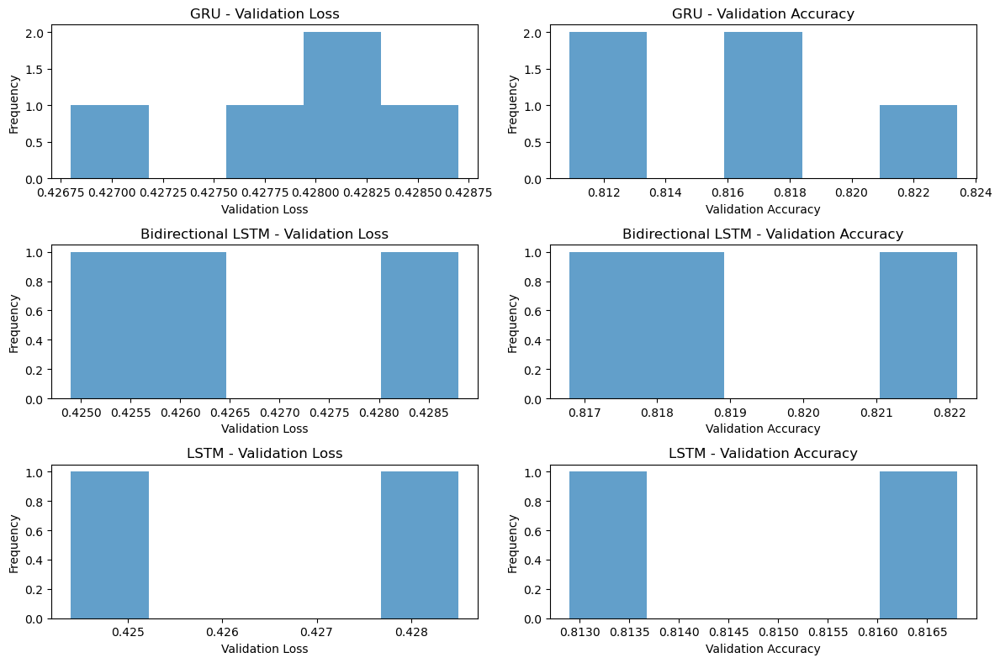

In [2]:
import matplotlib.pyplot as plt
import pandas as pd

data = {
    'Model Type': ['GRU', 'Bidirectional LSTM', 'Bidirectional LSTM', 'GRU', 'LSTM', 'Bidirectional LSTM', 'GRU', 'LSTM', 'GRU', 'GRU'],
    'Hidden Dim': [128, 256, 64, 128, 256, 64, 64, 128, 64, 128],
    'Layers': [3, 3, 3, 3, 2, 3, 3, 2, 3, 3],
    'Dropout Rate': [0.3, 0.3, 0.3, 0.5, 0.3, 0.5, 0.5, 0.5, 0.5, 0.5],
    'Batch Size': [64, 32, 64, 32, 64, 64, 64, 64, 64, 64],
    'Learning Rate': [0.01, 0.001, 0.01, 0.001, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01],
    'Optimizer': ['RMSprop', 'Adam', 'AdamW', 'RMSprop', 'Adam', 'RMSprop', 'RMSprop', 'Adam', 'AdamW', 'Adam'],
    'Activation Function': ['LeakyReLU', 'LeakyReLU', 'LeakyReLU', 'LeakyReLU', 'LeakyReLU', 'LeakyReLU', 'LeakyReLU', 'LeakyReLU', 'LeakyReLU', 'LeakyReLU'],
    'Validation Loss': [0.4280, 0.4288, 0.4249, 0.4268, 0.4244, 0.4264, 0.4283, 0.4285, 0.4278, 0.4287],
    'Validation Accuracy': [0.8234, 0.8221, 0.8188, 0.8175, 0.8168, 0.8168, 0.8162, 0.8129, 0.8109, 0.8116]
}

df = pd.DataFrame(data)

model_types = df['Model Type'].unique()

fig, axes = plt.subplots(len(model_types), 2, figsize=(12, 8))

for i, model_type in enumerate(model_types):
    model_data = df[df['Model Type'] == model_type]
    
    ###Histogram for Validation Loss
    axes[i, 0].hist(model_data['Validation Loss'], bins=5, alpha=0.7)
    axes[i, 0].set_title(f'{model_type} - Validation Loss')
    axes[i, 0].set_xlabel('Validation Loss')
    axes[i, 0].set_ylabel('Frequency')
    
    ###Histogram for Validation Accuracy
    axes[i, 1].hist(model_data['Validation Accuracy'], bins=5, alpha=0.7)
    axes[i, 1].set_title(f'{model_type} - Validation Accuracy')
    axes[i, 1].set_xlabel('Validation Accuracy')
    axes[i, 1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()


In this context, "frequency" refers to the number of occurrences of validation loss and validation accuracy values within specific ranges (bins) for each model type. Essentially, the histograms show how often different values of validation loss and validation accuracy appear in the results for each model type.



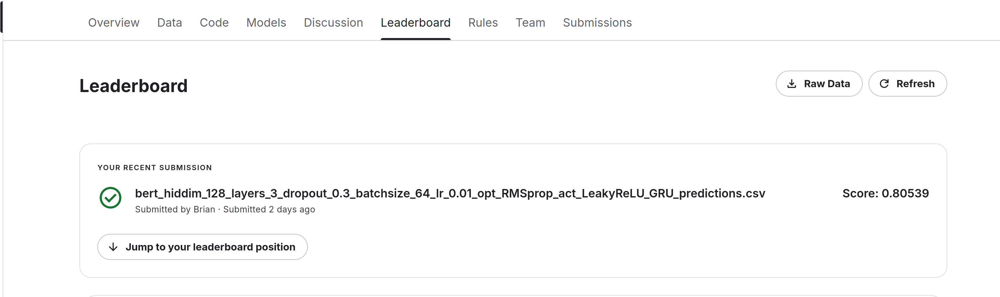

### Future Work

To further improve the model accuracy, several additional efforts could be undertaken. First, I could explore the incorporation of attention mechanisms, which have been shown to enhance the performance of sequence models by allowing them to focus on relevant parts of the input sequence. Second, implementing transformer-based architectures, such as BERT or GPT, could provide more robust contextual understanding and improve classification accuracy. These models leverage self-attention mechanisms to capture intricate dependencies in the text data.

Another area of improvement involves the augmentation of the training data. Increasing the size and diversity of the training dataset can help the model generalize better to unseen data. Additionally, I could experiment with different data augmentation techniques specific to text data, such as synonym replacement or back-translation, to artificially expand the dataset.

Fine-tuning pre-trained language models on my specific dataset could also yield better results. Pre-trained models have already captured a vast amount of linguistic knowledge and, with fine-tuning, can be adapted to the nuances of the specific task at hand.

Lastly, leveraging ensemble methods by combining predictions from multiple models could lead to improved performance. Ensemble techniques, such as stacking or voting, can reduce the variance and bias of individual models, resulting in more accurate predictions.